# Significant aspects of model construction

* adding in bubbles to each of the three model types explored in first verification
* testing out different scales of each

Metrics upon which to assess these:
* cases over time
* deaths over time
* effective R at different points
* constraint-specific measures (e.g. cases over time per district in models with districts)

## Section A. Define Functions needed 
### A1. First the model inputs and outputs to include:
- processModelOutput: decides the format of the files that will be output
- processInfections: the format of the infections file
- findROFInstance: total number of individuals infected by the introduction of an infected person (is this returned at the end of a model run?
- WorldBankMASONmodel: defines teh input directory for the parameters to be used, the format of the output files with the aggregate figures and the infections, and how we edit the parameters and includes the amount of memory used in the server to run the model

In [11]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import pylab as plt
from os.path import isfile, join
from glob import glob
import subprocess
import re
import seaborn as sns
from matplotlib.pyplot import figure
sns.set(style="darkgrid")

In [3]:


def processModelOutput(filename):
    r_data = pd.read_csv(filename, sep='\t')
    r_data['districtId'] = [int(str(x).split('_')[1]) for x in r_data["myId"]]
    return {'results': r_data}

def processInfections(filename):
    r_data = pd.read_csv(filename, sep='\t')
    return {'results': r_data}
    

def findROFInstance():
    # total number of individuals infected by the introduction of an infectious person
    return beta * n

def WorldBankMASONmodel(myOutputPrefix, seed, paramfile, beta, numDays=90):
    
    dataDir = "/home/wb488473/Disease-Modelling-SSA/data/verification/"
    #"/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/"
    exportFilename = myOutputPrefix + "_agg_" + str(seed) + "_" + str(beta) + ".txt"
    exportInfectionsFilename = myOutputPrefix + "_Infections_" + str(seed) + "_" + str(beta) + ".txt"
    
    subprocess.call(['java', '-Xms20G', '-jar', '../java/WorldBankCovid19/libs/WB_covid19ABM.jar', str(numDays), 
                     dataDir, str(beta), str(seed), exportFilename, paramfile, exportInfectionsFilename])
    
    # Sophie upped the -Xms to 20G from 6GB
    #return processModelOutput(exportFilename)
    return processInfections(exportInfectionsFilename)

def processModelOutput(filename):
    r_data = pd.read_csv(filename, sep='\t')
    r_data['districtId'] = [int(str(x).split('_')[1]) for x in r_data["myId"]]
    return {'results': r_data}

def processInfections(filename):
    r_data = pd.read_csv(filename, sep='\t')
    return {'results': r_data}
    

def findROFInstance():
    # total number of individuals infected by the introduction of an infectious person
    return beta * n

def WorldBankMASONmodel(myOutputPrefix, seed, paramfile, beta, numDays=90):
    
    dataDir = "/home/wb488473/Disease-Modelling-SSA/data/verification/"
    #"/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/"
    exportFilename = myOutputPrefix + "_agg_" + str(seed) + "_" + str(beta) + ".txt"
    exportInfectionsFilename = myOutputPrefix + "_Infections_" + str(seed) + "_" + str(beta) + ".txt"
    
    subprocess.call(['java', '-Xms30G', '-jar', '../java/WorldBankCovid19/libs/WB_covid19ABM.jar', str(numDays), 
                     dataDir, str(beta), str(seed), exportFilename, paramfile, exportInfectionsFilename])
    
    # Sophie upped the -Xms to 20G from 6GB
    #return processModelOutput(exportFilename)
    return processInfections(exportInfectionsFilename)

In [4]:

def plotMetric(files, prefix, suffix, metrics = [], symbol = "-", alpha=1, weighting = 1):
    myAvgLine = []
    index = 0
    template = "^" + prefix + ".*" + suffix + "$"

    for f in files:

        if(re.search(template, f) != None): # f.startswith(prefix) and 
            r_data_raw = pd.read_csv(path + f, sep='\t')
            #we need to add an if statement here for only if it's a multidistrict model do we do this aggregation
            unique_dist_names = pd.unique(r_data_raw['myId'])
            if len(unique_dist_names) == 1:
                r_data = r_data_raw
            else:
                r_data = r_data_raw.groupby('time', as_index=False).agg({'metric_died_count': 'sum', 'metric_new_hospitalized': 'sum', 
                                    'metric_new_critical': 'sum', 'metric_new_cases_asympt': 'sum',
                                    'metric_new_cases_sympt': 'sum', 'metric_new_deaths': 'sum', 
                                    'metric_new_recovered': 'sum', 'metric_currently_infected': 'sum'})
            totcases = []
            for metric in metrics:
                if len(totcases) == 0:
                    totcases = r_data[metric]
                else:        
                    totcases = totcases + r_data[metric]
            #totcases = r_data[metric]
            
            if len(myAvgLine) == 0:
                myAvgLine = totcases
            else:
                myAvgLine += totcases
            
            # plot it
            plt.plot(r_data["time"][1:], weighting * totcases[1:], symbol, alpha=alpha)
            index += 1
    return {"myLine": weighting * myAvgLine/index, "myTime": r_data["time"]}

## Section B: Run the model scenarios
In this part we are able to use the functions defined above to run different versions of the model to create different outputs

### B4. Comparing different scales on perfect mixing - multi-district, multi-status model, without weekends

This notebook is a continuation of 'verification of model functionality' by first comparing different scales of the population being used with the decided model. 

### B4.1 Comparing to 5% sample

In [ ]:
paramsPerScenario = ["../data/verification/params_multiStatusMultiDist_noWknds_5perc.txt"]   
betasPerScenario = [0.03, 0.3, 0.6, 0.9]
myOutputPrefix= "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/"

outputs = {}
for paramsFile in paramsPerScenario:
    for myBeta in betasPerScenario:
        for i in range(11,12):
            myRunName = paramsFile + "_" + str(myBeta) + "_" + str(i)
            exportFilename ="sweep_multiStatusMultiDist_noWkends_5p_betaComparison_"
            myO = WorldBankMASONmodel(myOutputPrefix + exportFilename, i, paramsFile, myBeta)
            outputs[myRunName] = myO

### B4.2 Comparing to 20% sample

In [9]:
paramsPerScenario = ["../data/verification/params_multiStatusMultiDist_noWknds_20perc.txt"]   
betasPerScenario = [0.9]
myOutputPrefix= "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/"

outputs = {}
for paramsFile in paramsPerScenario:
    for myBeta in betasPerScenario:
        for i in range(6,12):
            myRunName = paramsFile + "_" + str(myBeta) + "_" + str(i)
            exportFilename ="sweep_multiStatusMultiDist_noWkends_20p_betaComparison_"
            myO = WorldBankMASONmodel(myOutputPrefix + exportFilename, i, paramsFile, myBeta)
            outputs[myRunName] = myO

Reading in data from ../data/verification/params_multiStatusMultiDist_noWknds_20perc.txt
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/dailyDistrictTransitionProb_preLockdown_multiDist.csv
BEGIN READING IN DISTRICTS
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/dailyDistrictTransitionProb_preLockdown_multiDist.csv
BEGIN READING IN DISTRICTS
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/decreasedTransitionMobilityRates_multiDist.csv
BEGIN READING IN LEAVING PROBABILITIES
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
..

P_2923143 has DIED :(
P_1729879 has DIED :(
P_1048209 has DIED :(
P_629496 has DIED :(
P_858507 has DIED :(
P_1024029 has DIED :(
P_2613360 has DIED :(
P_455706 has DIED :(
P_1151034 has DIED :(
P_2633508 has DIED :(
P_1062375 has DIED :(
P_1149280 has DIED :(
P_1718959 has DIED :(
P_2402322 has DIED :(
P_2892295 has DIED :(
P_2736961 has DIED :(
P_2788664 has DIED :(
P_1324020 has DIED :(
P_2772335 has DIED :(
P_2987847 has DIED :(
P_131398 has DIED :(
P_472463 has DIED :(
P_1749559 has DIED :(
P_2276144 has DIED :(
P_1152848 has DIED :(
P_2775927 has DIED :(
P_1338558 has DIED :(
P_589486 has DIED :(
P_121119 has DIED :(
Day 47 finished
P_938165 has DIED :(
P_941430 has DIED :(
P_1003773 has DIED :(
P_952015 has DIED :(
P_1258330 has DIED :(
P_2351684 has DIED :(
P_2722906 has DIED :(
P_1375038 has DIED :(
P_2619777 has DIED :(
P_2802031 has DIED :(
P_907030 has DIED :(
P_1710686 has DIED :(
P_2683478 has DIED :(
P_1080346 has DIED :(
P_1733269 has DIED :(
P_2694916 has DIED :(
P_265

P_1162825 has DIED :(
Day 50 finished
P_974977 has DIED :(
P_161901 has DIED :(
P_1288976 has DIED :(
P_1689025 has DIED :(
P_685854 has DIED :(
P_2835571 has DIED :(
P_1189525 has DIED :(
P_1588084 has DIED :(
P_2199702 has DIED :(
P_1725066 has DIED :(
P_2372725 has DIED :(
P_875151 has DIED :(
P_580007 has DIED :(
P_2702847 has DIED :(
P_2979468 has DIED :(
P_1628767 has DIED :(
P_2860717 has DIED :(
P_1075985 has DIED :(
P_10758 has DIED :(
P_190884 has DIED :(
P_1753257 has DIED :(
P_2787648 has DIED :(
P_1627838 has DIED :(
P_310622 has DIED :(
P_1823547 has DIED :(
P_1520570 has DIED :(
P_2954393 has DIED :(
P_2972788 has DIED :(
P_734896 has DIED :(
P_2651148 has DIED :(
P_1078009 has DIED :(
P_661638 has DIED :(
P_355483 has DIED :(
P_1709072 has DIED :(
P_1149823 has DIED :(
P_159055 has DIED :(
P_1185421 has DIED :(
P_934970 has DIED :(
P_678110 has DIED :(
P_2361779 has DIED :(
P_924400 has DIED :(
P_780057 has DIED :(
P_84640 has DIED :(
P_1021110 has DIED :(
P_1021213 has

P_2623607 has DIED :(
P_1081496 has DIED :(
P_2624181 has DIED :(
P_681636 has DIED :(
P_2615876 has DIED :(
P_1914616 has DIED :(
P_1782329 has DIED :(
P_1655870 has DIED :(
P_2855736 has DIED :(
P_1247846 has DIED :(
P_1679586 has DIED :(
P_35291 has DIED :(
P_345767 has DIED :(
P_1157147 has DIED :(
P_2501156 has DIED :(
P_2883245 has DIED :(
P_1982210 has DIED :(
P_88761 has DIED :(
P_2813658 has DIED :(
P_1784813 has DIED :(
P_1449487 has DIED :(
P_1402333 has DIED :(
P_1030455 has DIED :(
P_873403 has DIED :(
P_1758206 has DIED :(
P_406354 has DIED :(
P_838306 has DIED :(
P_2715737 has DIED :(
P_1772343 has DIED :(
P_859324 has DIED :(
P_65240 has DIED :(
P_670465 has DIED :(
P_1344266 has DIED :(
P_782967 has DIED :(
P_902332 has DIED :(
P_1071827 has DIED :(
P_557560 has DIED :(
P_1514948 has DIED :(
P_2967763 has DIED :(
P_1428160 has DIED :(
P_1715704 has DIED :(
P_2318087 has DIED :(
P_1152259 has DIED :(
P_83207 has DIED :(
P_1206674 has DIED :(
P_1719570 has DIED :(
P_1417

P_340336 has DIED :(
P_2349669 has DIED :(
P_1360711 has DIED :(
P_907883 has DIED :(
P_107402 has DIED :(
P_1312771 has DIED :(
P_2675969 has DIED :(
P_838988 has DIED :(
P_642565 has DIED :(
P_1714864 has DIED :(
P_2815588 has DIED :(
P_324842 has DIED :(
P_726930 has DIED :(
Day 53 finished
P_2631215 has DIED :(
P_816140 has DIED :(
P_1748274 has DIED :(
P_1349218 has DIED :(
P_1821321 has DIED :(
P_831799 has DIED :(
P_530754 has DIED :(
P_1698122 has DIED :(
P_1307939 has DIED :(
P_1050780 has DIED :(
P_2423647 has DIED :(
P_1309030 has DIED :(
P_156671 has DIED :(
P_2398449 has DIED :(
P_561101 has DIED :(
P_1795721 has DIED :(
P_42826 has DIED :(
P_2682215 has DIED :(
P_330814 has DIED :(
P_321308 has DIED :(
P_1013255 has DIED :(
P_34624 has DIED :(
P_653656 has DIED :(
P_2730664 has DIED :(
P_2285649 has DIED :(
P_1512653 has DIED :(
P_1107794 has DIED :(
P_1952063 has DIED :(
P_309662 has DIED :(
P_2953160 has DIED :(
P_2939557 has DIED :(
P_2327921 has DIED :(
P_973105 has D

P_1151354 has DIED :(
P_807170 has DIED :(
P_1987735 has DIED :(
P_574508 has DIED :(
P_1473266 has DIED :(
P_365887 has DIED :(
P_2357148 has DIED :(
P_2432117 has DIED :(
P_1101469 has DIED :(
P_93252 has DIED :(
P_844870 has DIED :(
Day 54 finished
P_612266 has DIED :(
P_2662564 has DIED :(
P_45640 has DIED :(
P_2836510 has DIED :(
P_841470 has DIED :(
P_1147067 has DIED :(
P_1018856 has DIED :(
P_1520821 has DIED :(
P_721101 has DIED :(
P_1781208 has DIED :(
P_237387 has DIED :(
P_43973 has DIED :(
P_2568074 has DIED :(
P_2722877 has DIED :(
P_2328955 has DIED :(
P_1021869 has DIED :(
P_2463070 has DIED :(
P_1442532 has DIED :(
P_578809 has DIED :(
P_1774371 has DIED :(
P_1344549 has DIED :(
P_1684466 has DIED :(
P_2495826 has DIED :(
P_1629054 has DIED :(
P_1100613 has DIED :(
P_354161 has DIED :(
P_1669223 has DIED :(
P_1025278 has DIED :(
P_2842301 has DIED :(
P_2842275 has DIED :(
P_2595959 has DIED :(
P_1650940 has DIED :(
P_845832 has DIED :(
P_1171823 has DIED :(
P_1552549 h

P_1604523 has DIED :(
P_1368756 has DIED :(
P_1779516 has DIED :(
P_1587962 has DIED :(
P_904180 has DIED :(
P_2081288 has DIED :(
P_1727740 has DIED :(
P_743634 has DIED :(
P_1626405 has DIED :(
P_416045 has DIED :(
P_2346827 has DIED :(
P_2875440 has DIED :(
P_644197 has DIED :(
P_953113 has DIED :(
P_1610957 has DIED :(
P_1759392 has DIED :(
P_1691116 has DIED :(
P_1336920 has DIED :(
P_843853 has DIED :(
P_676542 has DIED :(
P_2600174 has DIED :(
P_1390130 has DIED :(
P_832865 has DIED :(
P_1471024 has DIED :(
P_1616599 has DIED :(
P_1623235 has DIED :(
P_1216101 has DIED :(
P_1009266 has DIED :(
P_959925 has DIED :(
P_821887 has DIED :(
P_392223 has DIED :(
P_58122 has DIED :(
P_1738087 has DIED :(
P_2036534 has DIED :(
P_1547516 has DIED :(
P_1004087 has DIED :(
P_448902 has DIED :(
P_937450 has DIED :(
P_168249 has DIED :(
P_191212 has DIED :(
P_2887154 has DIED :(
P_563738 has DIED :(
P_16625 has DIED :(
P_1658685 has DIED :(
P_2869004 has DIED :(
P_817631 has DIED :(
P_1561889

P_1254828 has DIED :(
P_352656 has DIED :(
P_2786518 has DIED :(
P_2885414 has DIED :(
P_2404472 has DIED :(
P_2331164 has DIED :(
P_1816504 has DIED :(
P_1046246 has DIED :(
P_1572853 has DIED :(
P_865973 has DIED :(
P_624428 has DIED :(
P_574780 has DIED :(
P_1915757 has DIED :(
P_2337697 has DIED :(
P_207033 has DIED :(
P_157087 has DIED :(
P_1552660 has DIED :(
P_576347 has DIED :(
P_424267 has DIED :(
P_1108504 has DIED :(
P_1821545 has DIED :(
P_944311 has DIED :(
P_2379623 has DIED :(
P_2791263 has DIED :(
P_1018074 has DIED :(
P_2383193 has DIED :(
P_1748300 has DIED :(
P_1589273 has DIED :(
P_1359765 has DIED :(
P_981959 has DIED :(
P_724818 has DIED :(
P_362831 has DIED :(
P_338724 has DIED :(
P_2689109 has DIED :(
P_1986489 has DIED :(
P_2578150 has DIED :(
P_2709614 has DIED :(
P_934956 has DIED :(
P_2113500 has DIED :(
P_1051187 has DIED :(
P_1173805 has DIED :(
P_752911 has DIED :(
P_957358 has DIED :(
P_562443 has DIED :(
P_2207230 has DIED :(
P_2014465 has DIED :(
P_337

P_1446616 has DIED :(
P_1683344 has DIED :(
P_1003030 has DIED :(
P_130904 has DIED :(
P_1696816 has DIED :(
P_170678 has DIED :(
P_2805218 has DIED :(
P_1436570 has DIED :(
P_907227 has DIED :(
P_315869 has DIED :(
P_9264 has DIED :(
P_631290 has DIED :(
P_680337 has DIED :(
P_1578944 has DIED :(
P_238592 has DIED :(
P_373833 has DIED :(
P_910208 has DIED :(
P_1631950 has DIED :(
P_450980 has DIED :(
P_2983215 has DIED :(
P_1968576 has DIED :(
P_454455 has DIED :(
P_176439 has DIED :(
P_1193583 has DIED :(
P_1305641 has DIED :(
P_2680813 has DIED :(
P_473870 has DIED :(
P_1853533 has DIED :(
P_393758 has DIED :(
P_376488 has DIED :(
P_1913804 has DIED :(
P_365878 has DIED :(
P_504596 has DIED :(
P_567190 has DIED :(
P_1714118 has DIED :(
P_1416046 has DIED :(
P_434284 has DIED :(
P_1755550 has DIED :(
P_1283858 has DIED :(
P_1182238 has DIED :(
P_1211604 has DIED :(
P_875378 has DIED :(
P_1613244 has DIED :(
P_2321163 has DIED :(
P_2369586 has DIED :(
P_206675 has DIED :(
P_556392 has

P_2491217 has DIED :(
P_154659 has DIED :(
P_1152482 has DIED :(
P_1589313 has DIED :(
P_404300 has DIED :(
P_2270114 has DIED :(
P_487205 has DIED :(
P_285554 has DIED :(
P_478748 has DIED :(
P_624152 has DIED :(
P_380094 has DIED :(
P_359147 has DIED :(
P_1525222 has DIED :(
P_2171998 has DIED :(
P_102968 has DIED :(
P_1976240 has DIED :(
P_355042 has DIED :(
P_578769 has DIED :(
P_1515917 has DIED :(
P_315943 has DIED :(
P_1812639 has DIED :(
P_1904514 has DIED :(
P_1665175 has DIED :(
P_36526 has DIED :(
P_1087435 has DIED :(
P_2069233 has DIED :(
P_187247 has DIED :(
P_2227487 has DIED :(
P_2210307 has DIED :(
P_1705817 has DIED :(
P_1776819 has DIED :(
P_1212082 has DIED :(
P_315808 has DIED :(
P_1963807 has DIED :(
P_1189242 has DIED :(
P_1785569 has DIED :(
P_707725 has DIED :(
P_2073891 has DIED :(
P_485547 has DIED :(
P_1164846 has DIED :(
P_311180 has DIED :(
P_1295692 has DIED :(
P_423032 has DIED :(
P_2351945 has DIED :(
P_1848671 has DIED :(
P_1979424 has DIED :(
P_739837

P_591704 has DIED :(
P_573251 has DIED :(
P_102797 has DIED :(
P_759786 has DIED :(
P_498775 has DIED :(
P_1933374 has DIED :(
P_396532 has DIED :(
P_1168819 has DIED :(
P_47597 has DIED :(
P_2723200 has DIED :(
P_483531 has DIED :(
P_1962752 has DIED :(
P_2122124 has DIED :(
P_2467139 has DIED :(
P_2400086 has DIED :(
P_164100 has DIED :(
P_324341 has DIED :(
P_1593877 has DIED :(
P_1956923 has DIED :(
P_1935928 has DIED :(
P_192404 has DIED :(
P_163738 has DIED :(
P_1740154 has DIED :(
P_2317249 has DIED :(
P_2078959 has DIED :(
P_1545937 has DIED :(
P_2212365 has DIED :(
P_2904954 has DIED :(
P_362871 has DIED :(
P_2286469 has DIED :(
P_592559 has DIED :(
P_2438979 has DIED :(
P_2439284 has DIED :(
P_949552 has DIED :(
P_2297451 has DIED :(
P_959742 has DIED :(
P_2485764 has DIED :(
P_207564 has DIED :(
P_444548 has DIED :(
P_1669856 has DIED :(
P_1723084 has DIED :(
P_987304 has DIED :(
P_1170961 has DIED :(
P_464335 has DIED :(
P_1313865 has DIED :(
P_2315725 has DIED :(
P_166019 

P_2479375 has DIED :(
P_706357 has DIED :(
P_1858080 has DIED :(
P_383975 has DIED :(
P_1831944 has DIED :(
P_627010 has DIED :(
P_424837 has DIED :(
P_958403 has DIED :(
P_294879 has DIED :(
P_1920157 has DIED :(
P_1736956 has DIED :(
P_2307005 has DIED :(
P_994104 has DIED :(
P_177758 has DIED :(
P_382311 has DIED :(
P_1808712 has DIED :(
P_1938258 has DIED :(
P_827921 has DIED :(
P_198904 has DIED :(
P_1019299 has DIED :(
P_1218551 has DIED :(
P_2350295 has DIED :(
P_2386042 has DIED :(
P_1894270 has DIED :(
P_498258 has DIED :(
P_145028 has DIED :(
P_1549451 has DIED :(
P_103595 has DIED :(
P_2305513 has DIED :(
P_2497507 has DIED :(
P_491882 has DIED :(
P_1992686 has DIED :(
P_692074 has DIED :(
P_2374184 has DIED :(
P_191666 has DIED :(
P_708413 has DIED :(
P_2342971 has DIED :(
P_684935 has DIED :(
P_379208 has DIED :(
P_732877 has DIED :(
P_85936 has DIED :(
P_1834542 has DIED :(
P_120383 has DIED :(
P_201501 has DIED :(
P_1830633 has DIED :(
P_1339131 has DIED :(
P_702568 has 

P_1898799 has DIED :(
P_728263 has DIED :(
P_2457235 has DIED :(
P_586991 has DIED :(
P_453273 has DIED :(
P_1938947 has DIED :(
P_704239 has DIED :(
P_1185743 has DIED :(
P_1378927 has DIED :(
P_1697414 has DIED :(
P_971136 has DIED :(
P_2275275 has DIED :(
P_2451699 has DIED :(
P_2253037 has DIED :(
P_1384705 has DIED :(
P_171342 has DIED :(
P_1432027 has DIED :(
P_2446895 has DIED :(
P_1251645 has DIED :(
P_2179236 has DIED :(
P_473607 has DIED :(
P_1669054 has DIED :(
P_289266 has DIED :(
P_2440612 has DIED :(
P_2380180 has DIED :(
P_2495893 has DIED :(
P_1959396 has DIED :(
P_1539506 has DIED :(
P_141240 has DIED :(
P_2282343 has DIED :(
P_1003979 has DIED :(
P_598149 has DIED :(
P_397060 has DIED :(
P_429500 has DIED :(
P_1176624 has DIED :(
P_1748348 has DIED :(
P_1236296 has DIED :(
P_884972 has DIED :(
P_1453336 has DIED :(
P_2114557 has DIED :(
P_193335 has DIED :(
P_2080917 has DIED :(
P_2428105 has DIED :(
P_1689553 has DIED :(
P_1077715 has DIED :(
P_2286441 has DIED :(
P_

P_326585 has DIED :(
P_1847209 has DIED :(
P_1637486 has DIED :(
P_2449044 has DIED :(
P_1928470 has DIED :(
P_1590943 has DIED :(
P_1380223 has DIED :(
P_1047243 has DIED :(
P_281639 has DIED :(
P_1773034 has DIED :(
P_1536817 has DIED :(
P_412686 has DIED :(
P_34057 has DIED :(
P_498351 has DIED :(
P_964685 has DIED :(
P_2194963 has DIED :(
P_1036230 has DIED :(
P_1890506 has DIED :(
P_1956461 has DIED :(
P_193889 has DIED :(
P_1400404 has DIED :(
P_2288159 has DIED :(
P_2078252 has DIED :(
P_384132 has DIED :(
P_1541969 has DIED :(
P_181951 has DIED :(
P_1635628 has DIED :(
P_1609097 has DIED :(
P_1868699 has DIED :(
P_2467879 has DIED :(
P_2400325 has DIED :(
P_382783 has DIED :(
P_1599924 has DIED :(
P_1170892 has DIED :(
P_2066667 has DIED :(
P_240878 has DIED :(
P_2262240 has DIED :(
P_1442791 has DIED :(
P_504408 has DIED :(
P_1869371 has DIED :(
P_2469937 has DIED :(
P_2476455 has DIED :(
P_1570266 has DIED :(
P_2132729 has DIED :(
P_186986 has DIED :(
P_1597680 has DIED :(
P_

P_1595043 has DIED :(
P_2471685 has DIED :(
P_2213555 has DIED :(
P_2298649 has DIED :(
P_1673713 has DIED :(
P_1171724 has DIED :(
P_2333662 has DIED :(
P_2053642 has DIED :(
P_212421 has DIED :(
P_1530836 has DIED :(
P_2074329 has DIED :(
P_2234156 has DIED :(
P_1606198 has DIED :(
P_160985 has DIED :(
P_1458469 has DIED :(
P_383868 has DIED :(
P_2470072 has DIED :(
P_387026 has DIED :(
P_2187193 has DIED :(
P_1676682 has DIED :(
P_2337792 has DIED :(
P_2465888 has DIED :(
P_1588937 has DIED :(
P_2468543 has DIED :(
P_362775 has DIED :(
P_300031 has DIED :(
P_2422874 has DIED :(
P_2011523 has DIED :(
P_2202605 has DIED :(
P_1598373 has DIED :(
P_2491578 has DIED :(
P_1499876 has DIED :(
P_1674418 has DIED :(
P_2494339 has DIED :(
P_2014893 has DIED :(
P_151686 has DIED :(
P_2009400 has DIED :(
P_2084899 has DIED :(
P_2084713 has DIED :(
P_304787 has DIED :(
P_2040091 has DIED :(
P_2257031 has DIED :(
P_214261 has DIED :(
P_1156889 has DIED :(
P_1934643 has DIED :(
P_471842 has DIED :

P_2313812 has DIED :(
P_2226236 has DIED :(
P_2205839 has DIED :(
P_2495473 has DIED :(
P_2287005 has DIED :(
P_2258436 has DIED :(
P_254775 has DIED :(
P_2486037 has DIED :(
P_1187578 has DIED :(
P_372326 has DIED :(
P_173622 has DIED :(
P_1669014 has DIED :(
P_216287 has DIED :(
P_2029638 has DIED :(
P_2246068 has DIED :(
P_2052554 has DIED :(
P_731496 has DIED :(
P_1573629 has DIED :(
P_553277 has DIED :(
P_245238 has DIED :(
P_278548 has DIED :(
P_1528916 has DIED :(
P_2287293 has DIED :(
P_2241028 has DIED :(
P_262459 has DIED :(
P_2515105 has DIED :(
P_285035 has DIED :(
P_373519 has DIED :(
P_293227 has DIED :(
P_2383879 has DIED :(
P_263776 has DIED :(
P_2421087 has DIED :(
P_2475227 has DIED :(
P_1594379 has DIED :(
P_163261 has DIED :(
P_254236 has DIED :(
P_2301743 has DIED :(
P_200962 has DIED :(
P_2167191 has DIED :(
P_2366661 has DIED :(
P_2301566 has DIED :(
P_385078 has DIED :(
P_487928 has DIED :(
P_297937 has DIED :(
P_1642036 has DIED :(
P_2238578 has DIED :(
P_39612

P_550335 has DIED :(
P_1759536 has DIED :(
P_2461820 has DIED :(
P_761847 has DIED :(
P_972331 has DIED :(
P_1381364 has DIED :(
P_2054854 has DIED :(
P_1505418 has DIED :(
P_1495900 has DIED :(
P_2363577 has DIED :(
P_1472499 has DIED :(
P_1987349 has DIED :(
P_1028826 has DIED :(
P_2286337 has DIED :(
P_580332 has DIED :(
P_430669 has DIED :(
P_2248132 has DIED :(
P_554188 has DIED :(
P_1464573 has DIED :(
P_250446 has DIED :(
Day 70 finished
P_2484366 has DIED :(
P_2087519 has DIED :(
P_410255 has DIED :(
P_1478725 has DIED :(
P_1562107 has DIED :(
P_1807548 has DIED :(
P_880781 has DIED :(
P_1537650 has DIED :(
P_1831642 has DIED :(
P_1503997 has DIED :(
P_260952 has DIED :(
P_2073003 has DIED :(
P_719887 has DIED :(
P_1512413 has DIED :(
Day 71 finished
P_427506 has DIED :(
P_487039 has DIED :(
P_1708821 has DIED :(
P_1137690 has DIED :(
P_2359817 has DIED :(
P_2197121 has DIED :(
P_840814 has DIED :(
P_281423 has DIED :(
P_775222 has DIED :(
P_612753 has DIED :(
P_1672643 has DIE

P_1711751 has DIED :(
P_2290760 has DIED :(
P_1714170 has DIED :(
P_2818892 has DIED :(
P_2665714 has DIED :(
P_1708003 has DIED :(
P_2617917 has DIED :(
P_1131098 has DIED :(
P_113945 has DIED :(
P_2945134 has DIED :(
P_642961 has DIED :(
P_1009495 has DIED :(
P_2710549 has DIED :(
P_2764410 has DIED :(
P_993538 has DIED :(
P_2602184 has DIED :(
P_1112990 has DIED :(
P_2833560 has DIED :(
P_1069744 has DIED :(
P_1783377 has DIED :(
P_1733470 has DIED :(
P_1006317 has DIED :(
P_2638383 has DIED :(
P_1046576 has DIED :(
P_1731337 has DIED :(
P_60191 has DIED :(
P_1074735 has DIED :(
P_1997999 has DIED :(
P_2535937 has DIED :(
P_1058569 has DIED :(
Day 46 finished
P_922716 has DIED :(
P_923311 has DIED :(
P_1060544 has DIED :(
P_2806298 has DIED :(
P_1162461 has DIED :(
P_985064 has DIED :(
P_333081 has DIED :(
P_1791516 has DIED :(
P_2544873 has DIED :(
P_1313344 has DIED :(
P_994769 has DIED :(
P_1766266 has DIED :(
P_2579891 has DIED :(
P_769395 has DIED :(
P_2714924 has DIED :(
P_868

P_999288 has DIED :(
P_877474 has DIED :(
P_2611129 has DIED :(
P_1382486 has DIED :(
P_2829098 has DIED :(
P_40981 has DIED :(
P_951035 has DIED :(
P_924682 has DIED :(
P_696776 has DIED :(
P_995684 has DIED :(
P_1255589 has DIED :(
P_2990629 has DIED :(
P_978500 has DIED :(
P_2821306 has DIED :(
P_1771542 has DIED :(
P_2808991 has DIED :(
P_1711696 has DIED :(
P_2659639 has DIED :(
P_2814815 has DIED :(
P_2670742 has DIED :(
P_916116 has DIED :(
P_1789723 has DIED :(
P_1668781 has DIED :(
P_1112574 has DIED :(
P_3000894 has DIED :(
P_1156065 has DIED :(
P_367253 has DIED :(
P_648703 has DIED :(
P_2806170 has DIED :(
P_1796192 has DIED :(
P_747547 has DIED :(
P_1527465 has DIED :(
P_2741584 has DIED :(
P_329325 has DIED :(
P_2596729 has DIED :(
P_1747084 has DIED :(
P_883859 has DIED :(
P_312541 has DIED :(
P_329111 has DIED :(
P_933412 has DIED :(
P_1720874 has DIED :(
P_42324 has DIED :(
P_429055 has DIED :(
P_2577254 has DIED :(
P_1625703 has DIED :(
P_2908080 has DIED :(
P_1308669

P_2693051 has DIED :(
P_1092931 has DIED :(
P_710924 has DIED :(
P_1702375 has DIED :(
P_1248603 has DIED :(
P_432310 has DIED :(
P_797922 has DIED :(
P_2576633 has DIED :(
P_819032 has DIED :(
P_875214 has DIED :(
P_928778 has DIED :(
P_490630 has DIED :(
P_2728828 has DIED :(
P_67593 has DIED :(
P_920242 has DIED :(
P_54342 has DIED :(
P_686833 has DIED :(
P_2310500 has DIED :(
P_327920 has DIED :(
P_1135721 has DIED :(
P_915645 has DIED :(
P_1334796 has DIED :(
P_2352328 has DIED :(
P_892806 has DIED :(
P_1295692 has DIED :(
P_904311 has DIED :(
P_358139 has DIED :(
P_673183 has DIED :(
P_644452 has DIED :(
P_2612113 has DIED :(
P_2690022 has DIED :(
P_940421 has DIED :(
P_1322822 has DIED :(
P_1385634 has DIED :(
P_1069310 has DIED :(
P_708910 has DIED :(
P_960677 has DIED :(
P_562386 has DIED :(
P_891778 has DIED :(
P_895980 has DIED :(
P_876537 has DIED :(
P_953476 has DIED :(
P_1790876 has DIED :(
P_2707444 has DIED :(
P_1723362 has DIED :(
P_647291 has DIED :(
P_1189279 has DIE

P_2739129 has DIED :(
P_2819705 has DIED :(
P_1069269 has DIED :(
P_1515281 has DIED :(
P_1079845 has DIED :(
P_343117 has DIED :(
P_1336359 has DIED :(
P_155384 has DIED :(
P_899887 has DIED :(
P_1228380 has DIED :(
P_992584 has DIED :(
P_1106547 has DIED :(
P_2822102 has DIED :(
P_28217 has DIED :(
P_1368547 has DIED :(
P_92721 has DIED :(
P_2361765 has DIED :(
P_336509 has DIED :(
P_2876135 has DIED :(
P_2340638 has DIED :(
P_2717823 has DIED :(
P_592710 has DIED :(
P_2952177 has DIED :(
P_2869860 has DIED :(
P_138227 has DIED :(
P_2509279 has DIED :(
P_152829 has DIED :(
P_2750000 has DIED :(
P_67738 has DIED :(
P_2888879 has DIED :(
P_2628125 has DIED :(
P_1953182 has DIED :(
P_1747238 has DIED :(
P_772715 has DIED :(
P_65158 has DIED :(
P_1680935 has DIED :(
P_571802 has DIED :(
P_2105903 has DIED :(
P_1051288 has DIED :(
P_1059994 has DIED :(
P_727093 has DIED :(
P_973796 has DIED :(
P_877360 has DIED :(
P_1528467 has DIED :(
P_15853 has DIED :(
P_2757130 has DIED :(
P_2858999 h

P_336457 has DIED :(
P_813375 has DIED :(
P_2380855 has DIED :(
P_341368 has DIED :(
P_2320697 has DIED :(
P_351630 has DIED :(
P_1151727 has DIED :(
P_463923 has DIED :(
P_1008461 has DIED :(
P_2345449 has DIED :(
P_929432 has DIED :(
P_90110 has DIED :(
P_1923838 has DIED :(
P_1342863 has DIED :(
P_1615218 has DIED :(
P_1374570 has DIED :(
P_1133041 has DIED :(
P_1781807 has DIED :(
P_2532147 has DIED :(
P_2775613 has DIED :(
P_590588 has DIED :(
P_1056479 has DIED :(
P_751830 has DIED :(
P_806099 has DIED :(
P_794531 has DIED :(
P_2656213 has DIED :(
P_595643 has DIED :(
P_1132400 has DIED :(
P_979033 has DIED :(
P_1785922 has DIED :(
P_877805 has DIED :(
P_1666115 has DIED :(
P_190153 has DIED :(
P_489074 has DIED :(
P_2609581 has DIED :(
P_1124468 has DIED :(
P_1016224 has DIED :(
P_1710650 has DIED :(
P_2592072 has DIED :(
P_772218 has DIED :(
P_735725 has DIED :(
P_1523715 has DIED :(
P_3004174 has DIED :(
P_2821299 has DIED :(
P_444703 has DIED :(
P_1029975 has DIED :(
P_491902

P_1909276 has DIED :(
P_573086 has DIED :(
P_886677 has DIED :(
P_2567431 has DIED :(
P_1733438 has DIED :(
P_2642690 has DIED :(
P_93505 has DIED :(
P_531374 has DIED :(
P_1772192 has DIED :(
P_2840995 has DIED :(
P_2087482 has DIED :(
P_2321104 has DIED :(
P_2995265 has DIED :(
P_821164 has DIED :(
P_912421 has DIED :(
P_2840593 has DIED :(
P_918264 has DIED :(
P_2559264 has DIED :(
P_1078052 has DIED :(
P_2062192 has DIED :(
P_939814 has DIED :(
P_1217100 has DIED :(
P_815183 has DIED :(
P_2088239 has DIED :(
P_2340237 has DIED :(
P_2492671 has DIED :(
P_1592882 has DIED :(
P_2234569 has DIED :(
P_46254 has DIED :(
P_2702531 has DIED :(
P_730824 has DIED :(
P_1137637 has DIED :(
P_905346 has DIED :(
P_1064336 has DIED :(
P_1788322 has DIED :(
P_2280261 has DIED :(
P_1700922 has DIED :(
P_1687630 has DIED :(
P_2087279 has DIED :(
P_1475265 has DIED :(
P_1297905 has DIED :(
P_2967939 has DIED :(
P_1082712 has DIED :(
P_1675872 has DIED :(
P_2189458 has DIED :(
P_1922901 has DIED :(
P_

P_1006899 has DIED :(
P_2177352 has DIED :(
P_2565059 has DIED :(
P_2478328 has DIED :(
P_1007934 has DIED :(
P_1217943 has DIED :(
P_2852279 has DIED :(
P_315408 has DIED :(
P_1144426 has DIED :(
P_83018 has DIED :(
P_2414024 has DIED :(
P_1994031 has DIED :(
P_1098017 has DIED :(
P_15866 has DIED :(
P_337235 has DIED :(
P_1596758 has DIED :(
P_1453336 has DIED :(
P_1159150 has DIED :(
P_611336 has DIED :(
P_2341006 has DIED :(
P_1035706 has DIED :(
P_2645972 has DIED :(
P_1149823 has DIED :(
P_293557 has DIED :(
P_479450 has DIED :(
P_119899 has DIED :(
P_1083247 has DIED :(
P_1287520 has DIED :(
P_2462374 has DIED :(
P_189522 has DIED :(
P_1625778 has DIED :(
P_873246 has DIED :(
P_2144357 has DIED :(
P_1311871 has DIED :(
P_1201409 has DIED :(
P_94212 has DIED :(
P_144864 has DIED :(
P_2936426 has DIED :(
P_1001844 has DIED :(
P_623918 has DIED :(
P_972297 has DIED :(
P_534542 has DIED :(
P_578585 has DIED :(
P_2873753 has DIED :(
P_678158 has DIED :(
P_1808281 has DIED :(
P_47407 

P_650749 has DIED :(
P_314081 has DIED :(
P_2983931 has DIED :(
P_770654 has DIED :(
P_428463 has DIED :(
P_726655 has DIED :(
P_675814 has DIED :(
P_1206004 has DIED :(
P_1752678 has DIED :(
P_484641 has DIED :(
P_2331901 has DIED :(
P_924272 has DIED :(
P_936882 has DIED :(
P_843579 has DIED :(
P_2405251 has DIED :(
P_921410 has DIED :(
P_2014297 has DIED :(
P_1548604 has DIED :(
P_1208160 has DIED :(
P_1263752 has DIED :(
P_493420 has DIED :(
P_1602649 has DIED :(
P_640114 has DIED :(
P_1589173 has DIED :(
P_1274784 has DIED :(
P_2136330 has DIED :(
P_2701208 has DIED :(
P_1828173 has DIED :(
P_760532 has DIED :(
P_742528 has DIED :(
P_178381 has DIED :(
P_555598 has DIED :(
P_96606 has DIED :(
P_470245 has DIED :(
P_2747436 has DIED :(
P_158209 has DIED :(
P_1164272 has DIED :(
P_2068579 has DIED :(
P_2084387 has DIED :(
P_834821 has DIED :(
P_961122 has DIED :(
P_961921 has DIED :(
P_391374 has DIED :(
P_748109 has DIED :(
P_1914196 has DIED :(
P_530325 has DIED :(
P_837763 has DI

P_2814551 has DIED :(
P_1665171 has DIED :(
P_2890739 has DIED :(
P_826756 has DIED :(
P_558565 has DIED :(
P_386004 has DIED :(
P_1109366 has DIED :(
P_1717429 has DIED :(
P_1911364 has DIED :(
P_1928198 has DIED :(
P_1494829 has DIED :(
P_587456 has DIED :(
P_1602553 has DIED :(
P_1148693 has DIED :(
P_1524493 has DIED :(
P_1609963 has DIED :(
P_338437 has DIED :(
P_1595044 has DIED :(
P_754643 has DIED :(
P_532729 has DIED :(
P_1040174 has DIED :(
P_470627 has DIED :(
P_1653642 has DIED :(
P_86610 has DIED :(
P_590812 has DIED :(
P_1784343 has DIED :(
P_1573876 has DIED :(
P_636414 has DIED :(
P_198604 has DIED :(
P_732578 has DIED :(
P_1187715 has DIED :(
P_1232377 has DIED :(
P_1340461 has DIED :(
P_1293979 has DIED :(
P_824780 has DIED :(
P_638088 has DIED :(
P_1682365 has DIED :(
P_28372 has DIED :(
P_1425254 has DIED :(
P_302579 has DIED :(
P_1251660 has DIED :(
P_2285204 has DIED :(
P_435690 has DIED :(
P_992529 has DIED :(
P_1558995 has DIED :(
P_238493 has DIED :(
P_2358429 

P_1278259 has DIED :(
P_1917154 has DIED :(
P_561009 has DIED :(
P_1162810 has DIED :(
P_2317020 has DIED :(
P_44995 has DIED :(
P_1957922 has DIED :(
P_2462830 has DIED :(
P_261305 has DIED :(
P_1669202 has DIED :(
P_2215728 has DIED :(
P_1507060 has DIED :(
P_805143 has DIED :(
P_1695101 has DIED :(
Day 58 finished
P_2500208 has DIED :(
P_448373 has DIED :(
P_1662508 has DIED :(
P_89774 has DIED :(
P_197155 has DIED :(
P_361706 has DIED :(
P_2354191 has DIED :(
P_388065 has DIED :(
P_75406 has DIED :(
P_947573 has DIED :(
P_2618935 has DIED :(
P_729506 has DIED :(
P_1012940 has DIED :(
P_164805 has DIED :(
P_1621679 has DIED :(
P_1042827 has DIED :(
P_114222 has DIED :(
P_633598 has DIED :(
P_1195850 has DIED :(
P_2057742 has DIED :(
P_2332297 has DIED :(
P_1192028 has DIED :(
P_636417 has DIED :(
P_1813085 has DIED :(
P_2325871 has DIED :(
P_2466830 has DIED :(
P_1168599 has DIED :(
P_1220612 has DIED :(
P_1545742 has DIED :(
P_1819305 has DIED :(
P_366556 has DIED :(
P_2654735 has 

P_699014 has DIED :(
P_119303 has DIED :(
P_353097 has DIED :(
P_2358854 has DIED :(
P_2192933 has DIED :(
P_385436 has DIED :(
P_1096073 has DIED :(
P_2339449 has DIED :(
P_60545 has DIED :(
P_2396871 has DIED :(
P_1653095 has DIED :(
P_971136 has DIED :(
P_1984134 has DIED :(
P_585819 has DIED :(
P_85181 has DIED :(
P_1525619 has DIED :(
P_176947 has DIED :(
P_2405370 has DIED :(
P_1461703 has DIED :(
P_1583392 has DIED :(
P_72913 has DIED :(
P_42937 has DIED :(
P_1024968 has DIED :(
P_169476 has DIED :(
P_1670 has DIED :(
P_1676650 has DIED :(
P_1503945 has DIED :(
P_1234384 has DIED :(
P_243265 has DIED :(
P_1229385 has DIED :(
P_284606 has DIED :(
P_1356269 has DIED :(
P_566112 has DIED :(
P_2344236 has DIED :(
P_428326 has DIED :(
P_372003 has DIED :(
P_2428942 has DIED :(
P_1392598 has DIED :(
P_2392476 has DIED :(
P_597361 has DIED :(
P_1799093 has DIED :(
P_2022575 has DIED :(
P_2371985 has DIED :(
P_455236 has DIED :(
P_1654741 has DIED :(
P_2069066 has DIED :(
P_1209322 has 

P_1931107 has DIED :(
P_1873083 has DIED :(
P_2385491 has DIED :(
P_1685210 has DIED :(
P_2350236 has DIED :(
P_2337755 has DIED :(
P_1966090 has DIED :(
P_2209072 has DIED :(
P_1450197 has DIED :(
P_225341 has DIED :(
P_2041959 has DIED :(
P_354574 has DIED :(
P_700931 has DIED :(
P_2011929 has DIED :(
P_2046088 has DIED :(
P_2480304 has DIED :(
P_2474475 has DIED :(
P_1821100 has DIED :(
P_1855864 has DIED :(
P_778187 has DIED :(
P_1757512 has DIED :(
P_1571280 has DIED :(
P_283523 has DIED :(
P_1304969 has DIED :(
P_150747 has DIED :(
P_342801 has DIED :(
P_1895605 has DIED :(
P_2403538 has DIED :(
P_2079755 has DIED :(
P_2192151 has DIED :(
P_2677423 has DIED :(
P_1815508 has DIED :(
P_2055023 has DIED :(
P_39997 has DIED :(
P_2056710 has DIED :(
P_519793 has DIED :(
P_1548609 has DIED :(
P_1690241 has DIED :(
P_1163068 has DIED :(
P_911976 has DIED :(
P_469366 has DIED :(
P_1005619 has DIED :(
P_179689 has DIED :(
P_592297 has DIED :(
P_1829397 has DIED :(
P_1555932 has DIED :(
P_

P_1383388 has DIED :(
P_545082 has DIED :(
P_1873242 has DIED :(
P_843791 has DIED :(
P_2324033 has DIED :(
P_1551401 has DIED :(
P_631597 has DIED :(
P_504659 has DIED :(
P_951318 has DIED :(
P_2124274 has DIED :(
P_2328429 has DIED :(
P_2312649 has DIED :(
P_680784 has DIED :(
P_209828 has DIED :(
P_1516605 has DIED :(
P_1790542 has DIED :(
P_1170151 has DIED :(
P_955200 has DIED :(
P_549927 has DIED :(
P_2004803 has DIED :(
P_2350243 has DIED :(
P_1582625 has DIED :(
P_748998 has DIED :(
P_1940045 has DIED :(
P_1550456 has DIED :(
P_2058561 has DIED :(
P_2170127 has DIED :(
P_2484708 has DIED :(
P_24891 has DIED :(
P_2275706 has DIED :(
P_252305 has DIED :(
P_2332916 has DIED :(
P_697939 has DIED :(
P_1677007 has DIED :(
P_7992 has DIED :(
P_197578 has DIED :(
P_751537 has DIED :(
P_490800 has DIED :(
P_1946406 has DIED :(
P_1584066 has DIED :(
P_1992394 has DIED :(
P_1900741 has DIED :(
P_1180464 has DIED :(
P_756015 has DIED :(
P_840814 has DIED :(
P_2015165 has DIED :(
P_2038065 

P_405202 has DIED :(
P_2210854 has DIED :(
P_2252630 has DIED :(
P_1854384 has DIED :(
P_1700691 has DIED :(
P_791067 has DIED :(
P_2298867 has DIED :(
P_2488542 has DIED :(
P_2392664 has DIED :(
P_2209436 has DIED :(
P_216352 has DIED :(
P_1830627 has DIED :(
P_2490906 has DIED :(
P_1898993 has DIED :(
P_2451970 has DIED :(
P_1556696 has DIED :(
P_2085196 has DIED :(
P_1043240 has DIED :(
P_2048827 has DIED :(
P_164998 has DIED :(
P_2438330 has DIED :(
P_2351038 has DIED :(
P_1528245 has DIED :(
P_2308514 has DIED :(
P_1811438 has DIED :(
P_2485519 has DIED :(
P_2274841 has DIED :(
P_1862328 has DIED :(
P_2322677 has DIED :(
P_269785 has DIED :(
P_2231627 has DIED :(
P_1399230 has DIED :(
P_631534 has DIED :(
P_2451377 has DIED :(
P_2012524 has DIED :(
P_2081238 has DIED :(
P_2474711 has DIED :(
P_2282438 has DIED :(
P_437557 has DIED :(
P_2304445 has DIED :(
P_1560534 has DIED :(
P_1532294 has DIED :(
P_1983006 has DIED :(
P_2505732 has DIED :(
P_1601656 has DIED :(
P_1875709 has DIE

P_2475624 has DIED :(
P_1496519 has DIED :(
P_2211361 has DIED :(
P_698833 has DIED :(
P_1820088 has DIED :(
P_1924456 has DIED :(
P_2223643 has DIED :(
P_1891656 has DIED :(
P_2461167 has DIED :(
P_2222580 has DIED :(
P_1535505 has DIED :(
P_2345128 has DIED :(
P_1404292 has DIED :(
P_2233381 has DIED :(
P_2180125 has DIED :(
P_247401 has DIED :(
P_2236070 has DIED :(
P_1851663 has DIED :(
P_2480415 has DIED :(
P_1951984 has DIED :(
P_265804 has DIED :(
P_707631 has DIED :(
P_491892 has DIED :(
P_348610 has DIED :(
P_1876054 has DIED :(
P_715452 has DIED :(
P_2117718 has DIED :(
P_2087342 has DIED :(
P_112431 has DIED :(
P_2018080 has DIED :(
P_1872270 has DIED :(
P_1969688 has DIED :(
P_2349004 has DIED :(
P_706076 has DIED :(
P_1612239 has DIED :(
P_1526965 has DIED :(
P_1640709 has DIED :(
P_2343987 has DIED :(
P_2215885 has DIED :(
P_2240878 has DIED :(
P_1934590 has DIED :(
P_1844748 has DIED :(
P_2487572 has DIED :(
P_1911586 has DIED :(
P_2372127 has DIED :(
P_248995 has DIED :

P_2409228 has DIED :(
P_1524287 has DIED :(
P_2060148 has DIED :(
P_1532642 has DIED :(
P_293329 has DIED :(
Day 67 finished
P_708473 has DIED :(
P_932043 has DIED :(
P_137306 has DIED :(
P_1501226 has DIED :(
P_264056 has DIED :(
P_2484365 has DIED :(
P_2478578 has DIED :(
P_2298129 has DIED :(
P_1526001 has DIED :(
P_267491 has DIED :(
P_823931 has DIED :(
P_1814679 has DIED :(
P_1137832 has DIED :(
P_1955216 has DIED :(
P_26303 has DIED :(
P_2464033 has DIED :(
P_2258806 has DIED :(
P_276464 has DIED :(
P_2302934 has DIED :(
P_1157662 has DIED :(
P_17755 has DIED :(
P_220761 has DIED :(
P_2010582 has DIED :(
P_1978196 has DIED :(
P_1130718 has DIED :(
P_256605 has DIED :(
P_1549403 has DIED :(
P_1502969 has DIED :(
P_155515 has DIED :(
P_2260859 has DIED :(
P_1707465 has DIED :(
P_204984 has DIED :(
P_1387207 has DIED :(
P_1549505 has DIED :(
P_890768 has DIED :(
P_1886974 has DIED :(
P_1480885 has DIED :(
P_1843065 has DIED :(
P_2035906 has DIED :(
Day 68 finished
P_1565405 has DIE

P_1773180 has DIED :(
P_1332472 has DIED :(
P_2561125 has DIED :(
P_2322528 has DIED :(
P_134264 has DIED :(
P_1004253 has DIED :(
P_1235814 has DIED :(
P_1338202 has DIED :(
P_1711806 has DIED :(
P_1729768 has DIED :(
P_666432 has DIED :(
P_852029 has DIED :(
P_1785274 has DIED :(
P_988016 has DIED :(
P_1707905 has DIED :(
P_1661050 has DIED :(
P_189177 has DIED :(
P_2787450 has DIED :(
P_1674879 has DIED :(
P_2834826 has DIED :(
P_1531586 has DIED :(
P_2785831 has DIED :(
P_600 has DIED :(
P_2878271 has DIED :(
P_2401815 has DIED :(
P_2579915 has DIED :(
P_657207 has DIED :(
P_934465 has DIED :(
P_1319249 has DIED :(
P_1730825 has DIED :(
Day 44 finished
P_883841 has DIED :(
P_947582 has DIED :(
P_943999 has DIED :(
P_863931 has DIED :(
P_1736125 has DIED :(
P_2278212 has DIED :(
P_1736964 has DIED :(
P_920681 has DIED :(
P_1596101 has DIED :(
P_651921 has DIED :(
P_112839 has DIED :(
P_2726006 has DIED :(
P_415511 has DIED :(
P_654921 has DIED :(
P_2931923 has DIED :(
P_1332286 has 

P_1084251 has DIED :(
P_1721670 has DIED :(
P_1912119 has DIED :(
P_417269 has DIED :(
P_647145 has DIED :(
P_1049644 has DIED :(
P_787205 has DIED :(
P_966725 has DIED :(
P_2668810 has DIED :(
P_2699432 has DIED :(
P_2918288 has DIED :(
P_924013 has DIED :(
P_1292820 has DIED :(
P_557449 has DIED :(
P_657919 has DIED :(
P_1074759 has DIED :(
P_654250 has DIED :(
P_939933 has DIED :(
P_397929 has DIED :(
P_588339 has DIED :(
P_57067 has DIED :(
P_1651587 has DIED :(
P_381456 has DIED :(
P_1263695 has DIED :(
P_956300 has DIED :(
P_1730047 has DIED :(
P_930457 has DIED :(
P_25861 has DIED :(
P_1726578 has DIED :(
P_719665 has DIED :(
P_1386396 has DIED :(
P_1119306 has DIED :(
P_745060 has DIED :(
P_975532 has DIED :(
P_1618011 has DIED :(
P_340117 has DIED :(
P_759566 has DIED :(
P_330314 has DIED :(
P_2188994 has DIED :(
P_1785768 has DIED :(
P_863262 has DIED :(
P_2604581 has DIED :(
P_1342402 has DIED :(
P_985459 has DIED :(
P_1350399 has DIED :(
P_353503 has DIED :(
P_1008698 has D

P_330481 has DIED :(
P_1018596 has DIED :(
P_2879032 has DIED :(
P_2925636 has DIED :(
P_561820 has DIED :(
P_2859571 has DIED :(
P_1759243 has DIED :(
P_40972 has DIED :(
P_1871948 has DIED :(
P_1324172 has DIED :(
P_946494 has DIED :(
P_2870615 has DIED :(
P_1041905 has DIED :(
P_2537851 has DIED :(
P_1154581 has DIED :(
P_402541 has DIED :(
P_2788811 has DIED :(
P_1159436 has DIED :(
P_845038 has DIED :(
P_2708789 has DIED :(
P_1357665 has DIED :(
P_647186 has DIED :(
P_1654483 has DIED :(
P_2889756 has DIED :(
P_418463 has DIED :(
P_662323 has DIED :(
P_1079037 has DIED :(
P_2558971 has DIED :(
P_2344693 has DIED :(
P_2078536 has DIED :(
P_1719624 has DIED :(
P_1711489 has DIED :(
P_485221 has DIED :(
P_316815 has DIED :(
P_1710618 has DIED :(
P_495543 has DIED :(
P_2311479 has DIED :(
P_321802 has DIED :(
P_1612567 has DIED :(
P_2924475 has DIED :(
P_1668228 has DIED :(
P_2811664 has DIED :(
P_83006 has DIED :(
P_2807236 has DIED :(
P_1263423 has DIED :(
P_946057 has DIED :(
P_787

P_184864 has DIED :(
P_1597955 has DIED :(
P_725829 has DIED :(
P_583043 has DIED :(
P_926862 has DIED :(
P_2926657 has DIED :(
P_827484 has DIED :(
P_1758819 has DIED :(
P_133747 has DIED :(
P_2223677 has DIED :(
P_1262627 has DIED :(
P_2754326 has DIED :(
P_2995256 has DIED :(
P_778095 has DIED :(
P_2554724 has DIED :(
P_1593348 has DIED :(
P_2884939 has DIED :(
P_740808 has DIED :(
P_2664421 has DIED :(
P_820472 has DIED :(
P_825931 has DIED :(
P_755795 has DIED :(
P_1007348 has DIED :(
P_690457 has DIED :(
P_1082878 has DIED :(
P_750701 has DIED :(
P_1709255 has DIED :(
P_565058 has DIED :(
P_1060379 has DIED :(
P_1360703 has DIED :(
P_2633023 has DIED :(
P_254382 has DIED :(
P_1876850 has DIED :(
P_187352 has DIED :(
P_1366934 has DIED :(
P_953676 has DIED :(
P_1844031 has DIED :(
P_585714 has DIED :(
P_848441 has DIED :(
P_2714844 has DIED :(
P_654090 has DIED :(
P_2767257 has DIED :(
P_2767199 has DIED :(
P_2530025 has DIED :(
P_1058983 has DIED :(
P_821003 has DIED :(
P_1000024

P_508284 has DIED :(
P_2964123 has DIED :(
P_909762 has DIED :(
P_2730741 has DIED :(
P_2858883 has DIED :(
P_1766091 has DIED :(
P_349271 has DIED :(
P_1624024 has DIED :(
P_945560 has DIED :(
P_454295 has DIED :(
P_462494 has DIED :(
P_1723530 has DIED :(
P_1139707 has DIED :(
P_1720910 has DIED :(
P_82431 has DIED :(
P_1293440 has DIED :(
P_996446 has DIED :(
P_455882 has DIED :(
P_1166150 has DIED :(
P_1659940 has DIED :(
P_1147707 has DIED :(
P_1522193 has DIED :(
P_944932 has DIED :(
P_831535 has DIED :(
P_1367969 has DIED :(
P_2091287 has DIED :(
P_2345415 has DIED :(
P_1171519 has DIED :(
P_721824 has DIED :(
P_2696697 has DIED :(
P_686833 has DIED :(
P_1349783 has DIED :(
P_2629156 has DIED :(
P_544047 has DIED :(
P_2850028 has DIED :(
P_1383907 has DIED :(
P_805759 has DIED :(
P_2356789 has DIED :(
P_2379911 has DIED :(
P_1847522 has DIED :(
P_962090 has DIED :(
P_681973 has DIED :(
P_318500 has DIED :(
P_974991 has DIED :(
P_1203921 has DIED :(
P_1515282 has DIED :(
P_102322

P_211057 has DIED :(
P_445505 has DIED :(
P_2790540 has DIED :(
P_804150 has DIED :(
P_598819 has DIED :(
P_208091 has DIED :(
P_823440 has DIED :(
P_2843811 has DIED :(
P_369801 has DIED :(
P_564952 has DIED :(
P_2819903 has DIED :(
P_940403 has DIED :(
P_462743 has DIED :(
P_1018730 has DIED :(
P_2568046 has DIED :(
P_624424 has DIED :(
P_1283195 has DIED :(
P_668163 has DIED :(
P_1510020 has DIED :(
P_873474 has DIED :(
P_334962 has DIED :(
P_1863512 has DIED :(
P_1697944 has DIED :(
P_749064 has DIED :(
P_730746 has DIED :(
P_2667053 has DIED :(
P_911593 has DIED :(
P_322297 has DIED :(
P_1723825 has DIED :(
P_1865102 has DIED :(
P_1991662 has DIED :(
P_458429 has DIED :(
P_1467517 has DIED :(
P_850012 has DIED :(
P_1677529 has DIED :(
P_832350 has DIED :(
P_168054 has DIED :(
P_1843124 has DIED :(
P_1706127 has DIED :(
P_2708515 has DIED :(
P_758135 has DIED :(
P_1000900 has DIED :(
P_2026993 has DIED :(
P_2401004 has DIED :(
P_982477 has DIED :(
P_1050795 has DIED :(
P_439712 has

P_2940246 has DIED :(
P_855291 has DIED :(
P_1161031 has DIED :(
P_355108 has DIED :(
P_834213 has DIED :(
P_321537 has DIED :(
P_828373 has DIED :(
P_967832 has DIED :(
P_2307446 has DIED :(
P_390770 has DIED :(
P_2025778 has DIED :(
P_204177 has DIED :(
P_405118 has DIED :(
P_141442 has DIED :(
P_953476 has DIED :(
P_1985336 has DIED :(
P_201076 has DIED :(
P_905599 has DIED :(
P_710924 has DIED :(
P_1784616 has DIED :(
P_670062 has DIED :(
P_2185774 has DIED :(
P_982349 has DIED :(
P_108139 has DIED :(
P_822520 has DIED :(
P_2332295 has DIED :(
P_2817209 has DIED :(
P_587019 has DIED :(
P_2325902 has DIED :(
P_1613244 has DIED :(
P_1621226 has DIED :(
P_1266859 has DIED :(
P_149319 has DIED :(
P_2568663 has DIED :(
P_2496202 has DIED :(
P_2386271 has DIED :(
P_1353664 has DIED :(
P_645452 has DIED :(
P_1931949 has DIED :(
P_1739035 has DIED :(
P_613620 has DIED :(
P_675249 has DIED :(
P_638949 has DIED :(
P_792469 has DIED :(
P_1727870 has DIED :(
P_1232377 has DIED :(
P_226070 has 

P_1005374 has DIED :(
P_2713580 has DIED :(
P_41962 has DIED :(
P_1819450 has DIED :(
P_501426 has DIED :(
P_1295424 has DIED :(
P_577506 has DIED :(
P_2213010 has DIED :(
P_15020 has DIED :(
P_503566 has DIED :(
P_2409683 has DIED :(
P_579512 has DIED :(
P_661215 has DIED :(
P_1442502 has DIED :(
P_1963052 has DIED :(
P_2607393 has DIED :(
P_131086 has DIED :(
P_1012989 has DIED :(
P_2378834 has DIED :(
P_2667299 has DIED :(
P_487644 has DIED :(
P_2755753 has DIED :(
P_851737 has DIED :(
P_1350150 has DIED :(
P_1557844 has DIED :(
P_691227 has DIED :(
P_1473266 has DIED :(
P_380809 has DIED :(
P_1166579 has DIED :(
P_1754709 has DIED :(
P_2758035 has DIED :(
P_2478293 has DIED :(
P_1453117 has DIED :(
P_622181 has DIED :(
P_643275 has DIED :(
P_1678314 has DIED :(
P_1396425 has DIED :(
P_844278 has DIED :(
P_154558 has DIED :(
P_2349328 has DIED :(
P_196964 has DIED :(
P_397910 has DIED :(
P_1030629 has DIED :(
P_2050579 has DIED :(
P_1402617 has DIED :(
P_184928 has DIED :(
P_799656 

P_171832 has DIED :(
P_1240384 has DIED :(
P_2505523 has DIED :(
P_444616 has DIED :(
P_1706383 has DIED :(
P_714473 has DIED :(
P_110641 has DIED :(
P_285710 has DIED :(
P_613538 has DIED :(
P_1260715 has DIED :(
P_959835 has DIED :(
P_2224455 has DIED :(
P_947512 has DIED :(
P_1033664 has DIED :(
P_387569 has DIED :(
P_2316293 has DIED :(
P_791373 has DIED :(
P_1633054 has DIED :(
P_2485064 has DIED :(
P_1758118 has DIED :(
P_1071103 has DIED :(
P_158386 has DIED :(
P_911748 has DIED :(
P_2030359 has DIED :(
P_1629648 has DIED :(
P_567369 has DIED :(
P_405561 has DIED :(
P_485521 has DIED :(
P_1309459 has DIED :(
P_1260053 has DIED :(
P_2066461 has DIED :(
P_207760 has DIED :(
P_2340513 has DIED :(
P_651533 has DIED :(
P_1674259 has DIED :(
P_2493518 has DIED :(
P_620497 has DIED :(
P_504225 has DIED :(
P_824321 has DIED :(
P_2431000 has DIED :(
P_2090689 has DIED :(
P_2003362 has DIED :(
P_863792 has DIED :(
P_2964121 has DIED :(
P_1460182 has DIED :(
P_1662442 has DIED :(
P_669077 

P_1252237 has DIED :(
P_1619613 has DIED :(
P_1684430 has DIED :(
P_2486823 has DIED :(
P_1224205 has DIED :(
P_2038673 has DIED :(
P_729317 has DIED :(
P_1881153 has DIED :(
P_1032553 has DIED :(
P_1601012 has DIED :(
P_986858 has DIED :(
P_1983115 has DIED :(
P_226542 has DIED :(
P_1391372 has DIED :(
P_178466 has DIED :(
P_413128 has DIED :(
P_798810 has DIED :(
P_141356 has DIED :(
P_187287 has DIED :(
P_1822337 has DIED :(
P_1168444 has DIED :(
P_2786171 has DIED :(
P_1049453 has DIED :(
P_423278 has DIED :(
P_955078 has DIED :(
P_488933 has DIED :(
P_2471008 has DIED :(
P_212772 has DIED :(
P_1315106 has DIED :(
P_2295383 has DIED :(
P_1565953 has DIED :(
P_1685797 has DIED :(
P_1773818 has DIED :(
P_1714779 has DIED :(
P_838943 has DIED :(
P_492145 has DIED :(
P_2049921 has DIED :(
P_971097 has DIED :(
P_1172205 has DIED :(
P_1994591 has DIED :(
P_174563 has DIED :(
P_1412967 has DIED :(
P_1099159 has DIED :(
P_487575 has DIED :(
P_2482979 has DIED :(
P_2197531 has DIED :(
P_204

P_1966474 has DIED :(
P_2428000 has DIED :(
P_1391508 has DIED :(
P_1442035 has DIED :(
P_2071816 has DIED :(
P_1390828 has DIED :(
P_736073 has DIED :(
P_795618 has DIED :(
P_1209501 has DIED :(
P_828387 has DIED :(
P_464651 has DIED :(
P_1019001 has DIED :(
P_1823055 has DIED :(
P_2200013 has DIED :(
P_1588051 has DIED :(
P_28946 has DIED :(
P_213596 has DIED :(
P_1206588 has DIED :(
P_458230 has DIED :(
P_1933050 has DIED :(
P_1507786 has DIED :(
P_465366 has DIED :(
P_177550 has DIED :(
P_778658 has DIED :(
P_2249159 has DIED :(
P_1203705 has DIED :(
P_395818 has DIED :(
P_1632319 has DIED :(
P_2071361 has DIED :(
P_501169 has DIED :(
P_2402169 has DIED :(
P_1823547 has DIED :(
P_2430843 has DIED :(
P_448905 has DIED :(
P_892744 has DIED :(
P_162870 has DIED :(
P_159992 has DIED :(
P_1294004 has DIED :(
P_626706 has DIED :(
P_732639 has DIED :(
P_312193 has DIED :(
P_161136 has DIED :(
P_724818 has DIED :(
P_1389294 has DIED :(
P_2200158 has DIED :(
P_1422743 has DIED :(
P_2456556 

P_1626381 has DIED :(
P_1637479 has DIED :(
P_299780 has DIED :(
P_2462629 has DIED :(
P_2951726 has DIED :(
P_835722 has DIED :(
P_1964312 has DIED :(
P_2466676 has DIED :(
P_2347516 has DIED :(
P_623691 has DIED :(
P_2049483 has DIED :(
P_2482022 has DIED :(
P_2426117 has DIED :(
P_462046 has DIED :(
P_354959 has DIED :(
P_225525 has DIED :(
P_1926070 has DIED :(
P_1777166 has DIED :(
P_1576261 has DIED :(
P_2332458 has DIED :(
P_1996410 has DIED :(
P_2464104 has DIED :(
P_2736346 has DIED :(
P_1677235 has DIED :(
P_2091752 has DIED :(
P_1924479 has DIED :(
P_2209212 has DIED :(
P_166609 has DIED :(
P_628524 has DIED :(
P_1934067 has DIED :(
P_1601696 has DIED :(
P_2196991 has DIED :(
P_464776 has DIED :(
P_1440126 has DIED :(
P_483778 has DIED :(
P_943743 has DIED :(
P_1821352 has DIED :(
P_953745 has DIED :(
P_1760070 has DIED :(
P_2039463 has DIED :(
P_427641 has DIED :(
P_1741011 has DIED :(
P_2019120 has DIED :(
P_804290 has DIED :(
P_620704 has DIED :(
P_2329468 has DIED :(
P_1

P_1155421 has DIED :(
P_434887 has DIED :(
P_1759094 has DIED :(
P_1597176 has DIED :(
P_494318 has DIED :(
P_2298295 has DIED :(
P_1089646 has DIED :(
P_1914196 has DIED :(
P_1083734 has DIED :(
P_2238314 has DIED :(
P_515493 has DIED :(
P_2056715 has DIED :(
P_631101 has DIED :(
P_1411038 has DIED :(
P_2374320 has DIED :(
P_1543807 has DIED :(
P_1199948 has DIED :(
P_333502 has DIED :(
P_157407 has DIED :(
P_1949322 has DIED :(
P_1569677 has DIED :(
P_2019199 has DIED :(
P_2200734 has DIED :(
P_2204158 has DIED :(
P_832912 has DIED :(
P_1992431 has DIED :(
P_2048650 has DIED :(
P_827551 has DIED :(
P_2453922 has DIED :(
P_1819453 has DIED :(
P_2476288 has DIED :(
P_526524 has DIED :(
P_1213226 has DIED :(
P_1989605 has DIED :(
P_514603 has DIED :(
P_508002 has DIED :(
P_437741 has DIED :(
P_1197870 has DIED :(
P_271827 has DIED :(
P_2061538 has DIED :(
P_1696404 has DIED :(
P_1252758 has DIED :(
P_2379184 has DIED :(
P_1551770 has DIED :(
P_1962033 has DIED :(
P_1540078 has DIED :(
P

P_2239636 has DIED :(
P_2125309 has DIED :(
P_2077019 has DIED :(
P_2001808 has DIED :(
P_287460 has DIED :(
P_527943 has DIED :(
P_797797 has DIED :(
P_1478710 has DIED :(
P_2103427 has DIED :(
P_2326156 has DIED :(
P_1569511 has DIED :(
P_2480886 has DIED :(
P_2063052 has DIED :(
P_1310036 has DIED :(
P_2000821 has DIED :(
P_1895200 has DIED :(
P_2375106 has DIED :(
P_2289371 has DIED :(
P_1846596 has DIED :(
P_2478578 has DIED :(
P_257597 has DIED :(
P_2067907 has DIED :(
P_2186480 has DIED :(
P_2068214 has DIED :(
P_2177697 has DIED :(
P_247496 has DIED :(
P_2456020 has DIED :(
P_1825617 has DIED :(
P_2050242 has DIED :(
P_1082425 has DIED :(
P_2292419 has DIED :(
P_1834957 has DIED :(
P_1220454 has DIED :(
P_2391283 has DIED :(
P_1840242 has DIED :(
P_2073296 has DIED :(
P_398639 has DIED :(
P_2472577 has DIED :(
P_589835 has DIED :(
P_1808555 has DIED :(
P_2304252 has DIED :(
P_1533084 has DIED :(
P_2078624 has DIED :(
P_1756286 has DIED :(
P_2064215 has DIED :(
P_1530991 has DIE

P_1814524 has DIED :(
P_2733240 has DIED :(
P_1939426 has DIED :(
P_2249370 has DIED :(
P_2185589 has DIED :(
P_1949422 has DIED :(
P_266497 has DIED :(
P_236108 has DIED :(
P_2036162 has DIED :(
P_1137832 has DIED :(
P_1508497 has DIED :(
P_2473364 has DIED :(
P_474504 has DIED :(
P_2026006 has DIED :(
P_1919058 has DIED :(
P_1844604 has DIED :(
P_2075641 has DIED :(
P_2086110 has DIED :(
P_457615 has DIED :(
P_209363 has DIED :(
P_262079 has DIED :(
P_2066631 has DIED :(
P_2811677 has DIED :(
P_1606698 has DIED :(
P_1648537 has DIED :(
P_272255 has DIED :(
P_2457493 has DIED :(
P_2409228 has DIED :(
P_2132358 has DIED :(
P_2080489 has DIED :(
P_2079217 has DIED :(
P_251251 has DIED :(
P_2463717 has DIED :(
P_2461611 has DIED :(
P_1900171 has DIED :(
P_1491517 has DIED :(
P_1504477 has DIED :(
P_1645804 has DIED :(
P_2399425 has DIED :(
Day 64 finished
P_2053728 has DIED :(
P_739433 has DIED :(
P_1586275 has DIED :(
P_880781 has DIED :(
P_2463127 has DIED :(
P_786662 has DIED :(
P_192

P_254326 has DIED :(
P_2013011 has DIED :(
P_1503997 has DIED :(
P_1579151 has DIED :(
P_1701244 has DIED :(
P_2046654 has DIED :(
P_1487776 has DIED :(
P_2055854 has DIED :(
P_2184450 has DIED :(
P_2242050 has DIED :(
P_1485719 has DIED :(
P_243183 has DIED :(
P_2180627 has DIED :(
P_1669187 has DIED :(
P_2472782 has DIED :(
P_1434053 has DIED :(
P_2491802 has DIED :(
P_1590934 has DIED :(
P_1717124 has DIED :(
P_1077799 has DIED :(
P_2079668 has DIED :(
P_2696773 has DIED :(
P_1040264 has DIED :(
P_1546271 has DIED :(
P_1503058 has DIED :(
P_1479830 has DIED :(
P_1978631 has DIED :(
Day 68 finished
P_1624293 has DIED :(
P_1492325 has DIED :(
P_1834644 has DIED :(
P_228445 has DIED :(
P_2041264 has DIED :(
P_830808 has DIED :(
P_263211 has DIED :(
P_285157 has DIED :(
P_1503477 has DIED :(
P_266994 has DIED :(
P_258854 has DIED :(
P_2059373 has DIED :(
P_2249101 has DIED :(
P_1595720 has DIED :(
P_825660 has DIED :(
P_1490453 has DIED :(
P_2376735 has DIED :(
P_1827752 has DIED :(
P_1

P_1925849 has DIED :(
P_2338075 has DIED :(
P_935106 has DIED :(
P_1791756 has DIED :(
P_1718800 has DIED :(
P_33247 has DIED :(
P_1116865 has DIED :(
Day 43 finished
P_1385328 has DIED :(
P_1791432 has DIED :(
P_859132 has DIED :(
P_867153 has DIED :(
P_2730201 has DIED :(
P_823357 has DIED :(
P_409923 has DIED :(
P_2797248 has DIED :(
P_2560983 has DIED :(
P_2591355 has DIED :(
P_2722182 has DIED :(
P_144575 has DIED :(
P_980074 has DIED :(
P_1334692 has DIED :(
P_2922075 has DIED :(
P_942090 has DIED :(
P_883481 has DIED :(
P_168479 has DIED :(
P_2843080 has DIED :(
P_259034 has DIED :(
P_124938 has DIED :(
P_992237 has DIED :(
P_982000 has DIED :(
P_2836083 has DIED :(
P_1715451 has DIED :(
Day 44 finished
P_1731791 has DIED :(
P_976324 has DIED :(
P_1625807 has DIED :(
P_1367003 has DIED :(
P_1535285 has DIED :(
P_930826 has DIED :(
P_2996068 has DIED :(
P_2892501 has DIED :(
P_1744704 has DIED :(
P_186986 has DIED :(
P_1062974 has DIED :(
P_897405 has DIED :(
P_1728919 has DIED :

P_1142640 has DIED :(
P_2749085 has DIED :(
P_1051011 has DIED :(
P_2660315 has DIED :(
P_1577325 has DIED :(
P_1786521 has DIED :(
P_2404472 has DIED :(
P_2627346 has DIED :(
P_2872454 has DIED :(
P_2965502 has DIED :(
P_1045393 has DIED :(
P_1953182 has DIED :(
P_2451499 has DIED :(
P_1627975 has DIED :(
P_688100 has DIED :(
P_1871796 has DIED :(
P_315816 has DIED :(
P_902277 has DIED :(
P_167524 has DIED :(
P_891778 has DIED :(
P_670696 has DIED :(
P_70883 has DIED :(
P_366587 has DIED :(
P_2936485 has DIED :(
P_1782862 has DIED :(
P_33845 has DIED :(
P_892486 has DIED :(
P_886040 has DIED :(
P_2852925 has DIED :(
P_1051542 has DIED :(
P_2532456 has DIED :(
P_450869 has DIED :(
P_989995 has DIED :(
P_36374 has DIED :(
P_106198 has DIED :(
P_2976314 has DIED :(
P_135447 has DIED :(
P_1757536 has DIED :(
P_135739 has DIED :(
P_1263429 has DIED :(
P_2937214 has DIED :(
P_976061 has DIED :(
P_2120203 has DIED :(
P_727014 has DIED :(
P_835758 has DIED :(
P_2698244 has DIED :(
P_909785 ha

P_2036948 has DIED :(
P_1265563 has DIED :(
P_2617807 has DIED :(
P_683442 has DIED :(
P_2647529 has DIED :(
P_1142069 has DIED :(
P_2572306 has DIED :(
P_2161651 has DIED :(
P_2986805 has DIED :(
P_2721106 has DIED :(
P_1092438 has DIED :(
P_1244192 has DIED :(
P_372587 has DIED :(
P_336330 has DIED :(
P_1746556 has DIED :(
P_1339444 has DIED :(
P_1723848 has DIED :(
P_2900974 has DIED :(
P_1968661 has DIED :(
P_2548899 has DIED :(
P_852315 has DIED :(
P_491869 has DIED :(
P_935359 has DIED :(
P_857759 has DIED :(
P_932108 has DIED :(
P_2566145 has DIED :(
P_56770 has DIED :(
P_1788322 has DIED :(
P_2922419 has DIED :(
P_2884911 has DIED :(
P_2787843 has DIED :(
P_63403 has DIED :(
P_1378533 has DIED :(
P_1385233 has DIED :(
P_2570099 has DIED :(
P_960762 has DIED :(
P_100019 has DIED :(
P_2126676 has DIED :(
P_617116 has DIED :(
P_1602309 has DIED :(
Day 51 finished
P_1964672 has DIED :(
P_570314 has DIED :(
P_2060402 has DIED :(
P_890491 has DIED :(
P_1084861 has DIED :(
P_685522 ha

P_3543 has DIED :(
P_69669 has DIED :(
P_885331 has DIED :(
P_2888572 has DIED :(
P_2390828 has DIED :(
P_340778 has DIED :(
P_1084493 has DIED :(
P_1633095 has DIED :(
P_939289 has DIED :(
P_691108 has DIED :(
P_499153 has DIED :(
P_884926 has DIED :(
P_1058388 has DIED :(
P_1741860 has DIED :(
P_1042446 has DIED :(
P_1743806 has DIED :(
P_2242546 has DIED :(
P_2616112 has DIED :(
P_1008741 has DIED :(
P_2354728 has DIED :(
P_167601 has DIED :(
P_1771051 has DIED :(
P_524279 has DIED :(
P_2864935 has DIED :(
P_198872 has DIED :(
P_172200 has DIED :(
P_1363893 has DIED :(
P_332886 has DIED :(
P_1967100 has DIED :(
P_2864193 has DIED :(
P_685519 has DIED :(
P_1788025 has DIED :(
P_10792 has DIED :(
P_998783 has DIED :(
P_2297581 has DIED :(
P_1077778 has DIED :(
P_2325866 has DIED :(
P_2614360 has DIED :(
P_91880 has DIED :(
P_1074362 has DIED :(
P_992505 has DIED :(
P_2589390 has DIED :(
P_119601 has DIED :(
P_1065875 has DIED :(
P_1012908 has DIED :(
P_1770026 has DIED :(
P_1594233 ha

P_1761357 has DIED :(
P_876768 has DIED :(
P_205366 has DIED :(
P_25505 has DIED :(
P_2820360 has DIED :(
P_905534 has DIED :(
P_469125 has DIED :(
P_1299825 has DIED :(
P_1551691 has DIED :(
P_2876430 has DIED :(
P_1042606 has DIED :(
P_700768 has DIED :(
P_1728940 has DIED :(
P_2014819 has DIED :(
P_2459169 has DIED :(
P_1023962 has DIED :(
P_2363114 has DIED :(
P_240099 has DIED :(
P_158471 has DIED :(
P_388710 has DIED :(
P_609342 has DIED :(
P_108082 has DIED :(
P_908837 has DIED :(
P_1376472 has DIED :(
P_675463 has DIED :(
P_2048181 has DIED :(
P_1398938 has DIED :(
P_1814340 has DIED :(
P_2037598 has DIED :(
P_1599361 has DIED :(
P_1331763 has DIED :(
P_1002464 has DIED :(
P_192616 has DIED :(
P_1950990 has DIED :(
P_2604921 has DIED :(
P_1029724 has DIED :(
P_1319538 has DIED :(
P_2438150 has DIED :(
P_26303 has DIED :(
P_906588 has DIED :(
P_1846771 has DIED :(
P_1755811 has DIED :(
P_2553707 has DIED :(
P_2466634 has DIED :(
P_1851190 has DIED :(
P_2304448 has DIED :(
P_9049

P_919834 has DIED :(
P_919348 has DIED :(
P_1933334 has DIED :(
P_650774 has DIED :(
P_118378 has DIED :(
P_1023880 has DIED :(
P_1790152 has DIED :(
P_970391 has DIED :(
P_2115110 has DIED :(
P_1412610 has DIED :(
P_1677286 has DIED :(
P_57280 has DIED :(
P_1755766 has DIED :(
P_606337 has DIED :(
P_1407428 has DIED :(
P_1777366 has DIED :(
P_717790 has DIED :(
P_1065667 has DIED :(
P_1318996 has DIED :(
P_1771396 has DIED :(
P_864174 has DIED :(
P_1680757 has DIED :(
P_755448 has DIED :(
P_2726443 has DIED :(
P_2914933 has DIED :(
P_2431837 has DIED :(
P_79913 has DIED :(
P_782712 has DIED :(
P_1589896 has DIED :(
P_2115638 has DIED :(
P_232847 has DIED :(
P_1295550 has DIED :(
P_1087925 has DIED :(
P_1738399 has DIED :(
P_76773 has DIED :(
P_237038 has DIED :(
P_1512266 has DIED :(
P_1780562 has DIED :(
P_1040937 has DIED :(
P_1023146 has DIED :(
P_2316877 has DIED :(
P_636999 has DIED :(
P_2601955 has DIED :(
P_365083 has DIED :(
P_22635 has DIED :(
P_2871873 has DIED :(
P_40158 ha

P_1403808 has DIED :(
P_1146376 has DIED :(
P_560660 has DIED :(
P_2490939 has DIED :(
P_1760862 has DIED :(
P_336695 has DIED :(
P_714529 has DIED :(
P_1959535 has DIED :(
P_999627 has DIED :(
P_1149675 has DIED :(
P_2672260 has DIED :(
P_743235 has DIED :(
P_1340857 has DIED :(
P_365647 has DIED :(
P_986429 has DIED :(
P_2404592 has DIED :(
P_1281820 has DIED :(
P_1234384 has DIED :(
P_1097461 has DIED :(
P_1814176 has DIED :(
P_880947 has DIED :(
P_66041 has DIED :(
P_1680100 has DIED :(
P_506325 has DIED :(
P_2757805 has DIED :(
P_1111628 has DIED :(
P_2635958 has DIED :(
P_612028 has DIED :(
P_2047348 has DIED :(
P_581046 has DIED :(
P_2370438 has DIED :(
P_528100 has DIED :(
P_1562990 has DIED :(
P_1538465 has DIED :(
P_2460613 has DIED :(
P_1995039 has DIED :(
P_659570 has DIED :(
P_2562011 has DIED :(
P_382488 has DIED :(
P_576844 has DIED :(
P_1966586 has DIED :(
P_1191609 has DIED :(
P_434706 has DIED :(
P_1407590 has DIED :(
P_1777166 has DIED :(
P_216096 has DIED :(
P_98880

P_1739746 has DIED :(
P_2168238 has DIED :(
P_1235540 has DIED :(
P_2288026 has DIED :(
P_1706320 has DIED :(
P_2042803 has DIED :(
P_1078632 has DIED :(
P_1043126 has DIED :(
P_1078052 has DIED :(
P_1157979 has DIED :(
P_81255 has DIED :(
P_1913900 has DIED :(
P_861149 has DIED :(
P_1557633 has DIED :(
P_48043 has DIED :(
P_2096145 has DIED :(
P_2383369 has DIED :(
P_1269841 has DIED :(
P_1815508 has DIED :(
P_363853 has DIED :(
P_2825164 has DIED :(
P_431935 has DIED :(
P_634742 has DIED :(
P_1360725 has DIED :(
P_939083 has DIED :(
P_1462542 has DIED :(
P_1240382 has DIED :(
P_1665007 has DIED :(
P_2344494 has DIED :(
P_1625808 has DIED :(
P_1386052 has DIED :(
P_987543 has DIED :(
P_1307446 has DIED :(
P_125263 has DIED :(
P_2468598 has DIED :(
P_2052088 has DIED :(
P_1551155 has DIED :(
P_962579 has DIED :(
P_178372 has DIED :(
P_1168000 has DIED :(
P_312312 has DIED :(
P_900928 has DIED :(
P_648785 has DIED :(
P_1956653 has DIED :(
P_1608239 has DIED :(
P_1242584 has DIED :(
P_11

P_603680 has DIED :(
P_1981849 has DIED :(
P_1769704 has DIED :(
P_2792945 has DIED :(
P_829828 has DIED :(
P_1677677 has DIED :(
P_2456486 has DIED :(
P_2014937 has DIED :(
P_628171 has DIED :(
P_902848 has DIED :(
P_2429724 has DIED :(
P_1828049 has DIED :(
P_1786124 has DIED :(
P_2798683 has DIED :(
P_1468688 has DIED :(
P_2213381 has DIED :(
P_1160073 has DIED :(
P_610428 has DIED :(
P_78580 has DIED :(
P_1581123 has DIED :(
P_2397210 has DIED :(
P_44988 has DIED :(
P_1026933 has DIED :(
P_2000286 has DIED :(
P_1378204 has DIED :(
P_188955 has DIED :(
P_2250598 has DIED :(
P_455230 has DIED :(
P_2374315 has DIED :(
P_1920814 has DIED :(
P_1908197 has DIED :(
P_1778193 has DIED :(
P_1852394 has DIED :(
P_1687473 has DIED :(
P_1777809 has DIED :(
P_1765778 has DIED :(
P_646518 has DIED :(
P_2179108 has DIED :(
P_916587 has DIED :(
P_2340873 has DIED :(
P_292887 has DIED :(
P_2039348 has DIED :(
P_595581 has DIED :(
P_1822373 has DIED :(
P_1674053 has DIED :(
P_1787333 has DIED :(
P_1

P_1912242 has DIED :(
P_1819993 has DIED :(
P_2369560 has DIED :(
P_56556 has DIED :(
P_1263762 has DIED :(
P_2398913 has DIED :(
P_1654323 has DIED :(
P_1780209 has DIED :(
P_1853370 has DIED :(
P_329325 has DIED :(
P_621798 has DIED :(
P_1051288 has DIED :(
P_215022 has DIED :(
P_1385160 has DIED :(
P_1623171 has DIED :(
P_736607 has DIED :(
P_1050417 has DIED :(
P_1128746 has DIED :(
P_1875366 has DIED :(
P_1155402 has DIED :(
P_1851117 has DIED :(
P_399628 has DIED :(
P_1243768 has DIED :(
P_1592842 has DIED :(
P_2288919 has DIED :(
P_726966 has DIED :(
P_1694208 has DIED :(
P_485583 has DIED :(
P_621065 has DIED :(
P_1705594 has DIED :(
P_1532911 has DIED :(
P_744734 has DIED :(
P_6224 has DIED :(
P_2450670 has DIED :(
P_590354 has DIED :(
P_1846322 has DIED :(
P_664779 has DIED :(
P_2330102 has DIED :(
P_2130532 has DIED :(
P_2290075 has DIED :(
P_358803 has DIED :(
P_1234628 has DIED :(
P_2342286 has DIED :(
P_713142 has DIED :(
P_2959584 has DIED :(
P_1953605 has DIED :(
P_5915

P_152337 has DIED :(
P_1556023 has DIED :(
P_530134 has DIED :(
P_62551 has DIED :(
P_1971902 has DIED :(
P_1233909 has DIED :(
P_903382 has DIED :(
P_1741991 has DIED :(
P_1601550 has DIED :(
P_739122 has DIED :(
P_649697 has DIED :(
P_2340813 has DIED :(
P_2374601 has DIED :(
P_2338867 has DIED :(
P_2355346 has DIED :(
P_1204768 has DIED :(
P_2403691 has DIED :(
P_1375838 has DIED :(
P_339602 has DIED :(
P_1557401 has DIED :(
P_483169 has DIED :(
P_1987062 has DIED :(
P_636782 has DIED :(
P_336632 has DIED :(
P_750291 has DIED :(
P_19951 has DIED :(
P_192107 has DIED :(
P_281142 has DIED :(
P_946125 has DIED :(
P_1270936 has DIED :(
P_202958 has DIED :(
P_1993683 has DIED :(
P_1670603 has DIED :(
P_2367556 has DIED :(
P_2324181 has DIED :(
P_2292654 has DIED :(
P_1514311 has DIED :(
P_1890502 has DIED :(
P_1952251 has DIED :(
P_2461770 has DIED :(
P_1591496 has DIED :(
P_1884028 has DIED :(
P_591852 has DIED :(
P_2090729 has DIED :(
P_2484853 has DIED :(
P_1827777 has DIED :(
P_22168

P_2429639 has DIED :(
P_1045791 has DIED :(
P_1686050 has DIED :(
P_2043255 has DIED :(
P_1219836 has DIED :(
P_2425838 has DIED :(
P_173463 has DIED :(
P_2372393 has DIED :(
P_2463328 has DIED :(
P_2302041 has DIED :(
P_1315135 has DIED :(
P_2205487 has DIED :(
P_1588526 has DIED :(
P_1198398 has DIED :(
P_191152 has DIED :(
P_2088053 has DIED :(
P_161065 has DIED :(
P_1267882 has DIED :(
P_875151 has DIED :(
P_1984742 has DIED :(
P_1829597 has DIED :(
P_1474572 has DIED :(
P_757667 has DIED :(
P_1586844 has DIED :(
P_570047 has DIED :(
P_2482271 has DIED :(
P_434968 has DIED :(
P_2306634 has DIED :(
P_1071564 has DIED :(
P_1819763 has DIED :(
P_2193392 has DIED :(
P_1442401 has DIED :(
P_2382278 has DIED :(
P_1987175 has DIED :(
P_189792 has DIED :(
P_1842365 has DIED :(
P_602284 has DIED :(
P_2402928 has DIED :(
P_566434 has DIED :(
P_2332297 has DIED :(
P_1273030 has DIED :(
P_2141975 has DIED :(
P_1557880 has DIED :(
P_2424077 has DIED :(
P_1209154 has DIED :(
P_354976 has DIED :(

P_2281177 has DIED :(
P_1944146 has DIED :(
P_2059192 has DIED :(
P_2047900 has DIED :(
P_2244254 has DIED :(
P_1932884 has DIED :(
P_2400221 has DIED :(
P_2006067 has DIED :(
P_2009497 has DIED :(
P_2485483 has DIED :(
P_2274799 has DIED :(
P_525451 has DIED :(
P_459819 has DIED :(
P_2190497 has DIED :(
P_2011734 has DIED :(
P_2205617 has DIED :(
P_1855101 has DIED :(
P_827274 has DIED :(
P_151782 has DIED :(
P_1205424 has DIED :(
P_183333 has DIED :(
P_1668378 has DIED :(
P_1036567 has DIED :(
P_1983648 has DIED :(
P_322314 has DIED :(
P_1606884 has DIED :(
P_2245178 has DIED :(
P_1568453 has DIED :(
P_2396061 has DIED :(
P_2320108 has DIED :(
P_2335383 has DIED :(
P_506001 has DIED :(
P_393395 has DIED :(
P_1229094 has DIED :(
P_1955388 has DIED :(
P_1829169 has DIED :(
P_1684683 has DIED :(
P_2280511 has DIED :(
P_2187193 has DIED :(
P_2497260 has DIED :(
P_1959399 has DIED :(
P_2390419 has DIED :(
P_2467792 has DIED :(
P_1533502 has DIED :(
P_2179181 has DIED :(
P_2443938 has DIED

P_234613 has DIED :(
P_955780 has DIED :(
P_2309311 has DIED :(
P_315005 has DIED :(
P_376280 has DIED :(
P_963602 has DIED :(
P_2061517 has DIED :(
P_2314987 has DIED :(
P_2375054 has DIED :(
P_2462360 has DIED :(
P_1599693 has DIED :(
P_378624 has DIED :(
P_1817858 has DIED :(
P_1565009 has DIED :(
P_2588621 has DIED :(
P_1942037 has DIED :(
P_1100543 has DIED :(
P_314694 has DIED :(
P_1606965 has DIED :(
P_1549035 has DIED :(
P_761064 has DIED :(
P_2047258 has DIED :(
P_1645537 has DIED :(
P_2303888 has DIED :(
P_2495390 has DIED :(
P_1947871 has DIED :(
P_2040770 has DIED :(
P_578316 has DIED :(
P_605736 has DIED :(
P_338353 has DIED :(
P_2467974 has DIED :(
P_2229726 has DIED :(
P_1974882 has DIED :(
P_1276575 has DIED :(
P_2154343 has DIED :(
P_152133 has DIED :(
P_1828336 has DIED :(
P_244980 has DIED :(
P_2406310 has DIED :(
P_228561 has DIED :(
P_159922 has DIED :(
P_2299838 has DIED :(
P_1089700 has DIED :(
P_2412550 has DIED :(
P_262747 has DIED :(
P_2417774 has DIED :(
P_19

P_2864031 has DIED :(
P_2236863 has DIED :(
P_1503058 has DIED :(
P_198488 has DIED :(
P_2044748 has DIED :(
P_2084647 has DIED :(
P_1832890 has DIED :(
P_945155 has DIED :(
P_2053497 has DIED :(
P_2272315 has DIED :(
P_2411837 has DIED :(
P_1855076 has DIED :(
P_2382803 has DIED :(
P_1564040 has DIED :(
P_1506898 has DIED :(
P_1912013 has DIED :(
P_2226632 has DIED :(
P_2065444 has DIED :(
P_1487805 has DIED :(
P_2293990 has DIED :(
P_1967054 has DIED :(
P_1479385 has DIED :(
P_826655 has DIED :(
P_1900287 has DIED :(
P_1938278 has DIED :(
P_1493997 has DIED :(
P_2366260 has DIED :(
P_2397966 has DIED :(
P_2054168 has DIED :(
P_2213269 has DIED :(
P_1549308 has DIED :(
P_1190858 has DIED :(
P_2213097 has DIED :(
P_2273887 has DIED :(
P_1479256 has DIED :(
P_1535399 has DIED :(
P_1597476 has DIED :(
P_270788 has DIED :(
P_251929 has DIED :(
P_2034794 has DIED :(
P_735335 has DIED :(
P_294770 has DIED :(
P_2178426 has DIED :(
P_171047 has DIED :(
P_553277 has DIED :(
P_1866122 has DIED 

P_2226236 has DIED :(
P_2270353 has DIED :(
P_1191369 has DIED :(
P_2261372 has DIED :(
P_833048 has DIED :(
P_1229537 has DIED :(
P_1232897 has DIED :(
P_2100024 has DIED :(
P_2247606 has DIED :(
P_1471474 has DIED :(
P_524096 has DIED :(
P_848862 has DIED :(
P_1525353 has DIED :(
P_2227958 has DIED :(
P_2263269 has DIED :(
P_480974 has DIED :(
P_2286564 has DIED :(
P_258088 has DIED :(
P_2005218 has DIED :(
P_2464435 has DIED :(
P_271157 has DIED :(
P_1652159 has DIED :(
P_265654 has DIED :(
P_1234640 has DIED :(
P_1916806 has DIED :(
P_243434 has DIED :(
P_2287421 has DIED :(
P_2228508 has DIED :(
P_2215661 has DIED :(
P_1049819 has DIED :(
P_1508446 has DIED :(
P_299184 has DIED :(
P_126463 has DIED :(
P_1574688 has DIED :(
P_1496051 has DIED :(
P_1605819 has DIED :(
P_1867340 has DIED :(
Day 67 finished
P_1907367 has DIED :(
P_1871948 has DIED :(
P_2247227 has DIED :(
P_1483372 has DIED :(
P_2085132 has DIED :(
P_1139050 has DIED :(
P_1555289 has DIED :(
P_1554931 has DIED :(
P_14

P_55724 has DIED :(
P_2916132 has DIED :(
Day 41 finished
P_434968 has DIED :(
P_1148812 has DIED :(
P_2974525 has DIED :(
P_1260290 has DIED :(
P_2806329 has DIED :(
P_1017720 has DIED :(
P_314350 has DIED :(
P_2678564 has DIED :(
P_2045953 has DIED :(
P_2597699 has DIED :(
P_1714216 has DIED :(
P_880321 has DIED :(
P_1340694 has DIED :(
P_1143681 has DIED :(
P_1743135 has DIED :(
P_923814 has DIED :(
P_1727727 has DIED :(
Day 42 finished
P_1064938 has DIED :(
P_105536 has DIED :(
P_904882 has DIED :(
P_323168 has DIED :(
P_583909 has DIED :(
P_2552143 has DIED :(
P_1289270 has DIED :(
P_2114406 has DIED :(
P_1764849 has DIED :(
P_2574527 has DIED :(
P_99814 has DIED :(
P_1710650 has DIED :(
P_2985551 has DIED :(
P_2836621 has DIED :(
P_1111943 has DIED :(
P_1070915 has DIED :(
P_1073512 has DIED :(
Day 43 finished
P_2817691 has DIED :(
P_645863 has DIED :(
P_2601997 has DIED :(
P_2664485 has DIED :(
P_2604102 has DIED :(
P_928778 has DIED :(
P_1291408 has DIED :(
P_1723848 has DIED :

P_2993097 has DIED :(
P_892860 has DIED :(
P_1714981 has DIED :(
P_1057771 has DIED :(
P_1114477 has DIED :(
P_1293318 has DIED :(
P_975950 has DIED :(
P_2757528 has DIED :(
P_2414057 has DIED :(
P_486745 has DIED :(
P_514938 has DIED :(
P_915991 has DIED :(
P_1348069 has DIED :(
P_392995 has DIED :(
P_73384 has DIED :(
P_1957277 has DIED :(
P_724612 has DIED :(
P_1406850 has DIED :(
P_423122 has DIED :(
P_2088053 has DIED :(
P_1714633 has DIED :(
P_286949 has DIED :(
P_1775845 has DIED :(
P_405078 has DIED :(
P_1138238 has DIED :(
P_1626528 has DIED :(
P_1001923 has DIED :(
P_119728 has DIED :(
P_1321632 has DIED :(
P_2742082 has DIED :(
P_1739826 has DIED :(
P_2583067 has DIED :(
P_383876 has DIED :(
P_1718896 has DIED :(
P_843791 has DIED :(
P_985272 has DIED :(
P_1364628 has DIED :(
P_1717878 has DIED :(
P_170230 has DIED :(
P_1262834 has DIED :(
P_2867333 has DIED :(
P_853674 has DIED :(
P_1712894 has DIED :(
P_1763274 has DIED :(
P_2357791 has DIED :(
P_655425 has DIED :(
P_15117

P_2682279 has DIED :(
P_1995077 has DIED :(
P_1778901 has DIED :(
P_136995 has DIED :(
P_181826 has DIED :(
P_2706243 has DIED :(
P_922086 has DIED :(
P_2403212 has DIED :(
P_1473355 has DIED :(
P_2644983 has DIED :(
P_1730252 has DIED :(
P_416311 has DIED :(
P_1134945 has DIED :(
P_2618696 has DIED :(
P_1084773 has DIED :(
P_1800852 has DIED :(
P_2841662 has DIED :(
P_480097 has DIED :(
P_94601 has DIED :(
P_1088994 has DIED :(
P_2933273 has DIED :(
P_1438868 has DIED :(
P_149249 has DIED :(
P_759736 has DIED :(
P_1142862 has DIED :(
P_929852 has DIED :(
P_2589871 has DIED :(
P_824033 has DIED :(
P_2924973 has DIED :(
P_2752933 has DIED :(
P_2533900 has DIED :(
P_320191 has DIED :(
P_722154 has DIED :(
P_42333 has DIED :(
P_1764003 has DIED :(
P_973474 has DIED :(
P_966635 has DIED :(
P_2745028 has DIED :(
P_346109 has DIED :(
P_1027595 has DIED :(
P_988969 has DIED :(
P_1002698 has DIED :(
P_2798757 has DIED :(
P_2630268 has DIED :(
P_1719821 has DIED :(
P_150738 has DIED :(
P_102178

P_893890 has DIED :(
P_1291004 has DIED :(
P_2706838 has DIED :(
P_922507 has DIED :(
P_1092521 has DIED :(
P_999648 has DIED :(
P_876094 has DIED :(
P_1701386 has DIED :(
P_1146376 has DIED :(
P_1048854 has DIED :(
P_206271 has DIED :(
P_935024 has DIED :(
P_945112 has DIED :(
P_2537451 has DIED :(
P_1659953 has DIED :(
P_2523478 has DIED :(
P_2717489 has DIED :(
P_1724640 has DIED :(
P_924457 has DIED :(
P_560901 has DIED :(
P_411337 has DIED :(
P_13543 has DIED :(
P_1047799 has DIED :(
P_15117 has DIED :(
P_2018620 has DIED :(
P_1113494 has DIED :(
P_633924 has DIED :(
P_62581 has DIED :(
P_2758920 has DIED :(
P_137138 has DIED :(
P_2391254 has DIED :(
P_893047 has DIED :(
P_1723745 has DIED :(
P_1510576 has DIED :(
P_2843957 has DIED :(
P_1361143 has DIED :(
P_1322822 has DIED :(
P_765004 has DIED :(
P_1985574 has DIED :(
P_156829 has DIED :(
P_478496 has DIED :(
P_348262 has DIED :(
P_976117 has DIED :(
P_3695 has DIED :(
P_1586509 has DIED :(
P_899834 has DIED :(
P_2869214 has DI

P_1996278 has DIED :(
P_911066 has DIED :(
P_487894 has DIED :(
P_1730065 has DIED :(
P_2372725 has DIED :(
P_1999457 has DIED :(
P_846876 has DIED :(
P_339657 has DIED :(
P_682774 has DIED :(
P_2802397 has DIED :(
P_1822206 has DIED :(
P_808862 has DIED :(
P_2337750 has DIED :(
P_2057218 has DIED :(
P_2655116 has DIED :(
P_841289 has DIED :(
P_994333 has DIED :(
P_844036 has DIED :(
P_2102115 has DIED :(
P_477244 has DIED :(
P_574508 has DIED :(
P_1778270 has DIED :(
P_147791 has DIED :(
P_948017 has DIED :(
P_1052952 has DIED :(
P_1396243 has DIED :(
P_455273 has DIED :(
P_437847 has DIED :(
P_2941601 has DIED :(
P_630214 has DIED :(
P_1171071 has DIED :(
P_143941 has DIED :(
P_1308678 has DIED :(
P_314482 has DIED :(
P_2420861 has DIED :(
P_2275419 has DIED :(
P_1022631 has DIED :(
P_1585354 has DIED :(
P_1663204 has DIED :(
P_941778 has DIED :(
P_2763093 has DIED :(
P_1783834 has DIED :(
P_1368676 has DIED :(
P_2007116 has DIED :(
P_182766 has DIED :(
P_932002 has DIED :(
P_312165 

P_535875 has DIED :(
P_2369040 has DIED :(
P_2962531 has DIED :(
P_310014 has DIED :(
P_755303 has DIED :(
P_1543717 has DIED :(
P_2004852 has DIED :(
P_34988 has DIED :(
P_871049 has DIED :(
P_633314 has DIED :(
P_606465 has DIED :(
P_16306 has DIED :(
P_414119 has DIED :(
P_1987647 has DIED :(
P_1663941 has DIED :(
P_1143546 has DIED :(
P_1963332 has DIED :(
P_1593333 has DIED :(
P_1773458 has DIED :(
P_2979095 has DIED :(
P_1142724 has DIED :(
P_643986 has DIED :(
P_995569 has DIED :(
P_1419935 has DIED :(
P_347960 has DIED :(
P_1470838 has DIED :(
P_1528969 has DIED :(
P_1232194 has DIED :(
P_1670603 has DIED :(
P_991653 has DIED :(
P_1652008 has DIED :(
P_2406401 has DIED :(
P_662430 has DIED :(
P_1163548 has DIED :(
P_1558579 has DIED :(
P_731907 has DIED :(
P_1783846 has DIED :(
P_2921082 has DIED :(
P_2065012 has DIED :(
P_766610 has DIED :(
P_1746750 has DIED :(
P_332387 has DIED :(
P_2589557 has DIED :(
P_309128 has DIED :(
P_2317811 has DIED :(
P_681791 has DIED :(
P_829828 

P_678178 has DIED :(
P_922745 has DIED :(
P_496685 has DIED :(
P_825439 has DIED :(
P_2046586 has DIED :(
P_1290511 has DIED :(
P_167773 has DIED :(
P_747094 has DIED :(
P_1554778 has DIED :(
P_147704 has DIED :(
P_1177813 has DIED :(
P_2898871 has DIED :(
P_842445 has DIED :(
P_1046831 has DIED :(
P_1576129 has DIED :(
P_2606212 has DIED :(
P_1159992 has DIED :(
P_1072608 has DIED :(
P_2040070 has DIED :(
P_2878656 has DIED :(
P_823685 has DIED :(
P_2175650 has DIED :(
P_953113 has DIED :(
P_2438357 has DIED :(
P_1899654 has DIED :(
P_2910194 has DIED :(
P_67430 has DIED :(
P_495931 has DIED :(
P_1301044 has DIED :(
P_1021589 has DIED :(
P_1107899 has DIED :(
P_2060820 has DIED :(
P_1516469 has DIED :(
P_2056140 has DIED :(
P_1394070 has DIED :(
P_169436 has DIED :(
P_2944219 has DIED :(
P_1628502 has DIED :(
P_1782530 has DIED :(
P_1791290 has DIED :(
P_565674 has DIED :(
P_1655348 has DIED :(
P_440880 has DIED :(
P_333072 has DIED :(
P_217550 has DIED :(
P_2815996 has DIED :(
P_1969

P_1421156 has DIED :(
P_2392185 has DIED :(
P_329620 has DIED :(
P_763721 has DIED :(
P_1848811 has DIED :(
P_1657304 has DIED :(
P_615408 has DIED :(
P_502611 has DIED :(
P_1754148 has DIED :(
P_509681 has DIED :(
P_2829269 has DIED :(
P_1194551 has DIED :(
P_241897 has DIED :(
P_1983740 has DIED :(
P_840149 has DIED :(
P_750291 has DIED :(
P_460530 has DIED :(
P_423115 has DIED :(
P_176480 has DIED :(
P_149608 has DIED :(
P_2619297 has DIED :(
P_254775 has DIED :(
P_1980878 has DIED :(
P_380055 has DIED :(
P_199658 has DIED :(
P_2084136 has DIED :(
P_455893 has DIED :(
P_1050030 has DIED :(
P_2663527 has DIED :(
P_1259183 has DIED :(
P_386409 has DIED :(
P_1394432 has DIED :(
P_921326 has DIED :(
P_2325596 has DIED :(
P_2482552 has DIED :(
P_651422 has DIED :(
P_1991631 has DIED :(
P_2355888 has DIED :(
P_747518 has DIED :(
P_372272 has DIED :(
P_123597 has DIED :(
P_1218847 has DIED :(
P_1147459 has DIED :(
P_137402 has DIED :(
P_1804096 has DIED :(
P_1516318 has DIED :(
P_1734014 h

P_361515 has DIED :(
P_1540969 has DIED :(
P_745414 has DIED :(
P_1409858 has DIED :(
P_954008 has DIED :(
P_1701548 has DIED :(
P_179342 has DIED :(
P_1309574 has DIED :(
P_831282 has DIED :(
P_696209 has DIED :(
P_1968904 has DIED :(
P_2813811 has DIED :(
P_41683 has DIED :(
P_81689 has DIED :(
P_2208018 has DIED :(
P_1208647 has DIED :(
P_825193 has DIED :(
P_1926150 has DIED :(
P_882056 has DIED :(
P_2320548 has DIED :(
P_633225 has DIED :(
P_762023 has DIED :(
P_111651 has DIED :(
P_2217344 has DIED :(
P_207799 has DIED :(
P_2359239 has DIED :(
P_2013132 has DIED :(
P_2738566 has DIED :(
P_2291283 has DIED :(
P_880741 has DIED :(
P_985499 has DIED :(
P_1312253 has DIED :(
P_2062013 has DIED :(
P_2366791 has DIED :(
P_1147535 has DIED :(
P_2052890 has DIED :(
P_1835880 has DIED :(
P_156383 has DIED :(
P_1596217 has DIED :(
P_1029118 has DIED :(
P_2027901 has DIED :(
P_456508 has DIED :(
P_2184210 has DIED :(
P_1710124 has DIED :(
P_447220 has DIED :(
P_199540 has DIED :(
P_582325 h

P_1787550 has DIED :(
P_2074497 has DIED :(
P_1760354 has DIED :(
P_954837 has DIED :(
P_502188 has DIED :(
P_1739575 has DIED :(
P_2034319 has DIED :(
P_1232732 has DIED :(
P_1884766 has DIED :(
P_1632554 has DIED :(
P_2209227 has DIED :(
P_1536160 has DIED :(
P_1645113 has DIED :(
P_587109 has DIED :(
P_790974 has DIED :(
P_1912965 has DIED :(
P_1332846 has DIED :(
P_1248071 has DIED :(
P_429152 has DIED :(
P_1661516 has DIED :(
P_239683 has DIED :(
P_320178 has DIED :(
P_2391978 has DIED :(
P_634441 has DIED :(
P_2427157 has DIED :(
P_2347630 has DIED :(
P_2162366 has DIED :(
P_1592046 has DIED :(
P_2074213 has DIED :(
P_342396 has DIED :(
P_941430 has DIED :(
P_594871 has DIED :(
P_1222683 has DIED :(
P_183493 has DIED :(
P_2018182 has DIED :(
P_1588601 has DIED :(
P_1873629 has DIED :(
P_1608486 has DIED :(
P_450524 has DIED :(
P_227618 has DIED :(
P_421611 has DIED :(
P_2328407 has DIED :(
P_148195 has DIED :(
P_614544 has DIED :(
P_2030049 has DIED :(
P_1635426 has DIED :(
P_143

P_1940186 has DIED :(
P_2434374 has DIED :(
P_2194630 has DIED :(
P_1235121 has DIED :(
P_590905 has DIED :(
P_1993743 has DIED :(
P_251131 has DIED :(
P_2242661 has DIED :(
P_2069977 has DIED :(
P_533239 has DIED :(
P_1745196 has DIED :(
P_1546455 has DIED :(
P_1232488 has DIED :(
P_1089615 has DIED :(
P_636560 has DIED :(
P_1564997 has DIED :(
P_780335 has DIED :(
P_452905 has DIED :(
P_557636 has DIED :(
P_1692260 has DIED :(
P_2468687 has DIED :(
P_1980282 has DIED :(
P_189180 has DIED :(
P_1693091 has DIED :(
P_2476500 has DIED :(
P_1541709 has DIED :(
P_1495524 has DIED :(
P_127292 has DIED :(
P_1269416 has DIED :(
P_353231 has DIED :(
P_417790 has DIED :(
P_1232538 has DIED :(
P_1552246 has DIED :(
P_1559333 has DIED :(
P_1400404 has DIED :(
P_2078924 has DIED :(
P_2417225 has DIED :(
P_1547169 has DIED :(
P_153411 has DIED :(
P_327266 has DIED :(
P_2047683 has DIED :(
P_2423589 has DIED :(
P_2297656 has DIED :(
P_2328214 has DIED :(
P_1937699 has DIED :(
P_1384104 has DIED :(
P

P_193916 has DIED :(
P_302976 has DIED :(
P_1527058 has DIED :(
P_1594439 has DIED :(
P_2010743 has DIED :(
P_169757 has DIED :(
P_297514 has DIED :(
P_1897307 has DIED :(
P_2213269 has DIED :(
P_2394253 has DIED :(
P_1544631 has DIED :(
P_2355549 has DIED :(
P_2081760 has DIED :(
P_1133785 has DIED :(
P_373163 has DIED :(
P_1152906 has DIED :(
P_1154833 has DIED :(
P_1834573 has DIED :(
P_487820 has DIED :(
P_1041052 has DIED :(
P_199554 has DIED :(
P_2167985 has DIED :(
P_2052071 has DIED :(
P_698692 has DIED :(
P_433237 has DIED :(
P_338714 has DIED :(
P_1940243 has DIED :(
P_1265579 has DIED :(
P_171676 has DIED :(
P_189044 has DIED :(
P_2358158 has DIED :(
P_2409905 has DIED :(
P_355417 has DIED :(
P_1854128 has DIED :(
P_1238885 has DIED :(
P_1699111 has DIED :(
P_2040496 has DIED :(
P_2049864 has DIED :(
P_830527 has DIED :(
P_1656195 has DIED :(
P_1280826 has DIED :(
P_354976 has DIED :(
P_163108 has DIED :(
P_1847743 has DIED :(
P_1494751 has DIED :(
P_1678513 has DIED :(
P_21

P_1827337 has DIED :(
P_1984225 has DIED :(
P_837114 has DIED :(
P_1559933 has DIED :(
P_1826850 has DIED :(
P_1495500 has DIED :(
P_455664 has DIED :(
P_1934400 has DIED :(
P_1656827 has DIED :(
P_1856309 has DIED :(
P_2172749 has DIED :(
P_2420572 has DIED :(
P_2082692 has DIED :(
P_1909167 has DIED :(
P_2282430 has DIED :(
P_2278138 has DIED :(
P_1895483 has DIED :(
P_2039114 has DIED :(
P_2241950 has DIED :(
P_2200704 has DIED :(
P_1599051 has DIED :(
P_2404949 has DIED :(
P_2304276 has DIED :(
P_357756 has DIED :(
P_2384840 has DIED :(
P_634047 has DIED :(
P_1548794 has DIED :(
P_2173293 has DIED :(
P_1478242 has DIED :(
P_2060643 has DIED :(
P_2151099 has DIED :(
P_2894248 has DIED :(
P_2089948 has DIED :(
P_272603 has DIED :(
P_1262309 has DIED :(
P_737385 has DIED :(
P_205461 has DIED :(
P_1164772 has DIED :(
P_2296849 has DIED :(
P_1191673 has DIED :(
P_52233 has DIED :(
P_1604946 has DIED :(
P_1895891 has DIED :(
P_2355560 has DIED :(
P_2477598 has DIED :(
P_2493201 has DIED 

P_251170 has DIED :(
P_2249506 has DIED :(
P_1594618 has DIED :(
P_2068113 has DIED :(
P_164612 has DIED :(
P_1538690 has DIED :(
P_596731 has DIED :(
P_1231103 has DIED :(
P_114805 has DIED :(
P_1862028 has DIED :(
P_377898 has DIED :(
P_2387461 has DIED :(
P_1560052 has DIED :(
P_1495297 has DIED :(
P_1679936 has DIED :(
P_2193746 has DIED :(
P_259761 has DIED :(
P_2054698 has DIED :(
P_2074942 has DIED :(
P_1383068 has DIED :(
P_2455693 has DIED :(
P_1280509 has DIED :(
P_1985130 has DIED :(
P_2231750 has DIED :(
P_627158 has DIED :(
P_2363743 has DIED :(
P_2009360 has DIED :(
P_2770063 has DIED :(
P_2218500 has DIED :(
P_1824569 has DIED :(
P_2066646 has DIED :(
P_1876005 has DIED :(
P_2324951 has DIED :(
P_1215158 has DIED :(
P_1479830 has DIED :(
P_1252758 has DIED :(
P_1703579 has DIED :(
P_268886 has DIED :(
P_2099773 has DIED :(
P_2044549 has DIED :(
P_1572296 has DIED :(
P_1849433 has DIED :(
P_1845987 has DIED :(
P_289230 has DIED :(
P_2193643 has DIED :(
P_1826175 has DIED 

P_293329 has DIED :(
P_292307 has DIED :(
P_2486614 has DIED :(
P_2485519 has DIED :(
P_2218941 has DIED :(
P_495930 has DIED :(
P_629539 has DIED :(
P_1525660 has DIED :(
P_299790 has DIED :(
P_263498 has DIED :(
P_1996762 has DIED :(
P_2294816 has DIED :(
P_278453 has DIED :(
P_2380539 has DIED :(
P_542710 has DIED :(
P_1192416 has DIED :(
P_2234344 has DIED :(
P_1601255 has DIED :(
P_1759536 has DIED :(
P_2260772 has DIED :(
Day 65 finished
P_163543 has DIED :(
P_1239985 has DIED :(
P_1922291 has DIED :(
P_1545734 has DIED :(
P_2160499 has DIED :(
P_2122080 has DIED :(
P_268755 has DIED :(
P_1389498 has DIED :(
P_1867578 has DIED :(
P_2263008 has DIED :(
P_1529230 has DIED :(
P_304865 has DIED :(
P_168293 has DIED :(
P_269431 has DIED :(
P_2412584 has DIED :(
P_206400 has DIED :(
P_1490035 has DIED :(
P_2243646 has DIED :(
P_2205317 has DIED :(
P_2515824 has DIED :(
P_86610 has DIED :(
P_1528410 has DIED :(
P_1502466 has DIED :(
P_453896 has DIED :(
P_1593063 has DIED :(
P_2426795 h

BEGIN READING IN PEOPLE...FINISHED READING PEOPLE
Running...
Day 0 finished
Day 1 finished
Day 2 finished
Day 3 finished
Day 4 finished
Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
P_129086 has DIED :(
Day 27 finished
P_1714995 has DIED :(
Day 28 finished
Day 29 finished
Day 30 finished
Day 31 finished
P_1724582 has DIED :(
Day 32 finished
P_1727845 has DIED :(
P_2741218 has DIED :(
Day 33 finished
P_2563395 has DIED :(
Day 34 finished
P_2885932 has DIED :(
Day 35 finished
P_942896 has DIED :(
P_1724199 has DIED :(
Day 36 finished
P_2657924 has DIED :(
P_1659899 has DIED :(
Day 37 finished
P_1315331 has DIED :(
P_1722040 has DIED :(
P_100981 has DIED :(
P_1071355 has DIED :(
Day 38 finishe

P_1778105 has DIED :(
P_1223649 has DIED :(
P_862442 has DIED :(
P_979884 has DIED :(
P_2584401 has DIED :(
P_364503 has DIED :(
P_1713776 has DIED :(
P_1079152 has DIED :(
P_769928 has DIED :(
P_1306468 has DIED :(
P_942805 has DIED :(
P_1010108 has DIED :(
P_407601 has DIED :(
P_2916049 has DIED :(
P_2634054 has DIED :(
P_663615 has DIED :(
P_583048 has DIED :(
P_1718513 has DIED :(
P_2088417 has DIED :(
P_649928 has DIED :(
P_903312 has DIED :(
P_923773 has DIED :(
P_164879 has DIED :(
P_2597304 has DIED :(
P_2535421 has DIED :(
P_2031951 has DIED :(
P_1130643 has DIED :(
P_1654286 has DIED :(
P_1356695 has DIED :(
P_777405 has DIED :(
P_1997 has DIED :(
P_891893 has DIED :(
P_2299457 has DIED :(
P_978429 has DIED :(
P_866879 has DIED :(
P_69360 has DIED :(
P_926210 has DIED :(
P_1794191 has DIED :(
P_1725357 has DIED :(
P_89036 has DIED :(
P_2906821 has DIED :(
P_635036 has DIED :(
P_1650726 has DIED :(
P_476331 has DIED :(
P_1338643 has DIED :(
P_174784 has DIED :(
P_167601 has DI

P_1979290 has DIED :(
P_1051946 has DIED :(
P_905264 has DIED :(
P_313400 has DIED :(
P_2532147 has DIED :(
P_1758838 has DIED :(
P_1899090 has DIED :(
P_918154 has DIED :(
P_238721 has DIED :(
P_613610 has DIED :(
P_310703 has DIED :(
P_480353 has DIED :(
P_613262 has DIED :(
P_2824337 has DIED :(
P_1947499 has DIED :(
P_904972 has DIED :(
P_2689684 has DIED :(
P_2871299 has DIED :(
P_2810192 has DIED :(
P_858914 has DIED :(
P_400689 has DIED :(
P_896528 has DIED :(
P_881041 has DIED :(
P_2798988 has DIED :(
P_588040 has DIED :(
P_2981744 has DIED :(
P_2928976 has DIED :(
P_805409 has DIED :(
P_1043945 has DIED :(
P_1281053 has DIED :(
P_829389 has DIED :(
P_2935092 has DIED :(
P_972247 has DIED :(
P_612604 has DIED :(
P_2853943 has DIED :(
P_1130236 has DIED :(
P_971970 has DIED :(
P_146928 has DIED :(
P_139612 has DIED :(
P_1723429 has DIED :(
P_2322431 has DIED :(
P_2449598 has DIED :(
P_2316588 has DIED :(
P_1950990 has DIED :(
P_394956 has DIED :(
P_2783955 has DIED :(
P_2040782 

P_1305710 has DIED :(
P_2577191 has DIED :(
P_1469581 has DIED :(
P_2197425 has DIED :(
Day 52 finished
P_476855 has DIED :(
P_43792 has DIED :(
P_1070547 has DIED :(
P_738352 has DIED :(
P_688528 has DIED :(
P_2660922 has DIED :(
P_875155 has DIED :(
P_2787553 has DIED :(
P_1810219 has DIED :(
P_2020232 has DIED :(
P_1681833 has DIED :(
P_330425 has DIED :(
P_1021342 has DIED :(
P_3180 has DIED :(
P_1720910 has DIED :(
P_1234126 has DIED :(
P_1776417 has DIED :(
P_678912 has DIED :(
P_359181 has DIED :(
P_1527832 has DIED :(
P_410098 has DIED :(
P_1731070 has DIED :(
P_1545168 has DIED :(
P_2358930 has DIED :(
P_456047 has DIED :(
P_1805246 has DIED :(
P_348642 has DIED :(
P_44984 has DIED :(
P_326143 has DIED :(
P_470708 has DIED :(
P_1124337 has DIED :(
P_1890778 has DIED :(
P_1145927 has DIED :(
P_2053381 has DIED :(
P_2561766 has DIED :(
P_1080495 has DIED :(
P_1149139 has DIED :(
P_2857189 has DIED :(
P_1144466 has DIED :(
P_2986949 has DIED :(
P_2013776 has DIED :(
P_1759855 has

P_2316297 has DIED :(
P_2890358 has DIED :(
P_2701208 has DIED :(
P_26003 has DIED :(
P_1372489 has DIED :(
P_1307564 has DIED :(
P_954917 has DIED :(
P_1188264 has DIED :(
P_1774943 has DIED :(
P_2008340 has DIED :(
P_973921 has DIED :(
P_427196 has DIED :(
P_1016822 has DIED :(
P_2754470 has DIED :(
P_2614360 has DIED :(
P_1148245 has DIED :(
P_153825 has DIED :(
P_949268 has DIED :(
P_955319 has DIED :(
P_1511860 has DIED :(
P_1564401 has DIED :(
P_1935927 has DIED :(
P_653656 has DIED :(
P_1311068 has DIED :(
P_452001 has DIED :(
P_1138936 has DIED :(
P_773917 has DIED :(
P_2529909 has DIED :(
P_2658168 has DIED :(
P_1232622 has DIED :(
P_9431 has DIED :(
P_2562582 has DIED :(
P_1749343 has DIED :(
P_2619719 has DIED :(
P_1463382 has DIED :(
P_2849320 has DIED :(
P_919354 has DIED :(
P_844156 has DIED :(
P_2844259 has DIED :(
P_1789278 has DIED :(
P_2388932 has DIED :(
P_56730 has DIED :(
P_989347 has DIED :(
P_1742310 has DIED :(
P_2721638 has DIED :(
P_1759848 has DIED :(
P_17086

P_2855760 has DIED :(
P_2548493 has DIED :(
P_1549370 has DIED :(
P_995678 has DIED :(
P_2372431 has DIED :(
P_229613 has DIED :(
P_1539369 has DIED :(
P_2466958 has DIED :(
P_101063 has DIED :(
P_834582 has DIED :(
P_567458 has DIED :(
P_739157 has DIED :(
P_619809 has DIED :(
P_78829 has DIED :(
P_1106854 has DIED :(
P_2946767 has DIED :(
P_927002 has DIED :(
P_837812 has DIED :(
P_1754709 has DIED :(
P_346419 has DIED :(
P_1217692 has DIED :(
P_2651535 has DIED :(
P_40573 has DIED :(
P_842108 has DIED :(
P_100394 has DIED :(
P_755231 has DIED :(
P_52126 has DIED :(
P_1658149 has DIED :(
P_959513 has DIED :(
P_1791573 has DIED :(
P_1609166 has DIED :(
P_1743670 has DIED :(
P_813296 has DIED :(
P_898229 has DIED :(
P_1819480 has DIED :(
P_1957586 has DIED :(
P_1608638 has DIED :(
P_1765877 has DIED :(
P_2802891 has DIED :(
P_1959340 has DIED :(
P_91493 has DIED :(
P_1291875 has DIED :(
P_1072470 has DIED :(
P_1624390 has DIED :(
P_948891 has DIED :(
P_2562011 has DIED :(
P_1722104 has

P_2021562 has DIED :(
P_172488 has DIED :(
P_2566012 has DIED :(
P_1378265 has DIED :(
P_830261 has DIED :(
P_1687951 has DIED :(
P_970532 has DIED :(
P_1390579 has DIED :(
P_1746633 has DIED :(
P_2865956 has DIED :(
P_1674372 has DIED :(
P_352656 has DIED :(
P_919994 has DIED :(
P_1271222 has DIED :(
P_2106205 has DIED :(
P_179475 has DIED :(
P_586478 has DIED :(
P_971097 has DIED :(
P_109475 has DIED :(
P_927268 has DIED :(
P_1004239 has DIED :(
P_2802213 has DIED :(
P_1602396 has DIED :(
P_1982903 has DIED :(
P_2344503 has DIED :(
P_1058356 has DIED :(
P_10898 has DIED :(
P_908513 has DIED :(
P_871739 has DIED :(
P_2023918 has DIED :(
P_344480 has DIED :(
P_1360389 has DIED :(
P_832999 has DIED :(
P_2742032 has DIED :(
P_2490040 has DIED :(
P_234705 has DIED :(
P_1549095 has DIED :(
P_179411 has DIED :(
P_238425 has DIED :(
P_1708281 has DIED :(
P_1715814 has DIED :(
P_498378 has DIED :(
P_1957266 has DIED :(
P_2903787 has DIED :(
P_1655870 has DIED :(
P_134477 has DIED :(
P_2824462

P_2756078 has DIED :(
P_525221 has DIED :(
P_1840564 has DIED :(
P_772996 has DIED :(
P_1972288 has DIED :(
P_658193 has DIED :(
P_2079487 has DIED :(
P_484066 has DIED :(
P_826156 has DIED :(
P_1874678 has DIED :(
P_956318 has DIED :(
P_2313346 has DIED :(
P_1206122 has DIED :(
P_1768715 has DIED :(
P_1720294 has DIED :(
P_1290164 has DIED :(
P_1983942 has DIED :(
P_2306143 has DIED :(
P_1653776 has DIED :(
P_1197424 has DIED :(
P_1597725 has DIED :(
P_2430146 has DIED :(
P_723464 has DIED :(
P_2409859 has DIED :(
P_1788810 has DIED :(
P_959270 has DIED :(
P_842322 has DIED :(
P_2435662 has DIED :(
P_434800 has DIED :(
P_2308847 has DIED :(
P_233122 has DIED :(
P_437029 has DIED :(
P_1378684 has DIED :(
P_2277624 has DIED :(
P_14862 has DIED :(
P_1937805 has DIED :(
P_733651 has DIED :(
P_1770938 has DIED :(
P_910174 has DIED :(
P_589486 has DIED :(
P_53944 has DIED :(
P_201719 has DIED :(
P_1548777 has DIED :(
P_1770450 has DIED :(
P_2804545 has DIED :(
P_1227507 has DIED :(
P_249854

P_1327169 has DIED :(
P_153005 has DIED :(
P_1563890 has DIED :(
P_1651353 has DIED :(
P_1668723 has DIED :(
P_1011379 has DIED :(
P_1162199 has DIED :(
P_793010 has DIED :(
P_350967 has DIED :(
P_2205239 has DIED :(
P_204413 has DIED :(
P_415667 has DIED :(
P_43655 has DIED :(
P_1210393 has DIED :(
P_1332561 has DIED :(
P_2330382 has DIED :(
P_632100 has DIED :(
P_1893830 has DIED :(
P_1006950 has DIED :(
P_2741047 has DIED :(
P_754934 has DIED :(
P_1207592 has DIED :(
P_919345 has DIED :(
P_464353 has DIED :(
P_841618 has DIED :(
P_1388969 has DIED :(
P_1381137 has DIED :(
P_1093407 has DIED :(
P_591048 has DIED :(
P_1302208 has DIED :(
P_1371479 has DIED :(
P_58288 has DIED :(
P_1080944 has DIED :(
P_726168 has DIED :(
P_697747 has DIED :(
P_725174 has DIED :(
P_1954735 has DIED :(
P_630227 has DIED :(
P_2117756 has DIED :(
P_197678 has DIED :(
P_1517807 has DIED :(
P_1435559 has DIED :(
P_1042559 has DIED :(
P_1551913 has DIED :(
P_802488 has DIED :(
P_1333934 has DIED :(
P_917653 

P_2409012 has DIED :(
P_431180 has DIED :(
P_2069769 has DIED :(
P_1024781 has DIED :(
P_1822650 has DIED :(
P_1552925 has DIED :(
P_2469802 has DIED :(
P_284824 has DIED :(
P_1900193 has DIED :(
P_1606105 has DIED :(
P_447344 has DIED :(
P_970291 has DIED :(
P_205599 has DIED :(
P_1656011 has DIED :(
P_1166631 has DIED :(
P_2380354 has DIED :(
P_486587 has DIED :(
P_2330543 has DIED :(
P_544515 has DIED :(
P_2948862 has DIED :(
P_2841827 has DIED :(
P_1627909 has DIED :(
P_358881 has DIED :(
P_103957 has DIED :(
P_1573538 has DIED :(
P_2327897 has DIED :(
P_837344 has DIED :(
P_1744387 has DIED :(
P_1403387 has DIED :(
P_1700984 has DIED :(
P_356901 has DIED :(
P_1777706 has DIED :(
P_486522 has DIED :(
P_2119051 has DIED :(
P_2366853 has DIED :(
P_378844 has DIED :(
P_470379 has DIED :(
P_897874 has DIED :(
P_1964994 has DIED :(
P_1165280 has DIED :(
P_397909 has DIED :(
P_861149 has DIED :(
P_424554 has DIED :(
P_700881 has DIED :(
P_1110723 has DIED :(
P_565080 has DIED :(
P_207908

P_2257219 has DIED :(
P_70556 has DIED :(
P_1555838 has DIED :(
P_200410 has DIED :(
P_2125518 has DIED :(
P_1250904 has DIED :(
P_1333395 has DIED :(
P_2060148 has DIED :(
P_602284 has DIED :(
P_1299779 has DIED :(
P_2354120 has DIED :(
P_2469689 has DIED :(
P_161136 has DIED :(
P_222204 has DIED :(
P_228213 has DIED :(
P_1532028 has DIED :(
P_355499 has DIED :(
P_79772 has DIED :(
P_1379555 has DIED :(
P_8812 has DIED :(
P_1913029 has DIED :(
P_2796353 has DIED :(
P_420332 has DIED :(
P_1381552 has DIED :(
P_967963 has DIED :(
P_394819 has DIED :(
P_636592 has DIED :(
P_464482 has DIED :(
P_1781232 has DIED :(
P_1887626 has DIED :(
P_2744715 has DIED :(
P_2465125 has DIED :(
P_172073 has DIED :(
P_1676581 has DIED :(
P_2016574 has DIED :(
P_1158698 has DIED :(
P_1817992 has DIED :(
P_1956699 has DIED :(
P_988111 has DIED :(
P_308990 has DIED :(
P_592969 has DIED :(
P_1208783 has DIED :(
P_348812 has DIED :(
P_1824794 has DIED :(
P_2397467 has DIED :(
P_2051642 has DIED :(
P_201331 ha

P_1528806 has DIED :(
P_2478808 has DIED :(
P_1598689 has DIED :(
P_2393161 has DIED :(
P_1842240 has DIED :(
P_626258 has DIED :(
P_885639 has DIED :(
P_1695263 has DIED :(
P_2412959 has DIED :(
P_1887567 has DIED :(
P_747229 has DIED :(
P_2192151 has DIED :(
P_731154 has DIED :(
P_1042009 has DIED :(
P_1609965 has DIED :(
P_2320549 has DIED :(
P_965231 has DIED :(
P_1566323 has DIED :(
P_990835 has DIED :(
P_2619649 has DIED :(
P_1400755 has DIED :(
P_1466903 has DIED :(
P_617721 has DIED :(
P_2681670 has DIED :(
P_2049347 has DIED :(
P_732466 has DIED :(
P_1984893 has DIED :(
P_1186475 has DIED :(
P_2773609 has DIED :(
P_1760354 has DIED :(
P_1853793 has DIED :(
P_2159555 has DIED :(
P_1557692 has DIED :(
P_2364207 has DIED :(
P_1896835 has DIED :(
P_1172217 has DIED :(
P_1191172 has DIED :(
P_1828885 has DIED :(
P_1857350 has DIED :(
P_2360096 has DIED :(
P_221604 has DIED :(
P_461563 has DIED :(
P_2081328 has DIED :(
P_1570041 has DIED :(
P_1250879 has DIED :(
P_1604225 has DIED :

P_2387801 has DIED :(
P_1906407 has DIED :(
P_1866647 has DIED :(
P_2321634 has DIED :(
P_2349601 has DIED :(
P_1198586 has DIED :(
P_481723 has DIED :(
P_1748951 has DIED :(
P_1956181 has DIED :(
P_306728 has DIED :(
P_192599 has DIED :(
P_1096907 has DIED :(
P_722568 has DIED :(
P_1872351 has DIED :(
P_208667 has DIED :(
P_2181718 has DIED :(
P_2345324 has DIED :(
P_742528 has DIED :(
P_110950 has DIED :(
P_909769 has DIED :(
P_405158 has DIED :(
P_2179534 has DIED :(
P_725940 has DIED :(
P_1140091 has DIED :(
P_175456 has DIED :(
P_2312966 has DIED :(
P_1866003 has DIED :(
P_2216075 has DIED :(
P_1218458 has DIED :(
P_550353 has DIED :(
P_2217858 has DIED :(
P_2021705 has DIED :(
P_1609243 has DIED :(
P_376712 has DIED :(
P_1960161 has DIED :(
P_155713 has DIED :(
P_1170571 has DIED :(
P_2470558 has DIED :(
P_487767 has DIED :(
P_2340650 has DIED :(
P_386720 has DIED :(
P_1399692 has DIED :(
P_2462360 has DIED :(
P_2015666 has DIED :(
P_1360542 has DIED :(
P_762684 has DIED :(
P_231

P_1246685 has DIED :(
P_2390039 has DIED :(
P_2049240 has DIED :(
P_2319875 has DIED :(
P_1708821 has DIED :(
P_1171802 has DIED :(
P_373312 has DIED :(
P_1571549 has DIED :(
P_2151700 has DIED :(
P_196017 has DIED :(
P_2331193 has DIED :(
P_2392342 has DIED :(
P_225718 has DIED :(
P_2383320 has DIED :(
P_2316675 has DIED :(
P_1832890 has DIED :(
P_2339443 has DIED :(
P_1165281 has DIED :(
P_163566 has DIED :(
P_773114 has DIED :(
P_232991 has DIED :(
P_467662 has DIED :(
P_1083132 has DIED :(
P_2219830 has DIED :(
P_410659 has DIED :(
P_2457352 has DIED :(
P_293832 has DIED :(
P_1417395 has DIED :(
P_2194831 has DIED :(
P_305973 has DIED :(
P_1716243 has DIED :(
P_2378940 has DIED :(
P_2398597 has DIED :(
P_2350693 has DIED :(
P_1558215 has DIED :(
P_2875388 has DIED :(
P_1170151 has DIED :(
P_855833 has DIED :(
P_1587331 has DIED :(
P_1579184 has DIED :(
P_2457493 has DIED :(
P_2011586 has DIED :(
P_2131159 has DIED :(
P_235236 has DIED :(
P_2452302 has DIED :(
P_1076700 has DIED :(


P_2208983 has DIED :(
P_1224711 has DIED :(
P_1595359 has DIED :(
P_2184833 has DIED :(
P_755808 has DIED :(
P_303603 has DIED :(
P_1089646 has DIED :(
P_2476194 has DIED :(
P_1570240 has DIED :(
P_2184992 has DIED :(
P_2369813 has DIED :(
P_1931424 has DIED :(
P_1776768 has DIED :(
P_1537520 has DIED :(
P_2224433 has DIED :(
P_1402021 has DIED :(
P_1575272 has DIED :(
P_2114365 has DIED :(
P_736650 has DIED :(
P_2485912 has DIED :(
P_1825474 has DIED :(
P_1920308 has DIED :(
P_328528 has DIED :(
P_2482181 has DIED :(
P_2407439 has DIED :(
P_1895390 has DIED :(
P_2142862 has DIED :(
P_1870474 has DIED :(
P_1507164 has DIED :(
P_1605128 has DIED :(
P_2302858 has DIED :(
P_2342760 has DIED :(
P_92027 has DIED :(
P_2272646 has DIED :(
P_1699161 has DIED :(
P_2313315 has DIED :(
P_1195117 has DIED :(
P_1308610 has DIED :(
P_302716 has DIED :(
P_1932648 has DIED :(
P_790596 has DIED :(
P_376417 has DIED :(
P_1820777 has DIED :(
P_549898 has DIED :(
P_46155 has DIED :(
P_1559933 has DIED :(


P_1893218 has DIED :(
P_1532411 has DIED :(
P_1771978 has DIED :(
P_1851130 has DIED :(
P_1470478 has DIED :(
P_1716321 has DIED :(
P_1566344 has DIED :(
P_1001948 has DIED :(
P_1855649 has DIED :(
P_2251994 has DIED :(
P_2185544 has DIED :(
P_2086535 has DIED :(
P_1567876 has DIED :(
P_2123120 has DIED :(
P_1869344 has DIED :(
P_2301601 has DIED :(
P_2482696 has DIED :(
P_530039 has DIED :(
P_2413776 has DIED :(
P_2485582 has DIED :(
P_270692 has DIED :(
P_2252324 has DIED :(
P_1502553 has DIED :(
P_2381444 has DIED :(
P_531264 has DIED :(
P_2311935 has DIED :(
P_252726 has DIED :(
P_2142181 has DIED :(
P_509875 has DIED :(
P_2253927 has DIED :(
P_2255603 has DIED :(
P_2211155 has DIED :(
P_2475377 has DIED :(
P_2364699 has DIED :(
P_518422 has DIED :(
P_379316 has DIED :(
P_239289 has DIED :(
P_2056360 has DIED :(
P_2225319 has DIED :(
P_2105062 has DIED :(
P_529670 has DIED :(
P_1473387 has DIED :(
P_1644393 has DIED :(
P_1574647 has DIED :(
P_2465109 has DIED :(
P_1210167 has DIED 

P_461753 has DIED :(
Day 71 finished
P_369661 has DIED :(
P_1579175 has DIED :(
P_1843770 has DIED :(
P_247416 has DIED :(
P_2063434 has DIED :(
P_347714 has DIED :(
P_2435496 has DIED :(
P_743038 has DIED :(
P_2376735 has DIED :(
P_965013 has DIED :(
P_1839444 has DIED :(
P_161394 has DIED :(
Day 72 finished
P_752183 has DIED :(
P_729215 has DIED :(
P_2415323 has DIED :(
P_2278669 has DIED :(
P_1381310 has DIED :(
P_695361 has DIED :(
P_988400 has DIED :(
P_2456026 has DIED :(
P_2450884 has DIED :(
P_1362653 has DIED :(
P_7928 has DIED :(
P_336957 has DIED :(
P_1606048 has DIED :(
P_495930 has DIED :(
P_288070 has DIED :(
P_2055048 has DIED :(
P_1524940 has DIED :(
P_371109 has DIED :(
P_259124 has DIED :(
Day 73 finished
P_1078737 has DIED :(
P_1152834 has DIED :(
P_1088967 has DIED :(
P_2057115 has DIED :(
P_752685 has DIED :(
P_2490494 has DIED :(
P_1506534 has DIED :(
Day 74 finished
P_2270045 has DIED :(
P_747563 has DIED :(
P_1849691 has DIED :(
P_1696029 has DIED :(
P_1141276 h

### B4.3 Comparing to 50% sample

In [8]:
paramsPerScenario = ["../data/verification/params_multiStatusMultiDist_noWknds_50perc.txt"]   
betasPerScenario = [0.03, 0.3, 0.6, 0.9]
myOutputPrefix= "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/"

outputs = {}
for paramsFile in paramsPerScenario:
    for myBeta in betasPerScenario:
        for i in range(6,12):
            myRunName = paramsFile + "_" + str(myBeta) + "_" + str(i)
            exportFilename ="sweep_multiStatusMultiDist_noWkends_50p_betaComparison_"
            myO = WorldBankMASONmodel(myOutputPrefix + exportFilename, i, paramsFile, myBeta)
            outputs[myRunName] = myO

Reading in data from ../data/verification/params_multiStatusMultiDist_noWknds_50perc.txt
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/dailyDistrictTransitionProb_preLockdown_multiDist.csv
BEGIN READING IN DISTRICTS
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/dailyDistrictTransitionProb_preLockdown_multiDist.csv
BEGIN READING IN DISTRICTS
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/decreasedTransitionMobilityRates_multiDist.csv
BEGIN READING IN LEAVING PROBABILITIES
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
..

Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/decreasedTransitionMobilityRates_multiDist.csv
BEGIN READING IN LEAVING PROBABILITIES
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/numWeeklyInteractionsByStatus_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/numWeeklyInteractionsByStatus_multi.txt
Reading in econ interaction data from /home/wb488473/Disease-Modelling-SSA/data/verification

BEGIN READING IN PEOPLE...FINISHED READING PEOPLE
Running...
Day 0 finished
Day 1 finished
Day 2 finished
Day 3 finished
Day 4 finished
Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
Day 27 finished
Day 28 finished
Day 29 finished
Day 30 finished
Day 31 finished
Day 32 finished
Day 33 finished
Day 34 finished
Day 35 finished
Day 36 finished
Day 37 finished
Day 38 finished
Day 39 finished
Day 40 finished
Day 41 finished
Day 42 finished
Day 43 finished
Day 44 finished
Day 45 finished
Day 46 finished
Day 47 finished
Day 48 finished
Day 49 finished
Day 50 finished
Day 51 finished
Day 52 finished
Day 53 finished
Day 54 finished
Day 55 finished
Day 56 finished
Day 57 finished
Day 58 finished
Day 5

Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
Day 27 finished
P_6660754 has DIED :(
Day 28 finished
P_4281105 has DIED :(
P_2816570 has DIED :(
Day 29 finished
Day 30 finished
Day 31 finished
Day 32 finished
Day 33 finished
Day 34 finished
Day 35 finished
P_4330832 has DIED :(
Day 36 finished
P_7307504 has DIED :(
Day 37 finished
Day 38 finished
P_2805007 has DIED :(
Day 39 finished
P_4492829 has DIED :(
Day 40 finished
P_6607320 has DIED :(
P_6538411 has DIED :(
P_5443955 has DIED :(
Day 41 finished
P_4327922 has DIED :(
P_6395574 has DIED :(
P_2660814 has DIED :(
P_3385199 has DIED :(
Day 42 finished
P_6530360 has DIED :(
P_3417546 has DIED :(
P_1031051 has DIED :(
P_2225772 has DIED :(
P

P_6972710 has DIED :(
P_3615803 has DIED :(
P_6631528 has DIED :(
P_3392406 has DIED :(
P_2665509 has DIED :(
P_4478047 has DIED :(
P_6645909 has DIED :(
P_769613 has DIED :(
P_5058602 has DIED :(
P_7364922 has DIED :(
Day 55 finished
P_6944447 has DIED :(
P_4403083 has DIED :(
P_2544584 has DIED :(
P_4291451 has DIED :(
P_7128271 has DIED :(
P_3435684 has DIED :(
P_469573 has DIED :(
P_2901214 has DIED :(
P_6731094 has DIED :(
P_6429661 has DIED :(
P_4381803 has DIED :(
P_4295363 has DIED :(
P_2653847 has DIED :(
P_6825461 has DIED :(
P_2441875 has DIED :(
P_1912742 has DIED :(
P_1780 has DIED :(
P_7354561 has DIED :(
P_2569179 has DIED :(
P_4299076 has DIED :(
P_2523145 has DIED :(
P_6831464 has DIED :(
P_4479640 has DIED :(
P_7042588 has DIED :(
P_3870223 has DIED :(
P_6971233 has DIED :(
P_1158194 has DIED :(
P_4300609 has DIED :(
P_4283632 has DIED :(
P_2545721 has DIED :(
P_7446135 has DIED :(
P_1425937 has DIED :(
P_6856489 has DIED :(
P_2092501 has DIED :(
P_3296152 has DIED :(

P_7201346 has DIED :(
P_6491865 has DIED :(
P_1680486 has DIED :(
P_2653528 has DIED :(
P_1934908 has DIED :(
P_3388294 has DIED :(
P_5882831 has DIED :(
P_2078879 has DIED :(
P_4990397 has DIED :(
P_7313175 has DIED :(
P_2324895 has DIED :(
P_6340734 has DIED :(
P_6499164 has DIED :(
P_2381994 has DIED :(
P_6772321 has DIED :(
P_4296293 has DIED :(
P_7483525 has DIED :(
P_286418 has DIED :(
P_1675060 has DIED :(
P_7125559 has DIED :(
P_6727994 has DIED :(
P_7028129 has DIED :(
P_6157985 has DIED :(
P_1697481 has DIED :(
P_6564066 has DIED :(
P_2672330 has DIED :(
P_6992426 has DIED :(
P_334762 has DIED :(
P_4289537 has DIED :(
P_4860996 has DIED :(
P_2513009 has DIED :(
P_7181243 has DIED :(
P_4306423 has DIED :(
P_6975687 has DIED :(
P_6846405 has DIED :(
P_6737398 has DIED :(
P_4458212 has DIED :(
P_5306598 has DIED :(
P_6687777 has DIED :(
P_4434214 has DIED :(
P_2143686 has DIED :(
P_7338167 has DIED :(
P_2122078 has DIED :(
P_3482292 has DIED :(
P_805934 has DIED :(
P_6533687 has

P_4311165 has DIED :(
P_3357458 has DIED :(
P_6326509 has DIED :(
P_5032242 has DIED :(
P_1352262 has DIED :(
P_107805 has DIED :(
P_7294274 has DIED :(
P_2844467 has DIED :(
P_4298094 has DIED :(
P_6379797 has DIED :(
P_1022967 has DIED :(
P_6419076 has DIED :(
P_68908 has DIED :(
P_7118098 has DIED :(
P_3364713 has DIED :(
P_6640428 has DIED :(
P_771158 has DIED :(
P_7155586 has DIED :(
P_1663793 has DIED :(
P_7077336 has DIED :(
P_3936506 has DIED :(
P_1181348 has DIED :(
P_7193914 has DIED :(
P_6364811 has DIED :(
P_2674530 has DIED :(
P_2903883 has DIED :(
P_2659113 has DIED :(
P_2341362 has DIED :(
P_6705597 has DIED :(
P_6711441 has DIED :(
P_2124292 has DIED :(
P_4068606 has DIED :(
P_4454317 has DIED :(
P_7174436 has DIED :(
P_564967 has DIED :(
P_81930 has DIED :(
P_6993822 has DIED :(
P_7187668 has DIED :(
P_3370282 has DIED :(
P_2342148 has DIED :(
P_1913449 has DIED :(
P_7040012 has DIED :(
P_1583449 has DIED :(
P_7198588 has DIED :(
P_2733407 has DIED :(
P_2834128 has DIE

P_3051752 has DIED :(
P_7269353 has DIED :(
P_7123581 has DIED :(
P_2222268 has DIED :(
P_4282142 has DIED :(
P_1447487 has DIED :(
P_2244401 has DIED :(
P_2228444 has DIED :(
P_2484916 has DIED :(
P_2792020 has DIED :(
P_2683486 has DIED :(
P_227116 has DIED :(
P_3366627 has DIED :(
P_4373482 has DIED :(
P_4305913 has DIED :(
P_1019236 has DIED :(
P_424252 has DIED :(
P_3445020 has DIED :(
P_7407391 has DIED :(
P_116316 has DIED :(
P_315682 has DIED :(
P_2646451 has DIED :(
P_4489675 has DIED :(
P_4348265 has DIED :(
P_6955361 has DIED :(
P_1607332 has DIED :(
P_2069034 has DIED :(
P_4323654 has DIED :(
P_2334235 has DIED :(
P_2723905 has DIED :(
P_6309559 has DIED :(
P_7214522 has DIED :(
P_6582136 has DIED :(
P_2200753 has DIED :(
P_807211 has DIED :(
P_7479907 has DIED :(
P_2886393 has DIED :(
P_52570 has DIED :(
P_330864 has DIED :(
P_4368721 has DIED :(
P_7124874 has DIED :(
P_1996864 has DIED :(
P_6817339 has DIED :(
P_4531982 has DIED :(
P_2566173 has DIED :(
P_7469029 has DIED

P_3424244 has DIED :(
P_6448984 has DIED :(
P_2706170 has DIED :(
P_1525590 has DIED :(
P_2375155 has DIED :(
P_4872605 has DIED :(
P_4245933 has DIED :(
P_795015 has DIED :(
P_2103358 has DIED :(
P_7037718 has DIED :(
P_2217115 has DIED :(
P_2856242 has DIED :(
P_812891 has DIED :(
P_1706367 has DIED :(
P_317893 has DIED :(
P_4768663 has DIED :(
P_2132731 has DIED :(
P_3989224 has DIED :(
P_4048786 has DIED :(
P_4071121 has DIED :(
P_1294024 has DIED :(
P_2800342 has DIED :(
P_2422590 has DIED :(
P_2694910 has DIED :(
P_1621542 has DIED :(
P_20370 has DIED :(
P_2581875 has DIED :(
P_3345538 has DIED :(
P_6705353 has DIED :(
P_2769648 has DIED :(
P_2361782 has DIED :(
P_6984809 has DIED :(
P_2229608 has DIED :(
P_6471496 has DIED :(
P_3614824 has DIED :(
P_6911706 has DIED :(
P_3673551 has DIED :(
P_5184929 has DIED :(
P_6779042 has DIED :(
P_1697518 has DIED :(
P_3323830 has DIED :(
P_241659 has DIED :(
P_7478949 has DIED :(
P_6810906 has DIED :(
P_2384771 has DIED :(
P_4457580 has DI

P_2512545 has DIED :(
P_3921149 has DIED :(
P_6987737 has DIED :(
P_4370473 has DIED :(
P_786491 has DIED :(
P_7087164 has DIED :(
P_4270919 has DIED :(
P_6905842 has DIED :(
P_6813651 has DIED :(
P_2565722 has DIED :(
P_4293084 has DIED :(
P_7228881 has DIED :(
P_1637847 has DIED :(
P_6712412 has DIED :(
P_2117329 has DIED :(
P_2093602 has DIED :(
P_4397004 has DIED :(
P_799806 has DIED :(
P_4540995 has DIED :(
P_4078575 has DIED :(
P_1533565 has DIED :(
P_2303729 has DIED :(
P_6867060 has DIED :(
P_3414976 has DIED :(
P_3431958 has DIED :(
P_848667 has DIED :(
P_7022188 has DIED :(
P_2488705 has DIED :(
P_2090642 has DIED :(
P_191240 has DIED :(
P_4275938 has DIED :(
P_372321 has DIED :(
P_6619063 has DIED :(
P_7212159 has DIED :(
P_1453848 has DIED :(
P_3389822 has DIED :(
P_1788380 has DIED :(
P_6651445 has DIED :(
P_4979498 has DIED :(
P_7237784 has DIED :(
P_2633242 has DIED :(
P_4467980 has DIED :(
P_6342870 has DIED :(
P_4397861 has DIED :(
P_1827263 has DIED :(
P_5972726 has D

P_2335217 has DIED :(
P_7315543 has DIED :(
P_122819 has DIED :(
P_5174036 has DIED :(
P_4849380 has DIED :(
P_3549916 has DIED :(
P_2156142 has DIED :(
P_1633812 has DIED :(
P_2870995 has DIED :(
P_6708677 has DIED :(
P_1657062 has DIED :(
P_2487279 has DIED :(
P_2668588 has DIED :(
P_1307050 has DIED :(
P_4321111 has DIED :(
P_5052605 has DIED :(
P_2537188 has DIED :(
P_6460607 has DIED :(
P_3151157 has DIED :(
P_4989682 has DIED :(
P_2717823 has DIED :(
P_2866741 has DIED :(
P_447769 has DIED :(
P_3275867 has DIED :(
P_2224367 has DIED :(
P_2470178 has DIED :(
P_7268752 has DIED :(
P_2231908 has DIED :(
P_2767756 has DIED :(
P_3284914 has DIED :(
P_3336614 has DIED :(
P_4347303 has DIED :(
P_4481269 has DIED :(
P_4283119 has DIED :(
P_1324085 has DIED :(
P_542509 has DIED :(
P_2081765 has DIED :(
P_361625 has DIED :(
P_3984152 has DIED :(
P_6881394 has DIED :(
P_6428220 has DIED :(
P_7017261 has DIED :(
P_438807 has DIED :(
P_837269 has DIED :(
P_2948525 has DIED :(
P_780820 has DIE

P_1443187 has DIED :(
P_4443590 has DIED :(
P_3886153 has DIED :(
P_3158936 has DIED :(
P_1292813 has DIED :(
P_4891487 has DIED :(
P_2531900 has DIED :(
P_2698210 has DIED :(
P_1668712 has DIED :(
P_2842413 has DIED :(
P_2268570 has DIED :(
P_1178142 has DIED :(
P_6455731 has DIED :(
P_912416 has DIED :(
P_6663597 has DIED :(
P_2400741 has DIED :(
P_1927906 has DIED :(
P_5866985 has DIED :(
P_5031434 has DIED :(
P_4981385 has DIED :(
P_4420845 has DIED :(
P_3299530 has DIED :(
P_7223199 has DIED :(
P_2060014 has DIED :(
P_3365428 has DIED :(
P_6610388 has DIED :(
P_3348875 has DIED :(
P_2725436 has DIED :(
P_2994955 has DIED :(
P_3150772 has DIED :(
P_2222574 has DIED :(
P_1959923 has DIED :(
P_2504062 has DIED :(
P_3274852 has DIED :(
P_1743592 has DIED :(
P_4422863 has DIED :(
P_7383163 has DIED :(
P_454055 has DIED :(
P_7039305 has DIED :(
P_1139493 has DIED :(
P_2522522 has DIED :(
P_4005954 has DIED :(
P_4024663 has DIED :(
P_2892285 has DIED :(
P_4493339 has DIED :(
P_478560 has

P_1136642 has DIED :(
P_6488758 has DIED :(
P_2333705 has DIED :(
P_6315148 has DIED :(
P_2171661 has DIED :(
P_2305239 has DIED :(
P_6898296 has DIED :(
P_5852317 has DIED :(
P_6447264 has DIED :(
P_3489312 has DIED :(
P_491510 has DIED :(
P_7445292 has DIED :(
P_1132951 has DIED :(
P_4068963 has DIED :(
P_3444893 has DIED :(
P_2868651 has DIED :(
P_6378766 has DIED :(
P_5201160 has DIED :(
P_7395532 has DIED :(
P_2594508 has DIED :(
P_2207398 has DIED :(
P_3195156 has DIED :(
P_3582250 has DIED :(
P_2138309 has DIED :(
P_1578893 has DIED :(
P_807410 has DIED :(
P_3103153 has DIED :(
P_6353578 has DIED :(
P_5277053 has DIED :(
P_2067140 has DIED :(
P_3168691 has DIED :(
P_4330642 has DIED :(
P_132401 has DIED :(
P_2429280 has DIED :(
P_1165890 has DIED :(
P_272927 has DIED :(
P_6330715 has DIED :(
P_7290662 has DIED :(
P_1970859 has DIED :(
P_6305150 has DIED :(
P_371477 has DIED :(
P_190456 has DIED :(
P_803703 has DIED :(
P_5383461 has DIED :(
P_3337535 has DIED :(
P_2635519 has DIE

P_7104761 has DIED :(
P_1430162 has DIED :(
P_3494590 has DIED :(
P_3302799 has DIED :(
P_5036812 has DIED :(
P_1910009 has DIED :(
P_1557763 has DIED :(
P_7170156 has DIED :(
P_1935324 has DIED :(
P_2868347 has DIED :(
P_4887924 has DIED :(
P_2108512 has DIED :(
P_339063 has DIED :(
P_3680161 has DIED :(
P_1666881 has DIED :(
P_5518620 has DIED :(
P_7176784 has DIED :(
P_6811120 has DIED :(
P_4398591 has DIED :(
P_3952851 has DIED :(
P_1332490 has DIED :(
P_7156451 has DIED :(
P_3413325 has DIED :(
P_2070787 has DIED :(
P_2053809 has DIED :(
P_2209495 has DIED :(
P_496394 has DIED :(
P_6371 has DIED :(
P_5048240 has DIED :(
P_6923641 has DIED :(
P_1036797 has DIED :(
P_2326028 has DIED :(
P_4387868 has DIED :(
P_1610773 has DIED :(
P_1454494 has DIED :(
P_2293840 has DIED :(
P_5806693 has DIED :(
P_7416157 has DIED :(
P_2387478 has DIED :(
P_416221 has DIED :(
P_5483838 has DIED :(
P_3595547 has DIED :(
P_7087631 has DIED :(
P_6391977 has DIED :(
P_2309923 has DIED :(
P_3873192 has DI

P_3205866 has DIED :(
P_119743 has DIED :(
P_2238302 has DIED :(
P_7250755 has DIED :(
P_2679503 has DIED :(
P_2339105 has DIED :(
P_6089066 has DIED :(
P_1525858 has DIED :(
P_5811848 has DIED :(
P_1872103 has DIED :(
P_4043917 has DIED :(
P_2829412 has DIED :(
P_5953640 has DIED :(
P_2162512 has DIED :(
P_7380109 has DIED :(
P_143208 has DIED :(
P_459837 has DIED :(
P_3524371 has DIED :(
P_270955 has DIED :(
P_7425950 has DIED :(
P_3245166 has DIED :(
P_7021736 has DIED :(
P_4427968 has DIED :(
P_4364698 has DIED :(
P_1107542 has DIED :(
P_3622449 has DIED :(
P_1979102 has DIED :(
P_2324471 has DIED :(
P_3391397 has DIED :(
P_1176459 has DIED :(
P_951902 has DIED :(
P_7131002 has DIED :(
P_2512961 has DIED :(
P_2086258 has DIED :(
P_2721649 has DIED :(
P_6529373 has DIED :(
P_211045 has DIED :(
P_2461129 has DIED :(
P_2605868 has DIED :(
P_7085116 has DIED :(
P_5830390 has DIED :(
P_6499007 has DIED :(
P_4082482 has DIED :(
P_2800164 has DIED :(
P_4235143 has DIED :(
P_784088 has DIE

P_1158883 has DIED :(
P_3568132 has DIED :(
P_3588905 has DIED :(
P_3274329 has DIED :(
P_1217841 has DIED :(
P_1272520 has DIED :(
P_4527867 has DIED :(
P_1402842 has DIED :(
P_4742026 has DIED :(
P_6577953 has DIED :(
P_2743244 has DIED :(
P_1129824 has DIED :(
P_1653171 has DIED :(
P_5168060 has DIED :(
P_2848101 has DIED :(
P_6971618 has DIED :(
P_5833514 has DIED :(
P_1454198 has DIED :(
P_1429750 has DIED :(
P_3614887 has DIED :(
P_2682480 has DIED :(
P_4067598 has DIED :(
P_2199480 has DIED :(
P_433941 has DIED :(
P_5491028 has DIED :(
P_4169694 has DIED :(
P_2211225 has DIED :(
P_2730839 has DIED :(
P_1219486 has DIED :(
P_3406046 has DIED :(
P_5864274 has DIED :(
P_827856 has DIED :(
P_2145445 has DIED :(
P_4482860 has DIED :(
P_1983915 has DIED :(
P_2937734 has DIED :(
P_4467042 has DIED :(
P_6544135 has DIED :(
P_772000 has DIED :(
P_4591775 has DIED :(
P_1562108 has DIED :(
P_4179193 has DIED :(
P_856630 has DIED :(
P_6995845 has DIED :(
P_6511363 has DIED :(
P_6465375 has 

P_7320313 has DIED :(
P_2307385 has DIED :(
P_1095568 has DIED :(
P_3171098 has DIED :(
P_5552175 has DIED :(
P_1677289 has DIED :(
P_3643260 has DIED :(
P_5837680 has DIED :(
P_2297775 has DIED :(
P_1739896 has DIED :(
P_5280426 has DIED :(
P_643942 has DIED :(
P_5856927 has DIED :(
P_2770379 has DIED :(
P_4566834 has DIED :(
P_6108894 has DIED :(
P_4524752 has DIED :(
P_1388758 has DIED :(
P_1412379 has DIED :(
P_7186561 has DIED :(
P_1557187 has DIED :(
P_6078005 has DIED :(
P_2887980 has DIED :(
P_4175541 has DIED :(
P_2708774 has DIED :(
P_479939 has DIED :(
P_2830881 has DIED :(
P_2905270 has DIED :(
P_2855736 has DIED :(
P_1893353 has DIED :(
P_902628 has DIED :(
P_245611 has DIED :(
P_5892234 has DIED :(
P_3369931 has DIED :(
P_1711508 has DIED :(
P_1721752 has DIED :(
P_4128242 has DIED :(
P_6470579 has DIED :(
P_3303541 has DIED :(
P_1678057 has DIED :(
P_916847 has DIED :(
P_2074059 has DIED :(
P_4284028 has DIED :(
P_6973064 has DIED :(
P_6667199 has DIED :(
P_4219342 has D

P_5163883 has DIED :(
P_1949337 has DIED :(
P_5574602 has DIED :(
P_1107617 has DIED :(
P_42357 has DIED :(
P_7279172 has DIED :(
P_2646533 has DIED :(
P_2332842 has DIED :(
P_2146867 has DIED :(
P_1084099 has DIED :(
P_55866 has DIED :(
P_1551246 has DIED :(
P_6709946 has DIED :(
P_914408 has DIED :(
P_6899327 has DIED :(
P_7290172 has DIED :(
P_4420994 has DIED :(
P_4482051 has DIED :(
P_2828969 has DIED :(
P_2214801 has DIED :(
P_4393483 has DIED :(
P_6741426 has DIED :(
P_5844374 has DIED :(
P_6925052 has DIED :(
P_2603611 has DIED :(
P_5332657 has DIED :(
P_3825410 has DIED :(
P_3468831 has DIED :(
P_2676132 has DIED :(
P_4468771 has DIED :(
P_2933544 has DIED :(
P_3400558 has DIED :(
P_1943155 has DIED :(
P_1221313 has DIED :(
P_4441275 has DIED :(
P_5124441 has DIED :(
P_3888037 has DIED :(
P_4431403 has DIED :(
P_760936 has DIED :(
P_6981330 has DIED :(
P_346763 has DIED :(
P_2766173 has DIED :(
P_2211908 has DIED :(
P_5975760 has DIED :(
P_2198811 has DIED :(
P_2625060 has DIE

P_7065390 has DIED :(
P_848986 has DIED :(
P_6879240 has DIED :(
P_4561464 has DIED :(
P_1672711 has DIED :(
P_3975906 has DIED :(
P_7143667 has DIED :(
P_2729992 has DIED :(
P_5746794 has DIED :(
P_2501006 has DIED :(
P_2889926 has DIED :(
P_3872581 has DIED :(
P_1141572 has DIED :(
P_4267509 has DIED :(
P_4084875 has DIED :(
P_4888522 has DIED :(
P_4049540 has DIED :(
P_4170149 has DIED :(
P_4521007 has DIED :(
P_5044403 has DIED :(
P_2755847 has DIED :(
P_2331448 has DIED :(
P_2214885 has DIED :(
P_3795568 has DIED :(
P_3196141 has DIED :(
P_1490212 has DIED :(
P_3873736 has DIED :(
P_1078787 has DIED :(
P_6671603 has DIED :(
P_4199353 has DIED :(
P_876133 has DIED :(
P_3249549 has DIED :(
P_5675666 has DIED :(
P_3233388 has DIED :(
P_6668975 has DIED :(
P_7270831 has DIED :(
P_2678782 has DIED :(
P_2629807 has DIED :(
P_4068876 has DIED :(
P_2350537 has DIED :(
P_3978494 has DIED :(
P_5450270 has DIED :(
P_6149823 has DIED :(
P_5721521 has DIED :(
P_1216720 has DIED :(
P_4910566 ha

P_4364766 has DIED :(
P_1595964 has DIED :(
P_5879783 has DIED :(
P_2550068 has DIED :(
P_6719377 has DIED :(
P_2189587 has DIED :(
P_1555463 has DIED :(
P_3490222 has DIED :(
P_6621837 has DIED :(
P_382413 has DIED :(
P_4879117 has DIED :(
P_1582921 has DIED :(
P_5008559 has DIED :(
P_1902188 has DIED :(
P_1205090 has DIED :(
P_1172044 has DIED :(
P_7269459 has DIED :(
P_5001493 has DIED :(
P_130390 has DIED :(
P_2224796 has DIED :(
P_2571627 has DIED :(
P_1744295 has DIED :(
P_1958514 has DIED :(
P_4852467 has DIED :(
P_70132 has DIED :(
P_1496918 has DIED :(
P_2099800 has DIED :(
P_1624108 has DIED :(
P_1790579 has DIED :(
P_4136870 has DIED :(
P_7161699 has DIED :(
P_5938228 has DIED :(
P_5083915 has DIED :(
P_2837071 has DIED :(
P_4535012 has DIED :(
P_1233023 has DIED :(
P_4976649 has DIED :(
P_3896256 has DIED :(
P_4880863 has DIED :(
P_6691677 has DIED :(
P_3359398 has DIED :(
P_4482717 has DIED :(
P_2494614 has DIED :(
P_1554042 has DIED :(
P_359615 has DIED :(
P_161475 has DI

P_3794480 has DIED :(
P_2359141 has DIED :(
P_2015658 has DIED :(
P_336673 has DIED :(
P_1011168 has DIED :(
P_3514473 has DIED :(
P_2659938 has DIED :(
P_1746713 has DIED :(
P_1027211 has DIED :(
P_7399004 has DIED :(
P_4202077 has DIED :(
P_568490 has DIED :(
P_5468800 has DIED :(
P_2718329 has DIED :(
P_972742 has DIED :(
P_5846918 has DIED :(
P_4419112 has DIED :(
P_5707547 has DIED :(
P_1514264 has DIED :(
P_6594119 has DIED :(
P_875931 has DIED :(
P_2962915 has DIED :(
P_4840334 has DIED :(
P_4337086 has DIED :(
P_2897495 has DIED :(
P_2344023 has DIED :(
P_2244205 has DIED :(
P_4387528 has DIED :(
P_4459072 has DIED :(
P_3811290 has DIED :(
P_2375976 has DIED :(
P_3657404 has DIED :(
P_1892314 has DIED :(
P_6645347 has DIED :(
P_2937283 has DIED :(
P_3247228 has DIED :(
P_3546817 has DIED :(
P_2713203 has DIED :(
P_1892023 has DIED :(
P_5152339 has DIED :(
P_797044 has DIED :(
P_5180967 has DIED :(
P_6367907 has DIED :(
P_1211974 has DIED :(
P_6478534 has DIED :(
P_437101 has DI

P_5864415 has DIED :(
P_3971691 has DIED :(
P_779753 has DIED :(
P_5152710 has DIED :(
P_6155104 has DIED :(
P_6338197 has DIED :(
P_442693 has DIED :(
P_3240367 has DIED :(
P_2865996 has DIED :(
P_4822240 has DIED :(
P_2008856 has DIED :(
P_1191756 has DIED :(
P_2877001 has DIED :(
P_2222199 has DIED :(
P_1571015 has DIED :(
P_865759 has DIED :(
P_7054682 has DIED :(
P_4421193 has DIED :(
P_271846 has DIED :(
P_5300123 has DIED :(
P_1909797 has DIED :(
P_530336 has DIED :(
P_5456851 has DIED :(
P_5857132 has DIED :(
P_4126596 has DIED :(
P_1247494 has DIED :(
P_2571897 has DIED :(
P_2185365 has DIED :(
P_2435715 has DIED :(
P_43361 has DIED :(
P_4427273 has DIED :(
P_4128927 has DIED :(
P_1223903 has DIED :(
P_807020 has DIED :(
P_6378334 has DIED :(
P_6358025 has DIED :(
P_2585794 has DIED :(
P_53313 has DIED :(
P_5111918 has DIED :(
P_5894271 has DIED :(
P_4888490 has DIED :(
P_4351830 has DIED :(
P_2236917 has DIED :(
P_1836708 has DIED :(
P_2343490 has DIED :(
P_2145744 has DIED :

P_5874199 has DIED :(
P_2771800 has DIED :(
P_1676051 has DIED :(
P_3500079 has DIED :(
P_2270892 has DIED :(
P_2900653 has DIED :(
P_5742957 has DIED :(
P_526759 has DIED :(
P_4007280 has DIED :(
P_1652883 has DIED :(
P_2339293 has DIED :(
P_3629251 has DIED :(
P_7278580 has DIED :(
P_821438 has DIED :(
P_849520 has DIED :(
P_2046841 has DIED :(
P_2758356 has DIED :(
P_1678380 has DIED :(
P_1064170 has DIED :(
P_6051996 has DIED :(
P_3067533 has DIED :(
P_1424790 has DIED :(
P_6427318 has DIED :(
P_4084402 has DIED :(
P_2132451 has DIED :(
P_6260010 has DIED :(
P_964172 has DIED :(
P_2221345 has DIED :(
P_1804738 has DIED :(
P_1081367 has DIED :(
P_6068918 has DIED :(
P_5017888 has DIED :(
P_1209901 has DIED :(
P_4724215 has DIED :(
P_602216 has DIED :(
P_3968061 has DIED :(
P_2096071 has DIED :(
P_575475 has DIED :(
P_5027372 has DIED :(
P_1553780 has DIED :(
P_4246106 has DIED :(
P_5064191 has DIED :(
P_4348712 has DIED :(
P_1829249 has DIED :(
P_3276492 has DIED :(
P_5934092 has DI

P_2103454 has DIED :(
P_4139017 has DIED :(
P_1164939 has DIED :(
P_1686590 has DIED :(
P_4934836 has DIED :(
P_5521619 has DIED :(
P_2386501 has DIED :(
P_4435226 has DIED :(
P_263039 has DIED :(
P_1450184 has DIED :(
P_3017859 has DIED :(
P_5884919 has DIED :(
P_4125702 has DIED :(
P_4222862 has DIED :(
P_905850 has DIED :(
P_3305636 has DIED :(
P_4879889 has DIED :(
P_5896882 has DIED :(
P_6620138 has DIED :(
P_2961205 has DIED :(
P_3337011 has DIED :(
P_3375066 has DIED :(
P_2255163 has DIED :(
P_6893243 has DIED :(
P_3960973 has DIED :(
P_238054 has DIED :(
P_5906384 has DIED :(
P_2555894 has DIED :(
P_1839890 has DIED :(
P_5184263 has DIED :(
P_6733701 has DIED :(
P_1117684 has DIED :(
P_5442139 has DIED :(
P_4191322 has DIED :(
P_1161530 has DIED :(
P_7173415 has DIED :(
P_3781208 has DIED :(
P_1302146 has DIED :(
P_431606 has DIED :(
P_780959 has DIED :(
P_379462 has DIED :(
P_3991094 has DIED :(
P_1876441 has DIED :(
P_3826587 has DIED :(
P_4137677 has DIED :(
P_1544951 has DI

P_4263960 has DIED :(
P_2960549 has DIED :(
P_317499 has DIED :(
P_5280789 has DIED :(
P_2667210 has DIED :(
P_1581228 has DIED :(
P_4526940 has DIED :(
P_25240 has DIED :(
P_2977127 has DIED :(
P_5200542 has DIED :(
P_571964 has DIED :(
P_3884549 has DIED :(
P_4448900 has DIED :(
P_2461630 has DIED :(
P_1122828 has DIED :(
P_6022258 has DIED :(
P_6018632 has DIED :(
P_1882096 has DIED :(
P_5758040 has DIED :(
P_477486 has DIED :(
P_3976760 has DIED :(
P_4254727 has DIED :(
P_1694827 has DIED :(
P_922027 has DIED :(
P_1004600 has DIED :(
P_5828691 has DIED :(
P_3668985 has DIED :(
P_3487917 has DIED :(
P_1144064 has DIED :(
P_1893894 has DIED :(
P_4155571 has DIED :(
P_2935950 has DIED :(
P_6261136 has DIED :(
P_4554181 has DIED :(
P_3152827 has DIED :(
P_1292951 has DIED :(
P_153544 has DIED :(
P_1532876 has DIED :(
P_1014759 has DIED :(
P_4149604 has DIED :(
P_4191185 has DIED :(
P_5803423 has DIED :(
P_2638979 has DIED :(
P_5810576 has DIED :(
P_4377869 has DIED :(
P_3907876 has DIE

P_4012548 has DIED :(
P_2742716 has DIED :(
P_3398093 has DIED :(
P_271090 has DIED :(
P_5399904 has DIED :(
P_2882155 has DIED :(
P_1468398 has DIED :(
P_72549 has DIED :(
P_4345939 has DIED :(
P_2736382 has DIED :(
P_5206389 has DIED :(
P_2915012 has DIED :(
P_5254507 has DIED :(
P_5134752 has DIED :(
P_580554 has DIED :(
P_1985294 has DIED :(
P_3449092 has DIED :(
P_3473458 has DIED :(
P_1207692 has DIED :(
P_2110918 has DIED :(
P_5484888 has DIED :(
P_1139935 has DIED :(
P_3896540 has DIED :(
P_994351 has DIED :(
P_1561895 has DIED :(
P_1546291 has DIED :(
P_89951 has DIED :(
P_938022 has DIED :(
P_333579 has DIED :(
P_2618372 has DIED :(
P_4531825 has DIED :(
P_2453228 has DIED :(
P_1691197 has DIED :(
P_5536138 has DIED :(
P_2364027 has DIED :(
P_6935171 has DIED :(
P_2005980 has DIED :(
P_5863695 has DIED :(
P_6106938 has DIED :(
P_3040219 has DIED :(
P_3135176 has DIED :(
P_4795480 has DIED :(
P_794184 has DIED :(
P_5465192 has DIED :(
P_445809 has DIED :(
P_971111 has DIED :(


P_5852786 has DIED :(
P_4140429 has DIED :(
P_5841750 has DIED :(
P_3658631 has DIED :(
P_1250211 has DIED :(
P_1109345 has DIED :(
P_5948838 has DIED :(
P_6004843 has DIED :(
P_2429338 has DIED :(
P_7261687 has DIED :(
P_927746 has DIED :(
P_5070135 has DIED :(
P_2316434 has DIED :(
P_308204 has DIED :(
P_5746843 has DIED :(
P_4947461 has DIED :(
P_856927 has DIED :(
P_5783121 has DIED :(
P_3907236 has DIED :(
P_493937 has DIED :(
P_578914 has DIED :(
P_2987645 has DIED :(
P_4437962 has DIED :(
P_2276788 has DIED :(
P_1991332 has DIED :(
P_4214431 has DIED :(
P_4392186 has DIED :(
P_1573710 has DIED :(
P_2052276 has DIED :(
P_316752 has DIED :(
P_5846258 has DIED :(
P_411700 has DIED :(
P_413233 has DIED :(
P_2260001 has DIED :(
P_2918408 has DIED :(
P_2507014 has DIED :(
P_655835 has DIED :(
P_2603184 has DIED :(
P_1523719 has DIED :(
P_2596194 has DIED :(
P_2406942 has DIED :(
P_1703135 has DIED :(
P_4541582 has DIED :(
P_7377164 has DIED :(
P_4526521 has DIED :(
P_5874815 has DIED 

P_2575782 has DIED :(
P_228369 has DIED :(
P_4530444 has DIED :(
P_1134751 has DIED :(
P_1166842 has DIED :(
P_1828341 has DIED :(
P_1541200 has DIED :(
P_1553957 has DIED :(
P_4472893 has DIED :(
P_1802047 has DIED :(
P_3423567 has DIED :(
P_338121 has DIED :(
P_5135260 has DIED :(
P_2938250 has DIED :(
P_6250439 has DIED :(
P_1083583 has DIED :(
P_1424669 has DIED :(
P_2095835 has DIED :(
P_3885525 has DIED :(
P_219004 has DIED :(
P_6691257 has DIED :(
P_906050 has DIED :(
P_5106624 has DIED :(
P_3151216 has DIED :(
P_876653 has DIED :(
P_5220315 has DIED :(
P_5178680 has DIED :(
P_2108469 has DIED :(
P_3966956 has DIED :(
P_737151 has DIED :(
P_5452967 has DIED :(
P_3297700 has DIED :(
P_4394751 has DIED :(
P_440309 has DIED :(
P_6874923 has DIED :(
P_4747569 has DIED :(
P_1048700 has DIED :(
P_589838 has DIED :(
P_5416441 has DIED :(
P_1098639 has DIED :(
P_114397 has DIED :(
P_5811856 has DIED :(
P_1802065 has DIED :(
P_4027924 has DIED :(
P_5761120 has DIED :(
P_1531464 has DIED 

P_914191 has DIED :(
P_6578266 has DIED :(
P_5102849 has DIED :(
P_1237572 has DIED :(
P_429626 has DIED :(
P_4274771 has DIED :(
P_5759217 has DIED :(
P_6765518 has DIED :(
P_5871841 has DIED :(
P_1362294 has DIED :(
P_2359385 has DIED :(
P_1968403 has DIED :(
P_1222459 has DIED :(
P_4139720 has DIED :(
P_5893574 has DIED :(
P_3817550 has DIED :(
P_1819498 has DIED :(
P_122157 has DIED :(
P_1547593 has DIED :(
P_429076 has DIED :(
P_1798005 has DIED :(
P_1077266 has DIED :(
P_3127519 has DIED :(
P_3244429 has DIED :(
P_5496033 has DIED :(
P_5484689 has DIED :(
P_5876537 has DIED :(
P_2757015 has DIED :(
P_232152 has DIED :(
P_3239018 has DIED :(
P_5636292 has DIED :(
P_718495 has DIED :(
P_116269 has DIED :(
P_4405626 has DIED :(
P_2589805 has DIED :(
P_1521397 has DIED :(
P_1767563 has DIED :(
P_5795312 has DIED :(
P_5208659 has DIED :(
P_541008 has DIED :(
P_3593879 has DIED :(
P_1500295 has DIED :(
P_5812952 has DIED :(
P_5342863 has DIED :(
P_5899602 has DIED :(
P_2693141 has DIED

P_1130460 has DIED :(
P_1837894 has DIED :(
P_5830554 has DIED :(
P_4908251 has DIED :(
P_6167045 has DIED :(
P_2191878 has DIED :(
P_1995710 has DIED :(
P_4699355 has DIED :(
P_2109157 has DIED :(
P_1283644 has DIED :(
P_4144532 has DIED :(
P_4447798 has DIED :(
P_976708 has DIED :(
P_4900239 has DIED :(
P_628909 has DIED :(
P_2919944 has DIED :(
P_885975 has DIED :(
P_3157900 has DIED :(
P_5023294 has DIED :(
P_470703 has DIED :(
P_4005280 has DIED :(
P_2044303 has DIED :(
P_3565531 has DIED :(
P_5693901 has DIED :(
P_311796 has DIED :(
P_1496728 has DIED :(
Day 74 finished
P_4672784 has DIED :(
P_6045512 has DIED :(
P_4568498 has DIED :(
P_5624419 has DIED :(
P_2287944 has DIED :(
P_2608301 has DIED :(
P_7110666 has DIED :(
P_4422516 has DIED :(
P_536898 has DIED :(
P_809327 has DIED :(
P_2625845 has DIED :(
P_5914437 has DIED :(
P_4003035 has DIED :(
P_2370226 has DIED :(
P_906385 has DIED :(
P_3451721 has DIED :(
P_5169104 has DIED :(
P_5743697 has DIED :(
P_3882576 has DIED :(
P_

P_41173 has DIED :(
P_1328137 has DIED :(
P_724698 has DIED :(
P_2599104 has DIED :(
P_1768046 has DIED :(
P_2491160 has DIED :(
P_5913154 has DIED :(
P_789545 has DIED :(
P_6361680 has DIED :(
P_517263 has DIED :(
P_5978903 has DIED :(
P_2418463 has DIED :(
P_4410536 has DIED :(
P_379386 has DIED :(
P_699538 has DIED :(
P_1775915 has DIED :(
P_2079112 has DIED :(
P_4887576 has DIED :(
P_4161540 has DIED :(
P_5914700 has DIED :(
P_3474197 has DIED :(
P_874957 has DIED :(
P_6019074 has DIED :(
P_5094317 has DIED :(
P_6027673 has DIED :(
P_883719 has DIED :(
P_803504 has DIED :(
P_2111209 has DIED :(
P_1141571 has DIED :(
P_511905 has DIED :(
P_2368529 has DIED :(
P_3993945 has DIED :(
P_36104 has DIED :(
P_1299002 has DIED :(
P_4229346 has DIED :(
P_5747907 has DIED :(
P_1206991 has DIED :(
P_5536517 has DIED :(
P_1987614 has DIED :(
P_473631 has DIED :(
P_4251182 has DIED :(
P_2365083 has DIED :(
P_3848844 has DIED :(
P_5289788 has DIED :(
P_971686 has DIED :(
P_4686060 has DIED :(
P_4

P_6215321 has DIED :(
P_1078598 has DIED :(
P_3444549 has DIED :(
P_2201835 has DIED :(
P_4942147 has DIED :(
P_6807642 has DIED :(
P_4149998 has DIED :(
P_4047722 has DIED :(
P_41049 has DIED :(
P_3224913 has DIED :(
P_4352026 has DIED :(
P_5768772 has DIED :(
P_5021371 has DIED :(
P_758927 has DIED :(
P_2335835 has DIED :(
Day 75 finished
P_3914951 has DIED :(
P_1877041 has DIED :(
P_3076955 has DIED :(
P_5459034 has DIED :(
P_4974866 has DIED :(
P_3291643 has DIED :(
P_2624734 has DIED :(
P_665089 has DIED :(
P_5225629 has DIED :(
P_979590 has DIED :(
P_2112411 has DIED :(
P_5631488 has DIED :(
P_507161 has DIED :(
P_6275886 has DIED :(
P_4209356 has DIED :(
P_4201314 has DIED :(
P_6153779 has DIED :(
P_5727017 has DIED :(
P_5906811 has DIED :(
P_1724681 has DIED :(
P_5921102 has DIED :(
P_1000298 has DIED :(
P_4940305 has DIED :(
P_1853296 has DIED :(
P_957946 has DIED :(
P_3821652 has DIED :(
P_4671836 has DIED :(
P_2583635 has DIED :(
P_1253844 has DIED :(
P_4026827 has DIED :(
P

P_5949408 has DIED :(
P_1213539 has DIED :(
P_2378204 has DIED :(
P_4413121 has DIED :(
P_1978017 has DIED :(
P_384806 has DIED :(
P_3976967 has DIED :(
P_4677995 has DIED :(
P_236174 has DIED :(
P_3899439 has DIED :(
P_2403779 has DIED :(
P_2986536 has DIED :(
P_809295 has DIED :(
P_5758971 has DIED :(
P_4892422 has DIED :(
P_1011815 has DIED :(
P_1116639 has DIED :(
P_3125992 has DIED :(
P_4167188 has DIED :(
P_3889207 has DIED :(
P_5054424 has DIED :(
P_1139490 has DIED :(
P_2241159 has DIED :(
P_610826 has DIED :(
P_533476 has DIED :(
P_5082476 has DIED :(
P_5049609 has DIED :(
P_6167160 has DIED :(
P_4872934 has DIED :(
P_3046248 has DIED :(
P_4210541 has DIED :(
P_2419381 has DIED :(
P_6085502 has DIED :(
P_4004404 has DIED :(
P_4173128 has DIED :(
P_1584026 has DIED :(
P_5318692 has DIED :(
P_4216119 has DIED :(
P_5464548 has DIED :(
P_4720513 has DIED :(
P_4398095 has DIED :(
P_3469967 has DIED :(
P_1136307 has DIED :(
P_2943922 has DIED :(
P_1488138 has DIED :(
P_967319 has DI

P_4036485 has DIED :(
P_5872555 has DIED :(
P_5641627 has DIED :(
P_6168453 has DIED :(
P_409752 has DIED :(
P_2384226 has DIED :(
P_6255756 has DIED :(
P_5877976 has DIED :(
P_5912582 has DIED :(
P_4025647 has DIED :(
P_4415513 has DIED :(
P_3609280 has DIED :(
P_6196596 has DIED :(
P_3281943 has DIED :(
P_3998509 has DIED :(
P_2350126 has DIED :(
P_3164416 has DIED :(
P_6936703 has DIED :(
P_579038 has DIED :(
P_4433 has DIED :(
P_5100131 has DIED :(
P_6288961 has DIED :(
P_6143131 has DIED :(
P_5956378 has DIED :(
P_1016253 has DIED :(
P_269026 has DIED :(
P_380444 has DIED :(
P_504036 has DIED :(
P_591023 has DIED :(
P_4736447 has DIED :(
P_537953 has DIED :(
P_6105652 has DIED :(
P_4599353 has DIED :(
P_2930765 has DIED :(
P_5951019 has DIED :(
P_3996354 has DIED :(
P_1280952 has DIED :(
P_798822 has DIED :(
P_652897 has DIED :(
P_1169386 has DIED :(
P_5084066 has DIED :(
P_401363 has DIED :(
P_850146 has DIED :(
P_2005427 has DIED :(
P_1832455 has DIED :(
P_1092800 has DIED :(
P_

P_5117744 has DIED :(
P_3166882 has DIED :(
P_4942248 has DIED :(
P_4690975 has DIED :(
P_3466911 has DIED :(
P_512701 has DIED :(
P_4184807 has DIED :(
P_5142433 has DIED :(
P_6184164 has DIED :(
P_3861162 has DIED :(
P_546493 has DIED :(
P_5168980 has DIED :(
P_3954441 has DIED :(
P_3459763 has DIED :(
P_4620876 has DIED :(
P_5181928 has DIED :(
P_5054934 has DIED :(
P_3921441 has DIED :(
P_3962195 has DIED :(
P_4234202 has DIED :(
P_3966467 has DIED :(
P_1509267 has DIED :(
P_3904684 has DIED :(
P_5716138 has DIED :(
P_1815505 has DIED :(
P_5417302 has DIED :(
P_5963819 has DIED :(
P_5925535 has DIED :(
P_2863777 has DIED :(
P_2424495 has DIED :(
P_5557335 has DIED :(
P_1864624 has DIED :(
P_4931372 has DIED :(
P_1812337 has DIED :(
P_2970090 has DIED :(
P_5104021 has DIED :(
P_4020417 has DIED :(
P_3988385 has DIED :(
P_6185521 has DIED :(
P_1137393 has DIED :(
P_5176429 has DIED :(
P_6642463 has DIED :(
P_1557522 has DIED :(
P_2539262 has DIED :(
P_5449534 has DIED :(
P_4212212 ha

P_1319098 has DIED :(
P_1414141 has DIED :(
P_1165456 has DIED :(
P_2395959 has DIED :(
P_377007 has DIED :(
P_4784170 has DIED :(
P_3942983 has DIED :(
P_1536919 has DIED :(
P_568781 has DIED :(
P_3975083 has DIED :(
P_3165952 has DIED :(
P_5936171 has DIED :(
P_708935 has DIED :(
P_1164300 has DIED :(
P_505346 has DIED :(
P_1889536 has DIED :(
P_5926107 has DIED :(
P_5269997 has DIED :(
P_5478296 has DIED :(
P_5993911 has DIED :(
P_78944 has DIED :(
P_1753375 has DIED :(
P_567460 has DIED :(
P_3570743 has DIED :(
P_1988157 has DIED :(
P_4655565 has DIED :(
P_5587237 has DIED :(
P_5111088 has DIED :(
P_2558074 has DIED :(
P_4222291 has DIED :(
P_5746583 has DIED :(
P_1875729 has DIED :(
P_4668031 has DIED :(
P_985818 has DIED :(
P_5174961 has DIED :(
P_981019 has DIED :(
P_4026196 has DIED :(
P_604399 has DIED :(
P_5777750 has DIED :(
P_3740869 has DIED :(
P_984646 has DIED :(
P_1951114 has DIED :(
P_1229535 has DIED :(
P_5470026 has DIED :(
P_465745 has DIED :(
P_4750819 has DIED :(


P_3211172 has DIED :(
P_3938841 has DIED :(
P_5271968 has DIED :(
P_458442 has DIED :(
P_4941034 has DIED :(
P_835583 has DIED :(
P_4001637 has DIED :(
P_5777956 has DIED :(
P_693247 has DIED :(
P_1897982 has DIED :(
P_5512760 has DIED :(
P_3134292 has DIED :(
P_3098246 has DIED :(
P_3017787 has DIED :(
P_2366365 has DIED :(
P_2364215 has DIED :(
P_3975074 has DIED :(
P_6105467 has DIED :(
P_4922116 has DIED :(
P_487422 has DIED :(
P_5103946 has DIED :(
P_3057593 has DIED :(
P_2020382 has DIED :(
P_4549853 has DIED :(
P_3947988 has DIED :(
P_5627539 has DIED :(
P_5513638 has DIED :(
P_3601148 has DIED :(
P_3806353 has DIED :(
P_4794573 has DIED :(
P_923081 has DIED :(
P_5035463 has DIED :(
P_4761076 has DIED :(
P_4390198 has DIED :(
P_3866605 has DIED :(
P_5206393 has DIED :(
P_5866505 has DIED :(
P_5699120 has DIED :(
P_447355 has DIED :(
P_5561891 has DIED :(
P_4811203 has DIED :(
P_4541171 has DIED :(
P_6077350 has DIED :(
P_455271 has DIED :(
P_5176730 has DIED :(
P_1809451 has DIE

P_1228200 has DIED :(
P_4921737 has DIED :(
P_557717 has DIED :(
P_566332 has DIED :(
P_4687015 has DIED :(
P_4137801 has DIED :(
P_501226 has DIED :(
P_5905889 has DIED :(
P_5955221 has DIED :(
P_5716893 has DIED :(
P_526062 has DIED :(
P_5777804 has DIED :(
P_5510070 has DIED :(
P_4571070 has DIED :(
P_3612043 has DIED :(
P_5654148 has DIED :(
P_4213352 has DIED :(
P_5711047 has DIED :(
P_6398397 has DIED :(
P_5943857 has DIED :(
P_4778787 has DIED :(
P_5174321 has DIED :(
P_5927418 has DIED :(
P_611818 has DIED :(
P_597285 has DIED :(
P_1244773 has DIED :(
P_3851309 has DIED :(
P_403923 has DIED :(
P_648857 has DIED :(
P_5057180 has DIED :(
P_5194551 has DIED :(
P_5478997 has DIED :(
P_4551808 has DIED :(
P_5143588 has DIED :(
P_6090756 has DIED :(
P_4191864 has DIED :(
P_3893011 has DIED :(
P_1178664 has DIED :(
P_1317369 has DIED :(
P_4178644 has DIED :(
P_6130767 has DIED :(
P_6213851 has DIED :(
P_3887783 has DIED :(
P_3837125 has DIED :(
P_6115273 has DIED :(
P_4867348 has DIED

P_5065079 has DIED :(
P_1615972 has DIED :(
P_1084333 has DIED :(
P_5336015 has DIED :(
P_1880170 has DIED :(
P_5186937 has DIED :(
P_4915399 has DIED :(
P_392551 has DIED :(
P_5779654 has DIED :(
P_6116793 has DIED :(
P_4706150 has DIED :(
P_5987066 has DIED :(
P_379961 has DIED :(
P_3852564 has DIED :(
P_617903 has DIED :(
P_6194257 has DIED :(
P_3879085 has DIED :(
P_4221872 has DIED :(
P_717956 has DIED :(
P_4204555 has DIED :(
P_404870 has DIED :(
P_4186399 has DIED :(
P_6057284 has DIED :(
P_816274 has DIED :(
P_703689 has DIED :(
P_4241508 has DIED :(
P_1112143 has DIED :(
P_1861277 has DIED :(
P_3085458 has DIED :(
P_5992400 has DIED :(
P_1229293 has DIED :(
P_6203821 has DIED :(
P_1068790 has DIED :(
P_640232 has DIED :(
P_6175052 has DIED :(
P_5206868 has DIED :(
P_1029912 has DIED :(
P_4238292 has DIED :(
P_1209751 has DIED :(
P_5617385 has DIED :(
P_542492 has DIED :(
P_2746522 has DIED :(
P_3589379 has DIED :(
P_1929809 has DIED :(
P_3951577 has DIED :(
P_3539540 has DIED 

P_3905374 has DIED :(
Day 80 finished
P_3934990 has DIED :(
P_5829017 has DIED :(
P_5996820 has DIED :(
P_5142963 has DIED :(
P_4765920 has DIED :(
P_4179683 has DIED :(
P_1325770 has DIED :(
P_6062290 has DIED :(
P_761981 has DIED :(
P_1157260 has DIED :(
P_4770305 has DIED :(
P_4982916 has DIED :(
P_694908 has DIED :(
P_3871859 has DIED :(
P_4527063 has DIED :(
P_2943455 has DIED :(
P_2750281 has DIED :(
P_3877741 has DIED :(
P_6194729 has DIED :(
P_3088547 has DIED :(
P_714855 has DIED :(
P_4263441 has DIED :(
P_5732934 has DIED :(
P_5907094 has DIED :(
P_5058776 has DIED :(
P_3822059 has DIED :(
P_563195 has DIED :(
P_3998616 has DIED :(
P_5868943 has DIED :(
P_4908010 has DIED :(
P_4172516 has DIED :(
P_6016855 has DIED :(
P_5135882 has DIED :(
P_3858673 has DIED :(
P_5751406 has DIED :(
P_940095 has DIED :(
P_5876602 has DIED :(
P_4871058 has DIED :(
P_5885506 has DIED :(
P_1231402 has DIED :(
P_6135943 has DIED :(
P_384135 has DIED :(
P_5474797 has DIED :(
P_4264558 has DIED :(


Day 81 finished
P_5912062 has DIED :(
P_5180603 has DIED :(
P_6226243 has DIED :(
P_6134024 has DIED :(
P_3859329 has DIED :(
P_1759023 has DIED :(
P_5756118 has DIED :(
P_3971697 has DIED :(
P_1107331 has DIED :(
P_3916330 has DIED :(
P_5822773 has DIED :(
P_5896075 has DIED :(
P_5449116 has DIED :(
P_937215 has DIED :(
P_5602164 has DIED :(
P_4615347 has DIED :(
P_5457042 has DIED :(
P_5687693 has DIED :(
P_1529451 has DIED :(
P_5466241 has DIED :(
P_6495851 has DIED :(
P_5978176 has DIED :(
P_5749588 has DIED :(
P_5429429 has DIED :(
P_4931097 has DIED :(
P_5694673 has DIED :(
P_6130580 has DIED :(
P_5044533 has DIED :(
P_6096540 has DIED :(
P_6194543 has DIED :(
P_623949 has DIED :(
P_5155090 has DIED :(
P_3771736 has DIED :(
P_4215851 has DIED :(
P_751939 has DIED :(
P_599726 has DIED :(
P_5787715 has DIED :(
P_6167013 has DIED :(
P_586461 has DIED :(
P_3172422 has DIED :(
P_3908251 has DIED :(
P_5097634 has DIED :(
P_5465550 has DIED :(
P_3980567 has DIED :(
P_6217181 has DIED :(

P_474978 has DIED :(
P_5765790 has DIED :(
P_4893967 has DIED :(
P_4792824 has DIED :(
P_5670801 has DIED :(
P_5160998 has DIED :(
P_4221131 has DIED :(
P_3102102 has DIED :(
P_3096076 has DIED :(
P_3827756 has DIED :(
P_1339883 has DIED :(
P_5038094 has DIED :(
P_3901204 has DIED :(
P_735187 has DIED :(
P_619381 has DIED :(
P_4702442 has DIED :(
P_4011877 has DIED :(
P_2370062 has DIED :(
P_5918747 has DIED :(
P_5912360 has DIED :(
P_5552161 has DIED :(
P_3833739 has DIED :(
P_5753180 has DIED :(
P_5722414 has DIED :(
P_729639 has DIED :(
P_758027 has DIED :(
P_6144344 has DIED :(
P_663252 has DIED :(
P_5556499 has DIED :(
P_4828257 has DIED :(
P_3750972 has DIED :(
P_5674805 has DIED :(
P_5184259 has DIED :(
P_4558092 has DIED :(
P_3933414 has DIED :(
P_3967686 has DIED :(
P_1836757 has DIED :(
P_5762709 has DIED :(
P_680976 has DIED :(
P_5530086 has DIED :(
P_322103 has DIED :(
P_4802360 has DIED :(
P_700241 has DIED :(
P_4208975 has DIED :(
P_4754889 has DIED :(
P_3983978 has DIED 

P_5497644 has DIED :(
P_4004746 has DIED :(
P_6123580 has DIED :(
P_1856340 has DIED :(
P_4755060 has DIED :(
P_4825852 has DIED :(
P_5533489 has DIED :(
P_657378 has DIED :(
P_3006818 has DIED :(
P_623353 has DIED :(
P_744506 has DIED :(
P_5199020 has DIED :(
P_3739527 has DIED :(
P_459794 has DIED :(
P_4938867 has DIED :(
P_4850223 has DIED :(
P_3731444 has DIED :(
P_1152671 has DIED :(
P_4599102 has DIED :(
P_2713834 has DIED :(
P_4974934 has DIED :(
P_5540755 has DIED :(
P_5612217 has DIED :(
P_733297 has DIED :(
P_4639051 has DIED :(
P_5638209 has DIED :(
P_5588739 has DIED :(
P_3094531 has DIED :(
P_927803 has DIED :(
P_4219175 has DIED :(
P_5832864 has DIED :(
P_3767003 has DIED :(
P_3118380 has DIED :(
P_657027 has DIED :(
Day 84 finished
P_3191598 has DIED :(
P_1233601 has DIED :(
P_6228722 has DIED :(
P_5116136 has DIED :(
P_5555563 has DIED :(
P_5614212 has DIED :(
P_5582239 has DIED :(
P_390652 has DIED :(
P_4548522 has DIED :(
P_621734 has DIED :(
P_6260917 has DIED :(
P_5

P_6282710 has DIED :(
P_5550401 has DIED :(
P_5631632 has DIED :(
P_3408189 has DIED :(
P_4695788 has DIED :(
P_1513309 has DIED :(
P_3187828 has DIED :(
P_3752337 has DIED :(
P_5513874 has DIED :(
P_3756352 has DIED :(
P_3200082 has DIED :(
P_4797100 has DIED :(
P_502760 has DIED :(
P_5496045 has DIED :(
P_763728 has DIED :(
P_3824552 has DIED :(
P_6204051 has DIED :(
P_995681 has DIED :(
P_6015310 has DIED :(
P_2905076 has DIED :(
P_5605355 has DIED :(
P_6039864 has DIED :(
P_3892015 has DIED :(
P_7258471 has DIED :(
P_4560546 has DIED :(
P_5594451 has DIED :(
P_5071086 has DIED :(
P_3821327 has DIED :(
P_3869866 has DIED :(
P_605535 has DIED :(
P_5139801 has DIED :(
P_622030 has DIED :(
P_4248173 has DIED :(
P_5914309 has DIED :(
P_976021 has DIED :(
P_6057669 has DIED :(
P_5729933 has DIED :(
P_6182708 has DIED :(
P_5567667 has DIED :(
P_3722838 has DIED :(
P_5035295 has DIED :(
P_592994 has DIED :(
P_117531 has DIED :(
P_5706410 has DIED :(
P_5530499 has DIED :(
Day 87 finished
P_

P_4536498 has DIED :(
P_2650206 has DIED :(
P_6883718 has DIED :(
P_6812696 has DIED :(
P_1739404 has DIED :(
Day 47 finished
P_3037716 has DIED :(
P_882694 has DIED :(
P_2173476 has DIED :(
P_6558287 has DIED :(
P_6965681 has DIED :(
P_2780145 has DIED :(
P_4285605 has DIED :(
P_2232905 has DIED :(
P_87930 has DIED :(
P_4293353 has DIED :(
P_6699409 has DIED :(
P_6587595 has DIED :(
P_6049955 has DIED :(
P_7179671 has DIED :(
P_6541744 has DIED :(
P_4346793 has DIED :(
P_2635852 has DIED :(
Day 48 finished
P_6412164 has DIED :(
P_2109918 has DIED :(
P_873241 has DIED :(
P_4965884 has DIED :(
P_3156344 has DIED :(
P_2539132 has DIED :(
P_4332716 has DIED :(
P_6682666 has DIED :(
P_1671101 has DIED :(
P_2338695 has DIED :(
P_1059484 has DIED :(
P_2203056 has DIED :(
P_7320200 has DIED :(
P_89282 has DIED :(
P_4297588 has DIED :(
P_4329232 has DIED :(
P_5923831 has DIED :(
Day 49 finished
P_5512172 has DIED :(
P_2734658 has DIED :(
P_1764193 has DIED :(
P_4321221 has DIED :(
P_7254204 ha

P_6497097 has DIED :(
P_4294789 has DIED :(
P_4022605 has DIED :(
P_4317874 has DIED :(
P_6375180 has DIED :(
P_6982250 has DIED :(
P_2486808 has DIED :(
P_6538713 has DIED :(
P_3038596 has DIED :(
P_2533621 has DIED :(
P_3409091 has DIED :(
P_1612123 has DIED :(
P_6718976 has DIED :(
P_2066425 has DIED :(
P_443750 has DIED :(
P_2309847 has DIED :(
P_4356209 has DIED :(
P_7331915 has DIED :(
P_3802286 has DIED :(
P_789625 has DIED :(
Day 56 finished
P_7341480 has DIED :(
P_290899 has DIED :(
P_971664 has DIED :(
P_2783553 has DIED :(
P_6649598 has DIED :(
P_5002196 has DIED :(
P_2441545 has DIED :(
P_4473257 has DIED :(
P_4481191 has DIED :(
P_6946148 has DIED :(
P_6592437 has DIED :(
P_7902 has DIED :(
P_5036036 has DIED :(
P_2128424 has DIED :(
P_375703 has DIED :(
P_6610138 has DIED :(
P_204138 has DIED :(
P_7037718 has DIED :(
P_7221086 has DIED :(
P_4481363 has DIED :(
P_2777887 has DIED :(
P_4317627 has DIED :(
P_6392424 has DIED :(
P_1430711 has DIED :(
P_1605295 has DIED :(
P_5

P_6689591 has DIED :(
P_7080402 has DIED :(
P_7164966 has DIED :(
P_2146092 has DIED :(
P_4276119 has DIED :(
P_7438791 has DIED :(
P_2486230 has DIED :(
P_4259961 has DIED :(
P_2256513 has DIED :(
P_1734062 has DIED :(
P_2883340 has DIED :(
P_5858025 has DIED :(
P_790357 has DIED :(
P_7061926 has DIED :(
P_6729219 has DIED :(
P_2654177 has DIED :(
P_22902 has DIED :(
P_5472158 has DIED :(
P_6923584 has DIED :(
P_4271150 has DIED :(
P_1677643 has DIED :(
P_2119283 has DIED :(
P_2068205 has DIED :(
P_1804251 has DIED :(
P_4300061 has DIED :(
P_6958687 has DIED :(
P_7301237 has DIED :(
P_2182735 has DIED :(
P_2864883 has DIED :(
P_4270885 has DIED :(
P_2738178 has DIED :(
P_4018376 has DIED :(
P_6502997 has DIED :(
P_4521876 has DIED :(
P_877439 has DIED :(
P_3311661 has DIED :(
P_318616 has DIED :(
P_1746597 has DIED :(
P_7215536 has DIED :(
P_2670134 has DIED :(
P_6826544 has DIED :(
P_6922952 has DIED :(
P_2469421 has DIED :(
P_4459049 has DIED :(
P_4053038 has DIED :(
P_2229070 has D

P_2496798 has DIED :(
P_4454597 has DIED :(
P_6716832 has DIED :(
P_2329300 has DIED :(
P_6939842 has DIED :(
P_4322776 has DIED :(
P_4084084 has DIED :(
P_3334177 has DIED :(
P_2438992 has DIED :(
P_6717223 has DIED :(
P_4192106 has DIED :(
P_68903 has DIED :(
P_6343000 has DIED :(
P_3292638 has DIED :(
P_2327346 has DIED :(
P_282681 has DIED :(
P_4068601 has DIED :(
P_2504365 has DIED :(
P_262429 has DIED :(
P_4397286 has DIED :(
P_1562223 has DIED :(
P_988499 has DIED :(
P_219663 has DIED :(
P_1134159 has DIED :(
P_829056 has DIED :(
P_2446747 has DIED :(
P_3569285 has DIED :(
P_1097602 has DIED :(
P_6923587 has DIED :(
P_4431325 has DIED :(
P_6755128 has DIED :(
P_2857145 has DIED :(
P_5251900 has DIED :(
P_256141 has DIED :(
P_5104238 has DIED :(
P_6488664 has DIED :(
P_3662081 has DIED :(
P_4429164 has DIED :(
P_4318506 has DIED :(
P_6678719 has DIED :(
P_2101721 has DIED :(
P_114423 has DIED :(
P_7171662 has DIED :(
P_2891234 has DIED :(
P_2298431 has DIED :(
P_2866933 has DIED 

P_6595700 has DIED :(
P_7419288 has DIED :(
P_2452572 has DIED :(
P_6394753 has DIED :(
P_2471354 has DIED :(
P_4306445 has DIED :(
P_1161594 has DIED :(
P_5153409 has DIED :(
P_6663118 has DIED :(
P_6917298 has DIED :(
P_2513790 has DIED :(
P_923401 has DIED :(
P_867059 has DIED :(
P_7221922 has DIED :(
P_1936 has DIED :(
P_2433191 has DIED :(
P_114202 has DIED :(
P_6439726 has DIED :(
P_4345328 has DIED :(
P_6468825 has DIED :(
P_1823350 has DIED :(
P_3336716 has DIED :(
P_6913665 has DIED :(
P_342977 has DIED :(
P_2444071 has DIED :(
P_7479484 has DIED :(
P_4447796 has DIED :(
P_4136558 has DIED :(
P_1848701 has DIED :(
P_589605 has DIED :(
P_4415697 has DIED :(
P_5201549 has DIED :(
P_3779597 has DIED :(
P_2544294 has DIED :(
P_2085436 has DIED :(
P_897376 has DIED :(
P_289822 has DIED :(
P_1260225 has DIED :(
P_6802100 has DIED :(
P_4400946 has DIED :(
P_4290190 has DIED :(
P_1927221 has DIED :(
P_1656572 has DIED :(
P_4876076 has DIED :(
P_2099152 has DIED :(
P_2501470 has DIED :

P_1139801 has DIED :(
P_1769650 has DIED :(
P_1698009 has DIED :(
P_6922793 has DIED :(
P_2847854 has DIED :(
P_7162879 has DIED :(
P_5153418 has DIED :(
P_3336614 has DIED :(
P_2651217 has DIED :(
P_3445020 has DIED :(
P_2781565 has DIED :(
P_313890 has DIED :(
P_348101 has DIED :(
P_1712742 has DIED :(
P_5302011 has DIED :(
P_2337465 has DIED :(
P_4219042 has DIED :(
P_2449441 has DIED :(
P_3329232 has DIED :(
P_228369 has DIED :(
P_1663285 has DIED :(
P_2291749 has DIED :(
P_4299718 has DIED :(
P_5923586 has DIED :(
P_6937362 has DIED :(
P_2714064 has DIED :(
P_4310435 has DIED :(
P_2467222 has DIED :(
P_3393351 has DIED :(
P_4270742 has DIED :(
P_4369262 has DIED :(
P_4272643 has DIED :(
P_28908 has DIED :(
P_429076 has DIED :(
P_6384755 has DIED :(
P_3445552 has DIED :(
P_1546594 has DIED :(
P_6912700 has DIED :(
P_6507641 has DIED :(
P_4197261 has DIED :(
P_2342388 has DIED :(
P_2606858 has DIED :(
P_7434950 has DIED :(
P_5189138 has DIED :(
P_1569336 has DIED :(
P_2388599 has DI

P_7465459 has DIED :(
P_6670799 has DIED :(
P_3433911 has DIED :(
P_4217579 has DIED :(
P_2120148 has DIED :(
P_1590313 has DIED :(
P_3608532 has DIED :(
P_4017912 has DIED :(
P_1985974 has DIED :(
P_2618499 has DIED :(
P_6677915 has DIED :(
P_6574327 has DIED :(
P_4307357 has DIED :(
P_2127624 has DIED :(
P_2559985 has DIED :(
P_2535617 has DIED :(
P_2755217 has DIED :(
P_7276948 has DIED :(
P_4822513 has DIED :(
P_1714452 has DIED :(
P_3375567 has DIED :(
P_2866802 has DIED :(
P_2185335 has DIED :(
P_851966 has DIED :(
P_7020868 has DIED :(
P_1629620 has DIED :(
P_4284064 has DIED :(
P_6384996 has DIED :(
P_4796136 has DIED :(
P_7436929 has DIED :(
P_4254964 has DIED :(
P_5182186 has DIED :(
P_1974135 has DIED :(
P_2459703 has DIED :(
P_3387170 has DIED :(
P_6355005 has DIED :(
P_2199280 has DIED :(
P_6418841 has DIED :(
P_4143822 has DIED :(
P_4453697 has DIED :(
P_946698 has DIED :(
P_251449 has DIED :(
P_2391646 has DIED :(
P_370678 has DIED :(
P_2635170 has DIED :(
P_6902769 has 

P_4404262 has DIED :(
P_476132 has DIED :(
P_2206618 has DIED :(
P_5536962 has DIED :(
P_2854324 has DIED :(
P_6769594 has DIED :(
P_1413917 has DIED :(
P_4168137 has DIED :(
P_881102 has DIED :(
P_463822 has DIED :(
P_2571819 has DIED :(
P_4289910 has DIED :(
P_2888467 has DIED :(
P_6995772 has DIED :(
P_4289637 has DIED :(
P_3322052 has DIED :(
P_2714918 has DIED :(
P_4619633 has DIED :(
P_2154607 has DIED :(
P_5348424 has DIED :(
P_5264342 has DIED :(
P_3302944 has DIED :(
P_850177 has DIED :(
P_6980150 has DIED :(
P_6887728 has DIED :(
P_2779819 has DIED :(
P_2868823 has DIED :(
P_2435815 has DIED :(
P_376264 has DIED :(
P_1097748 has DIED :(
P_4198408 has DIED :(
P_4319681 has DIED :(
P_916415 has DIED :(
P_816685 has DIED :(
P_2482696 has DIED :(
P_4928363 has DIED :(
P_1561319 has DIED :(
P_4726627 has DIED :(
P_1717886 has DIED :(
P_7291978 has DIED :(
P_1473740 has DIED :(
P_5423521 has DIED :(
P_4389599 has DIED :(
P_1838824 has DIED :(
P_4413602 has DIED :(
P_6842046 has DIE

P_4936512 has DIED :(
P_1459382 has DIED :(
P_343101 has DIED :(
P_6999655 has DIED :(
P_1532957 has DIED :(
P_2846046 has DIED :(
P_3325271 has DIED :(
P_424864 has DIED :(
P_7202020 has DIED :(
P_2736325 has DIED :(
P_151970 has DIED :(
P_4270484 has DIED :(
P_453282 has DIED :(
P_1028307 has DIED :(
P_4475692 has DIED :(
P_5810762 has DIED :(
P_1657509 has DIED :(
P_1434988 has DIED :(
P_2883715 has DIED :(
P_2046021 has DIED :(
P_2445321 has DIED :(
P_2591437 has DIED :(
P_1623872 has DIED :(
P_4441225 has DIED :(
P_7414664 has DIED :(
P_2549082 has DIED :(
P_4404205 has DIED :(
P_3493928 has DIED :(
P_4074994 has DIED :(
P_809998 has DIED :(
P_1976032 has DIED :(
P_2586563 has DIED :(
P_805572 has DIED :(
P_7181243 has DIED :(
P_1156603 has DIED :(
P_1144498 has DIED :(
P_5840018 has DIED :(
P_4140951 has DIED :(
P_2682353 has DIED :(
P_7211889 has DIED :(
P_7386695 has DIED :(
P_1674781 has DIED :(
P_4477524 has DIED :(
P_2937303 has DIED :(
P_1777462 has DIED :(
P_1767891 has DI

P_6847731 has DIED :(
P_4329137 has DIED :(
P_4227713 has DIED :(
P_207186 has DIED :(
P_6662168 has DIED :(
P_5021466 has DIED :(
P_4130539 has DIED :(
P_3601548 has DIED :(
P_2188213 has DIED :(
P_1402176 has DIED :(
P_5096244 has DIED :(
P_2322882 has DIED :(
P_7045268 has DIED :(
P_1011524 has DIED :(
P_7207617 has DIED :(
P_6851861 has DIED :(
P_2596870 has DIED :(
P_588962 has DIED :(
P_5214282 has DIED :(
P_2162626 has DIED :(
P_446713 has DIED :(
P_2454587 has DIED :(
P_1451349 has DIED :(
P_6706386 has DIED :(
P_252522 has DIED :(
P_3894637 has DIED :(
P_6421233 has DIED :(
P_4173323 has DIED :(
P_5079364 has DIED :(
P_1717252 has DIED :(
P_1913435 has DIED :(
P_2300779 has DIED :(
P_6520978 has DIED :(
P_7197394 has DIED :(
P_2944755 has DIED :(
P_3793510 has DIED :(
P_2710649 has DIED :(
P_2215209 has DIED :(
P_4559711 has DIED :(
P_1985768 has DIED :(
P_2728831 has DIED :(
P_2244419 has DIED :(
P_5216672 has DIED :(
P_4295295 has DIED :(
P_3557609 has DIED :(
P_2980580 has 

P_5120599 has DIED :(
P_4441327 has DIED :(
P_3879333 has DIED :(
P_2652385 has DIED :(
P_4889948 has DIED :(
P_4151075 has DIED :(
P_5802267 has DIED :(
P_6163148 has DIED :(
P_1608696 has DIED :(
P_2249050 has DIED :(
P_2778613 has DIED :(
P_2077506 has DIED :(
P_4062812 has DIED :(
P_4268841 has DIED :(
P_2054073 has DIED :(
P_883245 has DIED :(
P_4283713 has DIED :(
P_776568 has DIED :(
P_788207 has DIED :(
P_236006 has DIED :(
P_2329440 has DIED :(
P_5423540 has DIED :(
P_6694058 has DIED :(
P_3505709 has DIED :(
P_2478871 has DIED :(
P_3365571 has DIED :(
P_6624864 has DIED :(
P_2648820 has DIED :(
P_4302332 has DIED :(
P_4353628 has DIED :(
P_790128 has DIED :(
P_1113327 has DIED :(
P_2052488 has DIED :(
P_2229539 has DIED :(
P_4458818 has DIED :(
P_408751 has DIED :(
P_3366256 has DIED :(
P_6815640 has DIED :(
P_502531 has DIED :(
P_3329940 has DIED :(
P_2215453 has DIED :(
P_4507923 has DIED :(
P_2305167 has DIED :(
P_2170497 has DIED :(
P_2524070 has DIED :(
P_5104809 has DIE

P_2682480 has DIED :(
P_4015633 has DIED :(
P_2722464 has DIED :(
P_800742 has DIED :(
P_2267882 has DIED :(
P_280490 has DIED :(
P_4358159 has DIED :(
P_383573 has DIED :(
P_1145985 has DIED :(
P_7218497 has DIED :(
P_6819682 has DIED :(
P_2104107 has DIED :(
P_3048191 has DIED :(
P_2434702 has DIED :(
P_179547 has DIED :(
P_828766 has DIED :(
P_3789210 has DIED :(
P_2552364 has DIED :(
P_1638383 has DIED :(
P_6015310 has DIED :(
P_7430007 has DIED :(
P_7115083 has DIED :(
P_1221797 has DIED :(
P_4660177 has DIED :(
P_3014627 has DIED :(
P_4201027 has DIED :(
P_6655983 has DIED :(
P_1400914 has DIED :(
P_6511903 has DIED :(
P_2473880 has DIED :(
P_2084281 has DIED :(
P_611456 has DIED :(
P_4430121 has DIED :(
P_1661060 has DIED :(
P_1812767 has DIED :(
P_4404560 has DIED :(
P_6797390 has DIED :(
P_349449 has DIED :(
P_1779541 has DIED :(
P_1575955 has DIED :(
P_5518620 has DIED :(
P_4430962 has DIED :(
P_1604948 has DIED :(
P_322626 has DIED :(
P_1624404 has DIED :(
P_7165466 has DIED

P_416423 has DIED :(
P_3221022 has DIED :(
P_3276138 has DIED :(
P_4693923 has DIED :(
P_3138555 has DIED :(
P_544186 has DIED :(
P_2893530 has DIED :(
P_227723 has DIED :(
P_3440770 has DIED :(
P_929357 has DIED :(
P_2317267 has DIED :(
P_1405959 has DIED :(
P_800295 has DIED :(
P_791768 has DIED :(
P_5185622 has DIED :(
P_6932302 has DIED :(
P_3854012 has DIED :(
P_1113 has DIED :(
P_5249063 has DIED :(
P_3851419 has DIED :(
P_6959606 has DIED :(
P_3992404 has DIED :(
P_159851 has DIED :(
P_2115675 has DIED :(
P_1979530 has DIED :(
P_3444234 has DIED :(
P_4213956 has DIED :(
P_7244627 has DIED :(
P_1983493 has DIED :(
P_800286 has DIED :(
P_6679269 has DIED :(
P_6134892 has DIED :(
P_2524225 has DIED :(
P_2320199 has DIED :(
P_4061444 has DIED :(
P_3790585 has DIED :(
P_868738 has DIED :(
P_2429726 has DIED :(
P_2747967 has DIED :(
P_6437071 has DIED :(
P_1752347 has DIED :(
P_3208288 has DIED :(
P_2456694 has DIED :(
P_2525033 has DIED :(
P_975310 has DIED :(
P_1837852 has DIED :(
P

P_2894763 has DIED :(
P_1120990 has DIED :(
P_6719377 has DIED :(
P_4215884 has DIED :(
P_661285 has DIED :(
P_1523395 has DIED :(
P_774967 has DIED :(
P_3065248 has DIED :(
P_3163278 has DIED :(
P_1677493 has DIED :(
P_2809250 has DIED :(
P_2466593 has DIED :(
P_4460127 has DIED :(
P_7048496 has DIED :(
P_150277 has DIED :(
P_1532405 has DIED :(
P_3691536 has DIED :(
P_917409 has DIED :(
P_4410734 has DIED :(
P_2439562 has DIED :(
P_2269905 has DIED :(
P_3514785 has DIED :(
P_1582455 has DIED :(
P_7113280 has DIED :(
P_4470121 has DIED :(
P_193748 has DIED :(
P_4470824 has DIED :(
P_3485196 has DIED :(
P_5042649 has DIED :(
P_6930107 has DIED :(
P_3010218 has DIED :(
P_6402363 has DIED :(
P_2670123 has DIED :(
P_6062806 has DIED :(
P_3955946 has DIED :(
Day 68 finished
P_2431760 has DIED :(
P_953027 has DIED :(
P_3444354 has DIED :(
P_2525436 has DIED :(
P_463204 has DIED :(
P_2165496 has DIED :(
P_4612094 has DIED :(
P_2706570 has DIED :(
P_918871 has DIED :(
P_6637544 has DIED :(
P_

P_3135619 has DIED :(
P_4515841 has DIED :(
P_7501392 has DIED :(
P_6779411 has DIED :(
P_1312318 has DIED :(
P_916257 has DIED :(
P_2526396 has DIED :(
P_1591240 has DIED :(
P_5860088 has DIED :(
P_271326 has DIED :(
P_3343058 has DIED :(
P_3139542 has DIED :(
P_1467763 has DIED :(
P_426356 has DIED :(
P_3065752 has DIED :(
P_3360845 has DIED :(
P_2715755 has DIED :(
P_2339405 has DIED :(
P_6717984 has DIED :(
P_6020466 has DIED :(
P_4468771 has DIED :(
P_2078724 has DIED :(
P_2950608 has DIED :(
P_778422 has DIED :(
P_4391831 has DIED :(
P_3088616 has DIED :(
P_1179072 has DIED :(
P_7183850 has DIED :(
P_2370041 has DIED :(
P_3431893 has DIED :(
P_1064283 has DIED :(
P_1812735 has DIED :(
P_7163644 has DIED :(
P_1828603 has DIED :(
P_6075808 has DIED :(
P_4695528 has DIED :(
P_5813446 has DIED :(
P_4381192 has DIED :(
P_599098 has DIED :(
P_851053 has DIED :(
P_7020434 has DIED :(
P_771158 has DIED :(
P_6523280 has DIED :(
P_7211666 has DIED :(
P_1824097 has DIED :(
P_72592 has DIED 

P_6846140 has DIED :(
P_3937840 has DIED :(
P_142989 has DIED :(
P_5799621 has DIED :(
P_4709659 has DIED :(
P_6148530 has DIED :(
P_6198349 has DIED :(
P_1180932 has DIED :(
P_510459 has DIED :(
P_3147207 has DIED :(
P_2671070 has DIED :(
P_3001674 has DIED :(
P_535975 has DIED :(
P_4625284 has DIED :(
P_4007374 has DIED :(
P_4906347 has DIED :(
P_543673 has DIED :(
P_2964966 has DIED :(
P_2275728 has DIED :(
P_2375310 has DIED :(
P_3502207 has DIED :(
P_4459614 has DIED :(
P_5630361 has DIED :(
P_2978483 has DIED :(
P_3920660 has DIED :(
P_1488594 has DIED :(
P_2183605 has DIED :(
P_4257394 has DIED :(
P_2097742 has DIED :(
P_5034591 has DIED :(
P_2867808 has DIED :(
P_112820 has DIED :(
P_3845824 has DIED :(
P_6475126 has DIED :(
P_692048 has DIED :(
P_3410021 has DIED :(
P_4915889 has DIED :(
P_6486013 has DIED :(
P_4404015 has DIED :(
P_2907186 has DIED :(
P_343386 has DIED :(
P_2502174 has DIED :(
P_2942854 has DIED :(
P_269258 has DIED :(
P_3839301 has DIED :(
P_1711656 has DIED

P_987446 has DIED :(
P_4409008 has DIED :(
P_6528670 has DIED :(
P_5899554 has DIED :(
P_5949229 has DIED :(
P_1819566 has DIED :(
P_1563357 has DIED :(
P_161 has DIED :(
P_2719289 has DIED :(
P_5801689 has DIED :(
P_4266025 has DIED :(
P_3461967 has DIED :(
P_3506781 has DIED :(
P_4876828 has DIED :(
P_2683548 has DIED :(
P_1980241 has DIED :(
P_889149 has DIED :(
P_4907755 has DIED :(
P_446999 has DIED :(
P_6973360 has DIED :(
P_3548388 has DIED :(
P_976271 has DIED :(
P_886015 has DIED :(
P_303097 has DIED :(
P_6004283 has DIED :(
P_1908152 has DIED :(
P_4527033 has DIED :(
P_5933077 has DIED :(
P_517395 has DIED :(
P_427900 has DIED :(
P_4292022 has DIED :(
P_1244816 has DIED :(
P_4331418 has DIED :(
P_226355 has DIED :(
P_3477775 has DIED :(
P_1051375 has DIED :(
P_4350456 has DIED :(
P_2338539 has DIED :(
P_380765 has DIED :(
P_3542238 has DIED :(
P_4434599 has DIED :(
P_2776669 has DIED :(
P_702699 has DIED :(
P_7211227 has DIED :(
P_2558874 has DIED :(
P_718832 has DIED :(
P_48

P_1911093 has DIED :(
P_2047223 has DIED :(
P_1759641 has DIED :(
P_2496776 has DIED :(
P_5379768 has DIED :(
P_5367292 has DIED :(
P_4846266 has DIED :(
P_4881572 has DIED :(
P_6237939 has DIED :(
P_1845214 has DIED :(
P_3957474 has DIED :(
P_4462980 has DIED :(
P_1259463 has DIED :(
P_2507252 has DIED :(
P_4541354 has DIED :(
P_4688548 has DIED :(
P_900278 has DIED :(
P_6715407 has DIED :(
P_1161519 has DIED :(
P_3471073 has DIED :(
P_1544221 has DIED :(
P_3356487 has DIED :(
P_2409871 has DIED :(
P_3925621 has DIED :(
P_2627320 has DIED :(
P_5339678 has DIED :(
P_3587553 has DIED :(
P_1104393 has DIED :(
P_4968272 has DIED :(
P_3466600 has DIED :(
P_2389380 has DIED :(
P_2352339 has DIED :(
P_4340170 has DIED :(
P_4276945 has DIED :(
P_2385155 has DIED :(
P_2571921 has DIED :(
P_5961258 has DIED :(
P_4438056 has DIED :(
P_2421413 has DIED :(
P_5578784 has DIED :(
P_2603690 has DIED :(
P_1444101 has DIED :(
P_1986537 has DIED :(
P_6066703 has DIED :(
P_2899520 has DIED :(
P_3247872 h

P_1985294 has DIED :(
P_5725962 has DIED :(
P_4436008 has DIED :(
P_182796 has DIED :(
P_828209 has DIED :(
P_7066876 has DIED :(
P_1450189 has DIED :(
P_5644 has DIED :(
P_110294 has DIED :(
P_2712970 has DIED :(
P_2702906 has DIED :(
P_797916 has DIED :(
P_4214983 has DIED :(
P_236466 has DIED :(
P_1765601 has DIED :(
P_1558784 has DIED :(
P_4904748 has DIED :(
P_6652181 has DIED :(
P_845642 has DIED :(
P_5527436 has DIED :(
P_5839642 has DIED :(
P_930089 has DIED :(
P_1097577 has DIED :(
P_881341 has DIED :(
P_19970 has DIED :(
P_1799739 has DIED :(
P_1496728 has DIED :(
P_1490787 has DIED :(
P_777295 has DIED :(
P_3945617 has DIED :(
P_3267640 has DIED :(
P_4202845 has DIED :(
P_939380 has DIED :(
P_2475502 has DIED :(
P_1173780 has DIED :(
P_6301874 has DIED :(
P_1406775 has DIED :(
P_7212424 has DIED :(
P_306356 has DIED :(
P_868535 has DIED :(
P_1513940 has DIED :(
P_3193365 has DIED :(
P_2533488 has DIED :(
P_4007759 has DIED :(
P_4351098 has DIED :(
P_807402 has DIED :(
P_5896

P_2927003 has DIED :(
P_1473363 has DIED :(
P_3476535 has DIED :(
P_3865487 has DIED :(
P_5962326 has DIED :(
P_1584420 has DIED :(
P_438413 has DIED :(
P_5687194 has DIED :(
P_5196505 has DIED :(
P_3808462 has DIED :(
P_297648 has DIED :(
P_2715524 has DIED :(
P_47278 has DIED :(
P_4540409 has DIED :(
P_1595397 has DIED :(
P_5872850 has DIED :(
P_6325430 has DIED :(
P_962591 has DIED :(
P_3948177 has DIED :(
P_2016801 has DIED :(
P_1043974 has DIED :(
P_6169853 has DIED :(
P_4427242 has DIED :(
P_5876300 has DIED :(
P_2070721 has DIED :(
P_3977536 has DIED :(
P_1826950 has DIED :(
P_4240741 has DIED :(
P_1965940 has DIED :(
P_1781092 has DIED :(
P_5952960 has DIED :(
P_1552479 has DIED :(
P_6484388 has DIED :(
P_2289145 has DIED :(
P_6646673 has DIED :(
P_1593213 has DIED :(
P_2079016 has DIED :(
P_2090010 has DIED :(
P_4499430 has DIED :(
P_2822395 has DIED :(
P_2303588 has DIED :(
P_920236 has DIED :(
P_5681965 has DIED :(
P_2271282 has DIED :(
P_620146 has DIED :(
P_5992089 has DIE

P_804036 has DIED :(
P_3366995 has DIED :(
P_2069453 has DIED :(
P_1027768 has DIED :(
P_4520538 has DIED :(
P_1202241 has DIED :(
P_1115079 has DIED :(
P_2614259 has DIED :(
P_3890160 has DIED :(
P_4262021 has DIED :(
P_1939505 has DIED :(
P_5844290 has DIED :(
P_6602983 has DIED :(
P_7266079 has DIED :(
P_2481275 has DIED :(
P_4468449 has DIED :(
P_2748712 has DIED :(
P_6168652 has DIED :(
P_5071570 has DIED :(
P_933674 has DIED :(
P_5737023 has DIED :(
P_5976933 has DIED :(
P_5427923 has DIED :(
P_5115621 has DIED :(
P_1135470 has DIED :(
P_7019578 has DIED :(
P_1177423 has DIED :(
P_5455366 has DIED :(
P_6177862 has DIED :(
P_5834085 has DIED :(
P_3216197 has DIED :(
P_6016286 has DIED :(
P_4449640 has DIED :(
P_3016381 has DIED :(
P_2056137 has DIED :(
P_4923425 has DIED :(
P_2555363 has DIED :(
P_1149797 has DIED :(
P_3782372 has DIED :(
P_447928 has DIED :(
P_7277026 has DIED :(
P_3941489 has DIED :(
P_585785 has DIED :(
P_3075343 has DIED :(
P_41031 has DIED :(
P_2368372 has DI

P_4211493 has DIED :(
P_1302177 has DIED :(
P_4884949 has DIED :(
P_4474519 has DIED :(
P_4250483 has DIED :(
P_5717079 has DIED :(
P_2187847 has DIED :(
P_2979252 has DIED :(
P_2412162 has DIED :(
P_4000098 has DIED :(
P_1655017 has DIED :(
P_5856469 has DIED :(
P_482194 has DIED :(
P_1550188 has DIED :(
P_6439048 has DIED :(
P_3848799 has DIED :(
P_6742106 has DIED :(
P_3491565 has DIED :(
P_7126020 has DIED :(
P_4338952 has DIED :(
P_974237 has DIED :(
P_6173348 has DIED :(
P_1325784 has DIED :(
P_1230459 has DIED :(
P_2556654 has DIED :(
P_2608173 has DIED :(
P_5631159 has DIED :(
P_4231361 has DIED :(
P_4256716 has DIED :(
P_2401958 has DIED :(
P_2085412 has DIED :(
P_852673 has DIED :(
P_5856982 has DIED :(
P_1120427 has DIED :(
P_2634379 has DIED :(
P_1793109 has DIED :(
P_4544762 has DIED :(
P_5988661 has DIED :(
P_797904 has DIED :(
P_204832 has DIED :(
P_3790839 has DIED :(
P_4729822 has DIED :(
P_4747118 has DIED :(
P_3509455 has DIED :(
P_884009 has DIED :(
P_2844462 has DI

P_462314 has DIED :(
P_3031446 has DIED :(
P_4357927 has DIED :(
P_1498601 has DIED :(
P_1253189 has DIED :(
P_2586381 has DIED :(
P_4199603 has DIED :(
P_1988091 has DIED :(
P_3616592 has DIED :(
P_1903617 has DIED :(
P_789117 has DIED :(
P_1806588 has DIED :(
P_5866419 has DIED :(
P_5202147 has DIED :(
P_927420 has DIED :(
P_7480892 has DIED :(
P_2335607 has DIED :(
P_2271425 has DIED :(
P_1889746 has DIED :(
P_4895636 has DIED :(
P_4807153 has DIED :(
P_1033114 has DIED :(
P_3533341 has DIED :(
P_5256016 has DIED :(
P_4421441 has DIED :(
P_2950079 has DIED :(
P_2522873 has DIED :(
P_7199508 has DIED :(
P_5810577 has DIED :(
P_1041532 has DIED :(
P_2360864 has DIED :(
P_4550921 has DIED :(
P_5229057 has DIED :(
P_1548600 has DIED :(
P_5323986 has DIED :(
P_4226467 has DIED :(
P_1814801 has DIED :(
P_986536 has DIED :(
P_6341693 has DIED :(
P_2190069 has DIED :(
P_2959439 has DIED :(
P_4237396 has DIED :(
P_5911025 has DIED :(
P_4687771 has DIED :(
P_4927120 has DIED :(
P_1545025 has 

P_3938355 has DIED :(
P_5080394 has DIED :(
P_3042697 has DIED :(
P_4149265 has DIED :(
P_4629186 has DIED :(
P_1111786 has DIED :(
P_3603064 has DIED :(
P_1760469 has DIED :(
P_1073250 has DIED :(
P_2115955 has DIED :(
P_932195 has DIED :(
P_878303 has DIED :(
P_4963378 has DIED :(
P_2961851 has DIED :(
P_2100191 has DIED :(
P_2738087 has DIED :(
P_3899323 has DIED :(
P_4813668 has DIED :(
P_3782193 has DIED :(
P_1226995 has DIED :(
P_5702517 has DIED :(
P_4308844 has DIED :(
P_3563338 has DIED :(
P_4906314 has DIED :(
P_7390988 has DIED :(
P_5136047 has DIED :(
P_4749087 has DIED :(
P_1688118 has DIED :(
P_2081615 has DIED :(
P_5106406 has DIED :(
P_825707 has DIED :(
P_2066350 has DIED :(
P_3457441 has DIED :(
P_2734274 has DIED :(
P_7364320 has DIED :(
P_6153572 has DIED :(
P_5192009 has DIED :(
P_3556067 has DIED :(
P_4647576 has DIED :(
P_3977345 has DIED :(
P_4662226 has DIED :(
P_5057492 has DIED :(
P_4392145 has DIED :(
P_1470136 has DIED :(
P_3081699 has DIED :(
P_5845852 has

P_6039831 has DIED :(
P_3555510 has DIED :(
P_5419905 has DIED :(
P_2081791 has DIED :(
P_5166919 has DIED :(
P_4070757 has DIED :(
P_327790 has DIED :(
P_3821591 has DIED :(
P_5933852 has DIED :(
P_2060987 has DIED :(
P_2365205 has DIED :(
P_1567411 has DIED :(
P_1895284 has DIED :(
P_5911443 has DIED :(
P_2926634 has DIED :(
P_3121119 has DIED :(
P_3385660 has DIED :(
P_248074 has DIED :(
P_2001077 has DIED :(
P_151540 has DIED :(
P_2020356 has DIED :(
P_4162725 has DIED :(
P_2020382 has DIED :(
P_4581446 has DIED :(
P_2999024 has DIED :(
P_588341 has DIED :(
P_1269208 has DIED :(
P_4011719 has DIED :(
P_2516999 has DIED :(
P_5951809 has DIED :(
P_4033134 has DIED :(
P_6767858 has DIED :(
P_4471326 has DIED :(
P_5012081 has DIED :(
P_3392043 has DIED :(
P_4238118 has DIED :(
P_501556 has DIED :(
P_4478047 has DIED :(
P_173758 has DIED :(
P_3902237 has DIED :(
P_4899216 has DIED :(
P_3986529 has DIED :(
P_1223905 has DIED :(
P_6211063 has DIED :(
P_4913441 has DIED :(
P_2112019 has DI

P_1988121 has DIED :(
P_1011988 has DIED :(
P_2001422 has DIED :(
P_5444873 has DIED :(
P_5650635 has DIED :(
P_2407241 has DIED :(
P_6034136 has DIED :(
P_4916077 has DIED :(
P_5203759 has DIED :(
P_4162301 has DIED :(
P_802603 has DIED :(
P_2111660 has DIED :(
P_3349994 has DIED :(
P_1159505 has DIED :(
P_5178371 has DIED :(
P_5843516 has DIED :(
P_2199291 has DIED :(
P_2298693 has DIED :(
P_4917510 has DIED :(
P_6222067 has DIED :(
P_3862596 has DIED :(
P_5088951 has DIED :(
P_949933 has DIED :(
P_3562502 has DIED :(
P_4784110 has DIED :(
P_2889850 has DIED :(
P_2822690 has DIED :(
P_4616243 has DIED :(
P_4850010 has DIED :(
P_4181341 has DIED :(
P_3152273 has DIED :(
P_863360 has DIED :(
P_1334382 has DIED :(
P_322685 has DIED :(
P_2857910 has DIED :(
P_3877704 has DIED :(
P_1189212 has DIED :(
P_1161268 has DIED :(
P_457386 has DIED :(
P_5271285 has DIED :(
P_1527565 has DIED :(
P_1167723 has DIED :(
P_5795524 has DIED :(
P_5485462 has DIED :(
P_74642 has DIED :(
P_1473490 has DIE

P_6134040 has DIED :(
P_4070921 has DIED :(
P_417414 has DIED :(
P_1455271 has DIED :(
P_4892350 has DIED :(
P_1548727 has DIED :(
P_1839355 has DIED :(
P_701949 has DIED :(
P_5097641 has DIED :(
P_4433 has DIED :(
P_4405621 has DIED :(
P_5089472 has DIED :(
P_6186582 has DIED :(
P_4873024 has DIED :(
P_1220318 has DIED :(
P_489961 has DIED :(
P_1562916 has DIED :(
P_2934361 has DIED :(
P_6192228 has DIED :(
P_4185616 has DIED :(
P_1092516 has DIED :(
P_5061980 has DIED :(
P_777781 has DIED :(
P_128249 has DIED :(
P_5789603 has DIED :(
P_2549822 has DIED :(
P_4920984 has DIED :(
P_1041990 has DIED :(
P_4529657 has DIED :(
P_5019264 has DIED :(
P_2844209 has DIED :(
P_4019127 has DIED :(
P_329834 has DIED :(
P_1068468 has DIED :(
P_3958672 has DIED :(
P_455441 has DIED :(
P_3849295 has DIED :(
P_5849214 has DIED :(
P_1231274 has DIED :(
P_3073076 has DIED :(
P_5148142 has DIED :(
P_4724613 has DIED :(
P_5813552 has DIED :(
P_1012220 has DIED :(
P_4827478 has DIED :(
P_6800995 has DIED :

P_4928372 has DIED :(
P_3927298 has DIED :(
P_4129440 has DIED :(
P_2354115 has DIED :(
P_5044373 has DIED :(
P_6693848 has DIED :(
P_4555572 has DIED :(
P_2579767 has DIED :(
P_3519271 has DIED :(
P_3483049 has DIED :(
P_856970 has DIED :(
P_4918611 has DIED :(
P_929330 has DIED :(
P_6145451 has DIED :(
P_5171265 has DIED :(
P_3996410 has DIED :(
P_4231234 has DIED :(
P_4726941 has DIED :(
P_3498906 has DIED :(
P_3041193 has DIED :(
P_1046862 has DIED :(
P_3515907 has DIED :(
P_775664 has DIED :(
P_2260192 has DIED :(
P_2400362 has DIED :(
P_832699 has DIED :(
P_6253807 has DIED :(
P_4385538 has DIED :(
P_3005311 has DIED :(
P_4055393 has DIED :(
P_4594560 has DIED :(
P_4853170 has DIED :(
P_2615678 has DIED :(
P_5919537 has DIED :(
P_3477502 has DIED :(
P_1096349 has DIED :(
P_3929625 has DIED :(
P_1122608 has DIED :(
P_5085308 has DIED :(
P_504989 has DIED :(
P_3871955 has DIED :(
P_3191996 has DIED :(
P_2278850 has DIED :(
P_5299510 has DIED :(
P_5882540 has DIED :(
P_6251988 has D

P_1790106 has DIED :(
P_2853153 has DIED :(
P_2271139 has DIED :(
P_5815961 has DIED :(
P_5040883 has DIED :(
P_1537253 has DIED :(
P_4893884 has DIED :(
P_6139646 has DIED :(
P_2844256 has DIED :(
P_3880710 has DIED :(
P_3175257 has DIED :(
P_4532337 has DIED :(
P_539413 has DIED :(
P_2370298 has DIED :(
P_5927385 has DIED :(
P_4990185 has DIED :(
P_3053589 has DIED :(
P_4011407 has DIED :(
Day 75 finished
P_5379131 has DIED :(
P_4172808 has DIED :(
P_4965854 has DIED :(
P_4428981 has DIED :(
P_3608102 has DIED :(
P_5779685 has DIED :(
P_2588357 has DIED :(
P_5796774 has DIED :(
P_1460315 has DIED :(
P_5466854 has DIED :(
P_3470697 has DIED :(
P_5713877 has DIED :(
P_5744981 has DIED :(
P_3073601 has DIED :(
P_432537 has DIED :(
P_5459879 has DIED :(
P_4891737 has DIED :(
P_5120755 has DIED :(
P_6053941 has DIED :(
P_5121200 has DIED :(
P_3957356 has DIED :(
P_4930757 has DIED :(
P_1237126 has DIED :(
P_4908790 has DIED :(
P_4745532 has DIED :(
P_5564345 has DIED :(
P_5209306 has DIED

P_3762060 has DIED :(
P_1796148 has DIED :(
P_2940302 has DIED :(
P_6631296 has DIED :(
P_5799974 has DIED :(
P_4230807 has DIED :(
P_5751748 has DIED :(
P_2736437 has DIED :(
P_4662969 has DIED :(
P_4639823 has DIED :(
P_6178807 has DIED :(
P_3096406 has DIED :(
P_2519087 has DIED :(
P_5075731 has DIED :(
P_6222799 has DIED :(
P_2539957 has DIED :(
P_3032742 has DIED :(
P_1104720 has DIED :(
P_5886574 has DIED :(
P_4578636 has DIED :(
P_6162764 has DIED :(
P_5737953 has DIED :(
P_5050741 has DIED :(
P_6130162 has DIED :(
P_820535 has DIED :(
P_2978709 has DIED :(
P_4026744 has DIED :(
P_69520 has DIED :(
P_1045951 has DIED :(
P_5701194 has DIED :(
P_1389564 has DIED :(
P_6357922 has DIED :(
P_1145384 has DIED :(
P_4227411 has DIED :(
P_5940058 has DIED :(
P_5478372 has DIED :(
P_830415 has DIED :(
P_5493050 has DIED :(
P_4219123 has DIED :(
P_327407 has DIED :(
P_938209 has DIED :(
P_4697599 has DIED :(
P_393631 has DIED :(
P_6060861 has DIED :(
P_989154 has DIED :(
P_1292915 has DIED

P_4631132 has DIED :(
P_1101952 has DIED :(
P_4751004 has DIED :(
P_640232 has DIED :(
P_3866274 has DIED :(
P_3996434 has DIED :(
P_6039461 has DIED :(
P_5871724 has DIED :(
P_4633425 has DIED :(
P_5983383 has DIED :(
P_1084299 has DIED :(
Day 76 finished
P_4887455 has DIED :(
P_2107573 has DIED :(
P_508836 has DIED :(
P_4553691 has DIED :(
P_5445441 has DIED :(
P_490040 has DIED :(
P_5399771 has DIED :(
P_4254064 has DIED :(
P_2326785 has DIED :(
P_1873597 has DIED :(
P_5900782 has DIED :(
P_1910899 has DIED :(
P_5556443 has DIED :(
P_3779934 has DIED :(
P_1565891 has DIED :(
P_5180046 has DIED :(
P_5945890 has DIED :(
P_508578 has DIED :(
P_4965096 has DIED :(
P_5150042 has DIED :(
P_4911445 has DIED :(
P_6139583 has DIED :(
P_7424891 has DIED :(
P_4051018 has DIED :(
P_5862163 has DIED :(
P_3123912 has DIED :(
P_2061550 has DIED :(
P_4365875 has DIED :(
P_4628035 has DIED :(
P_3930102 has DIED :(
P_3652461 has DIED :(
P_1072815 has DIED :(
P_4939261 has DIED :(
P_4013053 has DIED :

P_5758372 has DIED :(
P_4571371 has DIED :(
P_1085869 has DIED :(
P_5518776 has DIED :(
P_2967252 has DIED :(
P_1971596 has DIED :(
P_458115 has DIED :(
P_559952 has DIED :(
P_1578560 has DIED :(
P_6168116 has DIED :(
P_2733685 has DIED :(
P_1546181 has DIED :(
P_1184282 has DIED :(
P_5080060 has DIED :(
P_394246 has DIED :(
P_411195 has DIED :(
P_5941679 has DIED :(
P_4448472 has DIED :(
P_1805666 has DIED :(
P_1481614 has DIED :(
P_467472 has DIED :(
P_5823675 has DIED :(
P_2750372 has DIED :(
P_5767548 has DIED :(
P_413980 has DIED :(
P_4853280 has DIED :(
P_6372007 has DIED :(
P_4987573 has DIED :(
P_694996 has DIED :(
P_474864 has DIED :(
P_546321 has DIED :(
P_5586023 has DIED :(
P_2917343 has DIED :(
P_2366793 has DIED :(
P_5977092 has DIED :(
P_5745458 has DIED :(
P_2399307 has DIED :(
P_3060799 has DIED :(
P_5848511 has DIED :(
P_5033753 has DIED :(
P_4481875 has DIED :(
P_6211545 has DIED :(
P_578151 has DIED :(
P_3959337 has DIED :(
P_4340562 has DIED :(
P_5754841 has DIED :

P_1001819 has DIED :(
P_5290031 has DIED :(
P_5071086 has DIED :(
P_4031046 has DIED :(
P_1994762 has DIED :(
P_4661457 has DIED :(
P_2980338 has DIED :(
P_1371332 has DIED :(
P_2964507 has DIED :(
P_3960171 has DIED :(
P_651520 has DIED :(
P_5229973 has DIED :(
P_5828328 has DIED :(
P_2920093 has DIED :(
P_1459491 has DIED :(
P_1253704 has DIED :(
P_427173 has DIED :(
P_5033046 has DIED :(
P_6036566 has DIED :(
P_5998630 has DIED :(
P_5776263 has DIED :(
P_1813296 has DIED :(
P_3944656 has DIED :(
P_5969677 has DIED :(
P_651222 has DIED :(
P_3096231 has DIED :(
P_6107702 has DIED :(
P_5747945 has DIED :(
P_3532404 has DIED :(
P_416839 has DIED :(
P_4793880 has DIED :(
P_4452860 has DIED :(
P_5530176 has DIED :(
P_5159217 has DIED :(
P_3846041 has DIED :(
P_5769626 has DIED :(
P_2059483 has DIED :(
P_4655160 has DIED :(
P_3891473 has DIED :(
P_4904238 has DIED :(
P_5745975 has DIED :(
P_2883103 has DIED :(
P_2379374 has DIED :(
P_4081944 has DIED :(
P_5897862 has DIED :(
P_417062 has D

P_4871327 has DIED :(
P_606277 has DIED :(
P_1387969 has DIED :(
P_5995351 has DIED :(
P_1877346 has DIED :(
P_5481633 has DIED :(
P_1888283 has DIED :(
P_5453370 has DIED :(
P_5998658 has DIED :(
P_669386 has DIED :(
P_5980760 has DIED :(
P_5843753 has DIED :(
P_3994625 has DIED :(
P_515936 has DIED :(
P_5874940 has DIED :(
P_5114281 has DIED :(
P_4563448 has DIED :(
P_1763894 has DIED :(
P_2547823 has DIED :(
P_5197763 has DIED :(
P_923840 has DIED :(
P_1872400 has DIED :(
P_5184457 has DIED :(
P_3027063 has DIED :(
P_4712753 has DIED :(
P_5195478 has DIED :(
P_5893041 has DIED :(
P_427237 has DIED :(
P_5377216 has DIED :(
P_3876981 has DIED :(
P_4575427 has DIED :(
P_638615 has DIED :(
P_4588260 has DIED :(
P_5154434 has DIED :(
P_390249 has DIED :(
P_4663944 has DIED :(
P_1131239 has DIED :(
P_2062028 has DIED :(
P_1102421 has DIED :(
P_5118625 has DIED :(
P_5777909 has DIED :(
P_5361398 has DIED :(
P_1289495 has DIED :(
P_5726749 has DIED :(
P_3061770 has DIED :(
P_4006526 has DIE

P_3900769 has DIED :(
P_3174201 has DIED :(
P_3281216 has DIED :(
P_1139510 has DIED :(
P_425045 has DIED :(
P_4233900 has DIED :(
P_2993580 has DIED :(
P_754447 has DIED :(
P_4547247 has DIED :(
P_5482449 has DIED :(
P_4719389 has DIED :(
P_5458984 has DIED :(
P_5738166 has DIED :(
P_4577506 has DIED :(
P_5497085 has DIED :(
P_3475365 has DIED :(
P_405289 has DIED :(
P_4952699 has DIED :(
P_3668528 has DIED :(
P_4899413 has DIED :(
P_3953588 has DIED :(
P_5886773 has DIED :(
P_5706464 has DIED :(
P_5488506 has DIED :(
P_3110784 has DIED :(
P_6275391 has DIED :(
P_6207265 has DIED :(
P_2418595 has DIED :(
P_4174266 has DIED :(
P_5490237 has DIED :(
P_4245747 has DIED :(
P_668858 has DIED :(
P_4012781 has DIED :(
P_1807997 has DIED :(
P_3646350 has DIED :(
P_2206765 has DIED :(
P_3913754 has DIED :(
P_503090 has DIED :(
P_4641657 has DIED :(
P_3826926 has DIED :(
P_5630879 has DIED :(
P_2090052 has DIED :(
P_2724203 has DIED :(
P_602796 has DIED :(
P_4978877 has DIED :(
P_4717988 has DI

P_5069936 has DIED :(
P_4672870 has DIED :(
P_3827510 has DIED :(
P_3706363 has DIED :(
P_2604990 has DIED :(
P_3090455 has DIED :(
P_722469 has DIED :(
P_4649288 has DIED :(
P_5837252 has DIED :(
P_5056154 has DIED :(
P_420692 has DIED :(
P_6216558 has DIED :(
P_6190282 has DIED :(
P_986393 has DIED :(
P_5151646 has DIED :(
P_993629 has DIED :(
P_1207683 has DIED :(
P_1927001 has DIED :(
P_5619621 has DIED :(
P_5943587 has DIED :(
P_3825522 has DIED :(
P_6200315 has DIED :(
P_961372 has DIED :(
P_6033629 has DIED :(
P_5973549 has DIED :(
P_5296590 has DIED :(
P_4879236 has DIED :(
P_1869527 has DIED :(
P_4915199 has DIED :(
P_5516038 has DIED :(
P_4621252 has DIED :(
P_4029129 has DIED :(
P_5691691 has DIED :(
P_858246 has DIED :(
P_656641 has DIED :(
P_5308224 has DIED :(
P_4022935 has DIED :(
P_3848834 has DIED :(
P_3447540 has DIED :(
P_6207444 has DIED :(
P_2962398 has DIED :(
P_1435800 has DIED :(
P_5501649 has DIED :(
P_1122698 has DIED :(
P_3851674 has DIED :(
P_7497082 has DIE

P_4587614 has DIED :(
P_4931562 has DIED :(
P_426355 has DIED :(
P_653626 has DIED :(
P_717465 has DIED :(
P_1329265 has DIED :(
P_5035549 has DIED :(
P_3792427 has DIED :(
P_6199509 has DIED :(
P_947474 has DIED :(
P_1741578 has DIED :(
P_1554159 has DIED :(
P_3178332 has DIED :(
P_3856882 has DIED :(
P_4216438 has DIED :(
P_6027421 has DIED :(
P_1488188 has DIED :(
P_5977769 has DIED :(
P_6137938 has DIED :(
P_4680499 has DIED :(
P_6007678 has DIED :(
P_2583082 has DIED :(
P_897964 has DIED :(
P_485027 has DIED :(
P_4811098 has DIED :(
P_1811753 has DIED :(
P_5602071 has DIED :(
P_4620156 has DIED :(
P_6271170 has DIED :(
P_5752170 has DIED :(
P_1376458 has DIED :(
P_5174363 has DIED :(
P_727542 has DIED :(
P_3251276 has DIED :(
P_3935821 has DIED :(
P_3183905 has DIED :(
P_4888864 has DIED :(
P_4949040 has DIED :(
P_5964015 has DIED :(
P_3006974 has DIED :(
P_886358 has DIED :(
P_5516024 has DIED :(
P_386844 has DIED :(
P_4653576 has DIED :(
P_1061460 has DIED :(
P_4864876 has DIED 

P_6219202 has DIED :(
P_5060125 has DIED :(
P_1305263 has DIED :(
P_5659043 has DIED :(
P_4207786 has DIED :(
P_3964112 has DIED :(
P_4520432 has DIED :(
P_685801 has DIED :(
P_4599321 has DIED :(
P_3814307 has DIED :(
P_4648472 has DIED :(
P_4647120 has DIED :(
P_3812413 has DIED :(
P_3592261 has DIED :(
P_718217 has DIED :(
P_5451091 has DIED :(
P_2390597 has DIED :(
P_5619368 has DIED :(
P_5157591 has DIED :(
P_129044 has DIED :(
P_5505838 has DIED :(
P_693354 has DIED :(
P_3704253 has DIED :(
P_4737050 has DIED :(
P_4665271 has DIED :(
P_742377 has DIED :(
P_5294119 has DIED :(
P_5507922 has DIED :(
P_3892583 has DIED :(
P_6221595 has DIED :(
P_3931853 has DIED :(
P_5709994 has DIED :(
P_1325144 has DIED :(
P_4557191 has DIED :(
P_5662661 has DIED :(
P_5127624 has DIED :(
P_646209 has DIED :(
P_3712041 has DIED :(
P_4699121 has DIED :(
P_4646687 has DIED :(
P_737590 has DIED :(
P_3952613 has DIED :(
P_6069369 has DIED :(
P_2430348 has DIED :(
P_4201085 has DIED :(
P_6123938 has DIE

P_387972 has DIED :(
P_5540883 has DIED :(
P_2384159 has DIED :(
P_4174543 has DIED :(
P_5531633 has DIED :(
P_2980510 has DIED :(
P_4058762 has DIED :(
P_4257357 has DIED :(
P_4958286 has DIED :(
P_5443103 has DIED :(
P_3848274 has DIED :(
P_4795808 has DIED :(
P_723437 has DIED :(
P_3757294 has DIED :(
P_5292923 has DIED :(
P_452117 has DIED :(
P_6197651 has DIED :(
P_389729 has DIED :(
P_2223959 has DIED :(
P_5669228 has DIED :(
P_399476 has DIED :(
P_1739809 has DIED :(
P_3964555 has DIED :(
P_6139129 has DIED :(
P_3105688 has DIED :(
P_4819162 has DIED :(
P_3825829 has DIED :(
P_5563955 has DIED :(
P_3838627 has DIED :(
P_656825 has DIED :(
P_1883212 has DIED :(
P_3748786 has DIED :(
P_5951750 has DIED :(
P_610686 has DIED :(
P_3922715 has DIED :(
P_100481 has DIED :(
P_5775318 has DIED :(
P_630968 has DIED :(
P_4648115 has DIED :(
P_3762244 has DIED :(
P_2894986 has DIED :(
P_6002269 has DIED :(
P_6210881 has DIED :(
P_5148093 has DIED :(
P_1594600 has DIED :(
P_4910209 has DIED 

P_679242 has DIED :(
P_3841754 has DIED :(
P_5163245 has DIED :(
P_5827910 has DIED :(
P_5634155 has DIED :(
P_5531422 has DIED :(
P_555107 has DIED :(
P_4194786 has DIED :(
P_3840383 has DIED :(
P_5732889 has DIED :(
P_3187767 has DIED :(
P_4706408 has DIED :(
P_717438 has DIED :(
P_2740057 has DIED :(
P_4216074 has DIED :(
P_3172402 has DIED :(
P_6179664 has DIED :(
P_2948525 has DIED :(
P_5034419 has DIED :(
P_5657669 has DIED :(
P_5965155 has DIED :(
P_3974173 has DIED :(
P_5604071 has DIED :(
P_474076 has DIED :(
P_3928247 has DIED :(
P_4691901 has DIED :(
P_4948233 has DIED :(
P_6218972 has DIED :(
P_6059046 has DIED :(
P_5744071 has DIED :(
P_4027512 has DIED :(
P_3733182 has DIED :(
P_1212847 has DIED :(
P_3820424 has DIED :(
P_5083757 has DIED :(
P_5760989 has DIED :(
P_3765962 has DIED :(
P_6190938 has DIED :(
P_984228 has DIED :(
P_1382509 has DIED :(
P_5743590 has DIED :(
P_759477 has DIED :(
P_6185689 has DIED :(
P_4791364 has DIED :(
P_6132935 has DIED :(
P_399514 has DIE

P_1532460 has DIED :(
P_3705730 has DIED :(
P_6166133 has DIED :(
P_3836642 has DIED :(
P_5139021 has DIED :(
P_1708862 has DIED :(
P_5042997 has DIED :(
P_1919727 has DIED :(
P_5596022 has DIED :(
P_3872094 has DIED :(
P_5999127 has DIED :(
P_5773629 has DIED :(
P_5073367 has DIED :(
P_2422848 has DIED :(
P_6291728 has DIED :(
P_608960 has DIED :(
P_731775 has DIED :(
P_4241139 has DIED :(
P_2827418 has DIED :(
P_3855588 has DIED :(
P_6184645 has DIED :(
P_3771092 has DIED :(
P_5746285 has DIED :(
P_5756696 has DIED :(
P_5660555 has DIED :(
P_536146 has DIED :(
P_712472 has DIED :(
P_5591143 has DIED :(
P_6012651 has DIED :(
P_1971483 has DIED :(
P_3767918 has DIED :(
P_6154054 has DIED :(
P_3454943 has DIED :(
P_5647727 has DIED :(
P_4712376 has DIED :(
P_693992 has DIED :(
P_3737514 has DIED :(
P_2613238 has DIED :(
P_4025336 has DIED :(
P_4636565 has DIED :(
P_682616 has DIED :(
P_674983 has DIED :(
P_5214801 has DIED :(
P_757601 has DIED :(
P_3773509 has DIED :(
P_4675380 has DIED

P_1735060 has DIED :(
P_6265505 has DIED :(
P_800937 has DIED :(
P_2443182 has DIED :(
P_893135 has DIED :(
P_7266262 has DIED :(
P_6666612 has DIED :(
P_6243959 has DIED :(
P_6531372 has DIED :(
Day 49 finished
P_3385408 has DIED :(
P_2522901 has DIED :(
P_4129266 has DIED :(
P_138011 has DIED :(
P_148333 has DIED :(
P_2822200 has DIED :(
P_4348449 has DIED :(
P_4794612 has DIED :(
P_2520827 has DIED :(
P_2145748 has DIED :(
P_4309705 has DIED :(
P_2891489 has DIED :(
P_303638 has DIED :(
P_221855 has DIED :(
P_2204347 has DIED :(
P_4297061 has DIED :(
P_830223 has DIED :(
P_7366649 has DIED :(
P_6725109 has DIED :(
P_6496423 has DIED :(
P_2688420 has DIED :(
P_132166 has DIED :(
P_2141359 has DIED :(
P_402266 has DIED :(
P_2122302 has DIED :(
P_6393012 has DIED :(
P_4942671 has DIED :(
P_7453284 has DIED :(
P_6510243 has DIED :(
P_7034662 has DIED :(
Day 50 finished
P_6448467 has DIED :(
P_6405366 has DIED :(
P_5027199 has DIED :(
P_3420367 has DIED :(
P_3384650 has DIED :(
P_4484088

P_1681539 has DIED :(
P_6887502 has DIED :(
P_1536381 has DIED :(
P_2599709 has DIED :(
P_207696 has DIED :(
P_185674 has DIED :(
P_781368 has DIED :(
P_2441716 has DIED :(
P_4270403 has DIED :(
P_7211141 has DIED :(
P_5811357 has DIED :(
P_2416106 has DIED :(
P_2915084 has DIED :(
Day 56 finished
P_2251990 has DIED :(
P_2369280 has DIED :(
P_6422833 has DIED :(
P_2097474 has DIED :(
P_4280377 has DIED :(
P_6351624 has DIED :(
P_5342677 has DIED :(
P_1680915 has DIED :(
P_2473057 has DIED :(
P_3655069 has DIED :(
P_7204366 has DIED :(
P_5370080 has DIED :(
P_7140793 has DIED :(
P_1706019 has DIED :(
P_4216168 has DIED :(
P_2055144 has DIED :(
P_838998 has DIED :(
P_306575 has DIED :(
P_893865 has DIED :(
P_4320330 has DIED :(
P_2249378 has DIED :(
P_2884543 has DIED :(
P_1634743 has DIED :(
P_2883737 has DIED :(
P_6716606 has DIED :(
P_4288048 has DIED :(
P_3037096 has DIED :(
P_3945205 has DIED :(
P_6959160 has DIED :(
P_3453794 has DIED :(
P_4419053 has DIED :(
P_1827947 has DIED :(


P_309488 has DIED :(
P_6849137 has DIED :(
P_3324778 has DIED :(
P_3572336 has DIED :(
P_6653419 has DIED :(
P_6979229 has DIED :(
P_780994 has DIED :(
P_339765 has DIED :(
P_1709645 has DIED :(
P_6776648 has DIED :(
P_2539498 has DIED :(
P_2114918 has DIED :(
P_2068622 has DIED :(
P_4010603 has DIED :(
P_7204269 has DIED :(
P_4926531 has DIED :(
P_7151495 has DIED :(
P_943368 has DIED :(
P_2455395 has DIED :(
P_6808433 has DIED :(
P_4300439 has DIED :(
P_1619454 has DIED :(
P_3667132 has DIED :(
P_6528818 has DIED :(
P_1216417 has DIED :(
P_1820133 has DIED :(
P_3957322 has DIED :(
P_2522526 has DIED :(
P_3448586 has DIED :(
P_6617670 has DIED :(
P_7058540 has DIED :(
P_5501308 has DIED :(
P_4046366 has DIED :(
P_2229754 has DIED :(
P_850146 has DIED :(
P_112832 has DIED :(
P_3799112 has DIED :(
P_2318221 has DIED :(
P_5114099 has DIED :(
P_3401537 has DIED :(
P_4897226 has DIED :(
P_2597039 has DIED :(
P_6921993 has DIED :(
P_2453077 has DIED :(
P_2843872 has DIED :(
P_2452729 has DI

P_974833 has DIED :(
P_6318850 has DIED :(
P_2903725 has DIED :(
P_285687 has DIED :(
P_1670897 has DIED :(
P_319365 has DIED :(
P_4327951 has DIED :(
P_4992829 has DIED :(
P_6508447 has DIED :(
P_2400451 has DIED :(
P_132514 has DIED :(
P_7191355 has DIED :(
P_7063217 has DIED :(
P_6552855 has DIED :(
P_1658174 has DIED :(
P_2864575 has DIED :(
P_3481897 has DIED :(
P_2831797 has DIED :(
P_2311166 has DIED :(
P_3084813 has DIED :(
P_6370371 has DIED :(
P_6895593 has DIED :(
P_4066982 has DIED :(
P_3442369 has DIED :(
P_347 has DIED :(
P_46494 has DIED :(
P_2342290 has DIED :(
P_173915 has DIED :(
P_6789433 has DIED :(
P_3247386 has DIED :(
P_4323547 has DIED :(
P_2264458 has DIED :(
P_6648531 has DIED :(
P_2297237 has DIED :(
P_3386885 has DIED :(
P_3593110 has DIED :(
P_837985 has DIED :(
P_6730428 has DIED :(
P_1729786 has DIED :(
P_2340506 has DIED :(
P_2473154 has DIED :(
P_6508991 has DIED :(
P_2885655 has DIED :(
P_5205391 has DIED :(
P_7343957 has DIED :(
P_6390013 has DIED :(


P_3289233 has DIED :(
P_3518254 has DIED :(
P_345712 has DIED :(
P_1859617 has DIED :(
P_162299 has DIED :(
P_2434421 has DIED :(
P_2614030 has DIED :(
P_1776150 has DIED :(
P_2598300 has DIED :(
P_7074328 has DIED :(
P_6966901 has DIED :(
P_294932 has DIED :(
P_2891809 has DIED :(
P_3394485 has DIED :(
P_3176571 has DIED :(
P_6338929 has DIED :(
P_2897617 has DIED :(
P_6594947 has DIED :(
P_2827320 has DIED :(
P_4308749 has DIED :(
P_5901838 has DIED :(
P_2361333 has DIED :(
P_4536844 has DIED :(
P_59846 has DIED :(
P_1947046 has DIED :(
P_2352469 has DIED :(
P_7332660 has DIED :(
P_865815 has DIED :(
P_3525556 has DIED :(
P_6661149 has DIED :(
P_2277780 has DIED :(
P_798223 has DIED :(
P_6445752 has DIED :(
P_7465344 has DIED :(
P_6714442 has DIED :(
P_2813211 has DIED :(
P_2869392 has DIED :(
P_2779646 has DIED :(
P_1790132 has DIED :(
P_2817257 has DIED :(
P_2970506 has DIED :(
P_5877044 has DIED :(
P_2410866 has DIED :(
P_777223 has DIED :(
P_2413921 has DIED :(
P_7402863 has DIED

P_2617413 has DIED :(
P_2593332 has DIED :(
P_5884330 has DIED :(
P_6554394 has DIED :(
P_833588 has DIED :(
P_2861102 has DIED :(
P_5254507 has DIED :(
P_4365943 has DIED :(
P_6786039 has DIED :(
P_6876495 has DIED :(
P_3798966 has DIED :(
P_1668389 has DIED :(
P_1812161 has DIED :(
P_1564187 has DIED :(
P_2886697 has DIED :(
P_2453636 has DIED :(
P_7068562 has DIED :(
P_6823877 has DIED :(
P_4208291 has DIED :(
P_7048644 has DIED :(
P_2324748 has DIED :(
P_2321366 has DIED :(
P_330339 has DIED :(
P_2201880 has DIED :(
P_2786956 has DIED :(
P_6164126 has DIED :(
P_6899955 has DIED :(
P_2636119 has DIED :(
P_6927255 has DIED :(
P_48333 has DIED :(
P_4424921 has DIED :(
P_769867 has DIED :(
P_4445617 has DIED :(
P_7463105 has DIED :(
P_3482624 has DIED :(
P_6819362 has DIED :(
P_2731731 has DIED :(
P_3421160 has DIED :(
P_2618499 has DIED :(
P_1956778 has DIED :(
P_470186 has DIED :(
P_4059415 has DIED :(
P_3070933 has DIED :(
P_1597016 has DIED :(
P_344484 has DIED :(
P_3421536 has DIE

P_4321762 has DIED :(
P_2433822 has DIED :(
P_2165958 has DIED :(
P_2726191 has DIED :(
P_2940281 has DIED :(
P_840501 has DIED :(
P_7392046 has DIED :(
P_6988092 has DIED :(
P_4067324 has DIED :(
P_3070730 has DIED :(
P_2327610 has DIED :(
P_7382210 has DIED :(
P_2367303 has DIED :(
P_781304 has DIED :(
P_6404511 has DIED :(
P_1834726 has DIED :(
P_1921176 has DIED :(
P_2894018 has DIED :(
P_2446687 has DIED :(
P_4333523 has DIED :(
P_821030 has DIED :(
P_2600302 has DIED :(
P_1884917 has DIED :(
P_7422334 has DIED :(
P_2499515 has DIED :(
P_1729750 has DIED :(
P_2083315 has DIED :(
P_6274712 has DIED :(
P_4356090 has DIED :(
P_2601397 has DIED :(
P_4772237 has DIED :(
P_7401850 has DIED :(
P_3841090 has DIED :(
P_2053875 has DIED :(
P_155035 has DIED :(
P_6800995 has DIED :(
P_2477795 has DIED :(
P_6434233 has DIED :(
P_4456824 has DIED :(
P_3655711 has DIED :(
P_3220726 has DIED :(
P_2181479 has DIED :(
P_6491988 has DIED :(
P_2972594 has DIED :(
P_233761 has DIED :(
P_4559611 has D

P_1614512 has DIED :(
P_260526 has DIED :(
P_6677611 has DIED :(
P_5699614 has DIED :(
P_3423921 has DIED :(
P_1721295 has DIED :(
P_3659797 has DIED :(
P_2033626 has DIED :(
P_2222549 has DIED :(
P_4304488 has DIED :(
P_7038253 has DIED :(
P_793170 has DIED :(
P_2215578 has DIED :(
P_197764 has DIED :(
P_2677072 has DIED :(
P_1722047 has DIED :(
P_2090251 has DIED :(
P_3970736 has DIED :(
P_1425365 has DIED :(
P_87928 has DIED :(
P_2300675 has DIED :(
P_1970177 has DIED :(
P_2938298 has DIED :(
P_2163388 has DIED :(
P_1774665 has DIED :(
P_4909653 has DIED :(
P_6663072 has DIED :(
P_923648 has DIED :(
P_7332541 has DIED :(
P_2824788 has DIED :(
P_6436428 has DIED :(
P_3975267 has DIED :(
P_6887937 has DIED :(
P_3191866 has DIED :(
P_3917980 has DIED :(
P_7342142 has DIED :(
P_7316789 has DIED :(
P_1948385 has DIED :(
P_3679158 has DIED :(
P_1877039 has DIED :(
P_1951802 has DIED :(
P_481657 has DIED :(
P_3231748 has DIED :(
P_5030551 has DIED :(
P_343319 has DIED :(
P_1634344 has DIED

P_4429164 has DIED :(
P_2835236 has DIED :(
P_6890460 has DIED :(
P_3578759 has DIED :(
P_6859920 has DIED :(
P_5295444 has DIED :(
P_1241454 has DIED :(
P_5821581 has DIED :(
P_2511176 has DIED :(
P_1438816 has DIED :(
P_107395 has DIED :(
P_4016935 has DIED :(
P_2580774 has DIED :(
P_6151310 has DIED :(
P_2078284 has DIED :(
P_6423329 has DIED :(
P_1807244 has DIED :(
P_5494887 has DIED :(
P_2534682 has DIED :(
P_1663784 has DIED :(
P_6545264 has DIED :(
P_4319522 has DIED :(
P_2943014 has DIED :(
P_911965 has DIED :(
P_4258657 has DIED :(
P_6482843 has DIED :(
P_2580254 has DIED :(
P_5098163 has DIED :(
P_5111038 has DIED :(
P_2313396 has DIED :(
P_1878977 has DIED :(
P_1863901 has DIED :(
P_1404846 has DIED :(
P_2518566 has DIED :(
P_1861070 has DIED :(
P_4311779 has DIED :(
P_4339217 has DIED :(
P_2293125 has DIED :(
P_2755430 has DIED :(
P_5320517 has DIED :(
P_2112337 has DIED :(
P_3608891 has DIED :(
P_7107580 has DIED :(
P_1415071 has DIED :(
P_4460420 has DIED :(
P_5408000 ha

P_5663921 has DIED :(
P_4463943 has DIED :(
P_6565973 has DIED :(
P_6636432 has DIED :(
P_4143911 has DIED :(
P_50896 has DIED :(
P_4918669 has DIED :(
P_1732891 has DIED :(
P_3624591 has DIED :(
P_2124062 has DIED :(
P_775520 has DIED :(
P_1775906 has DIED :(
P_4316609 has DIED :(
P_4274075 has DIED :(
P_888904 has DIED :(
P_5041383 has DIED :(
P_1723356 has DIED :(
P_860249 has DIED :(
P_3551559 has DIED :(
P_1735849 has DIED :(
P_5398412 has DIED :(
P_2184762 has DIED :(
P_1743835 has DIED :(
P_2457889 has DIED :(
P_2097513 has DIED :(
P_7288880 has DIED :(
P_776502 has DIED :(
P_3564160 has DIED :(
P_7346308 has DIED :(
P_3435900 has DIED :(
P_6456669 has DIED :(
P_2585224 has DIED :(
P_2483709 has DIED :(
P_7129159 has DIED :(
P_2474226 has DIED :(
P_1941802 has DIED :(
P_3207827 has DIED :(
P_6542799 has DIED :(
P_3423624 has DIED :(
P_573985 has DIED :(
P_1299864 has DIED :(
P_3164938 has DIED :(
P_7307778 has DIED :(
P_7018235 has DIED :(
P_139104 has DIED :(
P_7019136 has DIED

P_7138694 has DIED :(
P_3349560 has DIED :(
P_3805468 has DIED :(
P_1991923 has DIED :(
P_75029 has DIED :(
P_5375406 has DIED :(
P_4327751 has DIED :(
P_3225477 has DIED :(
P_2492039 has DIED :(
P_1202445 has DIED :(
P_999701 has DIED :(
P_1583817 has DIED :(
P_5020827 has DIED :(
P_1567500 has DIED :(
P_3171177 has DIED :(
P_6950856 has DIED :(
P_7056525 has DIED :(
P_5163883 has DIED :(
P_1243295 has DIED :(
P_3834477 has DIED :(
P_4240981 has DIED :(
P_6583775 has DIED :(
P_410124 has DIED :(
P_3976229 has DIED :(
P_7169373 has DIED :(
P_3974064 has DIED :(
P_2834841 has DIED :(
P_327319 has DIED :(
P_2477918 has DIED :(
P_4337286 has DIED :(
P_378997 has DIED :(
P_6508851 has DIED :(
P_1446137 has DIED :(
P_269954 has DIED :(
P_4596798 has DIED :(
P_4465720 has DIED :(
P_4880330 has DIED :(
P_7152071 has DIED :(
P_2500597 has DIED :(
P_4392668 has DIED :(
P_3165133 has DIED :(
P_48208 has DIED :(
P_7294920 has DIED :(
P_1171854 has DIED :(
P_3955785 has DIED :(
P_6906386 has DIED 

P_5459803 has DIED :(
P_1088855 has DIED :(
P_3328161 has DIED :(
P_7093554 has DIED :(
P_910931 has DIED :(
P_1120653 has DIED :(
P_7086021 has DIED :(
P_1371760 has DIED :(
P_1615958 has DIED :(
P_5074333 has DIED :(
P_6775692 has DIED :(
P_2684698 has DIED :(
P_2156346 has DIED :(
P_5163031 has DIED :(
P_6737819 has DIED :(
P_2750567 has DIED :(
P_1637642 has DIED :(
P_7502992 has DIED :(
P_2990442 has DIED :(
P_3455833 has DIED :(
P_3388935 has DIED :(
P_2543530 has DIED :(
P_2559003 has DIED :(
P_2091881 has DIED :(
P_1391077 has DIED :(
P_1490747 has DIED :(
P_503327 has DIED :(
P_4076430 has DIED :(
P_3683905 has DIED :(
P_4562836 has DIED :(
P_6117870 has DIED :(
P_4467038 has DIED :(
P_1682127 has DIED :(
P_6729480 has DIED :(
P_5211966 has DIED :(
P_2279185 has DIED :(
P_3194554 has DIED :(
P_2383383 has DIED :(
P_1831037 has DIED :(
P_5036919 has DIED :(
P_2656070 has DIED :(
P_2299210 has DIED :(
P_138514 has DIED :(
P_4138676 has DIED :(
P_3495273 has DIED :(
P_3369656 has

P_1780344 has DIED :(
P_3376796 has DIED :(
P_2950439 has DIED :(
P_2088035 has DIED :(
P_3576745 has DIED :(
P_2713313 has DIED :(
P_4162127 has DIED :(
P_2939514 has DIED :(
P_5149538 has DIED :(
P_361322 has DIED :(
P_1980138 has DIED :(
P_4275349 has DIED :(
P_5095328 has DIED :(
P_1212592 has DIED :(
P_3975024 has DIED :(
P_49443 has DIED :(
P_3966599 has DIED :(
P_1591873 has DIED :(
P_4325119 has DIED :(
P_3097347 has DIED :(
P_3124733 has DIED :(
P_2258864 has DIED :(
P_5467308 has DIED :(
P_3427681 has DIED :(
P_3666799 has DIED :(
P_873412 has DIED :(
P_2449091 has DIED :(
P_3224424 has DIED :(
P_2308942 has DIED :(
P_6363638 has DIED :(
P_2270317 has DIED :(
P_2384803 has DIED :(
P_4879616 has DIED :(
P_5930220 has DIED :(
P_2107687 has DIED :(
P_5163754 has DIED :(
P_7042186 has DIED :(
P_6047614 has DIED :(
P_7080646 has DIED :(
P_909454 has DIED :(
P_1428226 has DIED :(
P_6773527 has DIED :(
P_4561587 has DIED :(
P_3278485 has DIED :(
P_6214088 has DIED :(
P_4063254 has D

P_3890875 has DIED :(
P_865964 has DIED :(
P_891939 has DIED :(
P_323413 has DIED :(
P_3542261 has DIED :(
P_321490 has DIED :(
P_3898532 has DIED :(
P_294177 has DIED :(
P_2481587 has DIED :(
P_2391242 has DIED :(
P_3279435 has DIED :(
P_3441942 has DIED :(
P_2456671 has DIED :(
P_2742810 has DIED :(
P_2667144 has DIED :(
P_1561924 has DIED :(
P_1628303 has DIED :(
P_517708 has DIED :(
P_4352439 has DIED :(
P_4372255 has DIED :(
P_898316 has DIED :(
P_4417908 has DIED :(
P_6910487 has DIED :(
P_2558515 has DIED :(
P_3099758 has DIED :(
P_459784 has DIED :(
P_2476175 has DIED :(
P_8547 has DIED :(
P_6016257 has DIED :(
P_5051552 has DIED :(
P_4212661 has DIED :(
P_4367958 has DIED :(
P_5197385 has DIED :(
P_1933681 has DIED :(
P_7215174 has DIED :(
P_2117408 has DIED :(
P_2423064 has DIED :(
P_1314384 has DIED :(
P_2508299 has DIED :(
P_4400111 has DIED :(
P_1547190 has DIED :(
P_6828725 has DIED :(
P_32585 has DIED :(
P_2733620 has DIED :(
P_5231500 has DIED :(
P_6176568 has DIED :(
P

P_1201272 has DIED :(
P_2231425 has DIED :(
P_5008637 has DIED :(
P_7002911 has DIED :(
P_5492009 has DIED :(
P_3892084 has DIED :(
P_4610008 has DIED :(
P_2555363 has DIED :(
P_855538 has DIED :(
P_2366251 has DIED :(
P_1621488 has DIED :(
P_7065481 has DIED :(
P_2550499 has DIED :(
P_1486175 has DIED :(
P_6961795 has DIED :(
P_4076782 has DIED :(
P_1006925 has DIED :(
P_4453089 has DIED :(
P_3547634 has DIED :(
P_4519554 has DIED :(
P_51267 has DIED :(
P_6267475 has DIED :(
P_2098258 has DIED :(
P_2439763 has DIED :(
P_800010 has DIED :(
P_4198971 has DIED :(
P_1473702 has DIED :(
P_2409446 has DIED :(
P_6663118 has DIED :(
P_6389308 has DIED :(
P_3250415 has DIED :(
P_3961507 has DIED :(
P_4285073 has DIED :(
P_1619899 has DIED :(
P_847011 has DIED :(
P_6829885 has DIED :(
P_6812167 has DIED :(
P_4445664 has DIED :(
P_3459908 has DIED :(
P_3535416 has DIED :(
P_4889532 has DIED :(
P_6718501 has DIED :(
P_5007373 has DIED :(
P_4381201 has DIED :(
P_5263196 has DIED :(
P_2364278 has D

P_3210361 has DIED :(
P_6495766 has DIED :(
P_5137097 has DIED :(
P_2280604 has DIED :(
P_74992 has DIED :(
P_2410968 has DIED :(
P_2562496 has DIED :(
P_1820254 has DIED :(
P_2336224 has DIED :(
P_4380814 has DIED :(
P_5764569 has DIED :(
P_3132940 has DIED :(
P_3428603 has DIED :(
P_3418783 has DIED :(
P_1741647 has DIED :(
P_3256769 has DIED :(
P_7228311 has DIED :(
P_2748255 has DIED :(
P_4877956 has DIED :(
P_2568417 has DIED :(
P_1241526 has DIED :(
P_4427904 has DIED :(
P_2340116 has DIED :(
P_2017242 has DIED :(
P_7012001 has DIED :(
P_1417211 has DIED :(
P_7213382 has DIED :(
P_553937 has DIED :(
P_781051 has DIED :(
P_2457897 has DIED :(
P_1901554 has DIED :(
P_845325 has DIED :(
P_1069621 has DIED :(
P_6503183 has DIED :(
P_993830 has DIED :(
P_871939 has DIED :(
P_4519991 has DIED :(
P_3228817 has DIED :(
P_1389287 has DIED :(
P_61326 has DIED :(
P_888469 has DIED :(
P_2835370 has DIED :(
P_4144930 has DIED :(
P_309080 has DIED :(
P_3989055 has DIED :(
P_1567663 has DIED :(

P_456081 has DIED :(
P_2420859 has DIED :(
P_4411950 has DIED :(
P_2512545 has DIED :(
P_5831841 has DIED :(
P_907349 has DIED :(
P_2508970 has DIED :(
P_6367514 has DIED :(
P_5243735 has DIED :(
P_1929090 has DIED :(
P_5192911 has DIED :(
P_2966033 has DIED :(
P_4987158 has DIED :(
P_1232367 has DIED :(
P_9732 has DIED :(
P_1832967 has DIED :(
P_6335996 has DIED :(
P_1226312 has DIED :(
P_2535703 has DIED :(
P_1082634 has DIED :(
P_3187682 has DIED :(
P_1762940 has DIED :(
P_5460621 has DIED :(
P_227339 has DIED :(
P_5180302 has DIED :(
P_1147795 has DIED :(
P_3369767 has DIED :(
P_5872013 has DIED :(
P_954715 has DIED :(
P_2010069 has DIED :(
P_3360781 has DIED :(
P_2291468 has DIED :(
P_6036222 has DIED :(
P_5294970 has DIED :(
P_881242 has DIED :(
P_3210697 has DIED :(
P_7107818 has DIED :(
P_3007282 has DIED :(
P_4252907 has DIED :(
P_4441415 has DIED :(
P_6784562 has DIED :(
P_99508 has DIED :(
P_5396065 has DIED :(
P_3413634 has DIED :(
P_7292023 has DIED :(
P_1493632 has DIED :

P_493269 has DIED :(
P_2107720 has DIED :(
P_2608070 has DIED :(
P_2330917 has DIED :(
P_811884 has DIED :(
P_2501794 has DIED :(
P_1074545 has DIED :(
P_3883577 has DIED :(
P_1529742 has DIED :(
P_3960058 has DIED :(
P_5434453 has DIED :(
P_6147689 has DIED :(
P_4076264 has DIED :(
P_4249745 has DIED :(
P_1533441 has DIED :(
P_2279350 has DIED :(
P_1540879 has DIED :(
P_893796 has DIED :(
P_3284004 has DIED :(
P_6009835 has DIED :(
P_1058860 has DIED :(
P_1897561 has DIED :(
P_2252078 has DIED :(
P_3468602 has DIED :(
P_4196158 has DIED :(
P_2242381 has DIED :(
P_2022320 has DIED :(
P_2386510 has DIED :(
P_3858808 has DIED :(
P_6015163 has DIED :(
P_4140115 has DIED :(
P_3442794 has DIED :(
P_4140171 has DIED :(
P_335287 has DIED :(
P_2898136 has DIED :(
P_4793124 has DIED :(
P_6090827 has DIED :(
P_5875643 has DIED :(
P_5876529 has DIED :(
P_5672695 has DIED :(
P_4214520 has DIED :(
P_1591978 has DIED :(
P_2709051 has DIED :(
P_5817792 has DIED :(
P_422455 has DIED :(
P_261663 has DI

P_4458475 has DIED :(
P_2628753 has DIED :(
P_2084570 has DIED :(
P_431341 has DIED :(
P_980045 has DIED :(
P_4187595 has DIED :(
P_502859 has DIED :(
P_6649004 has DIED :(
P_5661838 has DIED :(
P_75648 has DIED :(
P_2958203 has DIED :(
P_4403698 has DIED :(
P_1813637 has DIED :(
P_4287321 has DIED :(
P_2589276 has DIED :(
P_6744138 has DIED :(
P_897854 has DIED :(
P_986423 has DIED :(
P_54543 has DIED :(
P_4129346 has DIED :(
P_7248525 has DIED :(
P_3083068 has DIED :(
P_4157764 has DIED :(
P_3022306 has DIED :(
P_4913830 has DIED :(
P_3419485 has DIED :(
P_5528203 has DIED :(
P_5024468 has DIED :(
P_1827062 has DIED :(
P_279565 has DIED :(
P_1823879 has DIED :(
P_5476202 has DIED :(
P_5955731 has DIED :(
P_2265525 has DIED :(
P_4981560 has DIED :(
P_5161747 has DIED :(
P_4127828 has DIED :(
P_5847286 has DIED :(
P_6689834 has DIED :(
P_1118765 has DIED :(
P_4866041 has DIED :(
P_2825923 has DIED :(
P_3057020 has DIED :(
P_2425512 has DIED :(
P_5022485 has DIED :(
P_102950 has DIED :(

P_1608454 has DIED :(
P_335383 has DIED :(
P_1552510 has DIED :(
P_1717760 has DIED :(
P_3285590 has DIED :(
P_5887452 has DIED :(
P_5076983 has DIED :(
P_1596033 has DIED :(
P_920391 has DIED :(
P_6232158 has DIED :(
P_3502537 has DIED :(
P_5297677 has DIED :(
P_1881489 has DIED :(
P_923481 has DIED :(
P_3941869 has DIED :(
P_5880526 has DIED :(
P_4254727 has DIED :(
P_2073655 has DIED :(
P_4138080 has DIED :(
P_2617992 has DIED :(
P_86025 has DIED :(
P_3546723 has DIED :(
P_4407424 has DIED :(
P_4256118 has DIED :(
P_2878581 has DIED :(
P_3285018 has DIED :(
P_2458063 has DIED :(
P_6537290 has DIED :(
P_1570848 has DIED :(
P_3508789 has DIED :(
P_5267490 has DIED :(
P_4790897 has DIED :(
P_6990265 has DIED :(
P_1389564 has DIED :(
P_4140951 has DIED :(
P_1167078 has DIED :(
P_3059155 has DIED :(
P_845616 has DIED :(
P_4184076 has DIED :(
P_946337 has DIED :(
P_1999897 has DIED :(
P_6813985 has DIED :(
P_5554307 has DIED :(
P_4175165 has DIED :(
P_3205360 has DIED :(
P_442703 has DIED

P_5147874 has DIED :(
P_5201761 has DIED :(
P_4431080 has DIED :(
P_6774500 has DIED :(
P_6688348 has DIED :(
P_3475906 has DIED :(
P_107420 has DIED :(
P_4222994 has DIED :(
P_1167871 has DIED :(
P_4917098 has DIED :(
P_3898387 has DIED :(
P_820507 has DIED :(
P_3169477 has DIED :(
P_3007657 has DIED :(
P_405769 has DIED :(
P_3778384 has DIED :(
P_5167997 has DIED :(
P_4886848 has DIED :(
P_2853237 has DIED :(
P_3015382 has DIED :(
P_3683583 has DIED :(
P_3065640 has DIED :(
P_692836 has DIED :(
P_2099851 has DIED :(
P_4787117 has DIED :(
P_838 has DIED :(
P_2826906 has DIED :(
P_4007610 has DIED :(
P_4019438 has DIED :(
P_5044105 has DIED :(
P_414178 has DIED :(
P_7112178 has DIED :(
P_2151991 has DIED :(
P_3812265 has DIED :(
P_774573 has DIED :(
P_3849454 has DIED :(
P_1753940 has DIED :(
P_2999645 has DIED :(
P_4565099 has DIED :(
P_2277824 has DIED :(
P_1592545 has DIED :(
P_3147719 has DIED :(
P_1542538 has DIED :(
P_2542853 has DIED :(
P_2593729 has DIED :(
P_181380 has DIED :(

P_2846567 has DIED :(
P_2705572 has DIED :(
P_913195 has DIED :(
P_1875836 has DIED :(
P_29277 has DIED :(
P_1320542 has DIED :(
P_2292075 has DIED :(
P_4013693 has DIED :(
P_2969451 has DIED :(
P_1593189 has DIED :(
P_3632417 has DIED :(
P_1559004 has DIED :(
P_4229895 has DIED :(
P_2266988 has DIED :(
P_4417151 has DIED :(
P_1639900 has DIED :(
P_1149088 has DIED :(
P_946945 has DIED :(
P_2665055 has DIED :(
P_49908 has DIED :(
P_402477 has DIED :(
P_5244162 has DIED :(
P_3147143 has DIED :(
P_1777887 has DIED :(
P_3167752 has DIED :(
P_987429 has DIED :(
P_1873582 has DIED :(
P_5299219 has DIED :(
P_6669548 has DIED :(
P_2843386 has DIED :(
P_1908864 has DIED :(
P_3149458 has DIED :(
P_1838653 has DIED :(
P_2722315 has DIED :(
P_2930622 has DIED :(
P_6122350 has DIED :(
P_6129624 has DIED :(
P_1169959 has DIED :(
P_1987591 has DIED :(
P_4915332 has DIED :(
P_2606015 has DIED :(
P_4047930 has DIED :(
P_2611458 has DIED :(
P_5389342 has DIED :(
P_1668146 has DIED :(
P_5866018 has DIED

P_2392338 has DIED :(
P_2794363 has DIED :(
P_4689086 has DIED :(
P_4783953 has DIED :(
P_1104720 has DIED :(
P_430462 has DIED :(
P_4256410 has DIED :(
P_3147425 has DIED :(
P_947395 has DIED :(
P_2397662 has DIED :(
P_5974104 has DIED :(
P_2179378 has DIED :(
P_3520622 has DIED :(
P_462377 has DIED :(
P_960679 has DIED :(
P_3373847 has DIED :(
P_5728152 has DIED :(
P_458945 has DIED :(
P_6402428 has DIED :(
P_5854327 has DIED :(
P_4046619 has DIED :(
P_809689 has DIED :(
P_1559291 has DIED :(
P_1588002 has DIED :(
P_5166931 has DIED :(
P_983890 has DIED :(
P_3115581 has DIED :(
P_924225 has DIED :(
P_1041482 has DIED :(
P_108015 has DIED :(
P_5259190 has DIED :(
P_5864239 has DIED :(
P_4007336 has DIED :(
P_1100387 has DIED :(
P_1716563 has DIED :(
P_4335300 has DIED :(
P_7024776 has DIED :(
P_2273796 has DIED :(
P_4146494 has DIED :(
P_5120169 has DIED :(
P_3961975 has DIED :(
P_4532435 has DIED :(
P_1413961 has DIED :(
P_6353024 has DIED :(
P_3099577 has DIED :(
P_1593990 has DIED 

P_91419 has DIED :(
P_6045498 has DIED :(
P_6665152 has DIED :(
P_5698698 has DIED :(
P_3946863 has DIED :(
P_5866084 has DIED :(
P_385796 has DIED :(
P_5221120 has DIED :(
P_6533956 has DIED :(
P_1121854 has DIED :(
P_2730061 has DIED :(
P_2509146 has DIED :(
P_157480 has DIED :(
P_1917857 has DIED :(
P_2384212 has DIED :(
P_7265925 has DIED :(
P_4957877 has DIED :(
P_5165819 has DIED :(
P_1551213 has DIED :(
P_1555075 has DIED :(
P_3646195 has DIED :(
P_4922956 has DIED :(
P_1501081 has DIED :(
P_3093952 has DIED :(
P_1742393 has DIED :(
P_1176040 has DIED :(
P_565974 has DIED :(
P_2921988 has DIED :(
P_2595334 has DIED :(
P_1467993 has DIED :(
P_1558968 has DIED :(
P_3019360 has DIED :(
P_1520089 has DIED :(
P_4404391 has DIED :(
P_3912949 has DIED :(
P_4445911 has DIED :(
P_1531473 has DIED :(
P_4174079 has DIED :(
P_5882831 has DIED :(
P_441993 has DIED :(
P_5347383 has DIED :(
P_2925229 has DIED :(
P_2407644 has DIED :(
P_2076565 has DIED :(
P_1561377 has DIED :(
P_627466 has DIE

P_588259 has DIED :(
P_5065690 has DIED :(
P_680313 has DIED :(
P_614346 has DIED :(
P_2413389 has DIED :(
P_3997962 has DIED :(
P_2418214 has DIED :(
P_5807849 has DIED :(
P_498955 has DIED :(
P_6079250 has DIED :(
P_141628 has DIED :(
P_3993997 has DIED :(
P_5042374 has DIED :(
P_5976843 has DIED :(
P_4915425 has DIED :(
P_997043 has DIED :(
P_4554643 has DIED :(
P_4688825 has DIED :(
P_3800901 has DIED :(
P_3197759 has DIED :(
P_1593439 has DIED :(
P_2777413 has DIED :(
P_2583490 has DIED :(
P_6702024 has DIED :(
P_4046692 has DIED :(
P_1794810 has DIED :(
P_167006 has DIED :(
P_1435889 has DIED :(
P_6825786 has DIED :(
P_7287514 has DIED :(
P_4087095 has DIED :(
P_2561608 has DIED :(
P_4411328 has DIED :(
P_3145394 has DIED :(
P_3725757 has DIED :(
P_7194585 has DIED :(
P_2431697 has DIED :(
P_2549877 has DIED :(
P_539150 has DIED :(
P_2877440 has DIED :(
P_4153182 has DIED :(
P_3940584 has DIED :(
P_21970 has DIED :(
P_1035427 has DIED :(
P_2738138 has DIED :(
P_5780660 has DIED :

P_6272929 has DIED :(
P_2588917 has DIED :(
P_2075955 has DIED :(
P_2596696 has DIED :(
P_5200188 has DIED :(
P_5893366 has DIED :(
P_5715535 has DIED :(
P_397511 has DIED :(
P_331114 has DIED :(
P_4901784 has DIED :(
P_5811157 has DIED :(
P_1056358 has DIED :(
P_5535644 has DIED :(
P_1229180 has DIED :(
P_5793809 has DIED :(
P_941798 has DIED :(
P_1337321 has DIED :(
P_5120131 has DIED :(
P_5732170 has DIED :(
P_1040355 has DIED :(
P_3364753 has DIED :(
P_1941893 has DIED :(
P_217718 has DIED :(
P_1902620 has DIED :(
P_4567686 has DIED :(
P_4186018 has DIED :(
P_4843015 has DIED :(
P_3139615 has DIED :(
P_1217932 has DIED :(
P_1170815 has DIED :(
P_3894416 has DIED :(
P_2387449 has DIED :(
P_5693546 has DIED :(
P_7407063 has DIED :(
P_1135192 has DIED :(
P_2368971 has DIED :(
P_1490684 has DIED :(
P_842816 has DIED :(
P_1629091 has DIED :(
P_2552997 has DIED :(
P_5996087 has DIED :(
P_1839220 has DIED :(
P_2604518 has DIED :(
P_2369039 has DIED :(
P_555255 has DIED :(
P_4837730 has DI

P_5029617 has DIED :(
P_1102038 has DIED :(
P_4264771 has DIED :(
P_772074 has DIED :(
P_410543 has DIED :(
P_180951 has DIED :(
P_4768685 has DIED :(
P_4985034 has DIED :(
P_3978790 has DIED :(
P_5824583 has DIED :(
P_3468401 has DIED :(
P_493610 has DIED :(
P_1523734 has DIED :(
P_872467 has DIED :(
P_4224688 has DIED :(
P_2368375 has DIED :(
P_3556067 has DIED :(
P_5218915 has DIED :(
P_6185679 has DIED :(
P_4802566 has DIED :(
P_4730502 has DIED :(
P_3830166 has DIED :(
P_587300 has DIED :(
P_2951243 has DIED :(
P_2895549 has DIED :(
P_5069279 has DIED :(
P_550901 has DIED :(
P_5097231 has DIED :(
P_6198517 has DIED :(
P_3488563 has DIED :(
P_1894789 has DIED :(
P_1263773 has DIED :(
P_2248631 has DIED :(
P_4444691 has DIED :(
P_2142407 has DIED :(
P_2144252 has DIED :(
P_5302137 has DIED :(
P_4828193 has DIED :(
P_5303765 has DIED :(
P_5142551 has DIED :(
P_1049225 has DIED :(
P_4102419 has DIED :(
P_2945905 has DIED :(
P_6410603 has DIED :(
P_1124739 has DIED :(
P_4915318 has DIE

P_35593 has DIED :(
P_2623834 has DIED :(
P_1839385 has DIED :(
P_3879344 has DIED :(
P_5199868 has DIED :(
P_5844368 has DIED :(
P_1056920 has DIED :(
P_5030507 has DIED :(
P_4833127 has DIED :(
P_4690483 has DIED :(
P_4000532 has DIED :(
P_4889537 has DIED :(
P_4810990 has DIED :(
P_1067469 has DIED :(
P_5219942 has DIED :(
P_4194249 has DIED :(
P_5201711 has DIED :(
P_3385741 has DIED :(
P_4730661 has DIED :(
P_5879046 has DIED :(
P_5166920 has DIED :(
P_4627684 has DIED :(
P_2393025 has DIED :(
P_4235003 has DIED :(
P_579405 has DIED :(
P_5518851 has DIED :(
P_3481277 has DIED :(
P_506270 has DIED :(
P_2897741 has DIED :(
P_6443055 has DIED :(
P_878966 has DIED :(
P_3982840 has DIED :(
P_1503947 has DIED :(
P_5433073 has DIED :(
P_4660237 has DIED :(
P_621374 has DIED :(
P_615881 has DIED :(
P_4861587 has DIED :(
P_3851419 has DIED :(
P_500916 has DIED :(
P_5781452 has DIED :(
P_3880570 has DIED :(
P_5941896 has DIED :(
P_3853699 has DIED :(
P_6234763 has DIED :(
P_4267289 has DIED

P_7139829 has DIED :(
P_2088559 has DIED :(
P_924572 has DIED :(
P_1247298 has DIED :(
P_2018839 has DIED :(
P_7336365 has DIED :(
P_4997085 has DIED :(
P_5473779 has DIED :(
P_2073757 has DIED :(
P_1759000 has DIED :(
P_6154268 has DIED :(
P_4011895 has DIED :(
P_960256 has DIED :(
P_1051551 has DIED :(
P_3103218 has DIED :(
P_3885122 has DIED :(
P_525526 has DIED :(
P_213780 has DIED :(
P_1056510 has DIED :(
P_3983413 has DIED :(
P_6151747 has DIED :(
P_2599083 has DIED :(
P_3509860 has DIED :(
P_5100537 has DIED :(
P_2479125 has DIED :(
P_4788338 has DIED :(
P_1783922 has DIED :(
P_5989012 has DIED :(
P_2614607 has DIED :(
P_4239461 has DIED :(
P_1877283 has DIED :(
P_3798006 has DIED :(
P_1704719 has DIED :(
P_2921454 has DIED :(
P_5188785 has DIED :(
P_5455833 has DIED :(
P_2075713 has DIED :(
P_5875771 has DIED :(
P_4760904 has DIED :(
P_938285 has DIED :(
P_4655384 has DIED :(
P_1140518 has DIED :(
P_2292034 has DIED :(
P_6638692 has DIED :(
P_5950323 has DIED :(
P_5368933 has D

P_3897685 has DIED :(
P_95417 has DIED :(
P_872442 has DIED :(
P_5847439 has DIED :(
P_5687693 has DIED :(
P_684524 has DIED :(
P_1257330 has DIED :(
P_3350317 has DIED :(
P_1551936 has DIED :(
P_6830910 has DIED :(
P_959371 has DIED :(
P_4613340 has DIED :(
P_623421 has DIED :(
P_534152 has DIED :(
P_3883205 has DIED :(
P_3020540 has DIED :(
P_4612462 has DIED :(
P_4337555 has DIED :(
P_4722917 has DIED :(
P_6174197 has DIED :(
P_3178627 has DIED :(
P_3001949 has DIED :(
P_6936978 has DIED :(
P_4239795 has DIED :(
P_2856745 has DIED :(
P_5584154 has DIED :(
P_867024 has DIED :(
P_4961978 has DIED :(
P_1902067 has DIED :(
P_6172912 has DIED :(
P_4192311 has DIED :(
P_1257901 has DIED :(
P_6220990 has DIED :(
P_1466202 has DIED :(
P_5919869 has DIED :(
P_2427259 has DIED :(
P_521611 has DIED :(
P_2271282 has DIED :(
P_5166423 has DIED :(
P_929061 has DIED :(
P_5623509 has DIED :(
P_1764673 has DIED :(
P_5645169 has DIED :(
P_2901275 has DIED :(
P_1844699 has DIED :(
P_5175791 has DIED :

P_2594022 has DIED :(
P_6282613 has DIED :(
P_5721164 has DIED :(
P_4451176 has DIED :(
P_3929472 has DIED :(
P_1703958 has DIED :(
P_449321 has DIED :(
P_4705563 has DIED :(
P_6079048 has DIED :(
P_5206526 has DIED :(
P_4467980 has DIED :(
P_1587843 has DIED :(
P_4761593 has DIED :(
P_4226627 has DIED :(
P_5142433 has DIED :(
P_5157898 has DIED :(
P_5820957 has DIED :(
P_3667104 has DIED :(
P_3978969 has DIED :(
P_1347759 has DIED :(
P_6143534 has DIED :(
P_378927 has DIED :(
P_3285326 has DIED :(
P_3749852 has DIED :(
P_2095413 has DIED :(
P_212471 has DIED :(
P_4178581 has DIED :(
P_4923252 has DIED :(
P_6747383 has DIED :(
P_4070970 has DIED :(
P_1119666 has DIED :(
P_2404424 has DIED :(
P_5846387 has DIED :(
P_3098246 has DIED :(
P_555812 has DIED :(
P_4548919 has DIED :(
P_2724718 has DIED :(
P_654352 has DIED :(
P_5717025 has DIED :(
P_1564269 has DIED :(
P_5853395 has DIED :(
P_3875057 has DIED :(
P_5472950 has DIED :(
P_2559227 has DIED :(
P_581369 has DIED :(
P_1545125 has DI

P_6574702 has DIED :(
P_3082354 has DIED :(
P_574594 has DIED :(
P_4009436 has DIED :(
P_3894393 has DIED :(
P_5220333 has DIED :(
P_3554764 has DIED :(
P_1960075 has DIED :(
P_156750 has DIED :(
P_1071187 has DIED :(
P_1201988 has DIED :(
P_4991730 has DIED :(
P_5861167 has DIED :(
P_724489 has DIED :(
P_1310321 has DIED :(
P_5387496 has DIED :(
P_5016425 has DIED :(
P_4535003 has DIED :(
P_4764667 has DIED :(
P_2513844 has DIED :(
P_4756188 has DIED :(
P_4777607 has DIED :(
P_5760842 has DIED :(
P_4927739 has DIED :(
P_4222191 has DIED :(
P_1197160 has DIED :(
P_3792359 has DIED :(
P_1489218 has DIED :(
P_3301313 has DIED :(
P_4219342 has DIED :(
P_891197 has DIED :(
P_880231 has DIED :(
P_3660316 has DIED :(
P_3105042 has DIED :(
P_1274447 has DIED :(
P_5577095 has DIED :(
P_1280949 has DIED :(
P_6041477 has DIED :(
P_2957033 has DIED :(
P_4942663 has DIED :(
P_5960230 has DIED :(
P_3834164 has DIED :(
P_4784291 has DIED :(
P_5956262 has DIED :(
P_4891737 has DIED :(
P_6142911 has D

P_754100 has DIED :(
P_6061908 has DIED :(
P_5942813 has DIED :(
P_5257361 has DIED :(
P_4434211 has DIED :(
P_5108384 has DIED :(
P_5811979 has DIED :(
P_4451539 has DIED :(
P_5936569 has DIED :(
P_701879 has DIED :(
P_5204188 has DIED :(
P_3839290 has DIED :(
P_722260 has DIED :(
P_5785665 has DIED :(
P_3990664 has DIED :(
P_3811308 has DIED :(
P_144016 has DIED :(
P_1659347 has DIED :(
P_1279094 has DIED :(
P_4593218 has DIED :(
P_3919508 has DIED :(
P_2972332 has DIED :(
P_2740896 has DIED :(
P_4590810 has DIED :(
P_3916357 has DIED :(
P_4867375 has DIED :(
P_5691572 has DIED :(
P_360380 has DIED :(
P_5102661 has DIED :(
P_4605800 has DIED :(
P_5979987 has DIED :(
P_4176034 has DIED :(
P_3908626 has DIED :(
P_3056512 has DIED :(
P_5809996 has DIED :(
P_407591 has DIED :(
P_5024217 has DIED :(
P_4397260 has DIED :(
P_3733830 has DIED :(
P_1283260 has DIED :(
P_346198 has DIED :(
P_5152171 has DIED :(
P_2748804 has DIED :(
P_6026298 has DIED :(
P_1217511 has DIED :(
P_1882178 has DIE

P_2857321 has DIED :(
P_5515966 has DIED :(
P_719973 has DIED :(
P_597402 has DIED :(
P_4182860 has DIED :(
P_6025937 has DIED :(
P_1530395 has DIED :(
P_5157008 has DIED :(
P_1011967 has DIED :(
P_3886892 has DIED :(
P_852922 has DIED :(
P_1011335 has DIED :(
P_824455 has DIED :(
P_4882642 has DIED :(
P_4029582 has DIED :(
P_5702912 has DIED :(
P_1141540 has DIED :(
P_4964741 has DIED :(
P_3839133 has DIED :(
P_437297 has DIED :(
P_440458 has DIED :(
P_5099528 has DIED :(
P_4540995 has DIED :(
P_1219571 has DIED :(
P_5492814 has DIED :(
P_4020241 has DIED :(
P_1992641 has DIED :(
P_3565308 has DIED :(
P_3010372 has DIED :(
P_5834890 has DIED :(
P_4636126 has DIED :(
P_4989055 has DIED :(
P_3640729 has DIED :(
P_5247566 has DIED :(
P_2080738 has DIED :(
P_5087044 has DIED :(
P_5103518 has DIED :(
P_5882687 has DIED :(
P_4913835 has DIED :(
P_2710541 has DIED :(
P_5989391 has DIED :(
P_3880780 has DIED :(
P_4863136 has DIED :(
P_4527552 has DIED :(
P_1103420 has DIED :(
P_3113145 has DI

P_1580723 has DIED :(
P_3458402 has DIED :(
P_3096270 has DIED :(
P_4237718 has DIED :(
P_6237185 has DIED :(
P_5493033 has DIED :(
P_5780222 has DIED :(
P_3954819 has DIED :(
P_4606605 has DIED :(
P_3825920 has DIED :(
P_5871454 has DIED :(
P_5961766 has DIED :(
P_5092442 has DIED :(
P_6214962 has DIED :(
P_4768721 has DIED :(
P_1673143 has DIED :(
P_4196573 has DIED :(
P_1274194 has DIED :(
P_4979411 has DIED :(
P_417939 has DIED :(
P_2750600 has DIED :(
P_5186284 has DIED :(
P_4787833 has DIED :(
P_3005568 has DIED :(
P_1174320 has DIED :(
P_5170049 has DIED :(
P_5890854 has DIED :(
P_625402 has DIED :(
P_5070432 has DIED :(
P_4813868 has DIED :(
P_3013597 has DIED :(
P_3038932 has DIED :(
P_644613 has DIED :(
P_4832447 has DIED :(
P_5046684 has DIED :(
P_5826725 has DIED :(
P_1165456 has DIED :(
P_5065841 has DIED :(
P_3505359 has DIED :(
P_4265007 has DIED :(
P_5448695 has DIED :(
P_4840067 has DIED :(
P_5701491 has DIED :(
P_1294863 has DIED :(
P_5149068 has DIED :(
P_4794105 has

P_527829 has DIED :(
P_1752404 has DIED :(
P_5713444 has DIED :(
P_5912132 has DIED :(
P_5592323 has DIED :(
P_4228688 has DIED :(
P_6175459 has DIED :(
P_5899322 has DIED :(
P_1485901 has DIED :(
P_5990274 has DIED :(
P_4927142 has DIED :(
P_5637553 has DIED :(
P_5618336 has DIED :(
P_4012970 has DIED :(
P_5689524 has DIED :(
P_1569227 has DIED :(
P_984677 has DIED :(
P_5635360 has DIED :(
P_508065 has DIED :(
P_4008649 has DIED :(
P_2383171 has DIED :(
P_5634906 has DIED :(
P_5054982 has DIED :(
P_4058777 has DIED :(
P_5844933 has DIED :(
P_5876052 has DIED :(
P_1007885 has DIED :(
P_4848049 has DIED :(
P_4681817 has DIED :(
P_4896195 has DIED :(
P_1344196 has DIED :(
P_411238 has DIED :(
P_5651300 has DIED :(
P_4881254 has DIED :(
P_4522193 has DIED :(
P_1952284 has DIED :(
P_5685288 has DIED :(
P_5746416 has DIED :(
P_4298901 has DIED :(
P_5408424 has DIED :(
P_4014545 has DIED :(
P_1119054 has DIED :(
P_487769 has DIED :(
P_4333524 has DIED :(
P_4873987 has DIED :(
P_1147934 has D

P_6174548 has DIED :(
P_5613653 has DIED :(
P_4815142 has DIED :(
P_3287063 has DIED :(
P_498477 has DIED :(
P_4876298 has DIED :(
P_3888082 has DIED :(
P_1014286 has DIED :(
P_5818727 has DIED :(
P_4880846 has DIED :(
P_1857370 has DIED :(
P_5779356 has DIED :(
P_4472881 has DIED :(
P_5022785 has DIED :(
P_1238442 has DIED :(
P_5589635 has DIED :(
P_6382803 has DIED :(
P_5200841 has DIED :(
P_1462450 has DIED :(
P_4676412 has DIED :(
P_3193625 has DIED :(
P_3896540 has DIED :(
P_582696 has DIED :(
P_4680344 has DIED :(
P_3726661 has DIED :(
P_612884 has DIED :(
P_471439 has DIED :(
P_4407532 has DIED :(
P_1838024 has DIED :(
P_6030854 has DIED :(
P_396502 has DIED :(
P_5684793 has DIED :(
P_1385655 has DIED :(
P_4854996 has DIED :(
P_604894 has DIED :(
P_6040783 has DIED :(
P_679242 has DIED :(
P_5598415 has DIED :(
P_5022882 has DIED :(
P_4880921 has DIED :(
P_5981346 has DIED :(
P_1055215 has DIED :(
P_5465279 has DIED :(
P_6024661 has DIED :(
P_5544330 has DIED :(
P_5647206 has DIE

P_5625240 has DIED :(
P_1748186 has DIED :(
P_4540338 has DIED :(
P_5853491 has DIED :(
P_4814771 has DIED :(
P_4704891 has DIED :(
P_471434 has DIED :(
P_5609804 has DIED :(
P_6600964 has DIED :(
P_2732882 has DIED :(
P_4821746 has DIED :(
P_4852133 has DIED :(
P_4758467 has DIED :(
P_1185921 has DIED :(
P_4870714 has DIED :(
P_662095 has DIED :(
P_650006 has DIED :(
P_441041 has DIED :(
P_972677 has DIED :(
P_5478948 has DIED :(
P_5678919 has DIED :(
P_3104094 has DIED :(
P_4015254 has DIED :(
P_3762371 has DIED :(
P_589605 has DIED :(
P_3210734 has DIED :(
P_5832338 has DIED :(
P_5717400 has DIED :(
P_3651299 has DIED :(
P_2021431 has DIED :(
P_1384742 has DIED :(
P_4761580 has DIED :(
P_414756 has DIED :(
P_4207003 has DIED :(
P_4194310 has DIED :(
P_6195446 has DIED :(
P_5125751 has DIED :(
P_5615832 has DIED :(
P_543594 has DIED :(
P_5664250 has DIED :(
P_2061521 has DIED :(
P_6173220 has DIED :(
P_6052192 has DIED :(
P_4797495 has DIED :(
P_4560824 has DIED :(
P_725897 has DIED 

P_5570916 has DIED :(
P_5459479 has DIED :(
P_5682137 has DIED :(
P_4930947 has DIED :(
P_721590 has DIED :(
P_3701680 has DIED :(
P_5743177 has DIED :(
P_3747692 has DIED :(
P_890841 has DIED :(
P_4938254 has DIED :(
P_758391 has DIED :(
P_5137728 has DIED :(
P_2428295 has DIED :(
P_5879216 has DIED :(
P_3711922 has DIED :(
P_3914951 has DIED :(
P_618382 has DIED :(
P_5990332 has DIED :(
P_4840765 has DIED :(
P_3729705 has DIED :(
P_1155852 has DIED :(
P_551222 has DIED :(
P_1955131 has DIED :(
P_4622976 has DIED :(
P_676380 has DIED :(
P_5677826 has DIED :(
P_264614 has DIED :(
P_6006749 has DIED :(
P_430684 has DIED :(
P_1827433 has DIED :(
P_3968491 has DIED :(
P_5556838 has DIED :(
P_5477671 has DIED :(
P_2922240 has DIED :(
P_427554 has DIED :(
P_6231703 has DIED :(
P_607182 has DIED :(
P_5187244 has DIED :(
P_648035 has DIED :(
P_490148 has DIED :(
P_2610871 has DIED :(
P_3693239 has DIED :(
P_3741159 has DIED :(
P_5641411 has DIED :(
P_5858916 has DIED :(
P_3766813 has DIED :(


P_6018470 has DIED :(
P_757891 has DIED :(
P_5484659 has DIED :(
P_6226519 has DIED :(
P_5918122 has DIED :(
P_609164 has DIED :(
P_5825103 has DIED :(
P_5567437 has DIED :(
P_3040137 has DIED :(
P_1536985 has DIED :(
P_2368635 has DIED :(
P_5031407 has DIED :(
P_3739483 has DIED :(
P_3720200 has DIED :(
P_5679283 has DIED :(
P_383640 has DIED :(
P_5096150 has DIED :(
P_6224066 has DIED :(
P_6086934 has DIED :(
P_739246 has DIED :(
P_648827 has DIED :(
P_646151 has DIED :(
P_5642002 has DIED :(
P_513777 has DIED :(
P_5442561 has DIED :(
P_6134509 has DIED :(
P_5610926 has DIED :(
P_4631559 has DIED :(
P_5670630 has DIED :(
P_5915058 has DIED :(
P_5624357 has DIED :(
P_3694627 has DIED :(
P_5058596 has DIED :(
P_4166572 has DIED :(
P_3697885 has DIED :(
P_4633177 has DIED :(
P_3933721 has DIED :(
P_364747 has DIED :(
P_628050 has DIED :(
P_3734190 has DIED :(
P_3886194 has DIED :(
P_5272325 has DIED :(
P_409287 has DIED :(
P_5625291 has DIED :(
P_4178412 has DIED :(
P_1893257 has DIED :

BEGIN READING IN PEOPLE...FINISHED READING PEOPLE
Running...
Day 0 finished
Day 1 finished
Day 2 finished
Day 3 finished
Day 4 finished
Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
Day 27 finished
P_4284610 has DIED :(
Day 28 finished
Day 29 finished
P_4330491 has DIED :(
Day 30 finished
P_7217710 has DIED :(
P_6682160 has DIED :(
Day 31 finished
Day 32 finished
Day 33 finished
Day 34 finished
P_4320330 has DIED :(
P_4295988 has DIED :(
P_4269395 has DIED :(
P_2209495 has DIED :(
Day 35 finished
P_4325526 has DIED :(
P_5797883 has DIED :(
Day 36 finished
P_5946636 has DIED :(
P_2204327 has DIED :(
Day 37 finished
P_6996224 has DIED :(
P_2131507 has DIED :(
P_6763059 has DIED :(
Day 38 fini

P_6465687 has DIED :(
P_5788901 has DIED :(
P_342266 has DIED :(
P_2168086 has DIED :(
P_904196 has DIED :(
P_2787451 has DIED :(
P_6313793 has DIED :(
P_2611309 has DIED :(
P_326191 has DIED :(
P_4293293 has DIED :(
P_5853262 has DIED :(
P_2525060 has DIED :(
P_6348069 has DIED :(
P_6964113 has DIED :(
P_4037431 has DIED :(
P_3335214 has DIED :(
P_6380543 has DIED :(
P_4422620 has DIED :(
P_2738540 has DIED :(
P_1733312 has DIED :(
P_1089901 has DIED :(
P_2516206 has DIED :(
P_3294700 has DIED :(
P_6824247 has DIED :(
P_4296293 has DIED :(
P_5835775 has DIED :(
P_6751089 has DIED :(
P_2482828 has DIED :(
P_6641321 has DIED :(
P_3520735 has DIED :(
P_2564886 has DIED :(
P_7413161 has DIED :(
P_892343 has DIED :(
P_6816275 has DIED :(
P_3531075 has DIED :(
P_5252988 has DIED :(
Day 55 finished
P_2159587 has DIED :(
P_1728820 has DIED :(
P_4292919 has DIED :(
P_2668902 has DIED :(
P_4918934 has DIED :(
P_2216741 has DIED :(
P_4967287 has DIED :(
P_6924775 has DIED :(
P_322729 has DIED :(

P_2546352 has DIED :(
P_123084 has DIED :(
P_2434421 has DIED :(
P_2369923 has DIED :(
P_7108225 has DIED :(
P_4144767 has DIED :(
P_157720 has DIED :(
Day 58 finished
P_312415 has DIED :(
P_2453345 has DIED :(
P_2656407 has DIED :(
P_4277068 has DIED :(
P_1959560 has DIED :(
P_4331872 has DIED :(
P_4482852 has DIED :(
P_4295725 has DIED :(
P_2478345 has DIED :(
P_6792585 has DIED :(
P_1751131 has DIED :(
P_4481269 has DIED :(
P_2474415 has DIED :(
P_2533480 has DIED :(
P_1406020 has DIED :(
P_1904847 has DIED :(
P_118576 has DIED :(
P_3298499 has DIED :(
P_2515363 has DIED :(
P_5306800 has DIED :(
P_2162718 has DIED :(
P_394500 has DIED :(
P_1637048 has DIED :(
P_2292252 has DIED :(
P_6797216 has DIED :(
P_3233737 has DIED :(
P_2186244 has DIED :(
P_1514629 has DIED :(
P_515658 has DIED :(
P_6769759 has DIED :(
P_2570910 has DIED :(
P_7031738 has DIED :(
P_3333304 has DIED :(
P_1965042 has DIED :(
P_4346488 has DIED :(
P_1623872 has DIED :(
P_6629257 has DIED :(
P_3346902 has DIED :(


P_2270616 has DIED :(
P_6428516 has DIED :(
P_6433228 has DIED :(
P_6807814 has DIED :(
P_5004509 has DIED :(
P_2444868 has DIED :(
P_203982 has DIED :(
P_2127249 has DIED :(
P_3041877 has DIED :(
P_7434875 has DIED :(
P_4157184 has DIED :(
P_2846214 has DIED :(
P_4311462 has DIED :(
P_567799 has DIED :(
P_65912 has DIED :(
P_4394156 has DIED :(
P_827438 has DIED :(
P_5889049 has DIED :(
P_167763 has DIED :(
P_3228629 has DIED :(
P_4068229 has DIED :(
P_5343617 has DIED :(
P_6975989 has DIED :(
P_6458549 has DIED :(
P_6701638 has DIED :(
P_5910198 has DIED :(
P_6195397 has DIED :(
P_1466802 has DIED :(
P_586187 has DIED :(
P_6856372 has DIED :(
P_312841 has DIED :(
P_2599083 has DIED :(
P_2599453 has DIED :(
P_4304329 has DIED :(
P_6638873 has DIED :(
P_6911923 has DIED :(
P_3880344 has DIED :(
P_907692 has DIED :(
P_3871871 has DIED :(
P_6495670 has DIED :(
P_4307264 has DIED :(
P_1905750 has DIED :(
P_2106844 has DIED :(
P_7033505 has DIED :(
P_5139390 has DIED :(
P_155709 has DIED :

P_3318446 has DIED :(
P_2527263 has DIED :(
P_4957004 has DIED :(
P_2496809 has DIED :(
P_4323811 has DIED :(
P_2117285 has DIED :(
P_2589069 has DIED :(
P_7221922 has DIED :(
P_4988467 has DIED :(
P_2228475 has DIED :(
P_5005542 has DIED :(
P_4329334 has DIED :(
P_2590673 has DIED :(
P_3096053 has DIED :(
P_3617808 has DIED :(
P_2670941 has DIED :(
P_2337339 has DIED :(
P_7217934 has DIED :(
P_4442807 has DIED :(
P_3489448 has DIED :(
P_3610620 has DIED :(
P_5694394 has DIED :(
P_2662557 has DIED :(
P_2126410 has DIED :(
P_2255266 has DIED :(
P_6546942 has DIED :(
P_4318015 has DIED :(
P_1602468 has DIED :(
P_5815301 has DIED :(
P_2105282 has DIED :(
P_4004561 has DIED :(
P_2783310 has DIED :(
P_2766303 has DIED :(
P_7249702 has DIED :(
P_1658597 has DIED :(
P_250949 has DIED :(
P_4310930 has DIED :(
P_2327339 has DIED :(
P_2732022 has DIED :(
P_6624370 has DIED :(
P_50896 has DIED :(
P_5875729 has DIED :(
P_2012639 has DIED :(
P_1625812 has DIED :(
P_6831336 has DIED :(
P_108143 has 

P_2371875 has DIED :(
P_3822341 has DIED :(
P_1457462 has DIED :(
P_2132281 has DIED :(
P_1884155 has DIED :(
P_1155686 has DIED :(
P_7076675 has DIED :(
P_936757 has DIED :(
P_1678829 has DIED :(
P_6766580 has DIED :(
P_6897458 has DIED :(
P_2447467 has DIED :(
P_4273153 has DIED :(
P_434814 has DIED :(
P_1948467 has DIED :(
P_473197 has DIED :(
P_2658524 has DIED :(
P_7498894 has DIED :(
P_683357 has DIED :(
P_439174 has DIED :(
P_3360052 has DIED :(
P_1231371 has DIED :(
P_6928391 has DIED :(
P_1068312 has DIED :(
P_5717576 has DIED :(
P_1989793 has DIED :(
P_1716254 has DIED :(
P_4002899 has DIED :(
P_3125703 has DIED :(
P_3405464 has DIED :(
P_2378180 has DIED :(
P_1417599 has DIED :(
P_2706239 has DIED :(
P_3276975 has DIED :(
P_235372 has DIED :(
P_4480538 has DIED :(
P_3393139 has DIED :(
P_5051901 has DIED :(
P_4436062 has DIED :(
P_2317557 has DIED :(
P_3412591 has DIED :(
P_4349294 has DIED :(
P_1569512 has DIED :(
P_2303436 has DIED :(
P_1927932 has DIED :(
P_351385 has DIE

P_4731816 has DIED :(
P_7259066 has DIED :(
P_4426294 has DIED :(
P_4465343 has DIED :(
P_3406142 has DIED :(
P_3394948 has DIED :(
P_3016596 has DIED :(
P_302632 has DIED :(
P_3315065 has DIED :(
P_2212370 has DIED :(
P_2178393 has DIED :(
P_7170308 has DIED :(
P_7406565 has DIED :(
P_1979569 has DIED :(
P_2405120 has DIED :(
P_1627827 has DIED :(
P_1441346 has DIED :(
P_1014114 has DIED :(
P_2901901 has DIED :(
P_879362 has DIED :(
P_2142051 has DIED :(
P_6550344 has DIED :(
P_5251200 has DIED :(
P_7245311 has DIED :(
P_3271816 has DIED :(
P_4851991 has DIED :(
P_7382755 has DIED :(
P_5829540 has DIED :(
P_5201923 has DIED :(
P_6402287 has DIED :(
P_5241450 has DIED :(
P_4883404 has DIED :(
P_6790860 has DIED :(
P_1418137 has DIED :(
P_5137102 has DIED :(
P_4340170 has DIED :(
P_1799474 has DIED :(
P_3216320 has DIED :(
P_4560529 has DIED :(
P_6644812 has DIED :(
P_1650432 has DIED :(
P_496773 has DIED :(
P_6806076 has DIED :(
P_4187566 has DIED :(
P_3851153 has DIED :(
P_1339646 has

P_6446001 has DIED :(
P_2836652 has DIED :(
P_5300783 has DIED :(
P_998446 has DIED :(
P_2526610 has DIED :(
P_2776716 has DIED :(
P_872912 has DIED :(
P_7360216 has DIED :(
P_2254828 has DIED :(
P_20048 has DIED :(
P_4390174 has DIED :(
P_7275558 has DIED :(
P_1602229 has DIED :(
P_3394310 has DIED :(
P_4435741 has DIED :(
P_4067182 has DIED :(
P_6772836 has DIED :(
P_6367228 has DIED :(
P_42357 has DIED :(
P_837550 has DIED :(
P_230050 has DIED :(
P_2878146 has DIED :(
P_6367311 has DIED :(
P_129324 has DIED :(
P_6380784 has DIED :(
P_6744933 has DIED :(
P_1589071 has DIED :(
P_6746557 has DIED :(
P_6450657 has DIED :(
P_6517948 has DIED :(
P_1956710 has DIED :(
P_5157784 has DIED :(
P_7300260 has DIED :(
P_194840 has DIED :(
P_343729 has DIED :(
P_2543089 has DIED :(
P_3394871 has DIED :(
P_4356970 has DIED :(
P_2233447 has DIED :(
P_3798006 has DIED :(
P_1815849 has DIED :(
P_3436635 has DIED :(
P_1880290 has DIED :(
P_6513314 has DIED :(
P_2490954 has DIED :(
P_2886129 has DIED :(

P_2076565 has DIED :(
P_6350250 has DIED :(
P_181886 has DIED :(
P_4821500 has DIED :(
P_884862 has DIED :(
P_2619693 has DIED :(
P_6852769 has DIED :(
P_4461746 has DIED :(
P_912416 has DIED :(
P_2203492 has DIED :(
P_6310083 has DIED :(
P_6450972 has DIED :(
P_1091557 has DIED :(
P_4178851 has DIED :(
P_6818401 has DIED :(
P_1061102 has DIED :(
P_1703897 has DIED :(
P_890643 has DIED :(
P_7499689 has DIED :(
P_2467865 has DIED :(
P_4557236 has DIED :(
P_2464982 has DIED :(
P_2737380 has DIED :(
P_5397261 has DIED :(
P_6512972 has DIED :(
P_6387942 has DIED :(
P_1135756 has DIED :(
P_2268528 has DIED :(
P_4957212 has DIED :(
P_6589371 has DIED :(
P_1049661 has DIED :(
P_4268811 has DIED :(
P_1650381 has DIED :(
P_1700467 has DIED :(
P_1704484 has DIED :(
P_3293126 has DIED :(
P_7500137 has DIED :(
P_6336398 has DIED :(
P_5089952 has DIED :(
P_3591074 has DIED :(
P_2666128 has DIED :(
P_1541153 has DIED :(
P_1751218 has DIED :(
P_2740194 has DIED :(
P_3391369 has DIED :(
P_4310200 has 

P_1155940 has DIED :(
P_796856 has DIED :(
P_3156273 has DIED :(
P_2377240 has DIED :(
P_4280413 has DIED :(
P_2607193 has DIED :(
P_3284418 has DIED :(
P_1837994 has DIED :(
P_4329444 has DIED :(
P_3955893 has DIED :(
P_6387361 has DIED :(
P_5988510 has DIED :(
P_1672151 has DIED :(
P_651376 has DIED :(
P_6710132 has DIED :(
P_4472197 has DIED :(
P_2127199 has DIED :(
P_1167352 has DIED :(
P_927615 has DIED :(
P_2868959 has DIED :(
P_2408681 has DIED :(
P_1718440 has DIED :(
P_2906600 has DIED :(
P_4183521 has DIED :(
P_6927079 has DIED :(
P_3211298 has DIED :(
P_3366266 has DIED :(
P_1721791 has DIED :(
P_6374481 has DIED :(
P_3557900 has DIED :(
P_6637807 has DIED :(
P_2722866 has DIED :(
P_2440547 has DIED :(
P_2855401 has DIED :(
P_1812995 has DIED :(
P_5188914 has DIED :(
P_1675203 has DIED :(
P_3531415 has DIED :(
P_4126019 has DIED :(
P_6472637 has DIED :(
P_4031082 has DIED :(
P_5108615 has DIED :(
P_2516886 has DIED :(
P_2053062 has DIED :(
P_2557448 has DIED :(
P_7006862 has

P_911836 has DIED :(
P_5411359 has DIED :(
P_6546424 has DIED :(
P_2567191 has DIED :(
P_4314242 has DIED :(
P_3076382 has DIED :(
P_1427981 has DIED :(
P_3141618 has DIED :(
P_6275236 has DIED :(
P_2450888 has DIED :(
P_5112602 has DIED :(
P_5459215 has DIED :(
P_6444398 has DIED :(
P_5013857 has DIED :(
P_3493195 has DIED :(
P_1116980 has DIED :(
P_6693857 has DIED :(
P_5883269 has DIED :(
P_2766691 has DIED :(
P_3104948 has DIED :(
P_5194244 has DIED :(
P_118771 has DIED :(
P_5482722 has DIED :(
P_3321747 has DIED :(
P_3523532 has DIED :(
P_106491 has DIED :(
P_4229404 has DIED :(
P_5709778 has DIED :(
P_5843943 has DIED :(
P_1706911 has DIED :(
P_7097259 has DIED :(
P_2834104 has DIED :(
P_4079583 has DIED :(
P_4879003 has DIED :(
P_1660593 has DIED :(
P_1398857 has DIED :(
P_2169819 has DIED :(
P_3793341 has DIED :(
P_4464097 has DIED :(
P_3778376 has DIED :(
P_2271108 has DIED :(
P_2065303 has DIED :(
P_4197208 has DIED :(
P_6451718 has DIED :(
P_308880 has DIED :(
P_5006563 has 

P_4197050 has DIED :(
P_4317615 has DIED :(
P_6961340 has DIED :(
P_6887083 has DIED :(
P_3980750 has DIED :(
P_803504 has DIED :(
P_110942 has DIED :(
P_154715 has DIED :(
P_1454274 has DIED :(
P_411428 has DIED :(
P_2675585 has DIED :(
P_6702481 has DIED :(
P_953645 has DIED :(
P_3849356 has DIED :(
P_661997 has DIED :(
P_4546203 has DIED :(
P_5184216 has DIED :(
P_5781304 has DIED :(
P_2819491 has DIED :(
P_6954108 has DIED :(
P_2522613 has DIED :(
P_4481677 has DIED :(
P_5511751 has DIED :(
P_792682 has DIED :(
P_4882913 has DIED :(
P_146384 has DIED :(
P_508675 has DIED :(
P_2495638 has DIED :(
P_2714168 has DIED :(
P_7051089 has DIED :(
P_4130810 has DIED :(
P_6961009 has DIED :(
P_402045 has DIED :(
P_7469712 has DIED :(
P_1527513 has DIED :(
P_4358204 has DIED :(
P_3641748 has DIED :(
P_4297625 has DIED :(
P_1823869 has DIED :(
P_442006 has DIED :(
P_4570592 has DIED :(
P_6408804 has DIED :(
P_5875457 has DIED :(
P_806898 has DIED :(
P_2281216 has DIED :(
P_2124843 has DIED :(


P_2538311 has DIED :(
P_3211490 has DIED :(
P_6302299 has DIED :(
P_5067847 has DIED :(
P_1627170 has DIED :(
P_2735457 has DIED :(
P_7448056 has DIED :(
P_2106581 has DIED :(
P_2676020 has DIED :(
P_2000034 has DIED :(
P_1911304 has DIED :(
P_2249877 has DIED :(
P_2845275 has DIED :(
P_3156214 has DIED :(
P_6735694 has DIED :(
P_246465 has DIED :(
P_512757 has DIED :(
P_2758157 has DIED :(
P_2784830 has DIED :(
P_1533267 has DIED :(
P_2087321 has DIED :(
P_1576151 has DIED :(
P_3258150 has DIED :(
P_2027460 has DIED :(
P_2513237 has DIED :(
P_4521556 has DIED :(
P_1854840 has DIED :(
P_505795 has DIED :(
P_3230449 has DIED :(
P_3021397 has DIED :(
P_990609 has DIED :(
P_6597778 has DIED :(
P_3664618 has DIED :(
P_5195907 has DIED :(
P_6008510 has DIED :(
P_4497764 has DIED :(
P_2102740 has DIED :(
P_6034677 has DIED :(
P_661265 has DIED :(
P_868576 has DIED :(
P_3247277 has DIED :(
P_1964569 has DIED :(
P_2293839 has DIED :(
P_5877476 has DIED :(
P_4006927 has DIED :(
P_927808 has DIE

P_4412907 has DIED :(
P_3303455 has DIED :(
P_5149656 has DIED :(
P_1213315 has DIED :(
P_3557380 has DIED :(
P_2054351 has DIED :(
P_2269016 has DIED :(
P_4207139 has DIED :(
P_2339722 has DIED :(
P_6456034 has DIED :(
P_2389062 has DIED :(
P_3236803 has DIED :(
P_6421335 has DIED :(
P_6953148 has DIED :(
P_7226864 has DIED :(
P_1523306 has DIED :(
P_876873 has DIED :(
P_2778084 has DIED :(
P_5180350 has DIED :(
P_4633021 has DIED :(
P_888135 has DIED :(
P_6580496 has DIED :(
P_6943793 has DIED :(
P_2513347 has DIED :(
P_853241 has DIED :(
P_3541530 has DIED :(
P_1723453 has DIED :(
P_6111492 has DIED :(
P_5504481 has DIED :(
P_4724494 has DIED :(
P_3999604 has DIED :(
P_2841684 has DIED :(
P_2593928 has DIED :(
P_1957609 has DIED :(
P_3017982 has DIED :(
P_1628258 has DIED :(
P_1039189 has DIED :(
P_552331 has DIED :(
P_6636327 has DIED :(
P_3979338 has DIED :(
P_3616196 has DIED :(
P_4226897 has DIED :(
P_4985765 has DIED :(
P_468742 has DIED :(
P_4563882 has DIED :(
P_3210966 has D

P_3897439 has DIED :(
P_1777928 has DIED :(
P_1569948 has DIED :(
P_2461129 has DIED :(
P_2260777 has DIED :(
P_5800626 has DIED :(
P_2301158 has DIED :(
P_2897739 has DIED :(
P_36044 has DIED :(
P_5696207 has DIED :(
P_2730834 has DIED :(
P_1135902 has DIED :(
P_5212295 has DIED :(
P_3360989 has DIED :(
P_2385273 has DIED :(
P_2684603 has DIED :(
P_3300535 has DIED :(
P_285293 has DIED :(
P_7495342 has DIED :(
P_7122289 has DIED :(
P_1245128 has DIED :(
P_2355856 has DIED :(
P_869290 has DIED :(
P_5006063 has DIED :(
P_1164149 has DIED :(
P_2280834 has DIED :(
P_2503040 has DIED :(
P_901282 has DIED :(
P_5848714 has DIED :(
P_5777376 has DIED :(
P_4228935 has DIED :(
P_4837834 has DIED :(
P_6622881 has DIED :(
P_2197252 has DIED :(
P_3277346 has DIED :(
P_2560321 has DIED :(
P_6810922 has DIED :(
P_4205175 has DIED :(
P_2779582 has DIED :(
P_3892752 has DIED :(
P_4354441 has DIED :(
P_519012 has DIED :(
P_4941845 has DIED :(
P_2161567 has DIED :(
P_3240921 has DIED :(
P_253336 has DIE

P_5892195 has DIED :(
P_3648620 has DIED :(
P_4106561 has DIED :(
P_4871327 has DIED :(
P_4404500 has DIED :(
P_1439688 has DIED :(
P_5766133 has DIED :(
P_3252269 has DIED :(
P_4368050 has DIED :(
P_919644 has DIED :(
P_3779987 has DIED :(
P_7045351 has DIED :(
P_7181792 has DIED :(
P_1981507 has DIED :(
P_1766485 has DIED :(
P_1566789 has DIED :(
P_2776510 has DIED :(
P_5821442 has DIED :(
P_6996074 has DIED :(
P_4128619 has DIED :(
P_1459039 has DIED :(
P_3214420 has DIED :(
P_2556437 has DIED :(
P_2308862 has DIED :(
P_1164689 has DIED :(
P_3886070 has DIED :(
P_2611768 has DIED :(
P_1084878 has DIED :(
P_7318838 has DIED :(
P_835544 has DIED :(
P_4900256 has DIED :(
P_1127571 has DIED :(
P_4797495 has DIED :(
P_5252833 has DIED :(
P_4887035 has DIED :(
P_4883960 has DIED :(
P_3979617 has DIED :(
P_6549674 has DIED :(
P_168528 has DIED :(
P_3436077 has DIED :(
P_3224876 has DIED :(
P_125010 has DIED :(
P_1402093 has DIED :(
P_7033252 has DIED :(
P_6771776 has DIED :(
P_619014 has D

P_209211 has DIED :(
P_7238936 has DIED :(
P_1458796 has DIED :(
P_1596546 has DIED :(
P_5136737 has DIED :(
P_1833877 has DIED :(
P_4892070 has DIED :(
P_3570666 has DIED :(
P_277441 has DIED :(
P_1546343 has DIED :(
P_5926107 has DIED :(
P_2661677 has DIED :(
P_5063128 has DIED :(
P_1720505 has DIED :(
P_3216884 has DIED :(
P_1820722 has DIED :(
P_1122172 has DIED :(
P_2447813 has DIED :(
P_5387690 has DIED :(
P_2690612 has DIED :(
P_750014 has DIED :(
P_5844474 has DIED :(
P_2400751 has DIED :(
P_1011384 has DIED :(
P_4351748 has DIED :(
P_2464099 has DIED :(
P_3858673 has DIED :(
P_1535228 has DIED :(
P_3272177 has DIED :(
P_993361 has DIED :(
P_300230 has DIED :(
P_3373191 has DIED :(
P_3377584 has DIED :(
P_6397686 has DIED :(
P_3000429 has DIED :(
P_2625657 has DIED :(
P_1400943 has DIED :(
P_3867384 has DIED :(
P_6844814 has DIED :(
P_3526513 has DIED :(
P_4506148 has DIED :(
P_2650957 has DIED :(
P_2687924 has DIED :(
P_4015245 has DIED :(
P_6105945 has DIED :(
P_6746110 has D

P_382086 has DIED :(
P_1681517 has DIED :(
P_1027305 has DIED :(
P_2781570 has DIED :(
P_3976967 has DIED :(
P_436944 has DIED :(
P_4727247 has DIED :(
P_5907759 has DIED :(
P_3238097 has DIED :(
P_3259486 has DIED :(
P_6388389 has DIED :(
P_4481329 has DIED :(
P_5964359 has DIED :(
P_333467 has DIED :(
P_2987922 has DIED :(
P_5802646 has DIED :(
P_442026 has DIED :(
P_474151 has DIED :(
P_6481615 has DIED :(
P_6239931 has DIED :(
P_3007070 has DIED :(
P_658941 has DIED :(
P_2257282 has DIED :(
P_3449309 has DIED :(
P_432962 has DIED :(
P_3285163 has DIED :(
P_1187254 has DIED :(
P_4377740 has DIED :(
P_1000190 has DIED :(
P_2669313 has DIED :(
P_5458973 has DIED :(
P_3865259 has DIED :(
P_99507 has DIED :(
P_2266487 has DIED :(
P_5081751 has DIED :(
P_3209980 has DIED :(
P_1478638 has DIED :(
P_295823 has DIED :(
P_5819160 has DIED :(
P_2559550 has DIED :(
P_2718556 has DIED :(
P_2656470 has DIED :(
P_3557220 has DIED :(
P_1709487 has DIED :(
P_2244333 has DIED :(
P_5732154 has DIED :

P_2201835 has DIED :(
P_3205133 has DIED :(
P_1014448 has DIED :(
P_3264782 has DIED :(
P_823717 has DIED :(
P_5965616 has DIED :(
P_2457632 has DIED :(
P_1741553 has DIED :(
P_1512614 has DIED :(
P_5122553 has DIED :(
P_1300697 has DIED :(
P_4067181 has DIED :(
P_3588138 has DIED :(
P_5075492 has DIED :(
P_5760499 has DIED :(
P_2794270 has DIED :(
P_1484345 has DIED :(
P_2837492 has DIED :(
P_4864289 has DIED :(
P_7321837 has DIED :(
P_6849041 has DIED :(
P_2191518 has DIED :(
P_1722719 has DIED :(
P_2891319 has DIED :(
P_1810588 has DIED :(
P_2048573 has DIED :(
P_2196027 has DIED :(
P_1456229 has DIED :(
P_6162216 has DIED :(
P_2271780 has DIED :(
P_401551 has DIED :(
P_1573009 has DIED :(
P_3405098 has DIED :(
P_2401647 has DIED :(
P_2262889 has DIED :(
P_3228800 has DIED :(
P_6018220 has DIED :(
P_3378182 has DIED :(
P_2060189 has DIED :(
P_5150169 has DIED :(
P_5438642 has DIED :(
P_4171189 has DIED :(
P_2393411 has DIED :(
P_2651946 has DIED :(
P_1714567 has DIED :(
P_4910897 ha

P_5860011 has DIED :(
P_4696002 has DIED :(
P_6525099 has DIED :(
P_3304697 has DIED :(
P_4327024 has DIED :(
P_5802815 has DIED :(
P_3788266 has DIED :(
P_2311362 has DIED :(
P_515423 has DIED :(
P_4193870 has DIED :(
P_6665720 has DIED :(
P_420526 has DIED :(
P_4259959 has DIED :(
P_1581833 has DIED :(
P_4267311 has DIED :(
P_1032112 has DIED :(
P_470843 has DIED :(
P_2748366 has DIED :(
P_7048090 has DIED :(
P_3619210 has DIED :(
P_1548009 has DIED :(
P_5898169 has DIED :(
P_1925572 has DIED :(
P_3448878 has DIED :(
P_4766122 has DIED :(
P_6329389 has DIED :(
P_2595334 has DIED :(
P_1900476 has DIED :(
P_5724193 has DIED :(
P_5108380 has DIED :(
P_269828 has DIED :(
P_3584030 has DIED :(
P_3656837 has DIED :(
P_4557515 has DIED :(
P_2942432 has DIED :(
P_1552244 has DIED :(
P_5844387 has DIED :(
P_4530549 has DIED :(
P_1206889 has DIED :(
P_3232035 has DIED :(
P_2359538 has DIED :(
P_4778918 has DIED :(
P_1013422 has DIED :(
P_130841 has DIED :(
P_5788629 has DIED :(
P_4797750 has D

P_514013 has DIED :(
P_2374501 has DIED :(
P_2148197 has DIED :(
P_1444958 has DIED :(
P_5717964 has DIED :(
P_1761736 has DIED :(
P_5332413 has DIED :(
P_3502578 has DIED :(
P_197571 has DIED :(
P_6127443 has DIED :(
P_4336851 has DIED :(
P_850740 has DIED :(
P_2071516 has DIED :(
P_4703015 has DIED :(
P_3002248 has DIED :(
P_5912223 has DIED :(
P_5977476 has DIED :(
P_2257900 has DIED :(
P_2741569 has DIED :(
P_5062776 has DIED :(
P_6119209 has DIED :(
P_3207185 has DIED :(
P_7388136 has DIED :(
P_1735352 has DIED :(
P_2602698 has DIED :(
P_6228397 has DIED :(
P_4600937 has DIED :(
P_1080466 has DIED :(
P_2051432 has DIED :(
P_6477190 has DIED :(
P_3053984 has DIED :(
P_2901012 has DIED :(
P_3883928 has DIED :(
P_105943 has DIED :(
P_5192343 has DIED :(
P_2557978 has DIED :(
P_4376547 has DIED :(
P_1765320 has DIED :(
P_3325543 has DIED :(
P_2517232 has DIED :(
P_1984250 has DIED :(
P_1423112 has DIED :(
P_5909406 has DIED :(
P_343641 has DIED :(
P_2011452 has DIED :(
P_4176227 has D

P_800752 has DIED :(
P_2566742 has DIED :(
P_400771 has DIED :(
P_881295 has DIED :(
P_5924551 has DIED :(
P_1954631 has DIED :(
P_6887625 has DIED :(
P_5841901 has DIED :(
P_455556 has DIED :(
P_2022927 has DIED :(
P_1700954 has DIED :(
P_2351152 has DIED :(
P_5531998 has DIED :(
P_2385416 has DIED :(
P_3088795 has DIED :(
P_5832046 has DIED :(
P_3094964 has DIED :(
P_3004353 has DIED :(
P_2588357 has DIED :(
P_852 has DIED :(
P_818318 has DIED :(
P_3778000 has DIED :(
P_5880548 has DIED :(
P_3291471 has DIED :(
P_4458772 has DIED :(
P_2413244 has DIED :(
P_1546150 has DIED :(
P_6598264 has DIED :(
P_4367814 has DIED :(
P_2338623 has DIED :(
P_1881084 has DIED :(
P_4552467 has DIED :(
P_2063665 has DIED :(
P_2302190 has DIED :(
P_2765368 has DIED :(
P_5194738 has DIED :(
P_4498397 has DIED :(
P_6009414 has DIED :(
P_4886046 has DIED :(
P_6191736 has DIED :(
P_1544267 has DIED :(
P_3411292 has DIED :(
P_2103426 has DIED :(
P_261403 has DIED :(
P_1917313 has DIED :(
P_1199647 has DIED :

P_3868571 has DIED :(
P_1582322 has DIED :(
P_1051634 has DIED :(
P_2092230 has DIED :(
P_2438212 has DIED :(
P_3885332 has DIED :(
P_6338701 has DIED :(
P_5407092 has DIED :(
P_4361989 has DIED :(
P_5758106 has DIED :(
P_3011204 has DIED :(
P_480386 has DIED :(
P_4466018 has DIED :(
P_4765062 has DIED :(
P_5430903 has DIED :(
P_945874 has DIED :(
P_1147675 has DIED :(
P_454208 has DIED :(
P_6346095 has DIED :(
P_4206426 has DIED :(
P_1583461 has DIED :(
P_5175041 has DIED :(
P_4431446 has DIED :(
P_451828 has DIED :(
P_5742257 has DIED :(
P_2908645 has DIED :(
P_5853782 has DIED :(
P_1879180 has DIED :(
P_794312 has DIED :(
P_2272965 has DIED :(
P_5808344 has DIED :(
P_3691234 has DIED :(
P_6841201 has DIED :(
P_6277226 has DIED :(
P_1274212 has DIED :(
P_3952827 has DIED :(
P_926879 has DIED :(
P_2951568 has DIED :(
P_1318925 has DIED :(
P_5022336 has DIED :(
P_5164702 has DIED :(
P_4631424 has DIED :(
P_5914658 has DIED :(
P_3275344 has DIED :(
P_2723102 has DIED :(
P_869095 has DIE

P_2941104 has DIED :(
P_1575129 has DIED :(
P_6164722 has DIED :(
P_6114761 has DIED :(
P_3446038 has DIED :(
P_5048611 has DIED :(
P_5190141 has DIED :(
P_5061912 has DIED :(
P_1970177 has DIED :(
P_2456095 has DIED :(
P_923367 has DIED :(
P_4364004 has DIED :(
P_1110747 has DIED :(
P_2361722 has DIED :(
P_5117026 has DIED :(
P_4561073 has DIED :(
P_4264433 has DIED :(
P_1756844 has DIED :(
P_842267 has DIED :(
P_6087526 has DIED :(
P_1532835 has DIED :(
P_6934251 has DIED :(
P_4752326 has DIED :(
P_2796450 has DIED :(
P_3683738 has DIED :(
P_4630047 has DIED :(
P_4499579 has DIED :(
P_2086741 has DIED :(
P_2154738 has DIED :(
P_4549113 has DIED :(
P_98949 has DIED :(
P_6423242 has DIED :(
P_6135567 has DIED :(
P_1781136 has DIED :(
P_684155 has DIED :(
P_5880980 has DIED :(
P_1562534 has DIED :(
P_1528544 has DIED :(
P_1338904 has DIED :(
P_1538115 has DIED :(
P_5452659 has DIED :(
P_2402281 has DIED :(
P_4945865 has DIED :(
P_1021651 has DIED :(
P_4367610 has DIED :(
P_1079377 has D

P_2616719 has DIED :(
P_5232308 has DIED :(
P_1507108 has DIED :(
P_705975 has DIED :(
P_787082 has DIED :(
P_1951087 has DIED :(
P_4940381 has DIED :(
P_6386008 has DIED :(
P_2706815 has DIED :(
P_4862822 has DIED :(
P_3168208 has DIED :(
P_2015638 has DIED :(
P_7253437 has DIED :(
P_4360394 has DIED :(
P_501551 has DIED :(
P_6196098 has DIED :(
P_4529059 has DIED :(
P_7155146 has DIED :(
P_4373258 has DIED :(
P_676511 has DIED :(
P_6215098 has DIED :(
P_4158146 has DIED :(
P_2115306 has DIED :(
P_4959965 has DIED :(
P_5359899 has DIED :(
P_4906507 has DIED :(
P_1346073 has DIED :(
P_1894961 has DIED :(
P_1415058 has DIED :(
P_967453 has DIED :(
P_4798382 has DIED :(
P_3086057 has DIED :(
P_4036074 has DIED :(
P_193521 has DIED :(
P_6125407 has DIED :(
P_689926 has DIED :(
P_964998 has DIED :(
P_4171084 has DIED :(
P_4781481 has DIED :(
P_1280295 has DIED :(
P_713691 has DIED :(
P_2833632 has DIED :(
P_2851349 has DIED :(
P_3876991 has DIED :(
P_6093898 has DIED :(
P_2752801 has DIED 

P_1226567 has DIED :(
P_2415072 has DIED :(
P_3212084 has DIED :(
P_7393955 has DIED :(
P_4185269 has DIED :(
P_3110790 has DIED :(
P_6467454 has DIED :(
P_1542870 has DIED :(
P_2756173 has DIED :(
P_1633721 has DIED :(
P_4879383 has DIED :(
P_3501607 has DIED :(
P_5806551 has DIED :(
P_3122482 has DIED :(
P_6171623 has DIED :(
P_3954441 has DIED :(
P_996102 has DIED :(
P_3318827 has DIED :(
P_4674553 has DIED :(
P_4902617 has DIED :(
P_5139583 has DIED :(
P_1640873 has DIED :(
P_6060191 has DIED :(
P_954844 has DIED :(
P_5763318 has DIED :(
P_3957010 has DIED :(
P_648857 has DIED :(
P_2719686 has DIED :(
P_4769871 has DIED :(
P_480097 has DIED :(
P_933342 has DIED :(
P_4787457 has DIED :(
P_2735786 has DIED :(
P_3137172 has DIED :(
P_3229817 has DIED :(
P_1801188 has DIED :(
P_372457 has DIED :(
P_5577227 has DIED :(
P_2355259 has DIED :(
P_5764248 has DIED :(
P_5280234 has DIED :(
P_494089 has DIED :(
P_1004206 has DIED :(
P_2855309 has DIED :(
P_4788418 has DIED :(
P_4628939 has DIE

P_5860734 has DIED :(
P_4835928 has DIED :(
P_2081609 has DIED :(
P_4363656 has DIED :(
P_1461552 has DIED :(
P_3878820 has DIED :(
P_968406 has DIED :(
P_1585375 has DIED :(
P_865109 has DIED :(
P_570125 has DIED :(
P_4601518 has DIED :(
P_1986730 has DIED :(
P_1484080 has DIED :(
P_1749507 has DIED :(
P_5163268 has DIED :(
P_954251 has DIED :(
P_221950 has DIED :(
P_4417844 has DIED :(
P_5686173 has DIED :(
P_6019357 has DIED :(
P_1564619 has DIED :(
P_530607 has DIED :(
P_7376385 has DIED :(
P_3011579 has DIED :(
P_7372401 has DIED :(
P_3659126 has DIED :(
P_4603729 has DIED :(
P_5649839 has DIED :(
P_7276716 has DIED :(
P_6382803 has DIED :(
P_3214740 has DIED :(
P_3109714 has DIED :(
P_5134374 has DIED :(
P_2022617 has DIED :(
P_4519205 has DIED :(
P_4369127 has DIED :(
P_1006799 has DIED :(
P_561869 has DIED :(
P_633220 has DIED :(
P_1570154 has DIED :(
P_4998770 has DIED :(
P_6800995 has DIED :(
P_5732992 has DIED :(
P_5515513 has DIED :(
P_688554 has DIED :(
P_4680346 has DIED 

P_1535570 has DIED :(
P_5509052 has DIED :(
P_46333 has DIED :(
P_3496650 has DIED :(
P_5908563 has DIED :(
P_2704057 has DIED :(
P_6977646 has DIED :(
P_4716390 has DIED :(
P_2378633 has DIED :(
P_4750819 has DIED :(
P_5780473 has DIED :(
P_4404874 has DIED :(
P_3962501 has DIED :(
P_4833426 has DIED :(
P_1465270 has DIED :(
P_5141169 has DIED :(
P_4839101 has DIED :(
P_4948201 has DIED :(
P_54098 has DIED :(
P_4704132 has DIED :(
P_4583275 has DIED :(
P_3889186 has DIED :(
P_5483325 has DIED :(
P_1257710 has DIED :(
P_3824828 has DIED :(
P_5779501 has DIED :(
P_2405005 has DIED :(
P_963301 has DIED :(
P_2070321 has DIED :(
P_3106164 has DIED :(
P_6306311 has DIED :(
P_1706450 has DIED :(
P_5888725 has DIED :(
P_3542976 has DIED :(
P_3627055 has DIED :(
P_3859932 has DIED :(
P_6735875 has DIED :(
P_4002824 has DIED :(
P_5808031 has DIED :(
P_319124 has DIED :(
P_4023457 has DIED :(
P_6212205 has DIED :(
P_4704987 has DIED :(
P_2426180 has DIED :(
P_4159805 has DIED :(
P_167335 has DIE

P_6017501 has DIED :(
P_2428960 has DIED :(
P_921748 has DIED :(
P_1071466 has DIED :(
P_3468559 has DIED :(
P_5698809 has DIED :(
P_4377664 has DIED :(
P_4000457 has DIED :(
P_1244753 has DIED :(
P_5507729 has DIED :(
P_5755692 has DIED :(
P_3006536 has DIED :(
P_1862384 has DIED :(
P_4161650 has DIED :(
P_4986742 has DIED :(
P_5465088 has DIED :(
P_6754456 has DIED :(
P_3827028 has DIED :(
P_1945 has DIED :(
P_1805776 has DIED :(
P_4563448 has DIED :(
P_5984162 has DIED :(
P_6020616 has DIED :(
P_3016588 has DIED :(
P_4806942 has DIED :(
P_4552151 has DIED :(
P_1052475 has DIED :(
P_2944868 has DIED :(
P_5808738 has DIED :(
P_5087724 has DIED :(
P_1450473 has DIED :(
P_5716615 has DIED :(
P_749955 has DIED :(
P_592781 has DIED :(
P_1200625 has DIED :(
P_908140 has DIED :(
P_5829959 has DIED :(
P_2751115 has DIED :(
P_5563057 has DIED :(
P_1504175 has DIED :(
P_3269159 has DIED :(
P_3869287 has DIED :(
P_6707825 has DIED :(
P_4821169 has DIED :(
P_4773832 has DIED :(
P_3402890 has DIE

P_4059017 has DIED :(
P_1145000 has DIED :(
P_5721976 has DIED :(
P_476123 has DIED :(
P_2886092 has DIED :(
P_1046529 has DIED :(
P_5655622 has DIED :(
P_5144602 has DIED :(
P_5128397 has DIED :(
P_4152994 has DIED :(
P_900830 has DIED :(
P_5035380 has DIED :(
P_5862132 has DIED :(
P_2275871 has DIED :(
P_5880456 has DIED :(
P_2306780 has DIED :(
P_5347452 has DIED :(
P_2664668 has DIED :(
P_6014265 has DIED :(
P_6280993 has DIED :(
P_5866126 has DIED :(
P_5162465 has DIED :(
P_4707938 has DIED :(
P_492480 has DIED :(
P_3883550 has DIED :(
P_5516009 has DIED :(
P_5484896 has DIED :(
P_4149934 has DIED :(
P_7233897 has DIED :(
P_6263709 has DIED :(
P_1450683 has DIED :(
P_3284231 has DIED :(
P_969125 has DIED :(
P_4702406 has DIED :(
P_4674139 has DIED :(
P_3035448 has DIED :(
P_295859 has DIED :(
P_2619603 has DIED :(
P_5480080 has DIED :(
P_4706405 has DIED :(
P_5063433 has DIED :(
P_1411816 has DIED :(
P_584069 has DIED :(
P_5057030 has DIED :(
P_7260432 has DIED :(
P_4241554 has DI

P_4611630 has DIED :(
P_1988905 has DIED :(
P_4238031 has DIED :(
P_2393139 has DIED :(
P_2952922 has DIED :(
P_505513 has DIED :(
P_2630223 has DIED :(
P_6221634 has DIED :(
P_2392139 has DIED :(
P_2543782 has DIED :(
P_5162332 has DIED :(
P_4650117 has DIED :(
P_6019142 has DIED :(
P_1470553 has DIED :(
P_4197167 has DIED :(
P_5733311 has DIED :(
P_914786 has DIED :(
P_5840907 has DIED :(
P_3066778 has DIED :(
P_3923917 has DIED :(
P_4982345 has DIED :(
P_5516291 has DIED :(
P_1020980 has DIED :(
P_1741536 has DIED :(
P_4693009 has DIED :(
P_3961858 has DIED :(
P_3905560 has DIED :(
P_493392 has DIED :(
P_3662641 has DIED :(
P_1215124 has DIED :(
P_3927836 has DIED :(
P_5816052 has DIED :(
P_5489003 has DIED :(
P_3961352 has DIED :(
P_4390820 has DIED :(
P_5321073 has DIED :(
P_487200 has DIED :(
P_1205757 has DIED :(
P_3021185 has DIED :(
P_948420 has DIED :(
P_6165398 has DIED :(
P_405112 has DIED :(
P_3187500 has DIED :(
P_4245097 has DIED :(
P_616629 has DIED :(
P_5900289 has DIE

P_3838410 has DIED :(
P_3210236 has DIED :(
P_6194657 has DIED :(
P_490213 has DIED :(
P_5503434 has DIED :(
P_6010567 has DIED :(
P_1209732 has DIED :(
P_894799 has DIED :(
P_3500550 has DIED :(
P_3840940 has DIED :(
P_5647185 has DIED :(
P_5653501 has DIED :(
P_5509535 has DIED :(
P_2080763 has DIED :(
P_1133867 has DIED :(
P_4896310 has DIED :(
P_3746195 has DIED :(
P_3950409 has DIED :(
P_4782582 has DIED :(
P_3911546 has DIED :(
P_584064 has DIED :(
P_741635 has DIED :(
P_2063624 has DIED :(
P_783190 has DIED :(
P_4567510 has DIED :(
P_554532 has DIED :(
P_4604677 has DIED :(
P_865240 has DIED :(
P_3042766 has DIED :(
P_5958174 has DIED :(
P_455023 has DIED :(
P_5167698 has DIED :(
P_3029271 has DIED :(
P_6024917 has DIED :(
P_1989726 has DIED :(
P_5033664 has DIED :(
P_2848089 has DIED :(
P_5668359 has DIED :(
P_5507922 has DIED :(
P_4888626 has DIED :(
P_3225020 has DIED :(
P_2117408 has DIED :(
P_548118 has DIED :(
P_5651293 has DIED :(
P_710146 has DIED :(
P_5697508 has DIED :

P_5937473 has DIED :(
P_4877026 has DIED :(
P_3962488 has DIED :(
P_3952031 has DIED :(
P_5211639 has DIED :(
P_3271490 has DIED :(
P_2376235 has DIED :(
P_1585713 has DIED :(
P_2100104 has DIED :(
P_1592854 has DIED :(
P_4173244 has DIED :(
P_3932600 has DIED :(
P_1857971 has DIED :(
P_4210075 has DIED :(
P_5592857 has DIED :(
P_3966071 has DIED :(
P_5017957 has DIED :(
P_1464892 has DIED :(
P_4228759 has DIED :(
P_4662581 has DIED :(
P_4996131 has DIED :(
P_3464323 has DIED :(
P_5761897 has DIED :(
P_536497 has DIED :(
P_5952477 has DIED :(
P_3834023 has DIED :(
P_5956858 has DIED :(
P_5009578 has DIED :(
P_1970151 has DIED :(
P_5777890 has DIED :(
P_5199996 has DIED :(
P_4765902 has DIED :(
P_5905141 has DIED :(
P_4745964 has DIED :(
P_4783808 has DIED :(
P_484057 has DIED :(
P_2924222 has DIED :(
P_1820836 has DIED :(
P_5731311 has DIED :(
P_1128679 has DIED :(
P_589133 has DIED :(
P_2052475 has DIED :(
P_1819392 has DIED :(
P_5722836 has DIED :(
P_4986734 has DIED :(
P_540271 has 

P_506917 has DIED :(
P_4718441 has DIED :(
P_3757917 has DIED :(
P_6092154 has DIED :(
P_5159808 has DIED :(
P_1480690 has DIED :(
P_3640442 has DIED :(
P_4757422 has DIED :(
P_5120164 has DIED :(
P_444305 has DIED :(
P_5853593 has DIED :(
P_5585912 has DIED :(
P_3884685 has DIED :(
P_6228054 has DIED :(
P_5504385 has DIED :(
P_1227298 has DIED :(
P_3921876 has DIED :(
P_5370961 has DIED :(
P_2623664 has DIED :(
P_5065523 has DIED :(
P_263631 has DIED :(
P_1078415 has DIED :(
P_4114363 has DIED :(
P_2062078 has DIED :(
P_948868 has DIED :(
P_1879321 has DIED :(
P_3817696 has DIED :(
P_3976245 has DIED :(
P_5445273 has DIED :(
P_5837594 has DIED :(
P_617268 has DIED :(
P_5148356 has DIED :(
P_2982925 has DIED :(
P_5441900 has DIED :(
P_3911630 has DIED :(
P_5921059 has DIED :(
P_4934556 has DIED :(
P_1849986 has DIED :(
P_3951614 has DIED :(
P_4010474 has DIED :(
P_430588 has DIED :(
P_3458869 has DIED :(
P_5754544 has DIED :(
P_5253024 has DIED :(
P_5694540 has DIED :(
P_2427008 has DI

P_5857975 has DIED :(
P_5454463 has DIED :(
P_685987 has DIED :(
P_6113563 has DIED :(
P_5678920 has DIED :(
P_4797938 has DIED :(
P_5490783 has DIED :(
P_2989415 has DIED :(
P_4391619 has DIED :(
P_4937372 has DIED :(
P_1211986 has DIED :(
P_4572461 has DIED :(
P_2145783 has DIED :(
P_667983 has DIED :(
P_6097603 has DIED :(
P_1876402 has DIED :(
P_6164877 has DIED :(
P_5083473 has DIED :(
P_3795410 has DIED :(
P_5418624 has DIED :(
P_5769550 has DIED :(
P_5464018 has DIED :(
P_2842570 has DIED :(
P_4163754 has DIED :(
P_3249699 has DIED :(
P_5247806 has DIED :(
P_3067186 has DIED :(
P_435441 has DIED :(
P_6146536 has DIED :(
P_4679325 has DIED :(
P_1295807 has DIED :(
P_3876113 has DIED :(
P_6252042 has DIED :(
P_1837305 has DIED :(
P_7177798 has DIED :(
P_873294 has DIED :(
P_4799336 has DIED :(
P_4216438 has DIED :(
P_565573 has DIED :(
P_5546164 has DIED :(
P_6179911 has DIED :(
P_5610777 has DIED :(
P_3884942 has DIED :(
P_3170710 has DIED :(
P_4586161 has DIED :(
P_3811693 has D

P_3821977 has DIED :(
P_4140565 has DIED :(
P_5909318 has DIED :(
P_4999266 has DIED :(
P_1385982 has DIED :(
P_718709 has DIED :(
P_3982507 has DIED :(
P_5444240 has DIED :(
P_5057992 has DIED :(
P_5467481 has DIED :(
P_6062519 has DIED :(
P_506959 has DIED :(
P_4223875 has DIED :(
P_2713029 has DIED :(
P_5179705 has DIED :(
P_4005946 has DIED :(
P_4878413 has DIED :(
P_5375406 has DIED :(
P_3973284 has DIED :(
P_3846527 has DIED :(
P_1179751 has DIED :(
P_4584697 has DIED :(
P_4535556 has DIED :(
P_462175 has DIED :(
P_6173318 has DIED :(
P_5478762 has DIED :(
P_3826719 has DIED :(
P_1177181 has DIED :(
P_5094994 has DIED :(
P_5788527 has DIED :(
P_4001883 has DIED :(
P_4558099 has DIED :(
P_2091608 has DIED :(
P_4736669 has DIED :(
P_4092698 has DIED :(
P_4805525 has DIED :(
P_2938526 has DIED :(
P_4672784 has DIED :(
P_1943655 has DIED :(
P_2929955 has DIED :(
P_2596124 has DIED :(
Day 79 finished
P_2100434 has DIED :(
P_718000 has DIED :(
P_4915061 has DIED :(
P_1208519 has DIED :

P_6125977 has DIED :(
P_3854808 has DIED :(
P_3193574 has DIED :(
P_552874 has DIED :(
P_2826605 has DIED :(
P_6137597 has DIED :(
P_5117004 has DIED :(
P_4702291 has DIED :(
P_5124441 has DIED :(
P_5109038 has DIED :(
P_4764795 has DIED :(
P_815362 has DIED :(
P_447725 has DIED :(
P_5675956 has DIED :(
P_5664009 has DIED :(
P_5716297 has DIED :(
P_1134039 has DIED :(
P_238705 has DIED :(
P_6085376 has DIED :(
P_3865391 has DIED :(
P_3245954 has DIED :(
P_3956212 has DIED :(
P_4237136 has DIED :(
P_489363 has DIED :(
P_5716151 has DIED :(
P_2578202 has DIED :(
P_5605618 has DIED :(
P_5074387 has DIED :(
P_5025355 has DIED :(
P_378067 has DIED :(
P_5572587 has DIED :(
P_4719560 has DIED :(
P_4596275 has DIED :(
P_1317772 has DIED :(
P_1260161 has DIED :(
P_4634650 has DIED :(
P_4969143 has DIED :(
P_5301968 has DIED :(
P_4832211 has DIED :(
P_3937262 has DIED :(
P_3504385 has DIED :(
P_4543348 has DIED :(
P_3184550 has DIED :(
P_747229 has DIED :(
P_528360 has DIED :(
P_2752793 has DIED

P_561280 has DIED :(
P_6195429 has DIED :(
P_5688021 has DIED :(
P_5539984 has DIED :(
P_3732937 has DIED :(
P_3725363 has DIED :(
P_425045 has DIED :(
P_5116617 has DIED :(
P_6187043 has DIED :(
P_3939585 has DIED :(
P_3106169 has DIED :(
P_3025365 has DIED :(
P_6185226 has DIED :(
P_6183960 has DIED :(
P_4908150 has DIED :(
P_3875868 has DIED :(
P_3138074 has DIED :(
P_3739470 has DIED :(
P_3847797 has DIED :(
P_6255563 has DIED :(
P_6115747 has DIED :(
P_3187421 has DIED :(
P_1118817 has DIED :(
P_4528896 has DIED :(
P_5516296 has DIED :(
P_5555848 has DIED :(
P_5702211 has DIED :(
P_580395 has DIED :(
P_4216611 has DIED :(
P_6173543 has DIED :(
P_5752902 has DIED :(
P_1772243 has DIED :(
P_5066899 has DIED :(
P_6037563 has DIED :(
P_6162695 has DIED :(
P_5531580 has DIED :(
P_767212 has DIED :(
P_936363 has DIED :(
P_3965573 has DIED :(
P_6182978 has DIED :(
P_4670183 has DIED :(
P_927711 has DIED :(
P_2879651 has DIED :(
P_3734687 has DIED :(
P_505262 has DIED :(
P_585960 has DIED

P_3741414 has DIED :(
P_407843 has DIED :(
P_701432 has DIED :(
P_3718554 has DIED :(
P_1144958 has DIED :(
P_3735344 has DIED :(
P_677871 has DIED :(
P_2996381 has DIED :(
P_2751694 has DIED :(
P_5528894 has DIED :(
P_5690847 has DIED :(
P_6161693 has DIED :(
P_665244 has DIED :(
P_4753808 has DIED :(
P_636281 has DIED :(
P_5184291 has DIED :(
P_4982463 has DIED :(
P_558581 has DIED :(
P_6075410 has DIED :(
P_6125753 has DIED :(
P_4675795 has DIED :(
P_5525786 has DIED :(
P_6015180 has DIED :(
P_4692184 has DIED :(
P_6242963 has DIED :(
P_3020798 has DIED :(
P_6129630 has DIED :(
P_612194 has DIED :(
P_623500 has DIED :(
P_4656646 has DIED :(
P_6145699 has DIED :(
P_5553188 has DIED :(
P_5531434 has DIED :(
P_4948001 has DIED :(
P_547600 has DIED :(
P_4015861 has DIED :(
P_404691 has DIED :(
P_5915499 has DIED :(
P_498893 has DIED :(
P_1223864 has DIED :(
P_4141147 has DIED :(
P_5662578 has DIED :(
P_7088096 has DIED :(
P_6681120 has DIED :(
P_1999724 has DIED :(
P_3721601 has DIED :(

P_4716572 has DIED :(
P_719649 has DIED :(
P_788369 has DIED :(
P_6008956 has DIED :(
P_3927678 has DIED :(
P_3705431 has DIED :(
P_5763613 has DIED :(
P_1059885 has DIED :(
P_5110058 has DIED :(
P_5074032 has DIED :(
P_686390 has DIED :(
P_3794566 has DIED :(
P_5586249 has DIED :(
P_854445 has DIED :(
P_5750823 has DIED :(
P_5549526 has DIED :(
P_3069238 has DIED :(
P_3742303 has DIED :(
P_3721370 has DIED :(
P_5450343 has DIED :(
P_5643938 has DIED :(
P_4652935 has DIED :(
P_5712524 has DIED :(
P_608697 has DIED :(
P_714900 has DIED :(
P_4805349 has DIED :(
P_5748439 has DIED :(
P_5642591 has DIED :(
P_403340 has DIED :(
P_5332537 has DIED :(
P_4755435 has DIED :(
P_4837938 has DIED :(
P_734127 has DIED :(
P_2835377 has DIED :(
P_2968216 has DIED :(
P_5665017 has DIED :(
P_4574051 has DIED :(
P_6210445 has DIED :(
P_5647892 has DIED :(
P_3697109 has DIED :(
P_950419 has DIED :(
P_834077 has DIED :(
P_434109 has DIED :(
P_5362326 has DIED :(
P_603718 has DIED :(
P_5192774 has DIED :(


P_6569089 has DIED :(
P_3708840 has DIED :(
P_6051090 has DIED :(
P_1159237 has DIED :(
P_6293760 has DIED :(
P_1475418 has DIED :(
P_5415190 has DIED :(
P_2907717 has DIED :(
P_3761795 has DIED :(
P_725673 has DIED :(
P_4677143 has DIED :(
P_5603892 has DIED :(
P_572571 has DIED :(
P_1126637 has DIED :(
P_679907 has DIED :(
P_6284403 has DIED :(
P_995076 has DIED :(
P_678326 has DIED :(
P_6611185 has DIED :(
P_3589068 has DIED :(
P_1111168 has DIED :(
P_3918851 has DIED :(
P_623836 has DIED :(
P_3743638 has DIED :(
P_5667454 has DIED :(
P_3755576 has DIED :(
P_5552937 has DIED :(
P_1157938 has DIED :(
P_4697241 has DIED :(
P_3739054 has DIED :(
P_3700387 has DIED :(
P_689733 has DIED :(
P_4969339 has DIED :(
P_3742583 has DIED :(
P_678463 has DIED :(
P_3675025 has DIED :(
P_2569788 has DIED :(
P_3734849 has DIED :(
P_733176 has DIED :(
P_1385411 has DIED :(
Day 87 finished
P_2647360 has DIED :(
P_3904123 has DIED :(
P_628206 has DIED :(
P_5952126 has DIED :(
P_4520333 has DIED :(
P_19

Day 47 finished
P_2659110 has DIED :(
P_3400555 has DIED :(
P_2454001 has DIED :(
P_7049110 has DIED :(
P_4444120 has DIED :(
P_959793 has DIED :(
P_6803887 has DIED :(
P_4485365 has DIED :(
P_4288808 has DIED :(
Day 48 finished
P_181790 has DIED :(
P_4290124 has DIED :(
P_3543895 has DIED :(
P_1523401 has DIED :(
P_4472910 has DIED :(
P_362815 has DIED :(
P_2541098 has DIED :(
P_1153360 has DIED :(
P_1692514 has DIED :(
P_2510563 has DIED :(
P_3680558 has DIED :(
P_6737048 has DIED :(
P_6391401 has DIED :(
P_2120652 has DIED :(
P_6959173 has DIED :(
P_6757298 has DIED :(
P_6699194 has DIED :(
P_6696819 has DIED :(
P_4351758 has DIED :(
P_211981 has DIED :(
P_1359009 has DIED :(
P_6362864 has DIED :(
P_6956529 has DIED :(
Day 49 finished
P_3364561 has DIED :(
P_2881979 has DIED :(
P_3441533 has DIED :(
P_4332784 has DIED :(
P_4322222 has DIED :(
P_7049614 has DIED :(
P_4759672 has DIED :(
P_4319103 has DIED :(
P_6830101 has DIED :(
P_2164329 has DIED :(
P_2886518 has DIED :(
P_1673540 

P_2188909 has DIED :(
P_2861501 has DIED :(
P_6877130 has DIED :(
P_2948155 has DIED :(
P_6589432 has DIED :(
P_4179635 has DIED :(
P_7475913 has DIED :(
P_4163160 has DIED :(
P_7250227 has DIED :(
P_1874837 has DIED :(
P_2525663 has DIED :(
P_1650432 has DIED :(
P_1938683 has DIED :(
P_4297713 has DIED :(
P_2786956 has DIED :(
P_7217175 has DIED :(
P_2190974 has DIED :(
P_6577846 has DIED :(
P_6812618 has DIED :(
P_2177465 has DIED :(
P_822881 has DIED :(
P_3346813 has DIED :(
P_2502021 has DIED :(
P_1410693 has DIED :(
P_4469176 has DIED :(
P_1668909 has DIED :(
P_2897684 has DIED :(
P_6390379 has DIED :(
P_2854972 has DIED :(
P_2512175 has DIED :(
P_2501708 has DIED :(
P_2461665 has DIED :(
P_2460557 has DIED :(
P_6323331 has DIED :(
P_1932886 has DIED :(
Day 56 finished
P_4460058 has DIED :(
P_6879781 has DIED :(
P_7033495 has DIED :(
P_1692269 has DIED :(
P_3349991 has DIED :(
P_3373751 has DIED :(
P_4279199 has DIED :(
P_4307188 has DIED :(
P_4541112 has DIED :(
P_3425458 has DIE

P_3681828 has DIED :(
P_2696182 has DIED :(
P_6586217 has DIED :(
P_4301830 has DIED :(
P_6997111 has DIED :(
P_3359509 has DIED :(
P_4496047 has DIED :(
P_3228622 has DIED :(
P_6337887 has DIED :(
P_2270002 has DIED :(
P_4482204 has DIED :(
P_6572938 has DIED :(
P_1956180 has DIED :(
P_2643243 has DIED :(
P_4405621 has DIED :(
P_1990591 has DIED :(
P_6557640 has DIED :(
P_3536750 has DIED :(
P_7146989 has DIED :(
P_22 has DIED :(
P_2575445 has DIED :(
P_1592811 has DIED :(
P_107271 has DIED :(
P_3355381 has DIED :(
P_6666122 has DIED :(
P_6667395 has DIED :(
P_4286335 has DIED :(
P_1757847 has DIED :(
P_32462 has DIED :(
P_2331737 has DIED :(
P_1393486 has DIED :(
P_6492445 has DIED :(
P_1660637 has DIED :(
P_2057520 has DIED :(
P_3350082 has DIED :(
P_2107199 has DIED :(
P_2459883 has DIED :(
P_1019935 has DIED :(
P_3375307 has DIED :(
P_2560208 has DIED :(
P_2631988 has DIED :(
P_1030748 has DIED :(
P_4902563 has DIED :(
P_509470 has DIED :(
P_1835672 has DIED :(
P_2392645 has DIED 

P_3142419 has DIED :(
P_6952998 has DIED :(
P_6310500 has DIED :(
P_1948665 has DIED :(
P_6217978 has DIED :(
P_5372447 has DIED :(
P_986048 has DIED :(
P_2762581 has DIED :(
P_2487279 has DIED :(
P_2823668 has DIED :(
P_6547116 has DIED :(
P_4318240 has DIED :(
P_3379910 has DIED :(
P_1719075 has DIED :(
P_2138694 has DIED :(
P_7232661 has DIED :(
P_2879781 has DIED :(
P_2539610 has DIED :(
P_1559254 has DIED :(
P_2377629 has DIED :(
P_6898408 has DIED :(
P_1231754 has DIED :(
P_2105834 has DIED :(
P_4299390 has DIED :(
P_2630217 has DIED :(
P_2288027 has DIED :(
P_892689 has DIED :(
P_4414676 has DIED :(
P_4745415 has DIED :(
P_4523270 has DIED :(
P_125542 has DIED :(
P_6426804 has DIED :(
P_4775339 has DIED :(
P_1573867 has DIED :(
P_6657227 has DIED :(
P_4135030 has DIED :(
P_4333852 has DIED :(
P_7027281 has DIED :(
P_2227473 has DIED :(
P_3423921 has DIED :(
P_4637731 has DIED :(
P_6398845 has DIED :(
P_3860671 has DIED :(
P_1868306 has DIED :(
P_209514 has DIED :(
P_4178793 has 

P_2063486 has DIED :(
P_2000552 has DIED :(
P_1730247 has DIED :(
P_234847 has DIED :(
P_5829162 has DIED :(
P_4271925 has DIED :(
P_5927424 has DIED :(
P_1895710 has DIED :(
P_5896518 has DIED :(
P_2224667 has DIED :(
P_2471301 has DIED :(
P_2672720 has DIED :(
P_4162715 has DIED :(
P_4140951 has DIED :(
P_2163211 has DIED :(
P_4450542 has DIED :(
P_873949 has DIED :(
P_3231684 has DIED :(
P_1405120 has DIED :(
P_908834 has DIED :(
P_2735277 has DIED :(
P_6451056 has DIED :(
P_5837476 has DIED :(
P_2205300 has DIED :(
P_7373508 has DIED :(
P_1893607 has DIED :(
P_7251746 has DIED :(
P_7352487 has DIED :(
P_6440224 has DIED :(
P_2183233 has DIED :(
P_4417436 has DIED :(
P_1654040 has DIED :(
P_6414424 has DIED :(
P_6484226 has DIED :(
P_6377298 has DIED :(
P_3356210 has DIED :(
P_849832 has DIED :(
P_2434748 has DIED :(
P_2182828 has DIED :(
P_1955368 has DIED :(
P_2401687 has DIED :(
P_4491023 has DIED :(
P_7348224 has DIED :(
P_2258689 has DIED :(
P_4080496 has DIED :(
P_2625443 has 

P_2873628 has DIED :(
P_386244 has DIED :(
P_3175857 has DIED :(
P_1611371 has DIED :(
P_5862759 has DIED :(
P_5779654 has DIED :(
P_4324027 has DIED :(
P_4465612 has DIED :(
P_2157385 has DIED :(
P_7125176 has DIED :(
P_6967239 has DIED :(
P_1732106 has DIED :(
P_2991299 has DIED :(
P_6474416 has DIED :(
P_1437665 has DIED :(
P_6622673 has DIED :(
P_4479350 has DIED :(
P_2838909 has DIED :(
P_6621853 has DIED :(
P_298615 has DIED :(
P_5769844 has DIED :(
P_7005863 has DIED :(
P_956946 has DIED :(
P_1149800 has DIED :(
P_807903 has DIED :(
P_7129295 has DIED :(
P_2855253 has DIED :(
P_3407504 has DIED :(
P_3311867 has DIED :(
P_6927385 has DIED :(
P_4530993 has DIED :(
P_1501479 has DIED :(
P_4535562 has DIED :(
P_1666661 has DIED :(
P_4308482 has DIED :(
P_2400663 has DIED :(
P_2451787 has DIED :(
P_3417657 has DIED :(
P_6147497 has DIED :(
P_2163158 has DIED :(
P_3939068 has DIED :(
P_1659282 has DIED :(
P_1425357 has DIED :(
P_1305656 has DIED :(
P_1571634 has DIED :(
P_2418554 has 

P_3450216 has DIED :(
P_4330417 has DIED :(
P_822528 has DIED :(
P_1893101 has DIED :(
P_2879657 has DIED :(
P_4179460 has DIED :(
P_2128556 has DIED :(
P_7241429 has DIED :(
P_2445273 has DIED :(
P_2271469 has DIED :(
P_4915712 has DIED :(
P_4317627 has DIED :(
P_2436271 has DIED :(
P_3681764 has DIED :(
P_4280413 has DIED :(
P_6978297 has DIED :(
P_4907139 has DIED :(
P_1729050 has DIED :(
P_7041589 has DIED :(
P_3221022 has DIED :(
P_3287777 has DIED :(
P_4927252 has DIED :(
P_6512946 has DIED :(
P_1745007 has DIED :(
P_361921 has DIED :(
P_4840692 has DIED :(
P_6781544 has DIED :(
P_7186501 has DIED :(
P_119728 has DIED :(
P_2256513 has DIED :(
P_1105734 has DIED :(
P_1752561 has DIED :(
P_6022116 has DIED :(
P_4385942 has DIED :(
P_1018732 has DIED :(
P_7191517 has DIED :(
P_7130341 has DIED :(
P_7361292 has DIED :(
P_7080402 has DIED :(
P_5407696 has DIED :(
P_2519189 has DIED :(
P_2331248 has DIED :(
P_4412894 has DIED :(
P_1935552 has DIED :(
P_5513234 has DIED :(
P_2729548 has

P_100795 has DIED :(
P_1615172 has DIED :(
P_4558682 has DIED :(
P_1167765 has DIED :(
P_2440464 has DIED :(
P_2295373 has DIED :(
P_6361077 has DIED :(
P_4007850 has DIED :(
P_5866237 has DIED :(
P_1848991 has DIED :(
P_6398085 has DIED :(
P_3348013 has DIED :(
P_1121446 has DIED :(
P_4063427 has DIED :(
P_1899797 has DIED :(
P_4137454 has DIED :(
P_4282501 has DIED :(
P_46136 has DIED :(
P_1820952 has DIED :(
P_4752326 has DIED :(
P_2610898 has DIED :(
P_4286226 has DIED :(
P_6692929 has DIED :(
P_4057492 has DIED :(
P_3848525 has DIED :(
P_2498345 has DIED :(
P_2258221 has DIED :(
P_372432 has DIED :(
P_5363574 has DIED :(
P_5492950 has DIED :(
P_1673635 has DIED :(
P_207319 has DIED :(
P_1644473 has DIED :(
P_3803947 has DIED :(
P_4022120 has DIED :(
P_1824738 has DIED :(
P_1094064 has DIED :(
P_3369325 has DIED :(
P_1859679 has DIED :(
P_4241843 has DIED :(
P_2104946 has DIED :(
P_2643245 has DIED :(
P_1772656 has DIED :(
P_911688 has DIED :(
P_2445668 has DIED :(
P_1918770 has DI

P_4222433 has DIED :(
P_2325927 has DIED :(
P_2904979 has DIED :(
P_2690433 has DIED :(
P_5884087 has DIED :(
P_6404907 has DIED :(
P_6863999 has DIED :(
P_6630835 has DIED :(
P_3066569 has DIED :(
P_4448279 has DIED :(
P_5770628 has DIED :(
P_3060075 has DIED :(
P_1275654 has DIED :(
P_542865 has DIED :(
P_5127451 has DIED :(
P_155889 has DIED :(
P_1784317 has DIED :(
P_2603189 has DIED :(
P_1397904 has DIED :(
P_2664894 has DIED :(
P_3392406 has DIED :(
P_2404450 has DIED :(
P_123523 has DIED :(
P_3479751 has DIED :(
P_4822219 has DIED :(
P_4998676 has DIED :(
P_2079190 has DIED :(
P_2118250 has DIED :(
P_2483817 has DIED :(
P_6960000 has DIED :(
P_789390 has DIED :(
P_7375444 has DIED :(
P_824696 has DIED :(
P_4552816 has DIED :(
P_1627196 has DIED :(
P_171457 has DIED :(
P_335285 has DIED :(
P_2800476 has DIED :(
P_6968271 has DIED :(
P_2132581 has DIED :(
P_2460392 has DIED :(
P_1666834 has DIED :(
P_2740005 has DIED :(
P_2327120 has DIED :(
P_2744742 has DIED :(
P_888411 has DIED

P_851572 has DIED :(
P_1516526 has DIED :(
P_2412891 has DIED :(
P_6905276 has DIED :(
P_388305 has DIED :(
P_7177620 has DIED :(
P_7216574 has DIED :(
P_1725672 has DIED :(
P_813700 has DIED :(
P_4641503 has DIED :(
P_3294707 has DIED :(
P_1131507 has DIED :(
P_6019069 has DIED :(
P_2997540 has DIED :(
P_5741109 has DIED :(
P_2227331 has DIED :(
P_7455758 has DIED :(
P_2233141 has DIED :(
P_822276 has DIED :(
P_213893 has DIED :(
P_4025336 has DIED :(
P_6425313 has DIED :(
P_1081966 has DIED :(
P_6946246 has DIED :(
P_1933667 has DIED :(
P_7211034 has DIED :(
P_3369230 has DIED :(
P_2174626 has DIED :(
P_2368065 has DIED :(
P_820953 has DIED :(
P_446653 has DIED :(
P_253323 has DIED :(
P_4400880 has DIED :(
P_6842854 has DIED :(
P_1725904 has DIED :(
P_1635248 has DIED :(
Day 66 finished
P_6706688 has DIED :(
P_1594404 has DIED :(
P_790877 has DIED :(
P_5820894 has DIED :(
P_4809627 has DIED :(
P_812692 has DIED :(
P_3383033 has DIED :(
P_162927 has DIED :(
P_2484267 has DIED :(
P_605

P_2285127 has DIED :(
P_140508 has DIED :(
P_5805641 has DIED :(
P_3279715 has DIED :(
P_2089832 has DIED :(
P_151970 has DIED :(
P_2359141 has DIED :(
P_210994 has DIED :(
P_1696526 has DIED :(
P_5188297 has DIED :(
P_4410536 has DIED :(
P_69822 has DIED :(
P_6167790 has DIED :(
P_1537655 has DIED :(
P_2061604 has DIED :(
P_2352465 has DIED :(
P_3670116 has DIED :(
P_2934889 has DIED :(
P_2745058 has DIED :(
P_4559429 has DIED :(
P_6485963 has DIED :(
P_2624804 has DIED :(
P_3995850 has DIED :(
P_4271294 has DIED :(
P_4397552 has DIED :(
P_5799704 has DIED :(
P_7010176 has DIED :(
P_3555683 has DIED :(
P_2243777 has DIED :(
P_4854546 has DIED :(
P_787081 has DIED :(
P_4301666 has DIED :(
P_1044991 has DIED :(
P_6456948 has DIED :(
P_1574427 has DIED :(
P_7191823 has DIED :(
P_3423720 has DIED :(
P_1711508 has DIED :(
P_2753307 has DIED :(
P_4960376 has DIED :(
P_797892 has DIED :(
P_1862694 has DIED :(
P_2756757 has DIED :(
P_2146989 has DIED :(
P_4251899 has DIED :(
P_1818097 has DIE

P_6803574 has DIED :(
P_4407243 has DIED :(
P_2608060 has DIED :(
P_5947958 has DIED :(
P_3372317 has DIED :(
P_1658499 has DIED :(
P_6510501 has DIED :(
P_1665555 has DIED :(
P_2367556 has DIED :(
P_2055363 has DIED :(
P_1405781 has DIED :(
P_2930744 has DIED :(
P_2738569 has DIED :(
P_6560554 has DIED :(
P_4418652 has DIED :(
P_2599104 has DIED :(
P_3460831 has DIED :(
P_1403525 has DIED :(
P_3370113 has DIED :(
P_3392657 has DIED :(
P_4033134 has DIED :(
P_6683634 has DIED :(
P_4054068 has DIED :(
P_4324851 has DIED :(
P_322652 has DIED :(
P_3775651 has DIED :(
P_2886363 has DIED :(
P_2436251 has DIED :(
P_1582923 has DIED :(
P_3322715 has DIED :(
P_1814532 has DIED :(
P_1421633 has DIED :(
P_5520629 has DIED :(
P_6519117 has DIED :(
P_2827646 has DIED :(
P_5494258 has DIED :(
P_6301331 has DIED :(
P_2185430 has DIED :(
P_6775692 has DIED :(
P_6377595 has DIED :(
P_893318 has DIED :(
P_801983 has DIED :(
P_1881981 has DIED :(
P_5873362 has DIED :(
P_1231372 has DIED :(
P_6553713 has

P_3519659 has DIED :(
P_6008883 has DIED :(
P_4342595 has DIED :(
P_2331327 has DIED :(
P_4976123 has DIED :(
P_2450898 has DIED :(
P_2257201 has DIED :(
P_2424399 has DIED :(
P_854299 has DIED :(
P_1486930 has DIED :(
P_2114388 has DIED :(
P_5145306 has DIED :(
P_7043695 has DIED :(
P_7351823 has DIED :(
P_939602 has DIED :(
P_4854978 has DIED :(
P_2265637 has DIED :(
P_3484109 has DIED :(
P_874336 has DIED :(
P_819034 has DIED :(
P_2828087 has DIED :(
P_6893243 has DIED :(
P_2618801 has DIED :(
P_2565177 has DIED :(
P_2190751 has DIED :(
P_7117642 has DIED :(
P_6987709 has DIED :(
P_3389716 has DIED :(
P_3264150 has DIED :(
P_6343063 has DIED :(
P_766225 has DIED :(
P_5170100 has DIED :(
P_2044358 has DIED :(
P_4162571 has DIED :(
P_6653606 has DIED :(
P_4253423 has DIED :(
P_4348251 has DIED :(
P_1165582 has DIED :(
P_4422518 has DIED :(
P_935509 has DIED :(
P_3330395 has DIED :(
P_904887 has DIED :(
P_444045 has DIED :(
P_5939096 has DIED :(
P_34390 has DIED :(
P_4062785 has DIED :

P_1891106 has DIED :(
P_5276542 has DIED :(
P_3072651 has DIED :(
P_259777 has DIED :(
P_2250692 has DIED :(
P_1543417 has DIED :(
P_1788121 has DIED :(
P_5347242 has DIED :(
P_6224053 has DIED :(
P_6530978 has DIED :(
P_2071445 has DIED :(
P_4236995 has DIED :(
P_1942866 has DIED :(
P_2672079 has DIED :(
P_4431793 has DIED :(
P_5205031 has DIED :(
P_1837305 has DIED :(
P_4228217 has DIED :(
P_3896546 has DIED :(
P_2826172 has DIED :(
P_837873 has DIED :(
P_6555452 has DIED :(
P_2950939 has DIED :(
P_5754689 has DIED :(
P_2980832 has DIED :(
P_260112 has DIED :(
P_3035291 has DIED :(
P_6574968 has DIED :(
P_3995792 has DIED :(
P_5103971 has DIED :(
P_7438312 has DIED :(
P_1022160 has DIED :(
P_3159877 has DIED :(
P_2525521 has DIED :(
P_4991643 has DIED :(
P_3336155 has DIED :(
P_1645486 has DIED :(
P_3262106 has DIED :(
P_2162173 has DIED :(
P_5218062 has DIED :(
P_2599711 has DIED :(
P_6155700 has DIED :(
P_4458499 has DIED :(
P_2892207 has DIED :(
P_331114 has DIED :(
P_3933329 has 

P_2093806 has DIED :(
P_4185927 has DIED :(
P_7256863 has DIED :(
P_2096448 has DIED :(
P_2390597 has DIED :(
P_3329152 has DIED :(
P_887883 has DIED :(
P_2100731 has DIED :(
P_3000982 has DIED :(
P_2155296 has DIED :(
P_867417 has DIED :(
P_1562916 has DIED :(
P_1909230 has DIED :(
P_6051292 has DIED :(
P_3095502 has DIED :(
P_2084191 has DIED :(
P_4126237 has DIED :(
P_5064746 has DIED :(
P_6235461 has DIED :(
P_2837407 has DIED :(
P_2930936 has DIED :(
P_1017884 has DIED :(
P_517418 has DIED :(
P_828209 has DIED :(
P_4602966 has DIED :(
P_4933255 has DIED :(
P_6524627 has DIED :(
P_6172368 has DIED :(
P_7230137 has DIED :(
P_6601777 has DIED :(
P_5823445 has DIED :(
P_4153473 has DIED :(
P_1894067 has DIED :(
P_6194681 has DIED :(
P_2655564 has DIED :(
P_6055903 has DIED :(
P_4248417 has DIED :(
P_5770808 has DIED :(
P_1411423 has DIED :(
P_2415197 has DIED :(
P_2042000 has DIED :(
P_3261521 has DIED :(
P_4337052 has DIED :(
P_5124264 has DIED :(
P_3704456 has DIED :(
P_2673497 has 

P_486940 has DIED :(
P_1227482 has DIED :(
P_2864463 has DIED :(
P_12173 has DIED :(
P_4360202 has DIED :(
P_1826126 has DIED :(
P_2990997 has DIED :(
P_2807543 has DIED :(
P_3785846 has DIED :(
P_3891281 has DIED :(
P_4552347 has DIED :(
P_942468 has DIED :(
P_7125246 has DIED :(
P_451756 has DIED :(
P_7168046 has DIED :(
P_661966 has DIED :(
P_1523518 has DIED :(
P_1958280 has DIED :(
P_4975242 has DIED :(
P_4026597 has DIED :(
P_5498062 has DIED :(
P_7154707 has DIED :(
P_4522436 has DIED :(
P_6936311 has DIED :(
P_4358083 has DIED :(
P_3420505 has DIED :(
P_4223227 has DIED :(
P_1670897 has DIED :(
P_3567680 has DIED :(
P_989698 has DIED :(
P_1005826 has DIED :(
P_2845080 has DIED :(
P_2598852 has DIED :(
P_6865481 has DIED :(
P_2466059 has DIED :(
P_2626079 has DIED :(
P_2994299 has DIED :(
P_4750996 has DIED :(
P_434422 has DIED :(
P_4210913 has DIED :(
P_1488205 has DIED :(
P_583567 has DIED :(
P_1824760 has DIED :(
P_5781076 has DIED :(
P_1000591 has DIED :(
P_2722561 has DIED 

P_2614256 has DIED :(
P_3629388 has DIED :(
P_2621097 has DIED :(
P_1784112 has DIED :(
P_6458354 has DIED :(
P_4029226 has DIED :(
P_1040351 has DIED :(
P_6742808 has DIED :(
P_3484446 has DIED :(
P_5964877 has DIED :(
P_1453179 has DIED :(
P_1678772 has DIED :(
P_5718224 has DIED :(
P_6425996 has DIED :(
P_4254662 has DIED :(
P_5277533 has DIED :(
P_5290673 has DIED :(
P_530233 has DIED :(
P_3058209 has DIED :(
P_1978601 has DIED :(
P_3859929 has DIED :(
P_4559975 has DIED :(
P_6831228 has DIED :(
P_2760110 has DIED :(
P_179628 has DIED :(
P_4801227 has DIED :(
P_568455 has DIED :(
P_788638 has DIED :(
P_3468023 has DIED :(
P_2017638 has DIED :(
P_3118608 has DIED :(
P_1763826 has DIED :(
P_6464535 has DIED :(
P_4372807 has DIED :(
P_3918859 has DIED :(
P_4936940 has DIED :(
P_4133418 has DIED :(
P_5131510 has DIED :(
P_2917296 has DIED :(
P_1566292 has DIED :(
P_5897084 has DIED :(
P_5003044 has DIED :(
P_1818944 has DIED :(
P_7298212 has DIED :(
P_87792 has DIED :(
P_4379986 has DI

P_1747815 has DIED :(
P_1099023 has DIED :(
P_2706115 has DIED :(
P_1108641 has DIED :(
P_1944664 has DIED :(
P_2482898 has DIED :(
P_1457024 has DIED :(
P_4282559 has DIED :(
P_5910770 has DIED :(
P_5496744 has DIED :(
P_4450436 has DIED :(
P_517405 has DIED :(
P_3142073 has DIED :(
P_2509510 has DIED :(
P_2067930 has DIED :(
P_3072035 has DIED :(
P_5945953 has DIED :(
P_5248771 has DIED :(
P_985139 has DIED :(
P_2249196 has DIED :(
P_1393764 has DIED :(
P_3907083 has DIED :(
P_4537901 has DIED :(
P_1779261 has DIED :(
P_5960442 has DIED :(
P_1543656 has DIED :(
P_3629950 has DIED :(
P_2921392 has DIED :(
P_1740461 has DIED :(
P_505554 has DIED :(
P_4947203 has DIED :(
P_519161 has DIED :(
P_5954263 has DIED :(
P_5256210 has DIED :(
P_6011950 has DIED :(
P_5456084 has DIED :(
P_6300159 has DIED :(
P_1568397 has DIED :(
P_2864809 has DIED :(
P_1985276 has DIED :(
P_205109 has DIED :(
P_420006 has DIED :(
P_1526795 has DIED :(
P_20990 has DIED :(
P_5118157 has DIED :(
P_4709610 has DIED

P_6578559 has DIED :(
P_2903350 has DIED :(
P_4923276 has DIED :(
P_9971 has DIED :(
P_5877057 has DIED :(
P_1106131 has DIED :(
P_79789 has DIED :(
P_2108195 has DIED :(
P_4898253 has DIED :(
P_4680622 has DIED :(
P_3918824 has DIED :(
P_3892096 has DIED :(
P_2376954 has DIED :(
P_460611 has DIED :(
P_4581933 has DIED :(
P_1059170 has DIED :(
P_4457309 has DIED :(
P_4384308 has DIED :(
P_4399778 has DIED :(
P_4705535 has DIED :(
P_3048053 has DIED :(
P_4347246 has DIED :(
P_6891743 has DIED :(
P_494810 has DIED :(
P_1591798 has DIED :(
P_5937321 has DIED :(
P_2568396 has DIED :(
P_2608178 has DIED :(
P_6624091 has DIED :(
P_787350 has DIED :(
P_5969466 has DIED :(
P_5381352 has DIED :(
P_4535041 has DIED :(
P_2429647 has DIED :(
P_1236529 has DIED :(
P_4080578 has DIED :(
P_4540516 has DIED :(
P_4888260 has DIED :(
P_7086659 has DIED :(
P_5979063 has DIED :(
P_3809236 has DIED :(
P_2560659 has DIED :(
P_1913758 has DIED :(
P_6414905 has DIED :(
P_5830026 has DIED :(
P_4963634 has DIED

P_4416688 has DIED :(
P_2219555 has DIED :(
P_5819517 has DIED :(
P_5783930 has DIED :(
P_4414854 has DIED :(
P_3117272 has DIED :(
P_3021019 has DIED :(
P_4261084 has DIED :(
P_2888484 has DIED :(
P_4155763 has DIED :(
P_5149537 has DIED :(
P_6728645 has DIED :(
P_2579795 has DIED :(
P_4418671 has DIED :(
P_3961177 has DIED :(
P_4374028 has DIED :(
P_2759193 has DIED :(
P_3084684 has DIED :(
P_7352404 has DIED :(
P_164187 has DIED :(
P_3160879 has DIED :(
P_6384373 has DIED :(
P_2722984 has DIED :(
P_1782262 has DIED :(
P_7086251 has DIED :(
P_1415018 has DIED :(
P_1731494 has DIED :(
P_6402305 has DIED :(
P_1444958 has DIED :(
P_906858 has DIED :(
P_1869222 has DIED :(
P_4132854 has DIED :(
P_1337027 has DIED :(
P_2054745 has DIED :(
P_4557237 has DIED :(
P_3329457 has DIED :(
P_3288668 has DIED :(
P_6055786 has DIED :(
P_2748580 has DIED :(
P_462298 has DIED :(
P_1829104 has DIED :(
P_1398990 has DIED :(
P_7472891 has DIED :(
P_3061110 has DIED :(
P_4964252 has DIED :(
P_5956682 has

P_7183588 has DIED :(
P_6101966 has DIED :(
P_4139167 has DIED :(
P_4774433 has DIED :(
P_3050543 has DIED :(
P_2587671 has DIED :(
P_6875227 has DIED :(
P_5919537 has DIED :(
P_1080699 has DIED :(
P_2150350 has DIED :(
P_1237565 has DIED :(
P_4455603 has DIED :(
P_2106314 has DIED :(
P_3134197 has DIED :(
P_2906866 has DIED :(
P_4051133 has DIED :(
P_455080 has DIED :(
P_5484624 has DIED :(
P_1787357 has DIED :(
P_1175047 has DIED :(
P_4451458 has DIED :(
P_1148222 has DIED :(
P_810606 has DIED :(
P_6388419 has DIED :(
P_1380515 has DIED :(
P_2264716 has DIED :(
P_3108816 has DIED :(
P_3498092 has DIED :(
P_3368934 has DIED :(
P_569607 has DIED :(
P_6358101 has DIED :(
P_2932397 has DIED :(
P_5150973 has DIED :(
P_1504244 has DIED :(
P_3862151 has DIED :(
P_875194 has DIED :(
P_1672569 has DIED :(
P_1723624 has DIED :(
P_2960747 has DIED :(
P_2758472 has DIED :(
P_5109560 has DIED :(
P_2325805 has DIED :(
P_4015263 has DIED :(
P_4780264 has DIED :(
P_2020808 has DIED :(
P_2069143 has 

P_2114596 has DIED :(
P_4940951 has DIED :(
P_2249670 has DIED :(
P_3948269 has DIED :(
P_3864611 has DIED :(
P_1437969 has DIED :(
P_1141886 has DIED :(
P_1809218 has DIED :(
P_5410380 has DIED :(
P_4017827 has DIED :(
P_2238620 has DIED :(
P_4969345 has DIED :(
P_1143188 has DIED :(
P_2100268 has DIED :(
P_1855892 has DIED :(
P_1484345 has DIED :(
P_1232471 has DIED :(
P_829351 has DIED :(
P_884135 has DIED :(
P_3544677 has DIED :(
P_85122 has DIED :(
P_5873951 has DIED :(
P_2685719 has DIED :(
P_4142622 has DIED :(
P_6196567 has DIED :(
P_5855053 has DIED :(
P_4890223 has DIED :(
P_2989235 has DIED :(
P_3580439 has DIED :(
P_2552330 has DIED :(
P_2559479 has DIED :(
P_5460357 has DIED :(
P_3887253 has DIED :(
P_515157 has DIED :(
P_3083193 has DIED :(
P_5209794 has DIED :(
P_3952581 has DIED :(
P_4580779 has DIED :(
P_1810159 has DIED :(
P_3845097 has DIED :(
P_4448786 has DIED :(
P_2069644 has DIED :(
P_119326 has DIED :(
P_5497037 has DIED :(
P_1980454 has DIED :(
P_2920246 has DI

P_406974 has DIED :(
P_593667 has DIED :(
P_863337 has DIED :(
P_3540806 has DIED :(
P_4467466 has DIED :(
P_396164 has DIED :(
P_5992341 has DIED :(
P_3994568 has DIED :(
P_2320193 has DIED :(
P_5826466 has DIED :(
P_2555777 has DIED :(
P_3035775 has DIED :(
P_1692189 has DIED :(
P_136762 has DIED :(
P_562940 has DIED :(
P_988851 has DIED :(
P_3416296 has DIED :(
P_2388742 has DIED :(
P_3448910 has DIED :(
P_2644143 has DIED :(
P_1032526 has DIED :(
P_2058698 has DIED :(
P_1095718 has DIED :(
P_2092203 has DIED :(
P_441072 has DIED :(
P_5817837 has DIED :(
P_4026915 has DIED :(
P_3139002 has DIED :(
P_4893563 has DIED :(
P_2360151 has DIED :(
P_2679158 has DIED :(
P_5761687 has DIED :(
P_3672640 has DIED :(
P_5025325 has DIED :(
P_5823608 has DIED :(
P_993201 has DIED :(
P_1393574 has DIED :(
P_5782073 has DIED :(
P_1481521 has DIED :(
P_3199646 has DIED :(
P_4396204 has DIED :(
P_1841568 has DIED :(
P_4659594 has DIED :(
P_1082523 has DIED :(
P_2071843 has DIED :(
P_3876567 has DIED 

P_4227932 has DIED :(
P_494305 has DIED :(
P_6109509 has DIED :(
P_5085650 has DIED :(
P_4535337 has DIED :(
P_988863 has DIED :(
P_1625812 has DIED :(
P_999193 has DIED :(
P_5199164 has DIED :(
P_66891 has DIED :(
P_5301169 has DIED :(
P_5815503 has DIED :(
P_6016297 has DIED :(
P_3572202 has DIED :(
P_1195881 has DIED :(
P_3173591 has DIED :(
P_929564 has DIED :(
P_2586563 has DIED :(
P_2952738 has DIED :(
P_120172 has DIED :(
P_3860226 has DIED :(
P_4540919 has DIED :(
P_504544 has DIED :(
P_5993031 has DIED :(
P_57225 has DIED :(
P_5519985 has DIED :(
P_1500392 has DIED :(
P_4418684 has DIED :(
P_3874952 has DIED :(
P_2993600 has DIED :(
P_3324827 has DIED :(
P_5033650 has DIED :(
P_4551467 has DIED :(
P_2076204 has DIED :(
P_2968869 has DIED :(
P_5676434 has DIED :(
P_851134 has DIED :(
P_3857390 has DIED :(
P_3608871 has DIED :(
P_1745656 has DIED :(
P_2400451 has DIED :(
P_5756258 has DIED :(
P_3277770 has DIED :(
P_7229721 has DIED :(
P_2840454 has DIED :(
P_2693624 has DIED :(

P_5919585 has DIED :(
P_5212800 has DIED :(
P_4686937 has DIED :(
P_1098546 has DIED :(
P_1508625 has DIED :(
P_2961607 has DIED :(
P_1888872 has DIED :(
P_5817853 has DIED :(
P_1467469 has DIED :(
P_4362445 has DIED :(
P_3806526 has DIED :(
P_5759636 has DIED :(
P_749399 has DIED :(
P_225277 has DIED :(
P_2548265 has DIED :(
P_2251578 has DIED :(
P_3990749 has DIED :(
P_170242 has DIED :(
P_665633 has DIED :(
P_4977311 has DIED :(
P_4143485 has DIED :(
P_1107514 has DIED :(
P_5751816 has DIED :(
P_4032769 has DIED :(
P_3473332 has DIED :(
P_4165995 has DIED :(
P_5789516 has DIED :(
P_247291 has DIED :(
P_4206840 has DIED :(
P_3997573 has DIED :(
P_1856010 has DIED :(
P_2619558 has DIED :(
P_3897544 has DIED :(
P_4740028 has DIED :(
P_5089605 has DIED :(
P_4564214 has DIED :(
P_2084929 has DIED :(
P_1489699 has DIED :(
P_5799248 has DIED :(
P_1456531 has DIED :(
P_4770623 has DIED :(
P_5807270 has DIED :(
P_5478243 has DIED :(
P_3868927 has DIED :(
P_815380 has DIED :(
P_876557 has DIE

P_5878461 has DIED :(
P_4866508 has DIED :(
P_5717681 has DIED :(
P_4517218 has DIED :(
P_5549138 has DIED :(
P_3006071 has DIED :(
P_4540408 has DIED :(
P_4216846 has DIED :(
P_4684615 has DIED :(
P_2611596 has DIED :(
P_5628752 has DIED :(
P_5982089 has DIED :(
P_4210258 has DIED :(
P_4450532 has DIED :(
P_1150788 has DIED :(
P_37775 has DIED :(
P_1591758 has DIED :(
P_4219415 has DIED :(
P_3700303 has DIED :(
P_1650509 has DIED :(
P_4407720 has DIED :(
P_1133444 has DIED :(
P_2035735 has DIED :(
P_4040929 has DIED :(
P_4334478 has DIED :(
P_5785423 has DIED :(
P_4366689 has DIED :(
P_991723 has DIED :(
P_2353454 has DIED :(
P_5866052 has DIED :(
P_2372296 has DIED :(
P_3979180 has DIED :(
P_1931901 has DIED :(
P_59010 has DIED :(
P_4681304 has DIED :(
P_4986883 has DIED :(
P_6054516 has DIED :(
P_4425263 has DIED :(
P_4555703 has DIED :(
P_1217886 has DIED :(
Day 74 finished
P_5939028 has DIED :(
P_5811053 has DIED :(
P_2055798 has DIED :(
P_270853 has DIED :(
P_2983544 has DIED :(


P_4448425 has DIED :(
P_4533782 has DIED :(
P_2352091 has DIED :(
P_5737250 has DIED :(
P_7079440 has DIED :(
P_6170180 has DIED :(
P_560044 has DIED :(
P_718000 has DIED :(
P_5998593 has DIED :(
P_5804967 has DIED :(
P_583252 has DIED :(
P_3086214 has DIED :(
P_4023334 has DIED :(
P_1850730 has DIED :(
P_494671 has DIED :(
P_3946821 has DIED :(
P_1895151 has DIED :(
P_5140862 has DIED :(
P_5515847 has DIED :(
P_5955960 has DIED :(
P_5113207 has DIED :(
P_3533913 has DIED :(
P_5214757 has DIED :(
P_3172174 has DIED :(
P_4100181 has DIED :(
P_630133 has DIED :(
P_2509017 has DIED :(
P_4388967 has DIED :(
P_663436 has DIED :(
P_1928852 has DIED :(
P_5221251 has DIED :(
P_944352 has DIED :(
P_1761384 has DIED :(
P_974183 has DIED :(
P_1900407 has DIED :(
P_5151350 has DIED :(
P_4377959 has DIED :(
P_5945051 has DIED :(
P_425306 has DIED :(
P_2062735 has DIED :(
P_4150395 has DIED :(
P_473631 has DIED :(
P_5154719 has DIED :(
P_2519656 has DIED :(
P_4882045 has DIED :(
P_557328 has DIED :(

P_2690325 has DIED :(
P_6251269 has DIED :(
P_957327 has DIED :(
P_3894166 has DIED :(
P_193862 has DIED :(
P_5017816 has DIED :(
P_5822565 has DIED :(
P_3495471 has DIED :(
P_1040787 has DIED :(
P_5049043 has DIED :(
P_3177371 has DIED :(
P_1136404 has DIED :(
P_4790288 has DIED :(
P_5637971 has DIED :(
P_1320928 has DIED :(
P_476916 has DIED :(
P_5726319 has DIED :(
P_5151024 has DIED :(
P_622885 has DIED :(
P_4741440 has DIED :(
P_1901491 has DIED :(
P_307788 has DIED :(
P_5168798 has DIED :(
P_5958136 has DIED :(
P_4731849 has DIED :(
P_4551102 has DIED :(
P_5043920 has DIED :(
P_5933962 has DIED :(
P_4767925 has DIED :(
P_4201609 has DIED :(
P_6001331 has DIED :(
P_5141700 has DIED :(
P_405814 has DIED :(
P_4541771 has DIED :(
P_5794511 has DIED :(
P_7023573 has DIED :(
P_2355714 has DIED :(
P_403125 has DIED :(
P_4623091 has DIED :(
P_3116096 has DIED :(
P_494935 has DIED :(
P_2421684 has DIED :(
P_2072063 has DIED :(
P_3039221 has DIED :(
P_5062453 has DIED :(
P_4059969 has DIED

P_5511749 has DIED :(
P_4238306 has DIED :(
P_1173830 has DIED :(
P_2377977 has DIED :(
P_1844887 has DIED :(
P_1884331 has DIED :(
P_5041467 has DIED :(
P_4439272 has DIED :(
P_105755 has DIED :(
P_544161 has DIED :(
P_4238865 has DIED :(
P_751939 has DIED :(
P_5195161 has DIED :(
P_3894978 has DIED :(
P_2364321 has DIED :(
P_2106737 has DIED :(
P_4198858 has DIED :(
P_910104 has DIED :(
P_3874467 has DIED :(
P_5720658 has DIED :(
P_5848426 has DIED :(
P_2115728 has DIED :(
P_3930255 has DIED :(
P_931827 has DIED :(
P_5847168 has DIED :(
P_4195717 has DIED :(
P_5206874 has DIED :(
P_1554077 has DIED :(
P_1769036 has DIED :(
P_6944797 has DIED :(
P_486243 has DIED :(
P_394082 has DIED :(
P_5071144 has DIED :(
P_3591452 has DIED :(
P_1739 has DIED :(
P_7279552 has DIED :(
P_3893708 has DIED :(
P_6210522 has DIED :(
P_816686 has DIED :(
P_6000040 has DIED :(
P_2933853 has DIED :(
P_2007535 has DIED :(
P_5787803 has DIED :(
P_6469547 has DIED :(
P_4251279 has DIED :(
P_4930003 has DIED :(

P_3888571 has DIED :(
P_1187440 has DIED :(
P_3833718 has DIED :(
P_395986 has DIED :(
P_722072 has DIED :(
P_6117558 has DIED :(
P_4669272 has DIED :(
P_5187544 has DIED :(
P_6138080 has DIED :(
P_4523220 has DIED :(
P_5807753 has DIED :(
P_525253 has DIED :(
P_2088810 has DIED :(
P_1567260 has DIED :(
P_4388275 has DIED :(
P_790128 has DIED :(
P_1805068 has DIED :(
P_2388776 has DIED :(
P_513541 has DIED :(
P_4226181 has DIED :(
P_1028614 has DIED :(
P_3885963 has DIED :(
P_4094382 has DIED :(
P_6207061 has DIED :(
P_1140333 has DIED :(
P_3999011 has DIED :(
P_6155143 has DIED :(
P_3017562 has DIED :(
P_3674141 has DIED :(
P_2064420 has DIED :(
P_3928757 has DIED :(
P_2083974 has DIED :(
P_419002 has DIED :(
P_5948318 has DIED :(
P_4724457 has DIED :(
P_4625311 has DIED :(
P_2561409 has DIED :(
P_5438726 has DIED :(
P_5753720 has DIED :(
P_5850203 has DIED :(
P_3847772 has DIED :(
P_4174084 has DIED :(
P_4561608 has DIED :(
P_4401420 has DIED :(
P_835316 has DIED :(
P_5500733 has DIE

P_3646887 has DIED :(
P_3714471 has DIED :(
P_5186891 has DIED :(
P_938528 has DIED :(
P_610557 has DIED :(
P_3911390 has DIED :(
P_596979 has DIED :(
P_2359843 has DIED :(
P_5657353 has DIED :(
P_4918781 has DIED :(
P_1548447 has DIED :(
P_3892958 has DIED :(
P_3929654 has DIED :(
P_3906037 has DIED :(
P_5032004 has DIED :(
P_5280763 has DIED :(
P_5900951 has DIED :(
P_1818673 has DIED :(
P_3890546 has DIED :(
P_5872561 has DIED :(
P_4765127 has DIED :(
P_1217102 has DIED :(
P_5266925 has DIED :(
P_5450868 has DIED :(
P_5039552 has DIED :(
P_5198719 has DIED :(
P_4083742 has DIED :(
P_796143 has DIED :(
P_1323168 has DIED :(
P_2857372 has DIED :(
P_470471 has DIED :(
P_4529830 has DIED :(
P_1159277 has DIED :(
P_6211063 has DIED :(
P_2023509 has DIED :(
P_5175070 has DIED :(
P_4738084 has DIED :(
P_1112143 has DIED :(
P_5734973 has DIED :(
P_3961027 has DIED :(
P_4897785 has DIED :(
P_5932117 has DIED :(
P_2103598 has DIED :(
P_5141934 has DIED :(
P_4770250 has DIED :(
P_5847837 has D

P_3570146 has DIED :(
P_2918408 has DIED :(
P_3979407 has DIED :(
P_420798 has DIED :(
P_567176 has DIED :(
P_5652891 has DIED :(
P_4186018 has DIED :(
P_566285 has DIED :(
P_2705570 has DIED :(
P_1030349 has DIED :(
P_4959515 has DIED :(
P_481100 has DIED :(
P_485447 has DIED :(
P_1479854 has DIED :(
P_1535470 has DIED :(
P_5225230 has DIED :(
P_718495 has DIED :(
P_1544520 has DIED :(
P_3040992 has DIED :(
P_5576871 has DIED :(
P_3108984 has DIED :(
P_1127382 has DIED :(
P_863508 has DIED :(
P_1065390 has DIED :(
P_6197085 has DIED :(
P_5541352 has DIED :(
P_5109033 has DIED :(
P_5205537 has DIED :(
P_3917194 has DIED :(
P_6031414 has DIED :(
P_3824879 has DIED :(
P_1875555 has DIED :(
P_5366373 has DIED :(
P_3875341 has DIED :(
P_4520624 has DIED :(
P_5009279 has DIED :(
P_5189812 has DIED :(
P_5995573 has DIED :(
P_5677567 has DIED :(
P_5819671 has DIED :(
P_4837841 has DIED :(
P_4715328 has DIED :(
P_5096495 has DIED :(
P_415806 has DIED :(
P_417075 has DIED :(
P_1152745 has DIED 

P_1139490 has DIED :(
P_5929707 has DIED :(
P_4544894 has DIED :(
P_4451233 has DIED :(
P_4061951 has DIED :(
P_827438 has DIED :(
P_5027198 has DIED :(
P_4459753 has DIED :(
P_4909379 has DIED :(
P_2102958 has DIED :(
P_4636175 has DIED :(
P_1076013 has DIED :(
P_3819211 has DIED :(
P_4847961 has DIED :(
P_6036667 has DIED :(
P_1531660 has DIED :(
P_6043455 has DIED :(
P_5837358 has DIED :(
P_449812 has DIED :(
P_3061618 has DIED :(
P_6105467 has DIED :(
P_5191999 has DIED :(
P_4881578 has DIED :(
P_4810045 has DIED :(
P_4680134 has DIED :(
P_415396 has DIED :(
P_6184796 has DIED :(
P_5770075 has DIED :(
P_5695216 has DIED :(
P_633406 has DIED :(
P_4912987 has DIED :(
P_5940748 has DIED :(
P_1849960 has DIED :(
P_5162162 has DIED :(
P_5922432 has DIED :(
P_5167927 has DIED :(
P_3114888 has DIED :(
P_6005932 has DIED :(
P_439295 has DIED :(
P_1099127 has DIED :(
P_432298 has DIED :(
P_1186287 has DIED :(
P_5601205 has DIED :(
P_4244535 has DIED :(
P_3498499 has DIED :(
P_452174 has DIE

P_843671 has DIED :(
P_3276106 has DIED :(
P_557963 has DIED :(
P_657064 has DIED :(
P_1595340 has DIED :(
P_3953307 has DIED :(
P_3942368 has DIED :(
P_3893427 has DIED :(
P_6143328 has DIED :(
P_5229993 has DIED :(
P_3967967 has DIED :(
P_5742715 has DIED :(
P_5703227 has DIED :(
P_3145411 has DIED :(
P_5116782 has DIED :(
P_3096676 has DIED :(
P_5643144 has DIED :(
P_5752208 has DIED :(
P_3912540 has DIED :(
P_5319547 has DIED :(
P_6064528 has DIED :(
P_527933 has DIED :(
P_6178485 has DIED :(
P_5824802 has DIED :(
P_6005346 has DIED :(
P_4936099 has DIED :(
P_5877591 has DIED :(
P_4107935 has DIED :(
P_5717140 has DIED :(
P_2982302 has DIED :(
P_3871859 has DIED :(
P_4776863 has DIED :(
P_3978169 has DIED :(
P_5916790 has DIED :(
P_916059 has DIED :(
P_599250 has DIED :(
P_5181247 has DIED :(
P_6194561 has DIED :(
P_532433 has DIED :(
P_5015681 has DIED :(
P_1538050 has DIED :(
P_410567 has DIED :(
P_1044905 has DIED :(
P_1039192 has DIED :(
P_5210032 has DIED :(
P_505444 has DIED 

P_3784942 has DIED :(
P_5953991 has DIED :(
P_6219087 has DIED :(
P_4551356 has DIED :(
P_5136500 has DIED :(
P_704539 has DIED :(
P_3198428 has DIED :(
P_3891042 has DIED :(
P_2104845 has DIED :(
P_3156536 has DIED :(
P_406474 has DIED :(
P_6001411 has DIED :(
P_3811847 has DIED :(
P_404691 has DIED :(
P_2992250 has DIED :(
P_4353445 has DIED :(
P_6010045 has DIED :(
P_477836 has DIED :(
P_4664176 has DIED :(
P_5075456 has DIED :(
P_5778978 has DIED :(
P_6225639 has DIED :(
P_3987273 has DIED :(
P_5038206 has DIED :(
P_5887822 has DIED :(
P_2361986 has DIED :(
P_4866859 has DIED :(
P_5159217 has DIED :(
P_5529248 has DIED :(
P_5636255 has DIED :(
P_6195929 has DIED :(
P_563433 has DIED :(
P_4850725 has DIED :(
P_3848910 has DIED :(
P_5095582 has DIED :(
P_4792290 has DIED :(
P_5010197 has DIED :(
P_3862017 has DIED :(
P_4012330 has DIED :(
P_3887943 has DIED :(
P_4624216 has DIED :(
P_1130096 has DIED :(
P_3693271 has DIED :(
P_5057462 has DIED :(
P_920285 has DIED :(
P_4394221 has DI

P_4770440 has DIED :(
P_5720697 has DIED :(
P_6137498 has DIED :(
P_4912206 has DIED :(
P_245432 has DIED :(
P_5750359 has DIED :(
P_2378280 has DIED :(
P_4893884 has DIED :(
P_5756696 has DIED :(
P_5164285 has DIED :(
P_5609991 has DIED :(
P_2702551 has DIED :(
P_5321303 has DIED :(
P_4994884 has DIED :(
P_6150953 has DIED :(
P_3112864 has DIED :(
P_1113385 has DIED :(
P_4665428 has DIED :(
P_1327952 has DIED :(
P_4218181 has DIED :(
P_624613 has DIED :(
P_4733783 has DIED :(
P_5696047 has DIED :(
P_3093584 has DIED :(
P_1912977 has DIED :(
P_5422689 has DIED :(
P_3825416 has DIED :(
P_5772959 has DIED :(
P_5199655 has DIED :(
P_3881841 has DIED :(
P_3198360 has DIED :(
P_3900261 has DIED :(
P_6131987 has DIED :(
P_5792040 has DIED :(
P_4252017 has DIED :(
P_5742258 has DIED :(
P_5793544 has DIED :(
P_4789216 has DIED :(
P_733440 has DIED :(
P_3918490 has DIED :(
P_5761005 has DIED :(
P_3831666 has DIED :(
P_5773106 has DIED :(
P_578939 has DIED :(
P_3932948 has DIED :(
P_6261690 has 

P_6183463 has DIED :(
P_4248531 has DIED :(
P_1778827 has DIED :(
P_1112273 has DIED :(
P_5108060 has DIED :(
P_5728731 has DIED :(
P_5090532 has DIED :(
P_546336 has DIED :(
P_5496912 has DIED :(
P_3471856 has DIED :(
P_6176560 has DIED :(
P_5579035 has DIED :(
P_1374905 has DIED :(
P_2386150 has DIED :(
P_3046508 has DIED :(
P_5084134 has DIED :(
P_4760571 has DIED :(
P_813076 has DIED :(
P_5573865 has DIED :(
P_1152687 has DIED :(
P_6039726 has DIED :(
P_4408304 has DIED :(
P_5626823 has DIED :(
P_4194207 has DIED :(
P_5965155 has DIED :(
P_1148413 has DIED :(
P_411960 has DIED :(
P_3052554 has DIED :(
P_4848251 has DIED :(
P_617807 has DIED :(
P_5857207 has DIED :(
P_3984566 has DIED :(
P_4932506 has DIED :(
P_552509 has DIED :(
P_5167283 has DIED :(
P_3705713 has DIED :(
P_4870661 has DIED :(
P_584725 has DIED :(
P_5592490 has DIED :(
P_5587149 has DIED :(
P_4613794 has DIED :(
P_4575418 has DIED :(
P_5347919 has DIED :(
P_764428 has DIED :(
P_6018220 has DIED :(
P_5767075 has DIE

P_5543155 has DIED :(
P_1298917 has DIED :(
P_838264 has DIED :(
P_1202896 has DIED :(
P_738293 has DIED :(
P_5556273 has DIED :(
P_3925023 has DIED :(
P_5489909 has DIED :(
P_5209340 has DIED :(
P_4016707 has DIED :(
P_767104 has DIED :(
P_5636412 has DIED :(
P_5492735 has DIED :(
P_6062298 has DIED :(
P_4184081 has DIED :(
P_4124814 has DIED :(
P_1128436 has DIED :(
P_713867 has DIED :(
P_2963806 has DIED :(
P_767266 has DIED :(
P_4605596 has DIED :(
P_5475423 has DIED :(
P_1300311 has DIED :(
P_1066638 has DIED :(
P_5603948 has DIED :(
P_6204430 has DIED :(
P_6222503 has DIED :(
P_5837977 has DIED :(
P_5207341 has DIED :(
P_1234881 has DIED :(
P_3011600 has DIED :(
P_548154 has DIED :(
P_913999 has DIED :(
P_4770362 has DIED :(
P_6203998 has DIED :(
P_3680413 has DIED :(
P_1886843 has DIED :(
P_935814 has DIED :(
P_2104733 has DIED :(
P_1518582 has DIED :(
P_4222971 has DIED :(
P_5466137 has DIED :(
P_5537490 has DIED :(
P_778744 has DIED :(
P_528551 has DIED :(
P_5442561 has DIED :

P_5545978 has DIED :(
P_5909406 has DIED :(
P_5097010 has DIED :(
P_1020325 has DIED :(
P_1045161 has DIED :(
P_4637284 has DIED :(
P_4707997 has DIED :(
P_6215083 has DIED :(
P_5158719 has DIED :(
P_5328449 has DIED :(
P_5692513 has DIED :(
P_5809602 has DIED :(
P_3087539 has DIED :(
P_3948592 has DIED :(
P_7178429 has DIED :(
P_5733657 has DIED :(
P_4882391 has DIED :(
P_4889806 has DIED :(
P_755368 has DIED :(
P_4971953 has DIED :(
P_5500873 has DIED :(
P_2988461 has DIED :(
P_6184220 has DIED :(
P_741678 has DIED :(
P_4537312 has DIED :(
P_574781 has DIED :(
P_609682 has DIED :(
P_4781612 has DIED :(
P_1032169 has DIED :(
P_5663066 has DIED :(
P_6077404 has DIED :(
P_583594 has DIED :(
P_2096279 has DIED :(
P_1883846 has DIED :(
P_6113120 has DIED :(
P_5690261 has DIED :(
P_2910100 has DIED :(
P_530108 has DIED :(
P_3865685 has DIED :(
P_5545673 has DIED :(
P_2708310 has DIED :(
P_4828600 has DIED :(
P_633220 has DIED :(
P_6214151 has DIED :(
P_5634271 has DIED :(
P_4781420 has DIE

P_2932690 has DIED :(
P_5967604 has DIED :(
P_1147196 has DIED :(
P_3122837 has DIED :(
P_3079216 has DIED :(
P_5648972 has DIED :(
P_684214 has DIED :(
P_3883376 has DIED :(
P_6090118 has DIED :(
P_6030537 has DIED :(
P_5646395 has DIED :(
Day 84 finished
P_1164890 has DIED :(
P_3876101 has DIED :(
P_5658606 has DIED :(
P_603702 has DIED :(
P_5547037 has DIED :(
P_4711683 has DIED :(
P_4751466 has DIED :(
P_5581740 has DIED :(
P_3182826 has DIED :(
P_5869989 has DIED :(
P_6135943 has DIED :(
P_2112798 has DIED :(
P_3944805 has DIED :(
P_619629 has DIED :(
P_3712979 has DIED :(
P_686465 has DIED :(
P_1939320 has DIED :(
P_5458196 has DIED :(
P_6131498 has DIED :(
P_5067766 has DIED :(
P_5553855 has DIED :(
P_5652031 has DIED :(
P_6202494 has DIED :(
P_6281161 has DIED :(
P_3941895 has DIED :(
P_1269757 has DIED :(
P_3221749 has DIED :(
P_975210 has DIED :(
P_4769134 has DIED :(
P_598127 has DIED :(
P_5038094 has DIED :(
P_5078785 has DIED :(
P_576464 has DIED :(
P_5558704 has DIED :(
P

P_609351 has DIED :(
P_5006799 has DIED :(
P_5114750 has DIED :(
P_1026134 has DIED :(
P_995500 has DIED :(
P_3121190 has DIED :(
P_3708706 has DIED :(
P_760714 has DIED :(
P_452002 has DIED :(
P_4322511 has DIED :(
P_643055 has DIED :(
P_5771951 has DIED :(
P_3958884 has DIED :(
P_3827946 has DIED :(
P_1865186 has DIED :(
P_4100114 has DIED :(
P_1209572 has DIED :(
P_4632845 has DIED :(
P_739701 has DIED :(
P_2116815 has DIED :(
P_2561208 has DIED :(
P_995738 has DIED :(
P_674056 has DIED :(
P_1460358 has DIED :(
P_3757294 has DIED :(
P_3965269 has DIED :(
P_4024743 has DIED :(
P_3157444 has DIED :(
P_4022654 has DIED :(
P_6192621 has DIED :(
P_3194813 has DIED :(
P_5077813 has DIED :(
P_6253022 has DIED :(
P_983656 has DIED :(
P_1076496 has DIED :(
P_6183871 has DIED :(
P_421715 has DIED :(
P_974001 has DIED :(
P_6095438 has DIED :(
P_5745969 has DIED :(
P_7178698 has DIED :(
P_3685026 has DIED :(
P_644383 has DIED :(
P_3749551 has DIED :(
P_597640 has DIED :(
P_3916469 has DIED :(
P

BEGIN READING IN PEOPLE...FINISHED READING PEOPLE
Running...
Day 0 finished
Day 1 finished
Day 2 finished
Day 3 finished
Day 4 finished
Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
Day 27 finished
P_4304599 has DIED :(
Day 28 finished
Day 29 finished
P_2808840 has DIED :(
Day 30 finished
Day 31 finished
P_2795197 has DIED :(
P_2158600 has DIED :(
Day 32 finished
Day 33 finished
P_4308768 has DIED :(
Day 34 finished
Day 35 finished
Day 36 finished
Day 37 finished
P_7420977 has DIED :(
P_7069960 has DIED :(
P_902388 has DIED :(
Day 38 finished
P_4403149 has DIED :(
P_2506889 has DIED :(
Day 39 finished
P_2187504 has DIED :(
Day 40 finished
Day 41 finished
P_4237398 has DIED :(
P_4307375 has 

P_4768342 has DIED :(
P_3937129 has DIED :(
P_6982556 has DIED :(
P_4321172 has DIED :(
P_5071540 has DIED :(
P_6882706 has DIED :(
P_5721247 has DIED :(
P_1464526 has DIED :(
P_6548059 has DIED :(
P_4469977 has DIED :(
P_6776114 has DIED :(
P_6858476 has DIED :(
P_582655 has DIED :(
P_130983 has DIED :(
P_3860035 has DIED :(
P_7244972 has DIED :(
Day 55 finished
P_1223861 has DIED :(
P_6677546 has DIED :(
P_4322203 has DIED :(
P_1669589 has DIED :(
P_6550479 has DIED :(
P_6435208 has DIED :(
P_4323880 has DIED :(
P_6430751 has DIED :(
P_3855471 has DIED :(
P_2868599 has DIED :(
P_3543981 has DIED :(
P_4298166 has DIED :(
P_6714771 has DIED :(
P_7468164 has DIED :(
P_2458696 has DIED :(
P_1912762 has DIED :(
P_4293754 has DIED :(
P_2595923 has DIED :(
P_2567914 has DIED :(
P_6749131 has DIED :(
P_3353126 has DIED :(
P_6867274 has DIED :(
P_4407426 has DIED :(
P_2891208 has DIED :(
P_2636822 has DIED :(
P_6563277 has DIED :(
P_6851960 has DIED :(
P_2916188 has DIED :(
P_880051 has DIED 

P_4277907 has DIED :(
P_4888071 has DIED :(
P_6296826 has DIED :(
P_4334146 has DIED :(
Day 58 finished
P_6524680 has DIED :(
P_1570524 has DIED :(
P_1458818 has DIED :(
P_6760649 has DIED :(
P_3137895 has DIED :(
P_2548324 has DIED :(
P_7061679 has DIED :(
P_7114767 has DIED :(
P_2600875 has DIED :(
P_876540 has DIED :(
P_2123667 has DIED :(
P_2194943 has DIED :(
P_788750 has DIED :(
P_1944384 has DIED :(
P_4151440 has DIED :(
P_2760946 has DIED :(
P_7348863 has DIED :(
P_2491792 has DIED :(
P_274717 has DIED :(
P_1767108 has DIED :(
P_3445578 has DIED :(
P_7029760 has DIED :(
P_2228444 has DIED :(
P_269468 has DIED :(
P_3229379 has DIED :(
P_2236378 has DIED :(
P_365124 has DIED :(
P_7272091 has DIED :(
P_3224131 has DIED :(
P_2473915 has DIED :(
P_3582888 has DIED :(
P_2785104 has DIED :(
P_1744628 has DIED :(
P_1144234 has DIED :(
P_6998798 has DIED :(
P_6403471 has DIED :(
P_6763848 has DIED :(
P_4302742 has DIED :(
P_2096715 has DIED :(
P_2231305 has DIED :(
P_6412110 has DIED :(

P_2117226 has DIED :(
P_2188538 has DIED :(
P_4274247 has DIED :(
P_3323153 has DIED :(
P_6549774 has DIED :(
P_146466 has DIED :(
P_2890933 has DIED :(
P_13702 has DIED :(
P_6326364 has DIED :(
P_6896610 has DIED :(
P_3850316 has DIED :(
P_5868930 has DIED :(
P_2788216 has DIED :(
P_4334846 has DIED :(
P_3868469 has DIED :(
P_3425458 has DIED :(
P_2777392 has DIED :(
P_2680309 has DIED :(
P_7262727 has DIED :(
P_5295321 has DIED :(
P_5724778 has DIED :(
P_336483 has DIED :(
P_4276474 has DIED :(
P_6631632 has DIED :(
P_6753361 has DIED :(
P_3136571 has DIED :(
P_2883669 has DIED :(
P_2822987 has DIED :(
P_150295 has DIED :(
P_3974566 has DIED :(
P_1767129 has DIED :(
P_1446502 has DIED :(
Day 60 finished
P_2158613 has DIED :(
P_3350341 has DIED :(
P_169460 has DIED :(
P_976312 has DIED :(
P_4364379 has DIED :(
P_1294097 has DIED :(
P_3174656 has DIED :(
P_989078 has DIED :(
P_6986142 has DIED :(
P_2492169 has DIED :(
P_1397219 has DIED :(
P_106618 has DIED :(
P_3408859 has DIED :(
P_1

P_2907616 has DIED :(
P_5903540 has DIED :(
P_6783545 has DIED :(
P_6372333 has DIED :(
P_5926911 has DIED :(
P_6396214 has DIED :(
P_6354586 has DIED :(
P_781238 has DIED :(
P_3362594 has DIED :(
P_4907500 has DIED :(
P_58853 has DIED :(
P_4494436 has DIED :(
P_2028406 has DIED :(
P_3038534 has DIED :(
P_799092 has DIED :(
P_4734080 has DIED :(
P_1110658 has DIED :(
P_21970 has DIED :(
P_4277415 has DIED :(
P_1590157 has DIED :(
P_4280002 has DIED :(
P_1664825 has DIED :(
P_253336 has DIED :(
P_2322878 has DIED :(
P_7464850 has DIED :(
P_4470313 has DIED :(
P_4445943 has DIED :(
P_2031824 has DIED :(
P_3421045 has DIED :(
P_2540592 has DIED :(
P_81809 has DIED :(
P_4396490 has DIED :(
P_2506479 has DIED :(
P_3413041 has DIED :(
P_2781109 has DIED :(
P_2851818 has DIED :(
P_4083428 has DIED :(
P_2583635 has DIED :(
P_1728409 has DIED :(
P_2532263 has DIED :(
P_2495979 has DIED :(
P_7124201 has DIED :(
P_1983835 has DIED :(
P_3484322 has DIED :(
P_6814798 has DIED :(
P_6432492 has DIED 

P_4373113 has DIED :(
P_1935412 has DIED :(
P_6556637 has DIED :(
P_2218031 has DIED :(
P_2285127 has DIED :(
P_43812 has DIED :(
P_229603 has DIED :(
P_106305 has DIED :(
P_470360 has DIED :(
P_1436444 has DIED :(
P_1712098 has DIED :(
P_2343131 has DIED :(
P_3118489 has DIED :(
P_4314430 has DIED :(
P_383358 has DIED :(
P_6308798 has DIED :(
P_2453399 has DIED :(
P_2950741 has DIED :(
P_4306233 has DIED :(
P_3024640 has DIED :(
P_2649359 has DIED :(
P_4071954 has DIED :(
P_3383014 has DIED :(
P_4511270 has DIED :(
P_802993 has DIED :(
P_7444879 has DIED :(
P_6686484 has DIED :(
P_6723686 has DIED :(
P_2435212 has DIED :(
P_7116453 has DIED :(
P_1723380 has DIED :(
P_4298215 has DIED :(
P_4022972 has DIED :(
P_2501107 has DIED :(
P_287454 has DIED :(
P_18801 has DIED :(
P_1263461 has DIED :(
P_2481457 has DIED :(
P_1919502 has DIED :(
P_2311992 has DIED :(
P_7417176 has DIED :(
P_1716103 has DIED :(
P_3265063 has DIED :(
P_298160 has DIED :(
P_2117572 has DIED :(
P_5824786 has DIED :(

P_2546788 has DIED :(
P_1954062 has DIED :(
P_4070774 has DIED :(
P_2163990 has DIED :(
P_6528390 has DIED :(
P_2057236 has DIED :(
P_2829543 has DIED :(
P_11494 has DIED :(
P_1764754 has DIED :(
P_4270638 has DIED :(
P_2683468 has DIED :(
P_7396785 has DIED :(
P_6340938 has DIED :(
P_1936056 has DIED :(
P_2332802 has DIED :(
P_7372016 has DIED :(
P_2885228 has DIED :(
P_4917094 has DIED :(
P_1698538 has DIED :(
P_3383573 has DIED :(
P_3178075 has DIED :(
P_3394045 has DIED :(
P_3668261 has DIED :(
P_6531355 has DIED :(
P_23862 has DIED :(
P_6820699 has DIED :(
P_4445736 has DIED :(
P_2935082 has DIED :(
P_2902839 has DIED :(
P_1279334 has DIED :(
P_3443362 has DIED :(
P_1548803 has DIED :(
P_3237597 has DIED :(
P_3338249 has DIED :(
P_1719146 has DIED :(
P_4586441 has DIED :(
P_278818 has DIED :(
P_3882452 has DIED :(
P_183185 has DIED :(
P_6822186 has DIED :(
P_2688561 has DIED :(
P_2361380 has DIED :(
P_397694 has DIED :(
P_4892204 has DIED :(
P_2338779 has DIED :(
P_2882989 has DIE

P_6680509 has DIED :(
P_4644001 has DIED :(
P_1171147 has DIED :(
P_7137478 has DIED :(
P_2373216 has DIED :(
P_2385563 has DIED :(
P_1716278 has DIED :(
P_1733086 has DIED :(
P_2306500 has DIED :(
P_875449 has DIED :(
P_2773096 has DIED :(
P_2259772 has DIED :(
P_7087232 has DIED :(
P_7305625 has DIED :(
P_413980 has DIED :(
P_2344978 has DIED :(
P_2450225 has DIED :(
P_3308494 has DIED :(
P_6563189 has DIED :(
P_454254 has DIED :(
P_4399714 has DIED :(
P_6970535 has DIED :(
P_1116815 has DIED :(
P_776762 has DIED :(
P_2255950 has DIED :(
P_3092750 has DIED :(
P_2857159 has DIED :(
P_4136806 has DIED :(
P_6892006 has DIED :(
P_514880 has DIED :(
P_174866 has DIED :(
P_3277682 has DIED :(
P_2473034 has DIED :(
P_2478956 has DIED :(
P_4547352 has DIED :(
P_1483033 has DIED :(
P_2395257 has DIED :(
P_3123705 has DIED :(
P_2169511 has DIED :(
P_2119677 has DIED :(
P_5807711 has DIED :(
P_4301618 has DIED :(
P_7351258 has DIED :(
P_776404 has DIED :(
P_6664745 has DIED :(
P_7117425 has DIE

P_1109553 has DIED :(
P_4994738 has DIED :(
P_1862940 has DIED :(
P_1739 has DIED :(
P_7123369 has DIED :(
P_7063374 has DIED :(
P_4319696 has DIED :(
P_2311400 has DIED :(
P_6401495 has DIED :(
P_4012929 has DIED :(
P_5503067 has DIED :(
P_4293254 has DIED :(
P_4244434 has DIED :(
P_1228910 has DIED :(
P_6648792 has DIED :(
P_3851829 has DIED :(
P_5357464 has DIED :(
P_4332686 has DIED :(
P_2299865 has DIED :(
P_6737163 has DIED :(
P_2444149 has DIED :(
P_1217044 has DIED :(
P_6618802 has DIED :(
P_2262247 has DIED :(
P_5933946 has DIED :(
P_1866645 has DIED :(
P_6520600 has DIED :(
P_4126550 has DIED :(
P_4341059 has DIED :(
P_1805212 has DIED :(
P_1910470 has DIED :(
P_847973 has DIED :(
P_818991 has DIED :(
P_1388563 has DIED :(
P_7142752 has DIED :(
P_7264393 has DIED :(
P_4409620 has DIED :(
P_6679397 has DIED :(
P_6799250 has DIED :(
P_2281750 has DIED :(
Day 65 finished
P_7381331 has DIED :(
P_1787795 has DIED :(
P_1412960 has DIED :(
P_874909 has DIED :(
P_2316981 has DIED :(


P_3383471 has DIED :(
P_3859417 has DIED :(
P_4481986 has DIED :(
P_2794730 has DIED :(
P_6886744 has DIED :(
P_4038616 has DIED :(
P_2605043 has DIED :(
P_6521809 has DIED :(
P_973171 has DIED :(
P_2315306 has DIED :(
P_7367575 has DIED :(
P_2074515 has DIED :(
P_6505703 has DIED :(
P_3000789 has DIED :(
P_6482207 has DIED :(
P_82652 has DIED :(
P_4312454 has DIED :(
P_2068785 has DIED :(
P_5111487 has DIED :(
P_4787117 has DIED :(
P_5027075 has DIED :(
P_1627821 has DIED :(
P_6618334 has DIED :(
P_4165286 has DIED :(
P_2067685 has DIED :(
P_1701503 has DIED :(
P_4131282 has DIED :(
P_1934246 has DIED :(
P_194912 has DIED :(
P_815439 has DIED :(
P_3456017 has DIED :(
P_2565267 has DIED :(
P_3342087 has DIED :(
P_5329155 has DIED :(
P_6938759 has DIED :(
P_3380576 has DIED :(
P_1520984 has DIED :(
P_6535082 has DIED :(
P_6110247 has DIED :(
P_422406 has DIED :(
P_2863711 has DIED :(
P_7442808 has DIED :(
P_4273414 has DIED :(
P_6448257 has DIED :(
P_2675734 has DIED :(
P_1994346 has DI

P_3795833 has DIED :(
P_1031567 has DIED :(
P_7224647 has DIED :(
P_6197053 has DIED :(
P_429367 has DIED :(
P_6673298 has DIED :(
P_6813948 has DIED :(
P_964849 has DIED :(
P_3270884 has DIED :(
P_2781582 has DIED :(
P_2555124 has DIED :(
P_6453619 has DIED :(
P_1671602 has DIED :(
P_3986785 has DIED :(
P_151195 has DIED :(
P_344683 has DIED :(
P_4376323 has DIED :(
P_2267519 has DIED :(
P_2603577 has DIED :(
P_2818836 has DIED :(
P_4431405 has DIED :(
P_1159065 has DIED :(
P_2114428 has DIED :(
P_4027633 has DIED :(
P_2731251 has DIED :(
P_2257005 has DIED :(
P_3228025 has DIED :(
P_4254839 has DIED :(
P_226506 has DIED :(
P_5839580 has DIED :(
P_1875836 has DIED :(
P_1657426 has DIED :(
P_2591880 has DIED :(
P_2136981 has DIED :(
P_2410171 has DIED :(
P_5007130 has DIED :(
P_1222193 has DIED :(
P_4169906 has DIED :(
P_206337 has DIED :(
P_6413854 has DIED :(
P_6458616 has DIED :(
P_830969 has DIED :(
P_7408344 has DIED :(
P_2596870 has DIED :(
P_1423618 has DIED :(
P_4463704 has DIE

P_2623536 has DIED :(
P_5502418 has DIED :(
P_4078652 has DIED :(
P_3872769 has DIED :(
P_1326799 has DIED :(
P_2237652 has DIED :(
P_1843245 has DIED :(
P_1523813 has DIED :(
P_2339874 has DIED :(
P_386063 has DIED :(
P_1947557 has DIED :(
P_3928593 has DIED :(
P_4467985 has DIED :(
P_4030129 has DIED :(
P_2341832 has DIED :(
P_2015315 has DIED :(
P_816989 has DIED :(
P_4188497 has DIED :(
P_784088 has DIED :(
P_5819062 has DIED :(
P_6891780 has DIED :(
P_4392439 has DIED :(
P_4223935 has DIED :(
P_7430273 has DIED :(
P_790518 has DIED :(
P_5861480 has DIED :(
P_4251301 has DIED :(
P_2237806 has DIED :(
P_3957322 has DIED :(
P_2272209 has DIED :(
P_5893291 has DIED :(
P_4457198 has DIED :(
P_2624159 has DIED :(
P_4469984 has DIED :(
P_2112189 has DIED :(
P_4360892 has DIED :(
P_4140582 has DIED :(
P_1065061 has DIED :(
P_6307804 has DIED :(
P_2529845 has DIED :(
P_817576 has DIED :(
P_6270899 has DIED :(
P_4313111 has DIED :(
P_6904132 has DIED :(
P_3178142 has DIED :(
P_1825838 has D

P_6252042 has DIED :(
P_3687542 has DIED :(
P_1991606 has DIED :(
P_1127075 has DIED :(
P_2482901 has DIED :(
P_2284976 has DIED :(
P_3311661 has DIED :(
P_1459740 has DIED :(
P_2052678 has DIED :(
P_2352911 has DIED :(
P_865377 has DIED :(
P_2776389 has DIED :(
P_5847243 has DIED :(
P_1414818 has DIED :(
P_2597756 has DIED :(
P_3259427 has DIED :(
P_4177812 has DIED :(
P_2736731 has DIED :(
P_4772965 has DIED :(
P_4232649 has DIED :(
P_129183 has DIED :(
P_408954 has DIED :(
P_1607136 has DIED :(
P_3559693 has DIED :(
P_3593483 has DIED :(
P_15892 has DIED :(
P_2006745 has DIED :(
P_6922323 has DIED :(
P_5823428 has DIED :(
P_2138849 has DIED :(
P_4296684 has DIED :(
P_6521720 has DIED :(
P_3454855 has DIED :(
P_798439 has DIED :(
P_2934883 has DIED :(
P_6374994 has DIED :(
P_2056595 has DIED :(
P_834337 has DIED :(
P_6505505 has DIED :(
P_2039410 has DIED :(
P_4411574 has DIED :(
P_5068498 has DIED :(
P_7062193 has DIED :(
P_2774137 has DIED :(
P_4002696 has DIED :(
P_5889570 has DIE

P_6897527 has DIED :(
P_2635090 has DIED :(
P_2370518 has DIED :(
P_1055676 has DIED :(
P_7438012 has DIED :(
P_3476053 has DIED :(
P_2068044 has DIED :(
P_3803835 has DIED :(
P_4446783 has DIED :(
P_2755911 has DIED :(
P_175330 has DIED :(
P_5747907 has DIED :(
P_2355289 has DIED :(
P_2416048 has DIED :(
P_1643228 has DIED :(
P_2077762 has DIED :(
P_1789372 has DIED :(
P_6380750 has DIED :(
P_811152 has DIED :(
P_4004993 has DIED :(
P_1602710 has DIED :(
P_257678 has DIED :(
P_2326737 has DIED :(
P_3210354 has DIED :(
P_5693016 has DIED :(
P_1201261 has DIED :(
P_4288004 has DIED :(
P_2785261 has DIED :(
P_3475503 has DIED :(
P_3583783 has DIED :(
P_4874846 has DIED :(
P_5504831 has DIED :(
P_7411702 has DIED :(
P_2205295 has DIED :(
P_6992641 has DIED :(
P_4426623 has DIED :(
P_2302932 has DIED :(
P_3496458 has DIED :(
P_2092667 has DIED :(
P_3796481 has DIED :(
P_6818137 has DIED :(
P_3382831 has DIED :(
P_228302 has DIED :(
P_3579917 has DIED :(
P_4218269 has DIED :(
P_3973880 has 

P_5066 has DIED :(
P_1627572 has DIED :(
P_2505714 has DIED :(
P_3156308 has DIED :(
P_4464736 has DIED :(
P_6150246 has DIED :(
P_6350494 has DIED :(
P_7253692 has DIED :(
P_1813341 has DIED :(
P_5140551 has DIED :(
P_96813 has DIED :(
P_797574 has DIED :(
P_1790595 has DIED :(
P_4435188 has DIED :(
P_2625592 has DIED :(
P_2324126 has DIED :(
P_4907738 has DIED :(
P_2431814 has DIED :(
P_5232728 has DIED :(
P_4921033 has DIED :(
P_5204286 has DIED :(
P_6499230 has DIED :(
P_355801 has DIED :(
P_6057005 has DIED :(
P_164586 has DIED :(
P_1749195 has DIED :(
P_6928609 has DIED :(
P_1135997 has DIED :(
P_2103568 has DIED :(
P_4443241 has DIED :(
P_1567164 has DIED :(
P_4647118 has DIED :(
P_1186525 has DIED :(
P_3565932 has DIED :(
P_4938521 has DIED :(
P_6651550 has DIED :(
P_2174754 has DIED :(
P_6919499 has DIED :(
P_4429569 has DIED :(
P_6314194 has DIED :(
P_1790931 has DIED :(
P_5903587 has DIED :(
P_4043771 has DIED :(
P_5825687 has DIED :(
P_6182786 has DIED :(
P_4138926 has DIED

P_2541312 has DIED :(
P_5016189 has DIED :(
P_1428988 has DIED :(
P_34506 has DIED :(
P_1785676 has DIED :(
P_2442075 has DIED :(
P_5370711 has DIED :(
P_2576493 has DIED :(
P_6105428 has DIED :(
P_6162682 has DIED :(
P_3149656 has DIED :(
P_4290159 has DIED :(
P_4365019 has DIED :(
P_3036812 has DIED :(
P_4238803 has DIED :(
P_6041816 has DIED :(
P_5766678 has DIED :(
P_1851408 has DIED :(
P_950888 has DIED :(
P_1344463 has DIED :(
P_853667 has DIED :(
P_5972891 has DIED :(
P_1849277 has DIED :(
P_902667 has DIED :(
P_4003452 has DIED :(
P_1165645 has DIED :(
P_5884255 has DIED :(
P_1268606 has DIED :(
P_3778389 has DIED :(
P_3322078 has DIED :(
P_147169 has DIED :(
P_1904394 has DIED :(
P_2454904 has DIED :(
P_1106384 has DIED :(
P_5810638 has DIED :(
P_3446166 has DIED :(
P_223373 has DIED :(
P_3966723 has DIED :(
P_4022853 has DIED :(
P_2688718 has DIED :(
P_3003974 has DIED :(
P_1620172 has DIED :(
P_3956776 has DIED :(
P_2745432 has DIED :(
P_7024678 has DIED :(
P_2492486 has DIE

P_5212813 has DIED :(
P_2395557 has DIED :(
P_1072819 has DIED :(
P_2734966 has DIED :(
P_1529259 has DIED :(
P_5737691 has DIED :(
P_5677102 has DIED :(
P_4343459 has DIED :(
P_3901320 has DIED :(
P_6587063 has DIED :(
P_2604806 has DIED :(
P_4409472 has DIED :(
P_4336030 has DIED :(
P_4763694 has DIED :(
P_2018602 has DIED :(
P_4700168 has DIED :(
P_2061550 has DIED :(
P_2095771 has DIED :(
P_1649188 has DIED :(
P_4050790 has DIED :(
P_456105 has DIED :(
P_3340712 has DIED :(
P_5814665 has DIED :(
P_4882041 has DIED :(
P_4424248 has DIED :(
P_2873224 has DIED :(
P_2197805 has DIED :(
P_5045434 has DIED :(
P_382036 has DIED :(
P_2396907 has DIED :(
P_5015878 has DIED :(
P_4555186 has DIED :(
P_2830681 has DIED :(
P_3908251 has DIED :(
P_4868623 has DIED :(
P_36028 has DIED :(
P_4887035 has DIED :(
P_1958617 has DIED :(
P_3431763 has DIED :(
P_5106270 has DIED :(
P_4233006 has DIED :(
P_2707739 has DIED :(
P_2409390 has DIED :(
P_6715696 has DIED :(
P_5226041 has DIED :(
P_4252397 has 

P_1433297 has DIED :(
P_4236508 has DIED :(
P_2202042 has DIED :(
P_1071187 has DIED :(
P_1879848 has DIED :(
P_145201 has DIED :(
P_5853503 has DIED :(
P_2393361 has DIED :(
P_2121417 has DIED :(
P_1696588 has DIED :(
P_3690509 has DIED :(
P_4410247 has DIED :(
P_6007069 has DIED :(
P_1955368 has DIED :(
P_6427881 has DIED :(
P_6124800 has DIED :(
P_2400036 has DIED :(
P_4558893 has DIED :(
P_1037771 has DIED :(
P_5764164 has DIED :(
P_4564692 has DIED :(
P_4009977 has DIED :(
P_7118177 has DIED :(
P_1692824 has DIED :(
P_1542866 has DIED :(
P_3208994 has DIED :(
P_3904980 has DIED :(
P_58907 has DIED :(
P_144126 has DIED :(
P_6574957 has DIED :(
P_6185679 has DIED :(
P_2543661 has DIED :(
P_4609035 has DIED :(
P_2096234 has DIED :(
P_5782070 has DIED :(
P_2041692 has DIED :(
P_484352 has DIED :(
P_311158 has DIED :(
P_3711787 has DIED :(
P_3296518 has DIED :(
P_4691425 has DIED :(
P_3172497 has DIED :(
P_5842298 has DIED :(
P_2136070 has DIED :(
P_365992 has DIED :(
P_4010603 has DIE

P_7252485 has DIED :(
P_2393327 has DIED :(
P_2725835 has DIED :(
P_2888484 has DIED :(
P_795567 has DIED :(
P_432947 has DIED :(
P_1149171 has DIED :(
P_3541276 has DIED :(
P_1786478 has DIED :(
P_1463184 has DIED :(
P_2621461 has DIED :(
P_4070942 has DIED :(
P_735377 has DIED :(
P_2752262 has DIED :(
P_3003643 has DIED :(
P_2063051 has DIED :(
P_3357682 has DIED :(
P_4955258 has DIED :(
P_791988 has DIED :(
P_235517 has DIED :(
P_4424926 has DIED :(
P_463978 has DIED :(
P_440662 has DIED :(
P_5475476 has DIED :(
P_3859257 has DIED :(
P_2046999 has DIED :(
P_249583 has DIED :(
P_4509473 has DIED :(
P_38705 has DIED :(
P_6087688 has DIED :(
P_719792 has DIED :(
P_2112586 has DIED :(
P_303814 has DIED :(
P_174148 has DIED :(
P_4526033 has DIED :(
P_5852927 has DIED :(
P_7167069 has DIED :(
P_4288568 has DIED :(
P_1642198 has DIED :(
P_2413558 has DIED :(
P_296154 has DIED :(
P_2138694 has DIED :(
P_3047909 has DIED :(
P_1785421 has DIED :(
P_1755004 has DIED :(
P_1713453 has DIED :(
P_

P_2761539 has DIED :(
P_2751710 has DIED :(
P_539065 has DIED :(
P_1999408 has DIED :(
P_2552431 has DIED :(
P_4259138 has DIED :(
P_1223789 has DIED :(
P_3136644 has DIED :(
P_1131209 has DIED :(
P_411601 has DIED :(
P_1866438 has DIED :(
P_3116738 has DIED :(
P_1976641 has DIED :(
P_195847 has DIED :(
P_4854211 has DIED :(
P_1832428 has DIED :(
P_3588967 has DIED :(
P_2954735 has DIED :(
P_5840290 has DIED :(
P_2092601 has DIED :(
P_5901435 has DIED :(
P_6071599 has DIED :(
P_4530102 has DIED :(
P_1934501 has DIED :(
P_2396219 has DIED :(
P_4165756 has DIED :(
P_576870 has DIED :(
P_6072329 has DIED :(
P_4175995 has DIED :(
P_442841 has DIED :(
P_1347118 has DIED :(
P_863902 has DIED :(
P_2468975 has DIED :(
P_6189571 has DIED :(
P_7496689 has DIED :(
P_2079935 has DIED :(
P_295453 has DIED :(
P_782945 has DIED :(
P_4808449 has DIED :(
P_487222 has DIED :(
P_159921 has DIED :(
P_1124856 has DIED :(
P_7155845 has DIED :(
P_2255862 has DIED :(
P_4051961 has DIED :(
P_3478554 has DIED :

P_612237 has DIED :(
P_2277802 has DIED :(
P_5738785 has DIED :(
P_3848423 has DIED :(
P_192262 has DIED :(
P_6628849 has DIED :(
P_830597 has DIED :(
P_383812 has DIED :(
P_2562105 has DIED :(
P_840998 has DIED :(
P_5037300 has DIED :(
P_5747672 has DIED :(
P_1116050 has DIED :(
P_5395996 has DIED :(
P_3970916 has DIED :(
P_3331403 has DIED :(
P_2046842 has DIED :(
P_1675641 has DIED :(
P_5012614 has DIED :(
P_2112146 has DIED :(
P_4737489 has DIED :(
P_884898 has DIED :(
P_7331837 has DIED :(
P_7253143 has DIED :(
P_6108182 has DIED :(
P_2420898 has DIED :(
P_2768027 has DIED :(
P_6463503 has DIED :(
P_4426712 has DIED :(
P_5571099 has DIED :(
P_3021820 has DIED :(
P_5228277 has DIED :(
P_556561 has DIED :(
P_4396130 has DIED :(
P_1730773 has DIED :(
P_6590645 has DIED :(
P_2089256 has DIED :(
P_3281005 has DIED :(
P_1525686 has DIED :(
P_4210541 has DIED :(
P_1229889 has DIED :(
P_6600220 has DIED :(
P_818980 has DIED :(
P_1696454 has DIED :(
P_4402777 has DIED :(
P_1093206 has DIED

P_1559897 has DIED :(
P_4365787 has DIED :(
P_4731893 has DIED :(
P_4191322 has DIED :(
P_5869441 has DIED :(
P_5985526 has DIED :(
P_6627306 has DIED :(
P_4977706 has DIED :(
P_2277361 has DIED :(
P_2694810 has DIED :(
P_3370433 has DIED :(
P_4029700 has DIED :(
P_4030423 has DIED :(
P_6249350 has DIED :(
P_6310083 has DIED :(
P_5848696 has DIED :(
P_965900 has DIED :(
P_1000889 has DIED :(
P_4715194 has DIED :(
P_3083665 has DIED :(
P_5938058 has DIED :(
P_4642692 has DIED :(
P_3044792 has DIED :(
P_4463794 has DIED :(
P_1061049 has DIED :(
P_1806400 has DIED :(
P_6046996 has DIED :(
P_4241285 has DIED :(
P_384457 has DIED :(
P_4910468 has DIED :(
P_2967845 has DIED :(
P_2299170 has DIED :(
P_5056669 has DIED :(
P_339158 has DIED :(
P_482495 has DIED :(
P_1640525 has DIED :(
P_3911612 has DIED :(
P_2411430 has DIED :(
P_1598649 has DIED :(
P_4183739 has DIED :(
P_396925 has DIED :(
P_2576734 has DIED :(
P_5175117 has DIED :(
P_4038321 has DIED :(
P_641703 has DIED :(
P_1115881 has DI

P_4027728 has DIED :(
P_5012714 has DIED :(
P_4689679 has DIED :(
P_1727171 has DIED :(
P_5180162 has DIED :(
P_3121354 has DIED :(
P_4251017 has DIED :(
P_5874828 has DIED :(
P_4703919 has DIED :(
P_4436267 has DIED :(
P_1535872 has DIED :(
P_3775564 has DIED :(
P_3161034 has DIED :(
P_4186498 has DIED :(
P_147685 has DIED :(
P_4225896 has DIED :(
P_4048725 has DIED :(
P_4783976 has DIED :(
P_661991 has DIED :(
P_900713 has DIED :(
P_5693584 has DIED :(
P_2045889 has DIED :(
P_6472637 has DIED :(
P_4561752 has DIED :(
P_2373681 has DIED :(
P_5874632 has DIED :(
P_5057112 has DIED :(
P_4016590 has DIED :(
P_1566062 has DIED :(
P_2971389 has DIED :(
P_5012771 has DIED :(
P_1877359 has DIED :(
P_5882006 has DIED :(
P_3998248 has DIED :(
P_4416138 has DIED :(
P_4201314 has DIED :(
P_1534406 has DIED :(
P_1132577 has DIED :(
P_4478632 has DIED :(
P_3089945 has DIED :(
P_1015202 has DIED :(
P_2703176 has DIED :(
P_1148420 has DIED :(
P_2743763 has DIED :(
P_3310758 has DIED :(
P_3550642 has

P_947133 has DIED :(
P_6216308 has DIED :(
P_4036646 has DIED :(
P_2660566 has DIED :(
P_565888 has DIED :(
P_2585804 has DIED :(
P_5100670 has DIED :(
P_2261200 has DIED :(
P_5210647 has DIED :(
P_4705397 has DIED :(
P_7318217 has DIED :(
P_6172553 has DIED :(
P_2115676 has DIED :(
P_3835119 has DIED :(
P_1779398 has DIED :(
P_1816194 has DIED :(
P_876233 has DIED :(
P_5008163 has DIED :(
P_3070538 has DIED :(
P_2003697 has DIED :(
P_2707195 has DIED :(
P_5087382 has DIED :(
P_5566427 has DIED :(
P_2608922 has DIED :(
P_1491774 has DIED :(
P_2101798 has DIED :(
P_1096481 has DIED :(
P_508274 has DIED :(
P_2075493 has DIED :(
P_5642397 has DIED :(
P_583617 has DIED :(
P_5905253 has DIED :(
P_412846 has DIED :(
P_4143123 has DIED :(
P_1245563 has DIED :(
P_4982588 has DIED :(
P_1333290 has DIED :(
P_1938762 has DIED :(
P_4148600 has DIED :(
P_6015662 has DIED :(
P_971593 has DIED :(
P_797063 has DIED :(
P_577801 has DIED :(
P_5742386 has DIED :(
P_4879106 has DIED :(
P_2015487 has DIED 

P_5842727 has DIED :(
P_4204309 has DIED :(
P_4407036 has DIED :(
P_5985337 has DIED :(
P_4540012 has DIED :(
P_1496409 has DIED :(
P_5896802 has DIED :(
P_1338669 has DIED :(
P_5093162 has DIED :(
P_3629879 has DIED :(
P_82862 has DIED :(
P_1499553 has DIED :(
P_2535372 has DIED :(
P_561457 has DIED :(
P_1554305 has DIED :(
P_1196561 has DIED :(
P_2247144 has DIED :(
P_5441988 has DIED :(
P_3959292 has DIED :(
P_5875984 has DIED :(
P_336003 has DIED :(
P_1880582 has DIED :(
P_3847779 has DIED :(
P_1902339 has DIED :(
P_441192 has DIED :(
P_1406105 has DIED :(
P_1266629 has DIED :(
P_5932117 has DIED :(
P_80473 has DIED :(
P_5886767 has DIED :(
P_415895 has DIED :(
P_3094405 has DIED :(
P_483581 has DIED :(
P_5128752 has DIED :(
P_4857881 has DIED :(
P_556010 has DIED :(
P_4456401 has DIED :(
P_3020987 has DIED :(
P_2018543 has DIED :(
P_2931619 has DIED :(
P_4933027 has DIED :(
P_456771 has DIED :(
P_5474361 has DIED :(
P_2834110 has DIED :(
P_2927506 has DIED :(
P_463910 has DIED :(


P_5970586 has DIED :(
P_4173166 has DIED :(
P_4025494 has DIED :(
P_3798405 has DIED :(
P_452833 has DIED :(
P_5789322 has DIED :(
P_1029639 has DIED :(
P_1858517 has DIED :(
P_3135816 has DIED :(
P_4033175 has DIED :(
P_2989760 has DIED :(
P_1212522 has DIED :(
P_4870601 has DIED :(
P_714332 has DIED :(
P_5844050 has DIED :(
P_3090105 has DIED :(
P_876603 has DIED :(
P_4052416 has DIED :(
P_6191313 has DIED :(
P_5304550 has DIED :(
P_1480727 has DIED :(
P_2281764 has DIED :(
P_2887969 has DIED :(
P_664897 has DIED :(
P_5889162 has DIED :(
P_3862029 has DIED :(
P_1455547 has DIED :(
P_2519818 has DIED :(
P_4666569 has DIED :(
P_1084437 has DIED :(
P_1224231 has DIED :(
P_1403583 has DIED :(
P_3977821 has DIED :(
P_5856359 has DIED :(
P_4740671 has DIED :(
P_5032361 has DIED :(
P_3164961 has DIED :(
P_4024223 has DIED :(
P_1756026 has DIED :(
P_2033273 has DIED :(
P_413183 has DIED :(
P_1197190 has DIED :(
P_4198229 has DIED :(
P_1545999 has DIED :(
P_1150448 has DIED :(
P_4905592 has D

P_1166686 has DIED :(
P_6824437 has DIED :(
P_5501488 has DIED :(
P_4526939 has DIED :(
P_4589796 has DIED :(
P_821793 has DIED :(
P_1540708 has DIED :(
P_4209779 has DIED :(
P_429317 has DIED :(
P_5470306 has DIED :(
P_5075801 has DIED :(
P_6011505 has DIED :(
P_4209098 has DIED :(
P_5916929 has DIED :(
P_4602813 has DIED :(
P_4860034 has DIED :(
P_2365282 has DIED :(
P_1001631 has DIED :(
P_4193609 has DIED :(
P_1176700 has DIED :(
P_5706055 has DIED :(
P_300473 has DIED :(
P_3125992 has DIED :(
P_694112 has DIED :(
P_1066251 has DIED :(
P_2072705 has DIED :(
P_6946814 has DIED :(
P_4261070 has DIED :(
P_2151787 has DIED :(
P_4747226 has DIED :(
P_2609214 has DIED :(
P_4947448 has DIED :(
P_502087 has DIED :(
P_351837 has DIED :(
P_5153929 has DIED :(
P_4242771 has DIED :(
P_4686960 has DIED :(
P_1222790 has DIED :(
P_5484162 has DIED :(
P_2650810 has DIED :(
P_5446737 has DIED :(
P_4028653 has DIED :(
P_3183026 has DIED :(
P_2611324 has DIED :(
P_4471878 has DIED :(
P_3905396 has DI

P_5521340 has DIED :(
P_446277 has DIED :(
P_5146041 has DIED :(
P_5930220 has DIED :(
P_4959509 has DIED :(
P_1709485 has DIED :(
P_4384390 has DIED :(
P_5007548 has DIED :(
P_1278401 has DIED :(
P_784461 has DIED :(
P_5781966 has DIED :(
P_1984202 has DIED :(
P_5831398 has DIED :(
P_4236556 has DIED :(
P_449748 has DIED :(
P_1014899 has DIED :(
P_5779222 has DIED :(
P_390752 has DIED :(
P_5476659 has DIED :(
P_1815477 has DIED :(
P_2095967 has DIED :(
P_2989767 has DIED :(
P_5480666 has DIED :(
P_1789007 has DIED :(
P_4549804 has DIED :(
P_5958373 has DIED :(
P_5879089 has DIED :(
P_3903487 has DIED :(
P_4184727 has DIED :(
P_2020334 has DIED :(
P_2284027 has DIED :(
P_621630 has DIED :(
P_3818570 has DIED :(
P_5253297 has DIED :(
P_5091498 has DIED :(
P_4543018 has DIED :(
P_4604501 has DIED :(
P_4779170 has DIED :(
P_972503 has DIED :(
P_4907407 has DIED :(
P_5173268 has DIED :(
P_5467738 has DIED :(
P_5249834 has DIED :(
P_1092300 has DIED :(
P_126286 has DIED :(
P_1545212 has DIE

P_5829867 has DIED :(
P_2271257 has DIED :(
P_739158 has DIED :(
P_4806942 has DIED :(
P_5167001 has DIED :(
P_1119289 has DIED :(
P_2998338 has DIED :(
P_2559036 has DIED :(
P_4693024 has DIED :(
P_690551 has DIED :(
P_646512 has DIED :(
P_5758196 has DIED :(
P_5144433 has DIED :(
Day 75 finished
P_3126992 has DIED :(
P_426204 has DIED :(
P_4980578 has DIED :(
P_612893 has DIED :(
P_1574436 has DIED :(
P_3852310 has DIED :(
P_2117418 has DIED :(
P_5070764 has DIED :(
P_2346147 has DIED :(
P_1255735 has DIED :(
P_4191669 has DIED :(
P_3952587 has DIED :(
P_404644 has DIED :(
P_2702794 has DIED :(
P_5176210 has DIED :(
P_1541506 has DIED :(
P_3004134 has DIED :(
P_5796379 has DIED :(
P_5734550 has DIED :(
P_2624261 has DIED :(
P_2815605 has DIED :(
P_4178581 has DIED :(
P_4252505 has DIED :(
P_2882876 has DIED :(
P_1837301 has DIED :(
P_833289 has DIED :(
P_434297 has DIED :(
P_999261 has DIED :(
P_6223138 has DIED :(
P_282389 has DIED :(
P_2743002 has DIED :(
P_4644588 has DIED :(
P_10

P_500706 has DIED :(
P_4683782 has DIED :(
P_3933849 has DIED :(
P_5855539 has DIED :(
P_5488922 has DIED :(
P_1978323 has DIED :(
P_395055 has DIED :(
P_3238111 has DIED :(
P_4180578 has DIED :(
P_2935885 has DIED :(
P_3845958 has DIED :(
P_3822832 has DIED :(
P_1106796 has DIED :(
P_701164 has DIED :(
P_4827478 has DIED :(
P_3386981 has DIED :(
P_5862064 has DIED :(
P_6223526 has DIED :(
P_875917 has DIED :(
P_5335590 has DIED :(
P_4081250 has DIED :(
P_4791501 has DIED :(
P_3029540 has DIED :(
P_5145782 has DIED :(
P_3595010 has DIED :(
P_5632765 has DIED :(
P_733395 has DIED :(
P_1997522 has DIED :(
P_5846069 has DIED :(
P_1810804 has DIED :(
P_6005190 has DIED :(
P_2061211 has DIED :(
P_4958668 has DIED :(
P_2896317 has DIED :(
P_1871096 has DIED :(
P_1518293 has DIED :(
P_6078251 has DIED :(
P_1973682 has DIED :(
P_1187461 has DIED :(
P_3188796 has DIED :(
P_1843286 has DIED :(
P_445146 has DIED :(
P_5272495 has DIED :(
P_1563018 has DIED :(
P_1824017 has DIED :(
P_4172271 has DI

P_2172719 has DIED :(
P_5447619 has DIED :(
P_5372449 has DIED :(
P_3958162 has DIED :(
P_6063961 has DIED :(
P_5757991 has DIED :(
P_832955 has DIED :(
P_6844486 has DIED :(
P_403853 has DIED :(
P_5908082 has DIED :(
P_3895041 has DIED :(
P_1598311 has DIED :(
P_5465508 has DIED :(
P_6048084 has DIED :(
P_2930677 has DIED :(
P_6221412 has DIED :(
Day 76 finished
P_5493921 has DIED :(
P_3782928 has DIED :(
P_5235302 has DIED :(
P_3129295 has DIED :(
P_796771 has DIED :(
P_2946914 has DIED :(
P_2117329 has DIED :(
P_1771236 has DIED :(
P_1196290 has DIED :(
P_1082678 has DIED :(
P_5037642 has DIED :(
P_490562 has DIED :(
P_2280018 has DIED :(
P_1218370 has DIED :(
P_1083579 has DIED :(
P_7020527 has DIED :(
P_1820048 has DIED :(
P_3783009 has DIED :(
P_3993098 has DIED :(
P_793625 has DIED :(
P_3879806 has DIED :(
P_1864627 has DIED :(
P_1066511 has DIED :(
P_5510126 has DIED :(
P_1469284 has DIED :(
P_1061298 has DIED :(
P_5027471 has DIED :(
P_5044232 has DIED :(
P_4207786 has DIED :(

P_6216239 has DIED :(
P_3174434 has DIED :(
P_5901143 has DIED :(
P_2923750 has DIED :(
P_2981498 has DIED :(
P_4134376 has DIED :(
P_5045605 has DIED :(
P_6094976 has DIED :(
P_6276748 has DIED :(
P_747418 has DIED :(
P_6021766 has DIED :(
P_2368637 has DIED :(
P_4865860 has DIED :(
P_4247980 has DIED :(
P_3176731 has DIED :(
P_834151 has DIED :(
P_1521254 has DIED :(
P_3666799 has DIED :(
P_5169661 has DIED :(
P_644686 has DIED :(
P_4886414 has DIED :(
P_2604642 has DIED :(
P_5413076 has DIED :(
P_3950571 has DIED :(
P_651520 has DIED :(
P_6047302 has DIED :(
P_6128513 has DIED :(
P_2716552 has DIED :(
P_3925322 has DIED :(
P_1166473 has DIED :(
P_2601276 has DIED :(
P_976708 has DIED :(
P_3078240 has DIED :(
P_5854754 has DIED :(
P_407072 has DIED :(
P_5767981 has DIED :(
P_508148 has DIED :(
P_5183235 has DIED :(
P_3096020 has DIED :(
P_1220229 has DIED :(
P_3923348 has DIED :(
P_923190 has DIED :(
P_609761 has DIED :(
P_6199240 has DIED :(
P_6181113 has DIED :(
P_5409367 has DIED 

P_2962597 has DIED :(
P_3020090 has DIED :(
P_1130082 has DIED :(
P_2303522 has DIED :(
P_1283198 has DIED :(
Day 77 finished
P_5190751 has DIED :(
P_4807958 has DIED :(
P_5954466 has DIED :(
P_4610581 has DIED :(
P_4640620 has DIED :(
P_1487210 has DIED :(
P_1771537 has DIED :(
P_4902691 has DIED :(
P_5780902 has DIED :(
P_4994235 has DIED :(
P_1270945 has DIED :(
P_3957186 has DIED :(
P_5900918 has DIED :(
P_1058033 has DIED :(
P_2968361 has DIED :(
P_776098 has DIED :(
P_4867669 has DIED :(
P_4906141 has DIED :(
P_5200905 has DIED :(
P_677782 has DIED :(
P_4590951 has DIED :(
P_757023 has DIED :(
P_897854 has DIED :(
P_5680518 has DIED :(
P_2610493 has DIED :(
P_4206602 has DIED :(
P_4758931 has DIED :(
P_417075 has DIED :(
P_2547562 has DIED :(
P_6012777 has DIED :(
P_4704792 has DIED :(
P_3575176 has DIED :(
P_2597753 has DIED :(
P_218025 has DIED :(
P_5160534 has DIED :(
P_2014171 has DIED :(
P_3545553 has DIED :(
P_2575939 has DIED :(
P_1004849 has DIED :(
P_3823727 has DIED :(


P_4215240 has DIED :(
P_3699421 has DIED :(
P_5533107 has DIED :(
P_900209 has DIED :(
P_751878 has DIED :(
P_6096048 has DIED :(
P_452383 has DIED :(
P_701637 has DIED :(
P_4355748 has DIED :(
P_1587117 has DIED :(
P_3921879 has DIED :(
P_5036770 has DIED :(
P_4996510 has DIED :(
P_4896836 has DIED :(
P_6040975 has DIED :(
P_4203787 has DIED :(
P_6204430 has DIED :(
P_1200742 has DIED :(
P_6086466 has DIED :(
P_4002093 has DIED :(
P_5118493 has DIED :(
P_1205378 has DIED :(
P_4824704 has DIED :(
P_6099074 has DIED :(
P_2052965 has DIED :(
P_4776862 has DIED :(
P_2004033 has DIED :(
P_5854012 has DIED :(
P_4577506 has DIED :(
P_5982538 has DIED :(
P_3291990 has DIED :(
P_2728706 has DIED :(
P_5514028 has DIED :(
P_4378137 has DIED :(
P_1534064 has DIED :(
P_611904 has DIED :(
P_5939719 has DIED :(
P_5650473 has DIED :(
P_3944642 has DIED :(
P_5466854 has DIED :(
P_4071389 has DIED :(
P_5679882 has DIED :(
P_5030200 has DIED :(
P_5831047 has DIED :(
P_1600519 has DIED :(
P_5079748 has D

P_4662164 has DIED :(
P_413105 has DIED :(
P_4431713 has DIED :(
P_5698826 has DIED :(
P_4934580 has DIED :(
P_1236980 has DIED :(
P_5185145 has DIED :(
P_1382603 has DIED :(
P_4932506 has DIED :(
P_4428981 has DIED :(
P_5141632 has DIED :(
P_4954053 has DIED :(
P_749736 has DIED :(
P_5558389 has DIED :(
P_3201795 has DIED :(
P_4639789 has DIED :(
P_752688 has DIED :(
P_7276716 has DIED :(
P_2949686 has DIED :(
P_524051 has DIED :(
P_5147261 has DIED :(
P_450749 has DIED :(
P_4708939 has DIED :(
P_4695182 has DIED :(
P_3189238 has DIED :(
P_4984547 has DIED :(
P_1832840 has DIED :(
P_5426577 has DIED :(
P_1868413 has DIED :(
P_4016197 has DIED :(
P_5075006 has DIED :(
P_452118 has DIED :(
P_1189370 has DIED :(
P_727832 has DIED :(
P_5767432 has DIED :(
P_1989222 has DIED :(
P_3814380 has DIED :(
P_4763247 has DIED :(
P_5120169 has DIED :(
P_530460 has DIED :(
P_1066550 has DIED :(
P_5512737 has DIED :(
P_4828165 has DIED :(
P_385607 has DIED :(
P_3011271 has DIED :(
P_376499 has DIED :

P_5902373 has DIED :(
Day 79 finished
P_4221638 has DIED :(
P_1002752 has DIED :(
P_5824219 has DIED :(
P_5799006 has DIED :(
P_4632400 has DIED :(
P_4712091 has DIED :(
P_3254294 has DIED :(
P_4834602 has DIED :(
P_6183817 has DIED :(
P_5734444 has DIED :(
P_3014740 has DIED :(
P_5938184 has DIED :(
P_3775020 has DIED :(
P_6179600 has DIED :(
P_1324277 has DIED :(
P_5160795 has DIED :(
P_1380709 has DIED :(
P_3955732 has DIED :(
P_5744808 has DIED :(
P_4719932 has DIED :(
P_1926565 has DIED :(
P_4838977 has DIED :(
P_4685612 has DIED :(
P_4039154 has DIED :(
P_5695110 has DIED :(
P_3100652 has DIED :(
P_6221424 has DIED :(
P_5302003 has DIED :(
P_6174780 has DIED :(
P_1930183 has DIED :(
P_3915117 has DIED :(
P_1093224 has DIED :(
P_1093667 has DIED :(
P_4160672 has DIED :(
P_4953131 has DIED :(
P_393590 has DIED :(
P_5750557 has DIED :(
P_766835 has DIED :(
P_4883752 has DIED :(
P_1580093 has DIED :(
P_6126590 has DIED :(
P_6003478 has DIED :(
P_1129430 has DIED :(
P_5454162 has DIED

P_4238786 has DIED :(
P_5834085 has DIED :(
P_5732110 has DIED :(
P_4692784 has DIED :(
P_507287 has DIED :(
P_3086237 has DIED :(
P_3701460 has DIED :(
P_3084813 has DIED :(
P_3699981 has DIED :(
P_6067023 has DIED :(
P_5968348 has DIED :(
P_6013080 has DIED :(
P_3914727 has DIED :(
P_4532920 has DIED :(
P_5054007 has DIED :(
P_6125753 has DIED :(
P_5206393 has DIED :(
P_1375458 has DIED :(
P_5480127 has DIED :(
P_3836229 has DIED :(
P_3815602 has DIED :(
P_5979284 has DIED :(
P_3183548 has DIED :(
P_5977038 has DIED :(
P_5714879 has DIED :(
P_4031265 has DIED :(
P_3492709 has DIED :(
P_4676822 has DIED :(
P_5150858 has DIED :(
P_5960490 has DIED :(
P_1460097 has DIED :(
P_4723878 has DIED :(
P_550179 has DIED :(
P_4523362 has DIED :(
P_4845714 has DIED :(
P_5439117 has DIED :(
P_1798480 has DIED :(
P_5479029 has DIED :(
P_4657013 has DIED :(
P_1067181 has DIED :(
P_747296 has DIED :(
P_711921 has DIED :(
P_4937444 has DIED :(
P_4914369 has DIED :(
P_557027 has DIED :(
P_3842835 has D

P_6058339 has DIED :(
P_5749213 has DIED :(
P_5107492 has DIED :(
P_519971 has DIED :(
P_3706239 has DIED :(
P_5918313 has DIED :(
P_4890787 has DIED :(
P_5568370 has DIED :(
P_657184 has DIED :(
P_3922097 has DIED :(
P_5458312 has DIED :(
P_4934986 has DIED :(
P_447273 has DIED :(
P_5728656 has DIED :(
P_5913422 has DIED :(
P_4546973 has DIED :(
P_3021177 has DIED :(
P_5978176 has DIED :(
P_2092023 has DIED :(
P_5039489 has DIED :(
P_656528 has DIED :(
P_3994422 has DIED :(
P_3811847 has DIED :(
P_5702517 has DIED :(
P_4622347 has DIED :(
P_432197 has DIED :(
P_4608309 has DIED :(
P_2067015 has DIED :(
P_627775 has DIED :(
P_4781205 has DIED :(
P_1098189 has DIED :(
P_5182995 has DIED :(
P_5211210 has DIED :(
P_584974 has DIED :(
P_5988512 has DIED :(
P_4172143 has DIED :(
P_4555685 has DIED :(
P_6217768 has DIED :(
P_4821777 has DIED :(
P_33300 has DIED :(
P_6093661 has DIED :(
P_7150370 has DIED :(
P_4296033 has DIED :(
P_3903942 has DIED :(
P_3163051 has DIED :(
P_1083575 has DIED 

P_3964555 has DIED :(
P_5504506 has DIED :(
P_2040774 has DIED :(
P_4001717 has DIED :(
P_4644709 has DIED :(
P_4728961 has DIED :(
P_850503 has DIED :(
P_5078167 has DIED :(
P_6117247 has DIED :(
P_5790223 has DIED :(
P_712496 has DIED :(
P_764454 has DIED :(
P_5216237 has DIED :(
P_5047726 has DIED :(
P_6081430 has DIED :(
P_5140749 has DIED :(
P_4854767 has DIED :(
P_2990250 has DIED :(
P_1200057 has DIED :(
P_572325 has DIED :(
P_5733771 has DIED :(
P_5118557 has DIED :(
P_4632755 has DIED :(
P_1899765 has DIED :(
P_2390170 has DIED :(
P_6100351 has DIED :(
P_3737065 has DIED :(
P_5757242 has DIED :(
P_947598 has DIED :(
P_5015889 has DIED :(
P_4702048 has DIED :(
P_632713 has DIED :(
P_764017 has DIED :(
P_5478547 has DIED :(
P_5589386 has DIED :(
P_3795982 has DIED :(
P_4963235 has DIED :(
P_5750371 has DIED :(
P_4860038 has DIED :(
P_1231675 has DIED :(
P_3930225 has DIED :(
P_1079262 has DIED :(
P_3908776 has DIED :(
P_5583744 has DIED :(
P_4731687 has DIED :(
P_6180288 has DIE

P_6086200 has DIED :(
P_5554159 has DIED :(
P_5193189 has DIED :(
P_6042474 has DIED :(
P_5623126 has DIED :(
P_5093545 has DIED :(
P_751284 has DIED :(
P_5771262 has DIED :(
P_5527604 has DIED :(
P_5954948 has DIED :(
P_5800164 has DIED :(
P_711920 has DIED :(
P_5040566 has DIED :(
P_687159 has DIED :(
P_572815 has DIED :(
P_3839525 has DIED :(
P_4939751 has DIED :(
P_4653996 has DIED :(
P_5059569 has DIED :(
P_4673206 has DIED :(
P_5501105 has DIED :(
P_4927550 has DIED :(
P_5459879 has DIED :(
P_4071027 has DIED :(
P_188398 has DIED :(
P_719588 has DIED :(
P_2056689 has DIED :(
P_2357945 has DIED :(
P_5045112 has DIED :(
P_4629661 has DIED :(
P_478112 has DIED :(
P_974965 has DIED :(
P_3829594 has DIED :(
P_6039830 has DIED :(
P_1473978 has DIED :(
P_5723948 has DIED :(
P_4881770 has DIED :(
P_3810216 has DIED :(
P_4805349 has DIED :(
P_5107472 has DIED :(
P_5220225 has DIED :(
P_5014124 has DIED :(
P_3939840 has DIED :(
P_4724744 has DIED :(
P_3066975 has DIED :(
P_700599 has DIED 

P_4801910 has DIED :(
P_288121 has DIED :(
P_5990220 has DIED :(
P_618426 has DIED :(
P_6203431 has DIED :(
P_5754729 has DIED :(
P_3949276 has DIED :(
P_4799425 has DIED :(
P_3791792 has DIED :(
P_6063702 has DIED :(
P_669960 has DIED :(
P_2406872 has DIED :(
P_3919202 has DIED :(
P_3700289 has DIED :(
P_5537057 has DIED :(
P_5175616 has DIED :(
P_5138574 has DIED :(
P_5966371 has DIED :(
P_3836697 has DIED :(
P_5235157 has DIED :(
P_654328 has DIED :(
P_519431 has DIED :(
P_6207438 has DIED :(
P_5556827 has DIED :(
P_980986 has DIED :(
P_666045 has DIED :(
P_4808720 has DIED :(
P_5697815 has DIED :(
P_4458624 has DIED :(
P_3712189 has DIED :(
P_6225119 has DIED :(
P_6140240 has DIED :(
P_4807380 has DIED :(
P_1399653 has DIED :(
P_616837 has DIED :(
P_6005486 has DIED :(
P_1027174 has DIED :(
P_5654378 has DIED :(
Day 86 finished
P_693764 has DIED :(
P_3771128 has DIED :(
P_1407852 has DIED :(
P_4767400 has DIED :(
P_659095 has DIED :(
P_667676 has DIED :(
P_3815419 has DIED :(
P_479

BEGIN READING IN PEOPLE...FINISHED READING PEOPLE
Running...
Day 0 finished
Day 1 finished
Day 2 finished
Day 3 finished
Day 4 finished
Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
Day 27 finished
Day 28 finished
Day 29 finished
Day 30 finished
Day 31 finished
Day 32 finished
P_6921406 has DIED :(
P_2202821 has DIED :(
Day 33 finished
Day 34 finished
P_4048587 has DIED :(
P_7009796 has DIED :(
Day 35 finished
P_6622572 has DIED :(
Day 36 finished
P_7508917 has DIED :(
P_3723450 has DIED :(
P_4288820 has DIED :(
Day 37 finished
P_6518594 has DIED :(
P_4272187 has DIED :(
P_2151194 has DIED :(
P_1719499 has DIED :(
P_3389546 has DIED :(
P_6797203 has DIED :(
P_53046 has DIED :(
P_1627821 has

P_4249073 has DIED :(
P_442302 has DIED :(
P_3238536 has DIED :(
P_6833840 has DIED :(
P_5525786 has DIED :(
P_4460622 has DIED :(
P_919220 has DIED :(
P_432812 has DIED :(
P_2219217 has DIED :(
P_3980332 has DIED :(
P_3374662 has DIED :(
P_6994929 has DIED :(
P_7388737 has DIED :(
P_6397183 has DIED :(
P_4847086 has DIED :(
P_2337917 has DIED :(
P_2050627 has DIED :(
P_1943955 has DIED :(
P_3370862 has DIED :(
P_6590608 has DIED :(
P_4176931 has DIED :(
P_6648792 has DIED :(
P_7413935 has DIED :(
P_7373093 has DIED :(
P_4282885 has DIED :(
P_3820424 has DIED :(
P_311729 has DIED :(
P_828916 has DIED :(
P_2185920 has DIED :(
P_6688365 has DIED :(
P_3443133 has DIED :(
P_1722988 has DIED :(
P_40109 has DIED :(
P_6552141 has DIED :(
P_2342047 has DIED :(
P_2818666 has DIED :(
P_2369179 has DIED :(
P_4320894 has DIED :(
P_4246673 has DIED :(
P_1975736 has DIED :(
P_1656711 has DIED :(
P_2826906 has DIED :(
P_1960659 has DIED :(
P_6557247 has DIED :(
P_3312142 has DIED :(
P_2677666 has DIE

P_3291671 has DIED :(
P_43914 has DIED :(
P_4296011 has DIED :(
P_7114901 has DIED :(
P_7416480 has DIED :(
P_7356747 has DIED :(
P_3292308 has DIED :(
P_1118789 has DIED :(
P_7079148 has DIED :(
Day 50 finished
P_4274420 has DIED :(
P_6903647 has DIED :(
P_4052969 has DIED :(
P_839150 has DIED :(
P_7329773 has DIED :(
P_1753556 has DIED :(
P_6596940 has DIED :(
P_1986452 has DIED :(
P_3338848 has DIED :(
P_1079692 has DIED :(
P_1344268 has DIED :(
P_1076534 has DIED :(
P_2539814 has DIED :(
P_6475512 has DIED :(
P_7433554 has DIED :(
P_456702 has DIED :(
P_7118977 has DIED :(
P_7432775 has DIED :(
P_7463600 has DIED :(
P_2630509 has DIED :(
P_7073649 has DIED :(
P_7105199 has DIED :(
P_2882696 has DIED :(
P_4286287 has DIED :(
P_272070 has DIED :(
P_3378140 has DIED :(
P_2827828 has DIED :(
P_7250791 has DIED :(
P_6867956 has DIED :(
P_6214768 has DIED :(
P_2442422 has DIED :(
P_6895367 has DIED :(
P_2655860 has DIED :(
P_2431575 has DIED :(
P_3669785 has DIED :(
P_4835677 has DIED :(

P_3375308 has DIED :(
P_1180398 has DIED :(
P_4322114 has DIED :(
P_2194943 has DIED :(
P_6604989 has DIED :(
P_7375955 has DIED :(
P_1169959 has DIED :(
P_294118 has DIED :(
P_298070 has DIED :(
P_6883605 has DIED :(
P_6569631 has DIED :(
P_6400994 has DIED :(
P_2443568 has DIED :(
P_2205295 has DIED :(
P_6606433 has DIED :(
P_1852374 has DIED :(
P_7269459 has DIED :(
P_2304892 has DIED :(
P_1621720 has DIED :(
P_4128726 has DIED :(
P_5959540 has DIED :(
P_3433551 has DIED :(
P_7124798 has DIED :(
P_2299322 has DIED :(
P_2650539 has DIED :(
P_4302597 has DIED :(
P_1939466 has DIED :(
P_3331298 has DIED :(
P_5953456 has DIED :(
P_2684450 has DIED :(
P_6348167 has DIED :(
P_7053018 has DIED :(
P_3482367 has DIED :(
P_3311900 has DIED :(
P_7492325 has DIED :(
P_7304743 has DIED :(
P_1584192 has DIED :(
P_1697197 has DIED :(
P_5470578 has DIED :(
P_199971 has DIED :(
P_4705068 has DIED :(
P_1963775 has DIED :(
P_6368267 has DIED :(
P_6475673 has DIED :(
P_7365998 has DIED :(
P_6624890 has

P_85495 has DIED :(
P_3436134 has DIED :(
P_2267245 has DIED :(
P_4733348 has DIED :(
P_7204854 has DIED :(
P_6436566 has DIED :(
P_2424767 has DIED :(
P_232483 has DIED :(
P_7343742 has DIED :(
P_1625907 has DIED :(
P_3035756 has DIED :(
P_803793 has DIED :(
P_3314360 has DIED :(
P_6822027 has DIED :(
P_2313960 has DIED :(
P_3257271 has DIED :(
P_3566905 has DIED :(
P_3617896 has DIED :(
P_207704 has DIED :(
P_1496237 has DIED :(
P_880570 has DIED :(
P_1534332 has DIED :(
P_4446039 has DIED :(
P_245625 has DIED :(
P_41937 has DIED :(
P_7389015 has DIED :(
P_6363754 has DIED :(
P_1089901 has DIED :(
P_433232 has DIED :(
P_769663 has DIED :(
P_3220236 has DIED :(
P_4357307 has DIED :(
P_6372285 has DIED :(
P_2678576 has DIED :(
P_349856 has DIED :(
P_3396915 has DIED :(
P_2397012 has DIED :(
P_2828191 has DIED :(
P_2129035 has DIED :(
P_6780673 has DIED :(
P_2173891 has DIED :(
P_7204392 has DIED :(
P_2168438 has DIED :(
P_1958617 has DIED :(
P_4024721 has DIED :(
P_4413343 has DIED :(


P_882987 has DIED :(
P_6659779 has DIED :(
P_4278405 has DIED :(
P_3334123 has DIED :(
P_97816 has DIED :(
P_1840398 has DIED :(
P_2932439 has DIED :(
P_2779847 has DIED :(
P_2432346 has DIED :(
P_2771077 has DIED :(
P_2701153 has DIED :(
P_1625724 has DIED :(
P_2856394 has DIED :(
P_6516534 has DIED :(
P_1692745 has DIED :(
P_5943587 has DIED :(
P_1527972 has DIED :(
P_2464867 has DIED :(
P_4273321 has DIED :(
P_7087232 has DIED :(
P_6863642 has DIED :(
P_2858550 has DIED :(
P_7171304 has DIED :(
P_7146804 has DIED :(
P_4066558 has DIED :(
P_4345712 has DIED :(
P_7428480 has DIED :(
P_3984535 has DIED :(
P_7341449 has DIED :(
P_3859343 has DIED :(
P_2361782 has DIED :(
P_4821657 has DIED :(
P_128913 has DIED :(
P_1963405 has DIED :(
P_2034596 has DIED :(
P_428713 has DIED :(
P_4067951 has DIED :(
P_3417860 has DIED :(
P_4312349 has DIED :(
P_2277434 has DIED :(
P_2665632 has DIED :(
P_4454452 has DIED :(
P_2888336 has DIED :(
P_2770024 has DIED :(
P_2487867 has DIED :(
P_1104940 has D

P_4033295 has DIED :(
P_2687874 has DIED :(
P_4407822 has DIED :(
P_1722888 has DIED :(
P_4301899 has DIED :(
Day 54 finished
P_4339061 has DIED :(
P_6974908 has DIED :(
P_2192367 has DIED :(
P_3977730 has DIED :(
P_4473276 has DIED :(
P_3053984 has DIED :(
P_7114096 has DIED :(
P_3345407 has DIED :(
P_445328 has DIED :(
P_1792545 has DIED :(
P_1428282 has DIED :(
P_2316630 has DIED :(
P_6708389 has DIED :(
P_2386771 has DIED :(
P_2369320 has DIED :(
P_2523327 has DIED :(
P_3529959 has DIED :(
P_6691818 has DIED :(
P_2761908 has DIED :(
P_4417337 has DIED :(
P_4217978 has DIED :(
P_7481416 has DIED :(
P_1224426 has DIED :(
P_6442889 has DIED :(
P_2496237 has DIED :(
P_2339874 has DIED :(
P_1136124 has DIED :(
P_6393638 has DIED :(
P_3572510 has DIED :(
P_1712951 has DIED :(
P_1139111 has DIED :(
P_2201380 has DIED :(
P_7134767 has DIED :(
P_4783961 has DIED :(
P_6902318 has DIED :(
P_6522783 has DIED :(
P_3409021 has DIED :(
P_4284607 has DIED :(
P_1692130 has DIED :(
P_6872751 has DIE

P_2604025 has DIED :(
P_1282311 has DIED :(
P_4315237 has DIED :(
P_389043 has DIED :(
P_5891085 has DIED :(
P_7200474 has DIED :(
P_4770033 has DIED :(
P_6683297 has DIED :(
P_4242912 has DIED :(
P_42952 has DIED :(
P_6491051 has DIED :(
P_1531855 has DIED :(
P_6374515 has DIED :(
P_3391838 has DIED :(
P_3674273 has DIED :(
P_3310480 has DIED :(
P_2186596 has DIED :(
P_2925720 has DIED :(
P_2200831 has DIED :(
P_3010040 has DIED :(
P_2362952 has DIED :(
P_2236251 has DIED :(
P_6504179 has DIED :(
P_2433304 has DIED :(
P_6370061 has DIED :(
P_948831 has DIED :(
P_5575355 has DIED :(
P_6360791 has DIED :(
P_3802832 has DIED :(
P_317822 has DIED :(
P_3436400 has DIED :(
P_4301271 has DIED :(
P_2575939 has DIED :(
P_7108734 has DIED :(
P_2696811 has DIED :(
P_7034774 has DIED :(
P_3133667 has DIED :(
P_1423875 has DIED :(
P_3300655 has DIED :(
P_1775056 has DIED :(
P_4904315 has DIED :(
P_4467940 has DIED :(
P_1724646 has DIED :(
P_1266629 has DIED :(
P_6746271 has DIED :(
P_320755 has DI

P_2192088 has DIED :(
P_2253985 has DIED :(
P_4352211 has DIED :(
P_476611 has DIED :(
P_112992 has DIED :(
P_3377261 has DIED :(
P_5486933 has DIED :(
P_2525798 has DIED :(
P_3985791 has DIED :(
P_57475 has DIED :(
P_3020133 has DIED :(
P_477796 has DIED :(
P_7015247 has DIED :(
P_6990981 has DIED :(
P_2391315 has DIED :(
P_1847569 has DIED :(
P_2449091 has DIED :(
P_2350959 has DIED :(
P_6305193 has DIED :(
P_4397471 has DIED :(
P_3301450 has DIED :(
P_5290402 has DIED :(
P_1563357 has DIED :(
P_4072087 has DIED :(
P_6487072 has DIED :(
P_2129768 has DIED :(
P_295534 has DIED :(
P_3434381 has DIED :(
P_1359513 has DIED :(
P_4918590 has DIED :(
P_4419095 has DIED :(
P_1437970 has DIED :(
P_3222627 has DIED :(
P_989855 has DIED :(
P_6986972 has DIED :(
P_2479213 has DIED :(
P_171933 has DIED :(
P_6392828 has DIED :(
P_6566572 has DIED :(
P_2324654 has DIED :(
P_3491678 has DIED :(
P_827364 has DIED :(
P_2516560 has DIED :(
P_1589434 has DIED :(
P_6624300 has DIED :(
P_7379363 has DIED 

P_883245 has DIED :(
P_4323081 has DIED :(
P_30513 has DIED :(
P_4174229 has DIED :(
P_5022485 has DIED :(
P_371267 has DIED :(
P_5866264 has DIED :(
P_7281965 has DIED :(
P_1115683 has DIED :(
P_838237 has DIED :(
P_7291699 has DIED :(
P_1661268 has DIED :(
P_1672709 has DIED :(
P_1955376 has DIED :(
P_19266 has DIED :(
P_7102862 has DIED :(
P_6777871 has DIED :(
P_2037657 has DIED :(
P_798208 has DIED :(
P_4154305 has DIED :(
P_2451555 has DIED :(
P_4324908 has DIED :(
P_6375892 has DIED :(
P_1910811 has DIED :(
P_1658344 has DIED :(
P_1579809 has DIED :(
P_1498398 has DIED :(
P_6694718 has DIED :(
P_3418847 has DIED :(
P_405716 has DIED :(
P_2697383 has DIED :(
P_3395744 has DIED :(
P_2678655 has DIED :(
P_3787196 has DIED :(
P_205352 has DIED :(
P_6189767 has DIED :(
P_7495421 has DIED :(
P_3214615 has DIED :(
P_441123 has DIED :(
P_3086459 has DIED :(
P_1143676 has DIED :(
P_4282509 has DIED :(
P_3000156 has DIED :(
P_2442554 has DIED :(
P_189392 has DIED :(
P_140592 has DIED :(
P

P_2186804 has DIED :(
P_4002157 has DIED :(
P_7413483 has DIED :(
P_3569069 has DIED :(
P_1465762 has DIED :(
P_899050 has DIED :(
P_793183 has DIED :(
P_1065615 has DIED :(
P_3852528 has DIED :(
P_1551525 has DIED :(
P_941296 has DIED :(
P_2097413 has DIED :(
P_4316540 has DIED :(
P_219359 has DIED :(
P_6850091 has DIED :(
P_4304991 has DIED :(
P_5853308 has DIED :(
P_4462765 has DIED :(
P_1781793 has DIED :(
P_1646722 has DIED :(
P_6817518 has DIED :(
P_3385002 has DIED :(
P_6585600 has DIED :(
P_4323528 has DIED :(
P_2581970 has DIED :(
P_883830 has DIED :(
P_3042945 has DIED :(
P_1000265 has DIED :(
P_7293731 has DIED :(
P_5534337 has DIED :(
P_1129579 has DIED :(
P_534915 has DIED :(
P_2676498 has DIED :(
P_7175443 has DIED :(
P_5467887 has DIED :(
P_5849402 has DIED :(
P_1558113 has DIED :(
P_2080630 has DIED :(
P_6156441 has DIED :(
P_5999863 has DIED :(
P_1646545 has DIED :(
P_6816914 has DIED :(
P_5811397 has DIED :(
P_4311580 has DIED :(
P_4760753 has DIED :(
P_1697811 has DI

P_3691252 has DIED :(
P_1142846 has DIED :(
P_7174936 has DIED :(
P_4947798 has DIED :(
P_873381 has DIED :(
P_704195 has DIED :(
P_2981278 has DIED :(
P_6920049 has DIED :(
P_6456081 has DIED :(
P_2858668 has DIED :(
P_4340665 has DIED :(
P_2070004 has DIED :(
P_3209661 has DIED :(
P_4061200 has DIED :(
P_5748075 has DIED :(
P_1263412 has DIED :(
P_4474471 has DIED :(
P_2141960 has DIED :(
P_2253805 has DIED :(
P_1554396 has DIED :(
P_7026863 has DIED :(
P_4048399 has DIED :(
P_803995 has DIED :(
P_2608060 has DIED :(
P_4383629 has DIED :(
P_2367046 has DIED :(
P_2342334 has DIED :(
P_5237628 has DIED :(
P_4426277 has DIED :(
P_2182828 has DIED :(
P_5259225 has DIED :(
P_6532823 has DIED :(
P_4769396 has DIED :(
P_2172564 has DIED :(
P_4396903 has DIED :(
P_2724390 has DIED :(
P_4287860 has DIED :(
P_828295 has DIED :(
P_1590928 has DIED :(
P_6680103 has DIED :(
P_4177020 has DIED :(
P_1763417 has DIED :(
P_6568724 has DIED :(
P_1587460 has DIED :(
P_7046909 has DIED :(
P_4561579 has 

P_7139100 has DIED :(
P_4399602 has DIED :(
P_2544776 has DIED :(
P_1729279 has DIED :(
P_6896011 has DIED :(
P_1628008 has DIED :(
P_4536527 has DIED :(
P_2093473 has DIED :(
P_3055864 has DIED :(
P_6752377 has DIED :(
P_846172 has DIED :(
P_1756464 has DIED :(
P_2653350 has DIED :(
P_45103 has DIED :(
P_2200723 has DIED :(
P_1557086 has DIED :(
P_2471324 has DIED :(
P_6434878 has DIED :(
P_5859309 has DIED :(
P_6972276 has DIED :(
P_2446925 has DIED :(
P_148686 has DIED :(
P_1832721 has DIED :(
P_1616009 has DIED :(
P_2731497 has DIED :(
P_2557304 has DIED :(
P_4883277 has DIED :(
P_2338752 has DIED :(
P_5972604 has DIED :(
P_5048353 has DIED :(
P_4197208 has DIED :(
P_2710354 has DIED :(
P_1775273 has DIED :(
P_1962122 has DIED :(
P_7308183 has DIED :(
P_4879776 has DIED :(
P_1430514 has DIED :(
P_5786234 has DIED :(
P_3848806 has DIED :(
P_4202609 has DIED :(
P_3430536 has DIED :(
P_780533 has DIED :(
P_2636308 has DIED :(
P_3924659 has DIED :(
P_5008714 has DIED :(
P_2854626 has D

P_3909028 has DIED :(
P_5002614 has DIED :(
P_824134 has DIED :(
P_1132354 has DIED :(
P_1514813 has DIED :(
P_7211023 has DIED :(
P_2345865 has DIED :(
P_1412305 has DIED :(
P_2699862 has DIED :(
P_3801048 has DIED :(
P_3876133 has DIED :(
P_1152460 has DIED :(
P_7348385 has DIED :(
P_5005339 has DIED :(
P_1100154 has DIED :(
P_2456665 has DIED :(
P_6512580 has DIED :(
P_2572553 has DIED :(
P_6003426 has DIED :(
P_2413921 has DIED :(
P_1830593 has DIED :(
P_2098078 has DIED :(
P_6148992 has DIED :(
P_1435353 has DIED :(
P_4327380 has DIED :(
P_388521 has DIED :(
P_4073392 has DIED :(
P_2188620 has DIED :(
P_3861032 has DIED :(
P_2206668 has DIED :(
P_774355 has DIED :(
P_962586 has DIED :(
P_6225267 has DIED :(
P_7231186 has DIED :(
P_2831123 has DIED :(
P_2789081 has DIED :(
P_5848285 has DIED :(
P_1434321 has DIED :(
P_2954275 has DIED :(
P_3681195 has DIED :(
P_2252275 has DIED :(
P_1152712 has DIED :(
P_1096571 has DIED :(
P_2408681 has DIED :(
P_4927596 has DIED :(
P_3223475 has 

P_2583444 has DIED :(
P_2442262 has DIED :(
P_6545058 has DIED :(
P_2891321 has DIED :(
P_5498496 has DIED :(
P_2580458 has DIED :(
P_2761189 has DIED :(
P_2055798 has DIED :(
P_2604896 has DIED :(
P_2879455 has DIED :(
P_1010298 has DIED :(
P_6434774 has DIED :(
P_4131739 has DIED :(
P_4167875 has DIED :(
P_2051866 has DIED :(
P_4202174 has DIED :(
P_7023332 has DIED :(
P_3154711 has DIED :(
P_2366242 has DIED :(
P_4759047 has DIED :(
P_4203452 has DIED :(
P_4212956 has DIED :(
P_2767729 has DIED :(
P_5865731 has DIED :(
P_3781860 has DIED :(
P_191923 has DIED :(
P_2463869 has DIED :(
P_4056948 has DIED :(
P_1139948 has DIED :(
P_5442855 has DIED :(
P_3928799 has DIED :(
P_5882832 has DIED :(
P_3136249 has DIED :(
P_2881461 has DIED :(
P_502046 has DIED :(
P_341143 has DIED :(
P_3851365 has DIED :(
P_2404775 has DIED :(
P_848454 has DIED :(
P_2463562 has DIED :(
P_4295124 has DIED :(
P_1696224 has DIED :(
P_58247 has DIED :(
P_872242 has DIED :(
P_5758609 has DIED :(
P_1930343 has DIE

P_3123553 has DIED :(
P_5733293 has DIED :(
P_2150639 has DIED :(
P_5834676 has DIED :(
P_4160805 has DIED :(
P_4569745 has DIED :(
P_4532446 has DIED :(
P_4368571 has DIED :(
P_5915518 has DIED :(
P_2375856 has DIED :(
P_2316404 has DIED :(
P_4010273 has DIED :(
P_478376 has DIED :(
P_221773 has DIED :(
P_3235163 has DIED :(
P_2827114 has DIED :(
P_2278509 has DIED :(
P_2123091 has DIED :(
P_7153805 has DIED :(
P_6367141 has DIED :(
P_2963020 has DIED :(
P_4639671 has DIED :(
P_3888127 has DIED :(
P_420655 has DIED :(
P_2489146 has DIED :(
P_4674384 has DIED :(
P_3028008 has DIED :(
P_5271991 has DIED :(
P_1647048 has DIED :(
P_6679402 has DIED :(
P_2068975 has DIED :(
P_5000835 has DIED :(
P_2042832 has DIED :(
P_2067816 has DIED :(
P_1592261 has DIED :(
P_2551832 has DIED :(
P_1159226 has DIED :(
P_1357219 has DIED :(
P_338042 has DIED :(
P_2671261 has DIED :(
P_5895850 has DIED :(
P_2910030 has DIED :(
P_2095582 has DIED :(
P_2540551 has DIED :(
P_5011951 has DIED :(
P_7197109 has 

P_2724690 has DIED :(
P_3330859 has DIED :(
P_48576 has DIED :(
P_4073186 has DIED :(
P_2577269 has DIED :(
P_5879053 has DIED :(
P_155498 has DIED :(
P_2929325 has DIED :(
P_3506693 has DIED :(
P_5855520 has DIED :(
P_5634067 has DIED :(
P_4471841 has DIED :(
P_4522025 has DIED :(
P_7082641 has DIED :(
P_1907183 has DIED :(
P_4450716 has DIED :(
P_6305506 has DIED :(
P_4798001 has DIED :(
P_2408732 has DIED :(
P_1210588 has DIED :(
P_3435183 has DIED :(
P_5531432 has DIED :(
P_2380202 has DIED :(
P_3004682 has DIED :(
P_4192031 has DIED :(
P_5762347 has DIED :(
P_4755294 has DIED :(
P_1663908 has DIED :(
P_3367925 has DIED :(
P_4479217 has DIED :(
P_7341342 has DIED :(
P_1083245 has DIED :(
P_19057 has DIED :(
P_3033227 has DIED :(
P_1259109 has DIED :(
P_3792431 has DIED :(
P_5158746 has DIED :(
P_341712 has DIED :(
P_3850705 has DIED :(
P_1735148 has DIED :(
P_4371888 has DIED :(
P_4439547 has DIED :(
P_2910117 has DIED :(
P_811921 has DIED :(
P_3149797 has DIED :(
P_4617217 has DIE

P_4814845 has DIED :(
P_2563649 has DIED :(
P_1316523 has DIED :(
P_1447780 has DIED :(
P_5850530 has DIED :(
P_1796588 has DIED :(
P_6115982 has DIED :(
P_1091330 has DIED :(
P_1883563 has DIED :(
P_4999463 has DIED :(
P_1550743 has DIED :(
P_5778776 has DIED :(
P_1821910 has DIED :(
P_7339429 has DIED :(
P_129159 has DIED :(
P_6510796 has DIED :(
P_897274 has DIED :(
P_4206154 has DIED :(
P_4921236 has DIED :(
P_1158557 has DIED :(
P_634802 has DIED :(
P_5170802 has DIED :(
P_4317698 has DIED :(
P_382276 has DIED :(
P_2442476 has DIED :(
P_2318682 has DIED :(
P_2074095 has DIED :(
P_43141 has DIED :(
P_3850415 has DIED :(
P_1956967 has DIED :(
P_1203450 has DIED :(
P_168897 has DIED :(
P_6247158 has DIED :(
P_2427259 has DIED :(
P_4377030 has DIED :(
P_6193200 has DIED :(
P_3975264 has DIED :(
P_3207445 has DIED :(
P_5851770 has DIED :(
P_3968533 has DIED :(
P_455313 has DIED :(
P_2384899 has DIED :(
P_5893218 has DIED :(
P_5488673 has DIED :(
P_2078766 has DIED :(
P_2878773 has DIED

P_982804 has DIED :(
P_2486206 has DIED :(
P_930429 has DIED :(
P_1142128 has DIED :(
P_3917829 has DIED :(
P_1975826 has DIED :(
P_6571345 has DIED :(
P_1352430 has DIED :(
P_4577898 has DIED :(
P_2874751 has DIED :(
P_281561 has DIED :(
P_881884 has DIED :(
P_812084 has DIED :(
P_1576746 has DIED :(
P_4159842 has DIED :(
P_4389246 has DIED :(
P_6889310 has DIED :(
P_2622658 has DIED :(
P_3265987 has DIED :(
P_5734082 has DIED :(
P_2901240 has DIED :(
P_5795967 has DIED :(
P_5631246 has DIED :(
P_381183 has DIED :(
P_881506 has DIED :(
P_270346 has DIED :(
P_3436441 has DIED :(
P_2963729 has DIED :(
P_1703172 has DIED :(
P_2429942 has DIED :(
P_2078026 has DIED :(
P_6561636 has DIED :(
P_4549148 has DIED :(
P_1392110 has DIED :(
P_6675928 has DIED :(
P_3226587 has DIED :(
P_5894893 has DIED :(
P_1180269 has DIED :(
P_1846912 has DIED :(
P_2203150 has DIED :(
P_5150082 has DIED :(
P_4401697 has DIED :(
P_7370978 has DIED :(
P_1845306 has DIED :(
P_2623612 has DIED :(
P_1221885 has DIED

P_452683 has DIED :(
P_3219508 has DIED :(
P_3852551 has DIED :(
P_1851810 has DIED :(
P_2287500 has DIED :(
P_3076232 has DIED :(
P_4647166 has DIED :(
P_2490231 has DIED :(
P_4201546 has DIED :(
P_2003188 has DIED :(
P_2750492 has DIED :(
P_4162201 has DIED :(
P_3514487 has DIED :(
P_4576415 has DIED :(
P_23998 has DIED :(
P_3083571 has DIED :(
P_426621 has DIED :(
P_3372876 has DIED :(
P_4338115 has DIED :(
P_3981017 has DIED :(
P_4505808 has DIED :(
P_1206019 has DIED :(
P_3340831 has DIED :(
P_1676478 has DIED :(
P_317138 has DIED :(
P_5220695 has DIED :(
P_4217376 has DIED :(
P_5869514 has DIED :(
P_3235008 has DIED :(
P_2378829 has DIED :(
P_4942851 has DIED :(
P_5384019 has DIED :(
P_4986682 has DIED :(
P_2340620 has DIED :(
P_3582375 has DIED :(
P_2638183 has DIED :(
P_5739314 has DIED :(
P_2185001 has DIED :(
P_3999404 has DIED :(
P_2863801 has DIED :(
P_1004833 has DIED :(
P_2868971 has DIED :(
P_5022222 has DIED :(
P_1586766 has DIED :(
P_249588 has DIED :(
P_2371114 has DI

P_5776314 has DIED :(
P_5995221 has DIED :(
P_6050929 has DIED :(
P_1192455 has DIED :(
P_4023240 has DIED :(
P_4298963 has DIED :(
P_5806656 has DIED :(
P_876044 has DIED :(
P_1434027 has DIED :(
P_4464132 has DIED :(
P_5004105 has DIED :(
P_1411834 has DIED :(
P_5484086 has DIED :(
P_3031879 has DIED :(
P_5164449 has DIED :(
P_3144762 has DIED :(
P_2756446 has DIED :(
P_448767 has DIED :(
P_5855423 has DIED :(
P_5134250 has DIED :(
P_5872111 has DIED :(
P_155598 has DIED :(
P_1233151 has DIED :(
P_4979951 has DIED :(
P_2592636 has DIED :(
P_3265484 has DIED :(
P_5863018 has DIED :(
P_966399 has DIED :(
P_418895 has DIED :(
P_4779184 has DIED :(
P_4052820 has DIED :(
P_1390570 has DIED :(
P_169320 has DIED :(
P_183413 has DIED :(
P_2552359 has DIED :(
P_2551116 has DIED :(
P_280712 has DIED :(
P_130836 has DIED :(
P_5041956 has DIED :(
P_2083240 has DIED :(
P_787796 has DIED :(
P_5222774 has DIED :(
P_1213456 has DIED :(
P_1710976 has DIED :(
P_4632509 has DIED :(
P_342860 has DIED :(

P_2222199 has DIED :(
P_1810923 has DIED :(
P_3070325 has DIED :(
P_3488606 has DIED :(
P_5760463 has DIED :(
P_5980092 has DIED :(
P_7106443 has DIED :(
P_4557237 has DIED :(
P_3519217 has DIED :(
P_2148717 has DIED :(
P_2271417 has DIED :(
P_987798 has DIED :(
P_2576388 has DIED :(
P_4764521 has DIED :(
P_2660969 has DIED :(
P_5803469 has DIED :(
P_4229711 has DIED :(
P_1872365 has DIED :(
P_5176438 has DIED :(
P_5398491 has DIED :(
P_4885142 has DIED :(
P_1532885 has DIED :(
P_450602 has DIED :(
P_4793319 has DIED :(
P_1150258 has DIED :(
P_1019502 has DIED :(
P_5846040 has DIED :(
P_4548587 has DIED :(
P_2427766 has DIED :(
P_5822281 has DIED :(
P_2546003 has DIED :(
P_2991453 has DIED :(
P_2469291 has DIED :(
P_5278880 has DIED :(
P_1137250 has DIED :(
P_5195335 has DIED :(
P_5987842 has DIED :(
P_1853429 has DIED :(
P_2875214 has DIED :(
P_4735611 has DIED :(
P_2836572 has DIED :(
P_469146 has DIED :(
P_7311835 has DIED :(
P_808880 has DIED :(
P_6193792 has DIED :(
P_2996368 has 

P_258611 has DIED :(
P_3977251 has DIED :(
P_4208975 has DIED :(
P_5313601 has DIED :(
P_7397786 has DIED :(
P_5870316 has DIED :(
P_4802301 has DIED :(
P_521489 has DIED :(
P_5781989 has DIED :(
P_5893923 has DIED :(
P_3492972 has DIED :(
P_6380524 has DIED :(
P_5096636 has DIED :(
P_973288 has DIED :(
P_1904000 has DIED :(
P_4377164 has DIED :(
P_4634823 has DIED :(
P_2392051 has DIED :(
P_35203 has DIED :(
P_2048967 has DIED :(
P_2506352 has DIED :(
P_5337250 has DIED :(
P_5457835 has DIED :(
P_5555503 has DIED :(
P_3851245 has DIED :(
P_2941269 has DIED :(
P_2361614 has DIED :(
P_1740461 has DIED :(
P_6050909 has DIED :(
P_2670673 has DIED :(
P_199298 has DIED :(
P_1451058 has DIED :(
P_388533 has DIED :(
P_4745155 has DIED :(
P_3302670 has DIED :(
P_344391 has DIED :(
P_4521135 has DIED :(
P_5836192 has DIED :(
P_2371337 has DIED :(
P_5696649 has DIED :(
P_7109322 has DIED :(
P_1698834 has DIED :(
P_5032384 has DIED :(
P_6137206 has DIED :(
P_5161929 has DIED :(
P_6865026 has DIED

P_1485904 has DIED :(
P_889154 has DIED :(
P_6137672 has DIED :(
P_4031530 has DIED :(
P_3787112 has DIED :(
P_412635 has DIED :(
P_2037890 has DIED :(
P_2909149 has DIED :(
P_2704881 has DIED :(
P_196148 has DIED :(
P_4906258 has DIED :(
P_4023729 has DIED :(
P_3951940 has DIED :(
P_2849191 has DIED :(
P_1065518 has DIED :(
P_1905186 has DIED :(
P_5150827 has DIED :(
P_4152240 has DIED :(
P_1587744 has DIED :(
P_4071258 has DIED :(
P_1752148 has DIED :(
P_2838094 has DIED :(
P_5849830 has DIED :(
P_4461190 has DIED :(
P_185263 has DIED :(
P_5825015 has DIED :(
P_2990071 has DIED :(
P_2297414 has DIED :(
P_5837836 has DIED :(
P_4666483 has DIED :(
P_2752473 has DIED :(
P_469798 has DIED :(
P_3011671 has DIED :(
P_4557152 has DIED :(
P_1450619 has DIED :(
P_295506 has DIED :(
P_4017494 has DIED :(
P_1986704 has DIED :(
P_3795985 has DIED :(
P_266269 has DIED :(
P_1902810 has DIED :(
P_1753940 has DIED :(
P_3963712 has DIED :(
P_269807 has DIED :(
P_1232512 has DIED :(
P_1868101 has DIED

P_5993858 has DIED :(
P_3095275 has DIED :(
P_507651 has DIED :(
P_3841850 has DIED :(
P_3414459 has DIED :(
P_1791671 has DIED :(
P_4913237 has DIED :(
P_1209422 has DIED :(
P_400029 has DIED :(
P_6218360 has DIED :(
P_4734853 has DIED :(
P_4976477 has DIED :(
P_4524070 has DIED :(
P_321177 has DIED :(
P_1013382 has DIED :(
P_3852710 has DIED :(
P_2359376 has DIED :(
P_994239 has DIED :(
P_2004463 has DIED :(
P_1044973 has DIED :(
P_48685 has DIED :(
P_6838310 has DIED :(
P_869809 has DIED :(
P_920889 has DIED :(
P_2459909 has DIED :(
P_3911810 has DIED :(
P_3800255 has DIED :(
P_965189 has DIED :(
P_3473301 has DIED :(
P_1053986 has DIED :(
P_1008537 has DIED :(
P_1982493 has DIED :(
P_5135264 has DIED :(
P_4867072 has DIED :(
P_1936128 has DIED :(
P_482071 has DIED :(
P_1197190 has DIED :(
P_4692361 has DIED :(
P_2599363 has DIED :(
P_2739322 has DIED :(
P_3111145 has DIED :(
P_5387286 has DIED :(
P_427554 has DIED :(
P_4938608 has DIED :(
P_5038930 has DIED :(
P_4631424 has DIED :(

P_6151154 has DIED :(
P_2382307 has DIED :(
P_4807380 has DIED :(
P_5935200 has DIED :(
P_2577356 has DIED :(
P_3460719 has DIED :(
P_2070013 has DIED :(
P_468495 has DIED :(
P_1056358 has DIED :(
P_3805545 has DIED :(
P_451645 has DIED :(
P_2890933 has DIED :(
P_2528572 has DIED :(
P_4882016 has DIED :(
P_1133976 has DIED :(
P_5529641 has DIED :(
P_1594349 has DIED :(
P_4254994 has DIED :(
P_4948635 has DIED :(
P_3794196 has DIED :(
P_1564269 has DIED :(
P_1609584 has DIED :(
P_5713741 has DIED :(
P_5837015 has DIED :(
P_2430390 has DIED :(
P_5013054 has DIED :(
P_6004978 has DIED :(
P_5822943 has DIED :(
P_2321379 has DIED :(
P_4340170 has DIED :(
P_3878274 has DIED :(
P_2923237 has DIED :(
P_4013182 has DIED :(
P_1789247 has DIED :(
P_5013689 has DIED :(
P_1285161 has DIED :(
P_1021979 has DIED :(
P_4005867 has DIED :(
P_4836956 has DIED :(
P_951106 has DIED :(
P_1018133 has DIED :(
P_5216505 has DIED :(
P_2935044 has DIED :(
P_998634 has DIED :(
P_5184283 has DIED :(
P_4716267 has 

P_3000982 has DIED :(
P_5162454 has DIED :(
P_2066860 has DIED :(
P_5920187 has DIED :(
P_839633 has DIED :(
P_4442559 has DIED :(
P_1148845 has DIED :(
P_4907892 has DIED :(
P_5139133 has DIED :(
P_6042776 has DIED :(
P_3871859 has DIED :(
P_5477377 has DIED :(
P_1549706 has DIED :(
P_492436 has DIED :(
P_4204005 has DIED :(
P_5711303 has DIED :(
P_3899029 has DIED :(
P_1027954 has DIED :(
P_4204914 has DIED :(
P_1484803 has DIED :(
P_4564692 has DIED :(
P_2940641 has DIED :(
P_5183235 has DIED :(
P_4885989 has DIED :(
P_2077869 has DIED :(
P_2432054 has DIED :(
P_3884881 has DIED :(
P_4546772 has DIED :(
P_4248202 has DIED :(
P_5205564 has DIED :(
P_4965269 has DIED :(
P_3905605 has DIED :(
P_4925054 has DIED :(
P_6059477 has DIED :(
P_476974 has DIED :(
P_829765 has DIED :(
P_6206183 has DIED :(
P_886114 has DIED :(
P_4182453 has DIED :(
P_2947324 has DIED :(
P_3885121 has DIED :(
P_3124733 has DIED :(
P_4869742 has DIED :(
P_5375673 has DIED :(
P_2733831 has DIED :(
P_4648098 has D

P_1977263 has DIED :(
P_4980361 has DIED :(
P_2359243 has DIED :(
P_1220292 has DIED :(
P_3837302 has DIED :(
P_5903955 has DIED :(
P_5034521 has DIED :(
P_5708485 has DIED :(
P_511671 has DIED :(
P_1404820 has DIED :(
P_3754841 has DIED :(
P_1097750 has DIED :(
P_578925 has DIED :(
P_221803 has DIED :(
P_5143656 has DIED :(
P_1940441 has DIED :(
P_6190824 has DIED :(
P_5496767 has DIED :(
P_1227836 has DIED :(
P_1779398 has DIED :(
P_3896778 has DIED :(
P_490922 has DIED :(
P_5873811 has DIED :(
P_5069384 has DIED :(
P_321477 has DIED :(
P_3200172 has DIED :(
P_5199020 has DIED :(
P_5812192 has DIED :(
P_1160237 has DIED :(
P_4706537 has DIED :(
P_5149068 has DIED :(
P_4215884 has DIED :(
P_2939294 has DIED :(
P_3919355 has DIED :(
P_5133273 has DIED :(
P_2348509 has DIED :(
P_443372 has DIED :(
P_451828 has DIED :(
P_1106384 has DIED :(
P_676306 has DIED :(
P_5863786 has DIED :(
P_1884373 has DIED :(
P_6189540 has DIED :(
P_4042523 has DIED :(
P_640063 has DIED :(
P_3136318 has DIED 

P_4458260 has DIED :(
P_1189104 has DIED :(
P_4297866 has DIED :(
P_4893469 has DIED :(
P_5744143 has DIED :(
P_2614428 has DIED :(
P_2408918 has DIED :(
P_5812640 has DIED :(
P_443382 has DIED :(
P_1068045 has DIED :(
P_5922519 has DIED :(
P_1053124 has DIED :(
P_3119766 has DIED :(
P_4251671 has DIED :(
P_6135670 has DIED :(
P_2995640 has DIED :(
P_5524945 has DIED :(
P_4077511 has DIED :(
P_535315 has DIED :(
P_998261 has DIED :(
P_5882288 has DIED :(
P_555736 has DIED :(
P_5817180 has DIED :(
P_5830068 has DIED :(
P_1876091 has DIED :(
P_4533901 has DIED :(
P_462033 has DIED :(
P_4766269 has DIED :(
P_6223546 has DIED :(
P_6083255 has DIED :(
P_877240 has DIED :(
P_4015491 has DIED :(
P_4744063 has DIED :(
P_1539070 has DIED :(
P_5157651 has DIED :(
P_4965011 has DIED :(
P_5816658 has DIED :(
P_2595567 has DIED :(
P_896493 has DIED :(
P_383550 has DIED :(
P_596888 has DIED :(
P_5902273 has DIED :(
P_1811418 has DIED :(
P_2584406 has DIED :(
P_5493395 has DIED :(
P_2692404 has DIED 

P_5380033 has DIED :(
P_5749044 has DIED :(
P_6079733 has DIED :(
P_5261651 has DIED :(
P_4714158 has DIED :(
P_5997737 has DIED :(
P_5939096 has DIED :(
P_2996794 has DIED :(
P_2356895 has DIED :(
P_5376738 has DIED :(
P_6224763 has DIED :(
P_5525314 has DIED :(
P_2710649 has DIED :(
P_6359284 has DIED :(
P_453307 has DIED :(
P_3417139 has DIED :(
P_1914318 has DIED :(
P_5085219 has DIED :(
P_1425365 has DIED :(
P_6282309 has DIED :(
P_5644111 has DIED :(
P_5991336 has DIED :(
P_5472587 has DIED :(
P_5089510 has DIED :(
P_2252316 has DIED :(
P_5248626 has DIED :(
P_5124704 has DIED :(
P_1455432 has DIED :(
P_1741677 has DIED :(
P_576133 has DIED :(
P_4906088 has DIED :(
P_5951705 has DIED :(
P_3197423 has DIED :(
P_5123080 has DIED :(
P_6037104 has DIED :(
P_1041879 has DIED :(
P_1229970 has DIED :(
P_2622414 has DIED :(
P_4214780 has DIED :(
P_5978373 has DIED :(
P_5703070 has DIED :(
P_560240 has DIED :(
P_493355 has DIED :(
P_1135370 has DIED :(
P_5641587 has DIED :(
P_5992768 has 

P_1524915 has DIED :(
P_6112872 has DIED :(
P_5477821 has DIED :(
P_2897044 has DIED :(
P_566913 has DIED :(
P_762113 has DIED :(
P_5202147 has DIED :(
P_821235 has DIED :(
P_5953291 has DIED :(
P_4884887 has DIED :(
P_2992548 has DIED :(
P_4778698 has DIED :(
P_1780385 has DIED :(
P_5254811 has DIED :(
P_6105142 has DIED :(
P_252352 has DIED :(
P_1655181 has DIED :(
P_4325653 has DIED :(
P_2694576 has DIED :(
P_216322 has DIED :(
P_5917224 has DIED :(
P_4859055 has DIED :(
P_5795312 has DIED :(
P_250122 has DIED :(
P_3155999 has DIED :(
P_4593516 has DIED :(
P_5643196 has DIED :(
P_1552039 has DIED :(
P_5824828 has DIED :(
P_5966237 has DIED :(
P_3814380 has DIED :(
P_1584483 has DIED :(
P_5940077 has DIED :(
P_530766 has DIED :(
P_399104 has DIED :(
P_3890582 has DIED :(
P_5819012 has DIED :(
P_378283 has DIED :(
P_4621911 has DIED :(
P_5921510 has DIED :(
P_3590071 has DIED :(
P_5298857 has DIED :(
P_515056 has DIED :(
P_528064 has DIED :(
P_5845860 has DIED :(
P_5823608 has DIED :(

P_1853483 has DIED :(
P_3998287 has DIED :(
P_4790897 has DIED :(
P_6273128 has DIED :(
P_4568309 has DIED :(
P_6168774 has DIED :(
P_5011852 has DIED :(
P_1001254 has DIED :(
P_5883361 has DIED :(
P_5796213 has DIED :(
P_168865 has DIED :(
P_391771 has DIED :(
P_424483 has DIED :(
P_558109 has DIED :(
P_2926039 has DIED :(
P_4999994 has DIED :(
P_1105318 has DIED :(
P_5829723 has DIED :(
P_3982453 has DIED :(
P_384175 has DIED :(
P_4218805 has DIED :(
P_4142744 has DIED :(
P_3097675 has DIED :(
P_5196729 has DIED :(
P_2989382 has DIED :(
P_5890408 has DIED :(
P_1073605 has DIED :(
P_6227260 has DIED :(
P_5609886 has DIED :(
P_1546805 has DIED :(
P_1563996 has DIED :(
P_273326 has DIED :(
P_571035 has DIED :(
P_2069644 has DIED :(
P_1162079 has DIED :(
P_5514217 has DIED :(
P_6141113 has DIED :(
P_5454598 has DIED :(
P_625786 has DIED :(
P_4265071 has DIED :(
P_5319547 has DIED :(
P_3758673 has DIED :(
P_5314675 has DIED :(
P_4615073 has DIED :(
P_6284570 has DIED :(
P_6133219 has DIED

P_4727595 has DIED :(
P_5203485 has DIED :(
P_1747424 has DIED :(
P_1994539 has DIED :(
P_728879 has DIED :(
P_5732110 has DIED :(
P_5204172 has DIED :(
P_1929153 has DIED :(
P_5512522 has DIED :(
P_4666244 has DIED :(
P_1475544 has DIED :(
P_1257947 has DIED :(
P_7130655 has DIED :(
P_5819117 has DIED :(
P_604766 has DIED :(
P_3896230 has DIED :(
P_210055 has DIED :(
P_5901102 has DIED :(
P_1135772 has DIED :(
P_1869019 has DIED :(
P_6181947 has DIED :(
P_5083473 has DIED :(
P_33963 has DIED :(
P_1793610 has DIED :(
P_6038229 has DIED :(
P_856351 has DIED :(
P_1010192 has DIED :(
P_6132465 has DIED :(
P_577740 has DIED :(
P_3860337 has DIED :(
P_4673749 has DIED :(
P_4257658 has DIED :(
P_5207556 has DIED :(
P_5111720 has DIED :(
P_5143128 has DIED :(
P_1107905 has DIED :(
P_531536 has DIED :(
P_3903654 has DIED :(
P_3895049 has DIED :(
P_3820053 has DIED :(
P_2006157 has DIED :(
P_486762 has DIED :(
P_4022853 has DIED :(
P_1520089 has DIED :(
P_5668198 has DIED :(
P_5166964 has DIED 

P_526623 has DIED :(
P_4743258 has DIED :(
P_6223310 has DIED :(
P_4220458 has DIED :(
P_389581 has DIED :(
P_444545 has DIED :(
P_5279793 has DIED :(
P_1553047 has DIED :(
P_4005619 has DIED :(
P_3887809 has DIED :(
P_5446035 has DIED :(
P_1774384 has DIED :(
P_2103019 has DIED :(
P_676003 has DIED :(
P_3969258 has DIED :(
P_391142 has DIED :(
P_4941110 has DIED :(
P_4530083 has DIED :(
P_5752930 has DIED :(
P_1297498 has DIED :(
P_4539961 has DIED :(
P_4992595 has DIED :(
P_4638355 has DIED :(
P_577969 has DIED :(
P_1903156 has DIED :(
P_1219622 has DIED :(
P_510064 has DIED :(
P_3819920 has DIED :(
P_3779832 has DIED :(
P_566930 has DIED :(
P_5761680 has DIED :(
P_5035541 has DIED :(
P_2458321 has DIED :(
P_6222222 has DIED :(
P_1049524 has DIED :(
P_5147261 has DIED :(
P_3568392 has DIED :(
P_4082058 has DIED :(
P_2388273 has DIED :(
P_5901862 has DIED :(
P_561004 has DIED :(
P_467029 has DIED :(
P_5258690 has DIED :(
P_5714353 has DIED :(
P_5027471 has DIED :(
P_824064 has DIED :(

P_5472412 has DIED :(
P_6177035 has DIED :(
P_4251813 has DIED :(
P_4669534 has DIED :(
P_3778979 has DIED :(
P_5851100 has DIED :(
P_3897910 has DIED :(
P_5330659 has DIED :(
P_1065899 has DIED :(
P_5898752 has DIED :(
P_1770994 has DIED :(
P_394292 has DIED :(
P_3712134 has DIED :(
P_3827942 has DIED :(
P_378000 has DIED :(
P_1279428 has DIED :(
P_740136 has DIED :(
P_1832840 has DIED :(
P_3874753 has DIED :(
P_3745065 has DIED :(
P_3951292 has DIED :(
P_5036036 has DIED :(
P_2608098 has DIED :(
P_4960194 has DIED :(
P_4561852 has DIED :(
P_3708643 has DIED :(
P_3100686 has DIED :(
P_1511086 has DIED :(
P_4927576 has DIED :(
P_6209586 has DIED :(
P_524051 has DIED :(
P_1887075 has DIED :(
P_1879566 has DIED :(
P_6055903 has DIED :(
P_4906907 has DIED :(
P_1473907 has DIED :(
P_5171382 has DIED :(
P_2773888 has DIED :(
P_1778848 has DIED :(
P_1294019 has DIED :(
P_5201088 has DIED :(
P_4698904 has DIED :(
P_1253266 has DIED :(
P_6140999 has DIED :(
P_3836652 has DIED :(
P_2694004 has 

P_5498791 has DIED :(
P_4653605 has DIED :(
P_153859 has DIED :(
P_4186149 has DIED :(
P_5444633 has DIED :(
P_6160592 has DIED :(
P_5177171 has DIED :(
P_6046169 has DIED :(
P_4256188 has DIED :(
P_696464 has DIED :(
P_6122350 has DIED :(
P_5094142 has DIED :(
P_1159787 has DIED :(
P_4990633 has DIED :(
P_5569646 has DIED :(
P_563808 has DIED :(
P_3770747 has DIED :(
P_6207249 has DIED :(
P_3855804 has DIED :(
P_3856477 has DIED :(
P_4870052 has DIED :(
P_3020290 has DIED :(
P_5713877 has DIED :(
P_534152 has DIED :(
P_4684962 has DIED :(
P_4406654 has DIED :(
P_5483085 has DIED :(
P_4118433 has DIED :(
P_5710562 has DIED :(
P_4961647 has DIED :(
P_3823903 has DIED :(
P_4890321 has DIED :(
P_3862662 has DIED :(
P_5806989 has DIED :(
P_5643223 has DIED :(
P_3978169 has DIED :(
P_1010933 has DIED :(
P_4544195 has DIED :(
P_5933852 has DIED :(
P_5670630 has DIED :(
P_5100160 has DIED :(
P_5180614 has DIED :(
P_796002 has DIED :(
P_2953248 has DIED :(
P_6139095 has DIED :(
P_6067865 has D

P_1301678 has DIED :(
P_710713 has DIED :(
P_5830637 has DIED :(
P_3034848 has DIED :(
P_706449 has DIED :(
P_4542039 has DIED :(
P_4662213 has DIED :(
P_882789 has DIED :(
P_727593 has DIED :(
P_5128181 has DIED :(
P_3890722 has DIED :(
P_4955196 has DIED :(
P_6217362 has DIED :(
P_4025336 has DIED :(
P_417638 has DIED :(
P_6284851 has DIED :(
P_5516291 has DIED :(
P_5163748 has DIED :(
P_5922527 has DIED :(
P_4878010 has DIED :(
P_4129101 has DIED :(
P_5205477 has DIED :(
P_5445510 has DIED :(
P_4695093 has DIED :(
P_6005908 has DIED :(
P_4746544 has DIED :(
P_6104511 has DIED :(
P_4676073 has DIED :(
P_3944151 has DIED :(
P_1157189 has DIED :(
P_3147226 has DIED :(
P_5655464 has DIED :(
P_1321919 has DIED :(
P_5508985 has DIED :(
P_858612 has DIED :(
P_3178846 has DIED :(
P_691432 has DIED :(
P_4156764 has DIED :(
P_5199709 has DIED :(
P_2949053 has DIED :(
P_3778562 has DIED :(
P_511281 has DIED :(
P_1155687 has DIED :(
P_3729855 has DIED :(
P_4773697 has DIED :(
P_5815404 has DIED

P_3748494 has DIED :(
P_923734 has DIED :(
P_5036812 has DIED :(
P_2991962 has DIED :(
P_1844901 has DIED :(
P_766371 has DIED :(
P_5534891 has DIED :(
P_5642397 has DIED :(
P_2193699 has DIED :(
P_4020147 has DIED :(
P_5606121 has DIED :(
P_566491 has DIED :(
P_5841957 has DIED :(
P_3831707 has DIED :(
P_3899471 has DIED :(
P_4174043 has DIED :(
P_768291 has DIED :(
P_5068060 has DIED :(
P_3017045 has DIED :(
P_6245808 has DIED :(
P_4788853 has DIED :(
P_6035172 has DIED :(
P_1837894 has DIED :(
P_6176885 has DIED :(
P_5776287 has DIED :(
P_4792721 has DIED :(
P_661892 has DIED :(
P_5214801 has DIED :(
P_2549722 has DIED :(
P_6094053 has DIED :(
P_4256276 has DIED :(
P_5745553 has DIED :(
P_3089366 has DIED :(
P_3330520 has DIED :(
P_6001816 has DIED :(
P_5520721 has DIED :(
P_5937329 has DIED :(
P_3731657 has DIED :(
P_766018 has DIED :(
P_600314 has DIED :(
P_5068849 has DIED :(
P_672129 has DIED :(
P_657408 has DIED :(
P_6263711 has DIED :(
P_3847762 has DIED :(
P_5116859 has DIED 

P_677004 has DIED :(
P_5679610 has DIED :(
P_5999886 has DIED :(
P_669414 has DIED :(
P_4527369 has DIED :(
P_1378001 has DIED :(
P_760736 has DIED :(
P_710512 has DIED :(
P_588864 has DIED :(
P_1710340 has DIED :(
P_4583008 has DIED :(
P_993235 has DIED :(
P_653931 has DIED :(
P_706956 has DIED :(
P_5843464 has DIED :(
P_3760193 has DIED :(
P_3755441 has DIED :(
P_1100092 has DIED :(
P_1291742 has DIED :(
P_5286631 has DIED :(
P_4868911 has DIED :(
P_621329 has DIED :(
P_5757709 has DIED :(
P_6196251 has DIED :(
P_5694403 has DIED :(
P_730096 has DIED :(
P_5257574 has DIED :(
P_5644599 has DIED :(
P_5723062 has DIED :(
P_4961213 has DIED :(
P_1173586 has DIED :(
P_653675 has DIED :(
P_3720200 has DIED :(
P_3824153 has DIED :(
P_3506898 has DIED :(
P_6226822 has DIED :(
P_5691057 has DIED :(
P_1037249 has DIED :(
P_4576651 has DIED :(
P_3812751 has DIED :(
P_717538 has DIED :(
P_421339 has DIED :(
P_521163 has DIED :(
P_5803267 has DIED :(
P_5710600 has DIED :(
P_3076653 has DIED :(
P_

P_5153240 has DIED :(
P_788089 has DIED :(
P_2427718 has DIED :(
P_6136587 has DIED :(
P_4932697 has DIED :(
P_5604071 has DIED :(
P_5686761 has DIED :(
P_3915211 has DIED :(
P_4630708 has DIED :(
P_5089620 has DIED :(
P_5767432 has DIED :(
P_4917943 has DIED :(
P_4737192 has DIED :(
P_4097634 has DIED :(
P_3859012 has DIED :(
P_5593785 has DIED :(
P_4533913 has DIED :(
P_4791109 has DIED :(
P_4769661 has DIED :(
P_2085658 has DIED :(
P_5057679 has DIED :(
P_725319 has DIED :(
P_5187663 has DIED :(
P_729117 has DIED :(
P_5688943 has DIED :(
P_4004925 has DIED :(
P_5144994 has DIED :(
P_3711640 has DIED :(
P_4750653 has DIED :(
P_683717 has DIED :(
P_692703 has DIED :(
P_5133243 has DIED :(
P_5059587 has DIED :(
P_4737299 has DIED :(
P_1949809 has DIED :(
P_5547191 has DIED :(
P_679242 has DIED :(
P_5084133 has DIED :(
P_1247251 has DIED :(
P_5690317 has DIED :(
P_1243189 has DIED :(
P_2910504 has DIED :(
P_3823634 has DIED :(
P_4984138 has DIED :(
P_3757864 has DIED :(
P_4561183 has DI

P_4984970 has DIED :(
P_532280 has DIED :(
P_1173588 has DIED :(
P_5125697 has DIED :(
P_5505957 has DIED :(
P_4598656 has DIED :(
P_5152224 has DIED :(
Day 78 finished
P_3490827 has DIED :(
P_2470148 has DIED :(
P_3963171 has DIED :(
P_4187328 has DIED :(
P_5036822 has DIED :(
P_5522578 has DIED :(
P_4698803 has DIED :(
P_4939390 has DIED :(
P_1005070 has DIED :(
P_5016768 has DIED :(
P_3584929 has DIED :(
P_5449939 has DIED :(
P_5934940 has DIED :(
P_5338955 has DIED :(
P_4550706 has DIED :(
P_5030752 has DIED :(
P_3945539 has DIED :(
P_4951760 has DIED :(
P_971956 has DIED :(
P_581381 has DIED :(
P_4940176 has DIED :(
P_5473465 has DIED :(
P_4210393 has DIED :(
Day 79 finished
P_4555496 has DIED :(
P_609198 has DIED :(
P_5265913 has DIED :(
P_5113657 has DIED :(
P_759985 has DIED :(
P_4165155 has DIED :(
P_3446586 has DIED :(
P_564472 has DIED :(
P_2901723 has DIED :(
P_1825178 has DIED :(
P_4985489 has DIED :(
P_4532574 has DIED :(
P_5521997 has DIED :(
P_1851081 has DIED :(
P_3640

P_2052909 has DIED :(
P_6666122 has DIED :(
Day 44 finished
P_3324455 has DIED :(
P_3348046 has DIED :(
P_268975 has DIED :(
P_2728392 has DIED :(
P_4287274 has DIED :(
P_7157652 has DIED :(
P_2634635 has DIED :(
P_6925318 has DIED :(
P_2168840 has DIED :(
P_2133088 has DIED :(
P_2122064 has DIED :(
P_123556 has DIED :(
P_7320363 has DIED :(
P_4323729 has DIED :(
P_7030795 has DIED :(
P_2740395 has DIED :(
P_32298 has DIED :(
P_3871859 has DIED :(
P_2302102 has DIED :(
P_3303318 has DIED :(
P_3300099 has DIED :(
P_4488993 has DIED :(
P_3364870 has DIED :(
P_1209068 has DIED :(
P_7311154 has DIED :(
P_2811470 has DIED :(
P_4329089 has DIED :(
P_4291279 has DIED :(
P_44621 has DIED :(
P_4324841 has DIED :(
P_4492014 has DIED :(
P_4356090 has DIED :(
P_5860091 has DIED :(
P_4152040 has DIED :(
P_1742162 has DIED :(
P_6987583 has DIED :(
Day 45 finished
P_4082019 has DIED :(
P_4303965 has DIED :(
P_4294353 has DIED :(
P_2466394 has DIED :(
P_4270991 has DIED :(
P_2167966 has DIED :(
P_4297

P_4299957 has DIED :(
P_796838 has DIED :(
P_6979236 has DIED :(
P_7022769 has DIED :(
P_6921460 has DIED :(
P_2123782 has DIED :(
P_7190097 has DIED :(
P_2058799 has DIED :(
P_36868 has DIED :(
P_4163630 has DIED :(
P_2325572 has DIED :(
P_2694810 has DIED :(
P_195479 has DIED :(
P_4464513 has DIED :(
P_5729573 has DIED :(
P_6757298 has DIED :(
P_4290788 has DIED :(
P_3438072 has DIED :(
P_2267519 has DIED :(
P_1456235 has DIED :(
P_2488299 has DIED :(
P_4417165 has DIED :(
P_2101288 has DIED :(
P_6574203 has DIED :(
P_7196605 has DIED :(
P_4513408 has DIED :(
P_4307449 has DIED :(
P_6347937 has DIED :(
P_4449027 has DIED :(
P_2509291 has DIED :(
P_3393139 has DIED :(
P_6476831 has DIED :(
P_4162394 has DIED :(
P_2327638 has DIED :(
P_6559829 has DIED :(
P_3098677 has DIED :(
P_268987 has DIED :(
P_7053368 has DIED :(
P_2514411 has DIED :(
P_1726919 has DIED :(
P_6673626 has DIED :(
P_7225617 has DIED :(
P_3387230 has DIED :(
P_1897561 has DIED :(
P_5804366 has DIED :(
P_2306658 has D

P_4285605 has DIED :(
P_4975671 has DIED :(
P_7032364 has DIED :(
P_2136772 has DIED :(
P_7357453 has DIED :(
P_3153244 has DIED :(
P_6757890 has DIED :(
P_2191410 has DIED :(
P_4321969 has DIED :(
P_2160846 has DIED :(
P_96161 has DIED :(
P_607381 has DIED :(
P_6781105 has DIED :(
P_1710645 has DIED :(
P_119990 has DIED :(
P_122483 has DIED :(
P_190106 has DIED :(
P_4244211 has DIED :(
P_4285102 has DIED :(
P_6415693 has DIED :(
P_4292718 has DIED :(
P_7202123 has DIED :(
P_6489831 has DIED :(
P_274255 has DIED :(
P_6768512 has DIED :(
P_1889835 has DIED :(
P_4426211 has DIED :(
P_2077932 has DIED :(
P_5931738 has DIED :(
P_1752705 has DIED :(
P_4216426 has DIED :(
P_2838094 has DIED :(
P_2530164 has DIED :(
P_6881009 has DIED :(
P_7416157 has DIED :(
P_2889761 has DIED :(
P_132636 has DIED :(
P_6066205 has DIED :(
P_6729330 has DIED :(
P_2881925 has DIED :(
P_4463012 has DIED :(
P_2294806 has DIED :(
P_4473257 has DIED :(
P_2203064 has DIED :(
P_6775402 has DIED :(
P_3361707 has DIED

P_330163 has DIED :(
P_2681822 has DIED :(
P_6389831 has DIED :(
P_3424073 has DIED :(
P_6903169 has DIED :(
P_7306031 has DIED :(
P_10384 has DIED :(
P_6358434 has DIED :(
P_5091598 has DIED :(
P_5425369 has DIED :(
P_4539038 has DIED :(
P_2425805 has DIED :(
P_1738358 has DIED :(
P_2158303 has DIED :(
P_3379757 has DIED :(
P_2557532 has DIED :(
P_4137258 has DIED :(
P_7145989 has DIED :(
P_7013187 has DIED :(
P_2458336 has DIED :(
P_1558361 has DIED :(
P_365377 has DIED :(
P_2658991 has DIED :(
P_2552700 has DIED :(
P_3858300 has DIED :(
P_4523270 has DIED :(
P_1425565 has DIED :(
P_2658865 has DIED :(
P_4301516 has DIED :(
P_3967678 has DIED :(
P_5473603 has DIED :(
P_4295124 has DIED :(
P_2440311 has DIED :(
P_4305320 has DIED :(
P_6922417 has DIED :(
P_6631528 has DIED :(
P_3522347 has DIED :(
P_7383537 has DIED :(
P_6364184 has DIED :(
P_6415871 has DIED :(
P_2209909 has DIED :(
P_2206819 has DIED :(
P_2889251 has DIED :(
P_4540018 has DIED :(
P_3129762 has DIED :(
P_6881561 has 

P_1496842 has DIED :(
P_134872 has DIED :(
P_4314471 has DIED :(
P_6665241 has DIED :(
P_6587350 has DIED :(
P_2176940 has DIED :(
P_2432960 has DIED :(
P_4219335 has DIED :(
P_1755441 has DIED :(
P_313481 has DIED :(
P_3430607 has DIED :(
P_2542622 has DIED :(
P_7349733 has DIED :(
P_7280950 has DIED :(
P_4407044 has DIED :(
P_3352951 has DIED :(
P_4402139 has DIED :(
P_2139317 has DIED :(
P_888904 has DIED :(
P_4083610 has DIED :(
P_7486284 has DIED :(
P_4444891 has DIED :(
P_1943297 has DIED :(
P_4003035 has DIED :(
P_2485120 has DIED :(
P_3210163 has DIED :(
P_6840188 has DIED :(
P_3340138 has DIED :(
P_7318978 has DIED :(
P_4284481 has DIED :(
P_2667628 has DIED :(
P_4314752 has DIED :(
P_2032177 has DIED :(
P_3148576 has DIED :(
P_310746 has DIED :(
P_4384988 has DIED :(
P_2234366 has DIED :(
P_1137532 has DIED :(
P_258605 has DIED :(
P_3310132 has DIED :(
P_4211855 has DIED :(
P_3402651 has DIED :(
P_3663153 has DIED :(
P_331522 has DIED :(
P_4349103 has DIED :(
P_1921442 has DI

P_1498277 has DIED :(
P_3423206 has DIED :(
P_6318922 has DIED :(
P_2722743 has DIED :(
P_978096 has DIED :(
P_230157 has DIED :(
P_2472664 has DIED :(
P_6495520 has DIED :(
P_1863901 has DIED :(
P_2676000 has DIED :(
P_6731679 has DIED :(
P_2207793 has DIED :(
P_2104221 has DIED :(
P_7009531 has DIED :(
P_3305052 has DIED :(
P_7251477 has DIED :(
P_289417 has DIED :(
P_3495546 has DIED :(
P_2759838 has DIED :(
P_7180368 has DIED :(
P_2902504 has DIED :(
P_216764 has DIED :(
P_878347 has DIED :(
P_6565973 has DIED :(
P_3120628 has DIED :(
P_4055005 has DIED :(
P_878061 has DIED :(
P_2127916 has DIED :(
P_6705581 has DIED :(
P_4902295 has DIED :(
P_175521 has DIED :(
P_2434331 has DIED :(
P_2221971 has DIED :(
P_3426485 has DIED :(
P_3794728 has DIED :(
P_7477815 has DIED :(
P_3254573 has DIED :(
P_4386609 has DIED :(
P_4272830 has DIED :(
P_6683594 has DIED :(
P_1689853 has DIED :(
P_6940108 has DIED :(
P_4303388 has DIED :(
P_3994520 has DIED :(
P_4866202 has DIED :(
P_7479728 has DIE

P_7442709 has DIED :(
P_92826 has DIED :(
P_5832229 has DIED :(
P_5552768 has DIED :(
P_7050655 has DIED :(
P_4301566 has DIED :(
P_2349938 has DIED :(
P_877760 has DIED :(
P_4306958 has DIED :(
P_6667321 has DIED :(
P_60939 has DIED :(
P_6867304 has DIED :(
P_7345780 has DIED :(
P_3400144 has DIED :(
P_1766646 has DIED :(
P_2152077 has DIED :(
P_1703286 has DIED :(
P_9297 has DIED :(
P_3598055 has DIED :(
P_5249380 has DIED :(
P_3403804 has DIED :(
P_2357295 has DIED :(
P_1685249 has DIED :(
P_3302990 has DIED :(
P_3284050 has DIED :(
P_6815541 has DIED :(
P_6420503 has DIED :(
P_392971 has DIED :(
P_2324975 has DIED :(
P_6472347 has DIED :(
P_131608 has DIED :(
P_2751586 has DIED :(
P_4152800 has DIED :(
P_4915251 has DIED :(
P_2216856 has DIED :(
P_4269820 has DIED :(
P_6990347 has DIED :(
P_3879777 has DIED :(
P_7114650 has DIED :(
P_2129364 has DIED :(
P_4293754 has DIED :(
P_219285 has DIED :(
P_1275357 has DIED :(
P_1597909 has DIED :(
P_2214678 has DIED :(
P_2839826 has DIED :(

P_2734229 has DIED :(
P_3754910 has DIED :(
P_4951520 has DIED :(
P_5357402 has DIED :(
P_1729432 has DIED :(
P_4619633 has DIED :(
P_1548409 has DIED :(
P_248326 has DIED :(
P_2872947 has DIED :(
P_4325603 has DIED :(
P_4708659 has DIED :(
P_2315619 has DIED :(
P_4454018 has DIED :(
P_7431066 has DIED :(
P_6995772 has DIED :(
P_3366995 has DIED :(
P_2046604 has DIED :(
P_4392608 has DIED :(
P_364542 has DIED :(
P_2030943 has DIED :(
P_2142310 has DIED :(
P_2375430 has DIED :(
P_5961820 has DIED :(
P_7289894 has DIED :(
P_7460863 has DIED :(
P_5890567 has DIED :(
P_2304909 has DIED :(
P_6389498 has DIED :(
P_2715201 has DIED :(
P_2483971 has DIED :(
P_4453980 has DIED :(
P_4614395 has DIED :(
P_4465230 has DIED :(
P_1022965 has DIED :(
P_3239838 has DIED :(
P_2429404 has DIED :(
P_1439538 has DIED :(
P_4462300 has DIED :(
P_3628866 has DIED :(
P_2826893 has DIED :(
P_3457157 has DIED :(
P_1514834 has DIED :(
P_6590628 has DIED :(
P_2150238 has DIED :(
P_4239854 has DIED :(
P_2857477 ha

P_7230983 has DIED :(
P_1550743 has DIED :(
P_4536592 has DIED :(
P_3880174 has DIED :(
P_4434266 has DIED :(
P_4762230 has DIED :(
P_7240422 has DIED :(
P_3124166 has DIED :(
P_6942197 has DIED :(
P_4077865 has DIED :(
P_6955379 has DIED :(
P_933131 has DIED :(
P_3300870 has DIED :(
P_2527860 has DIED :(
P_1843797 has DIED :(
P_7182806 has DIED :(
P_2519112 has DIED :(
P_6757405 has DIED :(
P_1579389 has DIED :(
P_6771135 has DIED :(
P_5002872 has DIED :(
P_1855443 has DIED :(
P_1757190 has DIED :(
P_6271763 has DIED :(
P_5793544 has DIED :(
P_1398084 has DIED :(
P_6850631 has DIED :(
P_4471155 has DIED :(
P_29296 has DIED :(
P_6405817 has DIED :(
P_2553449 has DIED :(
P_5476234 has DIED :(
P_1106384 has DIED :(
P_5747806 has DIED :(
P_3075183 has DIED :(
P_6927819 has DIED :(
P_2519450 has DIED :(
P_2114635 has DIED :(
P_4558556 has DIED :(
P_7223838 has DIED :(
P_124357 has DIED :(
P_201666 has DIED :(
P_2590028 has DIED :(
P_874181 has DIED :(
P_1711300 has DIED :(
P_3861002 has DI

P_302853 has DIED :(
P_6095623 has DIED :(
P_1575048 has DIED :(
P_1163030 has DIED :(
P_6603200 has DIED :(
P_4529273 has DIED :(
P_958795 has DIED :(
P_6870835 has DIED :(
P_4293254 has DIED :(
P_3293628 has DIED :(
P_4441092 has DIED :(
P_3470362 has DIED :(
P_4402118 has DIED :(
P_3063115 has DIED :(
P_1647875 has DIED :(
P_2256770 has DIED :(
P_4977706 has DIED :(
P_1824951 has DIED :(
P_1797978 has DIED :(
P_7062913 has DIED :(
P_3611716 has DIED :(
P_844557 has DIED :(
P_3962563 has DIED :(
P_6688887 has DIED :(
P_1655969 has DIED :(
P_3433074 has DIED :(
P_4931777 has DIED :(
P_6657957 has DIED :(
P_4913363 has DIED :(
P_6637811 has DIED :(
P_1605251 has DIED :(
P_1106233 has DIED :(
P_2223804 has DIED :(
P_2420823 has DIED :(
P_2174249 has DIED :(
P_4282552 has DIED :(
P_6796323 has DIED :(
P_7001772 has DIED :(
P_2266845 has DIED :(
P_7196709 has DIED :(
P_3771092 has DIED :(
P_2407702 has DIED :(
P_6980540 has DIED :(
P_3819335 has DIED :(
P_3789331 has DIED :(
P_886760 has 

P_4382561 has DIED :(
P_1856230 has DIED :(
P_2491975 has DIED :(
P_3547952 has DIED :(
P_1584424 has DIED :(
P_3123088 has DIED :(
P_6811046 has DIED :(
P_4808831 has DIED :(
P_2347155 has DIED :(
P_2737237 has DIED :(
P_4038989 has DIED :(
P_2574464 has DIED :(
P_1186874 has DIED :(
P_4745839 has DIED :(
P_2253995 has DIED :(
P_6984729 has DIED :(
P_2769053 has DIED :(
P_2885239 has DIED :(
P_3629771 has DIED :(
P_2032260 has DIED :(
P_4930111 has DIED :(
P_2151262 has DIED :(
P_4374484 has DIED :(
P_5297655 has DIED :(
P_6397035 has DIED :(
P_78579 has DIED :(
P_945102 has DIED :(
P_782709 has DIED :(
P_2744069 has DIED :(
P_144080 has DIED :(
P_2905270 has DIED :(
P_3120190 has DIED :(
P_3115911 has DIED :(
P_2322917 has DIED :(
P_159270 has DIED :(
P_7140924 has DIED :(
P_4422844 has DIED :(
P_6138564 has DIED :(
P_2391709 has DIED :(
P_1081817 has DIED :(
P_7321555 has DIED :(
P_7249892 has DIED :(
P_1466438 has DIED :(
P_4324152 has DIED :(
P_6927255 has DIED :(
P_895686 has DIE

P_2140222 has DIED :(
P_200285 has DIED :(
P_4047044 has DIED :(
P_5225122 has DIED :(
P_1151431 has DIED :(
P_4076909 has DIED :(
P_3617808 has DIED :(
P_4463572 has DIED :(
P_6310083 has DIED :(
P_3352557 has DIED :(
P_2482289 has DIED :(
P_6359150 has DIED :(
P_1508257 has DIED :(
P_7298792 has DIED :(
P_5212837 has DIED :(
P_3131638 has DIED :(
P_2233012 has DIED :(
P_1428999 has DIED :(
P_2462408 has DIED :(
P_4909182 has DIED :(
P_344156 has DIED :(
P_3304903 has DIED :(
P_2692919 has DIED :(
P_3175100 has DIED :(
P_2477026 has DIED :(
P_4950450 has DIED :(
P_1970964 has DIED :(
P_72792 has DIED :(
P_2072218 has DIED :(
P_6854145 has DIED :(
P_7071866 has DIED :(
P_1321408 has DIED :(
P_6370017 has DIED :(
P_2231726 has DIED :(
P_69546 has DIED :(
P_6260412 has DIED :(
P_798644 has DIED :(
P_2339229 has DIED :(
P_4416466 has DIED :(
P_6931606 has DIED :(
P_1391608 has DIED :(
P_4058507 has DIED :(
P_2149100 has DIED :(
P_1123560 has DIED :(
P_5780473 has DIED :(
P_6341766 has DIE

P_3509627 has DIED :(
P_4775774 has DIED :(
P_2714310 has DIED :(
P_3307547 has DIED :(
P_2840878 has DIED :(
P_2022420 has DIED :(
P_3138672 has DIED :(
P_2251782 has DIED :(
P_965372 has DIED :(
P_333167 has DIED :(
P_1362534 has DIED :(
P_4390718 has DIED :(
P_1372517 has DIED :(
P_2474194 has DIED :(
P_1105898 has DIED :(
P_4589137 has DIED :(
P_1668724 has DIED :(
P_2595687 has DIED :(
P_1396042 has DIED :(
P_855908 has DIED :(
P_2561695 has DIED :(
P_2658484 has DIED :(
P_260424 has DIED :(
P_2480164 has DIED :(
P_1025329 has DIED :(
P_4526843 has DIED :(
P_98959 has DIED :(
P_879184 has DIED :(
P_3174508 has DIED :(
P_3860035 has DIED :(
P_4445847 has DIED :(
P_2824291 has DIED :(
P_93087 has DIED :(
P_2214205 has DIED :(
P_2850416 has DIED :(
P_5736568 has DIED :(
P_3373636 has DIED :(
P_1020309 has DIED :(
P_4149743 has DIED :(
P_1202014 has DIED :(
P_411692 has DIED :(
P_2483650 has DIED :(
P_6400533 has DIED :(
P_2446961 has DIED :(
P_4421852 has DIED :(
P_3315547 has DIED :

P_2663152 has DIED :(
P_5139636 has DIED :(
P_1877370 has DIED :(
P_231331 has DIED :(
P_2086258 has DIED :(
P_7025388 has DIED :(
P_1940985 has DIED :(
P_1796089 has DIED :(
P_1110925 has DIED :(
P_2475157 has DIED :(
P_4251666 has DIED :(
P_4789640 has DIED :(
P_6725122 has DIED :(
P_3287619 has DIED :(
P_4386987 has DIED :(
P_1516488 has DIED :(
P_2429009 has DIED :(
P_5003069 has DIED :(
P_3817924 has DIED :(
P_7169863 has DIED :(
P_191720 has DIED :(
P_3543767 has DIED :(
P_1932504 has DIED :(
P_6245914 has DIED :(
P_6372056 has DIED :(
P_1628649 has DIED :(
P_4182178 has DIED :(
P_7240191 has DIED :(
P_4790639 has DIED :(
P_4476274 has DIED :(
P_1004829 has DIED :(
P_6947842 has DIED :(
P_4162577 has DIED :(
P_2199147 has DIED :(
P_7507882 has DIED :(
P_2929861 has DIED :(
P_2527685 has DIED :(
P_187139 has DIED :(
P_860310 has DIED :(
P_4411979 has DIED :(
P_2033626 has DIED :(
P_5246717 has DIED :(
P_1427275 has DIED :(
P_2506618 has DIED :(
P_4468362 has DIED :(
P_3883264 has 

P_1953214 has DIED :(
P_1634737 has DIED :(
P_7032816 has DIED :(
P_1730333 has DIED :(
P_162218 has DIED :(
P_1085253 has DIED :(
P_1196343 has DIED :(
P_3966632 has DIED :(
P_4212279 has DIED :(
P_6034181 has DIED :(
P_6334244 has DIED :(
P_7177896 has DIED :(
P_865013 has DIED :(
P_469258 has DIED :(
P_4629786 has DIED :(
P_4475096 has DIED :(
P_2048620 has DIED :(
P_103603 has DIED :(
P_3994884 has DIED :(
P_4481918 has DIED :(
P_4203852 has DIED :(
P_279921 has DIED :(
P_1134770 has DIED :(
P_7010176 has DIED :(
P_2295259 has DIED :(
P_800370 has DIED :(
P_2378201 has DIED :(
P_5299108 has DIED :(
P_3582597 has DIED :(
P_192281 has DIED :(
P_479791 has DIED :(
P_2417453 has DIED :(
P_1632111 has DIED :(
P_794184 has DIED :(
P_1452830 has DIED :(
P_2679304 has DIED :(
P_4899346 has DIED :(
P_6367899 has DIED :(
P_5058490 has DIED :(
P_2521609 has DIED :(
P_2844872 has DIED :(
P_1068899 has DIED :(
P_3989017 has DIED :(
P_6393921 has DIED :(
P_5841091 has DIED :(
P_2919221 has DIED 

P_7025956 has DIED :(
P_4960917 has DIED :(
P_3093488 has DIED :(
P_4435910 has DIED :(
P_1346690 has DIED :(
P_38124 has DIED :(
P_2715220 has DIED :(
P_2734300 has DIED :(
P_3160696 has DIED :(
P_2705447 has DIED :(
P_204832 has DIED :(
P_7264828 has DIED :(
P_2537692 has DIED :(
P_4537091 has DIED :(
P_4162715 has DIED :(
P_6162861 has DIED :(
P_5531216 has DIED :(
P_4412394 has DIED :(
P_274921 has DIED :(
P_1403245 has DIED :(
P_3305741 has DIED :(
P_1809498 has DIED :(
P_4368181 has DIED :(
P_2335834 has DIED :(
P_4540675 has DIED :(
P_4208871 has DIED :(
P_1395726 has DIED :(
P_134871 has DIED :(
P_4532661 has DIED :(
P_3215698 has DIED :(
P_2583970 has DIED :(
P_5822905 has DIED :(
P_1815494 has DIED :(
P_2619753 has DIED :(
P_5747796 has DIED :(
P_1095979 has DIED :(
P_5709260 has DIED :(
P_5811892 has DIED :(
P_1955081 has DIED :(
P_1911224 has DIED :(
P_3610645 has DIED :(
P_364157 has DIED :(
P_2249464 has DIED :(
P_3291209 has DIED :(
P_6520978 has DIED :(
P_1180931 has DI

P_4657774 has DIED :(
P_1677766 has DIED :(
P_4505858 has DIED :(
P_6138642 has DIED :(
P_6922391 has DIED :(
P_4216367 has DIED :(
P_4262444 has DIED :(
P_2178239 has DIED :(
P_6107492 has DIED :(
P_1720788 has DIED :(
P_5868995 has DIED :(
P_2741000 has DIED :(
P_6588340 has DIED :(
P_3193664 has DIED :(
P_7251707 has DIED :(
P_2600005 has DIED :(
P_5117682 has DIED :(
P_2635306 has DIED :(
P_3909138 has DIED :(
P_2384149 has DIED :(
P_2133396 has DIED :(
P_6886002 has DIED :(
P_5751569 has DIED :(
P_1967534 has DIED :(
P_5822019 has DIED :(
P_2611456 has DIED :(
P_5501216 has DIED :(
P_1956899 has DIED :(
P_1770980 has DIED :(
P_6522633 has DIED :(
P_2621371 has DIED :(
P_5887196 has DIED :(
P_2368742 has DIED :(
P_3780563 has DIED :(
P_907105 has DIED :(
P_5757100 has DIED :(
P_2464306 has DIED :(
P_4063701 has DIED :(
P_4937035 has DIED :(
P_3403562 has DIED :(
P_970381 has DIED :(
P_4759301 has DIED :(
P_468714 has DIED :(
P_781910 has DIED :(
P_1629664 has DIED :(
P_975010 has D

P_1570928 has DIED :(
P_1046261 has DIED :(
P_2328848 has DIED :(
P_2074167 has DIED :(
P_5654712 has DIED :(
P_1096918 has DIED :(
P_996917 has DIED :(
P_3803187 has DIED :(
P_230113 has DIED :(
P_2989657 has DIED :(
P_1363646 has DIED :(
P_4903378 has DIED :(
P_2565475 has DIED :(
P_3060353 has DIED :(
P_1457462 has DIED :(
P_5846652 has DIED :(
P_413370 has DIED :(
P_1958957 has DIED :(
P_3698755 has DIED :(
P_1161598 has DIED :(
P_1592003 has DIED :(
P_3979110 has DIED :(
P_6458064 has DIED :(
P_6504486 has DIED :(
P_4185737 has DIED :(
P_1108264 has DIED :(
P_317230 has DIED :(
P_322626 has DIED :(
P_3212526 has DIED :(
P_48227 has DIED :(
P_3216396 has DIED :(
P_4991169 has DIED :(
P_474965 has DIED :(
P_495941 has DIED :(
P_6072379 has DIED :(
P_4432326 has DIED :(
P_4364449 has DIED :(
P_3027565 has DIED :(
P_97023 has DIED :(
P_6132707 has DIED :(
P_5972971 has DIED :(
P_5070829 has DIED :(
P_5149109 has DIED :(
P_2344572 has DIED :(
P_3026670 has DIED :(
P_3127328 has DIED :(

P_1504714 has DIED :(
P_1562369 has DIED :(
P_798006 has DIED :(
P_3873418 has DIED :(
P_6888940 has DIED :(
P_2680063 has DIED :(
P_3605025 has DIED :(
P_4117185 has DIED :(
P_6943282 has DIED :(
P_4927429 has DIED :(
P_6780431 has DIED :(
P_3962747 has DIED :(
P_2381037 has DIED :(
P_3979992 has DIED :(
P_2694862 has DIED :(
P_157901 has DIED :(
P_4951972 has DIED :(
P_177735 has DIED :(
P_4456390 has DIED :(
P_510090 has DIED :(
P_1141104 has DIED :(
P_4656665 has DIED :(
P_880636 has DIED :(
P_5011999 has DIED :(
P_6499323 has DIED :(
P_2257973 has DIED :(
P_2721717 has DIED :(
P_2859663 has DIED :(
P_925505 has DIED :(
P_3993912 has DIED :(
P_5991228 has DIED :(
P_3450715 has DIED :(
P_4043389 has DIED :(
P_1880419 has DIED :(
P_3013818 has DIED :(
P_4360588 has DIED :(
P_2295167 has DIED :(
P_5032642 has DIED :(
P_6247082 has DIED :(
P_781834 has DIED :(
P_75624 has DIED :(
P_1455383 has DIED :(
P_6258716 has DIED :(
P_5048124 has DIED :(
P_4849406 has DIED :(
P_4438798 has DIED 

P_461832 has DIED :(
P_1699170 has DIED :(
P_1687577 has DIED :(
P_2129430 has DIED :(
P_930908 has DIED :(
P_5950504 has DIED :(
P_2315131 has DIED :(
P_4052886 has DIED :(
P_2982850 has DIED :(
P_5715857 has DIED :(
P_3490830 has DIED :(
P_3893009 has DIED :(
P_4765920 has DIED :(
P_4449854 has DIED :(
P_1239585 has DIED :(
P_1494253 has DIED :(
P_5476729 has DIED :(
P_2609699 has DIED :(
P_5087260 has DIED :(
P_2913472 has DIED :(
P_5455145 has DIED :(
P_1075830 has DIED :(
P_3495454 has DIED :(
P_5685175 has DIED :(
P_1869020 has DIED :(
P_4238023 has DIED :(
P_6765113 has DIED :(
P_4909033 has DIED :(
P_4435207 has DIED :(
P_4000470 has DIED :(
P_799094 has DIED :(
P_1818034 has DIED :(
P_2072987 has DIED :(
P_5919439 has DIED :(
P_2598943 has DIED :(
P_791058 has DIED :(
P_4385566 has DIED :(
P_249101 has DIED :(
P_323531 has DIED :(
P_2447121 has DIED :(
P_4376963 has DIED :(
P_802348 has DIED :(
P_478655 has DIED :(
P_861284 has DIED :(
P_1569192 has DIED :(
P_4277907 has DIED 

P_1121736 has DIED :(
P_5211701 has DIED :(
P_830415 has DIED :(
P_3578735 has DIED :(
P_4139572 has DIED :(
P_1041329 has DIED :(
P_5515926 has DIED :(
P_3109595 has DIED :(
P_4180190 has DIED :(
P_5494908 has DIED :(
P_3177477 has DIED :(
P_2207556 has DIED :(
P_1972106 has DIED :(
P_4265231 has DIED :(
P_4207835 has DIED :(
P_6746542 has DIED :(
P_4930745 has DIED :(
P_7238920 has DIED :(
P_2939099 has DIED :(
P_6821288 has DIED :(
P_3957253 has DIED :(
P_3060799 has DIED :(
P_4634428 has DIED :(
P_3851309 has DIED :(
P_1764091 has DIED :(
P_4265230 has DIED :(
P_5770346 has DIED :(
P_3138388 has DIED :(
P_4879806 has DIED :(
P_1392263 has DIED :(
P_3261679 has DIED :(
P_4884124 has DIED :(
P_1963775 has DIED :(
P_918199 has DIED :(
P_5776052 has DIED :(
P_1120667 has DIED :(
P_1845610 has DIED :(
P_5755878 has DIED :(
P_6010971 has DIED :(
P_496278 has DIED :(
P_4035467 has DIED :(
P_1510255 has DIED :(
P_3170919 has DIED :(
P_5876309 has DIED :(
P_2107703 has DIED :(
P_169402 has 

P_2679680 has DIED :(
P_1833371 has DIED :(
P_794230 has DIED :(
P_1496438 has DIED :(
P_625933 has DIED :(
P_538570 has DIED :(
P_882227 has DIED :(
P_3880942 has DIED :(
P_5546712 has DIED :(
P_4310661 has DIED :(
P_2746992 has DIED :(
P_3487979 has DIED :(
P_865702 has DIED :(
P_3392495 has DIED :(
P_5204424 has DIED :(
P_912837 has DIED :(
P_299654 has DIED :(
P_5034957 has DIED :(
P_7120231 has DIED :(
P_3281327 has DIED :(
P_867164 has DIED :(
P_5891715 has DIED :(
P_3071026 has DIED :(
P_341780 has DIED :(
P_5157145 has DIED :(
P_2410877 has DIED :(
P_1791121 has DIED :(
P_6651038 has DIED :(
P_5502182 has DIED :(
P_2515449 has DIED :(
P_5977488 has DIED :(
P_1334585 has DIED :(
P_1678829 has DIED :(
P_5766050 has DIED :(
P_2358886 has DIED :(
P_4063831 has DIED :(
P_5962634 has DIED :(
P_3149179 has DIED :(
P_5312465 has DIED :(
P_6109573 has DIED :(
P_5837948 has DIED :(
P_3977446 has DIED :(
P_411935 has DIED :(
P_6137597 has DIED :(
P_2912736 has DIED :(
P_3042387 has DIED :

P_3532404 has DIED :(
P_1951087 has DIED :(
P_6143776 has DIED :(
P_4922540 has DIED :(
P_3341073 has DIED :(
P_4919150 has DIED :(
P_6154201 has DIED :(
P_2618123 has DIED :(
P_2111719 has DIED :(
P_1159852 has DIED :(
P_4596177 has DIED :(
P_5241698 has DIED :(
P_5159275 has DIED :(
P_4314242 has DIED :(
P_6856289 has DIED :(
P_495299 has DIED :(
P_5853937 has DIED :(
P_511659 has DIED :(
P_4998666 has DIED :(
P_4256657 has DIED :(
P_6167130 has DIED :(
P_5129550 has DIED :(
P_2023015 has DIED :(
P_1397248 has DIED :(
P_1596486 has DIED :(
P_4034585 has DIED :(
P_5703683 has DIED :(
P_3860572 has DIED :(
P_812011 has DIED :(
P_2073585 has DIED :(
P_3868220 has DIED :(
P_6629814 has DIED :(
P_2405286 has DIED :(
P_2872721 has DIED :(
P_3902990 has DIED :(
P_1850354 has DIED :(
P_2696470 has DIED :(
P_910139 has DIED :(
P_4560709 has DIED :(
P_3562635 has DIED :(
P_4937739 has DIED :(
P_5858958 has DIED :(
P_1727109 has DIED :(
P_4399189 has DIED :(
P_874722 has DIED :(
P_2239064 has D

P_5712516 has DIED :(
P_2628899 has DIED :(
P_4683883 has DIED :(
P_590083 has DIED :(
P_3118725 has DIED :(
P_881789 has DIED :(
P_7345597 has DIED :(
P_4471015 has DIED :(
P_5070656 has DIED :(
P_4004180 has DIED :(
P_5132561 has DIED :(
P_5964521 has DIED :(
P_1799121 has DIED :(
P_4073919 has DIED :(
P_6025278 has DIED :(
P_6559727 has DIED :(
P_1789798 has DIED :(
P_1097028 has DIED :(
P_1179385 has DIED :(
P_468671 has DIED :(
P_3283070 has DIED :(
P_6055786 has DIED :(
P_1399450 has DIED :(
P_5546034 has DIED :(
P_1185395 has DIED :(
P_4245605 has DIED :(
P_6081645 has DIED :(
P_1701737 has DIED :(
P_5837002 has DIED :(
P_1517082 has DIED :(
P_5929008 has DIED :(
P_3574859 has DIED :(
P_6199240 has DIED :(
P_836505 has DIED :(
P_3853394 has DIED :(
P_1442231 has DIED :(
P_3930029 has DIED :(
P_2044725 has DIED :(
P_1825482 has DIED :(
P_2434537 has DIED :(
P_4228969 has DIED :(
P_3035428 has DIED :(
P_2739322 has DIED :(
P_4767752 has DIED :(
P_5826432 has DIED :(
P_309059 has D

P_5777857 has DIED :(
P_3837695 has DIED :(
P_391142 has DIED :(
P_538800 has DIED :(
P_823530 has DIED :(
P_4009979 has DIED :(
P_453839 has DIED :(
P_2345527 has DIED :(
P_388330 has DIED :(
P_1164069 has DIED :(
P_4259986 has DIED :(
P_3038059 has DIED :(
P_7000493 has DIED :(
P_1270766 has DIED :(
P_1539533 has DIED :(
P_1100079 has DIED :(
P_5941314 has DIED :(
P_4355577 has DIED :(
P_4267802 has DIED :(
P_561693 has DIED :(
P_3877867 has DIED :(
P_6181709 has DIED :(
P_5089081 has DIED :(
P_5838200 has DIED :(
P_3472510 has DIED :(
P_4227556 has DIED :(
P_2274303 has DIED :(
P_5336916 has DIED :(
P_4895201 has DIED :(
P_6441735 has DIED :(
P_1009646 has DIED :(
P_2937029 has DIED :(
P_5956045 has DIED :(
P_2373162 has DIED :(
P_5751794 has DIED :(
P_5084249 has DIED :(
P_2937873 has DIED :(
P_3012757 has DIED :(
P_2990356 has DIED :(
P_5705238 has DIED :(
P_1776942 has DIED :(
P_6860076 has DIED :(
P_3063064 has DIED :(
P_2522650 has DIED :(
P_6138752 has DIED :(
P_3864899 has DI

P_5376063 has DIED :(
P_3882061 has DIED :(
P_3779422 has DIED :(
P_580975 has DIED :(
P_1599312 has DIED :(
P_426721 has DIED :(
P_4375046 has DIED :(
P_1979161 has DIED :(
P_4551537 has DIED :(
P_4552845 has DIED :(
P_4200210 has DIED :(
P_1042827 has DIED :(
P_7343141 has DIED :(
P_2734666 has DIED :(
P_6182498 has DIED :(
P_5340700 has DIED :(
P_4535713 has DIED :(
P_5403151 has DIED :(
P_847648 has DIED :(
P_1885724 has DIED :(
P_5308510 has DIED :(
P_2006539 has DIED :(
P_923979 has DIED :(
P_780468 has DIED :(
P_4614834 has DIED :(
P_4887309 has DIED :(
P_4245747 has DIED :(
P_3685428 has DIED :(
P_1552255 has DIED :(
P_4761388 has DIED :(
P_4884094 has DIED :(
P_2582222 has DIED :(
P_2012173 has DIED :(
P_1862433 has DIED :(
P_1244793 has DIED :(
P_1052240 has DIED :(
P_6053491 has DIED :(
P_5333617 has DIED :(
P_3213349 has DIED :(
P_1586014 has DIED :(
P_1692586 has DIED :(
P_6204068 has DIED :(
P_1465762 has DIED :(
P_3918080 has DIED :(
P_6171014 has DIED :(
P_5206027 has D

P_5442973 has DIED :(
P_4417052 has DIED :(
P_5852883 has DIED :(
P_4542809 has DIED :(
P_2072677 has DIED :(
P_3605549 has DIED :(
P_3863438 has DIED :(
P_11889 has DIED :(
P_2921955 has DIED :(
P_5012350 has DIED :(
P_1906271 has DIED :(
P_7211666 has DIED :(
P_288714 has DIED :(
P_571490 has DIED :(
P_1888013 has DIED :(
P_6234125 has DIED :(
P_490815 has DIED :(
P_1085204 has DIED :(
P_5177658 has DIED :(
P_5856237 has DIED :(
P_4193835 has DIED :(
P_4519047 has DIED :(
P_5026048 has DIED :(
P_1587913 has DIED :(
P_1870805 has DIED :(
P_4161294 has DIED :(
P_795640 has DIED :(
P_4904526 has DIED :(
P_1812219 has DIED :(
P_5710234 has DIED :(
P_5459005 has DIED :(
P_1224260 has DIED :(
P_5903725 has DIED :(
P_3972594 has DIED :(
P_6185880 has DIED :(
P_5710506 has DIED :(
P_3097040 has DIED :(
P_6219657 has DIED :(
P_1442418 has DIED :(
P_4456014 has DIED :(
P_1255104 has DIED :(
P_5750827 has DIED :(
P_4534904 has DIED :(
P_435896 has DIED :(
P_1464901 has DIED :(
P_1147249 has DIE

P_1868597 has DIED :(
P_3910534 has DIED :(
P_2680086 has DIED :(
P_4934610 has DIED :(
P_4019820 has DIED :(
P_5733398 has DIED :(
P_4560463 has DIED :(
P_6023994 has DIED :(
P_913878 has DIED :(
P_3901230 has DIED :(
P_5759056 has DIED :(
P_6071827 has DIED :(
P_926315 has DIED :(
P_405970 has DIED :(
P_2069079 has DIED :(
P_3890769 has DIED :(
P_78514 has DIED :(
P_5429698 has DIED :(
P_5169348 has DIED :(
P_1740606 has DIED :(
P_6000086 has DIED :(
P_1280295 has DIED :(
P_2398446 has DIED :(
P_2385764 has DIED :(
P_4749594 has DIED :(
P_4597838 has DIED :(
P_4900928 has DIED :(
P_2733228 has DIED :(
P_5491610 has DIED :(
P_4852605 has DIED :(
P_2626251 has DIED :(
P_852673 has DIED :(
P_5770430 has DIED :(
P_406114 has DIED :(
P_5199829 has DIED :(
P_4172152 has DIED :(
P_3910805 has DIED :(
P_1186287 has DIED :(
P_859689 has DIED :(
P_3117474 has DIED :(
P_1977263 has DIED :(
P_1590154 has DIED :(
P_5159744 has DIED :(
P_2958470 has DIED :(
P_4001033 has DIED :(
P_3370175 has DIED

P_1753981 has DIED :(
P_5740134 has DIED :(
P_5782426 has DIED :(
P_4002435 has DIED :(
P_2564439 has DIED :(
P_3021245 has DIED :(
P_6133394 has DIED :(
P_486770 has DIED :(
P_5467887 has DIED :(
P_3013603 has DIED :(
P_1197916 has DIED :(
P_3233166 has DIED :(
P_2228874 has DIED :(
P_2944988 has DIED :(
P_4811434 has DIED :(
P_1220160 has DIED :(
P_5193515 has DIED :(
P_2363167 has DIED :(
P_883740 has DIED :(
P_6191141 has DIED :(
P_3226740 has DIED :(
P_3154874 has DIED :(
P_672078 has DIED :(
P_4097675 has DIED :(
P_1888639 has DIED :(
P_4965253 has DIED :(
P_3995000 has DIED :(
P_2724694 has DIED :(
P_1066737 has DIED :(
P_5088960 has DIED :(
P_2615164 has DIED :(
P_777639 has DIED :(
P_1806053 has DIED :(
P_3166008 has DIED :(
P_5830309 has DIED :(
P_2942868 has DIED :(
P_5184048 has DIED :(
P_5618626 has DIED :(
P_4231539 has DIED :(
P_4845890 has DIED :(
P_5961761 has DIED :(
P_1814839 has DIED :(
P_4872680 has DIED :(
P_4578849 has DIED :(
P_2537361 has DIED :(
P_1183590 has 

P_5735974 has DIED :(
P_3885607 has DIED :(
P_3117828 has DIED :(
P_3836377 has DIED :(
P_5122972 has DIED :(
P_5206821 has DIED :(
P_3268303 has DIED :(
P_573802 has DIED :(
P_1260145 has DIED :(
P_2276799 has DIED :(
P_6008956 has DIED :(
P_4449793 has DIED :(
P_804656 has DIED :(
P_2385123 has DIED :(
P_606223 has DIED :(
P_4670595 has DIED :(
P_4247348 has DIED :(
P_958700 has DIED :(
P_5168597 has DIED :(
P_5112947 has DIED :(
P_5090875 has DIED :(
P_3149896 has DIED :(
P_5723332 has DIED :(
P_2750609 has DIED :(
P_2055412 has DIED :(
P_6222121 has DIED :(
P_4079701 has DIED :(
P_2424548 has DIED :(
P_1574436 has DIED :(
P_5202272 has DIED :(
P_5715818 has DIED :(
P_1171091 has DIED :(
P_3449092 has DIED :(
P_632804 has DIED :(
P_3900446 has DIED :(
P_854299 has DIED :(
P_3489996 has DIED :(
P_1822429 has DIED :(
P_2718707 has DIED :(
P_477494 has DIED :(
P_1200733 has DIED :(
P_4956400 has DIED :(
P_3013713 has DIED :(
P_4137046 has DIED :(
P_4203370 has DIED :(
P_4018504 has DIE

P_5089718 has DIED :(
P_4990706 has DIED :(
P_5218563 has DIED :(
P_2016739 has DIED :(
P_3116508 has DIED :(
P_5711690 has DIED :(
P_2596534 has DIED :(
P_517453 has DIED :(
P_3980926 has DIED :(
P_5076682 has DIED :(
P_4939621 has DIED :(
P_880900 has DIED :(
P_1817156 has DIED :(
P_5718117 has DIED :(
P_3783293 has DIED :(
P_3039221 has DIED :(
P_6156535 has DIED :(
P_510459 has DIED :(
P_5937067 has DIED :(
P_2287254 has DIED :(
P_5757481 has DIED :(
P_5772720 has DIED :(
P_974965 has DIED :(
P_1835108 has DIED :(
P_3958561 has DIED :(
P_5307035 has DIED :(
P_840339 has DIED :(
P_6194284 has DIED :(
P_442179 has DIED :(
P_5175720 has DIED :(
P_3239074 has DIED :(
P_3051917 has DIED :(
P_540600 has DIED :(
P_1112143 has DIED :(
P_3861760 has DIED :(
P_2938500 has DIED :(
P_3794590 has DIED :(
P_554554 has DIED :(
P_1164202 has DIED :(
P_4921752 has DIED :(
P_4888334 has DIED :(
P_5487702 has DIED :(
P_486222 has DIED :(
P_676891 has DIED :(
P_6105467 has DIED :(
P_3446000 has DIED :

P_5045164 has DIED :(
P_5719395 has DIED :(
P_2399921 has DIED :(
P_4218746 has DIED :(
P_513156 has DIED :(
P_3941095 has DIED :(
P_5715383 has DIED :(
P_1119316 has DIED :(
P_4853918 has DIED :(
P_1896661 has DIED :(
P_5626515 has DIED :(
P_937970 has DIED :(
P_3019178 has DIED :(
P_526450 has DIED :(
P_4571909 has DIED :(
P_3834110 has DIED :(
P_1899605 has DIED :(
P_4411012 has DIED :(
P_500916 has DIED :(
P_6001624 has DIED :(
P_2104845 has DIED :(
P_4726951 has DIED :(
P_3452983 has DIED :(
P_5879046 has DIED :(
P_777204 has DIED :(
P_5059765 has DIED :(
P_4221962 has DIED :(
P_2367487 has DIED :(
P_5714682 has DIED :(
P_2396995 has DIED :(
P_4863555 has DIED :(
P_1581069 has DIED :(
P_3955785 has DIED :(
P_4612635 has DIED :(
P_5188224 has DIED :(
P_6214363 has DIED :(
P_5517221 has DIED :(
P_1075809 has DIED :(
P_1015855 has DIED :(
P_2742480 has DIED :(
P_4813557 has DIED :(
P_5936006 has DIED :(
P_6005228 has DIED :(
P_539667 has DIED :(
P_4581165 has DIED :(
P_956083 has DIE

P_6196604 has DIED :(
P_4652166 has DIED :(
P_6197433 has DIED :(
P_3120857 has DIED :(
P_5859191 has DIED :(
P_6088176 has DIED :(
P_5326866 has DIED :(
P_4580971 has DIED :(
P_5915099 has DIED :(
P_6053978 has DIED :(
P_3582954 has DIED :(
P_5482695 has DIED :(
P_6270819 has DIED :(
P_5083784 has DIED :(
P_5448199 has DIED :(
P_3821845 has DIED :(
P_980596 has DIED :(
P_3916125 has DIED :(
P_5727904 has DIED :(
P_6162392 has DIED :(
P_5785074 has DIED :(
P_3915061 has DIED :(
P_927198 has DIED :(
P_4203685 has DIED :(
P_2608922 has DIED :(
P_6033008 has DIED :(
P_5513479 has DIED :(
P_1093756 has DIED :(
P_2977369 has DIED :(
P_5787446 has DIED :(
P_5029903 has DIED :(
P_5036812 has DIED :(
P_1773232 has DIED :(
P_5864633 has DIED :(
P_6165447 has DIED :(
P_4786098 has DIED :(
P_3254500 has DIED :(
P_3976089 has DIED :(
P_1280949 has DIED :(
P_725967 has DIED :(
P_3081399 has DIED :(
P_5950528 has DIED :(
P_1754728 has DIED :(
P_5334749 has DIED :(
P_5511788 has DIED :(
P_3709272 has

P_4865248 has DIED :(
P_5741266 has DIED :(
P_6196077 has DIED :(
P_5017019 has DIED :(
P_3117026 has DIED :(
P_6099264 has DIED :(
P_4019166 has DIED :(
P_5231415 has DIED :(
P_2571503 has DIED :(
P_5709937 has DIED :(
P_422618 has DIED :(
P_5862264 has DIED :(
P_4653212 has DIED :(
P_2415763 has DIED :(
P_4669481 has DIED :(
P_610616 has DIED :(
P_5383424 has DIED :(
P_5543979 has DIED :(
P_5330185 has DIED :(
P_2578712 has DIED :(
P_1184533 has DIED :(
P_4926572 has DIED :(
P_3061355 has DIED :(
P_4688872 has DIED :(
P_5765031 has DIED :(
P_5890675 has DIED :(
P_5586758 has DIED :(
P_3837676 has DIED :(
P_1126403 has DIED :(
P_4916725 has DIED :(
P_5874691 has DIED :(
P_5835122 has DIED :(
P_4956111 has DIED :(
P_4731972 has DIED :(
P_6194054 has DIED :(
P_570125 has DIED :(
P_4461308 has DIED :(
P_5834550 has DIED :(
P_6135806 has DIED :(
P_4255740 has DIED :(
P_5172930 has DIED :(
P_3605351 has DIED :(
P_810890 has DIED :(
P_2370431 has DIED :(
P_5000172 has DIED :(
P_5502368 has 

P_3903718 has DIED :(
P_5221086 has DIED :(
P_448649 has DIED :(
P_2952150 has DIED :(
P_5567643 has DIED :(
P_3881802 has DIED :(
P_357959 has DIED :(
P_5698530 has DIED :(
P_3935620 has DIED :(
P_188398 has DIED :(
P_3051634 has DIED :(
P_5589747 has DIED :(
P_4339606 has DIED :(
P_444556 has DIED :(
P_2089766 has DIED :(
P_4014923 has DIED :(
P_1374242 has DIED :(
P_818824 has DIED :(
P_2980512 has DIED :(
P_5074468 has DIED :(
P_448788 has DIED :(
P_3126085 has DIED :(
P_2367143 has DIED :(
P_6049398 has DIED :(
P_4837269 has DIED :(
P_5938192 has DIED :(
P_6161710 has DIED :(
P_4659901 has DIED :(
P_6032664 has DIED :(
P_3809253 has DIED :(
P_5855119 has DIED :(
P_4894984 has DIED :(
P_1271918 has DIED :(
P_1275540 has DIED :(
P_5988414 has DIED :(
P_489620 has DIED :(
P_5763565 has DIED :(
P_1354381 has DIED :(
P_5001941 has DIED :(
P_5609784 has DIED :(
P_3110040 has DIED :(
P_3849830 has DIED :(
P_5961841 has DIED :(
P_5490348 has DIED :(
P_2453128 has DIED :(
P_5447020 has DIE

P_6042735 has DIED :(
P_3941185 has DIED :(
P_4934760 has DIED :(
P_768114 has DIED :(
P_4691900 has DIED :(
P_2388164 has DIED :(
P_1282516 has DIED :(
P_5758971 has DIED :(
P_5615908 has DIED :(
P_6184189 has DIED :(
P_5446229 has DIED :(
P_5750639 has DIED :(
P_3721767 has DIED :(
P_4897979 has DIED :(
P_5735953 has DIED :(
P_6164593 has DIED :(
P_2921482 has DIED :(
P_2098887 has DIED :(
P_5244965 has DIED :(
P_4692467 has DIED :(
P_5818909 has DIED :(
P_538702 has DIED :(
P_5527389 has DIED :(
P_3477506 has DIED :(
P_5084854 has DIED :(
P_2952110 has DIED :(
P_4795984 has DIED :(
P_1891009 has DIED :(
P_5069382 has DIED :(
P_5683150 has DIED :(
P_384568 has DIED :(
P_6184585 has DIED :(
P_6165565 has DIED :(
P_4727938 has DIED :(
P_5733795 has DIED :(
P_5713998 has DIED :(
P_5017288 has DIED :(
P_5938151 has DIED :(
P_389518 has DIED :(
P_5201449 has DIED :(
P_426029 has DIED :(
P_5177166 has DIED :(
P_3800472 has DIED :(
P_5025289 has DIED :(
P_542830 has DIED :(
P_5138482 has DI

P_3877897 has DIED :(
P_5488721 has DIED :(
P_5399363 has DIED :(
P_5468814 has DIED :(
P_5717269 has DIED :(
P_5702135 has DIED :(
P_441650 has DIED :(
P_3754213 has DIED :(
P_5494485 has DIED :(
P_5700027 has DIED :(
P_732057 has DIED :(
P_5315125 has DIED :(
P_3830369 has DIED :(
P_5502388 has DIED :(
P_5139601 has DIED :(
P_3866145 has DIED :(
P_5762574 has DIED :(
P_6167887 has DIED :(
P_562820 has DIED :(
P_4263584 has DIED :(
P_3770984 has DIED :(
P_1119697 has DIED :(
P_3709603 has DIED :(
P_4603100 has DIED :(
P_5459970 has DIED :(
P_3928282 has DIED :(
P_6691093 has DIED :(
P_5710300 has DIED :(
P_6150548 has DIED :(
P_5712170 has DIED :(
P_1224332 has DIED :(
P_4782602 has DIED :(
P_1494340 has DIED :(
P_4939388 has DIED :(
P_6004426 has DIED :(
P_3724037 has DIED :(
P_630515 has DIED :(
P_3192053 has DIED :(
P_1949043 has DIED :(
P_6131143 has DIED :(
P_743620 has DIED :(
P_1234461 has DIED :(
P_670512 has DIED :(
P_4235467 has DIED :(
P_3932922 has DIED :(
P_4814518 has DI

P_5447208 has DIED :(
P_6153733 has DIED :(
P_5200318 has DIED :(
P_502346 has DIED :(
P_4979907 has DIED :(
P_406954 has DIED :(
P_5216565 has DIED :(
P_4881254 has DIED :(
P_708060 has DIED :(
P_5222913 has DIED :(
P_1825862 has DIED :(
P_422547 has DIED :(
P_3097511 has DIED :(
P_3789328 has DIED :(
P_3708802 has DIED :(
P_5547651 has DIED :(
P_2121285 has DIED :(
P_3650527 has DIED :(
P_4988401 has DIED :(
P_5080170 has DIED :(
P_5154664 has DIED :(
P_3726109 has DIED :(
P_5129941 has DIED :(
P_5561052 has DIED :(
P_1576739 has DIED :(
P_5930664 has DIED :(
P_4415120 has DIED :(
P_3967808 has DIED :(
P_6196501 has DIED :(
P_3718219 has DIED :(
P_5202029 has DIED :(
P_1022097 has DIED :(
P_5771856 has DIED :(
P_3724949 has DIED :(
P_3716453 has DIED :(
P_711255 has DIED :(
P_5635018 has DIED :(
P_3946809 has DIED :(
P_5594451 has DIED :(
P_5948044 has DIED :(
P_5602499 has DIED :(
P_3947733 has DIED :(
P_3700270 has DIED :(
P_692381 has DIED :(
P_6203823 has DIED :(
P_3108995 has DI

P_5723637 has DIED :(
P_4773634 has DIED :(
P_3603534 has DIED :(
P_611095 has DIED :(
P_5691126 has DIED :(
P_641437 has DIED :(
P_580558 has DIED :(
P_5441927 has DIED :(
P_3910530 has DIED :(
P_375158 has DIED :(
P_4711375 has DIED :(
P_6224855 has DIED :(
P_721071 has DIED :(
P_3937492 has DIED :(
P_3958672 has DIED :(
P_3890158 has DIED :(
P_675685 has DIED :(
P_5693939 has DIED :(
P_608859 has DIED :(
P_945143 has DIED :(
P_3874951 has DIED :(
P_3915859 has DIED :(
P_6220800 has DIED :(
P_3828059 has DIED :(
P_3028665 has DIED :(
P_998749 has DIED :(
P_767311 has DIED :(
P_4107976 has DIED :(
P_5470957 has DIED :(
P_1265373 has DIED :(
P_2198758 has DIED :(
P_5678543 has DIED :(
P_5989315 has DIED :(
P_4748102 has DIED :(
P_1067181 has DIED :(
P_5575331 has DIED :(
P_5264394 has DIED :(
P_4638506 has DIED :(
P_5934475 has DIED :(
P_3700124 has DIED :(
P_5611906 has DIED :(
P_756328 has DIED :(
P_3098545 has DIED :(
P_6187567 has DIED :(
P_631389 has DIED :(
P_3876395 has DIED :(


P_6222394 has DIED :(
P_3703177 has DIED :(
P_696264 has DIED :(
P_665733 has DIED :(
P_6557980 has DIED :(
P_2082302 has DIED :(
P_730596 has DIED :(
P_676033 has DIED :(
P_6224793 has DIED :(
P_4795949 has DIED :(
P_5651775 has DIED :(
P_3685026 has DIED :(
P_4636596 has DIED :(
P_5725717 has DIED :(
P_5559217 has DIED :(
P_2408712 has DIED :(
P_3858107 has DIED :(
P_5057604 has DIED :(
P_5480948 has DIED :(
P_5791994 has DIED :(
P_5747628 has DIED :(
P_6420898 has DIED :(
P_5647120 has DIED :(
P_1377711 has DIED :(
P_5617236 has DIED :(
P_5694309 has DIED :(
P_1423071 has DIED :(
P_2166894 has DIED :(
P_614675 has DIED :(
P_1183647 has DIED :(
P_5489429 has DIED :(
P_1450683 has DIED :(
P_743638 has DIED :(
P_4877654 has DIED :(
P_5195964 has DIED :(
P_5945114 has DIED :(
P_568298 has DIED :(
P_5596253 has DIED :(
P_3820271 has DIED :(
P_3720494 has DIED :(
P_5712113 has DIED :(
P_1911099 has DIED :(
P_645004 has DIED :(
P_5057852 has DIED :(
P_6213598 has DIED :(
P_1479317 has DIED

P_1541153 has DIED :(
P_1885450 has DIED :(
P_4561183 has DIED :(
P_928832 has DIED :(
Day 79 finished
P_2558074 has DIED :(
P_519431 has DIED :(
P_886601 has DIED :(
P_6222319 has DIED :(
P_1879193 has DIED :(
P_1136430 has DIED :(
P_1946932 has DIED :(
P_1162637 has DIED :(
P_4984970 has DIED :(
P_4109567 has DIED :(
P_575857 has DIED :(
Day 80 finished
P_2576207 has DIED :(
P_4674614 has DIED :(
P_3708823 has DIED :(
P_6162582 has DIED :(
P_2619022 has DIED :(
P_599400 has DIED :(
P_3009338 has DIED :(
Day 81 finished
P_7049443 has DIED :(
P_2399607 has DIED :(
P_4662579 has DIED :(
P_619945 has DIED :(
P_6116628 has DIED :(
P_6054395 has DIED :(
Day 82 finished
P_6169607 has DIED :(
P_792227 has DIED :(
P_725135 has DIED :(
P_3005210 has DIED :(
P_2637834 has DIED :(
P_1885994 has DIED :(
Day 83 finished
P_4537610 has DIED :(
P_2058214 has DIED :(
P_5142121 has DIED :(
P_2632475 has DIED :(
P_622030 has DIED :(
P_5219942 has DIED :(
P_1580474 has DIED :(
Day 84 finished
P_5150273 h

P_4352768 has DIED :(
P_312888 has DIED :(
P_899940 has DIED :(
P_6849412 has DIED :(
P_2445871 has DIED :(
P_4413535 has DIED :(
P_4312227 has DIED :(
P_3144141 has DIED :(
P_4344759 has DIED :(
P_2212811 has DIED :(
P_6555605 has DIED :(
P_2340029 has DIED :(
P_362122 has DIED :(
P_2450176 has DIED :(
P_6393925 has DIED :(
P_204943 has DIED :(
P_2091366 has DIED :(
P_4268778 has DIED :(
P_5191321 has DIED :(
P_2441639 has DIED :(
P_6742674 has DIED :(
P_286079 has DIED :(
P_3462011 has DIED :(
P_3368370 has DIED :(
P_5160405 has DIED :(
P_803908 has DIED :(
P_1664690 has DIED :(
P_2514908 has DIED :(
P_3348762 has DIED :(
P_2488688 has DIED :(
P_1686784 has DIED :(
P_7238826 has DIED :(
P_2151606 has DIED :(
P_806539 has DIED :(
P_4325915 has DIED :(
P_1236274 has DIED :(
P_2739164 has DIED :(
P_11900 has DIED :(
P_5219673 has DIED :(
P_6372381 has DIED :(
P_4282470 has DIED :(
P_2473057 has DIED :(
P_286104 has DIED :(
P_2102177 has DIED :(
P_2514853 has DIED :(
P_6829268 has DIED :

P_7396628 has DIED :(
P_4540919 has DIED :(
P_6596362 has DIED :(
P_7244131 has DIED :(
P_6413713 has DIED :(
P_3296848 has DIED :(
P_85655 has DIED :(
P_6639491 has DIED :(
P_6930095 has DIED :(
P_1660365 has DIED :(
P_1700467 has DIED :(
P_7146871 has DIED :(
P_3435689 has DIED :(
P_2154265 has DIED :(
P_2623899 has DIED :(
P_6909339 has DIED :(
P_6324081 has DIED :(
P_1634476 has DIED :(
P_3477520 has DIED :(
P_4922540 has DIED :(
P_3757279 has DIED :(
P_6958877 has DIED :(
P_6531505 has DIED :(
P_6596778 has DIED :(
P_2115279 has DIED :(
P_4406555 has DIED :(
P_3419366 has DIED :(
P_971664 has DIED :(
P_2627028 has DIED :(
P_6664278 has DIED :(
P_6501507 has DIED :(
P_292192 has DIED :(
P_6630257 has DIED :(
P_6770506 has DIED :(
P_2448975 has DIED :(
P_7094442 has DIED :(
P_2312156 has DIED :(
P_2352373 has DIED :(
P_2254944 has DIED :(
P_3364917 has DIED :(
P_115439 has DIED :(
P_5318851 has DIED :(
P_5865519 has DIED :(
P_7186974 has DIED :(
P_7112445 has DIED :(
P_7046809 has D

P_2601896 has DIED :(
P_2460843 has DIED :(
P_2318179 has DIED :(
P_7489414 has DIED :(
P_6329639 has DIED :(
P_4352597 has DIED :(
P_1687870 has DIED :(
P_7223529 has DIED :(
P_4146344 has DIED :(
P_1679313 has DIED :(
P_3326214 has DIED :(
P_6526617 has DIED :(
P_4891015 has DIED :(
P_4918443 has DIED :(
P_6912649 has DIED :(
P_4427547 has DIED :(
P_1715282 has DIED :(
P_2318983 has DIED :(
P_1909837 has DIED :(
P_290025 has DIED :(
P_6832364 has DIED :(
P_6438597 has DIED :(
P_5036894 has DIED :(
P_2538415 has DIED :(
P_4009795 has DIED :(
P_4023200 has DIED :(
P_6742055 has DIED :(
P_2455323 has DIED :(
P_1670064 has DIED :(
P_6795801 has DIED :(
P_6104973 has DIED :(
P_248525 has DIED :(
P_3415128 has DIED :(
P_3300866 has DIED :(
P_6577812 has DIED :(
P_1049524 has DIED :(
P_4441966 has DIED :(
P_4533370 has DIED :(
P_6871736 has DIED :(
P_1842431 has DIED :(
P_1855768 has DIED :(
P_880520 has DIED :(
P_2270157 has DIED :(
P_2583324 has DIED :(
P_6455466 has DIED :(
P_2837524 has

P_7047196 has DIED :(
P_2522837 has DIED :(
P_793127 has DIED :(
P_4497168 has DIED :(
P_6781792 has DIED :(
P_4528423 has DIED :(
P_2341196 has DIED :(
P_2446650 has DIED :(
P_5193234 has DIED :(
P_7145989 has DIED :(
P_5835581 has DIED :(
P_2105587 has DIED :(
P_3286061 has DIED :(
P_7267165 has DIED :(
P_4301688 has DIED :(
P_3322715 has DIED :(
P_1567113 has DIED :(
P_771278 has DIED :(
P_2779433 has DIED :(
P_1106828 has DIED :(
P_1430149 has DIED :(
P_110091 has DIED :(
P_2279639 has DIED :(
P_4929310 has DIED :(
P_1907723 has DIED :(
P_2761204 has DIED :(
P_2424251 has DIED :(
P_7002965 has DIED :(
P_2143000 has DIED :(
P_1452012 has DIED :(
P_2497295 has DIED :(
P_4303498 has DIED :(
P_842771 has DIED :(
P_6382486 has DIED :(
P_4387634 has DIED :(
P_6445123 has DIED :(
P_2332561 has DIED :(
P_2546057 has DIED :(
P_3429432 has DIED :(
P_3887808 has DIED :(
P_789491 has DIED :(
P_4323583 has DIED :(
P_3588140 has DIED :(
P_4477858 has DIED :(
P_6684093 has DIED :(
P_4783636 has D

P_6321837 has DIED :(
P_6888918 has DIED :(
P_221946 has DIED :(
P_1229035 has DIED :(
P_2317184 has DIED :(
P_2170458 has DIED :(
P_2669061 has DIED :(
P_3343565 has DIED :(
P_783497 has DIED :(
P_2320594 has DIED :(
P_7442690 has DIED :(
P_1589978 has DIED :(
P_4735188 has DIED :(
P_6495018 has DIED :(
P_2442875 has DIED :(
P_6457544 has DIED :(
P_374260 has DIED :(
P_6625584 has DIED :(
P_2789880 has DIED :(
P_7367063 has DIED :(
P_4408377 has DIED :(
P_4306252 has DIED :(
P_4880890 has DIED :(
P_2355985 has DIED :(
P_4173798 has DIED :(
P_2282837 has DIED :(
P_2116829 has DIED :(
P_4346396 has DIED :(
P_6401361 has DIED :(
P_4526079 has DIED :(
P_4448786 has DIED :(
P_6308970 has DIED :(
P_2873126 has DIED :(
P_4156464 has DIED :(
P_4188834 has DIED :(
P_4414278 has DIED :(
P_6905325 has DIED :(
P_866050 has DIED :(
P_2270611 has DIED :(
P_4387613 has DIED :(
P_6751868 has DIED :(
P_1652436 has DIED :(
P_4299094 has DIED :(
P_2453667 has DIED :(
P_2272585 has DIED :(
P_3667183 has 

P_2170845 has DIED :(
P_3819803 has DIED :(
P_6869517 has DIED :(
P_7019136 has DIED :(
P_17060 has DIED :(
P_2875169 has DIED :(
P_52728 has DIED :(
P_3215028 has DIED :(
P_2612538 has DIED :(
P_4275573 has DIED :(
P_2463927 has DIED :(
P_3788566 has DIED :(
P_4461134 has DIED :(
P_6472741 has DIED :(
P_2333545 has DIED :(
P_7042588 has DIED :(
P_5184502 has DIED :(
P_5430589 has DIED :(
P_6571651 has DIED :(
P_1699223 has DIED :(
P_7110166 has DIED :(
P_2085336 has DIED :(
P_4451166 has DIED :(
P_143556 has DIED :(
P_2220701 has DIED :(
P_1653907 has DIED :(
P_4313874 has DIED :(
P_7282724 has DIED :(
P_6839348 has DIED :(
P_7158176 has DIED :(
P_3952613 has DIED :(
P_2898144 has DIED :(
P_2095582 has DIED :(
P_6744 has DIED :(
P_7411141 has DIED :(
P_6607462 has DIED :(
P_359304 has DIED :(
P_7114854 has DIED :(
P_2108750 has DIED :(
P_2736998 has DIED :(
P_6022226 has DIED :(
P_2192669 has DIED :(
P_2212280 has DIED :(
P_1902994 has DIED :(
P_2571132 has DIED :(
P_1794916 has DIED 

P_6016995 has DIED :(
P_1863888 has DIED :(
P_7282267 has DIED :(
P_2163690 has DIED :(
P_5748773 has DIED :(
P_4279603 has DIED :(
P_2873224 has DIED :(
P_6867551 has DIED :(
P_1238533 has DIED :(
P_895528 has DIED :(
P_6189812 has DIED :(
P_2683133 has DIED :(
P_6367397 has DIED :(
P_182990 has DIED :(
P_7268503 has DIED :(
P_99175 has DIED :(
P_6485675 has DIED :(
Day 54 finished
P_7369277 has DIED :(
P_2499048 has DIED :(
P_168803 has DIED :(
P_4150372 has DIED :(
P_6733102 has DIED :(
P_845564 has DIED :(
P_6877772 has DIED :(
P_6402756 has DIED :(
P_1063044 has DIED :(
P_1863697 has DIED :(
P_3579019 has DIED :(
P_394258 has DIED :(
P_5215195 has DIED :(
P_1398763 has DIED :(
P_2771802 has DIED :(
P_1699088 has DIED :(
P_6420503 has DIED :(
P_6722308 has DIED :(
P_6353606 has DIED :(
P_834571 has DIED :(
P_2692293 has DIED :(
P_808431 has DIED :(
P_6424537 has DIED :(
P_116868 has DIED :(
P_3847967 has DIED :(
P_4956400 has DIED :(
P_3397258 has DIED :(
P_4479553 has DIED :(
P_31

P_4237973 has DIED :(
P_1722624 has DIED :(
P_1836662 has DIED :(
P_3864163 has DIED :(
P_6891159 has DIED :(
P_3775764 has DIED :(
P_7226526 has DIED :(
P_6648448 has DIED :(
P_6748602 has DIED :(
P_2521099 has DIED :(
P_2236917 has DIED :(
P_876730 has DIED :(
P_829296 has DIED :(
P_1970832 has DIED :(
P_2474862 has DIED :(
P_3336181 has DIED :(
P_2299993 has DIED :(
P_1451123 has DIED :(
P_2570640 has DIED :(
P_1223905 has DIED :(
P_3255118 has DIED :(
P_4288988 has DIED :(
P_2081837 has DIED :(
P_4353308 has DIED :(
P_3877949 has DIED :(
P_5807440 has DIED :(
P_4402436 has DIED :(
P_3783830 has DIED :(
P_6977698 has DIED :(
P_2100882 has DIED :(
P_6904854 has DIED :(
P_2645742 has DIED :(
P_3388927 has DIED :(
P_2649713 has DIED :(
P_2674027 has DIED :(
P_3042521 has DIED :(
P_1994869 has DIED :(
P_2519656 has DIED :(
P_4081198 has DIED :(
P_2279433 has DIED :(
P_4472450 has DIED :(
P_2610493 has DIED :(
P_4065990 has DIED :(
P_3450810 has DIED :(
P_4408371 has DIED :(
P_5028318 ha

P_131608 has DIED :(
P_975010 has DIED :(
P_6887132 has DIED :(
P_3383191 has DIED :(
P_1775892 has DIED :(
P_1446367 has DIED :(
P_4954467 has DIED :(
P_6559441 has DIED :(
P_6472490 has DIED :(
P_967414 has DIED :(
P_3301557 has DIED :(
P_3899522 has DIED :(
P_2438402 has DIED :(
P_1735072 has DIED :(
P_5397988 has DIED :(
P_3513117 has DIED :(
P_3808175 has DIED :(
P_1972413 has DIED :(
P_6815999 has DIED :(
P_7107112 has DIED :(
P_4446304 has DIED :(
P_2245202 has DIED :(
P_2317832 has DIED :(
P_6771643 has DIED :(
P_5310374 has DIED :(
P_864360 has DIED :(
P_3413853 has DIED :(
P_3158722 has DIED :(
P_1643521 has DIED :(
P_3339900 has DIED :(
P_7013589 has DIED :(
P_2699949 has DIED :(
P_3878757 has DIED :(
P_113450 has DIED :(
P_4452567 has DIED :(
P_2739521 has DIED :(
P_1439787 has DIED :(
P_7026428 has DIED :(
P_2683862 has DIED :(
P_6880254 has DIED :(
P_4722197 has DIED :(
P_6784777 has DIED :(
P_2270656 has DIED :(
P_6495144 has DIED :(
P_7156171 has DIED :(
P_1664945 has D

P_6879609 has DIED :(
P_2910989 has DIED :(
P_6586601 has DIED :(
P_6964732 has DIED :(
P_3481520 has DIED :(
P_6617365 has DIED :(
P_3371328 has DIED :(
P_1855892 has DIED :(
P_4456783 has DIED :(
P_1425194 has DIED :(
P_2842256 has DIED :(
P_38284 has DIED :(
P_4476274 has DIED :(
P_5929512 has DIED :(
P_1726950 has DIED :(
P_5487429 has DIED :(
P_66912 has DIED :(
P_7111406 has DIED :(
P_5143356 has DIED :(
P_6807256 has DIED :(
P_847538 has DIED :(
P_2239272 has DIED :(
P_4013321 has DIED :(
P_2445555 has DIED :(
P_1218187 has DIED :(
P_2992986 has DIED :(
P_5999637 has DIED :(
P_1161112 has DIED :(
P_6885859 has DIED :(
P_3787061 has DIED :(
P_822444 has DIED :(
P_4125856 has DIED :(
P_222340 has DIED :(
P_2459259 has DIED :(
P_2656849 has DIED :(
P_6959287 has DIED :(
P_5216332 has DIED :(
P_261521 has DIED :(
P_788684 has DIED :(
P_3303938 has DIED :(
P_2135826 has DIED :(
P_1161678 has DIED :(
P_1564238 has DIED :(
P_1849986 has DIED :(
P_2371829 has DIED :(
P_2603112 has DIED 

P_7419288 has DIED :(
P_3397984 has DIED :(
P_5915053 has DIED :(
P_4013697 has DIED :(
P_5017724 has DIED :(
P_2116989 has DIED :(
P_256503 has DIED :(
P_4356673 has DIED :(
P_482287 has DIED :(
P_2173271 has DIED :(
P_878276 has DIED :(
P_3225382 has DIED :(
P_1231097 has DIED :(
P_3886338 has DIED :(
P_3492738 has DIED :(
P_4544894 has DIED :(
P_6227054 has DIED :(
P_2739859 has DIED :(
P_4430475 has DIED :(
P_476094 has DIED :(
P_3385347 has DIED :(
P_5715799 has DIED :(
P_4158303 has DIED :(
P_5864139 has DIED :(
P_2774899 has DIED :(
P_3617559 has DIED :(
P_4392208 has DIED :(
P_1534088 has DIED :(
P_2604642 has DIED :(
P_1654114 has DIED :(
P_1725507 has DIED :(
P_1201512 has DIED :(
P_2532671 has DIED :(
P_2299512 has DIED :(
P_3448330 has DIED :(
P_2109224 has DIED :(
P_2690706 has DIED :(
P_1611562 has DIED :(
P_3138388 has DIED :(
P_2617540 has DIED :(
P_4481527 has DIED :(
P_2461465 has DIED :(
P_1653972 has DIED :(
P_2573824 has DIED :(
P_6457628 has DIED :(
P_3324455 has 

P_4393687 has DIED :(
P_2380489 has DIED :(
P_434159 has DIED :(
P_4910937 has DIED :(
P_2106880 has DIED :(
P_1808686 has DIED :(
P_4253486 has DIED :(
P_2873469 has DIED :(
P_6769103 has DIED :(
P_50616 has DIED :(
P_6858367 has DIED :(
P_798006 has DIED :(
P_1423216 has DIED :(
P_7025745 has DIED :(
P_6539616 has DIED :(
P_2299665 has DIED :(
P_341712 has DIED :(
P_4614333 has DIED :(
P_114636 has DIED :(
P_884767 has DIED :(
P_873241 has DIED :(
P_2416858 has DIED :(
P_4240149 has DIED :(
P_4257518 has DIED :(
P_11541 has DIED :(
P_3160879 has DIED :(
P_1393611 has DIED :(
P_4893930 has DIED :(
P_3355734 has DIED :(
P_776684 has DIED :(
P_1761330 has DIED :(
P_334312 has DIED :(
P_5795550 has DIED :(
P_3427827 has DIED :(
P_6888458 has DIED :(
P_2960318 has DIED :(
P_2349029 has DIED :(
P_1000298 has DIED :(
P_6921061 has DIED :(
P_3142419 has DIED :(
P_6900672 has DIED :(
P_6421337 has DIED :(
P_791252 has DIED :(
P_7258596 has DIED :(
P_2570904 has DIED :(
P_3636820 has DIED :(
P

P_79085 has DIED :(
P_2585619 has DIED :(
P_414178 has DIED :(
P_2653684 has DIED :(
P_6913874 has DIED :(
P_3368481 has DIED :(
P_1958514 has DIED :(
P_1559254 has DIED :(
P_6923428 has DIED :(
P_7448728 has DIED :(
P_394278 has DIED :(
P_2762497 has DIED :(
P_4985807 has DIED :(
P_2702550 has DIED :(
P_1220928 has DIED :(
P_2725472 has DIED :(
P_4465694 has DIED :(
P_2389235 has DIED :(
P_7502721 has DIED :(
P_450696 has DIED :(
P_6894157 has DIED :(
P_2299788 has DIED :(
P_3384998 has DIED :(
P_4445324 has DIED :(
P_1158029 has DIED :(
P_2362195 has DIED :(
P_1136724 has DIED :(
P_2441671 has DIED :(
P_3670773 has DIED :(
P_2273131 has DIED :(
P_4232793 has DIED :(
P_3019014 has DIED :(
P_2185064 has DIED :(
P_5261148 has DIED :(
P_2847943 has DIED :(
P_1666413 has DIED :(
P_2200506 has DIED :(
P_2510563 has DIED :(
P_4101930 has DIED :(
P_3429861 has DIED :(
P_2522990 has DIED :(
P_408696 has DIED :(
P_2979670 has DIED :(
P_3311687 has DIED :(
P_1425186 has DIED :(
P_472867 has DIE

P_4789293 has DIED :(
P_4140267 has DIED :(
P_84866 has DIED :(
P_6675372 has DIED :(
P_6903049 has DIED :(
P_2322580 has DIED :(
P_7208213 has DIED :(
P_5776314 has DIED :(
P_4998410 has DIED :(
P_2642015 has DIED :(
P_7052374 has DIED :(
P_1603948 has DIED :(
P_3885963 has DIED :(
P_1148420 has DIED :(
P_3872870 has DIED :(
P_3903196 has DIED :(
P_4446913 has DIED :(
P_4472238 has DIED :(
P_3391073 has DIED :(
P_2721072 has DIED :(
P_103266 has DIED :(
P_6618079 has DIED :(
P_4348451 has DIED :(
P_2888483 has DIED :(
P_1589331 has DIED :(
P_4028078 has DIED :(
P_1725795 has DIED :(
P_1905673 has DIED :(
P_5900479 has DIED :(
P_5204488 has DIED :(
P_313151 has DIED :(
P_1776561 has DIED :(
P_242884 has DIED :(
P_2476558 has DIED :(
P_2906236 has DIED :(
P_2007535 has DIED :(
P_2372506 has DIED :(
P_7193520 has DIED :(
P_3959015 has DIED :(
P_1465474 has DIED :(
P_1414281 has DIED :(
P_4978899 has DIED :(
P_79465 has DIED :(
P_5250307 has DIED :(
P_3201626 has DIED :(
P_2544375 has DIE

P_4263819 has DIED :(
P_2502512 has DIED :(
P_6593680 has DIED :(
P_4385078 has DIED :(
P_1818097 has DIED :(
P_864123 has DIED :(
P_4234536 has DIED :(
P_4978877 has DIED :(
P_5272778 has DIED :(
P_4012823 has DIED :(
P_4451738 has DIED :(
P_182868 has DIED :(
P_6447279 has DIED :(
P_2240359 has DIED :(
P_1136273 has DIED :(
P_4077285 has DIED :(
P_1455677 has DIED :(
P_2790068 has DIED :(
P_4828759 has DIED :(
P_1973179 has DIED :(
P_3283141 has DIED :(
P_589133 has DIED :(
P_2985168 has DIED :(
P_3551571 has DIED :(
P_1086050 has DIED :(
P_2310687 has DIED :(
P_1406559 has DIED :(
P_4300933 has DIED :(
P_6617132 has DIED :(
P_1705139 has DIED :(
P_2094198 has DIED :(
P_2250449 has DIED :(
P_1170563 has DIED :(
P_2344785 has DIED :(
P_2260883 has DIED :(
P_2185441 has DIED :(
P_5786216 has DIED :(
P_4394169 has DIED :(
P_303163 has DIED :(
P_1841345 has DIED :(
P_3133625 has DIED :(
P_4769952 has DIED :(
P_809312 has DIED :(
P_4461885 has DIED :(
P_5006504 has DIED :(
P_6517507 has D

P_337460 has DIED :(
P_1074256 has DIED :(
P_2154607 has DIED :(
P_4549575 has DIED :(
P_1530471 has DIED :(
P_6009927 has DIED :(
P_3235066 has DIED :(
P_66350 has DIED :(
P_4269719 has DIED :(
P_4140179 has DIED :(
P_7145000 has DIED :(
P_252061 has DIED :(
P_6974095 has DIED :(
P_452882 has DIED :(
P_6204868 has DIED :(
P_136167 has DIED :(
P_1242972 has DIED :(
P_6958045 has DIED :(
P_4331601 has DIED :(
P_6802481 has DIED :(
P_2836134 has DIED :(
P_2067286 has DIED :(
P_1770824 has DIED :(
P_2152644 has DIED :(
P_2042851 has DIED :(
P_2690799 has DIED :(
P_3932914 has DIED :(
P_3292315 has DIED :(
P_1906074 has DIED :(
P_4321454 has DIED :(
P_2249807 has DIED :(
P_3904903 has DIED :(
P_3850786 has DIED :(
P_2722747 has DIED :(
P_3003166 has DIED :(
P_3857040 has DIED :(
P_4904136 has DIED :(
P_1823993 has DIED :(
P_3916874 has DIED :(
P_3123705 has DIED :(
P_1716551 has DIED :(
P_2513206 has DIED :(
P_937546 has DIED :(
P_1118817 has DIED :(
P_2061563 has DIED :(
P_62979 has DIED 

P_478169 has DIED :(
P_1886729 has DIED :(
P_3532467 has DIED :(
P_865844 has DIED :(
P_2662952 has DIED :(
P_4222410 has DIED :(
P_4143467 has DIED :(
P_2590209 has DIED :(
P_1135779 has DIED :(
P_2948858 has DIED :(
P_1871516 has DIED :(
P_2431741 has DIED :(
P_3900465 has DIED :(
P_1636084 has DIED :(
P_259144 has DIED :(
P_388237 has DIED :(
P_4012432 has DIED :(
P_6592914 has DIED :(
P_2490275 has DIED :(
P_6802320 has DIED :(
P_103454 has DIED :(
P_4032435 has DIED :(
P_2266425 has DIED :(
P_2583083 has DIED :(
P_1677812 has DIED :(
P_1626065 has DIED :(
P_80860 has DIED :(
P_5036327 has DIED :(
P_6447850 has DIED :(
P_1678385 has DIED :(
P_3358928 has DIED :(
P_469700 has DIED :(
P_5899564 has DIED :(
P_7473643 has DIED :(
P_6600576 has DIED :(
P_3969778 has DIED :(
P_3231119 has DIED :(
P_1583153 has DIED :(
P_4450545 has DIED :(
P_1552477 has DIED :(
P_3422877 has DIED :(
P_1681473 has DIED :(
P_1452900 has DIED :(
P_2121110 has DIED :(
P_6781837 has DIED :(
P_5836477 has DIED

P_3967416 has DIED :(
P_1682026 has DIED :(
P_238280 has DIED :(
P_5017677 has DIED :(
P_1730661 has DIED :(
P_2705639 has DIED :(
P_3886770 has DIED :(
P_3053723 has DIED :(
P_2459703 has DIED :(
P_6672622 has DIED :(
P_5218563 has DIED :(
P_920296 has DIED :(
P_3445791 has DIED :(
P_2296718 has DIED :(
P_5182938 has DIED :(
P_5217613 has DIED :(
P_5119698 has DIED :(
P_1757812 has DIED :(
P_1078679 has DIED :(
P_1610443 has DIED :(
Day 59 finished
P_7112111 has DIED :(
P_2738692 has DIED :(
P_2607938 has DIED :(
P_4943890 has DIED :(
P_6945623 has DIED :(
P_5207476 has DIED :(
P_1837056 has DIED :(
P_2067727 has DIED :(
P_2696156 has DIED :(
P_7047400 has DIED :(
P_2088326 has DIED :(
P_7019092 has DIED :(
P_5170642 has DIED :(
P_3978485 has DIED :(
P_3286197 has DIED :(
P_5118198 has DIED :(
P_2116247 has DIED :(
P_1923896 has DIED :(
P_6730804 has DIED :(
P_1478700 has DIED :(
P_2368375 has DIED :(
P_2169992 has DIED :(
P_5552451 has DIED :(
P_4670419 has DIED :(
P_2908113 has DIED

P_4521676 has DIED :(
P_184859 has DIED :(
P_5446857 has DIED :(
P_1138985 has DIED :(
P_4525120 has DIED :(
P_4078556 has DIED :(
P_1877911 has DIED :(
P_2063403 has DIED :(
P_2093145 has DIED :(
P_3507126 has DIED :(
P_2369339 has DIED :(
P_1885768 has DIED :(
P_1150059 has DIED :(
P_918954 has DIED :(
P_2191878 has DIED :(
P_6338961 has DIED :(
P_422516 has DIED :(
P_829226 has DIED :(
P_5391381 has DIED :(
P_4263044 has DIED :(
P_1786805 has DIED :(
P_4249643 has DIED :(
P_3151218 has DIED :(
P_4360859 has DIED :(
P_7463720 has DIED :(
P_2240733 has DIED :(
P_982467 has DIED :(
P_4051612 has DIED :(
P_1202084 has DIED :(
P_448630 has DIED :(
P_1544656 has DIED :(
P_6527789 has DIED :(
P_949070 has DIED :(
P_1598355 has DIED :(
P_3543549 has DIED :(
P_1430302 has DIED :(
P_2750000 has DIED :(
P_2087664 has DIED :(
P_1939849 has DIED :(
P_5316573 has DIED :(
P_1465017 has DIED :(
P_1440544 has DIED :(
P_6345520 has DIED :(
P_2268049 has DIED :(
P_881799 has DIED :(
P_4056473 has DIED

P_1766387 has DIED :(
P_4735621 has DIED :(
P_5965162 has DIED :(
P_4463056 has DIED :(
P_791988 has DIED :(
P_5707806 has DIED :(
P_839388 has DIED :(
P_2720288 has DIED :(
P_4530083 has DIED :(
P_3139289 has DIED :(
P_2974294 has DIED :(
P_5513798 has DIED :(
P_2887813 has DIED :(
P_2634582 has DIED :(
P_4597554 has DIED :(
P_1751157 has DIED :(
P_3606175 has DIED :(
P_1433790 has DIED :(
P_1359513 has DIED :(
P_4369266 has DIED :(
P_5540572 has DIED :(
P_1791473 has DIED :(
P_3349536 has DIED :(
P_5177989 has DIED :(
P_5556295 has DIED :(
P_1950205 has DIED :(
P_1688343 has DIED :(
P_2880373 has DIED :(
P_2591443 has DIED :(
P_3969542 has DIED :(
P_4245900 has DIED :(
P_2414667 has DIED :(
P_4599220 has DIED :(
P_3033410 has DIED :(
P_4104953 has DIED :(
P_5158299 has DIED :(
P_3156366 has DIED :(
P_5876114 has DIED :(
P_1798586 has DIED :(
P_6113122 has DIED :(
P_2336868 has DIED :(
P_4454122 has DIED :(
P_5894518 has DIED :(
P_1135461 has DIED :(
P_4708994 has DIED :(
P_2702108 ha

P_4908090 has DIED :(
P_468811 has DIED :(
P_2591816 has DIED :(
Day 60 finished
P_2565492 has DIED :(
P_4377322 has DIED :(
P_1940007 has DIED :(
P_2945799 has DIED :(
P_5868557 has DIED :(
P_4235847 has DIED :(
P_870853 has DIED :(
P_1123724 has DIED :(
P_5074581 has DIED :(
P_5517536 has DIED :(
P_1939469 has DIED :(
P_199633 has DIED :(
P_42486 has DIED :(
P_1333249 has DIED :(
P_842348 has DIED :(
P_4937857 has DIED :(
P_3872917 has DIED :(
P_329885 has DIED :(
P_3893588 has DIED :(
P_4993034 has DIED :(
P_4254148 has DIED :(
P_2698786 has DIED :(
P_5442683 has DIED :(
P_4955090 has DIED :(
P_825519 has DIED :(
P_42357 has DIED :(
P_1461552 has DIED :(
P_2771290 has DIED :(
P_4297743 has DIED :(
P_7432631 has DIED :(
P_4124931 has DIED :(
P_3892867 has DIED :(
P_243800 has DIED :(
P_490468 has DIED :(
P_2362237 has DIED :(
P_2426185 has DIED :(
P_1061465 has DIED :(
P_2606162 has DIED :(
P_1526201 has DIED :(
P_434693 has DIED :(
P_4590778 has DIED :(
P_1351006 has DIED :(
P_10981

P_1488127 has DIED :(
P_4835213 has DIED :(
P_4578026 has DIED :(
P_6856450 has DIED :(
P_3974172 has DIED :(
P_3951029 has DIED :(
P_3973205 has DIED :(
P_799553 has DIED :(
P_2699584 has DIED :(
P_4889666 has DIED :(
P_2342290 has DIED :(
P_1425858 has DIED :(
P_2657980 has DIED :(
P_2888336 has DIED :(
P_6348436 has DIED :(
P_3323475 has DIED :(
P_1484633 has DIED :(
P_5962868 has DIED :(
P_4555289 has DIED :(
P_5053399 has DIED :(
P_2409546 has DIED :(
P_3478423 has DIED :(
P_2618534 has DIED :(
P_817557 has DIED :(
P_1477188 has DIED :(
P_2592562 has DIED :(
P_1569512 has DIED :(
P_3076648 has DIED :(
P_4223758 has DIED :(
P_4980261 has DIED :(
P_885467 has DIED :(
P_3505183 has DIED :(
P_1786361 has DIED :(
P_2624752 has DIED :(
P_1436250 has DIED :(
P_4445240 has DIED :(
P_4523093 has DIED :(
P_6071327 has DIED :(
P_476191 has DIED :(
P_4543137 has DIED :(
P_4039941 has DIED :(
P_2281553 has DIED :(
P_6767446 has DIED :(
P_1429839 has DIED :(
P_4298855 has DIED :(
P_812686 has D

P_2407825 has DIED :(
P_4659601 has DIED :(
P_2187050 has DIED :(
P_1746056 has DIED :(
P_5020681 has DIED :(
P_333145 has DIED :(
P_5985115 has DIED :(
P_3990287 has DIED :(
P_4923276 has DIED :(
P_3123473 has DIED :(
P_1902587 has DIED :(
P_5081253 has DIED :(
P_5662706 has DIED :(
P_4976276 has DIED :(
P_884121 has DIED :(
P_4775212 has DIED :(
P_1473086 has DIED :(
P_5699872 has DIED :(
P_7307660 has DIED :(
P_5041628 has DIED :(
P_4633515 has DIED :(
P_4017882 has DIED :(
P_4772662 has DIED :(
P_5552608 has DIED :(
P_4307415 has DIED :(
P_3821774 has DIED :(
P_5514899 has DIED :(
P_929118 has DIED :(
P_3581223 has DIED :(
P_2278394 has DIED :(
P_4337593 has DIED :(
P_1458513 has DIED :(
P_501766 has DIED :(
P_5375884 has DIED :(
P_3488606 has DIED :(
P_7353115 has DIED :(
P_3121321 has DIED :(
P_1504964 has DIED :(
P_5360871 has DIED :(
P_5797023 has DIED :(
P_1233601 has DIED :(
P_866958 has DIED :(
P_5838763 has DIED :(
P_1862759 has DIED :(
P_4532100 has DIED :(
P_3593670 has D

P_3210503 has DIED :(
P_4727887 has DIED :(
P_434391 has DIED :(
P_5536588 has DIED :(
P_941888 has DIED :(
P_5148641 has DIED :(
P_1065843 has DIED :(
P_1533257 has DIED :(
P_1113720 has DIED :(
P_1389122 has DIED :(
P_4200891 has DIED :(
P_1533049 has DIED :(
P_4867375 has DIED :(
P_3869839 has DIED :(
P_6546090 has DIED :(
P_1807024 has DIED :(
P_818502 has DIED :(
P_4993527 has DIED :(
P_3199129 has DIED :(
P_1007355 has DIED :(
P_2058023 has DIED :(
P_519452 has DIED :(
P_1003572 has DIED :(
P_5184045 has DIED :(
P_4400847 has DIED :(
P_786099 has DIED :(
P_944318 has DIED :(
P_6573336 has DIED :(
P_2618389 has DIED :(
P_1860510 has DIED :(
P_2069248 has DIED :(
P_3869735 has DIED :(
P_5194686 has DIED :(
P_5515754 has DIED :(
P_4249683 has DIED :(
P_1559082 has DIED :(
P_338887 has DIED :(
P_5866419 has DIED :(
P_4834999 has DIED :(
P_5829003 has DIED :(
P_1221934 has DIED :(
P_2698818 has DIED :(
P_5049110 has DIED :(
P_5698768 has DIED :(
P_1147014 has DIED :(
P_2702178 has DIE

P_1106722 has DIED :(
P_5527226 has DIED :(
P_1113537 has DIED :(
P_1552670 has DIED :(
P_853243 has DIED :(
P_3877789 has DIED :(
P_437282 has DIED :(
P_7484511 has DIED :(
P_1993407 has DIED :(
P_1579905 has DIED :(
P_5070928 has DIED :(
P_2910640 has DIED :(
P_1823688 has DIED :(
P_6234763 has DIED :(
P_1357780 has DIED :(
P_3036197 has DIED :(
P_2871478 has DIED :(
P_2997101 has DIED :(
P_3278370 has DIED :(
P_4855025 has DIED :(
P_5455792 has DIED :(
P_1113385 has DIED :(
P_2074553 has DIED :(
P_4261858 has DIED :(
P_1061099 has DIED :(
P_5735932 has DIED :(
P_5740636 has DIED :(
P_5493864 has DIED :(
P_1071340 has DIED :(
P_4506498 has DIED :(
P_405645 has DIED :(
P_3942075 has DIED :(
P_2656694 has DIED :(
P_1252181 has DIED :(
P_1213633 has DIED :(
P_693286 has DIED :(
P_609312 has DIED :(
P_4829565 has DIED :(
P_2705477 has DIED :(
P_1582850 has DIED :(
P_41562 has DIED :(
P_2985253 has DIED :(
P_1037276 has DIED :(
P_3139571 has DIED :(
P_6017832 has DIED :(
P_343190 has DIED

P_2457726 has DIED :(
P_3275376 has DIED :(
P_3892569 has DIED :(
P_4997619 has DIED :(
P_3205600 has DIED :(
P_5941800 has DIED :(
P_504671 has DIED :(
P_5462828 has DIED :(
P_3045971 has DIED :(
P_4237158 has DIED :(
P_3146367 has DIED :(
P_5300931 has DIED :(
P_2259775 has DIED :(
P_1531752 has DIED :(
P_112984 has DIED :(
P_4190874 has DIED :(
P_840590 has DIED :(
P_1726883 has DIED :(
P_5176502 has DIED :(
P_3779240 has DIED :(
P_5815781 has DIED :(
P_3267512 has DIED :(
P_2872891 has DIED :(
P_2578776 has DIED :(
P_661341 has DIED :(
P_2107043 has DIED :(
P_2587965 has DIED :(
P_4631690 has DIED :(
P_3048255 has DIED :(
P_3137406 has DIED :(
P_3925699 has DIED :(
P_4454756 has DIED :(
P_3107451 has DIED :(
P_3059155 has DIED :(
P_4576651 has DIED :(
P_4939630 has DIED :(
P_1935431 has DIED :(
P_449886 has DIED :(
P_663490 has DIED :(
P_4449233 has DIED :(
P_4666627 has DIED :(
P_1155494 has DIED :(
P_1985238 has DIED :(
P_5983276 has DIED :(
P_3855680 has DIED :(
P_1242078 has DI

P_1802705 has DIED :(
P_928314 has DIED :(
P_7321234 has DIED :(
P_5096824 has DIED :(
P_1236265 has DIED :(
P_3463550 has DIED :(
P_130841 has DIED :(
P_2417692 has DIED :(
P_4143372 has DIED :(
P_4536714 has DIED :(
P_2827200 has DIED :(
P_3200911 has DIED :(
P_4076782 has DIED :(
P_857800 has DIED :(
P_868955 has DIED :(
P_3133151 has DIED :(
P_3012000 has DIED :(
P_5931777 has DIED :(
P_1147237 has DIED :(
P_6038637 has DIED :(
P_2015638 has DIED :(
P_5644599 has DIED :(
P_1280329 has DIED :(
P_2631765 has DIED :(
P_5932068 has DIED :(
P_1114006 has DIED :(
P_1263471 has DIED :(
P_2728872 has DIED :(
P_5125713 has DIED :(
P_4937897 has DIED :(
P_5088040 has DIED :(
P_5204429 has DIED :(
P_4472175 has DIED :(
P_1668146 has DIED :(
P_4613197 has DIED :(
P_4882742 has DIED :(
P_6111116 has DIED :(
P_2034507 has DIED :(
P_4697241 has DIED :(
P_4067598 has DIED :(
P_2722127 has DIED :(
P_1171780 has DIED :(
P_4182536 has DIED :(
P_4906058 has DIED :(
P_5723597 has DIED :(
P_6219012 has 

P_4950085 has DIED :(
P_4911271 has DIED :(
P_3435225 has DIED :(
P_4848971 has DIED :(
P_2405393 has DIED :(
P_6006633 has DIED :(
P_1141506 has DIED :(
P_5525096 has DIED :(
P_5841933 has DIED :(
P_4726547 has DIED :(
P_3039048 has DIED :(
P_5715124 has DIED :(
P_3977731 has DIED :(
P_3479635 has DIED :(
P_5803788 has DIED :(
P_5110130 has DIED :(
P_5927956 has DIED :(
P_5808874 has DIED :(
P_3048172 has DIED :(
P_4679333 has DIED :(
P_4684507 has DIED :(
P_5868995 has DIED :(
P_6184458 has DIED :(
P_895063 has DIED :(
P_2957918 has DIED :(
P_4027345 has DIED :(
P_4886152 has DIED :(
P_4826692 has DIED :(
P_2489601 has DIED :(
P_1592812 has DIED :(
P_1052179 has DIED :(
P_4909929 has DIED :(
P_5500579 has DIED :(
P_892552 has DIED :(
P_2288027 has DIED :(
P_1569227 has DIED :(
P_5310967 has DIED :(
P_3943154 has DIED :(
P_1510545 has DIED :(
P_3981151 has DIED :(
P_1209634 has DIED :(
P_5634709 has DIED :(
P_1341861 has DIED :(
P_5631084 has DIED :(
P_5727280 has DIED :(
P_4839976 ha

P_4018961 has DIED :(
P_4686416 has DIED :(
P_4906553 has DIED :(
P_6081670 has DIED :(
P_3588672 has DIED :(
P_6178480 has DIED :(
P_1170000 has DIED :(
P_4249940 has DIED :(
P_6150465 has DIED :(
P_548135 has DIED :(
P_1335982 has DIED :(
P_2150828 has DIED :(
P_5714929 has DIED :(
P_1244691 has DIED :(
P_4409130 has DIED :(
P_2300179 has DIED :(
P_2072755 has DIED :(
P_6135247 has DIED :(
P_5878005 has DIED :(
P_4558556 has DIED :(
P_2005858 has DIED :(
P_5101660 has DIED :(
P_3475929 has DIED :(
P_1791771 has DIED :(
P_5205063 has DIED :(
P_5572851 has DIED :(
P_2002307 has DIED :(
P_5767429 has DIED :(
P_1495131 has DIED :(
P_2084710 has DIED :(
P_6040459 has DIED :(
P_1252279 has DIED :(
P_1299794 has DIED :(
P_3478829 has DIED :(
P_2415041 has DIED :(
P_4531982 has DIED :(
P_6149569 has DIED :(
P_5203493 has DIED :(
P_5747002 has DIED :(
P_2715525 has DIED :(
P_2274995 has DIED :(
P_4727843 has DIED :(
P_4185982 has DIED :(
P_4545966 has DIED :(
P_5824160 has DIED :(
P_1533509 h

P_5045164 has DIED :(
P_1076818 has DIED :(
P_5065247 has DIED :(
P_6209695 has DIED :(
P_3930760 has DIED :(
P_6272110 has DIED :(
P_4209346 has DIED :(
P_2563755 has DIED :(
P_3810460 has DIED :(
P_2739820 has DIED :(
P_1255104 has DIED :(
P_5941922 has DIED :(
P_1014541 has DIED :(
P_5139595 has DIED :(
P_5964396 has DIED :(
P_990609 has DIED :(
P_4749974 has DIED :(
P_357959 has DIED :(
P_5810005 has DIED :(
P_5733671 has DIED :(
P_6133766 has DIED :(
P_4846674 has DIED :(
P_5383239 has DIED :(
P_3578030 has DIED :(
P_1595481 has DIED :(
P_1791429 has DIED :(
P_3537133 has DIED :(
P_6063457 has DIED :(
P_5496402 has DIED :(
P_2454099 has DIED :(
P_82642 has DIED :(
P_2062360 has DIED :(
P_4272746 has DIED :(
P_6186698 has DIED :(
P_4689146 has DIED :(
P_2610278 has DIED :(
P_3801745 has DIED :(
P_2007616 has DIED :(
P_6223216 has DIED :(
P_1868374 has DIED :(
P_5863382 has DIED :(
P_3679878 has DIED :(
P_6110536 has DIED :(
P_3052139 has DIED :(
P_4840798 has DIED :(
P_3866499 has 

P_1103448 has DIED :(
P_6033481 has DIED :(
P_5292952 has DIED :(
P_1045372 has DIED :(
P_3913148 has DIED :(
P_1499534 has DIED :(
P_4264458 has DIED :(
P_4149338 has DIED :(
P_1799804 has DIED :(
P_5639071 has DIED :(
P_584658 has DIED :(
P_3145686 has DIED :(
P_2610195 has DIED :(
P_5445585 has DIED :(
P_521681 has DIED :(
P_989031 has DIED :(
P_6137536 has DIED :(
P_1013126 has DIED :(
P_6179709 has DIED :(
P_5551730 has DIED :(
P_5774586 has DIED :(
P_5978348 has DIED :(
P_5875830 has DIED :(
P_5705370 has DIED :(
P_5410646 has DIED :(
P_4930482 has DIED :(
P_5891278 has DIED :(
P_5960361 has DIED :(
P_3935428 has DIED :(
P_4620324 has DIED :(
P_4860088 has DIED :(
P_2263392 has DIED :(
P_1047005 has DIED :(
P_5120012 has DIED :(
P_403811 has DIED :(
P_391086 has DIED :(
P_1869577 has DIED :(
P_5806219 has DIED :(
P_1167295 has DIED :(
P_4245780 has DIED :(
P_5503067 has DIED :(
P_5196044 has DIED :(
P_4718936 has DIED :(
P_3304070 has DIED :(
P_3924858 has DIED :(
P_2283933 has D

P_4241457 has DIED :(
P_3136208 has DIED :(
P_3499791 has DIED :(
P_5704445 has DIED :(
P_5773293 has DIED :(
P_4763503 has DIED :(
P_4641756 has DIED :(
P_956304 has DIED :(
P_6092943 has DIED :(
P_3590720 has DIED :(
P_2055646 has DIED :(
P_5364803 has DIED :(
P_5609014 has DIED :(
P_5252833 has DIED :(
P_4028813 has DIED :(
P_6128862 has DIED :(
P_4960132 has DIED :(
P_5877476 has DIED :(
P_4259198 has DIED :(
P_1015268 has DIED :(
P_1280693 has DIED :(
P_854388 has DIED :(
P_4086605 has DIED :(
P_547885 has DIED :(
P_1365718 has DIED :(
P_1151763 has DIED :(
P_6215949 has DIED :(
P_1754456 has DIED :(
P_5524390 has DIED :(
P_1981779 has DIED :(
P_5910236 has DIED :(
P_2887745 has DIED :(
P_3811934 has DIED :(
P_3908659 has DIED :(
P_3011609 has DIED :(
P_3812280 has DIED :(
P_798764 has DIED :(
P_5974223 has DIED :(
P_1452441 has DIED :(
P_1900376 has DIED :(
P_5002477 has DIED :(
P_4671566 has DIED :(
P_518749 has DIED :(
P_3010029 has DIED :(
P_5994145 has DIED :(
P_538702 has DI

P_5528999 has DIED :(
P_4195852 has DIED :(
P_3765583 has DIED :(
P_1891931 has DIED :(
P_1984250 has DIED :(
P_3169650 has DIED :(
P_1751067 has DIED :(
P_603842 has DIED :(
P_5179294 has DIED :(
P_6172178 has DIED :(
P_890730 has DIED :(
P_5160617 has DIED :(
P_5854621 has DIED :(
P_5414856 has DIED :(
P_1583461 has DIED :(
P_720001 has DIED :(
P_5770651 has DIED :(
P_6143838 has DIED :(
P_911244 has DIED :(
P_1872758 has DIED :(
P_502706 has DIED :(
P_5076382 has DIED :(
P_3283280 has DIED :(
P_4937340 has DIED :(
P_1894428 has DIED :(
P_534457 has DIED :(
P_5126196 has DIED :(
P_6197665 has DIED :(
P_5915447 has DIED :(
P_652812 has DIED :(
P_2357297 has DIED :(
P_1110330 has DIED :(
P_3817739 has DIED :(
P_4888657 has DIED :(
P_4679745 has DIED :(
P_3857805 has DIED :(
P_2956266 has DIED :(
P_6168206 has DIED :(
P_1119942 has DIED :(
P_2457976 has DIED :(
P_983471 has DIED :(
P_4673700 has DIED :(
P_1848745 has DIED :(
P_606207 has DIED :(
P_2010664 has DIED :(
P_763957 has DIED :

P_2961759 has DIED :(
P_5533788 has DIED :(
P_2957033 has DIED :(
P_4951980 has DIED :(
P_5314406 has DIED :(
P_5533510 has DIED :(
P_443110 has DIED :(
P_4656562 has DIED :(
P_582936 has DIED :(
P_505245 has DIED :(
P_6196076 has DIED :(
P_433505 has DIED :(
P_554753 has DIED :(
P_5824984 has DIED :(
P_5103317 has DIED :(
P_6082810 has DIED :(
P_5216525 has DIED :(
P_746657 has DIED :(
P_4695379 has DIED :(
P_1165873 has DIED :(
P_5408000 has DIED :(
P_4623553 has DIED :(
P_5200744 has DIED :(
P_3463333 has DIED :(
P_3653416 has DIED :(
P_5678844 has DIED :(
P_5210032 has DIED :(
P_5460401 has DIED :(
P_4682502 has DIED :(
P_4238086 has DIED :(
P_5931076 has DIED :(
P_1267443 has DIED :(
P_671138 has DIED :(
P_4874202 has DIED :(
P_3176819 has DIED :(
P_5324676 has DIED :(
P_2689854 has DIED :(
P_5482777 has DIED :(
P_3501668 has DIED :(
P_5875508 has DIED :(
P_3274731 has DIED :(
P_6129677 has DIED :(
P_5931525 has DIED :(
P_429633 has DIED :(
P_5500638 has DIED :(
P_400685 has DIED 

P_707426 has DIED :(
P_5034521 has DIED :(
P_7258471 has DIED :(
P_4973763 has DIED :(
P_4216938 has DIED :(
P_4677692 has DIED :(
P_4726008 has DIED :(
P_6214473 has DIED :(
P_1343684 has DIED :(
P_4017336 has DIED :(
P_648946 has DIED :(
P_5447521 has DIED :(
P_6080922 has DIED :(
P_6243384 has DIED :(
P_3641592 has DIED :(
P_4886088 has DIED :(
P_4664011 has DIED :(
P_3833982 has DIED :(
P_1019406 has DIED :(
P_3015478 has DIED :(
P_6068561 has DIED :(
P_712329 has DIED :(
P_3822227 has DIED :(
P_638608 has DIED :(
P_3062472 has DIED :(
P_3917497 has DIED :(
P_627530 has DIED :(
P_6221297 has DIED :(
P_580752 has DIED :(
P_1570569 has DIED :(
P_2482595 has DIED :(
P_1505271 has DIED :(
P_1901960 has DIED :(
P_4418958 has DIED :(
P_1096906 has DIED :(
P_5110676 has DIED :(
P_6010266 has DIED :(
P_4896194 has DIED :(
P_6034136 has DIED :(
P_2989511 has DIED :(
P_391466 has DIED :(
P_5317953 has DIED :(
P_762160 has DIED :(
P_4811593 has DIED :(
P_4714406 has DIED :(
P_5009111 has DIED

P_5069435 has DIED :(
P_5946677 has DIED :(
P_4681679 has DIED :(
P_4923591 has DIED :(
P_603293 has DIED :(
P_5079154 has DIED :(
P_5997709 has DIED :(
P_578572 has DIED :(
P_433313 has DIED :(
P_5445741 has DIED :(
P_982211 has DIED :(
P_552914 has DIED :(
P_5552804 has DIED :(
P_5830945 has DIED :(
P_477965 has DIED :(
P_379398 has DIED :(
P_5889175 has DIED :(
P_701203 has DIED :(
P_3052245 has DIED :(
P_2573617 has DIED :(
P_446228 has DIED :(
P_4403494 has DIED :(
P_4661758 has DIED :(
P_3016128 has DIED :(
P_6286851 has DIED :(
P_2020521 has DIED :(
P_5580166 has DIED :(
P_1120791 has DIED :(
P_775297 has DIED :(
P_2928836 has DIED :(
P_1086917 has DIED :(
P_5459798 has DIED :(
P_4717479 has DIED :(
P_5697994 has DIED :(
P_5515755 has DIED :(
P_5193101 has DIED :(
P_535377 has DIED :(
P_2378607 has DIED :(
P_596303 has DIED :(
P_6182641 has DIED :(
P_6257116 has DIED :(
P_4709857 has DIED :(
P_5968183 has DIED :(
P_5920187 has DIED :(
P_5531575 has DIED :(
P_1717657 has DIED :(


P_246720 has DIED :(
P_3922090 has DIED :(
P_6037400 has DIED :(
P_672700 has DIED :(
P_2405218 has DIED :(
P_5091387 has DIED :(
P_5756066 has DIED :(
P_4638797 has DIED :(
P_1216767 has DIED :(
P_7111412 has DIED :(
P_6214841 has DIED :(
P_5204507 has DIED :(
P_5033392 has DIED :(
P_5509545 has DIED :(
P_5659092 has DIED :(
P_2179211 has DIED :(
P_5149024 has DIED :(
P_6228227 has DIED :(
P_1329725 has DIED :(
P_472088 has DIED :(
P_4799022 has DIED :(
P_4695484 has DIED :(
P_5801740 has DIED :(
P_2977774 has DIED :(
P_5459787 has DIED :(
P_2959676 has DIED :(
P_4773082 has DIED :(
P_1856006 has DIED :(
P_5570010 has DIED :(
P_5531994 has DIED :(
P_1587528 has DIED :(
P_5999098 has DIED :(
P_4677960 has DIED :(
P_5773593 has DIED :(
P_418344 has DIED :(
P_536328 has DIED :(
P_5521981 has DIED :(
P_1748584 has DIED :(
P_4890580 has DIED :(
P_1123322 has DIED :(
P_4811801 has DIED :(
P_5834085 has DIED :(
P_5513471 has DIED :(
P_5473283 has DIED :(
P_5148839 has DIED :(
P_6037868 has D

P_3965454 has DIED :(
P_1914500 has DIED :(
P_3710666 has DIED :(
P_5610926 has DIED :(
P_5240579 has DIED :(
P_5482739 has DIED :(
P_6119130 has DIED :(
P_5079115 has DIED :(
P_5474471 has DIED :(
P_4887818 has DIED :(
P_3764070 has DIED :(
P_5422253 has DIED :(
P_6144933 has DIED :(
P_4851920 has DIED :(
P_4243689 has DIED :(
P_6161099 has DIED :(
P_5567952 has DIED :(
P_6210685 has DIED :(
P_3702901 has DIED :(
P_5791561 has DIED :(
P_4631277 has DIED :(
P_709604 has DIED :(
P_5536840 has DIED :(
P_4811395 has DIED :(
P_6155627 has DIED :(
P_5657613 has DIED :(
P_4245881 has DIED :(
P_5678335 has DIED :(
P_2980512 has DIED :(
P_466394 has DIED :(
P_5259887 has DIED :(
P_4022954 has DIED :(
P_4581232 has DIED :(
P_4563003 has DIED :(
P_435558 has DIED :(
P_1778180 has DIED :(
P_3913933 has DIED :(
P_5100160 has DIED :(
P_708129 has DIED :(
P_4567585 has DIED :(
P_636104 has DIED :(
P_4680553 has DIED :(
P_3939427 has DIED :(
P_5656325 has DIED :(
P_632713 has DIED :(
P_4837269 has DI

P_3809072 has DIED :(
P_6945095 has DIED :(
P_3070218 has DIED :(
P_3839942 has DIED :(
P_803101 has DIED :(
P_952189 has DIED :(
P_5916383 has DIED :(
P_623736 has DIED :(
P_5673260 has DIED :(
P_3908793 has DIED :(
P_4898203 has DIED :(
P_5475556 has DIED :(
P_5845826 has DIED :(
P_5068817 has DIED :(
P_6071827 has DIED :(
P_3191666 has DIED :(
P_4828600 has DIED :(
P_5212507 has DIED :(
P_577339 has DIED :(
P_5988484 has DIED :(
P_3853655 has DIED :(
P_2901046 has DIED :(
P_544111 has DIED :(
P_6275662 has DIED :(
P_657427 has DIED :(
P_4623091 has DIED :(
P_6180914 has DIED :(
P_6223925 has DIED :(
P_4395248 has DIED :(
P_5012230 has DIED :(
P_5542347 has DIED :(
P_678427 has DIED :(
P_1520862 has DIED :(
P_521613 has DIED :(
P_4695007 has DIED :(
P_4587502 has DIED :(
P_317499 has DIED :(
P_6131471 has DIED :(
P_3826769 has DIED :(
P_572610 has DIED :(
P_979250 has DIED :(
P_3749765 has DIED :(
P_2716546 has DIED :(
P_4692568 has DIED :(
P_6281161 has DIED :(
P_3771433 has DIED :(

P_761841 has DIED :(
P_937483 has DIED :(
P_2582313 has DIED :(
P_627238 has DIED :(
P_635953 has DIED :(
P_2459045 has DIED :(
P_3814859 has DIED :(
P_5752362 has DIED :(
P_4132726 has DIED :(
P_3730978 has DIED :(
P_752165 has DIED :(
P_2846839 has DIED :(
P_2065295 has DIED :(
P_5077085 has DIED :(
P_628532 has DIED :(
P_5304656 has DIED :(
P_4173270 has DIED :(
Day 73 finished
P_682099 has DIED :(
P_599732 has DIED :(
P_761344 has DIED :(
P_1128668 has DIED :(
P_4610883 has DIED :(
P_3931497 has DIED :(
P_5617892 has DIED :(
P_708439 has DIED :(
P_3659746 has DIED :(
P_3818953 has DIED :(
P_430924 has DIED :(
P_631072 has DIED :(
P_2860422 has DIED :(
P_7159330 has DIED :(
P_708729 has DIED :(
P_663208 has DIED :(
P_1969650 has DIED :(
P_711494 has DIED :(
P_1115069 has DIED :(
P_208732 has DIED :(
P_1743998 has DIED :(
P_5787645 has DIED :(
P_2284903 has DIED :(
P_1233526 has DIED :(
P_4673862 has DIED :(
P_4585791 has DIED :(
P_700005 has DIED :(
P_3925615 has DIED :(
P_721385 ha

Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/decreasedTransitionMobilityRates_multiDist.csv
BEGIN READING IN LEAVING PROBABILITIES
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/numWeeklyInteractionsByStatus_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/numWeeklyInteractionsByStatus_multi.txt
Reading in econ interaction data from /home/wb488473/Disease-Modelling-SSA/data/verification

P_4294392 has DIED :(
P_3670850 has DIED :(
P_6351937 has DIED :(
P_6939111 has DIED :(
P_4162715 has DIED :(
P_6052021 has DIED :(
P_6689397 has DIED :(
P_4190259 has DIED :(
P_7090718 has DIED :(
P_2439652 has DIED :(
P_4323811 has DIED :(
P_2027577 has DIED :(
P_2527575 has DIED :(
P_5847540 has DIED :(
P_6661724 has DIED :(
P_3059857 has DIED :(
P_1615700 has DIED :(
P_2523866 has DIED :(
P_2865864 has DIED :(
P_4432587 has DIED :(
P_4329193 has DIED :(
P_924237 has DIED :(
P_4320176 has DIED :(
P_6711148 has DIED :(
P_3566780 has DIED :(
P_3547634 has DIED :(
P_6705644 has DIED :(
P_6778376 has DIED :(
P_7363828 has DIED :(
P_6762848 has DIED :(
P_1654793 has DIED :(
Day 47 finished
P_2172656 has DIED :(
P_1404820 has DIED :(
P_6981814 has DIED :(
P_4294236 has DIED :(
P_3325674 has DIED :(
P_4413490 has DIED :(
P_6459169 has DIED :(
P_2232936 has DIED :(
P_2516686 has DIED :(
P_2460990 has DIED :(
P_3231807 has DIED :(
P_4202174 has DIED :(
P_6300217 has DIED :(
P_7350397 has DIE

P_5822703 has DIED :(
P_6482843 has DIED :(
P_3289376 has DIED :(
P_2747707 has DIED :(
P_6917019 has DIED :(
P_2659508 has DIED :(
P_6450923 has DIED :(
P_4309063 has DIED :(
P_2300568 has DIED :(
P_365019 has DIED :(
P_3937984 has DIED :(
P_6446350 has DIED :(
P_6441381 has DIED :(
P_971337 has DIED :(
P_4428243 has DIED :(
P_2764458 has DIED :(
P_2336695 has DIED :(
P_215920 has DIED :(
P_2538432 has DIED :(
P_2612719 has DIED :(
P_911156 has DIED :(
P_6366923 has DIED :(
P_2779438 has DIED :(
P_484637 has DIED :(
P_3209325 has DIED :(
P_3163675 has DIED :(
P_5789925 has DIED :(
P_4443044 has DIED :(
P_6406184 has DIED :(
P_5501950 has DIED :(
P_3882497 has DIED :(
P_7041941 has DIED :(
P_4241950 has DIED :(
P_6402657 has DIED :(
P_2183449 has DIED :(
P_4927221 has DIED :(
P_300839 has DIED :(
P_1678650 has DIED :(
P_6413753 has DIED :(
P_1424460 has DIED :(
P_6880624 has DIED :(
P_2852424 has DIED :(
P_7341374 has DIED :(
P_2218152 has DIED :(
P_4412334 has DIED :(
P_7111463 has DI

P_5896468 has DIED :(
P_7388062 has DIED :(
P_2329165 has DIED :(
P_7398842 has DIED :(
P_6836191 has DIED :(
P_6565236 has DIED :(
P_2160466 has DIED :(
P_4330082 has DIED :(
P_6413037 has DIED :(
P_2466837 has DIED :(
P_1726874 has DIED :(
P_4331181 has DIED :(
P_898552 has DIED :(
P_6873151 has DIED :(
P_286072 has DIED :(
P_2300448 has DIED :(
P_74342 has DIED :(
P_7023594 has DIED :(
P_6541338 has DIED :(
P_822497 has DIED :(
P_2491004 has DIED :(
P_3371410 has DIED :(
P_6845649 has DIED :(
P_4154715 has DIED :(
P_7137466 has DIED :(
P_7156602 has DIED :(
P_6684795 has DIED :(
P_3324827 has DIED :(
P_2207879 has DIED :(
P_1711777 has DIED :(
P_6749162 has DIED :(
P_7229523 has DIED :(
P_4316441 has DIED :(
P_3315566 has DIED :(
P_4430475 has DIED :(
P_2340427 has DIED :(
P_6461425 has DIED :(
P_5005592 has DIED :(
P_1554042 has DIED :(
P_6857903 has DIED :(
P_3377303 has DIED :(
P_153057 has DIED :(
P_325453 has DIED :(
P_6612446 has DIED :(
P_2105738 has DIED :(
P_3785593 has DIE

P_1913311 has DIED :(
P_2772410 has DIED :(
P_2676751 has DIED :(
P_330449 has DIED :(
P_5251423 has DIED :(
P_7001180 has DIED :(
P_21531 has DIED :(
P_4398860 has DIED :(
P_2233332 has DIED :(
P_6528288 has DIED :(
P_317371 has DIED :(
P_3903882 has DIED :(
P_5752781 has DIED :(
P_4289637 has DIED :(
P_4455204 has DIED :(
P_1430508 has DIED :(
P_5795967 has DIED :(
P_2537647 has DIED :(
P_6085223 has DIED :(
P_5225642 has DIED :(
P_4713387 has DIED :(
P_2760588 has DIED :(
P_4386000 has DIED :(
P_7333735 has DIED :(
P_1210810 has DIED :(
P_1760875 has DIED :(
P_7098904 has DIED :(
P_5302727 has DIED :(
P_2502672 has DIED :(
P_4443174 has DIED :(
P_2511648 has DIED :(
P_4401508 has DIED :(
P_3151809 has DIED :(
P_1429750 has DIED :(
P_4537901 has DIED :(
P_1958565 has DIED :(
P_2868698 has DIED :(
P_1732336 has DIED :(
P_3874876 has DIED :(
P_4360467 has DIED :(
P_3399940 has DIED :(
P_22647 has DIED :(
P_6558973 has DIED :(
P_2255910 has DIED :(
P_7191752 has DIED :(
P_3634597 has DI

P_288130 has DIED :(
P_488218 has DIED :(
P_2176253 has DIED :(
P_3367848 has DIED :(
P_7243242 has DIED :(
P_4989253 has DIED :(
P_7304330 has DIED :(
P_4323840 has DIED :(
P_2135422 has DIED :(
P_3641640 has DIED :(
P_3130896 has DIED :(
P_130150 has DIED :(
P_4048786 has DIED :(
P_3637471 has DIED :(
P_6877788 has DIED :(
P_1180607 has DIED :(
P_4289412 has DIED :(
P_2285898 has DIED :(
P_4460392 has DIED :(
P_5523147 has DIED :(
P_4466056 has DIED :(
P_891233 has DIED :(
P_6359757 has DIED :(
P_2793283 has DIED :(
P_4330340 has DIED :(
P_170684 has DIED :(
P_5655217 has DIED :(
P_4410384 has DIED :(
P_3396317 has DIED :(
P_2731002 has DIED :(
P_7380718 has DIED :(
P_2686656 has DIED :(
P_4316545 has DIED :(
P_6781837 has DIED :(
P_1794531 has DIED :(
P_7164478 has DIED :(
P_6226282 has DIED :(
P_2969642 has DIED :(
P_6658267 has DIED :(
P_1617965 has DIED :(
P_2045960 has DIED :(
P_5413653 has DIED :(
P_2858318 has DIED :(
P_2081965 has DIED :(
P_6365345 has DIED :(
P_1538434 has D

P_779378 has DIED :(
P_2537603 has DIED :(
P_3329329 has DIED :(
P_919235 has DIED :(
P_1176655 has DIED :(
P_2274706 has DIED :(
P_7436792 has DIED :(
P_4427127 has DIED :(
P_4357822 has DIED :(
P_6893755 has DIED :(
P_2468993 has DIED :(
P_4443368 has DIED :(
P_1806181 has DIED :(
P_2653753 has DIED :(
P_4888238 has DIED :(
P_1156101 has DIED :(
P_2515187 has DIED :(
P_6466312 has DIED :(
P_123742 has DIED :(
P_1485435 has DIED :(
P_78473 has DIED :(
P_4074441 has DIED :(
P_2460744 has DIED :(
P_3381292 has DIED :(
P_890164 has DIED :(
P_4426029 has DIED :(
P_4107996 has DIED :(
P_6328243 has DIED :(
P_4299530 has DIED :(
P_2172241 has DIED :(
P_1498449 has DIED :(
P_2520758 has DIED :(
P_7298882 has DIED :(
P_5819325 has DIED :(
P_1923811 has DIED :(
P_6782807 has DIED :(
P_2279297 has DIED :(
P_1672428 has DIED :(
P_2129109 has DIED :(
P_3122287 has DIED :(
P_2875943 has DIED :(
P_822962 has DIED :(
P_4404500 has DIED :(
P_260689 has DIED :(
P_5880242 has DIED :(
P_4288578 has DIED

P_4219324 has DIED :(
P_2523964 has DIED :(
P_1677065 has DIED :(
P_111690 has DIED :(
P_364379 has DIED :(
P_1732640 has DIED :(
P_7340674 has DIED :(
P_4456684 has DIED :(
P_475219 has DIED :(
P_2672011 has DIED :(
P_5040886 has DIED :(
P_7096683 has DIED :(
P_2064967 has DIED :(
P_297075 has DIED :(
P_3311144 has DIED :(
P_3396228 has DIED :(
P_5045290 has DIED :(
P_6842757 has DIED :(
P_2337525 has DIED :(
P_4001995 has DIED :(
P_2673439 has DIED :(
P_6731389 has DIED :(
P_3378332 has DIED :(
P_6049783 has DIED :(
P_3322649 has DIED :(
P_2088689 has DIED :(
P_6407066 has DIED :(
P_220012 has DIED :(
P_2727687 has DIED :(
P_3885171 has DIED :(
P_1897085 has DIED :(
P_3914932 has DIED :(
P_2251875 has DIED :(
P_1049034 has DIED :(
P_7038444 has DIED :(
P_3635382 has DIED :(
P_6566076 has DIED :(
P_2329221 has DIED :(
P_342903 has DIED :(
P_6339192 has DIED :(
P_244726 has DIED :(
P_427113 has DIED :(
P_4452006 has DIED :(
P_1049029 has DIED :(
P_1937826 has DIED :(
P_2459989 has DIED

P_4425019 has DIED :(
P_3479101 has DIED :(
P_6077847 has DIED :(
P_37384 has DIED :(
P_4461851 has DIED :(
P_4400111 has DIED :(
P_6514558 has DIED :(
P_2896272 has DIED :(
P_6425869 has DIED :(
P_1733638 has DIED :(
P_2325136 has DIED :(
P_5007228 has DIED :(
P_6666187 has DIED :(
P_7470400 has DIED :(
P_4010563 has DIED :(
P_2775957 has DIED :(
P_203504 has DIED :(
P_1395620 has DIED :(
P_2014229 has DIED :(
P_7258556 has DIED :(
P_2629389 has DIED :(
P_6384079 has DIED :(
P_7243234 has DIED :(
P_3304107 has DIED :(
P_1105717 has DIED :(
P_774278 has DIED :(
P_4432821 has DIED :(
P_2736850 has DIED :(
P_2457528 has DIED :(
P_2424216 has DIED :(
P_7250047 has DIED :(
P_885925 has DIED :(
P_4156377 has DIED :(
Day 55 finished
P_6317364 has DIED :(
P_4939994 has DIED :(
P_3180020 has DIED :(
P_4449756 has DIED :(
P_1452266 has DIED :(
P_1778075 has DIED :(
P_2100073 has DIED :(
P_3761234 has DIED :(
P_6295325 has DIED :(
P_5855610 has DIED :(
P_7123922 has DIED :(
P_121537 has DIED :(


P_2670430 has DIED :(
P_6641208 has DIED :(
P_220914 has DIED :(
P_771887 has DIED :(
P_4081964 has DIED :(
P_7085024 has DIED :(
P_7201650 has DIED :(
P_2095685 has DIED :(
P_3980718 has DIED :(
P_7477386 has DIED :(
P_2070927 has DIED :(
P_2514456 has DIED :(
P_1861126 has DIED :(
P_110294 has DIED :(
P_2569250 has DIED :(
P_5469593 has DIED :(
P_2544526 has DIED :(
P_1543306 has DIED :(
P_2392112 has DIED :(
P_7505688 has DIED :(
P_4471353 has DIED :(
P_3386506 has DIED :(
P_1974093 has DIED :(
P_4453899 has DIED :(
P_2710459 has DIED :(
P_2605989 has DIED :(
P_6563810 has DIED :(
P_2735882 has DIED :(
P_6383153 has DIED :(
P_1938273 has DIED :(
P_1601258 has DIED :(
P_4017676 has DIED :(
P_4415538 has DIED :(
P_2512913 has DIED :(
P_6483924 has DIED :(
P_7207130 has DIED :(
P_7226176 has DIED :(
P_4418686 has DIED :(
P_2079471 has DIED :(
P_6411362 has DIED :(
P_964390 has DIED :(
P_7129165 has DIED :(
P_290536 has DIED :(
P_1265268 has DIED :(
P_79085 has DIED :(
P_4716668 has DIE

P_3378392 has DIED :(
P_236677 has DIED :(
P_110371 has DIED :(
P_5894317 has DIED :(
P_5067743 has DIED :(
P_2448846 has DIED :(
P_4278679 has DIED :(
P_2470820 has DIED :(
P_112637 has DIED :(
P_833794 has DIED :(
P_1810126 has DIED :(
P_1659819 has DIED :(
P_3240443 has DIED :(
P_1706964 has DIED :(
P_2409941 has DIED :(
P_5289957 has DIED :(
P_4545841 has DIED :(
P_2171765 has DIED :(
P_3438949 has DIED :(
P_6928236 has DIED :(
P_812521 has DIED :(
P_7115487 has DIED :(
P_4345775 has DIED :(
P_7395927 has DIED :(
P_6345768 has DIED :(
P_6725722 has DIED :(
P_2668112 has DIED :(
P_5521189 has DIED :(
P_1973204 has DIED :(
P_6976467 has DIED :(
P_166956 has DIED :(
P_4190874 has DIED :(
P_885413 has DIED :(
P_2902495 has DIED :(
P_3361517 has DIED :(
P_5751131 has DIED :(
P_3279483 has DIED :(
P_6084609 has DIED :(
P_2307243 has DIED :(
P_6049028 has DIED :(
P_4456003 has DIED :(
P_6252849 has DIED :(
P_6612485 has DIED :(
P_6112292 has DIED :(
P_5241431 has DIED :(
P_3300731 has DIE

P_2110063 has DIED :(
P_4037141 has DIED :(
P_2420751 has DIED :(
P_4476797 has DIED :(
P_2889670 has DIED :(
P_2315873 has DIED :(
P_2232058 has DIED :(
P_1762484 has DIED :(
P_1625153 has DIED :(
P_2262397 has DIED :(
P_4867148 has DIED :(
P_1753884 has DIED :(
P_2754851 has DIED :(
P_1564619 has DIED :(
P_1335632 has DIED :(
P_57114 has DIED :(
P_4965966 has DIED :(
P_3505636 has DIED :(
P_4890398 has DIED :(
P_3847567 has DIED :(
P_3976528 has DIED :(
P_6923424 has DIED :(
P_3140456 has DIED :(
P_2576948 has DIED :(
P_4460622 has DIED :(
P_4223773 has DIED :(
P_1284646 has DIED :(
P_6826876 has DIED :(
P_451267 has DIED :(
P_3795833 has DIED :(
P_2243634 has DIED :(
P_1321471 has DIED :(
P_2694862 has DIED :(
P_305294 has DIED :(
P_2343689 has DIED :(
P_5836557 has DIED :(
P_4831505 has DIED :(
P_1439326 has DIED :(
P_4670935 has DIED :(
P_3902426 has DIED :(
P_2590028 has DIED :(
P_2722412 has DIED :(
P_467978 has DIED :(
P_2735665 has DIED :(
P_2706769 has DIED :(
P_1883140 has D

P_6479021 has DIED :(
P_1622329 has DIED :(
P_1438990 has DIED :(
P_2226936 has DIED :(
P_4056863 has DIED :(
P_4333501 has DIED :(
P_2572501 has DIED :(
P_7272166 has DIED :(
P_3100311 has DIED :(
P_898648 has DIED :(
P_5493675 has DIED :(
P_278013 has DIED :(
P_841524 has DIED :(
P_2104911 has DIED :(
P_7364379 has DIED :(
P_1936351 has DIED :(
P_7331412 has DIED :(
P_4548546 has DIED :(
P_5895920 has DIED :(
P_6847428 has DIED :(
P_6514713 has DIED :(
P_4426433 has DIED :(
P_1692060 has DIED :(
P_5023044 has DIED :(
P_2519781 has DIED :(
P_5557968 has DIED :(
P_1160078 has DIED :(
P_6548598 has DIED :(
P_2556888 has DIED :(
P_1638143 has DIED :(
P_4019408 has DIED :(
P_4298299 has DIED :(
P_5940571 has DIED :(
P_2615609 has DIED :(
P_2256243 has DIED :(
P_3076189 has DIED :(
P_2938591 has DIED :(
P_1784251 has DIED :(
P_2569178 has DIED :(
P_2203492 has DIED :(
P_5703252 has DIED :(
P_3696636 has DIED :(
P_2029974 has DIED :(
P_6467324 has DIED :(
P_193961 has DIED :(
P_2717197 has 

P_7055556 has DIED :(
P_2567005 has DIED :(
P_5157035 has DIED :(
P_4929966 has DIED :(
P_2755710 has DIED :(
P_101777 has DIED :(
P_1669007 has DIED :(
P_1934658 has DIED :(
P_2009114 has DIED :(
P_2012420 has DIED :(
P_2485437 has DIED :(
P_6937358 has DIED :(
P_143464 has DIED :(
P_866375 has DIED :(
P_7166061 has DIED :(
P_2717025 has DIED :(
P_1431882 has DIED :(
P_1797767 has DIED :(
P_5138716 has DIED :(
P_837162 has DIED :(
P_5277553 has DIED :(
P_2463244 has DIED :(
P_2096259 has DIED :(
P_829543 has DIED :(
P_4458439 has DIED :(
P_4422516 has DIED :(
P_2294489 has DIED :(
P_6983376 has DIED :(
P_461289 has DIED :(
P_3917210 has DIED :(
P_6582338 has DIED :(
P_3169625 has DIED :(
P_212848 has DIED :(
P_321880 has DIED :(
P_2081609 has DIED :(
P_3327433 has DIED :(
P_4323775 has DIED :(
P_5699608 has DIED :(
P_2452262 has DIED :(
P_1158637 has DIED :(
P_3256825 has DIED :(
P_1656837 has DIED :(
P_6551160 has DIED :(
P_4037522 has DIED :(
P_4445617 has DIED :(
P_4351685 has DIED

P_1954378 has DIED :(
P_4163789 has DIED :(
P_2107153 has DIED :(
P_2603184 has DIED :(
P_6572863 has DIED :(
P_6512970 has DIED :(
P_3240773 has DIED :(
P_2863116 has DIED :(
P_6515745 has DIED :(
P_6566179 has DIED :(
P_4429 has DIED :(
P_3403678 has DIED :(
P_1098316 has DIED :(
P_6008748 has DIED :(
P_5795077 has DIED :(
P_520839 has DIED :(
P_5779654 has DIED :(
P_2354311 has DIED :(
P_1024837 has DIED :(
P_15712 has DIED :(
P_7452690 has DIED :(
P_5854327 has DIED :(
P_4421232 has DIED :(
P_5080877 has DIED :(
P_4481853 has DIED :(
P_7386369 has DIED :(
P_2617828 has DIED :(
P_4883322 has DIED :(
P_3233375 has DIED :(
P_7170326 has DIED :(
P_4957306 has DIED :(
P_4442767 has DIED :(
P_2425178 has DIED :(
P_4997022 has DIED :(
P_5885750 has DIED :(
P_1697730 has DIED :(
P_2060398 has DIED :(
P_6128759 has DIED :(
P_3302685 has DIED :(
P_3371262 has DIED :(
P_1958217 has DIED :(
P_4946746 has DIED :(
P_4190615 has DIED :(
P_819312 has DIED :(
P_2323735 has DIED :(
P_4530072 has DIE

P_4458241 has DIED :(
P_4926553 has DIED :(
P_5954679 has DIED :(
P_1224004 has DIED :(
P_3440770 has DIED :(
P_6645517 has DIED :(
P_2750802 has DIED :(
P_2409414 has DIED :(
P_2155908 has DIED :(
P_811206 has DIED :(
P_1422885 has DIED :(
P_1915603 has DIED :(
P_6809272 has DIED :(
P_5835122 has DIED :(
P_2581462 has DIED :(
P_172996 has DIED :(
P_2273888 has DIED :(
P_3264928 has DIED :(
P_3124822 has DIED :(
P_1994355 has DIED :(
P_957327 has DIED :(
P_2233596 has DIED :(
P_2325014 has DIED :(
P_4465094 has DIED :(
P_437869 has DIED :(
P_2445592 has DIED :(
P_821925 has DIED :(
P_2943345 has DIED :(
P_2480277 has DIED :(
P_170442 has DIED :(
P_3137500 has DIED :(
P_4385138 has DIED :(
P_3901508 has DIED :(
P_7368373 has DIED :(
P_6912840 has DIED :(
P_1161916 has DIED :(
P_901099 has DIED :(
P_5713010 has DIED :(
P_1747566 has DIED :(
P_6878256 has DIED :(
P_5994145 has DIED :(
P_2288196 has DIED :(
P_4884941 has DIED :(
P_5049578 has DIED :(
P_1731329 has DIED :(
P_145038 has DIED

P_4256716 has DIED :(
P_7072014 has DIED :(
P_1907416 has DIED :(
P_7231390 has DIED :(
P_867833 has DIED :(
P_4913565 has DIED :(
P_446740 has DIED :(
P_2066263 has DIED :(
P_2056992 has DIED :(
P_5529848 has DIED :(
P_4255539 has DIED :(
P_5392012 has DIED :(
P_1644077 has DIED :(
P_5046532 has DIED :(
P_2063403 has DIED :(
P_7197500 has DIED :(
P_922249 has DIED :(
P_5186457 has DIED :(
P_5970401 has DIED :(
P_6766427 has DIED :(
P_3170110 has DIED :(
P_552615 has DIED :(
P_4023829 has DIED :(
P_1669155 has DIED :(
P_5470862 has DIED :(
P_43345 has DIED :(
P_5320192 has DIED :(
P_5423283 has DIED :(
P_2295986 has DIED :(
P_4407174 has DIED :(
P_2766503 has DIED :(
P_2190468 has DIED :(
P_2342969 has DIED :(
P_3608317 has DIED :(
P_6879240 has DIED :(
P_4939508 has DIED :(
P_3253841 has DIED :(
P_3578517 has DIED :(
P_812617 has DIED :(
P_3219434 has DIED :(
P_1668367 has DIED :(
P_2564886 has DIED :(
P_5501035 has DIED :(
P_843882 has DIED :(
P_2008826 has DIED :(
P_7080646 has DIED

P_1627665 has DIED :(
P_1155445 has DIED :(
P_5092960 has DIED :(
P_3977942 has DIED :(
P_935237 has DIED :(
P_1457882 has DIED :(
P_4551102 has DIED :(
P_4463943 has DIED :(
P_3394151 has DIED :(
P_2978469 has DIED :(
P_2376824 has DIED :(
Day 59 finished
P_1979582 has DIED :(
P_4623979 has DIED :(
P_145291 has DIED :(
P_627893 has DIED :(
P_4670099 has DIED :(
P_5801912 has DIED :(
P_5806765 has DIED :(
P_4180798 has DIED :(
P_521293 has DIED :(
P_2698542 has DIED :(
P_5482489 has DIED :(
P_4134720 has DIED :(
P_5528373 has DIED :(
P_566766 has DIED :(
P_1943155 has DIED :(
P_311042 has DIED :(
P_5871209 has DIED :(
P_2567599 has DIED :(
P_3273518 has DIED :(
P_6515007 has DIED :(
P_4462326 has DIED :(
P_1127420 has DIED :(
P_3562013 has DIED :(
P_4440034 has DIED :(
P_5784666 has DIED :(
P_7069856 has DIED :(
P_6694733 has DIED :(
P_1150493 has DIED :(
P_882142 has DIED :(
P_502739 has DIED :(
P_2858680 has DIED :(
P_2018223 has DIED :(
P_5432823 has DIED :(
P_6115393 has DIED :(
P_

P_4238235 has DIED :(
P_3982121 has DIED :(
P_2884068 has DIED :(
P_3823233 has DIED :(
P_5853925 has DIED :(
P_2328915 has DIED :(
P_3620176 has DIED :(
P_733297 has DIED :(
P_541079 has DIED :(
P_3786372 has DIED :(
P_1714915 has DIED :(
P_783514 has DIED :(
P_4061771 has DIED :(
P_2818972 has DIED :(
P_3313666 has DIED :(
P_2446073 has DIED :(
P_3040741 has DIED :(
P_4353134 has DIED :(
P_3092034 has DIED :(
P_841145 has DIED :(
P_6160942 has DIED :(
P_4401149 has DIED :(
P_1895073 has DIED :(
P_5855546 has DIED :(
P_226645 has DIED :(
P_3070734 has DIED :(
P_4530909 has DIED :(
P_4019995 has DIED :(
P_4384557 has DIED :(
P_2278509 has DIED :(
P_1230045 has DIED :(
P_2924944 has DIED :(
P_6979438 has DIED :(
P_7038037 has DIED :(
P_4915193 has DIED :(
P_1535211 has DIED :(
P_3513881 has DIED :(
P_2200877 has DIED :(
P_900562 has DIED :(
P_480030 has DIED :(
P_2246282 has DIED :(
P_4171084 has DIED :(
P_3850274 has DIED :(
P_4897989 has DIED :(
P_2982256 has DIED :(
P_1082099 has DIE

P_2581867 has DIED :(
P_4962936 has DIED :(
P_4004404 has DIED :(
P_2318996 has DIED :(
P_1187676 has DIED :(
P_6244559 has DIED :(
P_1055027 has DIED :(
P_5699518 has DIED :(
P_3954 has DIED :(
P_4191131 has DIED :(
P_4699918 has DIED :(
P_1432666 has DIED :(
P_4182400 has DIED :(
P_2917343 has DIED :(
P_3504498 has DIED :(
P_902400 has DIED :(
P_1078509 has DIED :(
P_1195155 has DIED :(
P_6676831 has DIED :(
P_5013617 has DIED :(
P_1885047 has DIED :(
P_25604 has DIED :(
P_5350647 has DIED :(
P_2059860 has DIED :(
P_537695 has DIED :(
P_6424139 has DIED :(
P_450830 has DIED :(
P_3364917 has DIED :(
P_3865674 has DIED :(
P_4719389 has DIED :(
P_938785 has DIED :(
P_6478543 has DIED :(
P_6696819 has DIED :(
P_1842284 has DIED :(
P_4185964 has DIED :(
P_2944988 has DIED :(
P_7272091 has DIED :(
P_6677862 has DIED :(
P_4249727 has DIED :(
P_2944460 has DIED :(
P_4924014 has DIED :(
P_4514449 has DIED :(
P_5109627 has DIED :(
P_2561138 has DIED :(
P_2038402 has DIED :(
P_6388453 has DIED 

P_2605512 has DIED :(
P_3169731 has DIED :(
P_432408 has DIED :(
P_2963537 has DIED :(
P_2064937 has DIED :(
P_2887131 has DIED :(
P_3778143 has DIED :(
P_6595408 has DIED :(
P_1143610 has DIED :(
P_4554236 has DIED :(
P_2272671 has DIED :(
P_2446594 has DIED :(
P_4238581 has DIED :(
P_3642357 has DIED :(
P_5449162 has DIED :(
P_4167924 has DIED :(
P_5856677 has DIED :(
P_2832696 has DIED :(
P_423823 has DIED :(
P_4658692 has DIED :(
P_3873178 has DIED :(
P_2602417 has DIED :(
P_5872904 has DIED :(
P_515504 has DIED :(
P_1132442 has DIED :(
P_3835512 has DIED :(
P_4879015 has DIED :(
P_3337335 has DIED :(
P_912437 has DIED :(
P_2776330 has DIED :(
P_3026670 has DIED :(
P_3013597 has DIED :(
P_6052618 has DIED :(
P_5732548 has DIED :(
P_751595 has DIED :(
P_1066818 has DIED :(
P_3122482 has DIED :(
P_1194314 has DIED :(
P_6949309 has DIED :(
P_1683844 has DIED :(
P_5823972 has DIED :(
P_2269528 has DIED :(
P_5701479 has DIED :(
P_1367553 has DIED :(
P_1599317 has DIED :(
P_2277791 has D

P_6015084 has DIED :(
P_1254996 has DIED :(
P_5867763 has DIED :(
P_2720918 has DIED :(
P_5758358 has DIED :(
P_2054337 has DIED :(
P_1659122 has DIED :(
P_2585431 has DIED :(
P_1030262 has DIED :(
P_3574402 has DIED :(
P_121007 has DIED :(
P_5952960 has DIED :(
P_3247171 has DIED :(
P_4877554 has DIED :(
P_58718 has DIED :(
P_3678245 has DIED :(
P_5096987 has DIED :(
P_4215767 has DIED :(
P_1370264 has DIED :(
P_2365964 has DIED :(
P_4925921 has DIED :(
P_5935756 has DIED :(
P_2495081 has DIED :(
P_4798887 has DIED :(
P_6470556 has DIED :(
P_954555 has DIED :(
P_3105353 has DIED :(
P_1630832 has DIED :(
P_6234763 has DIED :(
P_1139361 has DIED :(
P_2638406 has DIED :(
P_4938851 has DIED :(
P_5275531 has DIED :(
P_3889128 has DIED :(
P_1889585 has DIED :(
P_3783655 has DIED :(
P_4265123 has DIED :(
P_4447644 has DIED :(
P_3405910 has DIED :(
P_852673 has DIED :(
P_274013 has DIED :(
P_4758404 has DIED :(
P_5266118 has DIED :(
P_3289662 has DIED :(
P_1551382 has DIED :(
P_5045525 has DI

P_2274447 has DIED :(
P_2044740 has DIED :(
P_6846318 has DIED :(
P_5947098 has DIED :(
P_4162884 has DIED :(
P_1561830 has DIED :(
P_1086879 has DIED :(
P_2267250 has DIED :(
P_1474473 has DIED :(
P_464621 has DIED :(
P_1730290 has DIED :(
P_6795095 has DIED :(
P_1837300 has DIED :(
P_4481539 has DIED :(
P_4193398 has DIED :(
P_167062 has DIED :(
P_4536512 has DIED :(
P_1789251 has DIED :(
P_5763611 has DIED :(
P_5762975 has DIED :(
P_553999 has DIED :(
P_3271033 has DIED :(
P_3452081 has DIED :(
P_5856230 has DIED :(
P_4767152 has DIED :(
P_2860867 has DIED :(
P_5750284 has DIED :(
P_4738434 has DIED :(
P_842937 has DIED :(
P_3531415 has DIED :(
P_2850131 has DIED :(
P_487203 has DIED :(
P_1481107 has DIED :(
P_4973572 has DIED :(
P_3547647 has DIED :(
P_4174897 has DIED :(
P_2490348 has DIED :(
P_5829792 has DIED :(
P_539706 has DIED :(
P_4364449 has DIED :(
P_4643360 has DIED :(
P_5149403 has DIED :(
P_1097278 has DIED :(
P_4715528 has DIED :(
P_4166895 has DIED :(
P_3476252 has DI

P_3672222 has DIED :(
P_6022895 has DIED :(
P_4453356 has DIED :(
P_1841568 has DIED :(
P_5488687 has DIED :(
P_4007394 has DIED :(
P_461446 has DIED :(
P_1558998 has DIED :(
P_3083785 has DIED :(
P_2050348 has DIED :(
P_5443334 has DIED :(
P_2987922 has DIED :(
P_4560546 has DIED :(
P_1263927 has DIED :(
P_5228182 has DIED :(
P_3238077 has DIED :(
P_1681323 has DIED :(
P_4263670 has DIED :(
P_5800410 has DIED :(
P_2650810 has DIED :(
P_1743933 has DIED :(
P_4613418 has DIED :(
P_3976616 has DIED :(
P_1352445 has DIED :(
P_304869 has DIED :(
P_2052375 has DIED :(
P_1891115 has DIED :(
P_4157736 has DIED :(
P_3060230 has DIED :(
P_2000195 has DIED :(
P_5716962 has DIED :(
P_3536211 has DIED :(
P_1547851 has DIED :(
P_1135192 has DIED :(
P_5804377 has DIED :(
P_3972854 has DIED :(
P_4144223 has DIED :(
P_4466126 has DIED :(
P_1929503 has DIED :(
P_2436893 has DIED :(
P_6106757 has DIED :(
P_1927855 has DIED :(
P_5054506 has DIED :(
P_2113114 has DIED :(
P_2697517 has DIED :(
P_6056189 ha

P_4450197 has DIED :(
P_5958640 has DIED :(
P_5883911 has DIED :(
P_5907518 has DIED :(
P_5152339 has DIED :(
P_6070177 has DIED :(
P_4353810 has DIED :(
P_1582455 has DIED :(
P_3597464 has DIED :(
P_2478759 has DIED :(
P_32089 has DIED :(
P_5746142 has DIED :(
P_500916 has DIED :(
P_6089749 has DIED :(
P_1544123 has DIED :(
P_1966950 has DIED :(
P_611976 has DIED :(
P_6025926 has DIED :(
P_4561579 has DIED :(
P_1747937 has DIED :(
P_2901275 has DIED :(
P_4063196 has DIED :(
P_6993017 has DIED :(
P_5856992 has DIED :(
P_58451 has DIED :(
P_5186796 has DIED :(
P_1254259 has DIED :(
P_2372656 has DIED :(
P_1041289 has DIED :(
P_6225306 has DIED :(
P_6206458 has DIED :(
P_570125 has DIED :(
P_4161200 has DIED :(
P_415410 has DIED :(
P_2078363 has DIED :(
P_2376049 has DIED :(
P_4016330 has DIED :(
P_3196551 has DIED :(
P_6057743 has DIED :(
P_4795985 has DIED :(
P_5879334 has DIED :(
P_1348759 has DIED :(
P_380418 has DIED :(
P_1147503 has DIED :(
P_5477956 has DIED :(
P_4383635 has DIED 

P_3102548 has DIED :(
P_4372943 has DIED :(
P_4880321 has DIED :(
P_722759 has DIED :(
P_4400626 has DIED :(
P_1530628 has DIED :(
P_811101 has DIED :(
P_4157828 has DIED :(
P_577648 has DIED :(
P_490165 has DIED :(
P_5490787 has DIED :(
P_3166008 has DIED :(
P_3055864 has DIED :(
P_870257 has DIED :(
P_1521957 has DIED :(
P_2932748 has DIED :(
P_5674402 has DIED :(
P_1204034 has DIED :(
P_4379557 has DIED :(
P_2432210 has DIED :(
P_6729219 has DIED :(
P_5681925 has DIED :(
P_686686 has DIED :(
P_6134005 has DIED :(
P_6020826 has DIED :(
P_3103817 has DIED :(
P_2582813 has DIED :(
P_5127227 has DIED :(
P_1538690 has DIED :(
P_6004931 has DIED :(
P_449300 has DIED :(
P_3122977 has DIED :(
P_4542502 has DIED :(
P_4536652 has DIED :(
P_1521199 has DIED :(
P_5819968 has DIED :(
P_3454497 has DIED :(
P_3987371 has DIED :(
P_1926565 has DIED :(
P_534728 has DIED :(
P_1875691 has DIED :(
P_2070386 has DIED :(
P_786630 has DIED :(
P_4447582 has DIED :(
P_4185269 has DIED :(
P_5878738 has DIED 

P_5488447 has DIED :(
P_406968 has DIED :(
P_4240770 has DIED :(
P_5500934 has DIED :(
P_561819 has DIED :(
P_1002470 has DIED :(
P_1021464 has DIED :(
P_5745421 has DIED :(
P_3926917 has DIED :(
P_6115747 has DIED :(
P_4945051 has DIED :(
P_5817886 has DIED :(
P_5462519 has DIED :(
P_457652 has DIED :(
P_5486787 has DIED :(
P_6162559 has DIED :(
P_5788205 has DIED :(
P_1040783 has DIED :(
P_4668031 has DIED :(
P_257736 has DIED :(
P_1915034 has DIED :(
P_4965679 has DIED :(
P_3801121 has DIED :(
P_4822714 has DIED :(
P_492589 has DIED :(
P_1555079 has DIED :(
P_2055621 has DIED :(
P_3900364 has DIED :(
P_952206 has DIED :(
P_1255180 has DIED :(
P_2693183 has DIED :(
P_2996219 has DIED :(
P_4846911 has DIED :(
P_6033354 has DIED :(
P_3906605 has DIED :(
P_5044437 has DIED :(
P_2279350 has DIED :(
P_4422069 has DIED :(
P_4264256 has DIED :(
P_251017 has DIED :(
P_3869520 has DIED :(
P_3777399 has DIED :(
P_535744 has DIED :(
P_5423257 has DIED :(
P_1818173 has DIED :(
P_2611456 has DIED

P_5442591 has DIED :(
P_1909823 has DIED :(
P_1285187 has DIED :(
P_5842455 has DIED :(
P_1414457 has DIED :(
P_717957 has DIED :(
P_3926636 has DIED :(
P_3268579 has DIED :(
P_1494037 has DIED :(
P_4195040 has DIED :(
P_6169590 has DIED :(
P_5097709 has DIED :(
P_4012576 has DIED :(
P_4029562 has DIED :(
P_2371261 has DIED :(
P_3016432 has DIED :(
P_4171286 has DIED :(
P_1148845 has DIED :(
P_2984883 has DIED :(
P_6231764 has DIED :(
P_5952394 has DIED :(
P_5804336 has DIED :(
P_3914172 has DIED :(
P_5653782 has DIED :(
P_2980134 has DIED :(
P_1592842 has DIED :(
P_2748211 has DIED :(
P_4815406 has DIED :(
P_4211220 has DIED :(
P_783359 has DIED :(
P_1803781 has DIED :(
P_1398206 has DIED :(
P_351792 has DIED :(
P_5015698 has DIED :(
P_1371300 has DIED :(
P_3311154 has DIED :(
P_5071724 has DIED :(
P_6102602 has DIED :(
P_1854620 has DIED :(
P_1578511 has DIED :(
P_4925112 has DIED :(
P_5496730 has DIED :(
P_205460 has DIED :(
P_4432867 has DIED :(
P_958125 has DIED :(
P_490585 has DI

P_3880462 has DIED :(
P_5186782 has DIED :(
P_1744846 has DIED :(
P_3112120 has DIED :(
P_5696043 has DIED :(
P_1089917 has DIED :(
P_4861912 has DIED :(
P_1207349 has DIED :(
P_4884494 has DIED :(
P_2943522 has DIED :(
P_5746747 has DIED :(
P_6155300 has DIED :(
P_2366222 has DIED :(
P_5819388 has DIED :(
P_962524 has DIED :(
P_2093044 has DIED :(
P_4222410 has DIED :(
P_643501 has DIED :(
P_6025418 has DIED :(
P_6203490 has DIED :(
P_5026219 has DIED :(
P_1212592 has DIED :(
P_5793022 has DIED :(
P_4770639 has DIED :(
P_1997058 has DIED :(
P_5407180 has DIED :(
P_3809733 has DIED :(
P_5216719 has DIED :(
P_2015214 has DIED :(
P_5995137 has DIED :(
P_963705 has DIED :(
P_1405104 has DIED :(
P_4247481 has DIED :(
P_2027450 has DIED :(
P_5930969 has DIED :(
P_4456088 has DIED :(
P_3492049 has DIED :(
P_5977476 has DIED :(
P_444235 has DIED :(
P_5187909 has DIED :(
P_5276719 has DIED :(
P_4667683 has DIED :(
P_1806400 has DIED :(
P_5196044 has DIED :(
P_72108 has DIED :(
P_498218 has DIE

P_2625959 has DIED :(
P_5394080 has DIED :(
P_1256003 has DIED :(
P_5883390 has DIED :(
P_505529 has DIED :(
P_1792139 has DIED :(
P_3238034 has DIED :(
P_4970743 has DIED :(
P_392428 has DIED :(
P_4027403 has DIED :(
P_2549473 has DIED :(
P_5486612 has DIED :(
P_5879655 has DIED :(
P_4720846 has DIED :(
P_4578410 has DIED :(
P_5003070 has DIED :(
P_5503542 has DIED :(
P_1472289 has DIED :(
P_3204493 has DIED :(
P_5130550 has DIED :(
P_4748127 has DIED :(
P_5699128 has DIED :(
P_1491774 has DIED :(
P_2604484 has DIED :(
P_6021766 has DIED :(
P_5926768 has DIED :(
P_4910468 has DIED :(
P_5019344 has DIED :(
P_5256246 has DIED :(
P_1173032 has DIED :(
P_5884310 has DIED :(
P_837157 has DIED :(
P_5467086 has DIED :(
P_429691 has DIED :(
P_3224383 has DIED :(
P_3006953 has DIED :(
P_466346 has DIED :(
P_3941374 has DIED :(
P_1895091 has DIED :(
P_523806 has DIED :(
P_4748794 has DIED :(
P_5035322 has DIED :(
P_4261829 has DIED :(
P_1361384 has DIED :(
P_5734920 has DIED :(
P_5332736 has DI

P_553249 has DIED :(
P_3086237 has DIED :(
P_2736206 has DIED :(
P_5198619 has DIED :(
P_4548919 has DIED :(
P_2018657 has DIED :(
P_6132141 has DIED :(
P_3264469 has DIED :(
P_3866522 has DIED :(
P_2110113 has DIED :(
P_5861730 has DIED :(
P_5022582 has DIED :(
P_4165967 has DIED :(
P_3475178 has DIED :(
P_458162 has DIED :(
P_5781226 has DIED :(
P_5193423 has DIED :(
P_2234128 has DIED :(
P_4244731 has DIED :(
P_1181053 has DIED :(
P_2401733 has DIED :(
P_5898640 has DIED :(
P_489143 has DIED :(
P_3952151 has DIED :(
P_910989 has DIED :(
P_2929800 has DIED :(
P_4897760 has DIED :(
P_420641 has DIED :(
P_829289 has DIED :(
P_657148 has DIED :(
P_5522598 has DIED :(
P_2696914 has DIED :(
P_961013 has DIED :(
P_6126622 has DIED :(
P_1787027 has DIED :(
P_3973224 has DIED :(
P_5992249 has DIED :(
P_396607 has DIED :(
P_2708274 has DIED :(
P_2020215 has DIED :(
P_3988944 has DIED :(
P_5156792 has DIED :(
P_833080 has DIED :(
P_5907372 has DIED :(
P_5485273 has DIED :(
P_5577880 has DIED :

P_4250501 has DIED :(
P_4556278 has DIED :(
P_2743371 has DIED :(
P_4248102 has DIED :(
P_440309 has DIED :(
P_5199329 has DIED :(
P_2718826 has DIED :(
P_913976 has DIED :(
P_3317285 has DIED :(
P_6133916 has DIED :(
P_1247297 has DIED :(
P_3095032 has DIED :(
P_1596595 has DIED :(
P_5304066 has DIED :(
P_6119824 has DIED :(
P_4944380 has DIED :(
P_603317 has DIED :(
P_6124865 has DIED :(
P_4949896 has DIED :(
P_541499 has DIED :(
P_2928029 has DIED :(
P_3871698 has DIED :(
P_5879483 has DIED :(
P_6184208 has DIED :(
P_2898364 has DIED :(
P_5998532 has DIED :(
P_5117977 has DIED :(
P_2926806 has DIED :(
P_3983279 has DIED :(
P_2605992 has DIED :(
P_782704 has DIED :(
P_5088191 has DIED :(
P_5746345 has DIED :(
P_451922 has DIED :(
P_5235569 has DIED :(
P_5907259 has DIED :(
P_5024960 has DIED :(
P_5174363 has DIED :(
P_522413 has DIED :(
P_4729262 has DIED :(
P_6257404 has DIED :(
P_6222067 has DIED :(
P_4982435 has DIED :(
P_450813 has DIED :(
P_5517250 has DIED :(
P_4583158 has DIED

P_3193957 has DIED :(
P_5778237 has DIED :(
P_4940456 has DIED :(
P_5725756 has DIED :(
P_761089 has DIED :(
P_6144542 has DIED :(
P_3941742 has DIED :(
P_4696582 has DIED :(
P_505745 has DIED :(
P_1879947 has DIED :(
P_1013707 has DIED :(
P_5999934 has DIED :(
P_3097150 has DIED :(
P_1134977 has DIED :(
P_5755423 has DIED :(
P_5742199 has DIED :(
P_3113198 has DIED :(
P_5071086 has DIED :(
P_3024733 has DIED :(
P_1541313 has DIED :(
P_6165633 has DIED :(
P_402604 has DIED :(
P_5987541 has DIED :(
P_5074627 has DIED :(
P_4205069 has DIED :(
P_6161099 has DIED :(
P_4894134 has DIED :(
P_1742162 has DIED :(
P_1549383 has DIED :(
P_2963476 has DIED :(
P_4235790 has DIED :(
P_1239292 has DIED :(
P_5110216 has DIED :(
P_3454202 has DIED :(
P_1461612 has DIED :(
P_3512988 has DIED :(
P_1093570 has DIED :(
P_1869808 has DIED :(
P_460128 has DIED :(
P_4586465 has DIED :(
P_5584959 has DIED :(
P_6095148 has DIED :(
P_5863708 has DIED :(
P_1271573 has DIED :(
P_3903289 has DIED :(
P_5037904 has 

P_2091023 has DIED :(
P_1215933 has DIED :(
P_6058778 has DIED :(
P_4675629 has DIED :(
P_4223110 has DIED :(
P_5111098 has DIED :(
P_4893746 has DIED :(
P_5216797 has DIED :(
P_5431589 has DIED :(
P_5922201 has DIED :(
P_3175355 has DIED :(
P_3260800 has DIED :(
P_5187643 has DIED :(
P_5526829 has DIED :(
P_465433 has DIED :(
P_4093896 has DIED :(
P_2102531 has DIED :(
P_475803 has DIED :(
P_810086 has DIED :(
P_1158418 has DIED :(
P_619790 has DIED :(
P_3902226 has DIED :(
P_6154448 has DIED :(
P_4737720 has DIED :(
P_3912735 has DIED :(
P_4263244 has DIED :(
P_4995705 has DIED :(
P_489725 has DIED :(
P_5713015 has DIED :(
P_5438464 has DIED :(
P_4788212 has DIED :(
P_6235393 has DIED :(
P_659205 has DIED :(
P_5178005 has DIED :(
P_2706754 has DIED :(
P_5004417 has DIED :(
P_771274 has DIED :(
P_4889905 has DIED :(
P_1058655 has DIED :(
P_5997146 has DIED :(
P_1218828 has DIED :(
P_6179940 has DIED :(
P_5210638 has DIED :(
P_2957327 has DIED :(
P_5533328 has DIED :(
P_984777 has DIED

Day 66 finished
P_417581 has DIED :(
P_2581925 has DIED :(
P_927604 has DIED :(
P_395867 has DIED :(
P_2583082 has DIED :(
P_3152620 has DIED :(
P_3820798 has DIED :(
P_5816285 has DIED :(
P_6161207 has DIED :(
P_5506156 has DIED :(
P_5468408 has DIED :(
P_4826867 has DIED :(
P_5685467 has DIED :(
P_3005547 has DIED :(
P_5511384 has DIED :(
P_4764873 has DIED :(
P_489334 has DIED :(
P_5334087 has DIED :(
P_4555910 has DIED :(
P_6170060 has DIED :(
P_5157718 has DIED :(
P_6063066 has DIED :(
P_3046980 has DIED :(
P_6272599 has DIED :(
P_2993760 has DIED :(
P_5756838 has DIED :(
P_5147125 has DIED :(
P_1720698 has DIED :(
P_5003533 has DIED :(
P_576842 has DIED :(
P_577927 has DIED :(
P_5668359 has DIED :(
P_5149550 has DIED :(
P_2360883 has DIED :(
P_632793 has DIED :(
P_767987 has DIED :(
P_2908171 has DIED :(
P_5166435 has DIED :(
P_4647511 has DIED :(
P_5324630 has DIED :(
P_4640992 has DIED :(
P_829115 has DIED :(
P_5769449 has DIED :(
P_474537 has DIED :(
P_4570184 has DIED :(
P_57

P_491633 has DIED :(
P_5213551 has DIED :(
P_939953 has DIED :(
P_6119348 has DIED :(
P_1749512 has DIED :(
P_4545617 has DIED :(
P_5211917 has DIED :(
P_3715333 has DIED :(
P_431786 has DIED :(
P_1104559 has DIED :(
P_763045 has DIED :(
P_3741453 has DIED :(
P_5029982 has DIED :(
P_5867213 has DIED :(
P_722118 has DIED :(
P_6175655 has DIED :(
P_1197108 has DIED :(
P_4818535 has DIED :(
P_446289 has DIED :(
P_6173723 has DIED :(
P_3976851 has DIED :(
P_3694617 has DIED :(
P_2973205 has DIED :(
P_2951201 has DIED :(
P_4949124 has DIED :(
P_5470158 has DIED :(
P_1633293 has DIED :(
P_5119905 has DIED :(
P_4678157 has DIED :(
P_4838941 has DIED :(
P_990858 has DIED :(
P_5447565 has DIED :(
P_1790169 has DIED :(
P_4796620 has DIED :(
P_699177 has DIED :(
P_6142143 has DIED :(
P_5056141 has DIED :(
P_700206 has DIED :(
P_4820854 has DIED :(
P_1086172 has DIED :(
P_4940174 has DIED :(
P_5065397 has DIED :(
P_2719624 has DIED :(
P_4262957 has DIED :(
P_5921934 has DIED :(
P_3945006 has DIED 

P_4991577 has DIED :(
P_5452530 has DIED :(
P_3884881 has DIED :(
P_5204429 has DIED :(
P_4861632 has DIED :(
P_5149280 has DIED :(
P_5011055 has DIED :(
P_3131758 has DIED :(
P_6986017 has DIED :(
P_6242575 has DIED :(
P_3923906 has DIED :(
P_5620154 has DIED :(
P_3119039 has DIED :(
P_4040586 has DIED :(
P_955196 has DIED :(
P_4568568 has DIED :(
P_471531 has DIED :(
P_4874168 has DIED :(
P_5041532 has DIED :(
P_3796214 has DIED :(
P_3932966 has DIED :(
P_2971333 has DIED :(
P_2581126 has DIED :(
P_5140899 has DIED :(
P_656899 has DIED :(
P_5197022 has DIED :(
P_3792850 has DIED :(
P_1006031 has DIED :(
P_4615582 has DIED :(
P_5510126 has DIED :(
P_462339 has DIED :(
P_3918204 has DIED :(
P_3715816 has DIED :(
P_4898657 has DIED :(
P_1881925 has DIED :(
P_5738800 has DIED :(
P_391287 has DIED :(
P_2009871 has DIED :(
P_5659109 has DIED :(
P_7150370 has DIED :(
P_4773948 has DIED :(
P_5740808 has DIED :(
P_638770 has DIED :(
P_1586026 has DIED :(
P_4741002 has DIED :(
P_5090532 has DI

P_6054016 has DIED :(
P_4682018 has DIED :(
P_6264044 has DIED :(
P_5985881 has DIED :(
P_3702476 has DIED :(
P_1578121 has DIED :(
P_4591816 has DIED :(
P_3897685 has DIED :(
P_550901 has DIED :(
P_5619198 has DIED :(
P_4767400 has DIED :(
P_5302866 has DIED :(
P_6099474 has DIED :(
P_5936770 has DIED :(
P_2115864 has DIED :(
P_3857346 has DIED :(
P_3921455 has DIED :(
P_5497617 has DIED :(
P_645244 has DIED :(
P_2428295 has DIED :(
P_6117944 has DIED :(
P_6184254 has DIED :(
P_4637456 has DIED :(
P_5118994 has DIED :(
P_6292983 has DIED :(
P_5173323 has DIED :(
P_3196645 has DIED :(
P_3839991 has DIED :(
P_3707921 has DIED :(
P_3709751 has DIED :(
P_6168649 has DIED :(
P_3837986 has DIED :(
P_5977753 has DIED :(
P_3725728 has DIED :(
P_5178209 has DIED :(
P_6073890 has DIED :(
P_156736 has DIED :(
P_3910282 has DIED :(
P_4579265 has DIED :(
P_3189093 has DIED :(
P_5103609 has DIED :(
P_5814665 has DIED :(
P_5683523 has DIED :(
P_5067386 has DIED :(
P_6115462 has DIED :(
P_628036 has 

P_3834242 has DIED :(
P_5155050 has DIED :(
P_5330246 has DIED :(
P_5643765 has DIED :(
P_5574234 has DIED :(
P_4668863 has DIED :(
P_457080 has DIED :(
P_5220811 has DIED :(
P_638471 has DIED :(
P_3940823 has DIED :(
P_7282711 has DIED :(
P_766259 has DIED :(
P_390798 has DIED :(
P_595245 has DIED :(
P_6078981 has DIED :(
P_588702 has DIED :(
P_5235157 has DIED :(
P_5478296 has DIED :(
P_1215629 has DIED :(
P_742894 has DIED :(
P_3734835 has DIED :(
P_5679807 has DIED :(
P_5753244 has DIED :(
P_723523 has DIED :(
P_4800785 has DIED :(
P_5186402 has DIED :(
P_533271 has DIED :(
P_988809 has DIED :(
P_2615750 has DIED :(
P_5751419 has DIED :(
P_4646566 has DIED :(
P_689926 has DIED :(
P_582128 has DIED :(
P_5828148 has DIED :(
P_2588198 has DIED :(
P_2239180 has DIED :(
P_751962 has DIED :(
P_6027338 has DIED :(
P_4750488 has DIED :(
P_606313 has DIED :(
P_6029955 has DIED :(
P_5068598 has DIED :(
P_6128699 has DIED :(
P_746944 has DIED :(
P_1123526 has DIED :(
P_376953 has DIED :(
P_69

P_5934169 has DIED :(
P_2865613 has DIED :(
P_631158 has DIED :(
P_3730262 has DIED :(
P_445859 has DIED :(
P_385032 has DIED :(
P_4919663 has DIED :(
P_1782056 has DIED :(
P_632652 has DIED :(
P_1846401 has DIED :(
P_4318939 has DIED :(
P_2091786 has DIED :(
P_5566427 has DIED :(
P_4207982 has DIED :(
P_4908901 has DIED :(
P_3721331 has DIED :(
P_3770196 has DIED :(
P_482783 has DIED :(
P_4784923 has DIED :(
P_4845027 has DIED :(
P_4018800 has DIED :(
P_662910 has DIED :(
P_3964558 has DIED :(
P_5142427 has DIED :(
P_792227 has DIED :(
P_4000524 has DIED :(
P_3809199 has DIED :(
P_5575912 has DIED :(
P_5688989 has DIED :(
P_5548006 has DIED :(
P_532280 has DIED :(
P_3709555 has DIED :(
P_1915211 has DIED :(
P_5449939 has DIED :(
P_4708031 has DIED :(
P_5986519 has DIED :(
P_476854 has DIED :(
P_4788646 has DIED :(
P_5544727 has DIED :(
P_5108017 has DIED :(
P_5977515 has DIED :(
P_3706403 has DIED :(
P_666721 has DIED :(
P_676152 has DIED :(
P_5674987 has DIED :(
P_3768609 has DIED :(

P_5186510 has DIED :(
P_5708994 has DIED :(
P_1375892 has DIED :(
P_949108 has DIED :(
P_5538058 has DIED :(
P_1423637 has DIED :(
P_3557682 has DIED :(
P_6100744 has DIED :(
P_2387375 has DIED :(
P_1242484 has DIED :(
P_681965 has DIED :(
P_5073684 has DIED :(
Day 82 finished
P_1242479 has DIED :(
P_3780164 has DIED :(
P_2094538 has DIED :(
P_3690742 has DIED :(
P_1574576 has DIED :(
P_2397939 has DIED :(
P_6064833 has DIED :(
P_5494926 has DIED :(
P_3694219 has DIED :(
P_1817327 has DIED :(
Day 83 finished
P_3076653 has DIED :(
P_2397562 has DIED :(
P_3960607 has DIED :(
P_665138 has DIED :(
P_4610883 has DIED :(
P_4574051 has DIED :(
P_710928 has DIED :(
P_5546453 has DIED :(
P_3189711 has DIED :(
P_5585835 has DIED :(
P_699380 has DIED :(
Day 84 finished
P_2413511 has DIED :(
P_3939816 has DIED :(
P_4468992 has DIED :(
P_647048 has DIED :(
P_1092951 has DIED :(
Day 85 finished
P_3824839 has DIED :(
P_3944409 has DIED :(
P_6178325 has DIED :(
P_3945539 has DIED :(
Day 86 finished
P_

P_843671 has DIED :(
P_242638 has DIED :(
P_2318335 has DIED :(
P_7236716 has DIED :(
P_4079875 has DIED :(
P_4033421 has DIED :(
P_6390339 has DIED :(
P_7067303 has DIED :(
P_6779766 has DIED :(
P_4561262 has DIED :(
P_2657250 has DIED :(
P_2577312 has DIED :(
P_2222531 has DIED :(
P_6910912 has DIED :(
P_1604594 has DIED :(
P_6673652 has DIED :(
P_354144 has DIED :(
P_2337943 has DIED :(
P_6921335 has DIED :(
P_1603430 has DIED :(
P_2403692 has DIED :(
P_1009646 has DIED :(
P_2465385 has DIED :(
P_6339970 has DIED :(
P_4456160 has DIED :(
P_6787620 has DIED :(
P_4483143 has DIED :(
P_4051018 has DIED :(
P_1922105 has DIED :(
P_814036 has DIED :(
P_2493470 has DIED :(
P_4892082 has DIED :(
P_4928263 has DIED :(
P_4309980 has DIED :(
P_7266719 has DIED :(
P_4399084 has DIED :(
P_3329051 has DIED :(
P_2542139 has DIED :(
P_6955533 has DIED :(
P_103696 has DIED :(
P_2831441 has DIED :(
P_2054545 has DIED :(
P_7202208 has DIED :(
P_5195980 has DIED :(
P_6954664 has DIED :(
P_6767650 has D

P_1639268 has DIED :(
P_4488201 has DIED :(
P_2467268 has DIED :(
P_4546218 has DIED :(
P_2655138 has DIED :(
P_2537554 has DIED :(
P_6697455 has DIED :(
P_1687596 has DIED :(
P_2314991 has DIED :(
P_7111522 has DIED :(
P_7159468 has DIED :(
P_2201842 has DIED :(
P_1436692 has DIED :(
P_7194298 has DIED :(
P_6759051 has DIED :(
P_4961662 has DIED :(
P_4178501 has DIED :(
P_1617435 has DIED :(
P_7291735 has DIED :(
P_6672453 has DIED :(
P_1685249 has DIED :(
P_1038835 has DIED :(
P_2908171 has DIED :(
P_2198688 has DIED :(
P_3293544 has DIED :(
P_2277432 has DIED :(
P_6634547 has DIED :(
P_349357 has DIED :(
P_2478759 has DIED :(
P_846166 has DIED :(
P_7074841 has DIED :(
P_6499007 has DIED :(
P_2150183 has DIED :(
P_1405318 has DIED :(
P_3339139 has DIED :(
P_2155698 has DIED :(
P_7009995 has DIED :(
P_994406 has DIED :(
P_7262722 has DIED :(
P_362349 has DIED :(
P_27705 has DIED :(
P_844943 has DIED :(
P_1951510 has DIED :(
Day 49 finished
P_3583209 has DIED :(
P_3159175 has DIED :(
P

P_6249539 has DIED :(
P_6509795 has DIED :(
P_4276922 has DIED :(
P_6695357 has DIED :(
P_6691213 has DIED :(
P_120994 has DIED :(
P_2848089 has DIED :(
P_2473285 has DIED :(
P_86976 has DIED :(
P_2298670 has DIED :(
P_2267556 has DIED :(
P_7196081 has DIED :(
P_98156 has DIED :(
P_3486360 has DIED :(
P_4275590 has DIED :(
P_1160680 has DIED :(
P_6985067 has DIED :(
P_2299912 has DIED :(
P_4312008 has DIED :(
P_6895716 has DIED :(
P_4302757 has DIED :(
P_55977 has DIED :(
P_168911 has DIED :(
P_835643 has DIED :(
P_5027774 has DIED :(
P_1572687 has DIED :(
P_5191305 has DIED :(
P_7463450 has DIED :(
P_7425699 has DIED :(
P_6460002 has DIED :(
P_1850704 has DIED :(
P_3425721 has DIED :(
P_7051507 has DIED :(
P_6493981 has DIED :(
P_1610180 has DIED :(
P_2568241 has DIED :(
P_1692060 has DIED :(
P_4066079 has DIED :(
P_6914849 has DIED :(
P_2995891 has DIED :(
P_2478100 has DIED :(
P_7343550 has DIED :(
P_4370393 has DIED :(
P_2519412 has DIED :(
P_4280058 has DIED :(
P_816334 has DIED :

P_4371461 has DIED :(
P_3654673 has DIED :(
P_2324651 has DIED :(
P_2598035 has DIED :(
P_7165165 has DIED :(
P_1042827 has DIED :(
P_1228535 has DIED :(
P_4420423 has DIED :(
P_2748298 has DIED :(
P_4488412 has DIED :(
P_4009522 has DIED :(
P_3666206 has DIED :(
P_1013582 has DIED :(
P_2517870 has DIED :(
P_701474 has DIED :(
P_2474054 has DIED :(
P_7296611 has DIED :(
P_2904781 has DIED :(
P_6855128 has DIED :(
P_1576493 has DIED :(
P_333216 has DIED :(
P_3352498 has DIED :(
P_7216815 has DIED :(
P_6765113 has DIED :(
P_7063619 has DIED :(
P_3462391 has DIED :(
P_55135 has DIED :(
P_2385099 has DIED :(
P_4864866 has DIED :(
P_6644783 has DIED :(
P_4194731 has DIED :(
P_4394958 has DIED :(
P_374989 has DIED :(
P_363093 has DIED :(
P_2105142 has DIED :(
P_2769576 has DIED :(
P_1526308 has DIED :(
P_6143001 has DIED :(
P_2474392 has DIED :(
P_7265539 has DIED :(
P_2496383 has DIED :(
P_7359639 has DIED :(
P_4685299 has DIED :(
P_2570640 has DIED :(
P_2156684 has DIED :(
P_3400988 has DI

P_4326123 has DIED :(
P_6133468 has DIED :(
P_6865141 has DIED :(
P_7075668 has DIED :(
P_1487014 has DIED :(
P_2362517 has DIED :(
P_2206859 has DIED :(
P_6391623 has DIED :(
P_2037828 has DIED :(
P_2308684 has DIED :(
P_3261325 has DIED :(
P_1839257 has DIED :(
P_4991563 has DIED :(
P_6742270 has DIED :(
P_2517814 has DIED :(
P_2118650 has DIED :(
P_1908152 has DIED :(
P_3454156 has DIED :(
P_4165517 has DIED :(
P_1987668 has DIED :(
P_2500776 has DIED :(
P_3425883 has DIED :(
P_7030235 has DIED :(
P_3378412 has DIED :(
P_3400596 has DIED :(
P_1115174 has DIED :(
P_3341748 has DIED :(
P_2594978 has DIED :(
P_3322183 has DIED :(
P_2845062 has DIED :(
P_281287 has DIED :(
P_4084110 has DIED :(
P_2525094 has DIED :(
P_2391542 has DIED :(
P_2495641 has DIED :(
P_1475220 has DIED :(
P_2152032 has DIED :(
P_3341860 has DIED :(
P_2508026 has DIED :(
P_3414326 has DIED :(
P_4308479 has DIED :(
P_810709 has DIED :(
P_2155372 has DIED :(
P_1896441 has DIED :(
P_2043728 has DIED :(
P_3039357 ha

P_1735564 has DIED :(
P_4082324 has DIED :(
P_3123248 has DIED :(
P_1796454 has DIED :(
P_4312391 has DIED :(
P_5106299 has DIED :(
P_2408591 has DIED :(
P_1713087 has DIED :(
P_3442836 has DIED :(
P_902773 has DIED :(
P_2559736 has DIED :(
P_815819 has DIED :(
P_2859582 has DIED :(
P_2506618 has DIED :(
P_4305128 has DIED :(
P_4134999 has DIED :(
P_2367805 has DIED :(
P_7463733 has DIED :(
P_4892256 has DIED :(
P_7053669 has DIED :(
P_6691818 has DIED :(
P_1289119 has DIED :(
P_4292096 has DIED :(
P_4271474 has DIED :(
P_4731229 has DIED :(
P_1729726 has DIED :(
P_1041187 has DIED :(
P_1722624 has DIED :(
P_85091 has DIED :(
P_2700925 has DIED :(
P_2190438 has DIED :(
P_7084710 has DIED :(
P_4414254 has DIED :(
P_3899544 has DIED :(
P_977109 has DIED :(
P_6592459 has DIED :(
P_5874846 has DIED :(
P_2533592 has DIED :(
P_5739838 has DIED :(
P_2628899 has DIED :(
P_7019964 has DIED :(
P_5194685 has DIED :(
P_4230384 has DIED :(
P_1405180 has DIED :(
P_6580563 has DIED :(
P_82243 has DIE

P_7141604 has DIED :(
P_3338576 has DIED :(
P_7346154 has DIED :(
P_2659247 has DIED :(
P_338067 has DIED :(
P_4326186 has DIED :(
P_4284208 has DIED :(
P_2325152 has DIED :(
P_2148875 has DIED :(
P_60911 has DIED :(
P_2144206 has DIED :(
P_2261633 has DIED :(
P_1531346 has DIED :(
P_2145542 has DIED :(
P_4385022 has DIED :(
P_2378649 has DIED :(
P_3392589 has DIED :(
P_381712 has DIED :(
P_4298819 has DIED :(
P_1667702 has DIED :(
P_4299227 has DIED :(
P_5131311 has DIED :(
P_2396515 has DIED :(
P_6775837 has DIED :(
P_2472848 has DIED :(
P_2200213 has DIED :(
P_1797280 has DIED :(
P_2431901 has DIED :(
P_2722979 has DIED :(
P_6675558 has DIED :(
P_2452745 has DIED :(
P_239528 has DIED :(
P_5157684 has DIED :(
P_2876458 has DIED :(
P_7179671 has DIED :(
P_2750215 has DIED :(
P_510226 has DIED :(
P_58331 has DIED :(
P_6604673 has DIED :(
P_1354381 has DIED :(
P_6917463 has DIED :(
P_2666918 has DIED :(
P_496238 has DIED :(
P_278505 has DIED :(
P_4161824 has DIED :(
P_6912104 has DIED :

P_6906688 has DIED :(
P_2381045 has DIED :(
P_6822186 has DIED :(
P_4393374 has DIED :(
P_7108359 has DIED :(
P_3454496 has DIED :(
P_6422183 has DIED :(
P_5026943 has DIED :(
P_4013053 has DIED :(
P_2852572 has DIED :(
P_1680149 has DIED :(
P_1687042 has DIED :(
P_3396393 has DIED :(
P_6444484 has DIED :(
P_6467819 has DIED :(
P_4044958 has DIED :(
P_294177 has DIED :(
P_2515381 has DIED :(
P_6995439 has DIED :(
P_7304191 has DIED :(
P_4345509 has DIED :(
P_790162 has DIED :(
P_1900070 has DIED :(
P_1301489 has DIED :(
P_2682484 has DIED :(
P_1366282 has DIED :(
P_6448257 has DIED :(
P_3455382 has DIED :(
P_4877692 has DIED :(
P_7359022 has DIED :(
P_4318327 has DIED :(
P_2030128 has DIED :(
P_6571746 has DIED :(
P_6728605 has DIED :(
P_4186764 has DIED :(
P_2262251 has DIED :(
P_1875836 has DIED :(
P_5841306 has DIED :(
P_4297227 has DIED :(
P_2874095 has DIED :(
P_4315447 has DIED :(
P_5986061 has DIED :(
P_6625233 has DIED :(
P_6628666 has DIED :(
P_1919590 has DIED :(
P_6643943 ha

P_3445761 has DIED :(
P_435493 has DIED :(
P_388314 has DIED :(
P_516541 has DIED :(
P_2451383 has DIED :(
P_2765087 has DIED :(
P_6836191 has DIED :(
P_426665 has DIED :(
P_1427553 has DIED :(
P_2717384 has DIED :(
P_6526402 has DIED :(
P_2585619 has DIED :(
P_2432500 has DIED :(
P_816611 has DIED :(
P_4139007 has DIED :(
P_2324093 has DIED :(
P_120759 has DIED :(
P_5196779 has DIED :(
P_4656911 has DIED :(
P_1739841 has DIED :(
P_5016483 has DIED :(
P_6309556 has DIED :(
P_5827374 has DIED :(
P_2800282 has DIED :(
P_2441224 has DIED :(
P_2975051 has DIED :(
P_6580873 has DIED :(
P_2903242 has DIED :(
P_2900558 has DIED :(
P_6137338 has DIED :(
P_909669 has DIED :(
P_278342 has DIED :(
P_5026124 has DIED :(
P_1658060 has DIED :(
P_857146 has DIED :(
P_2744310 has DIED :(
P_4315750 has DIED :(
P_6016568 has DIED :(
P_2190614 has DIED :(
P_3263302 has DIED :(
P_3315323 has DIED :(
P_7334701 has DIED :(
P_7183414 has DIED :(
P_2428954 has DIED :(
P_2784117 has DIED :(
P_4208281 has DIED 

P_1935479 has DIED :(
P_2345541 has DIED :(
P_2872711 has DIED :(
P_5868028 has DIED :(
P_7382648 has DIED :(
P_3328947 has DIED :(
P_6936311 has DIED :(
P_7280804 has DIED :(
P_1260031 has DIED :(
P_1575048 has DIED :(
P_6091209 has DIED :(
P_3365598 has DIED :(
P_824134 has DIED :(
P_848847 has DIED :(
P_1665287 has DIED :(
P_3879642 has DIED :(
P_477037 has DIED :(
P_7055741 has DIED :(
P_2701285 has DIED :(
P_1589321 has DIED :(
P_2856806 has DIED :(
P_2842970 has DIED :(
P_3335982 has DIED :(
P_3993681 has DIED :(
P_2091458 has DIED :(
P_2316404 has DIED :(
P_2759495 has DIED :(
P_7452450 has DIED :(
P_4178402 has DIED :(
P_2462444 has DIED :(
P_4302009 has DIED :(
P_1546440 has DIED :(
P_5893918 has DIED :(
P_3412718 has DIED :(
P_2381669 has DIED :(
P_2393965 has DIED :(
P_967227 has DIED :(
P_912126 has DIED :(
P_6511106 has DIED :(
P_7165290 has DIED :(
P_3229947 has DIED :(
P_1112725 has DIED :(
P_5561777 has DIED :(
P_2334719 has DIED :(
P_4401583 has DIED :(
P_4406914 has D

P_972018 has DIED :(
P_5323208 has DIED :(
P_3022485 has DIED :(
P_436024 has DIED :(
P_265731 has DIED :(
P_2459883 has DIED :(
P_7238648 has DIED :(
P_2868231 has DIED :(
P_3922237 has DIED :(
P_800024 has DIED :(
P_6945908 has DIED :(
P_1777750 has DIED :(
P_3656230 has DIED :(
P_2532698 has DIED :(
P_590610 has DIED :(
P_1450358 has DIED :(
P_3785005 has DIED :(
P_2902464 has DIED :(
P_3045292 has DIED :(
P_6918154 has DIED :(
P_7431185 has DIED :(
P_476669 has DIED :(
P_465661 has DIED :(
P_3889898 has DIED :(
P_2994532 has DIED :(
P_4894621 has DIED :(
P_2613204 has DIED :(
P_2068652 has DIED :(
P_3273464 has DIED :(
P_4884282 has DIED :(
P_6558332 has DIED :(
P_6491350 has DIED :(
P_2155879 has DIED :(
P_6243384 has DIED :(
P_2169511 has DIED :(
P_2131994 has DIED :(
P_4448980 has DIED :(
P_1454560 has DIED :(
P_1414645 has DIED :(
P_202606 has DIED :(
P_6238708 has DIED :(
P_2560341 has DIED :(
P_363769 has DIED :(
P_3356176 has DIED :(
P_47025 has DIED :(
P_1995722 has DIED :(

P_2893960 has DIED :(
P_7116797 has DIED :(
P_4633383 has DIED :(
P_135977 has DIED :(
P_5849718 has DIED :(
P_1856296 has DIED :(
P_4477526 has DIED :(
P_3090550 has DIED :(
P_1714291 has DIED :(
P_254800 has DIED :(
P_3092377 has DIED :(
P_7050501 has DIED :(
P_1022080 has DIED :(
P_1176459 has DIED :(
P_3319561 has DIED :(
P_6725871 has DIED :(
P_6025049 has DIED :(
P_6968414 has DIED :(
P_5742246 has DIED :(
P_7043309 has DIED :(
P_1615625 has DIED :(
P_1711540 has DIED :(
P_7278614 has DIED :(
P_4213401 has DIED :(
P_5138366 has DIED :(
P_3288671 has DIED :(
P_1475621 has DIED :(
P_6931547 has DIED :(
P_4304285 has DIED :(
P_4935459 has DIED :(
P_2637509 has DIED :(
P_657999 has DIED :(
P_2830707 has DIED :(
P_3096950 has DIED :(
P_2525759 has DIED :(
P_7001180 has DIED :(
P_6627506 has DIED :(
P_405897 has DIED :(
P_3402552 has DIED :(
P_3233248 has DIED :(
P_4626294 has DIED :(
P_4455301 has DIED :(
P_2656730 has DIED :(
P_2169597 has DIED :(
P_501175 has DIED :(
P_3510151 has D

P_4292103 has DIED :(
P_3474944 has DIED :(
P_5954892 has DIED :(
P_2157873 has DIED :(
P_4458685 has DIED :(
P_214164 has DIED :(
P_2879434 has DIED :(
P_790924 has DIED :(
P_1076154 has DIED :(
P_3867100 has DIED :(
P_2325636 has DIED :(
P_410067 has DIED :(
P_3128914 has DIED :(
P_1694204 has DIED :(
P_3518459 has DIED :(
P_1937765 has DIED :(
P_3108835 has DIED :(
P_514880 has DIED :(
P_2286534 has DIED :(
P_2175287 has DIED :(
P_7020558 has DIED :(
P_7404949 has DIED :(
P_1153360 has DIED :(
P_2142707 has DIED :(
P_4271718 has DIED :(
P_2454155 has DIED :(
P_577649 has DIED :(
P_3930096 has DIED :(
P_1003632 has DIED :(
P_4996099 has DIED :(
P_4585380 has DIED :(
P_1610498 has DIED :(
P_2946279 has DIED :(
Day 57 finished
P_4058391 has DIED :(
P_1461974 has DIED :(
P_1799118 has DIED :(
P_3093324 has DIED :(
P_2564025 has DIED :(
P_6765535 has DIED :(
P_6632190 has DIED :(
P_1991269 has DIED :(
P_3508512 has DIED :(
P_984927 has DIED :(
P_2407241 has DIED :(
P_1762443 has DIED :(


P_2605026 has DIED :(
P_2867930 has DIED :(
P_2522236 has DIED :(
P_2386230 has DIED :(
P_776684 has DIED :(
P_3378778 has DIED :(
P_451720 has DIED :(
P_1739695 has DIED :(
P_2561974 has DIED :(
P_2359845 has DIED :(
P_2604794 has DIED :(
P_2391492 has DIED :(
P_3977553 has DIED :(
P_3540426 has DIED :(
P_2054073 has DIED :(
P_4026850 has DIED :(
P_427047 has DIED :(
P_1820304 has DIED :(
P_3887456 has DIED :(
P_2239803 has DIED :(
P_6951180 has DIED :(
P_3971674 has DIED :(
P_3328267 has DIED :(
P_4077285 has DIED :(
P_818464 has DIED :(
P_2248580 has DIED :(
P_3611383 has DIED :(
P_4393923 has DIED :(
P_2525663 has DIED :(
P_3058982 has DIED :(
P_3464673 has DIED :(
P_4528746 has DIED :(
P_4391521 has DIED :(
P_5797111 has DIED :(
P_5004316 has DIED :(
P_2787660 has DIED :(
P_5413666 has DIED :(
P_501586 has DIED :(
P_5989012 has DIED :(
P_2567974 has DIED :(
P_4308482 has DIED :(
P_6074426 has DIED :(
P_1977263 has DIED :(
P_6905325 has DIED :(
P_5294167 has DIED :(
P_4475177 has D

P_4526860 has DIED :(
P_4202933 has DIED :(
P_2399376 has DIED :(
P_2112808 has DIED :(
P_476180 has DIED :(
P_2552010 has DIED :(
P_2208910 has DIED :(
P_3619772 has DIED :(
P_796675 has DIED :(
P_1580594 has DIED :(
P_3140996 has DIED :(
P_2286528 has DIED :(
P_5853782 has DIED :(
P_1294863 has DIED :(
P_2248865 has DIED :(
P_1231706 has DIED :(
P_949977 has DIED :(
P_3853726 has DIED :(
P_135908 has DIED :(
P_4429974 has DIED :(
P_797809 has DIED :(
P_507229 has DIED :(
P_6987669 has DIED :(
P_4026518 has DIED :(
P_127364 has DIED :(
P_4998728 has DIED :(
P_5751912 has DIED :(
P_4863357 has DIED :(
P_6848822 has DIED :(
P_2323568 has DIED :(
P_2386806 has DIED :(
P_5008010 has DIED :(
P_1620263 has DIED :(
P_3103314 has DIED :(
P_908363 has DIED :(
P_1803970 has DIED :(
P_5511911 has DIED :(
P_2826728 has DIED :(
P_796561 has DIED :(
P_2062784 has DIED :(
P_606854 has DIED :(
P_5781154 has DIED :(
P_475967 has DIED :(
P_4430624 has DIED :(
P_7211682 has DIED :(
P_4442022 has DIED :(

P_4388113 has DIED :(
P_7388362 has DIED :(
P_1528573 has DIED :(
P_341537 has DIED :(
P_1923811 has DIED :(
P_2575497 has DIED :(
P_4476960 has DIED :(
P_5965519 has DIED :(
P_3151927 has DIED :(
P_4421332 has DIED :(
P_1868306 has DIED :(
P_3315247 has DIED :(
P_2770934 has DIED :(
P_3608600 has DIED :(
P_5800341 has DIED :(
P_3994902 has DIED :(
P_7121979 has DIED :(
P_4225043 has DIED :(
P_102704 has DIED :(
P_6910684 has DIED :(
P_2891384 has DIED :(
P_3794871 has DIED :(
P_5260124 has DIED :(
P_2673439 has DIED :(
P_4379438 has DIED :(
P_6782455 has DIED :(
P_2624233 has DIED :(
P_866075 has DIED :(
P_5838042 has DIED :(
P_228115 has DIED :(
P_3203935 has DIED :(
P_1802468 has DIED :(
P_927252 has DIED :(
P_1347759 has DIED :(
P_6962570 has DIED :(
P_6720728 has DIED :(
P_4465314 has DIED :(
P_6457701 has DIED :(
P_4982492 has DIED :(
P_3414576 has DIED :(
P_2234952 has DIED :(
P_1532267 has DIED :(
P_3409 has DIED :(
P_4187213 has DIED :(
P_7241177 has DIED :(
P_333330 has DIED 

P_3879590 has DIED :(
P_5328556 has DIED :(
P_2458485 has DIED :(
P_2309747 has DIED :(
P_2516126 has DIED :(
P_3607914 has DIED :(
P_5810005 has DIED :(
P_1807244 has DIED :(
P_2560312 has DIED :(
P_780805 has DIED :(
P_2896722 has DIED :(
P_3371484 has DIED :(
P_5630523 has DIED :(
P_16777 has DIED :(
P_5164860 has DIED :(
P_4718055 has DIED :(
P_3341104 has DIED :(
P_3589269 has DIED :(
P_6776648 has DIED :(
P_1875395 has DIED :(
P_4458684 has DIED :(
P_1639877 has DIED :(
P_3482363 has DIED :(
P_2938279 has DIED :(
P_892290 has DIED :(
P_2072716 has DIED :(
P_468387 has DIED :(
P_2262381 has DIED :(
P_4715351 has DIED :(
P_3390030 has DIED :(
P_883961 has DIED :(
P_4166496 has DIED :(
P_874909 has DIED :(
P_572191 has DIED :(
P_1078826 has DIED :(
P_3009386 has DIED :(
P_4476442 has DIED :(
P_6050375 has DIED :(
P_2427048 has DIED :(
P_4226276 has DIED :(
P_3830045 has DIED :(
P_371002 has DIED :(
P_925832 has DIED :(
P_2454917 has DIED :(
P_3875386 has DIED :(
P_1240937 has DIED :

P_4026405 has DIED :(
P_4887770 has DIED :(
P_1982162 has DIED :(
P_3358083 has DIED :(
P_4242901 has DIED :(
P_3901950 has DIED :(
P_3177126 has DIED :(
P_6194844 has DIED :(
P_2622779 has DIED :(
P_6541300 has DIED :(
P_1152437 has DIED :(
P_2669575 has DIED :(
P_75667 has DIED :(
P_2917880 has DIED :(
P_2264384 has DIED :(
P_3310777 has DIED :(
P_4374204 has DIED :(
P_5237515 has DIED :(
P_6626966 has DIED :(
P_7249808 has DIED :(
P_2298515 has DIED :(
P_284307 has DIED :(
P_1094316 has DIED :(
P_6461571 has DIED :(
P_5883229 has DIED :(
P_3317340 has DIED :(
P_466173 has DIED :(
P_1216543 has DIED :(
P_6146897 has DIED :(
P_2490500 has DIED :(
P_118928 has DIED :(
P_2502899 has DIED :(
P_7345110 has DIED :(
P_168993 has DIED :(
P_1436579 has DIED :(
P_5118111 has DIED :(
P_3141983 has DIED :(
P_5803434 has DIED :(
P_3449444 has DIED :(
P_6630597 has DIED :(
P_829018 has DIED :(
P_3228187 has DIED :(
P_1036708 has DIED :(
P_3858221 has DIED :(
P_2733357 has DIED :(
P_2396420 has DIE

P_2394694 has DIED :(
P_3465027 has DIED :(
P_6042921 has DIED :(
P_1940799 has DIED :(
P_2595075 has DIED :(
P_4367007 has DIED :(
P_5866018 has DIED :(
P_4349254 has DIED :(
P_1583449 has DIED :(
P_859689 has DIED :(
P_5880186 has DIED :(
P_6312043 has DIED :(
P_1071759 has DIED :(
P_1101017 has DIED :(
P_2375430 has DIED :(
P_5471364 has DIED :(
P_3421739 has DIED :(
P_1107625 has DIED :(
P_4892520 has DIED :(
P_3289853 has DIED :(
P_1562095 has DIED :(
P_1877076 has DIED :(
P_1481648 has DIED :(
P_4162577 has DIED :(
P_2995271 has DIED :(
P_2368731 has DIED :(
P_3569474 has DIED :(
P_1808842 has DIED :(
P_4817113 has DIED :(
P_68301 has DIED :(
P_6544090 has DIED :(
P_3229313 has DIED :(
P_3244615 has DIED :(
P_1321004 has DIED :(
P_4619471 has DIED :(
P_3374859 has DIED :(
P_5012773 has DIED :(
P_992350 has DIED :(
P_3035308 has DIED :(
P_4422083 has DIED :(
P_1426270 has DIED :(
P_5831841 has DIED :(
P_2573306 has DIED :(
P_3695825 has DIED :(
P_1677308 has DIED :(
P_3227818 has 

P_982216 has DIED :(
P_1252069 has DIED :(
P_4919252 has DIED :(
P_1336029 has DIED :(
P_6798664 has DIED :(
P_2918808 has DIED :(
P_3995625 has DIED :(
P_2133715 has DIED :(
P_1715919 has DIED :(
P_4870814 has DIED :(
P_1034685 has DIED :(
P_7181559 has DIED :(
P_5358432 has DIED :(
P_2511619 has DIED :(
P_1837963 has DIED :(
P_1820110 has DIED :(
P_1169018 has DIED :(
P_2022096 has DIED :(
P_3175899 has DIED :(
P_485033 has DIED :(
P_1702322 has DIED :(
P_1343027 has DIED :(
P_4870661 has DIED :(
P_4167354 has DIED :(
P_2369363 has DIED :(
P_3056457 has DIED :(
P_4764014 has DIED :(
P_4533717 has DIED :(
P_7332660 has DIED :(
P_4895166 has DIED :(
P_4733022 has DIED :(
P_269262 has DIED :(
P_2866232 has DIED :(
P_6125761 has DIED :(
P_6118582 has DIED :(
P_1843887 has DIED :(
P_590599 has DIED :(
P_2320885 has DIED :(
P_4219741 has DIED :(
P_2742891 has DIED :(
P_5961395 has DIED :(
P_1827174 has DIED :(
P_4280291 has DIED :(
P_2137890 has DIED :(
P_5006722 has DIED :(
P_2708627 has 

P_1865481 has DIED :(
P_4983459 has DIED :(
P_2976724 has DIED :(
P_5087382 has DIED :(
P_3504975 has DIED :(
P_2547642 has DIED :(
P_2752039 has DIED :(
P_7466105 has DIED :(
P_2368742 has DIED :(
P_5339626 has DIED :(
P_2740383 has DIED :(
P_6781595 has DIED :(
Day 60 finished
P_3197756 has DIED :(
P_3008542 has DIED :(
P_6702314 has DIED :(
P_4717950 has DIED :(
P_5740972 has DIED :(
P_5211989 has DIED :(
P_5847929 has DIED :(
P_5153323 has DIED :(
P_1771375 has DIED :(
P_5716393 has DIED :(
P_4878413 has DIED :(
P_4336442 has DIED :(
P_1868625 has DIED :(
P_880188 has DIED :(
P_467313 has DIED :(
P_244447 has DIED :(
P_816287 has DIED :(
P_4206065 has DIED :(
P_4883812 has DIED :(
P_5982707 has DIED :(
P_2939186 has DIED :(
P_4264739 has DIED :(
P_5844979 has DIED :(
P_1090462 has DIED :(
P_1061451 has DIED :(
P_2410577 has DIED :(
P_5135179 has DIED :(
P_540316 has DIED :(
P_1917704 has DIED :(
P_1444678 has DIED :(
P_918066 has DIED :(
P_5213167 has DIED :(
P_1473062 has DIED :(


P_2044934 has DIED :(
P_1422010 has DIED :(
P_2635170 has DIED :(
P_5955953 has DIED :(
P_5329601 has DIED :(
P_468053 has DIED :(
P_5139203 has DIED :(
P_2396749 has DIED :(
P_3452801 has DIED :(
P_976319 has DIED :(
P_3196324 has DIED :(
P_1445503 has DIED :(
P_3954134 has DIED :(
P_79748 has DIED :(
P_1294197 has DIED :(
P_2569333 has DIED :(
P_1817401 has DIED :(
P_986423 has DIED :(
P_3156747 has DIED :(
P_526746 has DIED :(
P_2616297 has DIED :(
P_1822748 has DIED :(
P_4194699 has DIED :(
P_3521535 has DIED :(
P_808023 has DIED :(
P_3966919 has DIED :(
P_1747566 has DIED :(
P_2204668 has DIED :(
P_856351 has DIED :(
P_4719297 has DIED :(
P_5747672 has DIED :(
P_2089101 has DIED :(
P_5774030 has DIED :(
P_6985828 has DIED :(
P_4923550 has DIED :(
P_3380131 has DIED :(
P_3687527 has DIED :(
P_4966529 has DIED :(
P_4594507 has DIED :(
P_1786809 has DIED :(
P_1533777 has DIED :(
P_2128514 has DIED :(
P_1176287 has DIED :(
P_939264 has DIED :(
P_4224766 has DIED :(
P_2566501 has DIED 

P_3973741 has DIED :(
P_6907884 has DIED :(
P_4141412 has DIED :(
P_5867213 has DIED :(
P_1882669 has DIED :(
P_1114534 has DIED :(
P_1898406 has DIED :(
P_4253939 has DIED :(
P_4776939 has DIED :(
P_1692452 has DIED :(
P_5722414 has DIED :(
P_3949778 has DIED :(
P_1212994 has DIED :(
P_1064310 has DIED :(
P_3808633 has DIED :(
P_775409 has DIED :(
P_1507711 has DIED :(
P_6018163 has DIED :(
P_3846219 has DIED :(
P_5786725 has DIED :(
P_2586888 has DIED :(
P_2418211 has DIED :(
P_6064639 has DIED :(
P_5076287 has DIED :(
P_1745719 has DIED :(
P_4220485 has DIED :(
P_5716345 has DIED :(
P_400685 has DIED :(
P_1982773 has DIED :(
P_2995647 has DIED :(
P_5844281 has DIED :(
P_4966676 has DIED :(
P_4690672 has DIED :(
P_1526688 has DIED :(
P_3011609 has DIED :(
P_4718444 has DIED :(
P_7343747 has DIED :(
P_5081587 has DIED :(
P_4622044 has DIED :(
P_4948086 has DIED :(
P_928363 has DIED :(
P_4903959 has DIED :(
P_4349733 has DIED :(
P_1767460 has DIED :(
P_4709847 has DIED :(
P_4916266 has

P_2394750 has DIED :(
P_2714217 has DIED :(
P_2586045 has DIED :(
P_3924858 has DIED :(
P_4190509 has DIED :(
P_3024834 has DIED :(
P_2567460 has DIED :(
P_3884163 has DIED :(
P_5992698 has DIED :(
P_397837 has DIED :(
P_1544823 has DIED :(
P_1580273 has DIED :(
P_2369011 has DIED :(
P_270592 has DIED :(
P_5256858 has DIED :(
P_4202053 has DIED :(
P_3994496 has DIED :(
P_5749345 has DIED :(
P_4141321 has DIED :(
P_3777774 has DIED :(
P_4669709 has DIED :(
P_2067930 has DIED :(
P_3001371 has DIED :(
P_4572736 has DIED :(
P_1242403 has DIED :(
P_3579602 has DIED :(
P_5926978 has DIED :(
P_6020436 has DIED :(
P_4802664 has DIED :(
P_1759439 has DIED :(
P_4460298 has DIED :(
P_5900741 has DIED :(
P_4416960 has DIED :(
P_1156795 has DIED :(
P_279921 has DIED :(
P_4865512 has DIED :(
P_845532 has DIED :(
P_1077949 has DIED :(
P_2406958 has DIED :(
P_4608810 has DIED :(
P_1854467 has DIED :(
P_2073757 has DIED :(
P_5047846 has DIED :(
P_1245671 has DIED :(
P_4433659 has DIED :(
P_1557355 has 

P_3119766 has DIED :(
P_1344601 has DIED :(
P_1238174 has DIED :(
P_6718269 has DIED :(
P_1466202 has DIED :(
P_333114 has DIED :(
P_1609012 has DIED :(
P_5513806 has DIED :(
P_4692272 has DIED :(
P_4695788 has DIED :(
P_4877537 has DIED :(
P_4425301 has DIED :(
P_5704112 has DIED :(
P_3948754 has DIED :(
P_5782272 has DIED :(
P_4581052 has DIED :(
P_5364488 has DIED :(
P_1120133 has DIED :(
P_2588396 has DIED :(
P_1311491 has DIED :(
P_5513798 has DIED :(
P_2727712 has DIED :(
P_5697447 has DIED :(
P_2086052 has DIED :(
P_4167911 has DIED :(
P_4539341 has DIED :(
P_5893574 has DIED :(
P_4734400 has DIED :(
P_4594095 has DIED :(
P_1248837 has DIED :(
P_1999919 has DIED :(
P_2521456 has DIED :(
P_493666 has DIED :(
P_2601299 has DIED :(
P_1488498 has DIED :(
P_5481551 has DIED :(
P_2233055 has DIED :(
P_1899572 has DIED :(
P_4009058 has DIED :(
P_1211281 has DIED :(
P_5933386 has DIED :(
P_4211033 has DIED :(
P_2979653 has DIED :(
P_2007267 has DIED :(
P_3177636 has DIED :(
P_4258042 ha

P_2370743 has DIED :(
P_1139839 has DIED :(
P_2924087 has DIED :(
P_2299529 has DIED :(
P_4837342 has DIED :(
P_3112881 has DIED :(
P_3057061 has DIED :(
P_6148407 has DIED :(
P_4291152 has DIED :(
P_2023217 has DIED :(
P_1157260 has DIED :(
P_3814370 has DIED :(
P_6031475 has DIED :(
P_2827622 has DIED :(
P_467097 has DIED :(
P_3897206 has DIED :(
P_6153168 has DIED :(
P_1573924 has DIED :(
P_5904588 has DIED :(
P_764400 has DIED :(
P_780468 has DIED :(
P_1342137 has DIED :(
P_4536623 has DIED :(
P_5709116 has DIED :(
P_1552075 has DIED :(
P_4401697 has DIED :(
P_734708 has DIED :(
P_5120127 has DIED :(
P_5615908 has DIED :(
P_4364749 has DIED :(
P_408831 has DIED :(
P_5114758 has DIED :(
P_5643026 has DIED :(
P_787241 has DIED :(
P_655014 has DIED :(
P_1038296 has DIED :(
P_842414 has DIED :(
P_3993089 has DIED :(
P_3127771 has DIED :(
P_2430708 has DIED :(
P_4792166 has DIED :(
P_5954562 has DIED :(
P_1484370 has DIED :(
P_4391550 has DIED :(
P_4967673 has DIED :(
P_5357060 has DIED

P_4892993 has DIED :(
P_417660 has DIED :(
P_2251047 has DIED :(
P_5914594 has DIED :(
P_5988802 has DIED :(
P_529138 has DIED :(
P_5906721 has DIED :(
P_4941103 has DIED :(
P_3040243 has DIED :(
P_2428176 has DIED :(
P_5874691 has DIED :(
P_5930664 has DIED :(
P_3903335 has DIED :(
P_1792512 has DIED :(
P_913416 has DIED :(
P_5223324 has DIED :(
P_5784100 has DIED :(
P_4250843 has DIED :(
P_2621585 has DIED :(
P_1445011 has DIED :(
P_5702488 has DIED :(
P_1111755 has DIED :(
P_7128227 has DIED :(
P_1844276 has DIED :(
P_3931230 has DIED :(
P_7155678 has DIED :(
P_6050637 has DIED :(
P_1821002 has DIED :(
P_1843768 has DIED :(
P_1314025 has DIED :(
P_5951063 has DIED :(
P_452873 has DIED :(
P_5457773 has DIED :(
P_5607141 has DIED :(
P_1005438 has DIED :(
P_2077720 has DIED :(
P_588702 has DIED :(
P_213780 has DIED :(
P_5506190 has DIED :(
P_417340 has DIED :(
P_5834854 has DIED :(
P_1741268 has DIED :(
P_4751039 has DIED :(
P_3844241 has DIED :(
P_4625053 has DIED :(
P_1251060 has DIE

P_7046162 has DIED :(
P_7503677 has DIED :(
P_1542857 has DIED :(
P_5091139 has DIED :(
P_2976584 has DIED :(
P_5780349 has DIED :(
P_6223264 has DIED :(
P_5054139 has DIED :(
P_575784 has DIED :(
P_5541887 has DIED :(
P_3879085 has DIED :(
P_1525617 has DIED :(
P_2711307 has DIED :(
P_6814311 has DIED :(
P_3152778 has DIED :(
P_5755486 has DIED :(
P_5830088 has DIED :(
P_2113085 has DIED :(
P_5848042 has DIED :(
P_2982403 has DIED :(
P_4397725 has DIED :(
P_811921 has DIED :(
P_4188742 has DIED :(
P_4535288 has DIED :(
P_3829676 has DIED :(
P_5856540 has DIED :(
P_4082193 has DIED :(
P_2405258 has DIED :(
P_532625 has DIED :(
P_6459885 has DIED :(
P_1846794 has DIED :(
P_5499275 has DIED :(
P_4153071 has DIED :(
P_3890880 has DIED :(
P_2418123 has DIED :(
P_4610385 has DIED :(
P_851939 has DIED :(
P_3162795 has DIED :(
P_4196745 has DIED :(
P_1248420 has DIED :(
P_6187125 has DIED :(
P_1158002 has DIED :(
P_1112143 has DIED :(
P_5203026 has DIED :(
P_289175 has DIED :(
P_5803388 has D

P_569338 has DIED :(
P_5149850 has DIED :(
P_5229000 has DIED :(
P_5785355 has DIED :(
P_1150126 has DIED :(
P_720684 has DIED :(
P_5989019 has DIED :(
P_4402344 has DIED :(
P_5608880 has DIED :(
P_1041241 has DIED :(
P_3037163 has DIED :(
P_5893291 has DIED :(
P_1024980 has DIED :(
P_4420178 has DIED :(
P_5823911 has DIED :(
P_5467435 has DIED :(
P_4953946 has DIED :(
P_5656005 has DIED :(
P_3530823 has DIED :(
P_5211784 has DIED :(
P_2286514 has DIED :(
P_3047506 has DIED :(
P_5958857 has DIED :(
P_1195560 has DIED :(
P_4025884 has DIED :(
P_5298797 has DIED :(
P_1218957 has DIED :(
P_1810918 has DIED :(
P_741899 has DIED :(
P_987756 has DIED :(
P_5204734 has DIED :(
P_2740218 has DIED :(
P_4870084 has DIED :(
P_918153 has DIED :(
P_6153252 has DIED :(
P_587090 has DIED :(
P_5490621 has DIED :(
P_5758105 has DIED :(
P_959878 has DIED :(
P_2837334 has DIED :(
P_3846387 has DIED :(
P_6037674 has DIED :(
P_5862848 has DIED :(
P_4145480 has DIED :(
P_2508966 has DIED :(
P_4002802 has DIE

P_5074093 has DIED :(
P_3937601 has DIED :(
P_585277 has DIED :(
P_3831752 has DIED :(
P_2562881 has DIED :(
P_5811797 has DIED :(
P_4773045 has DIED :(
P_3889485 has DIED :(
P_4883360 has DIED :(
P_400540 has DIED :(
P_4010273 has DIED :(
P_541557 has DIED :(
P_3912755 has DIED :(
P_5736347 has DIED :(
P_5093327 has DIED :(
P_461895 has DIED :(
P_578339 has DIED :(
P_3944848 has DIED :(
P_1596286 has DIED :(
P_1471747 has DIED :(
P_2384628 has DIED :(
P_3806432 has DIED :(
P_3174077 has DIED :(
P_5203587 has DIED :(
P_3820954 has DIED :(
P_4426272 has DIED :(
P_625280 has DIED :(
P_5715799 has DIED :(
P_402493 has DIED :(
P_3951210 has DIED :(
P_2388742 has DIED :(
P_4973442 has DIED :(
P_1034987 has DIED :(
P_5093498 has DIED :(
P_4618628 has DIED :(
P_4687283 has DIED :(
P_5286317 has DIED :(
P_610826 has DIED :(
P_2875060 has DIED :(
P_3733255 has DIED :(
P_4024299 has DIED :(
P_983386 has DIED :(
P_6002597 has DIED :(
P_5482303 has DIED :(
P_6037563 has DIED :(
P_768189 has DIED :

P_512406 has DIED :(
P_5770683 has DIED :(
P_5897452 has DIED :(
P_2983696 has DIED :(
P_5056155 has DIED :(
P_5226827 has DIED :(
P_5203916 has DIED :(
P_5747762 has DIED :(
P_381430 has DIED :(
P_5319402 has DIED :(
P_3021083 has DIED :(
P_5014679 has DIED :(
P_5819406 has DIED :(
P_2935158 has DIED :(
P_4224688 has DIED :(
P_4590301 has DIED :(
P_5825420 has DIED :(
P_505795 has DIED :(
P_4891690 has DIED :(
P_4848047 has DIED :(
P_184340 has DIED :(
P_4559236 has DIED :(
P_3196978 has DIED :(
P_1117565 has DIED :(
P_5559414 has DIED :(
P_5162880 has DIED :(
P_4723825 has DIED :(
P_3259608 has DIED :(
P_1769394 has DIED :(
P_5506309 has DIED :(
P_5742089 has DIED :(
P_4070240 has DIED :(
P_2368635 has DIED :(
P_4851332 has DIED :(
P_5879843 has DIED :(
P_6037434 has DIED :(
P_1033924 has DIED :(
P_514500 has DIED :(
P_4243866 has DIED :(
P_5921019 has DIED :(
P_4251917 has DIED :(
P_5846098 has DIED :(
P_4733223 has DIED :(
P_4710721 has DIED :(
P_3859017 has DIED :(
P_1479701 has D

P_5994227 has DIED :(
P_5523900 has DIED :(
P_4208386 has DIED :(
P_2999644 has DIED :(
P_3116679 has DIED :(
P_4627563 has DIED :(
P_3447058 has DIED :(
P_3861883 has DIED :(
P_974965 has DIED :(
P_5216460 has DIED :(
P_5438578 has DIED :(
P_1567731 has DIED :(
P_530536 has DIED :(
P_4373783 has DIED :(
P_1134073 has DIED :(
P_5903912 has DIED :(
P_5095264 has DIED :(
P_5959617 has DIED :(
P_6159022 has DIED :(
P_5551388 has DIED :(
P_5013810 has DIED :(
P_4573657 has DIED :(
P_1854416 has DIED :(
P_4861367 has DIED :(
P_5751401 has DIED :(
P_6216625 has DIED :(
P_3961782 has DIED :(
P_1053801 has DIED :(
P_5938436 has DIED :(
P_773027 has DIED :(
P_2391549 has DIED :(
P_4748907 has DIED :(
P_2625778 has DIED :(
P_3608871 has DIED :(
P_5484770 has DIED :(
P_4346150 has DIED :(
P_3931505 has DIED :(
P_4836970 has DIED :(
P_5211701 has DIED :(
P_1179922 has DIED :(
P_4539828 has DIED :(
P_3641177 has DIED :(
P_5094073 has DIED :(
P_678630 has DIED :(
P_3845037 has DIED :(
P_1349448 has 

P_5896164 has DIED :(
P_6155773 has DIED :(
P_921108 has DIED :(
P_3834023 has DIED :(
P_5742199 has DIED :(
P_5078876 has DIED :(
P_4391646 has DIED :(
P_4658586 has DIED :(
P_3865354 has DIED :(
P_3997169 has DIED :(
P_6129160 has DIED :(
P_479122 has DIED :(
P_1236413 has DIED :(
P_3714150 has DIED :(
P_4684884 has DIED :(
P_454660 has DIED :(
P_5153160 has DIED :(
P_4198992 has DIED :(
P_5064348 has DIED :(
P_5129379 has DIED :(
P_5817409 has DIED :(
P_816686 has DIED :(
P_5855633 has DIED :(
P_6135846 has DIED :(
P_1388747 has DIED :(
P_674895 has DIED :(
P_6138515 has DIED :(
P_5584 has DIED :(
P_2059154 has DIED :(
P_5777522 has DIED :(
P_3917280 has DIED :(
P_3865812 has DIED :(
P_5975618 has DIED :(
P_5384520 has DIED :(
P_5477758 has DIED :(
P_3037350 has DIED :(
P_5520797 has DIED :(
P_5907094 has DIED :(
P_4922972 has DIED :(
P_4240012 has DIED :(
P_3815602 has DIED :(
P_1229494 has DIED :(
P_1003671 has DIED :(
P_4466945 has DIED :(
P_6062361 has DIED :(
P_4716278 has DIED

P_593042 has DIED :(
P_4428546 has DIED :(
P_5437301 has DIED :(
P_1810438 has DIED :(
P_4253763 has DIED :(
P_5045368 has DIED :(
P_5720645 has DIED :(
P_5522645 has DIED :(
P_3480221 has DIED :(
P_3713179 has DIED :(
P_1842976 has DIED :(
P_561693 has DIED :(
P_2601322 has DIED :(
P_1886289 has DIED :(
P_642803 has DIED :(
P_5258062 has DIED :(
P_888016 has DIED :(
P_5194281 has DIED :(
P_3090101 has DIED :(
P_5598180 has DIED :(
P_1993259 has DIED :(
P_1389146 has DIED :(
P_3831080 has DIED :(
P_5967356 has DIED :(
P_6082151 has DIED :(
P_3937725 has DIED :(
P_5908264 has DIED :(
P_4235528 has DIED :(
P_5991322 has DIED :(
P_5144602 has DIED :(
P_6181600 has DIED :(
P_4200268 has DIED :(
P_2961983 has DIED :(
P_5622127 has DIED :(
P_5111019 has DIED :(
P_5923664 has DIED :(
P_5282032 has DIED :(
P_3741934 has DIED :(
P_549161 has DIED :(
P_1149946 has DIED :(
P_3641552 has DIED :(
P_782744 has DIED :(
P_3822541 has DIED :(
P_5281821 has DIED :(
P_1587410 has DIED :(
P_4594223 has DI

P_407646 has DIED :(
P_5870316 has DIED :(
P_5431460 has DIED :(
P_3861373 has DIED :(
P_5885571 has DIED :(
P_4579265 has DIED :(
P_418263 has DIED :(
P_685906 has DIED :(
P_487879 has DIED :(
P_1053284 has DIED :(
P_3721123 has DIED :(
P_1991574 has DIED :(
P_6061237 has DIED :(
P_5542361 has DIED :(
P_5431660 has DIED :(
P_527348 has DIED :(
P_2086378 has DIED :(
P_4697241 has DIED :(
P_5451989 has DIED :(
P_5181798 has DIED :(
P_4267924 has DIED :(
P_670515 has DIED :(
P_5855298 has DIED :(
P_3172714 has DIED :(
P_4960040 has DIED :(
P_6021383 has DIED :(
P_471380 has DIED :(
P_747026 has DIED :(
P_5765497 has DIED :(
P_6099178 has DIED :(
P_4396655 has DIED :(
P_700927 has DIED :(
P_4549081 has DIED :(
P_1208269 has DIED :(
P_4906539 has DIED :(
P_600640 has DIED :(
P_3059961 has DIED :(
P_1800868 has DIED :(
P_6119365 has DIED :(
P_5901614 has DIED :(
P_3065803 has DIED :(
P_667396 has DIED :(
P_574706 has DIED :(
P_4235404 has DIED :(
P_3026693 has DIED :(
P_3114195 has DIED :(


P_5100932 has DIED :(
P_5651180 has DIED :(
P_753530 has DIED :(
P_4784362 has DIED :(
P_4913830 has DIED :(
P_6222577 has DIED :(
P_5067561 has DIED :(
P_5030402 has DIED :(
P_3995552 has DIED :(
P_5048507 has DIED :(
P_5685737 has DIED :(
P_3843898 has DIED :(
P_3844113 has DIED :(
P_6149077 has DIED :(
P_2412426 has DIED :(
P_5735642 has DIED :(
P_4569451 has DIED :(
P_2604235 has DIED :(
P_2624752 has DIED :(
P_1079170 has DIED :(
P_4762535 has DIED :(
P_6127219 has DIED :(
P_6202448 has DIED :(
P_5956631 has DIED :(
P_1423476 has DIED :(
P_476446 has DIED :(
P_6016010 has DIED :(
P_487652 has DIED :(
P_674528 has DIED :(
P_1811567 has DIED :(
P_4842319 has DIED :(
P_4561418 has DIED :(
P_760238 has DIED :(
P_5582643 has DIED :(
P_5459843 has DIED :(
P_746464 has DIED :(
P_401167 has DIED :(
P_6171184 has DIED :(
P_549829 has DIED :(
P_2416878 has DIED :(
P_356387 has DIED :(
P_376699 has DIED :(
P_3001626 has DIED :(
P_5147331 has DIED :(
P_6121003 has DIED :(
P_766469 has DIED :(

P_3726623 has DIED :(
P_5953728 has DIED :(
P_3901352 has DIED :(
P_6222333 has DIED :(
P_5076863 has DIED :(
P_567449 has DIED :(
P_465503 has DIED :(
P_3938515 has DIED :(
P_3929549 has DIED :(
P_5478299 has DIED :(
P_5901505 has DIED :(
P_4806420 has DIED :(
P_4108738 has DIED :(
P_626770 has DIED :(
P_3962690 has DIED :(
P_3043632 has DIED :(
P_5591633 has DIED :(
P_6295007 has DIED :(
P_4627450 has DIED :(
P_5542721 has DIED :(
P_4664633 has DIED :(
P_3739098 has DIED :(
P_6156598 has DIED :(
P_6108646 has DIED :(
P_701093 has DIED :(
P_1871916 has DIED :(
P_5183555 has DIED :(
P_4849380 has DIED :(
P_1743969 has DIED :(
P_4535357 has DIED :(
P_5938599 has DIED :(
P_6165435 has DIED :(
P_566767 has DIED :(
P_4913220 has DIED :(
P_6117976 has DIED :(
P_1169995 has DIED :(
P_5094974 has DIED :(
P_5493175 has DIED :(
P_5216713 has DIED :(
P_5916911 has DIED :(
P_489968 has DIED :(
P_458229 has DIED :(
P_603842 has DIED :(
P_5124334 has DIED :(
P_5714997 has DIED :(
P_3695123 has DIED

P_5601524 has DIED :(
P_360520 has DIED :(
P_209361 has DIED :(
P_3984825 has DIED :(
P_693723 has DIED :(
P_3826648 has DIED :(
P_2262572 has DIED :(
P_564913 has DIED :(
P_4610975 has DIED :(
P_6179062 has DIED :(
P_2963633 has DIED :(
P_755294 has DIED :(
P_635913 has DIED :(
P_5205171 has DIED :(
P_992062 has DIED :(
P_5043482 has DIED :(
P_6192662 has DIED :(
P_5202272 has DIED :(
P_5577246 has DIED :(
P_3711975 has DIED :(
P_2999645 has DIED :(
P_2694953 has DIED :(
P_644783 has DIED :(
P_1564718 has DIED :(
P_6201041 has DIED :(
P_5926965 has DIED :(
P_499250 has DIED :(
P_733494 has DIED :(
P_1029288 has DIED :(
P_3718671 has DIED :(
P_6223897 has DIED :(
P_5028675 has DIED :(
P_494158 has DIED :(
P_687687 has DIED :(
P_4031973 has DIED :(
P_6186977 has DIED :(
P_3712200 has DIED :(
P_4972196 has DIED :(
P_405806 has DIED :(
P_6035922 has DIED :(
P_6014439 has DIED :(
P_3075592 has DIED :(
P_5073334 has DIED :(
P_5519496 has DIED :(
P_2922464 has DIED :(
P_4770272 has DIED :(
P

P_5559217 has DIED :(
P_5563256 has DIED :(
P_6177364 has DIED :(
P_523134 has DIED :(
P_5175616 has DIED :(
P_553963 has DIED :(
P_5065495 has DIED :(
P_4202884 has DIED :(
P_745904 has DIED :(
P_4195233 has DIED :(
P_594873 has DIED :(
P_763809 has DIED :(
P_2712594 has DIED :(
P_3910387 has DIED :(
P_1480112 has DIED :(
P_2121474 has DIED :(
P_3325231 has DIED :(
P_5655487 has DIED :(
P_4723033 has DIED :(
P_6153053 has DIED :(
P_1787174 has DIED :(
P_5090451 has DIED :(
P_5648309 has DIED :(
P_6120100 has DIED :(
P_5500589 has DIED :(
P_711179 has DIED :(
P_5708994 has DIED :(
P_658191 has DIED :(
P_2957033 has DIED :(
P_5205216 has DIED :(
P_5182884 has DIED :(
P_6188869 has DIED :(
P_1593854 has DIED :(
P_3829752 has DIED :(
P_3568528 has DIED :(
P_5085760 has DIED :(
P_6216719 has DIED :(
P_710815 has DIED :(
P_3093488 has DIED :(
P_5557107 has DIED :(
P_1801586 has DIED :(
Day 70 finished
P_3950128 has DIED :(
P_5531744 has DIED :(
P_3885126 has DIED :(
P_3693345 has DIED :(
P_

P_2681994 has DIED :(
P_5150273 has DIED :(
P_3694326 has DIED :(
P_625782 has DIED :(
P_153167 has DIED :(
P_2220878 has DIED :(
P_4446764 has DIED :(
P_656953 has DIED :(
P_867148 has DIED :(
P_4949830 has DIED :(
P_3192876 has DIED :(
P_5574130 has DIED :(
P_3596091 has DIED :(
P_478326 has DIED :(
P_2361986 has DIED :(
P_436292 has DIED :(
P_3722821 has DIED :(
P_5688988 has DIED :(
P_827441 has DIED :(
P_468024 has DIED :(
P_5494926 has DIED :(
P_694868 has DIED :(
P_5553441 has DIED :(
P_5045887 has DIED :(
P_1065233 has DIED :(
P_5587736 has DIED :(
P_6046632 has DIED :(
P_5533400 has DIED :(
P_5462296 has DIED :(
P_3862447 has DIED :(
P_1866884 has DIED :(
P_5598338 has DIED :(
P_6168120 has DIED :(
P_657825 has DIED :(
P_648714 has DIED :(
P_6178154 has DIED :(
P_4173523 has DIED :(
P_1670989 has DIED :(
P_4555061 has DIED :(
P_3591667 has DIED :(
P_1951179 has DIED :(
P_5692802 has DIED :(
P_3921455 has DIED :(
P_4538552 has DIED :(
Day 74 finished
P_3723451 has DIED :(
P_506

BEGIN READING IN PEOPLE...FINISHED READING PEOPLE
Running...
Day 0 finished
Day 1 finished
Day 2 finished
Day 3 finished
Day 4 finished
Day 5 finished
Day 6 finished
Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
Day 27 finished
Day 28 finished
Day 29 finished
P_4295022 has DIED :(
Day 30 finished
P_7466121 has DIED :(
Day 31 finished
P_4309696 has DIED :(
Day 32 finished
P_4319004 has DIED :(
P_6727578 has DIED :(
Day 33 finished
P_6933922 has DIED :(
P_2536053 has DIED :(
P_2127624 has DIED :(
Day 34 finished
P_1325580 has DIED :(
P_6910255 has DIED :(
P_4287224 has DIED :(
P_2456041 has DIED :(
Day 35 finished
P_2268774 has DIED :(
P_4272312 has DIED :(
P_7511650 has DIED :(
P_7034476 has DIED :(
P_2169841 has DIED :(

P_6841137 has DIED :(
P_2442271 has DIED :(
P_1429873 has DIED :(
P_3252849 has DIED :(
P_5856813 has DIED :(
P_3403505 has DIED :(
P_2424700 has DIED :(
P_361155 has DIED :(
P_1409394 has DIED :(
P_2123582 has DIED :(
P_1513380 has DIED :(
P_2373469 has DIED :(
P_2814476 has DIED :(
P_250231 has DIED :(
P_4311913 has DIED :(
P_2842392 has DIED :(
P_4902678 has DIED :(
P_4277941 has DIED :(
P_3413634 has DIED :(
P_2295567 has DIED :(
P_3515252 has DIED :(
P_2996219 has DIED :(
P_1425288 has DIED :(
P_7247102 has DIED :(
P_6720538 has DIED :(
Day 47 finished
P_1787242 has DIED :(
P_4302141 has DIED :(
P_2826349 has DIED :(
P_6844451 has DIED :(
P_1838290 has DIED :(
P_7166946 has DIED :(
P_5020 has DIED :(
P_7391133 has DIED :(
P_7210818 has DIED :(
P_1736778 has DIED :(
P_1697734 has DIED :(
P_5207970 has DIED :(
P_2223800 has DIED :(
P_1670576 has DIED :(
P_1635612 has DIED :(
P_216603 has DIED :(
P_3052251 has DIED :(
P_2324769 has DIED :(
P_6817211 has DIED :(
P_6366923 has DIED :(


P_3898277 has DIED :(
P_6196617 has DIED :(
P_2612495 has DIED :(
P_3375632 has DIED :(
P_7149881 has DIED :(
P_6732912 has DIED :(
P_6491748 has DIED :(
P_4271913 has DIED :(
P_1479559 has DIED :(
P_4342450 has DIED :(
P_5200299 has DIED :(
P_2878149 has DIED :(
P_3952833 has DIED :(
P_2435943 has DIED :(
P_957533 has DIED :(
P_2875148 has DIED :(
P_4299175 has DIED :(
P_3534098 has DIED :(
P_1398125 has DIED :(
P_1405831 has DIED :(
P_2519498 has DIED :(
P_40485 has DIED :(
P_2017074 has DIED :(
P_7082382 has DIED :(
P_6556473 has DIED :(
P_3440735 has DIED :(
P_2284458 has DIED :(
P_6298126 has DIED :(
P_7264393 has DIED :(
P_5889406 has DIED :(
P_7178952 has DIED :(
P_2455395 has DIED :(
P_7415150 has DIED :(
P_3238587 has DIED :(
P_3792481 has DIED :(
P_2156793 has DIED :(
P_5015552 has DIED :(
P_3497579 has DIED :(
P_6811180 has DIED :(
P_1724793 has DIED :(
P_2499265 has DIED :(
P_7325087 has DIED :(
P_362627 has DIED :(
P_6767608 has DIED :(
P_5837540 has DIED :(
P_2434421 has 

P_7076110 has DIED :(
P_2106547 has DIED :(
Day 51 finished
P_2685974 has DIED :(
P_7266378 has DIED :(
P_2495086 has DIED :(
P_7490292 has DIED :(
P_2000974 has DIED :(
P_1091201 has DIED :(
P_7138675 has DIED :(
P_7323004 has DIED :(
P_3910481 has DIED :(
P_2526367 has DIED :(
P_2659508 has DIED :(
P_5795411 has DIED :(
P_2583133 has DIED :(
P_5894140 has DIED :(
P_4196409 has DIED :(
P_4270413 has DIED :(
P_318451 has DIED :(
P_3049784 has DIED :(
P_3311687 has DIED :(
P_3352214 has DIED :(
P_2446311 has DIED :(
P_2103568 has DIED :(
P_2859039 has DIED :(
P_333655 has DIED :(
P_3390252 has DIED :(
P_6027664 has DIED :(
P_4797565 has DIED :(
P_149699 has DIED :(
P_4292679 has DIED :(
P_4327690 has DIED :(
P_5991000 has DIED :(
P_840759 has DIED :(
P_4270885 has DIED :(
P_5929880 has DIED :(
P_2672498 has DIED :(
P_6861963 has DIED :(
P_2338880 has DIED :(
P_4533782 has DIED :(
P_1929727 has DIED :(
P_7221212 has DIED :(
P_6688082 has DIED :(
P_4326061 has DIED :(
P_7312833 has DIED :

P_1424721 has DIED :(
P_3400769 has DIED :(
P_2260472 has DIED :(
P_6748690 has DIED :(
P_3238608 has DIED :(
P_6686750 has DIED :(
P_7094062 has DIED :(
P_1856821 has DIED :(
P_4331112 has DIED :(
P_2168857 has DIED :(
P_363807 has DIED :(
P_866312 has DIED :(
P_4424367 has DIED :(
P_3908887 has DIED :(
P_6470381 has DIED :(
P_2190717 has DIED :(
P_194650 has DIED :(
P_3373535 has DIED :(
P_2271282 has DIED :(
P_3556619 has DIED :(
P_6718818 has DIED :(
P_6277567 has DIED :(
P_3409052 has DIED :(
P_6936311 has DIED :(
P_6664662 has DIED :(
P_337767 has DIED :(
P_7466618 has DIED :(
P_2617613 has DIED :(
P_362826 has DIED :(
P_5722784 has DIED :(
P_6927794 has DIED :(
P_5070181 has DIED :(
P_3427920 has DIED :(
P_3992066 has DIED :(
P_7058815 has DIED :(
P_881916 has DIED :(
P_3466570 has DIED :(
P_7129877 has DIED :(
P_163213 has DIED :(
P_1920139 has DIED :(
P_7286129 has DIED :(
P_4937251 has DIED :(
P_2185504 has DIED :(
P_4312835 has DIED :(
P_3447171 has DIED :(
P_2405494 has DIE

P_5786394 has DIED :(
P_2218628 has DIED :(
P_1684825 has DIED :(
P_1689982 has DIED :(
P_2696481 has DIED :(
P_3949001 has DIED :(
P_3441189 has DIED :(
P_5861045 has DIED :(
P_6372010 has DIED :(
P_218268 has DIED :(
Day 53 finished
P_3666745 has DIED :(
P_5497288 has DIED :(
P_6743264 has DIED :(
P_6540602 has DIED :(
P_3265560 has DIED :(
P_5705953 has DIED :(
P_277233 has DIED :(
P_2518219 has DIED :(
P_4296587 has DIED :(
P_1043479 has DIED :(
P_84371 has DIED :(
P_5884430 has DIED :(
P_2414619 has DIED :(
P_1634232 has DIED :(
P_7222712 has DIED :(
P_11607 has DIED :(
P_2765027 has DIED :(
P_7198794 has DIED :(
P_5815139 has DIED :(
P_5363536 has DIED :(
P_4279373 has DIED :(
P_3883097 has DIED :(
P_4915760 has DIED :(
P_892731 has DIED :(
P_7463032 has DIED :(
P_6454418 has DIED :(
P_5826096 has DIED :(
P_5160678 has DIED :(
P_4258201 has DIED :(
P_2540219 has DIED :(
P_7176923 has DIED :(
P_2506064 has DIED :(
P_1698962 has DIED :(
P_5929730 has DIED :(
P_960109 has DIED :(
P_

P_3600465 has DIED :(
P_4409713 has DIED :(
P_6497222 has DIED :(
P_3164361 has DIED :(
P_3802653 has DIED :(
P_3983570 has DIED :(
P_189054 has DIED :(
P_6809303 has DIED :(
P_3343617 has DIED :(
P_2451417 has DIED :(
P_7428387 has DIED :(
P_6583639 has DIED :(
P_6864857 has DIED :(
P_2641531 has DIED :(
P_4941055 has DIED :(
P_4212393 has DIED :(
P_5282184 has DIED :(
P_4271965 has DIED :(
P_4336980 has DIED :(
P_3441498 has DIED :(
P_6454736 has DIED :(
P_6427615 has DIED :(
P_971013 has DIED :(
P_4159142 has DIED :(
P_3212513 has DIED :(
P_6200774 has DIED :(
P_4167004 has DIED :(
P_1109119 has DIED :(
P_4284119 has DIED :(
P_4067879 has DIED :(
P_1412344 has DIED :(
P_2870251 has DIED :(
P_4678193 has DIED :(
P_2274513 has DIED :(
P_3880995 has DIED :(
P_558715 has DIED :(
P_4176946 has DIED :(
P_4464513 has DIED :(
P_2219774 has DIED :(
P_4450825 has DIED :(
P_6962477 has DIED :(
P_813079 has DIED :(
P_982794 has DIED :(
P_2689722 has DIED :(
P_2159046 has DIED :(
P_1877747 has D

P_6330290 has DIED :(
P_1144546 has DIED :(
P_3483575 has DIED :(
P_7426528 has DIED :(
P_5494249 has DIED :(
P_3932914 has DIED :(
P_2196948 has DIED :(
P_2443868 has DIED :(
P_2305932 has DIED :(
P_7340921 has DIED :(
P_3898115 has DIED :(
P_6886889 has DIED :(
P_3833992 has DIED :(
P_5800912 has DIED :(
P_258195 has DIED :(
P_6919499 has DIED :(
P_6975724 has DIED :(
P_3468824 has DIED :(
P_2399556 has DIED :(
P_3222983 has DIED :(
P_4458966 has DIED :(
P_6809865 has DIED :(
P_1918478 has DIED :(
P_4391002 has DIED :(
P_5332534 has DIED :(
P_6549788 has DIED :(
P_2427700 has DIED :(
P_818914 has DIED :(
P_4928825 has DIED :(
P_5611710 has DIED :(
P_5839381 has DIED :(
P_1554275 has DIED :(
P_2111558 has DIED :(
P_4270617 has DIED :(
P_2099422 has DIED :(
P_6520913 has DIED :(
P_30369 has DIED :(
P_2850713 has DIED :(
P_3432237 has DIED :(
P_1781577 has DIED :(
P_2762478 has DIED :(
P_6641008 has DIED :(
P_6838527 has DIED :(
P_5751108 has DIED :(
P_6757544 has DIED :(
P_4324079 has 

P_6859326 has DIED :(
P_4452596 has DIED :(
P_4179854 has DIED :(
P_2284124 has DIED :(
P_1025811 has DIED :(
P_2522568 has DIED :(
P_3369059 has DIED :(
P_2518448 has DIED :(
P_1664161 has DIED :(
P_2961945 has DIED :(
P_7335952 has DIED :(
P_1818994 has DIED :(
P_3201504 has DIED :(
P_4466590 has DIED :(
P_1832262 has DIED :(
P_4082763 has DIED :(
P_2652608 has DIED :(
P_6518705 has DIED :(
P_2061678 has DIED :(
P_3512898 has DIED :(
P_4292718 has DIED :(
P_1827800 has DIED :(
P_774935 has DIED :(
P_2314425 has DIED :(
P_323218 has DIED :(
P_1691054 has DIED :(
P_1676238 has DIED :(
P_2506909 has DIED :(
P_283993 has DIED :(
P_1956180 has DIED :(
P_1797958 has DIED :(
P_814660 has DIED :(
P_2447633 has DIED :(
P_3555695 has DIED :(
P_3234160 has DIED :(
P_4009023 has DIED :(
P_70352 has DIED :(
P_4385869 has DIED :(
P_4311455 has DIED :(
P_2064052 has DIED :(
P_1539574 has DIED :(
P_1521487 has DIED :(
P_4389888 has DIED :(
P_3011668 has DIED :(
P_3324988 has DIED :(
P_1940180 has DI

P_2432191 has DIED :(
P_4433877 has DIED :(
P_6110209 has DIED :(
P_2443415 has DIED :(
P_6786756 has DIED :(
P_3114731 has DIED :(
P_7185427 has DIED :(
P_4080598 has DIED :(
P_6394816 has DIED :(
P_2827257 has DIED :(
P_3329329 has DIED :(
P_1431858 has DIED :(
P_7511259 has DIED :(
P_1007095 has DIED :(
P_1429750 has DIED :(
P_4141917 has DIED :(
P_3350469 has DIED :(
P_292894 has DIED :(
P_7039250 has DIED :(
P_6457770 has DIED :(
P_5979891 has DIED :(
P_5847548 has DIED :(
P_3436819 has DIED :(
P_1962122 has DIED :(
P_1435915 has DIED :(
P_362791 has DIED :(
P_1423840 has DIED :(
P_5852317 has DIED :(
P_1727526 has DIED :(
P_510732 has DIED :(
P_2580133 has DIED :(
P_4055178 has DIED :(
P_534156 has DIED :(
P_2464881 has DIED :(
P_6534961 has DIED :(
P_1982370 has DIED :(
P_7498886 has DIED :(
P_797716 has DIED :(
P_491864 has DIED :(
P_7385193 has DIED :(
P_4061530 has DIED :(
P_4456894 has DIED :(
P_478658 has DIED :(
P_865240 has DIED :(
P_6458037 has DIED :(
P_50324 has DIED :

P_1130353 has DIED :(
P_4394156 has DIED :(
P_3450715 has DIED :(
P_41901 has DIED :(
P_807902 has DIED :(
P_1922704 has DIED :(
P_7317915 has DIED :(
P_2271425 has DIED :(
P_2360883 has DIED :(
P_279664 has DIED :(
P_3967280 has DIED :(
P_3388629 has DIED :(
P_1661793 has DIED :(
P_2346970 has DIED :(
P_3901508 has DIED :(
P_1902851 has DIED :(
P_6227148 has DIED :(
P_4232296 has DIED :(
P_2118567 has DIED :(
P_2831666 has DIED :(
P_1979827 has DIED :(
P_2884566 has DIED :(
P_1454350 has DIED :(
P_1444958 has DIED :(
P_6847234 has DIED :(
P_2472547 has DIED :(
P_6941720 has DIED :(
P_3839759 has DIED :(
P_206605 has DIED :(
P_1744534 has DIED :(
P_2529358 has DIED :(
P_3369592 has DIED :(
P_3111467 has DIED :(
P_1096006 has DIED :(
P_1630441 has DIED :(
P_4135968 has DIED :(
P_2344560 has DIED :(
P_5731346 has DIED :(
P_4331499 has DIED :(
P_1302966 has DIED :(
P_6190063 has DIED :(
P_7270679 has DIED :(
P_3775020 has DIED :(
P_146466 has DIED :(
P_4375930 has DIED :(
P_2373766 has DI

P_6496886 has DIED :(
P_4706169 has DIED :(
P_1826057 has DIED :(
P_106026 has DIED :(
P_995221 has DIED :(
P_912732 has DIED :(
P_1799172 has DIED :(
P_1698245 has DIED :(
P_353056 has DIED :(
P_3319867 has DIED :(
P_6739654 has DIED :(
P_2014959 has DIED :(
P_142109 has DIED :(
P_3132291 has DIED :(
P_2699752 has DIED :(
P_2720863 has DIED :(
P_1642656 has DIED :(
P_3330395 has DIED :(
P_7171545 has DIED :(
P_2431251 has DIED :(
P_2610438 has DIED :(
P_794436 has DIED :(
P_1581323 has DIED :(
P_6076465 has DIED :(
P_4284544 has DIED :(
P_801482 has DIED :(
P_4118265 has DIED :(
P_4889911 has DIED :(
P_6472392 has DIED :(
P_4047264 has DIED :(
P_506237 has DIED :(
P_3063085 has DIED :(
P_1541457 has DIED :(
P_2357076 has DIED :(
P_6717942 has DIED :(
P_5927424 has DIED :(
P_1259614 has DIED :(
P_4941497 has DIED :(
P_804682 has DIED :(
P_1406751 has DIED :(
P_4284050 has DIED :(
P_6368174 has DIED :(
P_1968675 has DIED :(
P_6702967 has DIED :(
P_3242394 has DIED :(
P_4399737 has DIED 

P_7469029 has DIED :(
P_2283826 has DIED :(
P_7272036 has DIED :(
P_5841989 has DIED :(
P_178535 has DIED :(
P_6142814 has DIED :(
P_2568844 has DIED :(
P_1155840 has DIED :(
P_2202443 has DIED :(
P_42127 has DIED :(
P_1905667 has DIED :(
P_4438605 has DIED :(
P_934590 has DIED :(
P_2066025 has DIED :(
P_4070494 has DIED :(
P_1083718 has DIED :(
P_1788906 has DIED :(
P_36377 has DIED :(
P_1698500 has DIED :(
P_7186900 has DIED :(
P_7464801 has DIED :(
P_6908337 has DIED :(
P_1774057 has DIED :(
P_6926362 has DIED :(
P_2255485 has DIED :(
P_7124110 has DIED :(
P_872291 has DIED :(
P_1837371 has DIED :(
P_5126772 has DIED :(
P_3348690 has DIED :(
P_3858300 has DIED :(
P_5827726 has DIED :(
P_207291 has DIED :(
P_4522352 has DIED :(
P_1566664 has DIED :(
P_3834996 has DIED :(
P_1893961 has DIED :(
P_3113538 has DIED :(
P_5163524 has DIED :(
P_3486583 has DIED :(
P_2072221 has DIED :(
P_5271909 has DIED :(
P_6634234 has DIED :(
P_5759636 has DIED :(
P_2680905 has DIED :(
P_1422611 has DIED

P_5300469 has DIED :(
P_2397060 has DIED :(
P_289417 has DIED :(
P_2278701 has DIED :(
P_3141968 has DIED :(
P_1866436 has DIED :(
P_838269 has DIED :(
P_5480848 has DIED :(
P_5854233 has DIED :(
P_2298994 has DIED :(
P_4033421 has DIED :(
P_5019193 has DIED :(
P_4564799 has DIED :(
P_3231241 has DIED :(
P_5851207 has DIED :(
P_6806951 has DIED :(
P_1837894 has DIED :(
P_2077205 has DIED :(
P_5923586 has DIED :(
P_6651286 has DIED :(
P_4429569 has DIED :(
P_2532115 has DIED :(
P_5263551 has DIED :(
P_5178371 has DIED :(
P_1877128 has DIED :(
P_4300349 has DIED :(
P_6509565 has DIED :(
P_906587 has DIED :(
P_312445 has DIED :(
P_3792093 has DIED :(
P_1001447 has DIED :(
P_3251320 has DIED :(
P_906026 has DIED :(
P_1350950 has DIED :(
P_5185821 has DIED :(
P_4065207 has DIED :(
P_7189542 has DIED :(
P_5929513 has DIED :(
P_382820 has DIED :(
P_3835187 has DIED :(
P_2260913 has DIED :(
P_5965519 has DIED :(
P_4167322 has DIED :(
P_996877 has DIED :(
P_1529018 has DIED :(
P_1756080 has DIE

P_3310286 has DIED :(
P_4079412 has DIED :(
P_2481688 has DIED :(
P_2720172 has DIED :(
P_515179 has DIED :(
P_845271 has DIED :(
P_4007336 has DIED :(
P_278672 has DIED :(
P_2291629 has DIED :(
P_4884937 has DIED :(
P_2279809 has DIED :(
P_5170008 has DIED :(
P_2393042 has DIED :(
P_2157577 has DIED :(
P_6527628 has DIED :(
P_7299263 has DIED :(
P_2000876 has DIED :(
P_399754 has DIED :(
P_2415874 has DIED :(
P_4199448 has DIED :(
P_1779670 has DIED :(
P_2777887 has DIED :(
P_6089401 has DIED :(
P_7393097 has DIED :(
P_1531253 has DIED :(
P_2887778 has DIED :(
P_2218930 has DIED :(
P_356208 has DIED :(
P_603632 has DIED :(
P_821163 has DIED :(
P_4293454 has DIED :(
P_7143039 has DIED :(
P_1795582 has DIED :(
P_1810804 has DIED :(
P_2011329 has DIED :(
P_4259155 has DIED :(
P_7231689 has DIED :(
P_5506502 has DIED :(
P_872829 has DIED :(
P_4714302 has DIED :(
P_2149100 has DIED :(
P_5920487 has DIED :(
P_6300710 has DIED :(
P_6614251 has DIED :(
P_779095 has DIED :(
P_375264 has DIED :

P_4469287 has DIED :(
P_7012130 has DIED :(
P_2620638 has DIED :(
P_7266689 has DIED :(
P_3818791 has DIED :(
P_2461972 has DIED :(
P_3128880 has DIED :(
P_3396985 has DIED :(
P_46849 has DIED :(
P_2887646 has DIED :(
P_2824257 has DIED :(
P_6483170 has DIED :(
P_7481122 has DIED :(
P_2511648 has DIED :(
P_1983541 has DIED :(
P_3310661 has DIED :(
P_2376621 has DIED :(
P_2281553 has DIED :(
P_5071389 has DIED :(
P_7182693 has DIED :(
P_4561522 has DIED :(
P_2168059 has DIED :(
P_6019550 has DIED :(
P_5946849 has DIED :(
P_6449525 has DIED :(
P_3350092 has DIED :(
P_278352 has DIED :(
P_5074468 has DIED :(
P_4279199 has DIED :(
P_135790 has DIED :(
P_2056329 has DIED :(
P_378600 has DIED :(
P_2372912 has DIED :(
P_348498 has DIED :(
P_1820010 has DIED :(
P_731087 has DIED :(
P_774631 has DIED :(
P_835394 has DIED :(
P_3052391 has DIED :(
P_3608851 has DIED :(
P_3834477 has DIED :(
P_988376 has DIED :(
P_3486159 has DIED :(
P_2483933 has DIED :(
P_5513213 has DIED :(
P_5938151 has DIED :

P_1522678 has DIED :(
P_7326018 has DIED :(
P_755773 has DIED :(
P_72103 has DIED :(
P_2230391 has DIED :(
P_2755217 has DIED :(
P_3571479 has DIED :(
P_524443 has DIED :(
P_6355349 has DIED :(
P_3360124 has DIED :(
P_973946 has DIED :(
P_1080913 has DIED :(
P_5875045 has DIED :(
P_5431029 has DIED :(
P_2414246 has DIED :(
P_4704780 has DIED :(
P_5990925 has DIED :(
P_3827738 has DIED :(
P_4374955 has DIED :(
P_2780966 has DIED :(
P_4029562 has DIED :(
P_2707715 has DIED :(
P_887578 has DIED :(
P_1917549 has DIED :(
P_882865 has DIED :(
P_5137983 has DIED :(
P_3150555 has DIED :(
P_3112648 has DIED :(
P_4460925 has DIED :(
P_2425618 has DIED :(
P_410548 has DIED :(
P_2837301 has DIED :(
P_5683919 has DIED :(
P_4403020 has DIED :(
P_2605127 has DIED :(
P_6451159 has DIED :(
P_1538983 has DIED :(
P_334487 has DIED :(
P_1578716 has DIED :(
P_2618876 has DIED :(
P_5105431 has DIED :(
P_4424276 has DIED :(
P_6871596 has DIED :(
P_4482399 has DIED :(
P_7167265 has DIED :(
P_6923874 has DIED 

P_2788944 has DIED :(
P_3806884 has DIED :(
P_1131256 has DIED :(
P_4637140 has DIED :(
P_4310661 has DIED :(
P_1547017 has DIED :(
P_3131444 has DIED :(
P_6353024 has DIED :(
P_411214 has DIED :(
P_4171521 has DIED :(
P_7116453 has DIED :(
P_7071331 has DIED :(
P_2236160 has DIED :(
P_180994 has DIED :(
P_2531128 has DIED :(
P_868518 has DIED :(
P_469097 has DIED :(
P_4796207 has DIED :(
P_6307689 has DIED :(
P_830334 has DIED :(
P_6806472 has DIED :(
P_835804 has DIED :(
P_1470436 has DIED :(
P_3784942 has DIED :(
P_3898387 has DIED :(
P_6557829 has DIED :(
P_5517915 has DIED :(
P_1124939 has DIED :(
P_1773799 has DIED :(
P_5162092 has DIED :(
P_1180753 has DIED :(
P_2588279 has DIED :(
P_5873429 has DIED :(
P_2099297 has DIED :(
P_4662642 has DIED :(
P_708290 has DIED :(
P_1931901 has DIED :(
P_5881136 has DIED :(
P_2769122 has DIED :(
P_2532709 has DIED :(
P_3791767 has DIED :(
P_7141708 has DIED :(
P_2624331 has DIED :(
P_2235028 has DIED :(
P_6380556 has DIED :(
P_6719923 has DIE

P_3911128 has DIED :(
P_5109168 has DIED :(
P_2386130 has DIED :(
P_1409722 has DIED :(
P_2562390 has DIED :(
P_3685957 has DIED :(
P_3982151 has DIED :(
P_6007697 has DIED :(
P_6820722 has DIED :(
P_3449751 has DIED :(
P_5960299 has DIED :(
P_6035188 has DIED :(
P_3642455 has DIED :(
P_1426314 has DIED :(
P_1157201 has DIED :(
P_3285191 has DIED :(
P_75126 has DIED :(
P_6726388 has DIED :(
P_3838672 has DIED :(
P_2500438 has DIED :(
P_4967129 has DIED :(
P_813770 has DIED :(
P_1002223 has DIED :(
P_3663611 has DIED :(
P_4297760 has DIED :(
P_1193438 has DIED :(
P_1685130 has DIED :(
P_230308 has DIED :(
P_1989703 has DIED :(
P_4233581 has DIED :(
P_6779289 has DIED :(
P_5133268 has DIED :(
P_724853 has DIED :(
P_6619637 has DIED :(
P_7039179 has DIED :(
P_2579214 has DIED :(
P_2945171 has DIED :(
P_6662727 has DIED :(
P_346126 has DIED :(
P_4017597 has DIED :(
P_5924387 has DIED :(
P_6048836 has DIED :(
P_4184832 has DIED :(
P_1101052 has DIED :(
P_1547749 has DIED :(
P_5210898 has DI

P_3364217 has DIED :(
P_2379673 has DIED :(
P_1522551 has DIED :(
P_4344374 has DIED :(
P_1395602 has DIED :(
P_3014430 has DIED :(
P_5474908 has DIED :(
P_293073 has DIED :(
P_3457851 has DIED :(
P_5789894 has DIED :(
P_5381631 has DIED :(
P_2904596 has DIED :(
P_1161944 has DIED :(
P_3350445 has DIED :(
P_6119669 has DIED :(
P_428642 has DIED :(
P_433226 has DIED :(
P_6125793 has DIED :(
P_5195907 has DIED :(
P_6694054 has DIED :(
P_1298374 has DIED :(
P_6007284 has DIED :(
P_5106624 has DIED :(
P_1207424 has DIED :(
P_3998558 has DIED :(
P_3972687 has DIED :(
P_4218326 has DIED :(
P_5000397 has DIED :(
P_2487279 has DIED :(
P_924306 has DIED :(
P_4150007 has DIED :(
P_3518086 has DIED :(
P_3825941 has DIED :(
P_5191875 has DIED :(
P_3849756 has DIED :(
P_1902725 has DIED :(
P_2397184 has DIED :(
P_1058467 has DIED :(
P_1816314 has DIED :(
P_7025813 has DIED :(
P_2961969 has DIED :(
P_1545494 has DIED :(
P_7454925 has DIED :(
P_2909685 has DIED :(
P_430906 has DIED :(
P_91202 has DIE

P_6932430 has DIED :(
P_837426 has DIED :(
P_5403443 has DIED :(
P_2724094 has DIED :(
P_1490415 has DIED :(
P_6135084 has DIED :(
P_5535375 has DIED :(
P_2649784 has DIED :(
P_3432395 has DIED :(
P_1791708 has DIED :(
P_1276197 has DIED :(
P_2365282 has DIED :(
P_945837 has DIED :(
P_508857 has DIED :(
P_3904090 has DIED :(
P_2569701 has DIED :(
P_2652007 has DIED :(
P_2066837 has DIED :(
P_490875 has DIED :(
P_240178 has DIED :(
P_459499 has DIED :(
P_5425587 has DIED :(
P_3010241 has DIED :(
P_4784940 has DIED :(
P_7059689 has DIED :(
P_4912467 has DIED :(
P_4179397 has DIED :(
P_2113404 has DIED :(
P_1110665 has DIED :(
P_1853495 has DIED :(
P_4633297 has DIED :(
P_1835129 has DIED :(
P_986041 has DIED :(
P_6227351 has DIED :(
P_6360532 has DIED :(
P_6005887 has DIED :(
P_4357358 has DIED :(
P_2245291 has DIED :(
P_2860865 has DIED :(
P_971330 has DIED :(
P_6158757 has DIED :(
P_2969091 has DIED :(
P_1193183 has DIED :(
P_34088 has DIED :(
P_1548529 has DIED :(
P_1934226 has DIED :

P_1688534 has DIED :(
P_2104593 has DIED :(
P_3123887 has DIED :(
P_5486409 has DIED :(
P_4476062 has DIED :(
P_4900399 has DIED :(
P_5036 has DIED :(
P_2623995 has DIED :(
P_791697 has DIED :(
P_5491950 has DIED :(
P_1990184 has DIED :(
P_16954 has DIED :(
P_2113651 has DIED :(
P_1123570 has DIED :(
P_5861272 has DIED :(
P_5777051 has DIED :(
P_4526902 has DIED :(
P_1765594 has DIED :(
P_4070292 has DIED :(
P_133335 has DIED :(
P_1748191 has DIED :(
P_791585 has DIED :(
P_1809750 has DIED :(
P_4365939 has DIED :(
P_5215596 has DIED :(
P_5844986 has DIED :(
P_2607282 has DIED :(
P_4539341 has DIED :(
P_3432145 has DIED :(
P_2147126 has DIED :(
P_4059855 has DIED :(
P_2055549 has DIED :(
P_952867 has DIED :(
P_1558365 has DIED :(
P_2839944 has DIED :(
P_1075535 has DIED :(
P_2125378 has DIED :(
P_1791166 has DIED :(
P_4209348 has DIED :(
P_4997192 has DIED :(
P_220367 has DIED :(
P_396371 has DIED :(
P_4188031 has DIED :(
P_6826876 has DIED :(
P_7394014 has DIED :(
P_5031029 has DIED :(

P_780298 has DIED :(
P_172250 has DIED :(
P_2706570 has DIED :(
P_1208650 has DIED :(
P_3877789 has DIED :(
P_6570993 has DIED :(
P_3842466 has DIED :(
P_3452708 has DIED :(
P_2559166 has DIED :(
P_4919722 has DIED :(
P_4428958 has DIED :(
P_2494204 has DIED :(
P_3044970 has DIED :(
P_2369659 has DIED :(
P_2274627 has DIED :(
P_5638001 has DIED :(
P_3329928 has DIED :(
P_6554761 has DIED :(
P_5211975 has DIED :(
P_6000501 has DIED :(
P_1903745 has DIED :(
P_1441894 has DIED :(
P_5901655 has DIED :(
P_7335610 has DIED :(
P_3914201 has DIED :(
P_4350670 has DIED :(
P_68655 has DIED :(
P_5091994 has DIED :(
P_7056646 has DIED :(
P_1407753 has DIED :(
P_4907755 has DIED :(
P_1850071 has DIED :(
P_6782709 has DIED :(
P_1902814 has DIED :(
P_3097901 has DIED :(
P_382915 has DIED :(
P_4451172 has DIED :(
P_4760805 has DIED :(
P_1729785 has DIED :(
P_4217403 has DIED :(
P_2068843 has DIED :(
P_5281150 has DIED :(
P_4192543 has DIED :(
P_3025474 has DIED :(
P_968835 has DIED :(
P_7183672 has DI

P_2839545 has DIED :(
P_654639 has DIED :(
P_2940961 has DIED :(
P_4177127 has DIED :(
P_2708269 has DIED :(
P_5450593 has DIED :(
P_1815310 has DIED :(
P_390558 has DIED :(
P_3118239 has DIED :(
P_2850071 has DIED :(
P_5314299 has DIED :(
P_1134860 has DIED :(
P_4945865 has DIED :(
P_5219006 has DIED :(
P_5391848 has DIED :(
P_4992258 has DIED :(
P_932270 has DIED :(
P_3667843 has DIED :(
P_5999637 has DIED :(
P_2115222 has DIED :(
P_2936234 has DIED :(
P_847973 has DIED :(
P_945766 has DIED :(
P_1373968 has DIED :(
P_3486496 has DIED :(
P_1013945 has DIED :(
P_5093173 has DIED :(
P_3829689 has DIED :(
P_2251484 has DIED :(
P_5704944 has DIED :(
P_5469214 has DIED :(
P_2751459 has DIED :(
P_4902297 has DIED :(
P_5100632 has DIED :(
P_2721001 has DIED :(
P_5977561 has DIED :(
P_5881517 has DIED :(
P_3509881 has DIED :(
P_1854016 has DIED :(
P_4685091 has DIED :(
P_4667123 has DIED :(
P_3503632 has DIED :(
P_4007494 has DIED :(
P_2996479 has DIED :(
P_5863197 has DIED :(
P_2410393 has D

P_3734371 has DIED :(
P_4651467 has DIED :(
P_3132667 has DIED :(
P_1161008 has DIED :(
P_3494352 has DIED :(
P_1073557 has DIED :(
P_5804013 has DIED :(
P_4266114 has DIED :(
P_1910474 has DIED :(
P_4879246 has DIED :(
P_2885182 has DIED :(
P_1551875 has DIED :(
P_1271433 has DIED :(
P_2115006 has DIED :(
P_5625180 has DIED :(
P_6179652 has DIED :(
P_2239064 has DIED :(
P_828063 has DIED :(
P_6754456 has DIED :(
P_2279752 has DIED :(
P_3609243 has DIED :(
P_3596191 has DIED :(
P_1342726 has DIED :(
P_4435335 has DIED :(
P_2098533 has DIED :(
P_6381177 has DIED :(
P_6133465 has DIED :(
P_774773 has DIED :(
P_5812043 has DIED :(
P_5697956 has DIED :(
P_7437093 has DIED :(
P_1064078 has DIED :(
P_6260353 has DIED :(
P_5479255 has DIED :(
P_5969504 has DIED :(
P_3907139 has DIED :(
P_1562732 has DIED :(
P_1846661 has DIED :(
P_2552966 has DIED :(
P_5126263 has DIED :(
P_4739888 has DIED :(
P_1659031 has DIED :(
P_5993529 has DIED :(
P_5448117 has DIED :(
P_419501 has DIED :(
P_1003521 has

P_427840 has DIED :(
P_4445943 has DIED :(
P_1366407 has DIED :(
P_4032289 has DIED :(
P_799186 has DIED :(
P_3148974 has DIED :(
P_2108785 has DIED :(
P_798108 has DIED :(
P_100952 has DIED :(
P_2254425 has DIED :(
P_2389769 has DIED :(
P_2507845 has DIED :(
P_2065838 has DIED :(
P_4223644 has DIED :(
P_3599987 has DIED :(
P_6218438 has DIED :(
P_852374 has DIED :(
P_3878190 has DIED :(
P_5878904 has DIED :(
P_878946 has DIED :(
P_3822876 has DIED :(
P_5935200 has DIED :(
P_2691591 has DIED :(
P_4140674 has DIED :(
P_4028855 has DIED :(
P_3235521 has DIED :(
P_5013762 has DIED :(
P_4432257 has DIED :(
P_4397260 has DIED :(
P_2871426 has DIED :(
P_5391693 has DIED :(
P_2552359 has DIED :(
P_4543062 has DIED :(
P_4347103 has DIED :(
P_2316712 has DIED :(
P_1678001 has DIED :(
P_507624 has DIED :(
P_1183282 has DIED :(
P_5803434 has DIED :(
P_2573756 has DIED :(
P_4473241 has DIED :(
P_945327 has DIED :(
P_6181764 has DIED :(
P_415800 has DIED :(
P_3867326 has DIED :(
P_342844 has DIED :

P_4942227 has DIED :(
P_2828101 has DIED :(
P_2890375 has DIED :(
P_1511539 has DIED :(
P_5113405 has DIED :(
P_773854 has DIED :(
P_5969758 has DIED :(
P_3082565 has DIED :(
P_3817439 has DIED :(
P_3123435 has DIED :(
P_2033649 has DIED :(
P_4229172 has DIED :(
P_995548 has DIED :(
P_6383944 has DIED :(
P_451864 has DIED :(
P_4111775 has DIED :(
P_5973509 has DIED :(
P_1784992 has DIED :(
P_1246603 has DIED :(
P_674732 has DIED :(
P_4135282 has DIED :(
P_4217535 has DIED :(
P_1495018 has DIED :(
P_4361989 has DIED :(
P_2601324 has DIED :(
P_3073210 has DIED :(
P_2969783 has DIED :(
P_4557236 has DIED :(
P_2387342 has DIED :(
P_5689408 has DIED :(
P_4552668 has DIED :(
P_4558879 has DIED :(
P_4870370 has DIED :(
P_448975 has DIED :(
P_2263956 has DIED :(
P_6645517 has DIED :(
P_414908 has DIED :(
P_477286 has DIED :(
P_4577687 has DIED :(
P_5460401 has DIED :(
P_6008786 has DIED :(
P_5292241 has DIED :(
P_3287615 has DIED :(
P_4896937 has DIED :(
P_1365544 has DIED :(
P_5729873 has DIE

P_1322352 has DIED :(
P_5090084 has DIED :(
P_55838 has DIED :(
P_6091199 has DIED :(
P_4222558 has DIED :(
P_5847522 has DIED :(
P_4158153 has DIED :(
P_132514 has DIED :(
P_503379 has DIED :(
P_1527101 has DIED :(
P_4887770 has DIED :(
P_6049661 has DIED :(
P_6211715 has DIED :(
P_5939451 has DIED :(
P_642665 has DIED :(
P_1850203 has DIED :(
P_3594060 has DIED :(
P_5143736 has DIED :(
P_1007451 has DIED :(
P_5807766 has DIED :(
P_895656 has DIED :(
P_2241045 has DIED :(
P_1413902 has DIED :(
P_5720822 has DIED :(
P_7160480 has DIED :(
P_5628958 has DIED :(
P_4647392 has DIED :(
P_4156916 has DIED :(
P_634516 has DIED :(
P_6056829 has DIED :(
P_1248391 has DIED :(
P_1155010 has DIED :(
P_3917370 has DIED :(
P_2282521 has DIED :(
P_5397988 has DIED :(
P_2392887 has DIED :(
P_5856577 has DIED :(
P_452380 has DIED :(
P_1162944 has DIED :(
P_505153 has DIED :(
P_1875529 has DIED :(
P_2784176 has DIED :(
P_2945734 has DIED :(
P_1068117 has DIED :(
P_1896775 has DIED :(
P_7427969 has DIED 

P_5248626 has DIED :(
P_6191113 has DIED :(
P_3036536 has DIED :(
P_5475556 has DIED :(
P_1406270 has DIED :(
P_2056083 has DIED :(
P_5727541 has DIED :(
P_5102234 has DIED :(
P_2395546 has DIED :(
P_635862 has DIED :(
P_3532154 has DIED :(
P_3995210 has DIED :(
P_6232749 has DIED :(
P_6016377 has DIED :(
P_2751454 has DIED :(
P_2029974 has DIED :(
P_5076081 has DIED :(
P_3098834 has DIED :(
P_4696978 has DIED :(
P_725547 has DIED :(
P_3502428 has DIED :(
P_4024347 has DIED :(
P_2263915 has DIED :(
P_2101007 has DIED :(
P_396285 has DIED :(
P_3947254 has DIED :(
P_5855119 has DIED :(
P_3491535 has DIED :(
P_1754480 has DIED :(
P_3910493 has DIED :(
P_4207497 has DIED :(
P_4710487 has DIED :(
P_938528 has DIED :(
P_4414395 has DIED :(
P_3782124 has DIED :(
P_6000086 has DIED :(
P_3582606 has DIED :(
P_966677 has DIED :(
P_503442 has DIED :(
P_2010016 has DIED :(
P_5178233 has DIED :(
P_3529525 has DIED :(
P_5892195 has DIED :(
P_1221740 has DIED :(
P_772082 has DIED :(
P_2301212 has DIE

P_1548581 has DIED :(
P_2058844 has DIED :(
P_2425714 has DIED :(
P_221803 has DIED :(
P_5858577 has DIED :(
P_4544418 has DIED :(
P_3246081 has DIED :(
P_5173538 has DIED :(
P_5112408 has DIED :(
P_7388791 has DIED :(
P_4688884 has DIED :(
P_3880938 has DIED :(
P_5693957 has DIED :(
P_4966695 has DIED :(
P_5119905 has DIED :(
P_5025441 has DIED :(
P_4031046 has DIED :(
P_1179115 has DIED :(
P_1003802 has DIED :(
P_1935800 has DIED :(
P_1027954 has DIED :(
P_4927294 has DIED :(
P_4644582 has DIED :(
P_6767719 has DIED :(
P_5320285 has DIED :(
P_3989349 has DIED :(
P_1790816 has DIED :(
P_5442464 has DIED :(
P_5187244 has DIED :(
P_3093711 has DIED :(
P_3035654 has DIED :(
P_5923943 has DIED :(
P_875931 has DIED :(
P_892220 has DIED :(
P_923081 has DIED :(
P_1890762 has DIED :(
P_4952236 has DIED :(
P_1182155 has DIED :(
P_3909522 has DIED :(
P_3834898 has DIED :(
P_4796554 has DIED :(
P_2948525 has DIED :(
P_5944931 has DIED :(
P_5809181 has DIED :(
P_2082410 has DIED :(
P_6223190 has 

P_5543871 has DIED :(
P_3701447 has DIED :(
P_4927120 has DIED :(
P_2403911 has DIED :(
P_2734036 has DIED :(
P_2452127 has DIED :(
P_3499548 has DIED :(
P_3454637 has DIED :(
P_2072881 has DIED :(
P_1896294 has DIED :(
P_5211408 has DIED :(
P_6143818 has DIED :(
P_1080697 has DIED :(
P_3579871 has DIED :(
P_399933 has DIED :(
P_278535 has DIED :(
P_694751 has DIED :(
P_5783677 has DIED :(
P_6141520 has DIED :(
P_1776883 has DIED :(
P_6240034 has DIED :(
P_4420490 has DIED :(
P_896290 has DIED :(
P_6183143 has DIED :(
P_3730047 has DIED :(
P_4814316 has DIED :(
P_3805434 has DIED :(
P_6146515 has DIED :(
P_3077943 has DIED :(
P_4262020 has DIED :(
P_3778879 has DIED :(
P_5080357 has DIED :(
P_4956849 has DIED :(
P_3851829 has DIED :(
P_6247082 has DIED :(
P_4548013 has DIED :(
P_940959 has DIED :(
P_5709600 has DIED :(
P_585437 has DIED :(
P_2396638 has DIED :(
P_5754709 has DIED :(
P_5804366 has DIED :(
P_1748666 has DIED :(
P_2061550 has DIED :(
P_5963107 has DIED :(
P_5448957 has DI

P_4260518 has DIED :(
P_4722256 has DIED :(
P_2643515 has DIED :(
P_5085684 has DIED :(
P_6180259 has DIED :(
P_1876481 has DIED :(
P_853055 has DIED :(
P_5497443 has DIED :(
P_2612896 has DIED :(
P_415168 has DIED :(
P_2610902 has DIED :(
P_1777525 has DIED :(
P_5143356 has DIED :(
P_5801061 has DIED :(
P_3898498 has DIED :(
P_982158 has DIED :(
P_5837309 has DIED :(
P_5506253 has DIED :(
P_5134737 has DIED :(
P_5464385 has DIED :(
P_5934415 has DIED :(
P_736028 has DIED :(
P_5817314 has DIED :(
P_1587934 has DIED :(
P_6161703 has DIED :(
P_5756118 has DIED :(
P_5955671 has DIED :(
P_1504239 has DIED :(
P_5489173 has DIED :(
P_946622 has DIED :(
P_4820957 has DIED :(
P_5094096 has DIED :(
P_510485 has DIED :(
P_1880582 has DIED :(
P_6231846 has DIED :(
P_4430240 has DIED :(
P_4798442 has DIED :(
P_4570952 has DIED :(
P_5584154 has DIED :(
P_5600654 has DIED :(
P_5951065 has DIED :(
P_392298 has DIED :(
P_3005605 has DIED :(
P_5492218 has DIED :(
P_4743953 has DIED :(
P_4245294 has DIE

P_5172897 has DIED :(
P_3092185 has DIED :(
P_554532 has DIED :(
P_5749139 has DIED :(
P_6000983 has DIED :(
P_3884785 has DIED :(
P_1077674 has DIED :(
P_3034939 has DIED :(
P_6290056 has DIED :(
P_5706350 has DIED :(
P_4585590 has DIED :(
P_5096775 has DIED :(
P_4565831 has DIED :(
P_7182366 has DIED :(
P_6282037 has DIED :(
P_628198 has DIED :(
P_1163251 has DIED :(
P_505984 has DIED :(
P_4912737 has DIED :(
P_5697088 has DIED :(
P_3190920 has DIED :(
P_2366075 has DIED :(
P_6127012 has DIED :(
P_5115602 has DIED :(
P_4736302 has DIED :(
P_1418130 has DIED :(
P_2689319 has DIED :(
P_6165858 has DIED :(
P_4766448 has DIED :(
P_5806161 has DIED :(
P_3104472 has DIED :(
P_4541708 has DIED :(
P_1957609 has DIED :(
P_6102045 has DIED :(
P_1886130 has DIED :(
P_6181779 has DIED :(
P_6054599 has DIED :(
P_1242200 has DIED :(
P_4224915 has DIED :(
P_1832455 has DIED :(
P_1109770 has DIED :(
P_1027960 has DIED :(
P_1075327 has DIED :(
P_3485128 has DIED :(
P_565154 has DIED :(
P_658698 has D

P_5420703 has DIED :(
P_497497 has DIED :(
P_3116278 has DIED :(
P_2251047 has DIED :(
P_6088731 has DIED :(
P_2134453 has DIED :(
P_1537240 has DIED :(
P_2920373 has DIED :(
P_3869192 has DIED :(
P_381067 has DIED :(
P_559405 has DIED :(
P_5483750 has DIED :(
P_596384 has DIED :(
P_5732887 has DIED :(
P_5043573 has DIED :(
P_6061042 has DIED :(
P_2070593 has DIED :(
P_5511374 has DIED :(
P_763115 has DIED :(
P_4578678 has DIED :(
P_2000385 has DIED :(
P_6030269 has DIED :(
P_463297 has DIED :(
P_5724977 has DIED :(
P_5838189 has DIED :(
P_4723121 has DIED :(
P_5684190 has DIED :(
P_4955085 has DIED :(
P_5520871 has DIED :(
P_5118458 has DIED :(
P_5398604 has DIED :(
P_4782594 has DIED :(
P_6114256 has DIED :(
P_5458973 has DIED :(
P_498477 has DIED :(
P_3983709 has DIED :(
P_4700266 has DIED :(
P_497241 has DIED :(
P_5252111 has DIED :(
P_1883054 has DIED :(
P_761272 has DIED :(
P_1507137 has DIED :(
P_5136453 has DIED :(
P_5917747 has DIED :(
P_4531782 has DIED :(
P_5132155 has DIED 

P_4598234 has DIED :(
P_6158793 has DIED :(
P_4037340 has DIED :(
P_4908439 has DIED :(
P_538880 has DIED :(
P_669848 has DIED :(
P_3735149 has DIED :(
P_2284939 has DIED :(
P_3770780 has DIED :(
P_4202375 has DIED :(
P_5193945 has DIED :(
P_443415 has DIED :(
P_5060687 has DIED :(
P_4250084 has DIED :(
P_3098661 has DIED :(
P_5586758 has DIED :(
P_2591302 has DIED :(
P_2084731 has DIED :(
P_1027105 has DIED :(
P_677871 has DIED :(
P_2142030 has DIED :(
P_3744052 has DIED :(
P_4637929 has DIED :(
P_3714654 has DIED :(
P_2980512 has DIED :(
P_3981096 has DIED :(
P_4924449 has DIED :(
P_5905643 has DIED :(
P_2945905 has DIED :(
P_1805983 has DIED :(
P_4775891 has DIED :(
P_1183171 has DIED :(
P_2073020 has DIED :(
P_615520 has DIED :(
P_4587038 has DIED :(
P_2380776 has DIED :(
P_3571178 has DIED :(
P_1807186 has DIED :(
P_1501300 has DIED :(
P_1557556 has DIED :(
P_507379 has DIED :(
P_960862 has DIED :(
P_2999313 has DIED :(
P_4728616 has DIED :(
P_417071 has DIED :(
P_5162861 has DIED

P_5824959 has DIED :(
P_1146118 has DIED :(
P_2933157 has DIED :(
P_4263140 has DIED :(
P_4741598 has DIED :(
P_5053060 has DIED :(
P_1798656 has DIED :(
P_4752985 has DIED :(
P_1501796 has DIED :(
P_6002949 has DIED :(
P_4007394 has DIED :(
P_3713456 has DIED :(
P_4176126 has DIED :(
P_6040466 has DIED :(
P_1160237 has DIED :(
P_3085181 has DIED :(
P_2054065 has DIED :(
P_659172 has DIED :(
P_1469982 has DIED :(
P_3060717 has DIED :(
P_4193340 has DIED :(
P_391789 has DIED :(
P_1152963 has DIED :(
P_1158102 has DIED :(
P_1270220 has DIED :(
P_4907254 has DIED :(
P_5970414 has DIED :(
P_498955 has DIED :(
P_597200 has DIED :(
P_441412 has DIED :(
P_5757289 has DIED :(
P_5702319 has DIED :(
P_761293 has DIED :(
P_3970916 has DIED :(
P_1154780 has DIED :(
P_1118685 has DIED :(
P_5532883 has DIED :(
P_766478 has DIED :(
P_5626313 has DIED :(
P_5569646 has DIED :(
P_403009 has DIED :(
P_6797490 has DIED :(
P_5722030 has DIED :(
P_514548 has DIED :(
P_5716422 has DIED :(
P_6196590 has DIED 

P_5649505 has DIED :(
P_5876910 has DIED :(
P_3694774 has DIED :(
P_714005 has DIED :(
P_1220507 has DIED :(
P_5519111 has DIED :(
P_709840 has DIED :(
P_1235513 has DIED :(
P_3760604 has DIED :(
P_5750823 has DIED :(
P_5462223 has DIED :(
P_4726008 has DIED :(
P_2102034 has DIED :(
P_6114303 has DIED :(
P_4928934 has DIED :(
P_6057669 has DIED :(
P_475316 has DIED :(
P_3041608 has DIED :(
P_5350819 has DIED :(
P_622368 has DIED :(
P_4731622 has DIED :(
P_5176083 has DIED :(
P_414687 has DIED :(
P_5316785 has DIED :(
P_4876735 has DIED :(
P_4615980 has DIED :(
P_1820597 has DIED :(
P_5820950 has DIED :(
P_1531949 has DIED :(
P_4519369 has DIED :(
P_3176571 has DIED :(
P_5946636 has DIED :(
P_5753901 has DIED :(
P_6085132 has DIED :(
P_6243186 has DIED :(
P_6225335 has DIED :(
P_4645089 has DIED :(
P_3094679 has DIED :(
P_597932 has DIED :(
P_3188334 has DIED :(
P_2922033 has DIED :(
P_609623 has DIED :(
P_3847980 has DIED :(
P_6217682 has DIED :(
P_2377091 has DIED :(
P_1831246 has DIE

P_5498552 has DIED :(
P_4695175 has DIED :(
P_564895 has DIED :(
P_878034 has DIED :(
P_6227723 has DIED :(
P_1962931 has DIED :(
P_932015 has DIED :(
P_1582921 has DIED :(
P_4226820 has DIED :(
P_5587931 has DIED :(
P_5462576 has DIED :(
P_4629270 has DIED :(
P_5625240 has DIED :(
P_684719 has DIED :(
P_5774476 has DIED :(
P_4654151 has DIED :(
P_4575273 has DIED :(
P_4748625 has DIED :(
P_581369 has DIED :(
P_5749849 has DIED :(
P_6224217 has DIED :(
P_669755 has DIED :(
P_4198490 has DIED :(
P_6045266 has DIED :(
P_1556276 has DIED :(
P_3829798 has DIED :(
P_5689735 has DIED :(
P_5828999 has DIED :(
P_437582 has DIED :(
P_6222736 has DIED :(
P_4822174 has DIED :(
P_629558 has DIED :(
P_5401552 has DIED :(
P_6071633 has DIED :(
P_6125014 has DIED :(
P_5060117 has DIED :(
P_1134372 has DIED :(
P_5187643 has DIED :(
P_4194771 has DIED :(
P_4796125 has DIED :(
P_4623818 has DIED :(
P_6100255 has DIED :(
P_5508494 has DIED :(
P_1905043 has DIED :(
P_6015052 has DIED :(
P_5643623 has DIED

P_6197826 has DIED :(
P_5091139 has DIED :(
P_6168649 has DIED :(
P_5508392 has DIED :(
P_5093460 has DIED :(
P_3756663 has DIED :(
P_1331652 has DIED :(
P_5614770 has DIED :(
P_5509043 has DIED :(
P_3476535 has DIED :(
P_6223251 has DIED :(
P_4592079 has DIED :(
P_4932952 has DIED :(
P_4647006 has DIED :(
P_6220965 has DIED :(
P_6040240 has DIED :(
P_640273 has DIED :(
P_3734091 has DIED :(
P_6129307 has DIED :(
P_210469 has DIED :(
P_1131520 has DIED :(
P_5604669 has DIED :(
P_2912098 has DIED :(
P_4726627 has DIED :(
P_1957456 has DIED :(
P_2001075 has DIED :(
P_3709699 has DIED :(
P_5577019 has DIED :(
P_5161656 has DIED :(
P_5054426 has DIED :(
P_6116963 has DIED :(
P_3125778 has DIED :(
P_5171750 has DIED :(
P_3645116 has DIED :(
P_3199145 has DIED :(
P_6129343 has DIED :(
P_4157801 has DIED :(
P_4600976 has DIED :(
P_724733 has DIED :(
P_7159330 has DIED :(
P_1496409 has DIED :(
P_4837639 has DIED :(
P_4010395 has DIED :(
P_672996 has DIED :(
P_3167414 has DIED :(
P_1766105 has 

P_4574051 has DIED :(
P_5151063 has DIED :(
P_637585 has DIED :(
P_2596825 has DIED :(
P_3825874 has DIED :(
P_695550 has DIED :(
P_5639542 has DIED :(
P_5181247 has DIED :(
P_403268 has DIED :(
P_887727 has DIED :(
P_5570670 has DIED :(
P_925778 has DIED :(
P_5025862 has DIED :(
P_1885994 has DIED :(
P_5596836 has DIED :(
P_527581 has DIED :(
P_1896634 has DIED :(
P_5420554 has DIED :(
P_3750870 has DIED :(
P_3949988 has DIED :(
P_4674676 has DIED :(
P_628951 has DIED :(
P_543039 has DIED :(
P_2967149 has DIED :(
P_5085713 has DIED :(
P_4905843 has DIED :(
P_6079906 has DIED :(
P_1269719 has DIED :(
P_4995457 has DIED :(
P_748011 has DIED :(
P_3579790 has DIED :(
P_5606691 has DIED :(
P_5914012 has DIED :(
P_5623394 has DIED :(
P_3046206 has DIED :(
P_4626400 has DIED :(
P_749399 has DIED :(
P_6104973 has DIED :(
P_1957586 has DIED :(
P_5627713 has DIED :(
P_6887334 has DIED :(
P_3903942 has DIED :(
P_668610 has DIED :(
P_2239180 has DIED :(
P_1220233 has DIED :(
P_768971 has DIED :(


P_4192793 has DIED :(
P_4201618 has DIED :(
P_5789097 has DIED :(
Day 75 finished
P_5683916 has DIED :(
P_5700269 has DIED :(
P_6113120 has DIED :(
P_4008445 has DIED :(
P_4610763 has DIED :(
P_3731118 has DIED :(
P_1465721 has DIED :(
P_1023882 has DIED :(
P_5779005 has DIED :(
P_3698369 has DIED :(
P_5609689 has DIED :(
P_1407595 has DIED :(
P_4599757 has DIED :(
P_4538261 has DIED :(
P_5644599 has DIED :(
P_5965647 has DIED :(
P_5568700 has DIED :(
P_3010734 has DIED :(
P_1839085 has DIED :(
P_839404 has DIED :(
P_1061306 has DIED :(
P_4113793 has DIED :(
P_5619117 has DIED :(
P_2607350 has DIED :(
P_437226 has DIED :(
P_1096650 has DIED :(
P_625179 has DIED :(
P_1127665 has DIED :(
P_3477137 has DIED :(
P_360183 has DIED :(
P_5722783 has DIED :(
P_389812 has DIED :(
P_5671651 has DIED :(
P_5184228 has DIED :(
P_3448992 has DIED :(
P_3750998 has DIED :(
P_5027805 has DIED :(
Day 76 finished
P_700402 has DIED :(
P_1543614 has DIED :(
P_4028203 has DIED :(
P_3004124 has DIED :(
P_3921

P_6430735 has DIED :(
P_4295725 has DIED :(
P_4555548 has DIED :(
P_7207 has DIED :(
P_4064778 has DIED :(
P_6627317 has DIED :(
P_6326509 has DIED :(
P_2482803 has DIED :(
P_3144041 has DIED :(
P_1605901 has DIED :(
P_4294396 has DIED :(
P_3149945 has DIED :(
P_1738239 has DIED :(
P_3337849 has DIED :(
P_4289818 has DIED :(
P_21291 has DIED :(
P_6517318 has DIED :(
Day 40 finished
P_2569955 has DIED :(
P_6348565 has DIED :(
P_2855402 has DIED :(
P_6966901 has DIED :(
P_4317308 has DIED :(
P_6813471 has DIED :(
P_2225076 has DIED :(
P_12597 has DIED :(
P_3400743 has DIED :(
P_2240000 has DIED :(
P_1604889 has DIED :(
P_4437335 has DIED :(
P_4918921 has DIED :(
P_2712788 has DIED :(
P_3348764 has DIED :(
P_6672120 has DIED :(
P_7116136 has DIED :(
P_6369786 has DIED :(
P_6535643 has DIED :(
P_2521102 has DIED :(
P_4322342 has DIED :(
P_6583095 has DIED :(
P_6332136 has DIED :(
P_2508434 has DIED :(
P_6790825 has DIED :(
P_7214890 has DIED :(
P_2345045 has DIED :(
P_7343619 has DIED :(
P

P_2814189 has DIED :(
P_2862137 has DIED :(
P_2250096 has DIED :(
P_4319223 has DIED :(
P_824134 has DIED :(
P_3397544 has DIED :(
P_3654685 has DIED :(
P_2534605 has DIED :(
P_7064108 has DIED :(
P_241644 has DIED :(
P_2288774 has DIED :(
P_6573525 has DIED :(
P_1577282 has DIED :(
P_3159166 has DIED :(
P_4551481 has DIED :(
P_4988557 has DIED :(
P_2167250 has DIED :(
P_6872485 has DIED :(
P_2127357 has DIED :(
P_4425820 has DIED :(
P_2559103 has DIED :(
P_4290780 has DIED :(
P_6529568 has DIED :(
P_2788015 has DIED :(
P_23389 has DIED :(
P_3084858 has DIED :(
P_6685363 has DIED :(
P_2283453 has DIED :(
P_7341357 has DIED :(
P_1668374 has DIED :(
P_4290277 has DIED :(
P_3319278 has DIED :(
P_6928539 has DIED :(
P_4328887 has DIED :(
P_5012045 has DIED :(
P_1073195 has DIED :(
P_3313203 has DIED :(
P_6545865 has DIED :(
P_3225710 has DIED :(
P_1972808 has DIED :(
P_19404 has DIED :(
P_2291472 has DIED :(
P_2684348 has DIED :(
P_7367420 has DIED :(
P_6797761 has DIED :(
Day 45 finished


P_154860 has DIED :(
P_4876899 has DIED :(
P_6399278 has DIED :(
P_2607586 has DIED :(
P_3870246 has DIED :(
P_1482907 has DIED :(
P_4284386 has DIED :(
P_1335982 has DIED :(
P_2440969 has DIED :(
P_6976642 has DIED :(
P_6411069 has DIED :(
P_2063128 has DIED :(
P_3893399 has DIED :(
P_1111914 has DIED :(
P_2303047 has DIED :(
P_6424891 has DIED :(
P_5176879 has DIED :(
P_7408507 has DIED :(
P_7343219 has DIED :(
P_4405809 has DIED :(
P_6422446 has DIED :(
P_2504995 has DIED :(
P_4384699 has DIED :(
P_2508306 has DIED :(
P_2433614 has DIED :(
P_6731191 has DIED :(
P_2464982 has DIED :(
P_6662770 has DIED :(
P_4395929 has DIED :(
P_7443946 has DIED :(
P_307702 has DIED :(
P_2167865 has DIED :(
P_2158981 has DIED :(
P_4953376 has DIED :(
P_4309676 has DIED :(
P_5871265 has DIED :(
P_7190644 has DIED :(
P_7371386 has DIED :(
P_5810576 has DIED :(
P_4335539 has DIED :(
P_7389935 has DIED :(
P_872636 has DIED :(
P_6767858 has DIED :(
P_836193 has DIED :(
P_2191587 has DIED :(
P_1631314 has 

P_7227537 has DIED :(
P_60556 has DIED :(
P_3362833 has DIED :(
P_7506205 has DIED :(
P_6132967 has DIED :(
P_2644281 has DIED :(
P_2895261 has DIED :(
P_6429191 has DIED :(
P_6487004 has DIED :(
P_3294700 has DIED :(
P_3475019 has DIED :(
P_3304105 has DIED :(
P_6334514 has DIED :(
P_3338249 has DIED :(
P_5454598 has DIED :(
P_2528256 has DIED :(
P_4314829 has DIED :(
P_472323 has DIED :(
P_2170845 has DIED :(
P_3069005 has DIED :(
P_7386445 has DIED :(
P_7070412 has DIED :(
P_2168358 has DIED :(
P_5702783 has DIED :(
P_118963 has DIED :(
P_4414775 has DIED :(
P_4060734 has DIED :(
P_5355272 has DIED :(
P_1353374 has DIED :(
P_3527037 has DIED :(
P_6649004 has DIED :(
P_7004166 has DIED :(
P_918666 has DIED :(
P_4462375 has DIED :(
P_240522 has DIED :(
P_4452846 has DIED :(
P_7368863 has DIED :(
P_3335827 has DIED :(
P_2772859 has DIED :(
P_2046841 has DIED :(
P_6188200 has DIED :(
P_1060860 has DIED :(
P_5822120 has DIED :(
P_1585065 has DIED :(
P_48070 has DIED :(
P_3785174 has DIED

P_4932612 has DIED :(
P_6875041 has DIED :(
P_6943767 has DIED :(
P_3323469 has DIED :(
P_6927841 has DIED :(
P_3425611 has DIED :(
P_1958812 has DIED :(
P_41054 has DIED :(
P_7141791 has DIED :(
P_2224230 has DIED :(
P_4280008 has DIED :(
P_1111930 has DIED :(
P_3794305 has DIED :(
P_4475063 has DIED :(
P_5088521 has DIED :(
P_4297569 has DIED :(
P_3421696 has DIED :(
P_4427886 has DIED :(
P_3488302 has DIED :(
P_4272319 has DIED :(
P_7203229 has DIED :(
P_4289829 has DIED :(
P_3666952 has DIED :(
P_4466495 has DIED :(
P_3343343 has DIED :(
P_327482 has DIED :(
P_280552 has DIED :(
P_4317491 has DIED :(
P_3086115 has DIED :(
P_3136962 has DIED :(
P_1692486 has DIED :(
P_1644663 has DIED :(
P_4040791 has DIED :(
P_1649219 has DIED :(
P_7185759 has DIED :(
P_7210957 has DIED :(
P_3309560 has DIED :(
P_4407342 has DIED :(
P_6334042 has DIED :(
P_6406109 has DIED :(
P_3336986 has DIED :(
P_3944367 has DIED :(
P_6857943 has DIED :(
P_6947502 has DIED :(
P_6755128 has DIED :(
P_6382072 has 

P_253336 has DIED :(
P_5100572 has DIED :(
P_2764880 has DIED :(
P_294194 has DIED :(
P_7326846 has DIED :(
P_4083471 has DIED :(
P_1135130 has DIED :(
P_901099 has DIED :(
P_3630422 has DIED :(
P_6984729 has DIED :(
P_4994969 has DIED :(
P_2494060 has DIED :(
P_274752 has DIED :(
P_208685 has DIED :(
P_6810922 has DIED :(
P_37063 has DIED :(
P_2069600 has DIED :(
P_2362237 has DIED :(
P_4316786 has DIED :(
P_2561250 has DIED :(
P_2315744 has DIED :(
P_4291279 has DIED :(
P_209457 has DIED :(
P_1983915 has DIED :(
P_2713250 has DIED :(
P_6727074 has DIED :(
P_4312811 has DIED :(
P_4273357 has DIED :(
P_2948107 has DIED :(
P_5764578 has DIED :(
P_3493421 has DIED :(
P_3897860 has DIED :(
P_2831123 has DIED :(
P_4423834 has DIED :(
P_3306268 has DIED :(
P_4310846 has DIED :(
P_4734023 has DIED :(
P_6599391 has DIED :(
P_5801342 has DIED :(
P_6621215 has DIED :(
P_3435051 has DIED :(
P_147888 has DIED :(
P_2883044 has DIED :(
P_6672862 has DIED :(
P_2215040 has DIED :(
P_445833 has DIED :

P_3243017 has DIED :(
P_3452059 has DIED :(
P_2307809 has DIED :(
P_4348720 has DIED :(
P_2062641 has DIED :(
P_7212079 has DIED :(
P_852901 has DIED :(
P_4274759 has DIED :(
P_4464110 has DIED :(
P_6863066 has DIED :(
P_2859266 has DIED :(
P_328395 has DIED :(
P_5889474 has DIED :(
P_2139837 has DIED :(
P_4260949 has DIED :(
P_5866006 has DIED :(
P_3990881 has DIED :(
P_3351756 has DIED :(
P_4396018 has DIED :(
P_6304121 has DIED :(
P_3356612 has DIED :(
P_3428839 has DIED :(
P_2019626 has DIED :(
P_6926020 has DIED :(
P_7174782 has DIED :(
P_4244446 has DIED :(
P_446347 has DIED :(
P_2526477 has DIED :(
P_6813602 has DIED :(
P_6756200 has DIED :(
P_7123085 has DIED :(
P_3418335 has DIED :(
P_7405501 has DIED :(
P_1135493 has DIED :(
P_1952998 has DIED :(
P_5170207 has DIED :(
P_5021512 has DIED :(
P_5039601 has DIED :(
P_2613683 has DIED :(
P_6773984 has DIED :(
P_277493 has DIED :(
P_2655036 has DIED :(
P_6042521 has DIED :(
P_4415513 has DIED :(
P_7092105 has DIED :(
P_2235439 has 

P_2222016 has DIED :(
P_107074 has DIED :(
P_1640150 has DIED :(
P_301423 has DIED :(
P_3673554 has DIED :(
P_3823203 has DIED :(
P_6531884 has DIED :(
P_6815263 has DIED :(
P_460571 has DIED :(
P_6638534 has DIED :(
P_7420498 has DIED :(
P_2346613 has DIED :(
P_5631283 has DIED :(
P_4399547 has DIED :(
P_4338115 has DIED :(
P_4299621 has DIED :(
P_6549379 has DIED :(
P_2348011 has DIED :(
P_2516081 has DIED :(
P_2053180 has DIED :(
P_1420941 has DIED :(
P_2869183 has DIED :(
P_3280858 has DIED :(
P_15809 has DIED :(
P_2604421 has DIED :(
P_3609246 has DIED :(
P_4164707 has DIED :(
P_6910128 has DIED :(
P_215599 has DIED :(
P_7218750 has DIED :(
P_4162566 has DIED :(
P_331556 has DIED :(
P_4895294 has DIED :(
P_1682265 has DIED :(
P_327228 has DIED :(
P_3496804 has DIED :(
P_2526443 has DIED :(
P_351922 has DIED :(
P_2877676 has DIED :(
P_6828906 has DIED :(
P_410906 has DIED :(
P_2086543 has DIED :(
P_7173245 has DIED :(
P_4474672 has DIED :(
P_3327725 has DIED :(
P_4423240 has DIED :

P_5974340 has DIED :(
P_3401086 has DIED :(
P_7350047 has DIED :(
P_2656470 has DIED :(
P_2071048 has DIED :(
P_4549853 has DIED :(
P_2621116 has DIED :(
P_2256019 has DIED :(
P_3553666 has DIED :(
P_2420857 has DIED :(
P_1617189 has DIED :(
P_2353653 has DIED :(
P_6643036 has DIED :(
P_99118 has DIED :(
P_3173936 has DIED :(
P_1415609 has DIED :(
P_4447796 has DIED :(
P_7065390 has DIED :(
P_1644168 has DIED :(
P_4468177 has DIED :(
P_265425 has DIED :(
P_4897147 has DIED :(
P_2334016 has DIED :(
P_2668973 has DIED :(
P_1409449 has DIED :(
P_2470667 has DIED :(
P_2054461 has DIED :(
P_1681829 has DIED :(
P_4886117 has DIED :(
P_6686608 has DIED :(
P_2211715 has DIED :(
P_7436366 has DIED :(
P_498036 has DIED :(
P_2519298 has DIED :(
P_4522682 has DIED :(
P_1750369 has DIED :(
P_3229147 has DIED :(
P_4364179 has DIED :(
P_2532093 has DIED :(
P_300446 has DIED :(
P_4288282 has DIED :(
P_2958512 has DIED :(
P_7149627 has DIED :(
P_2165158 has DIED :(
P_7153443 has DIED :(
P_7367147 has D

P_2331908 has DIED :(
P_4049130 has DIED :(
P_6391401 has DIED :(
P_2843537 has DIED :(
P_695866 has DIED :(
P_6785819 has DIED :(
P_2592582 has DIED :(
P_2511909 has DIED :(
P_4389887 has DIED :(
P_4270991 has DIED :(
P_2083525 has DIED :(
P_2884121 has DIED :(
P_2425109 has DIED :(
P_2519167 has DIED :(
P_2278468 has DIED :(
P_5269072 has DIED :(
P_1620571 has DIED :(
P_6448016 has DIED :(
P_142580 has DIED :(
P_2604999 has DIED :(
P_1963293 has DIED :(
P_7405765 has DIED :(
P_4400122 has DIED :(
P_3020287 has DIED :(
P_1692053 has DIED :(
P_790346 has DIED :(
P_7169210 has DIED :(
P_7008364 has DIED :(
P_164339 has DIED :(
P_2995550 has DIED :(
P_2282238 has DIED :(
P_2327198 has DIED :(
P_6760365 has DIED :(
P_3407546 has DIED :(
P_985101 has DIED :(
P_5993700 has DIED :(
P_3443248 has DIED :(
P_7034420 has DIED :(
P_4091395 has DIED :(
P_3478484 has DIED :(
P_116316 has DIED :(
P_6394796 has DIED :(
P_1120483 has DIED :(
P_7005655 has DIED :(
P_1687952 has DIED :(
P_854992 has DIE

P_4463219 has DIED :(
P_4387937 has DIED :(
P_2855081 has DIED :(
P_1635511 has DIED :(
P_3473492 has DIED :(
P_6632393 has DIED :(
P_3424675 has DIED :(
P_5885122 has DIED :(
P_6048546 has DIED :(
P_2615266 has DIED :(
P_6657272 has DIED :(
P_4372376 has DIED :(
P_6801252 has DIED :(
P_2579987 has DIED :(
P_3119670 has DIED :(
P_2343849 has DIED :(
P_806921 has DIED :(
P_326214 has DIED :(
P_2259207 has DIED :(
P_2932218 has DIED :(
P_2301838 has DIED :(
P_779462 has DIED :(
P_2589934 has DIED :(
P_1957133 has DIED :(
P_1608204 has DIED :(
P_4359902 has DIED :(
P_7500684 has DIED :(
P_6942424 has DIED :(
P_7142436 has DIED :(
P_1880504 has DIED :(
P_3980849 has DIED :(
P_102933 has DIED :(
P_3337922 has DIED :(
P_2314926 has DIED :(
P_3421160 has DIED :(
P_5859547 has DIED :(
P_2831632 has DIED :(
P_4279036 has DIED :(
P_124284 has DIED :(
P_2147832 has DIED :(
P_7232215 has DIED :(
P_3161649 has DIED :(
P_1657168 has DIED :(
P_1895922 has DIED :(
P_4069847 has DIED :(
P_839781 has DI

P_2918316 has DIED :(
P_4286041 has DIED :(
P_7016244 has DIED :(
P_6446512 has DIED :(
P_2902620 has DIED :(
P_2827828 has DIED :(
P_5521209 has DIED :(
P_7078717 has DIED :(
P_7088268 has DIED :(
P_3902437 has DIED :(
P_7013161 has DIED :(
P_2312241 has DIED :(
P_5294705 has DIED :(
P_4908838 has DIED :(
P_5810369 has DIED :(
P_3543060 has DIED :(
P_3503478 has DIED :(
P_6862759 has DIED :(
P_5938834 has DIED :(
P_6710394 has DIED :(
P_3650485 has DIED :(
P_2719064 has DIED :(
P_7184764 has DIED :(
P_2987827 has DIED :(
P_5247 has DIED :(
P_6399366 has DIED :(
P_3310071 has DIED :(
P_4028813 has DIED :(
P_5890612 has DIED :(
P_1601686 has DIED :(
P_4392548 has DIED :(
P_6419147 has DIED :(
P_1698319 has DIED :(
P_249222 has DIED :(
P_6101915 has DIED :(
P_1746911 has DIED :(
P_7272856 has DIED :(
P_3383463 has DIED :(
P_1194645 has DIED :(
P_6874550 has DIED :(
P_5798270 has DIED :(
P_3597680 has DIED :(
P_2682092 has DIED :(
P_4049016 has DIED :(
P_2717684 has DIED :(
P_2465100 has 

P_2496710 has DIED :(
P_1996330 has DIED :(
P_7183672 has DIED :(
P_1871948 has DIED :(
P_162921 has DIED :(
P_4209340 has DIED :(
P_5086485 has DIED :(
P_2110331 has DIED :(
P_5843166 has DIED :(
P_3315139 has DIED :(
P_835544 has DIED :(
P_425112 has DIED :(
P_1818002 has DIED :(
P_3555265 has DIED :(
P_2131934 has DIED :(
P_1151613 has DIED :(
P_4079268 has DIED :(
P_1665113 has DIED :(
P_56346 has DIED :(
P_2768089 has DIED :(
P_7409333 has DIED :(
P_515159 has DIED :(
P_1247483 has DIED :(
P_4158626 has DIED :(
P_4918625 has DIED :(
P_911254 has DIED :(
P_4547680 has DIED :(
P_3292014 has DIED :(
P_1430305 has DIED :(
P_4585380 has DIED :(
P_6223095 has DIED :(
P_32724 has DIED :(
P_6696819 has DIED :(
P_1135212 has DIED :(
P_2730570 has DIED :(
P_2661147 has DIED :(
P_2711143 has DIED :(
P_109446 has DIED :(
P_3151990 has DIED :(
P_1185055 has DIED :(
P_4982460 has DIED :(
P_3110269 has DIED :(
P_4168586 has DIED :(
P_752749 has DIED :(
P_6894617 has DIED :(
P_780468 has DIED :(


P_6495056 has DIED :(
P_2536128 has DIED :(
P_378475 has DIED :(
P_2088027 has DIED :(
P_7130616 has DIED :(
P_4533905 has DIED :(
P_913531 has DIED :(
P_3122743 has DIED :(
P_2719301 has DIED :(
P_4183701 has DIED :(
P_4359643 has DIED :(
P_1306279 has DIED :(
P_2708679 has DIED :(
P_3528146 has DIED :(
P_5939089 has DIED :(
P_4178644 has DIED :(
P_4884137 has DIED :(
P_2372991 has DIED :(
P_922133 has DIED :(
P_6620761 has DIED :(
P_6046902 has DIED :(
P_3966821 has DIED :(
P_328881 has DIED :(
P_4262622 has DIED :(
P_2267854 has DIED :(
P_2088760 has DIED :(
P_2548281 has DIED :(
P_3775125 has DIED :(
P_4408371 has DIED :(
P_308051 has DIED :(
P_1052404 has DIED :(
P_174827 has DIED :(
P_6463569 has DIED :(
P_203268 has DIED :(
P_3254294 has DIED :(
P_2545019 has DIED :(
P_2871556 has DIED :(
P_941074 has DIED :(
P_1910103 has DIED :(
P_4475919 has DIED :(
P_454566 has DIED :(
P_1081814 has DIED :(
P_836655 has DIED :(
P_2400163 has DIED :(
P_1648800 has DIED :(
P_2350881 has DIED :

P_443889 has DIED :(
P_2169512 has DIED :(
P_4972534 has DIED :(
P_1393492 has DIED :(
P_2279236 has DIED :(
P_5761345 has DIED :(
P_5727799 has DIED :(
P_3415668 has DIED :(
P_6557965 has DIED :(
P_6484216 has DIED :(
P_1729050 has DIED :(
P_3603120 has DIED :(
P_4102740 has DIED :(
P_4227963 has DIED :(
P_3480704 has DIED :(
P_6808615 has DIED :(
P_6224398 has DIED :(
P_7234958 has DIED :(
P_2385661 has DIED :(
P_637608 has DIED :(
P_1199511 has DIED :(
P_4152750 has DIED :(
P_1393248 has DIED :(
P_3919894 has DIED :(
P_839095 has DIED :(
P_1395152 has DIED :(
P_5374366 has DIED :(
P_3053345 has DIED :(
P_659691 has DIED :(
P_3121089 has DIED :(
P_2361216 has DIED :(
P_7312833 has DIED :(
P_4887309 has DIED :(
P_2396943 has DIED :(
P_2357260 has DIED :(
P_1099431 has DIED :(
P_6891633 has DIED :(
P_1170066 has DIED :(
P_6323510 has DIED :(
P_4463943 has DIED :(
P_5780766 has DIED :(
P_3943982 has DIED :(
P_950201 has DIED :(
P_830150 has DIED :(
P_4153344 has DIED :(
P_3341368 has DI

P_5245830 has DIED :(
P_5321035 has DIED :(
P_5779772 has DIED :(
P_4532131 has DIED :(
P_1048886 has DIED :(
P_1798785 has DIED :(
P_2954722 has DIED :(
P_2630909 has DIED :(
P_384769 has DIED :(
P_1679797 has DIED :(
P_463016 has DIED :(
P_6058621 has DIED :(
P_2679745 has DIED :(
P_6996883 has DIED :(
P_487138 has DIED :(
P_3082914 has DIED :(
P_4884940 has DIED :(
P_919003 has DIED :(
P_4346903 has DIED :(
P_4522571 has DIED :(
P_1110697 has DIED :(
P_953391 has DIED :(
P_2828915 has DIED :(
P_3667132 has DIED :(
P_6886454 has DIED :(
P_5837005 has DIED :(
P_1514629 has DIED :(
P_5943216 has DIED :(
P_1392698 has DIED :(
P_3430648 has DIED :(
P_3140837 has DIED :(
P_2064417 has DIED :(
P_1532649 has DIED :(
P_4052360 has DIED :(
P_3981446 has DIED :(
P_2064328 has DIED :(
P_775593 has DIED :(
P_19234 has DIED :(
P_4144621 has DIED :(
P_4149819 has DIED :(
P_334762 has DIED :(
P_440064 has DIED :(
P_4942702 has DIED :(
P_1945373 has DIED :(
P_6578327 has DIED :(
P_3593483 has DIED :

P_3362713 has DIED :(
P_281289 has DIED :(
P_4904315 has DIED :(
P_2222447 has DIED :(
P_5853313 has DIED :(
P_3993847 has DIED :(
P_6829182 has DIED :(
P_5745478 has DIED :(
P_6861602 has DIED :(
P_2185680 has DIED :(
P_2965839 has DIED :(
P_6263638 has DIED :(
P_1836491 has DIED :(
P_4457309 has DIED :(
P_3216503 has DIED :(
P_864982 has DIED :(
P_3350043 has DIED :(
P_6792937 has DIED :(
P_2323210 has DIED :(
P_4240156 has DIED :(
P_3484710 has DIED :(
P_1595675 has DIED :(
P_5898203 has DIED :(
P_6911235 has DIED :(
P_3207462 has DIED :(
P_5778504 has DIED :(
P_2279493 has DIED :(
P_308391 has DIED :(
P_402838 has DIED :(
P_4758306 has DIED :(
P_1194546 has DIED :(
P_1902818 has DIED :(
P_2606162 has DIED :(
P_3871153 has DIED :(
P_2386140 has DIED :(
P_2917275 has DIED :(
P_2186779 has DIED :(
P_4449620 has DIED :(
P_1653644 has DIED :(
P_3963829 has DIED :(
P_4385898 has DIED :(
P_4811221 has DIED :(
P_6979510 has DIED :(
P_2531721 has DIED :(
P_7210336 has DIED :(
P_4071753 has 

P_2709976 has DIED :(
P_3238111 has DIED :(
P_6877887 has DIED :(
P_56929 has DIED :(
P_2627251 has DIED :(
P_4073542 has DIED :(
P_4534342 has DIED :(
P_6070997 has DIED :(
P_2373021 has DIED :(
P_2626232 has DIED :(
P_2023516 has DIED :(
P_2152461 has DIED :(
P_2079254 has DIED :(
P_3146316 has DIED :(
P_2575552 has DIED :(
P_419272 has DIED :(
P_429691 has DIED :(
P_7212277 has DIED :(
P_1791414 has DIED :(
P_1192086 has DIED :(
P_4147537 has DIED :(
P_3018275 has DIED :(
P_137014 has DIED :(
P_378787 has DIED :(
P_1351118 has DIED :(
P_2342023 has DIED :(
P_2360583 has DIED :(
P_2102902 has DIED :(
P_4063934 has DIED :(
P_2404986 has DIED :(
P_31080 has DIED :(
P_2767233 has DIED :(
P_7248181 has DIED :(
P_6614253 has DIED :(
P_1506271 has DIED :(
P_4219791 has DIED :(
P_2848929 has DIED :(
P_1172535 has DIED :(
P_3450108 has DIED :(
P_2623797 has DIED :(
P_4915300 has DIED :(
P_5960013 has DIED :(
P_6023705 has DIED :(
P_3931741 has DIED :(
P_121132 has DIED :(
P_4464446 has DIED 

P_5873967 has DIED :(
P_4559502 has DIED :(
P_1571013 has DIED :(
P_2982716 has DIED :(
P_1152696 has DIED :(
P_6902656 has DIED :(
P_5469274 has DIED :(
P_772768 has DIED :(
P_5870778 has DIED :(
P_2597807 has DIED :(
P_4074441 has DIED :(
P_6581776 has DIED :(
P_1660800 has DIED :(
P_6176952 has DIED :(
P_1801468 has DIED :(
P_958950 has DIED :(
P_2912556 has DIED :(
P_4023952 has DIED :(
P_3014746 has DIED :(
P_5466546 has DIED :(
P_3860547 has DIED :(
P_2625643 has DIED :(
P_3258673 has DIED :(
P_5792300 has DIED :(
P_2100086 has DIED :(
P_3300074 has DIED :(
P_7427025 has DIED :(
P_5796584 has DIED :(
P_4222261 has DIED :(
P_6212631 has DIED :(
P_3146465 has DIED :(
P_1693386 has DIED :(
P_3555695 has DIED :(
P_1580896 has DIED :(
P_1820931 has DIED :(
P_873241 has DIED :(
P_6452672 has DIED :(
P_1437308 has DIED :(
P_4200677 has DIED :(
P_2097901 has DIED :(
P_5922201 has DIED :(
P_1545103 has DIED :(
P_1959202 has DIED :(
P_5977718 has DIED :(
P_3509860 has DIED :(
P_3470870 has

P_5040607 has DIED :(
P_5933043 has DIED :(
P_4467985 has DIED :(
P_5877976 has DIED :(
P_5205849 has DIED :(
P_2514183 has DIED :(
P_1263440 has DIED :(
P_1466540 has DIED :(
P_3910536 has DIED :(
P_2196919 has DIED :(
P_311158 has DIED :(
P_988887 has DIED :(
P_3320671 has DIED :(
P_5781947 has DIED :(
P_1641079 has DIED :(
P_899815 has DIED :(
P_429574 has DIED :(
P_1523904 has DIED :(
P_1101037 has DIED :(
P_312447 has DIED :(
P_413070 has DIED :(
P_3886771 has DIED :(
P_874394 has DIED :(
P_1912659 has DIED :(
P_1573908 has DIED :(
P_3450908 has DIED :(
P_3930029 has DIED :(
P_344391 has DIED :(
P_2826847 has DIED :(
P_820299 has DIED :(
P_2268988 has DIED :(
P_5452425 has DIED :(
P_2128556 has DIED :(
P_2377743 has DIED :(
P_3853156 has DIED :(
P_6674757 has DIED :(
P_2884346 has DIED :(
P_1625957 has DIED :(
P_241388 has DIED :(
P_484027 has DIED :(
P_2728470 has DIED :(
P_3809709 has DIED :(
P_4094174 has DIED :(
P_1464859 has DIED :(
P_4879603 has DIED :(
P_2360221 has DIED :(

P_1548730 has DIED :(
P_1829866 has DIED :(
P_3450571 has DIED :(
P_81647 has DIED :(
P_3453690 has DIED :(
P_1558677 has DIED :(
P_4572178 has DIED :(
P_3872870 has DIED :(
P_6099416 has DIED :(
P_2078008 has DIED :(
P_4045595 has DIED :(
P_519880 has DIED :(
P_6158491 has DIED :(
P_1861661 has DIED :(
P_5886418 has DIED :(
P_5430673 has DIED :(
P_3007145 has DIED :(
P_2522257 has DIED :(
P_4076184 has DIED :(
P_3258445 has DIED :(
P_74868 has DIED :(
P_2267316 has DIED :(
P_3509956 has DIED :(
P_491706 has DIED :(
P_5867400 has DIED :(
P_5911234 has DIED :(
P_3964594 has DIED :(
P_5474886 has DIED :(
P_3269488 has DIED :(
P_912663 has DIED :(
P_2209495 has DIED :(
P_6031175 has DIED :(
P_2999716 has DIED :(
P_4025617 has DIED :(
P_4356809 has DIED :(
P_3775686 has DIED :(
P_1187843 has DIED :(
P_4477359 has DIED :(
P_907886 has DIED :(
P_5139133 has DIED :(
P_4001210 has DIED :(
P_2528138 has DIED :(
P_5340775 has DIED :(
P_841487 has DIED :(
P_3183548 has DIED :(
P_55338 has DIED :(

P_1460237 has DIED :(
P_177513 has DIED :(
P_816611 has DIED :(
P_376522 has DIED :(
P_1569227 has DIED :(
P_4055700 has DIED :(
P_2315306 has DIED :(
P_3050302 has DIED :(
P_5174799 has DIED :(
P_7110321 has DIED :(
P_109696 has DIED :(
P_1776756 has DIED :(
P_1165183 has DIED :(
P_4950905 has DIED :(
P_3219643 has DIED :(
P_4715911 has DIED :(
P_2959800 has DIED :(
P_4065124 has DIED :(
P_916531 has DIED :(
P_4719560 has DIED :(
P_2343306 has DIED :(
P_4174010 has DIED :(
P_6108295 has DIED :(
P_3233019 has DIED :(
P_780959 has DIED :(
P_596303 has DIED :(
P_2616949 has DIED :(
P_4746125 has DIED :(
P_6181600 has DIED :(
P_2856345 has DIED :(
P_5308059 has DIED :(
P_552176 has DIED :(
P_2414361 has DIED :(
P_1123186 has DIED :(
P_5038323 has DIED :(
P_5037536 has DIED :(
P_1725361 has DIED :(
P_2974235 has DIED :(
P_2588373 has DIED :(
P_2250817 has DIED :(
P_1623902 has DIED :(
P_2938132 has DIED :(
P_7259128 has DIED :(
P_2549144 has DIED :(
P_3446189 has DIED :(
P_3119204 has DIED

P_6308317 has DIED :(
P_5449792 has DIED :(
P_5798775 has DIED :(
P_5852157 has DIED :(
P_3372411 has DIED :(
P_5516352 has DIED :(
P_1401496 has DIED :(
P_1663310 has DIED :(
P_4010326 has DIED :(
P_4733389 has DIED :(
P_4584738 has DIED :(
P_4339804 has DIED :(
P_1505861 has DIED :(
P_4130692 has DIED :(
P_4019311 has DIED :(
P_4207507 has DIED :(
P_919944 has DIED :(
P_1423024 has DIED :(
P_1578197 has DIED :(
P_2137005 has DIED :(
P_2139528 has DIED :(
P_2271921 has DIED :(
P_5512697 has DIED :(
P_1909451 has DIED :(
P_2783575 has DIED :(
P_2917677 has DIED :(
P_5880690 has DIED :(
P_3918824 has DIED :(
P_5832777 has DIED :(
P_871769 has DIED :(
P_3647295 has DIED :(
P_5285247 has DIED :(
P_4914600 has DIED :(
P_5902002 has DIED :(
P_1794977 has DIED :(
P_6191141 has DIED :(
P_182540 has DIED :(
P_2420291 has DIED :(
P_6843139 has DIED :(
P_5807081 has DIED :(
P_2265859 has DIED :(
P_483245 has DIED :(
P_2972595 has DIED :(
P_4204196 has DIED :(
P_4216840 has DIED :(
P_6223378 has 

P_468768 has DIED :(
P_2646164 has DIED :(
P_3135619 has DIED :(
P_6151229 has DIED :(
P_1556703 has DIED :(
P_5962848 has DIED :(
P_1802006 has DIED :(
P_846303 has DIED :(
P_3503282 has DIED :(
P_4450878 has DIED :(
P_4263584 has DIED :(
P_3563780 has DIED :(
P_3968846 has DIED :(
P_3563510 has DIED :(
P_3871499 has DIED :(
P_3359011 has DIED :(
P_5922259 has DIED :(
P_3928569 has DIED :(
P_4953436 has DIED :(
P_2090977 has DIED :(
P_4970102 has DIED :(
P_403220 has DIED :(
P_4251678 has DIED :(
P_3972650 has DIED :(
P_1307562 has DIED :(
P_1799770 has DIED :(
P_1734263 has DIED :(
P_3914623 has DIED :(
P_2579678 has DIED :(
P_2280478 has DIED :(
P_4023624 has DIED :(
P_5690381 has DIED :(
P_5031036 has DIED :(
P_2823045 has DIED :(
P_5517031 has DIED :(
P_6195148 has DIED :(
P_1927371 has DIED :(
P_498800 has DIED :(
P_4248389 has DIED :(
P_4560551 has DIED :(
P_5466038 has DIED :(
P_7504304 has DIED :(
P_4000294 has DIED :(
P_6063213 has DIED :(
P_4897495 has DIED :(
P_1904634 has 

P_3792940 has DIED :(
P_3989831 has DIED :(
P_5149739 has DIED :(
P_5802777 has DIED :(
P_3952541 has DIED :(
P_6150269 has DIED :(
P_1137289 has DIED :(
P_3931549 has DIED :(
P_5885642 has DIED :(
P_5017423 has DIED :(
P_5459684 has DIED :(
P_2010252 has DIED :(
P_3094177 has DIED :(
P_440218 has DIED :(
P_5149447 has DIED :(
P_4030724 has DIED :(
P_2874055 has DIED :(
P_5156505 has DIED :(
P_1571473 has DIED :(
P_2253870 has DIED :(
P_4262002 has DIED :(
P_417784 has DIED :(
P_5272495 has DIED :(
P_4789296 has DIED :(
P_4739934 has DIED :(
P_4979231 has DIED :(
P_875931 has DIED :(
P_2624135 has DIED :(
P_69235 has DIED :(
P_445062 has DIED :(
P_4877842 has DIED :(
P_3877421 has DIED :(
P_4919505 has DIED :(
P_3153908 has DIED :(
P_5817964 has DIED :(
P_1202396 has DIED :(
P_3929809 has DIED :(
P_2864193 has DIED :(
P_4150145 has DIED :(
P_1466666 has DIED :(
P_5345660 has DIED :(
P_6057955 has DIED :(
P_817383 has DIED :(
P_2938731 has DIED :(
P_6807452 has DIED :(
P_5490546 has DIE

P_2955565 has DIED :(
P_5310260 has DIED :(
P_5006548 has DIED :(
P_4892162 has DIED :(
P_3996637 has DIED :(
P_5142387 has DIED :(
P_30651 has DIED :(
P_6186159 has DIED :(
P_3716589 has DIED :(
P_5369910 has DIED :(
P_5091251 has DIED :(
P_657184 has DIED :(
P_2419106 has DIED :(
P_4556573 has DIED :(
P_5035889 has DIED :(
P_4334751 has DIED :(
P_6003968 has DIED :(
P_2115078 has DIED :(
P_2055621 has DIED :(
P_5804058 has DIED :(
P_4400597 has DIED :(
P_4912086 has DIED :(
P_2097751 has DIED :(
P_1569809 has DIED :(
P_2578395 has DIED :(
P_4251899 has DIED :(
P_4204466 has DIED :(
P_4644349 has DIED :(
P_867052 has DIED :(
P_2486428 has DIED :(
P_5859238 has DIED :(
P_6083563 has DIED :(
P_1691693 has DIED :(
P_1902497 has DIED :(
P_3997810 has DIED :(
P_3451762 has DIED :(
P_5087089 has DIED :(
P_4406272 has DIED :(
P_5931076 has DIED :(
P_2897767 has DIED :(
P_2017027 has DIED :(
P_1758810 has DIED :(
P_2569399 has DIED :(
P_2588959 has DIED :(
P_1565540 has DIED :(
P_7146788 has 

P_5772995 has DIED :(
P_695081 has DIED :(
P_5495731 has DIED :(
P_4216574 has DIED :(
P_728585 has DIED :(
P_2376089 has DIED :(
P_884130 has DIED :(
P_5066826 has DIED :(
P_5509785 has DIED :(
P_1936315 has DIED :(
P_2999565 has DIED :(
P_1904918 has DIED :(
P_5919901 has DIED :(
P_951575 has DIED :(
P_363834 has DIED :(
P_1951834 has DIED :(
P_5178580 has DIED :(
P_3979272 has DIED :(
P_6260917 has DIED :(
P_6140038 has DIED :(
P_2699137 has DIED :(
P_6227097 has DIED :(
P_6037633 has DIED :(
P_3928814 has DIED :(
P_4877537 has DIED :(
P_1528925 has DIED :(
P_4214417 has DIED :(
P_4866527 has DIED :(
P_5219609 has DIED :(
P_6266653 has DIED :(
P_5411822 has DIED :(
P_559490 has DIED :(
P_399628 has DIED :(
P_6032776 has DIED :(
P_2876514 has DIED :(
P_3866402 has DIED :(
P_5423914 has DIED :(
P_1631891 has DIED :(
P_824932 has DIED :(
P_4959628 has DIED :(
P_5263196 has DIED :(
P_6067638 has DIED :(
P_587558 has DIED :(
P_2056372 has DIED :(
P_1796166 has DIED :(
P_6014970 has DIED 

P_3121447 has DIED :(
P_1001670 has DIED :(
P_5204229 has DIED :(
P_1183852 has DIED :(
P_6088012 has DIED :(
P_6666040 has DIED :(
P_1980994 has DIED :(
P_5443416 has DIED :(
P_1116840 has DIED :(
P_557689 has DIED :(
P_1848745 has DIED :(
P_562940 has DIED :(
P_1091298 has DIED :(
P_930460 has DIED :(
P_5238740 has DIED :(
P_6068108 has DIED :(
P_5958850 has DIED :(
P_5995801 has DIED :(
P_5825404 has DIED :(
P_4795205 has DIED :(
P_3918945 has DIED :(
P_380506 has DIED :(
P_1189070 has DIED :(
P_4864505 has DIED :(
P_6056210 has DIED :(
P_4520683 has DIED :(
P_874181 has DIED :(
P_5422637 has DIED :(
P_3105235 has DIED :(
P_378862 has DIED :(
P_5090451 has DIED :(
P_5076484 has DIED :(
P_3970763 has DIED :(
P_1583364 has DIED :(
P_4663804 has DIED :(
P_4155647 has DIED :(
P_3972129 has DIED :(
P_910552 has DIED :(
P_6623310 has DIED :(
P_778251 has DIED :(
P_4991859 has DIED :(
P_4042610 has DIED :(
P_2888005 has DIED :(
P_3892138 has DIED :(
P_499980 has DIED :(
P_4251316 has DIED 

P_3916889 has DIED :(
P_5920473 has DIED :(
P_5652423 has DIED :(
P_256286 has DIED :(
P_5167422 has DIED :(
P_3913965 has DIED :(
P_4745206 has DIED :(
P_1492703 has DIED :(
P_5844368 has DIED :(
P_5444856 has DIED :(
P_5828990 has DIED :(
P_805712 has DIED :(
P_1061059 has DIED :(
P_3942127 has DIED :(
P_4380077 has DIED :(
P_5817519 has DIED :(
P_6174726 has DIED :(
P_674721 has DIED :(
P_449539 has DIED :(
P_1257375 has DIED :(
P_2987782 has DIED :(
P_537266 has DIED :(
P_5792183 has DIED :(
P_1890104 has DIED :(
P_1766026 has DIED :(
P_6000401 has DIED :(
P_1196865 has DIED :(
P_3764792 has DIED :(
P_6163671 has DIED :(
P_4858709 has DIED :(
P_1047549 has DIED :(
P_847429 has DIED :(
P_6000965 has DIED :(
P_455267 has DIED :(
P_463571 has DIED :(
P_919908 has DIED :(
P_4996005 has DIED :(
P_2568985 has DIED :(
P_4796254 has DIED :(
P_6064833 has DIED :(
P_5498955 has DIED :(
P_747328 has DIED :(
P_2105422 has DIED :(
P_4983374 has DIED :(
P_1997169 has DIED :(
P_442760 has DIED :(

P_950503 has DIED :(
P_6090224 has DIED :(
P_4197709 has DIED :(
P_1551655 has DIED :(
P_2750613 has DIED :(
P_4939941 has DIED :(
P_695072 has DIED :(
P_736762 has DIED :(
P_6056331 has DIED :(
P_6216691 has DIED :(
P_3194813 has DIED :(
P_4251044 has DIED :(
P_4267263 has DIED :(
P_4174776 has DIED :(
P_3714152 has DIED :(
P_593882 has DIED :(
P_380721 has DIED :(
P_4685964 has DIED :(
P_3639615 has DIED :(
P_938011 has DIED :(
P_459307 has DIED :(
P_416812 has DIED :(
P_4181605 has DIED :(
P_1869037 has DIED :(
P_4544128 has DIED :(
P_3812751 has DIED :(
P_4220449 has DIED :(
P_2694378 has DIED :(
P_390780 has DIED :(
P_5908145 has DIED :(
P_4984778 has DIED :(
P_6196042 has DIED :(
P_4914169 has DIED :(
P_4532244 has DIED :(
P_5847155 has DIED :(
P_389518 has DIED :(
P_6167125 has DIED :(
P_5866050 has DIED :(
P_3952654 has DIED :(
P_511543 has DIED :(
P_3154584 has DIED :(
P_3264364 has DIED :(
P_6168187 has DIED :(
P_3130754 has DIED :(
P_3974187 has DIED :(
P_5147587 has DIED :(

P_1764028 has DIED :(
P_5462711 has DIED :(
P_2935160 has DIED :(
P_6185268 has DIED :(
P_2919400 has DIED :(
P_4679333 has DIED :(
P_3515916 has DIED :(
P_5801740 has DIED :(
P_4221599 has DIED :(
P_7099227 has DIED :(
P_6133356 has DIED :(
P_7097989 has DIED :(
P_1828614 has DIED :(
P_1855221 has DIED :(
P_3989390 has DIED :(
P_6168126 has DIED :(
P_6179781 has DIED :(
P_1222190 has DIED :(
P_4967743 has DIED :(
P_2711326 has DIED :(
P_438905 has DIED :(
P_3728754 has DIED :(
P_6270166 has DIED :(
P_6219232 has DIED :(
P_5211965 has DIED :(
P_535684 has DIED :(
P_4985108 has DIED :(
P_5093780 has DIED :(
P_555714 has DIED :(
P_2725130 has DIED :(
P_1287798 has DIED :(
P_5213419 has DIED :(
P_5779379 has DIED :(
P_5168018 has DIED :(
P_5744220 has DIED :(
P_3246743 has DIED :(
P_1240491 has DIED :(
P_4732651 has DIED :(
P_3012757 has DIED :(
P_5004678 has DIED :(
P_2367920 has DIED :(
P_4522025 has DIED :(
P_4890376 has DIED :(
P_4608309 has DIED :(
P_3178658 has DIED :(
P_5938296 has

P_570661 has DIED :(
P_4575537 has DIED :(
P_4597651 has DIED :(
P_6147920 has DIED :(
P_2925077 has DIED :(
P_2506399 has DIED :(
P_4239282 has DIED :(
P_473756 has DIED :(
P_1172020 has DIED :(
P_2079322 has DIED :(
P_4604487 has DIED :(
P_535470 has DIED :(
P_5487994 has DIED :(
P_5496314 has DIED :(
P_5857397 has DIED :(
P_5217578 has DIED :(
P_4054050 has DIED :(
P_6157134 has DIED :(
P_4978009 has DIED :(
P_2460746 has DIED :(
P_4904328 has DIED :(
P_6018366 has DIED :(
P_722341 has DIED :(
P_1093454 has DIED :(
P_4580522 has DIED :(
P_3820307 has DIED :(
P_1520125 has DIED :(
P_5439942 has DIED :(
P_3975019 has DIED :(
P_3116336 has DIED :(
P_1080724 has DIED :(
P_703067 has DIED :(
P_4739139 has DIED :(
P_5189008 has DIED :(
P_5289853 has DIED :(
P_1781987 has DIED :(
P_5501500 has DIED :(
P_1186287 has DIED :(
P_1813987 has DIED :(
P_4810970 has DIED :(
P_5479159 has DIED :(
P_3567277 has DIED :(
P_5996788 has DIED :(
P_470151 has DIED :(
P_1114905 has DIED :(
P_3097040 has DI

P_5592810 has DIED :(
P_3065791 has DIED :(
P_1875165 has DIED :(
P_3151610 has DIED :(
P_3180675 has DIED :(
P_5625268 has DIED :(
P_6217099 has DIED :(
P_4769134 has DIED :(
P_2929955 has DIED :(
P_7154348 has DIED :(
P_6090292 has DIED :(
P_4609599 has DIED :(
P_5810200 has DIED :(
P_1139234 has DIED :(
P_1131675 has DIED :(
P_5920686 has DIED :(
P_289432 has DIED :(
P_1355395 has DIED :(
P_4209941 has DIED :(
P_6128602 has DIED :(
P_5658906 has DIED :(
P_2109979 has DIED :(
P_5821307 has DIED :(
P_4480839 has DIED :(
P_6196472 has DIED :(
P_4151151 has DIED :(
P_5072207 has DIED :(
P_4954874 has DIED :(
P_4760536 has DIED :(
P_1217369 has DIED :(
P_5103953 has DIED :(
P_1294888 has DIED :(
P_1169699 has DIED :(
P_3099519 has DIED :(
P_5351150 has DIED :(
P_6151244 has DIED :(
P_649299 has DIED :(
P_422027 has DIED :(
P_1068026 has DIED :(
P_4020623 has DIED :(
P_6071782 has DIED :(
P_4654470 has DIED :(
P_771701 has DIED :(
P_866561 has DIED :(
P_3845048 has DIED :(
P_1767108 has D

P_3164961 has DIED :(
P_4201299 has DIED :(
P_6126590 has DIED :(
P_3776948 has DIED :(
P_5785727 has DIED :(
P_5530469 has DIED :(
P_1155010 has DIED :(
P_3532068 has DIED :(
P_5306101 has DIED :(
P_3718110 has DIED :(
P_5496661 has DIED :(
P_4267007 has DIED :(
P_3542521 has DIED :(
P_803662 has DIED :(
P_3462175 has DIED :(
P_3984177 has DIED :(
P_594819 has DIED :(
P_457856 has DIED :(
P_5165881 has DIED :(
P_490058 has DIED :(
P_5480721 has DIED :(
P_527365 has DIED :(
P_5851697 has DIED :(
P_5732191 has DIED :(
P_4888343 has DIED :(
P_3764914 has DIED :(
P_2052747 has DIED :(
P_5183555 has DIED :(
P_4796703 has DIED :(
P_532361 has DIED :(
P_5681996 has DIED :(
P_584289 has DIED :(
P_5870773 has DIED :(
P_5950740 has DIED :(
P_1525359 has DIED :(
P_5000360 has DIED :(
P_3710451 has DIED :(
P_5482585 has DIED :(
P_5814603 has DIED :(
P_3892277 has DIED :(
P_994239 has DIED :(
P_4848798 has DIED :(
P_6080174 has DIED :(
P_419002 has DIED :(
P_1757041 has DIED :(
P_5083395 has DIED 

P_4676774 has DIED :(
P_494922 has DIED :(
P_5484888 has DIED :(
P_5446285 has DIED :(
P_3005913 has DIED :(
P_6186506 has DIED :(
P_5643538 has DIED :(
P_550022 has DIED :(
P_3932649 has DIED :(
P_5557129 has DIED :(
P_5061233 has DIED :(
P_5200822 has DIED :(
P_4900629 has DIED :(
P_5532568 has DIED :(
P_3199594 has DIED :(
P_5690773 has DIED :(
P_3070325 has DIED :(
P_6202343 has DIED :(
P_965894 has DIED :(
P_4730395 has DIED :(
P_626769 has DIED :(
P_3721165 has DIED :(
P_3576275 has DIED :(
P_2931820 has DIED :(
P_6147386 has DIED :(
P_3065843 has DIED :(
P_450695 has DIED :(
P_5169005 has DIED :(
P_4599616 has DIED :(
P_6160682 has DIED :(
P_5703656 has DIED :(
P_2958062 has DIED :(
P_5159744 has DIED :(
P_4472881 has DIED :(
P_4027447 has DIED :(
P_1935802 has DIED :(
P_6129510 has DIED :(
P_5507975 has DIED :(
P_6219012 has DIED :(
P_5609752 has DIED :(
P_1185969 has DIED :(
P_1204757 has DIED :(
P_686465 has DIED :(
P_6062847 has DIED :(
P_3720929 has DIED :(
P_5207326 has DI

P_5483547 has DIED :(
P_507886 has DIED :(
P_5651147 has DIED :(
P_1947880 has DIED :(
P_3042623 has DIED :(
P_2724678 has DIED :(
P_4023363 has DIED :(
P_520075 has DIED :(
P_687970 has DIED :(
P_5016370 has DIED :(
P_5039538 has DIED :(
P_3157444 has DIED :(
P_3081583 has DIED :(
P_6002236 has DIED :(
P_5725153 has DIED :(
P_4617918 has DIED :(
P_5065598 has DIED :(
P_5179098 has DIED :(
P_5577176 has DIED :(
P_5514127 has DIED :(
P_5798491 has DIED :(
P_6154256 has DIED :(
P_5659587 has DIED :(
P_1947501 has DIED :(
P_4788081 has DIED :(
P_481446 has DIED :(
P_952712 has DIED :(
P_520835 has DIED :(
P_5172593 has DIED :(
P_4529352 has DIED :(
P_587284 has DIED :(
P_3065202 has DIED :(
P_3827060 has DIED :(
P_5979382 has DIED :(
P_3930392 has DIED :(
P_1841059 has DIED :(
P_5733752 has DIED :(
P_6151020 has DIED :(
P_5199709 has DIED :(
P_679231 has DIED :(
P_5043935 has DIED :(
P_1033346 has DIED :(
P_4931958 has DIED :(
P_4614638 has DIED :(
P_270930 has DIED :(
P_5215891 has DIED 

P_6139583 has DIED :(
P_6159996 has DIED :(
P_4171796 has DIED :(
P_4733884 has DIED :(
P_6061749 has DIED :(
P_592337 has DIED :(
P_5027372 has DIED :(
P_5215944 has DIED :(
P_6635304 has DIED :(
P_5195472 has DIED :(
P_5126925 has DIED :(
P_3039465 has DIED :(
P_1278013 has DIED :(
P_4013332 has DIED :(
P_5084148 has DIED :(
P_6131600 has DIED :(
P_6886924 has DIED :(
P_2964796 has DIED :(
P_3183088 has DIED :(
P_623329 has DIED :(
P_1348833 has DIED :(
P_5812734 has DIED :(
P_1330783 has DIED :(
P_1500392 has DIED :(
P_4888230 has DIED :(
P_5210763 has DIED :(
P_502643 has DIED :(
P_5721810 has DIED :(
P_5205362 has DIED :(
P_3975954 has DIED :(
P_3817614 has DIED :(
P_4852249 has DIED :(
P_5562096 has DIED :(
P_5676806 has DIED :(
P_1905427 has DIED :(
P_1204971 has DIED :(
P_2426088 has DIED :(
P_5532835 has DIED :(
P_5133465 has DIED :(
P_496736 has DIED :(
P_5397495 has DIED :(
P_941636 has DIED :(
P_978893 has DIED :(
P_6078292 has DIED :(
P_5109434 has DIED :(
P_1049729 has DI

P_3839145 has DIED :(
P_1217841 has DIED :(
P_5680518 has DIED :(
P_3980291 has DIED :(
P_6219657 has DIED :(
P_1182022 has DIED :(
P_6158174 has DIED :(
P_1465216 has DIED :(
P_5031934 has DIED :(
P_4856690 has DIED :(
P_6109541 has DIED :(
P_5206853 has DIED :(
P_3754140 has DIED :(
P_4686960 has DIED :(
P_6034136 has DIED :(
P_356618 has DIED :(
P_555741 has DIED :(
P_4901657 has DIED :(
P_5143950 has DIED :(
P_5666475 has DIED :(
P_5541542 has DIED :(
P_6182486 has DIED :(
P_688532 has DIED :(
P_5112197 has DIED :(
P_5627878 has DIED :(
P_6047194 has DIED :(
P_633805 has DIED :(
P_959715 has DIED :(
P_387438 has DIED :(
P_3921144 has DIED :(
P_4726951 has DIED :(
P_6198716 has DIED :(
P_707005 has DIED :(
P_3597846 has DIED :(
P_5786572 has DIED :(
P_2970275 has DIED :(
P_749390 has DIED :(
P_5977477 has DIED :(
P_3974776 has DIED :(
P_5206583 has DIED :(
P_3756047 has DIED :(
P_3713970 has DIED :(
P_6831383 has DIED :(
P_4708031 has DIED :(
P_5543350 has DIED :(
P_5110890 has DIED

P_4782900 has DIED :(
P_566930 has DIED :(
P_4763535 has DIED :(
P_5726676 has DIED :(
P_942147 has DIED :(
P_988033 has DIED :(
P_6037400 has DIED :(
P_600767 has DIED :(
P_5218376 has DIED :(
P_569570 has DIED :(
P_670515 has DIED :(
P_748367 has DIED :(
P_6171184 has DIED :(
P_564354 has DIED :(
P_6135340 has DIED :(
P_3734167 has DIED :(
P_2403248 has DIED :(
P_4796694 has DIED :(
P_887727 has DIED :(
P_3919054 has DIED :(
P_3753674 has DIED :(
P_5651293 has DIED :(
P_373879 has DIED :(
P_576842 has DIED :(
P_647915 has DIED :(
P_5712910 has DIED :(
P_5477456 has DIED :(
P_5779501 has DIED :(
P_3367702 has DIED :(
P_488905 has DIED :(
P_2053416 has DIED :(
P_5088771 has DIED :(
P_572815 has DIED :(
P_4415901 has DIED :(
P_6127797 has DIED :(
P_5940972 has DIED :(
P_4088375 has DIED :(
P_763330 has DIED :(
P_6062324 has DIED :(
P_4615607 has DIED :(
P_651868 has DIED :(
P_4905843 has DIED :(
P_3732115 has DIED :(
P_5721791 has DIED :(
P_5816852 has DIED :(
P_1315475 has DIED :(
P_57

P_1187502 has DIED :(
P_913879 has DIED :(
P_2356491 has DIED :(
P_6099458 has DIED :(
P_4985034 has DIED :(
P_4972196 has DIED :(
P_438227 has DIED :(
P_3758954 has DIED :(
P_5696281 has DIED :(
P_627238 has DIED :(
P_767676 has DIED :(
P_6160706 has DIED :(
P_3737173 has DIED :(
P_5183869 has DIED :(
P_741886 has DIED :(
P_2419478 has DIED :(
P_535338 has DIED :(
P_1027809 has DIED :(
P_4621649 has DIED :(
P_4906603 has DIED :(
P_487445 has DIED :(
P_5069152 has DIED :(
P_5710839 has DIED :(
P_3197137 has DIED :(
P_5096404 has DIED :(
P_261465 has DIED :(
P_2407914 has DIED :(
P_1846401 has DIED :(
P_3753983 has DIED :(
P_4227914 has DIED :(
P_2097903 has DIED :(
P_633669 has DIED :(
P_2709946 has DIED :(
P_1466740 has DIED :(
P_622107 has DIED :(
P_5055125 has DIED :(
P_4543304 has DIED :(
P_5492162 has DIED :(
P_1374680 has DIED :(
P_4394021 has DIED :(
P_1857377 has DIED :(
P_1050531 has DIED :(
P_671935 has DIED :(
P_644248 has DIED :(
P_5585835 has DIED :(
Day 68 finished
P_5738

Day 7 finished
Day 8 finished
Day 9 finished
Day 10 finished
Day 11 finished
Day 12 finished
Day 13 finished
Day 14 finished
Day 15 finished
Day 16 finished
Day 17 finished
Day 18 finished
Day 19 finished
Day 20 finished
Day 21 finished
Day 22 finished
Day 23 finished
Day 24 finished
Day 25 finished
Day 26 finished
P_4272278 has DIED :(
Day 27 finished
P_6506875 has DIED :(
Day 28 finished
Day 29 finished
Day 30 finished
P_2162631 has DIED :(
Day 31 finished
Day 32 finished
P_1674376 has DIED :(
Day 33 finished
P_2642665 has DIED :(
P_2195797 has DIED :(
P_2514204 has DIED :(
P_4276977 has DIED :(
Day 34 finished
P_4307264 has DIED :(
P_70725 has DIED :(
P_6348434 has DIED :(
P_7181688 has DIED :(
Day 35 finished
P_4202811 has DIED :(
P_2545210 has DIED :(
P_6938109 has DIED :(
P_4343826 has DIED :(
P_6475943 has DIED :(
P_2830592 has DIED :(
Day 36 finished
P_7413550 has DIED :(
P_3315143 has DIED :(
P_2095207 has DIED :(
P_4307192 has DIED :(
P_6826068 has DIED :(
P_3842358 has DIED 

P_2663146 has DIED :(
P_2309224 has DIED :(
P_2327082 has DIED :(
P_6449584 has DIED :(
P_7204936 has DIED :(
P_4171543 has DIED :(
P_6331148 has DIED :(
P_4301516 has DIED :(
P_3120663 has DIED :(
P_7100981 has DIED :(
P_6599633 has DIED :(
P_283867 has DIED :(
P_4456439 has DIED :(
P_5723862 has DIED :(
P_240785 has DIED :(
P_5455813 has DIED :(
P_4069773 has DIED :(
P_1679518 has DIED :(
P_1947717 has DIED :(
P_2441855 has DIED :(
P_2470124 has DIED :(
P_2793121 has DIED :(
P_2333361 has DIED :(
P_7055636 has DIED :(
P_1229592 has DIED :(
P_1130206 has DIED :(
P_61529 has DIED :(
P_6577380 has DIED :(
P_6935185 has DIED :(
P_2471675 has DIED :(
P_7197119 has DIED :(
P_2347093 has DIED :(
P_4321821 has DIED :(
P_2132581 has DIED :(
P_2864607 has DIED :(
P_3662004 has DIED :(
P_282596 has DIED :(
P_4272497 has DIED :(
P_3798865 has DIED :(
P_6162218 has DIED :(
P_6446199 has DIED :(
P_2461460 has DIED :(
P_2467518 has DIED :(
P_7194852 has DIED :(
P_165111 has DIED :(
P_787065 has DIE

P_4317671 has DIED :(
P_1581954 has DIED :(
P_3610814 has DIED :(
P_2215628 has DIED :(
P_6917253 has DIED :(
P_567829 has DIED :(
P_7302777 has DIED :(
P_7083604 has DIED :(
P_2173434 has DIED :(
P_1676527 has DIED :(
P_2793169 has DIED :(
P_4475221 has DIED :(
P_6639210 has DIED :(
P_793842 has DIED :(
P_2666038 has DIED :(
P_4415134 has DIED :(
P_2549739 has DIED :(
P_2332627 has DIED :(
P_6957712 has DIED :(
P_786590 has DIED :(
P_7285776 has DIED :(
P_4323654 has DIED :(
P_2743491 has DIED :(
P_7225735 has DIED :(
P_2182828 has DIED :(
P_6727538 has DIED :(
P_2197150 has DIED :(
P_7063768 has DIED :(
P_4306548 has DIED :(
P_2241634 has DIED :(
P_7049823 has DIED :(
P_4327129 has DIED :(
P_2446335 has DIED :(
P_2150786 has DIED :(
P_2171240 has DIED :(
P_2557368 has DIED :(
P_4292718 has DIED :(
P_1209989 has DIED :(
P_6761795 has DIED :(
P_4319978 has DIED :(
P_910710 has DIED :(
P_2786869 has DIED :(
P_3123088 has DIED :(
P_4471505 has DIED :(
P_7016130 has DIED :(
P_4318015 has 

P_6950607 has DIED :(
P_3401822 has DIED :(
P_1292641 has DIED :(
P_1637046 has DIED :(
P_5146353 has DIED :(
P_4299227 has DIED :(
P_6303872 has DIED :(
P_2958203 has DIED :(
P_7302478 has DIED :(
P_4050682 has DIED :(
P_168694 has DIED :(
P_2205868 has DIED :(
P_6795910 has DIED :(
P_86361 has DIED :(
P_4911202 has DIED :(
P_6803096 has DIED :(
P_3410534 has DIED :(
P_951333 has DIED :(
P_2234648 has DIED :(
P_2777038 has DIED :(
P_2540738 has DIED :(
P_6367349 has DIED :(
P_2537599 has DIED :(
P_1392856 has DIED :(
P_4328118 has DIED :(
P_852 has DIED :(
P_237245 has DIED :(
P_3130345 has DIED :(
P_2314779 has DIED :(
P_1561045 has DIED :(
P_4307699 has DIED :(
P_2140253 has DIED :(
P_2229346 has DIED :(
P_3205934 has DIED :(
P_7374062 has DIED :(
P_3664618 has DIED :(
P_2510398 has DIED :(
P_2596808 has DIED :(
P_6589095 has DIED :(
P_2354174 has DIED :(
P_5196230 has DIED :(
P_4396735 has DIED :(
P_5187023 has DIED :(
P_6767734 has DIED :(
P_6948469 has DIED :(
P_2486862 has DIED 

P_4300782 has DIED :(
P_7504841 has DIED :(
P_3467073 has DIED :(
P_1755744 has DIED :(
P_2182592 has DIED :(
P_5889611 has DIED :(
P_4362529 has DIED :(
P_6374950 has DIED :(
P_7357453 has DIED :(
P_1776664 has DIED :(
P_132466 has DIED :(
P_905041 has DIED :(
P_1924240 has DIED :(
P_874456 has DIED :(
P_889228 has DIED :(
P_2870451 has DIED :(
P_2451320 has DIED :(
P_5953309 has DIED :(
P_4469305 has DIED :(
P_4027924 has DIED :(
P_6820017 has DIED :(
P_2279677 has DIED :(
P_2150714 has DIED :(
P_4069847 has DIED :(
P_2295078 has DIED :(
P_4328441 has DIED :(
P_2869512 has DIED :(
P_789774 has DIED :(
P_6555483 has DIED :(
P_258873 has DIED :(
P_6864857 has DIED :(
P_7023934 has DIED :(
P_4308827 has DIED :(
P_1926166 has DIED :(
P_3494822 has DIED :(
P_2854972 has DIED :(
P_3953469 has DIED :(
P_6827161 has DIED :(
P_3996241 has DIED :(
P_1739060 has DIED :(
P_2440355 has DIED :(
P_6649948 has DIED :(
P_4457631 has DIED :(
P_1640790 has DIED :(
P_2431731 has DIED :(
P_3549389 has DI

P_603034 has DIED :(
P_2610009 has DIED :(
P_4448720 has DIED :(
P_5239282 has DIED :(
P_2633886 has DIED :(
P_3672260 has DIED :(
P_1388618 has DIED :(
P_213657 has DIED :(
P_1636345 has DIED :(
P_5827324 has DIED :(
P_6747144 has DIED :(
P_181258 has DIED :(
P_1696074 has DIED :(
P_6566052 has DIED :(
P_4272605 has DIED :(
P_7205135 has DIED :(
P_963862 has DIED :(
P_1068045 has DIED :(
P_3861814 has DIED :(
P_7043624 has DIED :(
P_1067176 has DIED :(
P_6682444 has DIED :(
P_2238121 has DIED :(
P_3906852 has DIED :(
P_2678506 has DIED :(
P_879701 has DIED :(
P_2450955 has DIED :(
P_4730851 has DIED :(
P_283604 has DIED :(
P_6675517 has DIED :(
P_6365871 has DIED :(
P_2384722 has DIED :(
P_6375977 has DIED :(
P_7287161 has DIED :(
P_4182368 has DIED :(
P_4433053 has DIED :(
P_6390608 has DIED :(
P_2536946 has DIED :(
P_1659324 has DIED :(
P_7170682 has DIED :(
P_368530 has DIED :(
P_2550852 has DIED :(
P_2752789 has DIED :(
P_6768095 has DIED :(
P_4944311 has DIED :(
P_1660173 has DIE

P_7203702 has DIED :(
P_6972706 has DIED :(
P_2780412 has DIED :(
P_6538638 has DIED :(
P_7103860 has DIED :(
P_3406046 has DIED :(
P_2229535 has DIED :(
P_4895158 has DIED :(
P_7242438 has DIED :(
P_212140 has DIED :(
P_2407814 has DIED :(
P_7061926 has DIED :(
P_446490 has DIED :(
P_2190654 has DIED :(
P_4279091 has DIED :(
P_3303228 has DIED :(
P_2329693 has DIED :(
P_2306253 has DIED :(
P_7124019 has DIED :(
P_2180718 has DIED :(
P_3429105 has DIED :(
P_2520743 has DIED :(
P_1641348 has DIED :(
P_6789291 has DIED :(
P_368820 has DIED :(
P_7431066 has DIED :(
P_6447788 has DIED :(
P_120963 has DIED :(
P_2592750 has DIED :(
P_2163820 has DIED :(
P_6591181 has DIED :(
P_1301057 has DIED :(
P_872447 has DIED :(
P_1933738 has DIED :(
P_2688335 has DIED :(
P_573138 has DIED :(
P_507998 has DIED :(
P_7251432 has DIED :(
P_2369647 has DIED :(
P_2442626 has DIED :(
P_1658456 has DIED :(
P_4557390 has DIED :(
P_2743326 has DIED :(
P_6786501 has DIED :(
P_2207965 has DIED :(
P_3930645 has DIE

P_2900454 has DIED :(
P_2649096 has DIED :(
P_5002614 has DIED :(
P_2464667 has DIED :(
P_7358433 has DIED :(
P_3084899 has DIED :(
P_2683385 has DIED :(
P_5877805 has DIED :(
P_1581012 has DIED :(
P_4930261 has DIED :(
P_1092071 has DIED :(
P_7207420 has DIED :(
P_1602704 has DIED :(
P_2065489 has DIED :(
P_1135849 has DIED :(
P_2444643 has DIED :(
P_3342678 has DIED :(
P_6939842 has DIED :(
P_5081030 has DIED :(
P_2335350 has DIED :(
P_2533330 has DIED :(
P_4048986 has DIED :(
P_4273031 has DIED :(
P_4392145 has DIED :(
P_3316569 has DIED :(
P_2186707 has DIED :(
P_3379860 has DIED :(
P_3311828 has DIED :(
P_5837985 has DIED :(
P_4467928 has DIED :(
P_3304247 has DIED :(
P_5073310 has DIED :(
P_1220551 has DIED :(
P_7118248 has DIED :(
P_4404974 has DIED :(
P_4895630 has DIED :(
P_2540782 has DIED :(
P_5892604 has DIED :(
P_488288 has DIED :(
P_6486792 has DIED :(
P_813091 has DIED :(
P_1420141 has DIED :(
P_1562608 has DIED :(
P_3371346 has DIED :(
P_3922458 has DIED :(
P_4316559 ha

P_2480619 has DIED :(
P_6566243 has DIED :(
P_7160032 has DIED :(
P_6697769 has DIED :(
P_4435256 has DIED :(
P_342860 has DIED :(
P_47626 has DIED :(
P_4189309 has DIED :(
P_4535037 has DIED :(
P_7259065 has DIED :(
P_803624 has DIED :(
P_240452 has DIED :(
P_6763162 has DIED :(
P_6664523 has DIED :(
P_2534805 has DIED :(
P_3005402 has DIED :(
P_7397576 has DIED :(
P_2669911 has DIED :(
P_1823802 has DIED :(
P_6681652 has DIED :(
P_2946536 has DIED :(
P_3153999 has DIED :(
P_2315962 has DIED :(
P_3313215 has DIED :(
P_5834123 has DIED :(
P_2542761 has DIED :(
P_1286452 has DIED :(
P_5844660 has DIED :(
P_196687 has DIED :(
P_3424736 has DIED :(
P_1309479 has DIED :(
P_4940393 has DIED :(
P_6827 has DIED :(
P_1005868 has DIED :(
P_4331069 has DIED :(
P_2598669 has DIED :(
P_850099 has DIED :(
P_994818 has DIED :(
P_915220 has DIED :(
P_458244 has DIED :(
P_1728496 has DIED :(
P_4408377 has DIED :(
P_1978323 has DIED :(
P_538228 has DIED :(
Day 51 finished
P_6663287 has DIED :(
P_830223

P_4282290 has DIED :(
P_3012589 has DIED :(
P_4889639 has DIED :(
P_306889 has DIED :(
P_1414631 has DIED :(
P_6836764 has DIED :(
P_1191764 has DIED :(
P_4262276 has DIED :(
P_6860434 has DIED :(
P_3378778 has DIED :(
P_832327 has DIED :(
P_2076630 has DIED :(
P_5367460 has DIED :(
P_5111523 has DIED :(
P_7243848 has DIED :(
P_3073384 has DIED :(
P_6693968 has DIED :(
P_2396907 has DIED :(
P_2085528 has DIED :(
P_3183736 has DIED :(
P_2746633 has DIED :(
P_3495827 has DIED :(
P_7322654 has DIED :(
P_3436860 has DIED :(
P_3838947 has DIED :(
P_2549161 has DIED :(
P_7349733 has DIED :(
P_303361 has DIED :(
P_7067359 has DIED :(
P_4899058 has DIED :(
P_292305 has DIED :(
P_4399782 has DIED :(
P_2580957 has DIED :(
P_6465081 has DIED :(
P_3845116 has DIED :(
P_6766492 has DIED :(
P_7106354 has DIED :(
P_802017 has DIED :(
P_7186989 has DIED :(
P_3392589 has DIED :(
P_3976775 has DIED :(
P_6481035 has DIED :(
P_5897419 has DIED :(
P_7246252 has DIED :(
P_3095032 has DIED :(
P_2285020 has D

P_2488140 has DIED :(
P_4411622 has DIED :(
P_5080680 has DIED :(
P_3349627 has DIED :(
P_2074659 has DIED :(
P_1547354 has DIED :(
P_2464323 has DIED :(
P_109270 has DIED :(
P_7191752 has DIED :(
P_2089463 has DIED :(
P_2214482 has DIED :(
P_4434928 has DIED :(
P_1698436 has DIED :(
P_4220780 has DIED :(
P_2271477 has DIED :(
P_2530514 has DIED :(
P_6659184 has DIED :(
P_6561354 has DIED :(
P_67372 has DIED :(
P_2392847 has DIED :(
P_3108835 has DIED :(
P_5068495 has DIED :(
P_1112626 has DIED :(
P_3878757 has DIED :(
P_2488172 has DIED :(
P_7413802 has DIED :(
P_4545897 has DIED :(
P_1834287 has DIED :(
P_5821975 has DIED :(
P_2972477 has DIED :(
P_4392668 has DIED :(
P_4162180 has DIED :(
P_2659124 has DIED :(
P_1141540 has DIED :(
P_5864139 has DIED :(
P_6972816 has DIED :(
P_6302362 has DIED :(
P_2569588 has DIED :(
P_7144550 has DIED :(
P_2171661 has DIED :(
P_1420752 has DIED :(
P_74809 has DIED :(
P_5733821 has DIED :(
P_2745915 has DIED :(
P_895127 has DIED :(
P_6600191 has DI

P_2434928 has DIED :(
P_1997219 has DIED :(
P_3509943 has DIED :(
P_4902280 has DIED :(
P_3166533 has DIED :(
P_7496558 has DIED :(
P_1665765 has DIED :(
P_553339 has DIED :(
P_6139675 has DIED :(
P_6539130 has DIED :(
P_6419382 has DIED :(
P_812146 has DIED :(
P_3778557 has DIED :(
P_866720 has DIED :(
P_3439124 has DIED :(
P_2240289 has DIED :(
P_5860434 has DIED :(
P_5563292 has DIED :(
P_4531179 has DIED :(
P_5896853 has DIED :(
P_26783 has DIED :(
P_1852296 has DIED :(
P_4266025 has DIED :(
P_4135203 has DIED :(
P_247000 has DIED :(
P_4022347 has DIED :(
P_6204311 has DIED :(
P_907483 has DIED :(
P_1903547 has DIED :(
P_7115288 has DIED :(
P_4212617 has DIED :(
P_6083255 has DIED :(
P_4131507 has DIED :(
P_2466174 has DIED :(
P_7418 has DIED :(
P_5111582 has DIED :(
P_1568078 has DIED :(
P_868605 has DIED :(
P_2337222 has DIED :(
P_2883643 has DIED :(
P_3626539 has DIED :(
P_2259134 has DIED :(
P_171719 has DIED :(
P_2624196 has DIED :(
P_3589670 has DIED :(
P_1627572 has DIED :(


P_3841510 has DIED :(
P_1654540 has DIED :(
P_4909412 has DIED :(
P_3988720 has DIED :(
P_142876 has DIED :(
P_2190518 has DIED :(
P_1184064 has DIED :(
P_1727666 has DIED :(
P_4459049 has DIED :(
P_1016505 has DIED :(
P_1885373 has DIED :(
P_4318773 has DIED :(
P_1803785 has DIED :(
P_7344930 has DIED :(
P_2142382 has DIED :(
P_126702 has DIED :(
P_1114743 has DIED :(
P_1417907 has DIED :(
P_3972375 has DIED :(
P_1120053 has DIED :(
P_1299590 has DIED :(
P_2414072 has DIED :(
P_1591436 has DIED :(
P_6934140 has DIED :(
P_5751406 has DIED :(
P_7148735 has DIED :(
P_1209480 has DIED :(
P_416043 has DIED :(
P_1903272 has DIED :(
P_2831220 has DIED :(
P_3687527 has DIED :(
P_6717885 has DIED :(
P_7092446 has DIED :(
P_4476220 has DIED :(
P_2686875 has DIED :(
P_5723158 has DIED :(
P_3123887 has DIED :(
P_792972 has DIED :(
P_1471890 has DIED :(
P_6664487 has DIED :(
P_3319023 has DIED :(
P_5963865 has DIED :(
P_1201216 has DIED :(
P_2162946 has DIED :(
P_2494250 has DIED :(
P_4225565 has 

P_1546991 has DIED :(
P_5837367 has DIED :(
P_2701562 has DIED :(
P_2081250 has DIED :(
P_4399571 has DIED :(
P_4287331 has DIED :(
P_2902763 has DIED :(
P_1726874 has DIED :(
P_4450503 has DIED :(
P_2251473 has DIED :(
P_2411639 has DIED :(
P_2270174 has DIED :(
P_376313 has DIED :(
P_7140063 has DIED :(
P_5815404 has DIED :(
Day 53 finished
P_3051389 has DIED :(
P_2320885 has DIED :(
P_2098217 has DIED :(
P_93399 has DIED :(
P_7477818 has DIED :(
P_2162442 has DIED :(
P_6299136 has DIED :(
P_4544448 has DIED :(
P_1685087 has DIED :(
P_4407859 has DIED :(
P_1027021 has DIED :(
P_2588564 has DIED :(
P_7206425 has DIED :(
P_1713864 has DIED :(
P_2897623 has DIED :(
P_2683625 has DIED :(
P_3000154 has DIED :(
P_4799868 has DIED :(
P_2139787 has DIED :(
P_1199053 has DIED :(
P_2644487 has DIED :(
P_3342391 has DIED :(
P_5898648 has DIED :(
P_4881550 has DIED :(
P_4585153 has DIED :(
P_234302 has DIED :(
P_6656648 has DIED :(
P_2473057 has DIED :(
P_5725724 has DIED :(
P_3801447 has DIED :

P_2632100 has DIED :(
P_368216 has DIED :(
P_2725835 has DIED :(
P_6139099 has DIED :(
P_3109673 has DIED :(
P_1462825 has DIED :(
P_3660382 has DIED :(
P_1218187 has DIED :(
P_2534129 has DIED :(
P_2562712 has DIED :(
P_1110646 has DIED :(
P_597285 has DIED :(
P_2562294 has DIED :(
P_1411405 has DIED :(
P_4458547 has DIED :(
P_669322 has DIED :(
P_2497822 has DIED :(
P_1172918 has DIED :(
P_3504498 has DIED :(
P_1436882 has DIED :(
P_5860925 has DIED :(
P_4203045 has DIED :(
P_142929 has DIED :(
P_1489194 has DIED :(
P_2110880 has DIED :(
P_2410176 has DIED :(
P_5236602 has DIED :(
P_2474759 has DIED :(
P_2436644 has DIED :(
P_5128712 has DIED :(
P_2666914 has DIED :(
P_4060561 has DIED :(
P_2733507 has DIED :(
P_20975 has DIED :(
P_3538215 has DIED :(
P_2254081 has DIED :(
P_4917020 has DIED :(
P_2155671 has DIED :(
P_3379604 has DIED :(
P_2434606 has DIED :(
P_2403603 has DIED :(
P_6551131 has DIED :(
P_1487062 has DIED :(
P_3157061 has DIED :(
P_1907459 has DIED :(
P_2720288 has DI

P_1040502 has DIED :(
P_6939571 has DIED :(
P_6762326 has DIED :(
P_1918606 has DIED :(
P_5843288 has DIED :(
P_4436062 has DIED :(
P_4562691 has DIED :(
P_306281 has DIED :(
P_3218933 has DIED :(
P_1076076 has DIED :(
P_3663078 has DIED :(
P_182425 has DIED :(
P_350523 has DIED :(
P_2566150 has DIED :(
P_3434543 has DIED :(
P_6022467 has DIED :(
P_975476 has DIED :(
P_2282046 has DIED :(
P_2451197 has DIED :(
P_3241434 has DIED :(
P_3167170 has DIED :(
P_2816388 has DIED :(
P_4208202 has DIED :(
P_2207947 has DIED :(
P_123746 has DIED :(
P_1033156 has DIED :(
P_3497395 has DIED :(
P_5899576 has DIED :(
P_5930988 has DIED :(
P_2237474 has DIED :(
P_4353037 has DIED :(
P_4356317 has DIED :(
P_4179894 has DIED :(
P_3561700 has DIED :(
P_2838880 has DIED :(
P_3502023 has DIED :(
P_3029540 has DIED :(
P_3755562 has DIED :(
P_263774 has DIED :(
P_3233332 has DIED :(
P_1072720 has DIED :(
P_199994 has DIED :(
P_1557219 has DIED :(
P_4544233 has DIED :(
P_4375289 has DIED :(
P_4729088 has DIE

Day 54 finished
P_3131544 has DIED :(
P_3151925 has DIED :(
P_2380776 has DIED :(
P_1906290 has DIED :(
P_3318869 has DIED :(
P_1857545 has DIED :(
P_867602 has DIED :(
P_1041187 has DIED :(
P_2853987 has DIED :(
P_3812845 has DIED :(
P_7384536 has DIED :(
P_7003698 has DIED :(
P_3815205 has DIED :(
P_520154 has DIED :(
P_780533 has DIED :(
P_2145622 has DIED :(
P_3022888 has DIED :(
P_5943683 has DIED :(
P_1590457 has DIED :(
P_5077378 has DIED :(
P_7405055 has DIED :(
P_2336159 has DIED :(
P_4225019 has DIED :(
P_1955584 has DIED :(
P_2722810 has DIED :(
P_4256334 has DIED :(
P_5875437 has DIED :(
P_2629935 has DIED :(
P_5437757 has DIED :(
P_2274783 has DIED :(
P_4557191 has DIED :(
P_1671616 has DIED :(
P_6613066 has DIED :(
P_3641947 has DIED :(
P_4432613 has DIED :(
P_7158243 has DIED :(
P_3370051 has DIED :(
P_1113566 has DIED :(
P_2163423 has DIED :(
P_1970710 has DIED :(
P_2487720 has DIED :(
P_2297527 has DIED :(
P_3281588 has DIED :(
P_6107610 has DIED :(
P_451508 has DIED :

P_1744448 has DIED :(
P_1866794 has DIED :(
P_7035768 has DIED :(
P_4893884 has DIED :(
P_5744868 has DIED :(
P_1976083 has DIED :(
P_1001013 has DIED :(
P_5965677 has DIED :(
P_3946608 has DIED :(
P_4423603 has DIED :(
P_13689 has DIED :(
P_2715898 has DIED :(
P_2558835 has DIED :(
P_327669 has DIED :(
P_835527 has DIED :(
P_4869955 has DIED :(
P_7407494 has DIED :(
P_2107207 has DIED :(
P_2752435 has DIED :(
P_2762541 has DIED :(
P_842725 has DIED :(
P_3269747 has DIED :(
P_246725 has DIED :(
P_6249782 has DIED :(
P_4861031 has DIED :(
P_583986 has DIED :(
P_1764574 has DIED :(
P_290372 has DIED :(
P_5893158 has DIED :(
P_2270132 has DIED :(
P_4544328 has DIED :(
P_4216438 has DIED :(
P_5721434 has DIED :(
P_416335 has DIED :(
P_5410803 has DIED :(
P_5828029 has DIED :(
P_3984859 has DIED :(
P_3206348 has DIED :(
P_366544 has DIED :(
P_6574540 has DIED :(
P_271655 has DIED :(
P_1064197 has DIED :(
P_2357860 has DIED :(
P_1463719 has DIED :(
P_960063 has DIED :(
P_15712 has DIED :(
P_

P_1208971 has DIED :(
P_7358478 has DIED :(
P_5021958 has DIED :(
P_1913376 has DIED :(
P_1179282 has DIED :(
P_6010888 has DIED :(
P_2624855 has DIED :(
P_1593654 has DIED :(
P_180701 has DIED :(
P_897246 has DIED :(
P_315913 has DIED :(
P_5828264 has DIED :(
P_1142099 has DIED :(
P_3978442 has DIED :(
P_4366658 has DIED :(
P_3935631 has DIED :(
P_2368529 has DIED :(
P_6738059 has DIED :(
P_2871010 has DIED :(
P_347489 has DIED :(
P_419260 has DIED :(
P_3278811 has DIED :(
P_2530620 has DIED :(
P_2523703 has DIED :(
P_4540677 has DIED :(
P_5153226 has DIED :(
P_67296 has DIED :(
P_4459538 has DIED :(
P_1010064 has DIED :(
P_820953 has DIED :(
P_436152 has DIED :(
P_1472659 has DIED :(
P_192968 has DIED :(
P_2268717 has DIED :(
P_1546789 has DIED :(
P_1115938 has DIED :(
P_3613696 has DIED :(
P_773019 has DIED :(
P_265442 has DIED :(
P_5859885 has DIED :(
P_2067736 has DIED :(
P_5923170 has DIED :(
P_6971636 has DIED :(
P_3991345 has DIED :(
P_2689388 has DIED :(
P_5843152 has DIED :(


P_5900214 has DIED :(
P_4748301 has DIED :(
P_2921608 has DIED :(
P_3156214 has DIED :(
P_2691186 has DIED :(
P_4973235 has DIED :(
P_5017666 has DIED :(
P_1820117 has DIED :(
P_2806016 has DIED :(
P_2101138 has DIED :(
Day 55 finished
P_4464844 has DIED :(
P_458296 has DIED :(
P_1687952 has DIED :(
P_4928524 has DIED :(
P_944614 has DIED :(
P_5792221 has DIED :(
P_6542274 has DIED :(
P_171885 has DIED :(
P_350761 has DIED :(
P_2122730 has DIED :(
P_7226660 has DIED :(
P_2522596 has DIED :(
P_3533207 has DIED :(
P_5820431 has DIED :(
P_1013382 has DIED :(
P_787417 has DIED :(
P_1774993 has DIED :(
P_2511585 has DIED :(
P_4238614 has DIED :(
P_1905010 has DIED :(
P_2106446 has DIED :(
P_5883561 has DIED :(
P_2588947 has DIED :(
P_5275483 has DIED :(
P_4610581 has DIED :(
P_5468497 has DIED :(
P_3615597 has DIED :(
P_3982453 has DIED :(
P_6172383 has DIED :(
P_3314758 has DIED :(
P_1747900 has DIED :(
P_6818847 has DIED :(
P_6897527 has DIED :(
P_6077251 has DIED :(
P_2083703 has DIED :(

P_4003436 has DIED :(
P_2740696 has DIED :(
P_6862869 has DIED :(
P_785020 has DIED :(
P_4224403 has DIED :(
P_6476615 has DIED :(
P_1587727 has DIED :(
P_19500 has DIED :(
P_4460179 has DIED :(
P_4546808 has DIED :(
P_2369243 has DIED :(
P_3896954 has DIED :(
P_3030994 has DIED :(
P_113107 has DIED :(
P_1027330 has DIED :(
P_2873034 has DIED :(
P_6592437 has DIED :(
P_4433181 has DIED :(
P_2620095 has DIED :(
P_2431118 has DIED :(
P_2176660 has DIED :(
P_458162 has DIED :(
P_5713645 has DIED :(
P_5458174 has DIED :(
P_5861094 has DIED :(
P_1408176 has DIED :(
P_3859286 has DIED :(
P_5074534 has DIED :(
P_2112206 has DIED :(
P_2975898 has DIED :(
P_2231613 has DIED :(
P_1076655 has DIED :(
P_2379477 has DIED :(
P_1960768 has DIED :(
P_2372454 has DIED :(
P_2712068 has DIED :(
P_5192673 has DIED :(
P_911371 has DIED :(
P_3015438 has DIED :(
P_519622 has DIED :(
P_2516844 has DIED :(
P_2899452 has DIED :(
P_1601258 has DIED :(
P_7405539 has DIED :(
P_1133645 has DIED :(
P_3096231 has DIE

P_1747424 has DIED :(
P_4561135 has DIED :(
P_2504049 has DIED :(
P_6800995 has DIED :(
P_6504133 has DIED :(
P_461818 has DIED :(
P_2989931 has DIED :(
P_4928808 has DIED :(
P_1468369 has DIED :(
P_1808005 has DIED :(
P_5045559 has DIED :(
P_6156201 has DIED :(
P_322055 has DIED :(
P_2332877 has DIED :(
P_5240250 has DIED :(
P_4085321 has DIED :(
P_1846757 has DIED :(
P_1078624 has DIED :(
P_4343656 has DIED :(
P_899386 has DIED :(
P_3660043 has DIED :(
P_2656431 has DIED :(
P_2407218 has DIED :(
P_3853165 has DIED :(
P_3811235 has DIED :(
P_855487 has DIED :(
P_5988625 has DIED :(
P_4944925 has DIED :(
P_1725672 has DIED :(
P_5810323 has DIED :(
P_873239 has DIED :(
P_2598943 has DIED :(
P_6030854 has DIED :(
P_5872114 has DIED :(
P_4886586 has DIED :(
P_1000686 has DIED :(
P_2372991 has DIED :(
P_4159821 has DIED :(
P_699235 has DIED :(
P_4193462 has DIED :(
P_4002840 has DIED :(
P_2066735 has DIED :(
P_1807305 has DIED :(
P_2352069 has DIED :(
P_1960628 has DIED :(
P_5778014 has DI

P_5189417 has DIED :(
P_4620936 has DIED :(
P_1237572 has DIED :(
P_5048737 has DIED :(
P_5084172 has DIED :(
P_1285849 has DIED :(
P_576550 has DIED :(
P_5224173 has DIED :(
P_4212172 has DIED :(
P_5992904 has DIED :(
P_1103138 has DIED :(
P_3568132 has DIED :(
P_4341312 has DIED :(
P_4835419 has DIED :(
P_5989574 has DIED :(
P_4904895 has DIED :(
P_1814764 has DIED :(
P_1022441 has DIED :(
P_3529845 has DIED :(
P_792030 has DIED :(
P_1896131 has DIED :(
P_1728605 has DIED :(
P_410420 has DIED :(
P_5205749 has DIED :(
P_5147334 has DIED :(
P_3027749 has DIED :(
P_2101306 has DIED :(
P_1224231 has DIED :(
P_1881380 has DIED :(
P_6174765 has DIED :(
P_4079284 has DIED :(
P_508819 has DIED :(
P_835812 has DIED :(
P_5777186 has DIED :(
P_2084292 has DIED :(
P_1117023 has DIED :(
P_7469091 has DIED :(
P_5900951 has DIED :(
P_4071076 has DIED :(
P_4157668 has DIED :(
P_3146019 has DIED :(
P_4915398 has DIED :(
P_5110860 has DIED :(
P_4196409 has DIED :(
P_1261035 has DIED :(
P_7119901 has D

P_5755243 has DIED :(
P_4209185 has DIED :(
P_3286572 has DIED :(
P_1787979 has DIED :(
P_4338952 has DIED :(
P_1919802 has DIED :(
P_3850786 has DIED :(
P_5940508 has DIED :(
P_4470139 has DIED :(
P_1897295 has DIED :(
P_2380135 has DIED :(
P_5292754 has DIED :(
P_835274 has DIED :(
P_5335036 has DIED :(
P_4971274 has DIED :(
P_4004332 has DIED :(
P_5110987 has DIED :(
P_7217652 has DIED :(
P_3641107 has DIED :(
P_1278099 has DIED :(
P_1744743 has DIED :(
P_3566951 has DIED :(
P_1203770 has DIED :(
P_6036946 has DIED :(
P_4422127 has DIED :(
P_4178960 has DIED :(
P_6225164 has DIED :(
P_2575352 has DIED :(
P_490038 has DIED :(
P_1101396 has DIED :(
P_4237793 has DIED :(
P_5331776 has DIED :(
P_3502771 has DIED :(
P_5974793 has DIED :(
P_4159904 has DIED :(
P_3482363 has DIED :(
P_4019450 has DIED :(
P_577167 has DIED :(
P_4344626 has DIED :(
P_2081615 has DIED :(
P_4334755 has DIED :(
P_2065258 has DIED :(
P_831159 has DIED :(
P_5043495 has DIED :(
P_1400039 has DIED :(
P_632131 has D

P_5142384 has DIED :(
P_5139898 has DIED :(
P_6218477 has DIED :(
P_5167283 has DIED :(
P_4337024 has DIED :(
P_5751463 has DIED :(
P_331788 has DIED :(
P_3081416 has DIED :(
P_4028023 has DIED :(
P_2380511 has DIED :(
P_1471061 has DIED :(
P_781504 has DIED :(
P_352199 has DIED :(
P_4715728 has DIED :(
P_1205920 has DIED :(
P_4010827 has DIED :(
P_5747892 has DIED :(
P_2427494 has DIED :(
P_489432 has DIED :(
P_3850525 has DIED :(
P_2036770 has DIED :(
P_5385283 has DIED :(
P_2395857 has DIED :(
P_3933491 has DIED :(
P_4206159 has DIED :(
P_2006326 has DIED :(
P_3524929 has DIED :(
P_2619428 has DIED :(
P_6211689 has DIED :(
P_1244753 has DIED :(
P_2089416 has DIED :(
P_5211784 has DIED :(
P_2969016 has DIED :(
P_749782 has DIED :(
P_6759564 has DIED :(
P_4992595 has DIED :(
P_501966 has DIED :(
P_4588664 has DIED :(
P_1522048 has DIED :(
P_3858552 has DIED :(
P_3977388 has DIED :(
P_1238007 has DIED :(
P_4659358 has DIED :(
P_3857390 has DIED :(
P_3564483 has DIED :(
P_471099 has DIE

P_940607 has DIED :(
P_5507672 has DIED :(
Day 57 finished
P_3436995 has DIED :(
P_4213810 has DIED :(
P_5829821 has DIED :(
P_989748 has DIED :(
P_4033377 has DIED :(
P_5869380 has DIED :(
P_4230467 has DIED :(
P_5657642 has DIED :(
P_1790736 has DIED :(
P_5792581 has DIED :(
P_3072175 has DIED :(
P_5879046 has DIED :(
P_2710874 has DIED :(
P_2048573 has DIED :(
P_2952738 has DIED :(
P_3598553 has DIED :(
P_363270 has DIED :(
P_554207 has DIED :(
P_5948656 has DIED :(
P_7375182 has DIED :(
P_5854838 has DIED :(
P_6030031 has DIED :(
P_337591 has DIED :(
P_4209268 has DIED :(
P_4979646 has DIED :(
P_2384542 has DIED :(
P_5702996 has DIED :(
P_5065397 has DIED :(
P_6217181 has DIED :(
P_4414143 has DIED :(
P_2593410 has DIED :(
P_817638 has DIED :(
P_1877041 has DIED :(
P_5194409 has DIED :(
P_1102396 has DIED :(
P_5143172 has DIED :(
P_857820 has DIED :(
P_1853708 has DIED :(
P_6164439 has DIED :(
P_4912658 has DIED :(
P_995076 has DIED :(
P_3887097 has DIED :(
P_1454331 has DIED :(
P_

P_3148033 has DIED :(
P_3158990 has DIED :(
P_4821827 has DIED :(
P_4535775 has DIED :(
P_919122 has DIED :(
P_4526870 has DIED :(
P_5182884 has DIED :(
P_1771973 has DIED :(
P_5146443 has DIED :(
P_3579871 has DIED :(
P_5183237 has DIED :(
P_1087660 has DIED :(
P_5769446 has DIED :(
P_4996574 has DIED :(
P_4797253 has DIED :(
P_849459 has DIED :(
P_1745656 has DIED :(
P_863030 has DIED :(
P_6041856 has DIED :(
P_5829194 has DIED :(
P_1742796 has DIED :(
P_5411822 has DIED :(
P_4548850 has DIED :(
P_4477830 has DIED :(
P_2418876 has DIED :(
P_3811262 has DIED :(
P_1570753 has DIED :(
P_5824551 has DIED :(
P_2935990 has DIED :(
P_2900240 has DIED :(
P_3060249 has DIED :(
P_4596802 has DIED :(
P_3486456 has DIED :(
P_4928764 has DIED :(
P_834469 has DIED :(
P_5988809 has DIED :(
P_4563060 has DIED :(
P_3845083 has DIED :(
P_1387532 has DIED :(
P_4458772 has DIED :(
P_2914568 has DIED :(
P_2052685 has DIED :(
P_370399 has DIED :(
P_5840083 has DIED :(
P_5186026 has DIED :(
P_1862054 has D

P_2311106 has DIED :(
P_3809002 has DIED :(
P_1228115 has DIED :(
P_1847731 has DIED :(
P_4677209 has DIED :(
P_4703453 has DIED :(
P_1011335 has DIED :(
P_5196548 has DIED :(
P_1088661 has DIED :(
P_4198408 has DIED :(
P_982123 has DIED :(
P_1038595 has DIED :(
P_5595336 has DIED :(
P_1941292 has DIED :(
P_4249346 has DIED :(
P_314064 has DIED :(
P_5350457 has DIED :(
P_5142491 has DIED :(
P_5204883 has DIED :(
P_6045047 has DIED :(
P_576246 has DIED :(
P_4893661 has DIED :(
P_848349 has DIED :(
P_1782854 has DIED :(
P_2511021 has DIED :(
P_2398331 has DIED :(
P_2585904 has DIED :(
P_926900 has DIED :(
P_5903180 has DIED :(
P_1088771 has DIED :(
P_5765936 has DIED :(
P_1190992 has DIED :(
P_4236132 has DIED :(
P_5520439 has DIED :(
P_472858 has DIED :(
P_715559 has DIED :(
P_5200253 has DIED :(
P_6164490 has DIED :(
P_5877044 has DIED :(
P_6077274 has DIED :(
P_4950719 has DIED :(
P_1982461 has DIED :(
P_1808050 has DIED :(
P_3970573 has DIED :(
P_3910405 has DIED :(
P_3000084 has DIE

P_2407760 has DIED :(
P_4608617 has DIED :(
P_5184071 has DIED :(
P_4999511 has DIED :(
P_4822438 has DIED :(
P_5900544 has DIED :(
P_459839 has DIED :(
P_4835017 has DIED :(
P_4748145 has DIED :(
P_5090494 has DIED :(
P_5178293 has DIED :(
P_2910486 has DIED :(
P_4633886 has DIED :(
P_1177997 has DIED :(
P_1042827 has DIED :(
P_4878110 has DIED :(
P_3589510 has DIED :(
Day 58 finished
P_4780038 has DIED :(
P_5499384 has DIED :(
P_3078089 has DIED :(
P_4021144 has DIED :(
P_5476234 has DIED :(
P_5734333 has DIED :(
P_5082302 has DIED :(
P_4685054 has DIED :(
P_975760 has DIED :(
P_2983498 has DIED :(
P_1741742 has DIED :(
P_4904939 has DIED :(
P_5695315 has DIED :(
P_5860088 has DIED :(
P_4019127 has DIED :(
P_2333264 has DIED :(
P_6216140 has DIED :(
P_2261105 has DIED :(
P_4412973 has DIED :(
P_2006258 has DIED :(
P_3040186 has DIED :(
P_2948525 has DIED :(
P_1902270 has DIED :(
P_798826 has DIED :(
P_3814068 has DIED :(
P_1302379 has DIED :(
P_3886296 has DIED :(
P_1531310 has DIED 

P_866159 has DIED :(
P_5805019 has DIED :(
P_3797553 has DIED :(
P_4933399 has DIED :(
P_2936678 has DIED :(
P_776739 has DIED :(
P_621184 has DIED :(
P_2961945 has DIED :(
P_6198825 has DIED :(
P_4221045 has DIED :(
P_1144552 has DIED :(
P_5224264 has DIED :(
P_5470764 has DIED :(
P_5137674 has DIED :(
P_3901131 has DIED :(
P_4968349 has DIED :(
P_4889587 has DIED :(
P_1170165 has DIED :(
P_3142243 has DIED :(
P_4202153 has DIED :(
P_3891144 has DIED :(
P_4232801 has DIED :(
P_1440927 has DIED :(
P_4816080 has DIED :(
P_6087603 has DIED :(
P_4259907 has DIED :(
P_3817601 has DIED :(
P_5162520 has DIED :(
P_4881215 has DIED :(
P_6245808 has DIED :(
P_681912 has DIED :(
P_4967065 has DIED :(
P_5108319 has DIED :(
P_5914907 has DIED :(
P_4847243 has DIED :(
P_4525796 has DIED :(
P_4437255 has DIED :(
P_1141203 has DIED :(
P_5734973 has DIED :(
P_4923458 has DIED :(
P_1832683 has DIED :(
P_1263461 has DIED :(
P_4549744 has DIED :(
P_3620439 has DIED :(
P_1537218 has DIED :(
P_1855768 has 

P_3891319 has DIED :(
P_1571133 has DIED :(
P_1043705 has DIED :(
P_5023294 has DIED :(
P_5132876 has DIED :(
P_2592053 has DIED :(
P_3903957 has DIED :(
P_968842 has DIED :(
P_6019910 has DIED :(
P_4529691 has DIED :(
P_3878208 has DIED :(
P_3071333 has DIED :(
P_960247 has DIED :(
P_4207396 has DIED :(
P_5460333 has DIED :(
P_5951170 has DIED :(
P_5152288 has DIED :(
P_6075627 has DIED :(
P_3999531 has DIED :(
P_876632 has DIED :(
P_5730525 has DIED :(
P_4891501 has DIED :(
P_5220762 has DIED :(
P_4579527 has DIED :(
P_3123294 has DIED :(
P_6002748 has DIED :(
P_3601597 has DIED :(
P_4141277 has DIED :(
P_4267586 has DIED :(
P_1430002 has DIED :(
P_2088148 has DIED :(
P_5484845 has DIED :(
P_4198105 has DIED :(
P_5692124 has DIED :(
P_1813732 has DIED :(
P_5248023 has DIED :(
P_5203683 has DIED :(
P_6004808 has DIED :(
P_768615 has DIED :(
P_1583127 has DIED :(
P_6089681 has DIED :(
P_4828388 has DIED :(
P_5817956 has DIED :(
P_4021419 has DIED :(
P_4216840 has DIED :(
P_380621 has D

P_3460728 has DIED :(
P_5186456 has DIED :(
P_4686942 has DIED :(
P_1872503 has DIED :(
P_4710192 has DIED :(
P_2090034 has DIED :(
P_3187436 has DIED :(
P_2001610 has DIED :(
P_4257459 has DIED :(
P_1923158 has DIED :(
P_695876 has DIED :(
P_5805086 has DIED :(
P_629260 has DIED :(
P_5141764 has DIED :(
P_6138521 has DIED :(
P_1826057 has DIED :(
P_4652166 has DIED :(
P_3894335 has DIED :(
P_4896040 has DIED :(
P_378748 has DIED :(
P_387822 has DIED :(
P_5487580 has DIED :(
P_3242931 has DIED :(
P_5892198 has DIED :(
P_525819 has DIED :(
P_3642855 has DIED :(
P_3892950 has DIED :(
P_5459636 has DIED :(
P_448444 has DIED :(
P_4253767 has DIED :(
P_6021935 has DIED :(
P_5057560 has DIED :(
P_4008916 has DIED :(
P_4770027 has DIED :(
P_4403376 has DIED :(
P_3131971 has DIED :(
P_5894278 has DIED :(
P_1479564 has DIED :(
P_5281592 has DIED :(
P_5170802 has DIED :(
P_6056324 has DIED :(
P_2456209 has DIED :(
P_4673564 has DIED :(
P_4191510 has DIED :(
P_3879983 has DIED :(
P_5710695 has DI

P_3495414 has DIED :(
P_511045 has DIED :(
P_1812829 has DIED :(
P_3679416 has DIED :(
P_3764178 has DIED :(
P_3712082 has DIED :(
P_2090508 has DIED :(
P_1395718 has DIED :(
P_1377499 has DIED :(
P_1468980 has DIED :(
P_782964 has DIED :(
P_5167637 has DIED :(
P_4847405 has DIED :(
P_6226469 has DIED :(
P_4883404 has DIED :(
P_3890013 has DIED :(
P_3973821 has DIED :(
P_3931775 has DIED :(
P_5519017 has DIED :(
P_4552903 has DIED :(
P_702470 has DIED :(
P_3847968 has DIED :(
P_1191108 has DIED :(
P_6126776 has DIED :(
P_556687 has DIED :(
P_1597909 has DIED :(
P_2917231 has DIED :(
P_4820832 has DIED :(
P_5184153 has DIED :(
P_4906785 has DIED :(
P_4623214 has DIED :(
P_1156724 has DIED :(
P_2096500 has DIED :(
P_3149372 has DIED :(
P_5524346 has DIED :(
P_6157058 has DIED :(
P_3999094 has DIED :(
P_5874673 has DIED :(
P_3884884 has DIED :(
P_666763 has DIED :(
P_4224751 has DIED :(
P_3010332 has DIED :(
P_3910571 has DIED :(
P_1221924 has DIED :(
P_4679860 has DIED :(
P_3958388 has D

P_390211 has DIED :(
P_1168548 has DIED :(
P_5742386 has DIED :(
P_6072481 has DIED :(
P_756757 has DIED :(
P_5671015 has DIED :(
P_1248310 has DIED :(
P_5058849 has DIED :(
P_1496409 has DIED :(
P_3485346 has DIED :(
P_1550223 has DIED :(
P_5601460 has DIED :(
P_3140984 has DIED :(
P_5112075 has DIED :(
P_2362315 has DIED :(
P_6065801 has DIED :(
P_5019084 has DIED :(
P_404231 has DIED :(
P_5786234 has DIED :(
P_2930686 has DIED :(
P_4539801 has DIED :(
P_5467975 has DIED :(
P_4496082 has DIED :(
P_2376235 has DIED :(
P_1836163 has DIED :(
P_1416273 has DIED :(
P_5113232 has DIED :(
P_557689 has DIED :(
P_879358 has DIED :(
P_3872935 has DIED :(
P_1178899 has DIED :(
P_5317409 has DIED :(
P_3151610 has DIED :(
P_5534949 has DIED :(
P_4643323 has DIED :(
P_4617845 has DIED :(
P_4598488 has DIED :(
P_635913 has DIED :(
P_6140759 has DIED :(
P_5518300 has DIED :(
P_3751352 has DIED :(
P_3464135 has DIED :(
P_5501505 has DIED :(
P_6103177 has DIED :(
P_5701032 has DIED :(
P_5653067 has DI

P_6245838 has DIED :(
P_1881020 has DIED :(
P_5527177 has DIED :(
P_5169514 has DIED :(
P_5934521 has DIED :(
P_5746747 has DIED :(
P_3867470 has DIED :(
P_4808501 has DIED :(
P_5117943 has DIED :(
P_4429028 has DIED :(
P_4910290 has DIED :(
P_5474913 has DIED :(
P_5499972 has DIED :(
P_5387365 has DIED :(
P_3186904 has DIED :(
P_3746195 has DIED :(
P_5078466 has DIED :(
P_4857195 has DIED :(
P_4205625 has DIED :(
P_3964632 has DIED :(
P_1035012 has DIED :(
P_5917658 has DIED :(
P_6207739 has DIED :(
P_1524357 has DIED :(
P_546416 has DIED :(
P_436388 has DIED :(
P_4785470 has DIED :(
P_4524379 has DIED :(
P_4685449 has DIED :(
P_935007 has DIED :(
P_6172178 has DIED :(
P_5484610 has DIED :(
P_3901159 has DIED :(
P_5084666 has DIED :(
P_3026943 has DIED :(
P_5691806 has DIED :(
P_4877554 has DIED :(
P_5067369 has DIED :(
P_5722917 has DIED :(
P_420734 has DIED :(
P_1186727 has DIED :(
P_5731753 has DIED :(
P_1871198 has DIED :(
P_5920628 has DIED :(
P_6091650 has DIED :(
P_6107976 has 

P_5205564 has DIED :(
P_5501875 has DIED :(
P_1290349 has DIED :(
P_6169318 has DIED :(
P_3193971 has DIED :(
Day 61 finished
P_3077448 has DIED :(
P_4557866 has DIED :(
P_4779636 has DIED :(
P_648373 has DIED :(
P_4847961 has DIED :(
P_393472 has DIED :(
P_6205293 has DIED :(
P_3843663 has DIED :(
P_5760315 has DIED :(
P_5497697 has DIED :(
P_5393496 has DIED :(
P_5699203 has DIED :(
P_617998 has DIED :(
P_5906255 has DIED :(
P_6123096 has DIED :(
P_632961 has DIED :(
P_4694860 has DIED :(
P_1669133 has DIED :(
P_4884494 has DIED :(
P_4006613 has DIED :(
P_5034137 has DIED :(
P_941873 has DIED :(
P_6074467 has DIED :(
P_1807472 has DIED :(
P_3745541 has DIED :(
P_4633404 has DIED :(
P_1022717 has DIED :(
P_5522091 has DIED :(
P_4421146 has DIED :(
P_2080659 has DIED :(
P_4206057 has DIED :(
P_5158209 has DIED :(
P_6222322 has DIED :(
P_4810991 has DIED :(
P_1124395 has DIED :(
P_758913 has DIED :(
P_1008648 has DIED :(
P_4024828 has DIED :(
P_5661569 has DIED :(
P_1873382 has DIED :(


P_3916138 has DIED :(
P_5076244 has DIED :(
P_5383351 has DIED :(
P_4092522 has DIED :(
P_678675 has DIED :(
P_6061484 has DIED :(
P_5540536 has DIED :(
P_4707252 has DIED :(
P_5934116 has DIED :(
P_645662 has DIED :(
P_5203538 has DIED :(
P_1050420 has DIED :(
P_6195851 has DIED :(
P_5096166 has DIED :(
P_1520646 has DIED :(
P_2731828 has DIED :(
P_3956661 has DIED :(
P_6018366 has DIED :(
P_6055903 has DIED :(
P_2118591 has DIED :(
P_6183625 has DIED :(
P_4779184 has DIED :(
P_1500618 has DIED :(
P_6195446 has DIED :(
P_421549 has DIED :(
P_3715302 has DIED :(
P_4667459 has DIED :(
P_5602300 has DIED :(
P_3920325 has DIED :(
P_4894909 has DIED :(
P_6110462 has DIED :(
P_6214053 has DIED :(
P_6179415 has DIED :(
P_4695177 has DIED :(
P_5441543 has DIED :(
P_759576 has DIED :(
P_5749292 has DIED :(
P_3981237 has DIED :(
P_527607 has DIED :(
P_4535237 has DIED :(
P_5665456 has DIED :(
P_729634 has DIED :(
P_6144542 has DIED :(
P_4753622 has DIED :(
P_5533270 has DIED :(
P_5876052 has DI

P_4172516 has DIED :(
P_2093258 has DIED :(
P_4678342 has DIED :(
P_6109192 has DIED :(
P_399460 has DIED :(
P_6085376 has DIED :(
P_5961794 has DIED :(
P_689531 has DIED :(
P_687501 has DIED :(
P_4726944 has DIED :(
P_3850808 has DIED :(
P_660845 has DIED :(
P_1118259 has DIED :(
P_476607 has DIED :(
P_716534 has DIED :(
P_6216586 has DIED :(
P_6278644 has DIED :(
P_1198425 has DIED :(
P_5220225 has DIED :(
P_1843052 has DIED :(
P_6002546 has DIED :(
P_5171463 has DIED :(
P_5088800 has DIED :(
P_4695665 has DIED :(
P_5169429 has DIED :(
P_5510834 has DIED :(
P_5920259 has DIED :(
P_6054086 has DIED :(
P_5733998 has DIED :(
P_3649383 has DIED :(
P_4871547 has DIED :(
P_4198464 has DIED :(
P_1684953 has DIED :(
P_5707962 has DIED :(
P_4792368 has DIED :(
P_4601993 has DIED :(
P_2366089 has DIED :(
P_5152397 has DIED :(
P_5456851 has DIED :(
P_532609 has DIED :(
P_5395167 has DIED :(
P_6176560 has DIED :(
P_451921 has DIED :(
P_5928206 has DIED :(
P_2942153 has DIED :(
P_6205296 has DIED

P_3645570 has DIED :(
P_5217624 has DIED :(
P_5669478 has DIED :(
P_5147261 has DIED :(
P_3942368 has DIED :(
P_2834023 has DIED :(
P_743335 has DIED :(
P_5923360 has DIED :(
P_5326870 has DIED :(
P_3581914 has DIED :(
P_5164930 has DIED :(
P_5091139 has DIED :(
P_3909812 has DIED :(
P_1338815 has DIED :(
P_729595 has DIED :(
P_5591633 has DIED :(
P_3876670 has DIED :(
P_944400 has DIED :(
P_4567330 has DIED :(
P_6189104 has DIED :(
P_5452319 has DIED :(
P_504122 has DIED :(
P_4533509 has DIED :(
P_5637578 has DIED :(
P_1136430 has DIED :(
P_5758700 has DIED :(
P_4706662 has DIED :(
P_6182061 has DIED :(
P_4594220 has DIED :(
P_5567868 has DIED :(
P_3929625 has DIED :(
P_4844797 has DIED :(
P_446228 has DIED :(
P_6138940 has DIED :(
P_4230926 has DIED :(
P_5998697 has DIED :(
P_4633501 has DIED :(
P_3913623 has DIED :(
P_629937 has DIED :(
P_6235861 has DIED :(
P_5690200 has DIED :(
P_687131 has DIED :(
P_738422 has DIED :(
P_4841345 has DIED :(
P_4647688 has DIED :(
P_985261 has DIED 

P_6137338 has DIED :(
P_5196045 has DIED :(
P_4021614 has DIED :(
P_6154328 has DIED :(
P_4204158 has DIED :(
P_3744390 has DIED :(
P_4146655 has DIED :(
P_577740 has DIED :(
P_7395436 has DIED :(
P_5448602 has DIED :(
P_5184228 has DIED :(
P_5667564 has DIED :(
P_565275 has DIED :(
P_3937393 has DIED :(
P_616626 has DIED :(
P_5421828 has DIED :(
P_3706722 has DIED :(
P_658010 has DIED :(
P_3957545 has DIED :(
P_3705151 has DIED :(
P_619290 has DIED :(
P_5786500 has DIED :(
P_4650623 has DIED :(
P_5165582 has DIED :(
P_3917192 has DIED :(
P_6215739 has DIED :(
P_3757106 has DIED :(
P_3770729 has DIED :(
P_213466 has DIED :(
P_5494214 has DIED :(
P_5648656 has DIED :(
P_5589231 has DIED :(
P_608646 has DIED :(
P_2100071 has DIED :(
P_4111006 has DIED :(
P_6060334 has DIED :(
P_5110202 has DIED :(
P_5158674 has DIED :(
P_3730328 has DIED :(
P_4540442 has DIED :(
P_1183647 has DIED :(
P_888631 has DIED :(
P_1408686 has DIED :(
P_658808 has DIED :(
P_4543304 has DIED :(
P_542343 has DIED :

P_6104126 has DIED :(
P_647048 has DIED :(
P_3861179 has DIED :(
P_4986059 has DIED :(
P_641693 has DIED :(
P_3767490 has DIED :(
P_667552 has DIED :(
P_5111470 has DIED :(
P_4554067 has DIED :(
P_5020953 has DIED :(
Day 75 finished
P_5706102 has DIED :(
P_4686606 has DIED :(
P_1962192 has DIED :(
P_6101863 has DIED :(
P_721160 has DIED :(
Day 76 finished
P_1824327 has DIED :(
P_1134489 has DIED :(
P_606606 has DIED :(
P_3910858 has DIED :(
P_4581222 has DIED :(
Day 77 finished
Day 78 finished
P_7118026 has DIED :(
P_4556930 has DIED :(
P_4538222 has DIED :(
Day 79 finished
P_6175401 has DIED :(
P_4522172 has DIED :(
Day 80 finished
Day 81 finished
Day 82 finished
P_6169978 has DIED :(
P_6161651 has DIED :(
Day 83 finished
Day 84 finished
Day 85 finished
Day 86 finished
Day 87 finished
Day 88 finished
Day 89 finished
Printing out INFECTIONS to /home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/sweep_multiStatusMultiDist_noWkends_50p_betaComparison__Infections_7_0.9.txt

P_4351399 has DIED :(
P_5914840 has DIED :(
P_4307850 has DIED :(
P_2679479 has DIED :(
P_7223176 has DIED :(
P_2887193 has DIED :(
P_2501484 has DIED :(
P_6592760 has DIED :(
P_7036398 has DIED :(
P_4034086 has DIED :(
Day 43 finished
P_6595515 has DIED :(
P_2341570 has DIED :(
P_6681707 has DIED :(
P_7447882 has DIED :(
P_4311455 has DIED :(
P_2885901 has DIED :(
P_3582286 has DIED :(
P_4328768 has DIED :(
P_6710905 has DIED :(
P_4332589 has DIED :(
P_7039764 has DIED :(
P_7467160 has DIED :(
P_2631911 has DIED :(
P_4458772 has DIED :(
P_2246716 has DIED :(
P_2530169 has DIED :(
P_2070938 has DIED :(
P_6597868 has DIED :(
P_3407037 has DIED :(
P_833080 has DIED :(
P_2119700 has DIED :(
P_6633656 has DIED :(
P_7295292 has DIED :(
P_6321530 has DIED :(
P_1043437 has DIED :(
P_4321040 has DIED :(
P_6846611 has DIED :(
P_7205818 has DIED :(
P_4286662 has DIED :(
P_4278601 has DIED :(
P_5245523 has DIED :(
P_3322409 has DIED :(
P_2539927 has DIED :(
P_3318606 has DIED :(
P_3850252 has DIE

P_1677065 has DIED :(
P_1134965 has DIED :(
P_7366860 has DIED :(
P_2452222 has DIED :(
P_2477673 has DIED :(
P_1527513 has DIED :(
P_4285057 has DIED :(
P_1633667 has DIED :(
P_1737564 has DIED :(
P_7171662 has DIED :(
P_7037609 has DIED :(
P_2200645 has DIED :(
P_1436462 has DIED :(
P_6630597 has DIED :(
P_2206877 has DIED :(
P_6367763 has DIED :(
P_3638584 has DIED :(
P_3294759 has DIED :(
P_3306994 has DIED :(
P_4334168 has DIED :(
P_7252215 has DIED :(
P_6327668 has DIED :(
P_2250915 has DIED :(
P_6995839 has DIED :(
P_272067 has DIED :(
P_3070020 has DIED :(
P_245020 has DIED :(
P_2530871 has DIED :(
P_6744937 has DIED :(
P_2725282 has DIED :(
P_1663159 has DIED :(
P_823663 has DIED :(
P_1708587 has DIED :(
P_6635251 has DIED :(
P_7070875 has DIED :(
P_4306197 has DIED :(
P_107475 has DIED :(
P_190066 has DIED :(
P_1636036 has DIED :(
P_1963565 has DIED :(
P_4345371 has DIED :(
P_982607 has DIED :(
P_7403907 has DIED :(
P_3875567 has DIED :(
P_7081588 has DIED :(
P_3245092 has DI

P_7083790 has DIED :(
P_4230689 has DIED :(
P_2173803 has DIED :(
P_7266460 has DIED :(
P_4360895 has DIED :(
P_2071695 has DIED :(
P_170196 has DIED :(
P_5168227 has DIED :(
P_2459180 has DIED :(
P_6524964 has DIED :(
P_7320863 has DIED :(
P_2670267 has DIED :(
P_89228 has DIED :(
P_7389502 has DIED :(
P_2306114 has DIED :(
P_2481778 has DIED :(
P_1822507 has DIED :(
P_85892 has DIED :(
P_2100964 has DIED :(
P_1884155 has DIED :(
P_3859714 has DIED :(
P_6694328 has DIED :(
P_2511617 has DIED :(
P_2163158 has DIED :(
P_3838739 has DIED :(
P_364746 has DIED :(
P_5843391 has DIED :(
P_967227 has DIED :(
P_866817 has DIED :(
P_110513 has DIED :(
P_295506 has DIED :(
P_6909339 has DIED :(
P_6330700 has DIED :(
P_5616607 has DIED :(
P_6515765 has DIED :(
P_2613228 has DIED :(
P_7315151 has DIED :(
P_1641917 has DIED :(
P_6762897 has DIED :(
P_2561013 has DIED :(
P_2246580 has DIED :(
P_4288113 has DIED :(
P_7466701 has DIED :(
P_3360843 has DIED :(
P_7095705 has DIED :(
P_1714193 has DIED :

P_1056094 has DIED :(
P_948358 has DIED :(
P_4490034 has DIED :(
P_413400 has DIED :(
P_2676448 has DIED :(
P_897070 has DIED :(
P_282177 has DIED :(
P_4039113 has DIED :(
P_2452849 has DIED :(
P_1453860 has DIED :(
P_2637404 has DIED :(
P_2527735 has DIED :(
P_7383066 has DIED :(
P_4285073 has DIED :(
P_1742470 has DIED :(
P_7209518 has DIED :(
P_4490868 has DIED :(
P_2831294 has DIED :(
P_6787873 has DIED :(
P_2074231 has DIED :(
P_470843 has DIED :(
P_5151984 has DIED :(
P_4440613 has DIED :(
P_2461222 has DIED :(
P_4319103 has DIED :(
P_2181979 has DIED :(
P_4320442 has DIED :(
P_198580 has DIED :(
P_4916640 has DIED :(
P_7050465 has DIED :(
P_3341355 has DIED :(
P_1168086 has DIED :(
P_6776899 has DIED :(
P_550444 has DIED :(
P_43141 has DIED :(
P_5022338 has DIED :(
P_2428672 has DIED :(
P_5752586 has DIED :(
P_4313578 has DIED :(
P_2634391 has DIED :(
P_300976 has DIED :(
P_5220008 has DIED :(
P_4319492 has DIED :(
P_2231595 has DIED :(
P_1790968 has DIED :(
P_6896339 has DIED :

P_980170 has DIED :(
P_164393 has DIED :(
P_5112526 has DIED :(
P_7470483 has DIED :(
P_3340138 has DIED :(
P_1687434 has DIED :(
P_4458439 has DIED :(
P_3308089 has DIED :(
P_7048300 has DIED :(
P_2834526 has DIED :(
P_5815404 has DIED :(
P_2850299 has DIED :(
P_2149612 has DIED :(
P_2112557 has DIED :(
P_6135368 has DIED :(
P_7224420 has DIED :(
P_7337801 has DIED :(
P_3276328 has DIED :(
P_2451320 has DIED :(
P_7420259 has DIED :(
P_94793 has DIED :(
P_4447013 has DIED :(
P_4304061 has DIED :(
P_2318250 has DIED :(
P_2365934 has DIED :(
P_2414131 has DIED :(
P_6825348 has DIED :(
P_2237762 has DIED :(
P_5234933 has DIED :(
P_2842459 has DIED :(
P_4294030 has DIED :(
P_5812338 has DIED :(
P_7025977 has DIED :(
P_6406562 has DIED :(
P_7022228 has DIED :(
P_4324855 has DIED :(
P_7354335 has DIED :(
P_6615238 has DIED :(
P_7472542 has DIED :(
P_7315204 has DIED :(
P_2489211 has DIED :(
P_2888173 has DIED :(
P_2037838 has DIED :(
P_5695110 has DIED :(
P_2315036 has DIED :(
P_1684873 has 

P_2651070 has DIED :(
P_1784060 has DIED :(
P_6861208 has DIED :(
P_1754738 has DIED :(
P_7140416 has DIED :(
P_2647114 has DIED :(
P_2315039 has DIED :(
P_2343762 has DIED :(
P_2887342 has DIED :(
P_4918441 has DIED :(
P_2848124 has DIED :(
P_2204464 has DIED :(
P_6437662 has DIED :(
P_2087627 has DIED :(
P_3555604 has DIED :(
P_1658154 has DIED :(
P_7233337 has DIED :(
P_4316393 has DIED :(
P_92913 has DIED :(
P_7400899 has DIED :(
P_4127822 has DIED :(
P_6424039 has DIED :(
P_4300609 has DIED :(
P_4398369 has DIED :(
P_1763669 has DIED :(
P_7099433 has DIED :(
P_2146356 has DIED :(
P_1310581 has DIED :(
P_775059 has DIED :(
P_3381260 has DIED :(
P_9716 has DIED :(
P_6017388 has DIED :(
P_6895553 has DIED :(
P_7053152 has DIED :(
P_4011026 has DIED :(
P_29171 has DIED :(
P_1731983 has DIED :(
P_2571530 has DIED :(
P_4465490 has DIED :(
P_2868599 has DIED :(
P_3385082 has DIED :(
P_1887747 has DIED :(
P_2608893 has DIED :(
P_3981615 has DIED :(
P_6812912 has DIED :(
P_2489652 has DIED

P_5131868 has DIED :(
P_6120580 has DIED :(
P_1697481 has DIED :(
P_6922740 has DIED :(
P_2587768 has DIED :(
P_2871341 has DIED :(
P_3828144 has DIED :(
P_5783963 has DIED :(
P_4001975 has DIED :(
P_148294 has DIED :(
P_3411113 has DIED :(
P_3020688 has DIED :(
P_4076254 has DIED :(
P_4430705 has DIED :(
P_4310661 has DIED :(
P_6608373 has DIED :(
P_4907155 has DIED :(
P_1767600 has DIED :(
P_350761 has DIED :(
P_2958850 has DIED :(
P_2138275 has DIED :(
P_1399238 has DIED :(
P_3400743 has DIED :(
P_1878811 has DIED :(
P_1100372 has DIED :(
P_1886057 has DIED :(
P_2625577 has DIED :(
P_7068264 has DIED :(
P_2783679 has DIED :(
P_1661657 has DIED :(
P_7508409 has DIED :(
P_2545413 has DIED :(
P_2699150 has DIED :(
P_1953755 has DIED :(
P_278632 has DIED :(
P_4410646 has DIED :(
P_6327306 has DIED :(
P_6903924 has DIED :(
P_2501210 has DIED :(
P_2466506 has DIED :(
P_1450788 has DIED :(
P_2424357 has DIED :(
P_2361618 has DIED :(
P_494420 has DIED :(
P_5274729 has DIED :(
P_2096398 has 

P_5087429 has DIED :(
P_7303714 has DIED :(
P_6367349 has DIED :(
P_1106063 has DIED :(
P_2221407 has DIED :(
P_1866460 has DIED :(
P_2149578 has DIED :(
P_2593729 has DIED :(
P_5865233 has DIED :(
P_1694204 has DIED :(
P_7356642 has DIED :(
P_7140715 has DIED :(
P_7361783 has DIED :(
P_2051421 has DIED :(
P_1609507 has DIED :(
P_6375269 has DIED :(
P_1902909 has DIED :(
P_3150936 has DIED :(
P_3086966 has DIED :(
P_6720792 has DIED :(
P_2120157 has DIED :(
P_372321 has DIED :(
P_2162325 has DIED :(
P_7304100 has DIED :(
P_2336554 has DIED :(
P_2333196 has DIED :(
P_4485522 has DIED :(
P_7351258 has DIED :(
P_6180881 has DIED :(
P_26644 has DIED :(
P_2449515 has DIED :(
P_3950399 has DIED :(
P_4528494 has DIED :(
P_2521443 has DIED :(
P_5773363 has DIED :(
P_5124072 has DIED :(
P_2360391 has DIED :(
P_2497608 has DIED :(
Day 51 finished
P_3163049 has DIED :(
P_3436915 has DIED :(
P_6651461 has DIED :(
P_2233534 has DIED :(
P_6296769 has DIED :(
P_13436 has DIED :(
P_6847428 has DIED :(

P_2166538 has DIED :(
P_2140845 has DIED :(
P_4572449 has DIED :(
P_2898960 has DIED :(
P_7374862 has DIED :(
P_3933020 has DIED :(
P_1569568 has DIED :(
P_2497285 has DIED :(
P_5218100 has DIED :(
P_4039176 has DIED :(
P_2081134 has DIED :(
P_6570815 has DIED :(
P_1227836 has DIED :(
P_5899195 has DIED :(
P_4748387 has DIED :(
P_5528800 has DIED :(
P_2651208 has DIED :(
P_4365785 has DIED :(
P_6460002 has DIED :(
P_5705960 has DIED :(
P_4352713 has DIED :(
P_1933983 has DIED :(
P_399405 has DIED :(
P_2843233 has DIED :(
P_3309864 has DIED :(
P_2659987 has DIED :(
P_2252461 has DIED :(
P_1666716 has DIED :(
P_7391678 has DIED :(
P_4076411 has DIED :(
P_2729046 has DIED :(
P_2257454 has DIED :(
P_6963622 has DIED :(
P_6011024 has DIED :(
P_6681378 has DIED :(
P_5800352 has DIED :(
P_782911 has DIED :(
P_4332232 has DIED :(
P_4384893 has DIED :(
P_6474246 has DIED :(
P_288004 has DIED :(
P_904951 has DIED :(
P_1833022 has DIED :(
P_2783418 has DIED :(
P_319225 has DIED :(
P_2098806 has D

P_2584044 has DIED :(
P_2833164 has DIED :(
P_3319278 has DIED :(
P_805535 has DIED :(
P_2607193 has DIED :(
P_3495963 has DIED :(
P_5143836 has DIED :(
P_286713 has DIED :(
P_2072242 has DIED :(
P_4544618 has DIED :(
P_4191510 has DIED :(
P_5925871 has DIED :(
P_2600422 has DIED :(
P_1965937 has DIED :(
P_6786915 has DIED :(
P_1586622 has DIED :(
P_101777 has DIED :(
P_3995612 has DIED :(
P_5170311 has DIED :(
P_81520 has DIED :(
P_774374 has DIED :(
P_4074228 has DIED :(
P_1660731 has DIED :(
P_1951263 has DIED :(
P_1907183 has DIED :(
P_6651124 has DIED :(
P_2151873 has DIED :(
P_1138923 has DIED :(
P_1629091 has DIED :(
P_6980087 has DIED :(
P_5861615 has DIED :(
P_5922201 has DIED :(
P_2867930 has DIED :(
P_6613889 has DIED :(
P_7382274 has DIED :(
P_4481702 has DIED :(
P_2459903 has DIED :(
P_1758770 has DIED :(
P_5863708 has DIED :(
P_2299780 has DIED :(
P_2603189 has DIED :(
P_2292075 has DIED :(
P_1143205 has DIED :(
P_2433221 has DIED :(
P_2580451 has DIED :(
P_4452258 has DI

P_1879068 has DIED :(
P_4012781 has DIED :(
P_908319 has DIED :(
P_2836707 has DIED :(
P_7397353 has DIED :(
P_1531747 has DIED :(
P_2586830 has DIED :(
P_846852 has DIED :(
P_2415788 has DIED :(
P_2386798 has DIED :(
P_3394508 has DIED :(
P_3360496 has DIED :(
P_1909693 has DIED :(
P_1960780 has DIED :(
P_4455754 has DIED :(
P_7121267 has DIED :(
P_3446155 has DIED :(
P_2831626 has DIED :(
P_3136099 has DIED :(
P_3358650 has DIED :(
P_774404 has DIED :(
P_6818323 has DIED :(
P_2242978 has DIED :(
P_584725 has DIED :(
P_2526987 has DIED :(
P_4990828 has DIED :(
P_3657468 has DIED :(
P_4373820 has DIED :(
P_7234087 has DIED :(
P_5848385 has DIED :(
P_1661770 has DIED :(
P_3370889 has DIED :(
P_3439175 has DIED :(
P_6785084 has DIED :(
P_1050033 has DIED :(
P_6532915 has DIED :(
P_5677134 has DIED :(
P_3024929 has DIED :(
P_6949744 has DIED :(
P_1669509 has DIED :(
P_6503198 has DIED :(
P_7018748 has DIED :(
P_1494911 has DIED :(
P_909417 has DIED :(
P_4437324 has DIED :(
P_7306295 has D

P_7039351 has DIED :(
P_5855086 has DIED :(
P_3256387 has DIED :(
P_2110862 has DIED :(
P_2381936 has DIED :(
P_5546712 has DIED :(
P_6551783 has DIED :(
P_1043661 has DIED :(
P_1769903 has DIED :(
P_2352838 has DIED :(
P_165111 has DIED :(
P_4524044 has DIED :(
P_977545 has DIED :(
P_5127624 has DIED :(
P_1889901 has DIED :(
P_4366800 has DIED :(
P_4802893 has DIED :(
P_5973014 has DIED :(
P_1564831 has DIED :(
P_7231411 has DIED :(
P_62282 has DIED :(
P_4523459 has DIED :(
P_892176 has DIED :(
P_6413065 has DIED :(
P_945518 has DIED :(
P_2099820 has DIED :(
P_7197981 has DIED :(
P_2593974 has DIED :(
P_6650506 has DIED :(
P_5565494 has DIED :(
P_6565420 has DIED :(
P_4172575 has DIED :(
P_4544144 has DIED :(
P_3345702 has DIED :(
P_2317582 has DIED :(
P_3418493 has DIED :(
P_2252968 has DIED :(
P_4049886 has DIED :(
P_2884121 has DIED :(
P_7137500 has DIED :(
P_1390555 has DIED :(
P_2140959 has DIED :(
P_7412985 has DIED :(
P_1129345 has DIED :(
P_325731 has DIED :(
P_6314771 has DIE

P_2509096 has DIED :(
P_3206742 has DIED :(
P_6062847 has DIED :(
P_2619132 has DIED :(
P_5095320 has DIED :(
P_3153598 has DIED :(
P_939570 has DIED :(
P_4155962 has DIED :(
P_6182708 has DIED :(
P_2325069 has DIED :(
P_225207 has DIED :(
P_2198540 has DIED :(
P_5978649 has DIED :(
P_6149158 has DIED :(
P_6408198 has DIED :(
P_1660891 has DIED :(
P_1948218 has DIED :(
P_5877346 has DIED :(
P_862169 has DIED :(
P_1196181 has DIED :(
P_861255 has DIED :(
P_153967 has DIED :(
P_7194585 has DIED :(
P_3343708 has DIED :(
P_1722084 has DIED :(
P_2065259 has DIED :(
P_3438072 has DIED :(
P_1217703 has DIED :(
P_5185621 has DIED :(
P_388151 has DIED :(
P_1091626 has DIED :(
P_3627195 has DIED :(
P_6621130 has DIED :(
P_3111956 has DIED :(
P_5202323 has DIED :(
P_3927007 has DIED :(
P_1091792 has DIED :(
P_5007884 has DIED :(
P_3847209 has DIED :(
P_4986652 has DIED :(
P_4443341 has DIED :(
P_5711178 has DIED :(
P_2767465 has DIED :(
P_313960 has DIED :(
P_906122 has DIED :(
P_2544678 has DIED

P_115458 has DIED :(
P_3953540 has DIED :(
P_4222257 has DIED :(
P_4258858 has DIED :(
P_5591685 has DIED :(
P_4543072 has DIED :(
P_4231987 has DIED :(
P_1809617 has DIED :(
P_3463494 has DIED :(
P_295114 has DIED :(
P_7241220 has DIED :(
P_811239 has DIED :(
P_4360112 has DIED :(
P_7268487 has DIED :(
P_5058770 has DIED :(
P_3480436 has DIED :(
P_4013693 has DIED :(
P_6367465 has DIED :(
P_3304961 has DIED :(
P_5183181 has DIED :(
P_825322 has DIED :(
P_1503364 has DIED :(
P_3907395 has DIED :(
P_7092105 has DIED :(
P_6393222 has DIED :(
P_2760893 has DIED :(
P_1125387 has DIED :(
P_2106078 has DIED :(
P_2401424 has DIED :(
P_1893101 has DIED :(
P_4301104 has DIED :(
P_6631940 has DIED :(
P_3386585 has DIED :(
P_2967634 has DIED :(
P_7301261 has DIED :(
P_399071 has DIED :(
P_3128704 has DIED :(
P_1880153 has DIED :(
P_4527831 has DIED :(
P_1775780 has DIED :(
P_4055768 has DIED :(
P_1130398 has DIED :(
P_1922086 has DIED :(
P_1459382 has DIED :(
P_4427512 has DIED :(
P_1424214 has D

P_7317872 has DIED :(
P_2851105 has DIED :(
P_4434547 has DIED :(
P_5884100 has DIED :(
P_4048859 has DIED :(
P_2015007 has DIED :(
P_250348 has DIED :(
P_921579 has DIED :(
P_243118 has DIED :(
P_2372722 has DIED :(
P_5821581 has DIED :(
P_851080 has DIED :(
P_3512560 has DIED :(
P_3436761 has DIED :(
P_1857622 has DIED :(
P_141044 has DIED :(
P_1888013 has DIED :(
P_1829007 has DIED :(
P_6183009 has DIED :(
P_2217879 has DIED :(
P_377045 has DIED :(
P_1863441 has DIED :(
P_623628 has DIED :(
P_4407840 has DIED :(
P_2282284 has DIED :(
P_6328586 has DIED :(
P_322133 has DIED :(
P_811101 has DIED :(
P_6364182 has DIED :(
P_4241587 has DIED :(
P_2717607 has DIED :(
P_1006581 has DIED :(
P_1924381 has DIED :(
P_7414602 has DIED :(
P_4072028 has DIED :(
P_2433822 has DIED :(
P_3228291 has DIED :(
P_4023001 has DIED :(
P_2273026 has DIED :(
P_3902287 has DIED :(
P_3597925 has DIED :(
P_4368595 has DIED :(
P_3337148 has DIED :(
P_4353194 has DIED :(
P_4470655 has DIED :(
P_4165515 has DIED 

P_5215654 has DIED :(
P_2293505 has DIED :(
P_3116249 has DIED :(
P_885380 has DIED :(
P_3786216 has DIED :(
P_799806 has DIED :(
P_6944896 has DIED :(
P_2326171 has DIED :(
P_1902126 has DIED :(
P_298280 has DIED :(
P_2164888 has DIED :(
P_3300254 has DIED :(
P_5058404 has DIED :(
P_3259236 has DIED :(
P_340479 has DIED :(
P_4521632 has DIED :(
P_1898058 has DIED :(
P_2052295 has DIED :(
P_3784106 has DIED :(
P_3879818 has DIED :(
P_4937372 has DIED :(
P_1550686 has DIED :(
P_6393925 has DIED :(
P_6698320 has DIED :(
P_2589264 has DIED :(
P_2438439 has DIED :(
P_494276 has DIED :(
P_2506939 has DIED :(
P_5140231 has DIED :(
P_1107625 has DIED :(
P_2548297 has DIED :(
P_35593 has DIED :(
P_263529 has DIED :(
P_4521992 has DIED :(
P_2101275 has DIED :(
P_3423395 has DIED :(
P_576550 has DIED :(
P_1491286 has DIED :(
P_2246282 has DIED :(
P_3972839 has DIED :(
P_4939941 has DIED :(
P_6012202 has DIED :(
P_4382920 has DIED :(
P_6165949 has DIED :(
P_6082426 has DIED :(
P_1389074 has DIED 

P_209966 has DIED :(
P_1831662 has DIED :(
P_1279208 has DIED :(
P_2406431 has DIED :(
P_4173323 has DIED :(
P_6769744 has DIED :(
P_1790139 has DIED :(
P_4540451 has DIED :(
P_1897867 has DIED :(
P_4209960 has DIED :(
P_1182825 has DIED :(
P_2417509 has DIED :(
P_2625136 has DIED :(
P_628005 has DIED :(
P_83558 has DIED :(
P_2378060 has DIED :(
P_3369673 has DIED :(
P_1150037 has DIED :(
P_5174799 has DIED :(
P_4257717 has DIED :(
P_5057802 has DIED :(
P_2879105 has DIED :(
P_530771 has DIED :(
P_5132172 has DIED :(
P_5719572 has DIED :(
P_5445450 has DIED :(
P_2115297 has DIED :(
P_928931 has DIED :(
P_4084132 has DIED :(
P_2013588 has DIED :(
P_3993162 has DIED :(
P_3334031 has DIED :(
P_2726885 has DIED :(
P_4519691 has DIED :(
P_2548907 has DIED :(
P_2454136 has DIED :(
P_423321 has DIED :(
P_4929675 has DIED :(
P_2652695 has DIED :(
P_1787101 has DIED :(
P_5396161 has DIED :(
P_6099699 has DIED :(
P_183423 has DIED :(
P_202851 has DIED :(
P_4388257 has DIED :(
P_4073416 has DIED 

P_4335755 has DIED :(
P_6259696 has DIED :(
P_2060721 has DIED :(
P_3976967 has DIED :(
P_1970315 has DIED :(
P_644703 has DIED :(
P_2530521 has DIED :(
P_4013373 has DIED :(
P_1979628 has DIED :(
P_405387 has DIED :(
P_2096180 has DIED :(
P_5048255 has DIED :(
P_6208617 has DIED :(
P_1559364 has DIED :(
P_4331012 has DIED :(
P_2260586 has DIED :(
P_2295039 has DIED :(
P_7338338 has DIED :(
P_1803007 has DIED :(
P_4955301 has DIED :(
P_479160 has DIED :(
P_1616089 has DIED :(
P_2670379 has DIED :(
P_6713561 has DIED :(
P_2084601 has DIED :(
P_6535739 has DIED :(
P_2578327 has DIED :(
P_6986972 has DIED :(
P_1213739 has DIED :(
P_1705678 has DIED :(
P_1654530 has DIED :(
P_2757484 has DIED :(
P_1413889 has DIED :(
P_5260646 has DIED :(
P_1103014 has DIED :(
P_7385542 has DIED :(
P_4821964 has DIED :(
P_1020943 has DIED :(
P_4466017 has DIED :(
P_6081255 has DIED :(
P_896486 has DIED :(
P_1116992 has DIED :(
P_4132437 has DIED :(
P_7203036 has DIED :(
P_3822810 has DIED :(
P_5862371 has 

P_6350924 has DIED :(
P_6855911 has DIED :(
P_3638552 has DIED :(
P_5770643 has DIED :(
P_1944384 has DIED :(
P_4147614 has DIED :(
P_2608569 has DIED :(
P_7330443 has DIED :(
P_4748486 has DIED :(
P_279364 has DIED :(
P_4774642 has DIED :(
P_2000264 has DIED :(
P_869089 has DIED :(
P_2855384 has DIED :(
P_5923343 has DIED :(
P_4222958 has DIED :(
P_1101952 has DIED :(
P_4253922 has DIED :(
P_2289822 has DIED :(
P_4993564 has DIED :(
P_1815596 has DIED :(
P_5968430 has DIED :(
P_3459908 has DIED :(
P_3206157 has DIED :(
P_1117901 has DIED :(
P_1728798 has DIED :(
P_3268663 has DIED :(
P_4022298 has DIED :(
P_2217949 has DIED :(
P_773365 has DIED :(
P_268410 has DIED :(
P_2845295 has DIED :(
P_2262297 has DIED :(
P_582207 has DIED :(
P_1422381 has DIED :(
P_5200294 has DIED :(
P_2609816 has DIED :(
P_4177185 has DIED :(
P_4216762 has DIED :(
P_1136523 has DIED :(
P_5813883 has DIED :(
P_2890360 has DIED :(
P_1003323 has DIED :(
P_4169948 has DIED :(
P_1218164 has DIED :(
P_2548259 has D

P_1043950 has DIED :(
P_4461977 has DIED :(
P_6077644 has DIED :(
P_3436226 has DIED :(
P_3112914 has DIED :(
P_1714143 has DIED :(
P_6217711 has DIED :(
P_3401488 has DIED :(
P_1115316 has DIED :(
P_473808 has DIED :(
P_5221055 has DIED :(
P_4938891 has DIED :(
P_6641856 has DIED :(
P_5718886 has DIED :(
P_1784772 has DIED :(
P_3938955 has DIED :(
P_5518368 has DIED :(
P_1832546 has DIED :(
P_1767422 has DIED :(
P_829191 has DIED :(
P_2235028 has DIED :(
P_1450991 has DIED :(
P_2282521 has DIED :(
P_1446545 has DIED :(
P_2450739 has DIED :(
P_4196409 has DIED :(
P_5677935 has DIED :(
P_4432867 has DIED :(
P_3336566 has DIED :(
P_7244713 has DIED :(
P_976618 has DIED :(
P_2729254 has DIED :(
P_479162 has DIED :(
P_3131231 has DIED :(
P_2332177 has DIED :(
P_4411327 has DIED :(
P_5172911 has DIED :(
P_1091371 has DIED :(
P_1234751 has DIED :(
P_3670116 has DIED :(
P_5243075 has DIED :(
P_2272251 has DIED :(
P_2497546 has DIED :(
P_5932068 has DIED :(
P_2267186 has DIED :(
P_1027608 has 

P_3072224 has DIED :(
P_6948595 has DIED :(
P_7272377 has DIED :(
P_2017242 has DIED :(
P_512227 has DIED :(
P_5590274 has DIED :(
P_1120090 has DIED :(
P_1116288 has DIED :(
P_549911 has DIED :(
P_3467712 has DIED :(
P_1412260 has DIED :(
P_1424283 has DIED :(
P_5985212 has DIED :(
P_4955526 has DIED :(
P_145982 has DIED :(
P_2861785 has DIED :(
P_2725472 has DIED :(
P_2939546 has DIED :(
P_1643228 has DIED :(
P_3267007 has DIED :(
P_1445560 has DIED :(
P_4988401 has DIED :(
P_3851245 has DIED :(
P_687687 has DIED :(
P_1211512 has DIED :(
P_5735991 has DIED :(
P_1134353 has DIED :(
P_6578327 has DIED :(
P_1973027 has DIED :(
P_1982644 has DIED :(
P_597878 has DIED :(
P_2951174 has DIED :(
P_7462045 has DIED :(
P_5827781 has DIED :(
P_2689764 has DIED :(
P_14151 has DIED :(
P_5590442 has DIED :(
P_3854142 has DIED :(
P_3960025 has DIED :(
P_1988957 has DIED :(
P_4438239 has DIED :(
P_1888283 has DIED :(
P_1274984 has DIED :(
P_4636756 has DIED :(
P_2443292 has DIED :(
P_5027199 has DIE

P_5649545 has DIED :(
P_4446321 has DIED :(
P_2485747 has DIED :(
P_3281315 has DIED :(
P_6861900 has DIED :(
P_6171982 has DIED :(
P_1273316 has DIED :(
P_6046540 has DIED :(
P_3806226 has DIED :(
P_5814007 has DIED :(
P_813261 has DIED :(
P_516190 has DIED :(
P_861434 has DIED :(
P_7413099 has DIED :(
P_6809911 has DIED :(
P_3876548 has DIED :(
P_5050602 has DIED :(
P_5613783 has DIED :(
P_1139600 has DIED :(
P_2015803 has DIED :(
P_325066 has DIED :(
P_1032290 has DIED :(
P_1110260 has DIED :(
P_4895374 has DIED :(
P_2070929 has DIED :(
P_4955081 has DIED :(
P_5509098 has DIED :(
P_4406387 has DIED :(
P_1480852 has DIED :(
P_5806585 has DIED :(
P_3097180 has DIED :(
P_5620154 has DIED :(
P_2058851 has DIED :(
P_2012891 has DIED :(
P_1210493 has DIED :(
P_4150060 has DIED :(
P_2611027 has DIED :(
P_5092490 has DIED :(
P_4277134 has DIED :(
P_4892993 has DIED :(
P_6502298 has DIED :(
P_2072065 has DIED :(
P_4665645 has DIED :(
P_3070608 has DIED :(
P_5855380 has DIED :(
P_5706490 has 

P_3894416 has DIED :(
P_923434 has DIED :(
P_584690 has DIED :(
P_4359745 has DIED :(
P_500701 has DIED :(
P_3295658 has DIED :(
P_5188811 has DIED :(
P_5200217 has DIED :(
P_4916449 has DIED :(
P_6895364 has DIED :(
P_855590 has DIED :(
P_6199217 has DIED :(
P_2570668 has DIED :(
P_4428512 has DIED :(
P_4982105 has DIED :(
P_3231405 has DIED :(
P_457849 has DIED :(
P_1317036 has DIED :(
P_5863424 has DIED :(
P_1988955 has DIED :(
P_3143474 has DIED :(
P_1958737 has DIED :(
P_1951438 has DIED :(
P_6614253 has DIED :(
P_4931025 has DIED :(
P_2076302 has DIED :(
P_6051003 has DIED :(
P_420929 has DIED :(
P_6008715 has DIED :(
P_6008399 has DIED :(
P_1948780 has DIED :(
P_3025064 has DIED :(
P_1170005 has DIED :(
P_1579326 has DIED :(
P_2393044 has DIED :(
P_5185918 has DIED :(
P_2018160 has DIED :(
P_2418415 has DIED :(
P_2717627 has DIED :(
P_5875771 has DIED :(
P_2755144 has DIED :(
P_2572071 has DIED :(
P_4901784 has DIED :(
P_5065205 has DIED :(
P_5819375 has DIED :(
P_4522870 has DI

P_681488 has DIED :(
P_1594419 has DIED :(
P_5184228 has DIED :(
P_3537383 has DIED :(
P_6107116 has DIED :(
P_5834854 has DIED :(
P_1780433 has DIED :(
P_4906260 has DIED :(
P_625534 has DIED :(
P_4142429 has DIED :(
P_4442066 has DIED :(
P_3126575 has DIED :(
P_1795654 has DIED :(
P_1548321 has DIED :(
P_3282463 has DIED :(
P_3900709 has DIED :(
P_4018291 has DIED :(
P_3025018 has DIED :(
P_3947580 has DIED :(
P_880532 has DIED :(
P_407794 has DIED :(
P_4881659 has DIED :(
P_4344810 has DIED :(
P_4084084 has DIED :(
P_4878398 has DIED :(
P_6052305 has DIED :(
P_1017771 has DIED :(
P_3945576 has DIED :(
P_3283905 has DIED :(
P_5796956 has DIED :(
P_6184881 has DIED :(
P_1483285 has DIED :(
P_5308247 has DIED :(
P_964031 has DIED :(
P_3064457 has DIED :(
P_4378510 has DIED :(
P_479825 has DIED :(
P_5853129 has DIED :(
P_3055272 has DIED :(
P_2169841 has DIED :(
P_3916704 has DIED :(
P_3687463 has DIED :(
P_6814117 has DIED :(
P_4192031 has DIED :(
P_408690 has DIED :(
P_4892021 has DIE

P_1193077 has DIED :(
P_3939296 has DIED :(
P_1509258 has DIED :(
P_5174933 has DIED :(
P_2559539 has DIED :(
P_4192897 has DIED :(
P_1060960 has DIED :(
P_5218653 has DIED :(
P_352891 has DIED :(
P_1270220 has DIED :(
P_1495712 has DIED :(
P_5978532 has DIED :(
P_5780246 has DIED :(
P_863133 has DIED :(
P_5079183 has DIED :(
P_5327064 has DIED :(
P_6175585 has DIED :(
P_2500071 has DIED :(
P_446845 has DIED :(
P_3116838 has DIED :(
P_6059371 has DIED :(
P_1195918 has DIED :(
P_869314 has DIED :(
P_3988649 has DIED :(
P_4357848 has DIED :(
P_5487157 has DIED :(
P_997779 has DIED :(
P_1274825 has DIED :(
P_6223028 has DIED :(
P_2783434 has DIED :(
P_1144539 has DIED :(
P_1028694 has DIED :(
P_4925520 has DIED :(
P_2939281 has DIED :(
P_4771177 has DIED :(
P_4401510 has DIED :(
P_944448 has DIED :(
P_5761557 has DIED :(
P_3133513 has DIED :(
P_5783489 has DIED :(
P_1492934 has DIED :(
P_4243215 has DIED :(
P_386998 has DIED :(
P_2281618 has DIED :(
P_840590 has DIED :(
P_272031 has DIED 

P_6611371 has DIED :(
P_5945953 has DIED :(
P_5744570 has DIED :(
P_1808232 has DIED :(
P_5145869 has DIED :(
P_3946504 has DIED :(
P_5129415 has DIED :(
P_419580 has DIED :(
P_2423456 has DIED :(
P_5828437 has DIED :(
P_1003692 has DIED :(
P_6983376 has DIED :(
P_2986907 has DIED :(
P_5050129 has DIED :(
P_1557713 has DIED :(
P_626409 has DIED :(
P_2714125 has DIED :(
P_1986027 has DIED :(
P_1021979 has DIED :(
P_1527565 has DIED :(
P_4767366 has DIED :(
P_5787335 has DIED :(
P_3046927 has DIED :(
P_3022514 has DIED :(
P_5248957 has DIED :(
P_5103416 has DIED :(
P_2249036 has DIED :(
P_1547058 has DIED :(
P_6159233 has DIED :(
P_1170760 has DIED :(
P_3469741 has DIED :(
P_5072358 has DIED :(
P_4223143 has DIED :(
P_6631 has DIED :(
P_5874366 has DIED :(
P_4948561 has DIED :(
P_1564158 has DIED :(
P_300354 has DIED :(
P_5812734 has DIED :(
P_1066962 has DIED :(
P_2108385 has DIED :(
P_5013857 has DIED :(
P_131227 has DIED :(
P_4109268 has DIED :(
P_2569836 has DIED :(
P_5577748 has DIE

P_1402174 has DIED :(
P_845691 has DIED :(
P_3603269 has DIED :(
P_2015214 has DIED :(
P_4982492 has DIED :(
P_5097351 has DIED :(
P_4003980 has DIED :(
P_4180325 has DIED :(
P_1191456 has DIED :(
P_4234930 has DIED :(
P_629260 has DIED :(
P_5677385 has DIED :(
P_3941185 has DIED :(
P_1882484 has DIED :(
P_2787416 has DIED :(
P_6160707 has DIED :(
P_2280066 has DIED :(
P_1984250 has DIED :(
P_5506030 has DIED :(
P_2443184 has DIED :(
P_1876719 has DIED :(
P_492668 has DIED :(
P_4838135 has DIED :(
P_5038877 has DIED :(
P_5006083 has DIED :(
P_2003596 has DIED :(
P_2944858 has DIED :(
P_3561737 has DIED :(
P_342360 has DIED :(
P_997128 has DIED :(
P_5708296 has DIED :(
P_3848785 has DIED :(
P_1860078 has DIED :(
P_3068408 has DIED :(
P_6187904 has DIED :(
P_5825505 has DIED :(
P_5055242 has DIED :(
P_3060656 has DIED :(
P_4945224 has DIED :(
P_1823060 has DIED :(
P_959473 has DIED :(
P_650251 has DIED :(
P_1748191 has DIED :(
P_3212134 has DIED :(
P_5247759 has DIED :(
P_4258027 has DIE

P_5141632 has DIED :(
P_1209194 has DIED :(
P_3006381 has DIED :(
P_2342290 has DIED :(
P_1803655 has DIED :(
P_1939750 has DIED :(
P_201420 has DIED :(
P_615724 has DIED :(
P_3001017 has DIED :(
P_1005023 has DIED :(
P_2355793 has DIED :(
P_5176656 has DIED :(
P_5862384 has DIED :(
P_1092701 has DIED :(
P_4660563 has DIED :(
P_4012661 has DIED :(
P_3903472 has DIED :(
P_2055106 has DIED :(
P_2357706 has DIED :(
P_1740917 has DIED :(
P_4199295 has DIED :(
P_4464844 has DIED :(
P_5213090 has DIED :(
P_3484896 has DIED :(
P_1128293 has DIED :(
P_4179565 has DIED :(
P_5733789 has DIED :(
P_181777 has DIED :(
P_1138985 has DIED :(
P_615142 has DIED :(
P_3518487 has DIED :(
P_2248420 has DIED :(
P_1079031 has DIED :(
P_6199769 has DIED :(
P_3647048 has DIED :(
P_5531998 has DIED :(
P_1742126 has DIED :(
P_6037123 has DIED :(
P_2575916 has DIED :(
P_6121870 has DIED :(
P_5014838 has DIED :(
P_2693657 has DIED :(
P_4272746 has DIED :(
P_5440712 has DIED :(
P_5938567 has DIED :(
P_1484591 has 

P_5139595 has DIED :(
P_6122045 has DIED :(
P_1331706 has DIED :(
P_1796816 has DIED :(
P_3785440 has DIED :(
P_3923565 has DIED :(
P_6011600 has DIED :(
P_4928934 has DIED :(
P_2016717 has DIED :(
P_5649336 has DIED :(
P_3846902 has DIED :(
P_3498771 has DIED :(
P_3874104 has DIED :(
P_784229 has DIED :(
P_2060527 has DIED :(
P_1950703 has DIED :(
P_5783938 has DIED :(
P_2909735 has DIED :(
P_499889 has DIED :(
P_1831643 has DIED :(
P_5998266 has DIED :(
P_3969662 has DIED :(
P_1308748 has DIED :(
P_5129670 has DIED :(
P_1319011 has DIED :(
P_4989114 has DIED :(
P_6220302 has DIED :(
P_4005543 has DIED :(
P_439633 has DIED :(
P_3165387 has DIED :(
P_5825975 has DIED :(
P_397738 has DIED :(
P_1063560 has DIED :(
P_5274839 has DIED :(
P_4235276 has DIED :(
P_4578875 has DIED :(
P_1116214 has DIED :(
P_3125873 has DIED :(
P_4211243 has DIED :(
P_4526344 has DIED :(
P_569338 has DIED :(
P_6093689 has DIED :(
P_2931847 has DIED :(
P_2986467 has DIED :(
P_3002638 has DIED :(
P_381700 has DI

P_1136339 has DIED :(
P_981529 has DIED :(
P_625334 has DIED :(
P_3127615 has DIED :(
P_1090813 has DIED :(
P_5988595 has DIED :(
P_4813790 has DIED :(
P_5879794 has DIED :(
P_4792748 has DIED :(
P_2426690 has DIED :(
P_2403632 has DIED :(
P_6100018 has DIED :(
P_4820505 has DIED :(
P_1123848 has DIED :(
P_2698108 has DIED :(
P_544718 has DIED :(
P_922179 has DIED :(
P_2470148 has DIED :(
P_3199314 has DIED :(
P_5006702 has DIED :(
P_5826760 has DIED :(
P_6144853 has DIED :(
P_3020416 has DIED :(
P_2070691 has DIED :(
P_1539128 has DIED :(
P_2932608 has DIED :(
P_3862926 has DIED :(
P_5732395 has DIED :(
P_5880624 has DIED :(
P_3070748 has DIED :(
P_4309579 has DIED :(
P_956855 has DIED :(
P_1157911 has DIED :(
P_4611339 has DIED :(
P_545775 has DIED :(
P_4706570 has DIED :(
P_1202223 has DIED :(
P_3915930 has DIED :(
P_4663857 has DIED :(
P_1554806 has DIED :(
P_5157717 has DIED :(
P_475203 has DIED :(
P_6057669 has DIED :(
P_1386273 has DIED :(
P_5914323 has DIED :(
P_979057 has DIED

P_5141174 has DIED :(
P_5855125 has DIED :(
P_1045209 has DIED :(
P_3902356 has DIED :(
P_3158368 has DIED :(
P_4647520 has DIED :(
P_5884092 has DIED :(
P_6129132 has DIED :(
P_5640252 has DIED :(
P_4978691 has DIED :(
P_2958343 has DIED :(
P_5591870 has DIED :(
P_5872158 has DIED :(
P_778311 has DIED :(
P_5340461 has DIED :(
P_3151149 has DIED :(
P_5797045 has DIED :(
P_3962749 has DIED :(
P_6007293 has DIED :(
P_1632185 has DIED :(
P_395832 has DIED :(
P_5455503 has DIED :(
P_3871451 has DIED :(
P_4953609 has DIED :(
P_2596040 has DIED :(
P_765191 has DIED :(
P_5870405 has DIED :(
P_5717341 has DIED :(
P_1497048 has DIED :(
P_566372 has DIED :(
P_5716844 has DIED :(
P_5159695 has DIED :(
P_4972916 has DIED :(
P_5207341 has DIED :(
P_5843154 has DIED :(
P_4833997 has DIED :(
P_6074671 has DIED :(
P_5530830 has DIED :(
P_2487290 has DIED :(
P_4236237 has DIED :(
P_5546164 has DIED :(
P_532322 has DIED :(
P_6164877 has DIED :(
P_6151114 has DIED :(
P_3193374 has DIED :(
P_5894201 has D

P_5157877 has DIED :(
P_6218408 has DIED :(
P_3248250 has DIED :(
P_4017931 has DIED :(
P_1067881 has DIED :(
P_5608315 has DIED :(
P_467738 has DIED :(
P_5992751 has DIED :(
P_4579763 has DIED :(
P_6018724 has DIED :(
P_3639221 has DIED :(
P_6220574 has DIED :(
P_397151 has DIED :(
P_6048453 has DIED :(
P_5686141 has DIED :(
P_3856021 has DIED :(
P_600381 has DIED :(
P_6212041 has DIED :(
P_566913 has DIED :(
P_4638375 has DIED :(
P_4442251 has DIED :(
P_289658 has DIED :(
P_1530653 has DIED :(
P_5474685 has DIED :(
P_4107335 has DIED :(
P_3620439 has DIED :(
P_4761580 has DIED :(
P_4633425 has DIED :(
P_1827863 has DIED :(
P_4623091 has DIED :(
P_3972129 has DIED :(
P_6002949 has DIED :(
P_1233834 has DIED :(
P_766395 has DIED :(
P_3966956 has DIED :(
P_1253266 has DIED :(
P_5001941 has DIED :(
P_5552175 has DIED :(
P_4910052 has DIED :(
P_5302958 has DIED :(
P_1045487 has DIED :(
P_1483705 has DIED :(
P_5698844 has DIED :(
P_634066 has DIED :(
P_5290765 has DIED :(
P_4960199 has DIE

P_1045161 has DIED :(
P_1510695 has DIED :(
P_2268120 has DIED :(
P_3112347 has DIED :(
P_3826430 has DIED :(
P_5740096 has DIED :(
P_5500180 has DIED :(
P_2998494 has DIED :(
P_4898151 has DIED :(
P_6130189 has DIED :(
P_506486 has DIED :(
P_1288534 has DIED :(
P_3827666 has DIED :(
P_5990682 has DIED :(
P_5155458 has DIED :(
P_4367751 has DIED :(
P_5520967 has DIED :(
P_5529112 has DIED :(
P_4736425 has DIED :(
P_492303 has DIED :(
P_1378074 has DIED :(
P_5142427 has DIED :(
P_4980435 has DIED :(
P_445652 has DIED :(
P_4727595 has DIED :(
P_3054324 has DIED :(
P_456707 has DIED :(
P_1044179 has DIED :(
P_1594490 has DIED :(
P_4957977 has DIED :(
P_5847638 has DIED :(
P_6120705 has DIED :(
P_736674 has DIED :(
P_5660330 has DIED :(
P_4179608 has DIED :(
P_3960588 has DIED :(
P_5147261 has DIED :(
P_3850434 has DIED :(
P_1141406 has DIED :(
P_5419669 has DIED :(
P_5833011 has DIED :(
P_767017 has DIED :(
P_5476074 has DIED :(
P_5715467 has DIED :(
P_430462 has DIED :(
P_5920208 has DIE

P_6187803 has DIED :(
P_3957186 has DIED :(
P_4019735 has DIED :(
P_564450 has DIED :(
P_5871384 has DIED :(
P_955989 has DIED :(
P_4592985 has DIED :(
P_5876263 has DIED :(
P_3916202 has DIED :(
P_2264357 has DIED :(
P_2398428 has DIED :(
P_964998 has DIED :(
P_5965452 has DIED :(
P_5703683 has DIED :(
P_5674343 has DIED :(
P_4796424 has DIED :(
P_5287736 has DIED :(
P_5188785 has DIED :(
P_577080 has DIED :(
P_387822 has DIED :(
P_537074 has DIED :(
P_5753493 has DIED :(
P_4689146 has DIED :(
P_2936678 has DIED :(
P_4672344 has DIED :(
P_563261 has DIED :(
P_425599 has DIED :(
P_735662 has DIED :(
P_3084331 has DIED :(
P_5967492 has DIED :(
P_5492003 has DIED :(
P_536311 has DIED :(
P_6188726 has DIED :(
P_1205920 has DIED :(
P_5469448 has DIED :(
P_4766586 has DIED :(
P_5724970 has DIED :(
P_4654506 has DIED :(
P_670512 has DIED :(
P_4849313 has DIED :(
P_4174834 has DIED :(
P_3836081 has DIED :(
P_6125856 has DIED :(
P_5496000 has DIED :(
P_1552640 has DIED :(
P_5675375 has DIED :(

P_5902553 has DIED :(
P_1125393 has DIED :(
P_1476573 has DIED :(
P_6190457 has DIED :(
P_1867416 has DIED :(
P_5921982 has DIED :(
P_3183727 has DIED :(
P_6158904 has DIED :(
P_3063095 has DIED :(
P_2767233 has DIED :(
P_2401740 has DIED :(
P_3969488 has DIED :(
P_5457042 has DIED :(
P_3046689 has DIED :(
P_2116254 has DIED :(
P_4896836 has DIED :(
P_1539858 has DIED :(
P_2121474 has DIED :(
P_1940616 has DIED :(
P_4760571 has DIED :(
P_2948110 has DIED :(
P_4702040 has DIED :(
P_4839940 has DIED :(
P_1004834 has DIED :(
P_3713269 has DIED :(
P_4838892 has DIED :(
P_3939816 has DIED :(
P_694464 has DIED :(
P_4855025 has DIED :(
P_3826926 has DIED :(
P_6136894 has DIED :(
P_5956795 has DIED :(
P_3922838 has DIED :(
P_6134929 has DIED :(
P_1183665 has DIED :(
P_436288 has DIED :(
P_6202873 has DIED :(
P_5845826 has DIED :(
P_5833409 has DIED :(
P_5677196 has DIED :(
P_3188433 has DIED :(
P_5215785 has DIED :(
P_448325 has DIED :(
P_5290673 has DIED :(
P_5855981 has DIED :(
P_383640 has 

P_4756399 has DIED :(
P_4704546 has DIED :(
P_1289501 has DIED :(
P_4874962 has DIED :(
P_5785122 has DIED :(
P_5913094 has DIED :(
P_1919528 has DIED :(
P_5716898 has DIED :(
P_4220836 has DIED :(
P_3871499 has DIED :(
P_4841934 has DIED :(
P_3838452 has DIED :(
P_6038023 has DIED :(
P_667247 has DIED :(
P_6170425 has DIED :(
P_6200869 has DIED :(
P_3925023 has DIED :(
P_2967142 has DIED :(
P_3823655 has DIED :(
P_5077321 has DIED :(
P_3977885 has DIED :(
P_1519545 has DIED :(
P_4907888 has DIED :(
P_435075 has DIED :(
P_1211634 has DIED :(
P_691307 has DIED :(
P_4633443 has DIED :(
P_6126617 has DIED :(
P_715096 has DIED :(
P_399490 has DIED :(
P_3722629 has DIED :(
P_6986142 has DIED :(
P_3816402 has DIED :(
P_6038538 has DIED :(
P_1092511 has DIED :(
P_4882615 has DIED :(
P_1875203 has DIED :(
P_4673322 has DIED :(
P_6167374 has DIED :(
P_3101451 has DIED :(
P_6159817 has DIED :(
P_5164064 has DIED :(
P_5512139 has DIED :(
P_1321245 has DIED :(
P_1209572 has DIED :(
P_4114676 has D

P_5644468 has DIED :(
P_4763490 has DIED :(
P_1812556 has DIED :(
P_5521582 has DIED :(
P_578914 has DIED :(
P_378603 has DIED :(
P_5454816 has DIED :(
P_4685437 has DIED :(
P_663877 has DIED :(
P_4620525 has DIED :(
P_2107709 has DIED :(
P_3958884 has DIED :(
P_4836953 has DIED :(
P_5782843 has DIED :(
P_5702456 has DIED :(
P_598127 has DIED :(
P_4777788 has DIED :(
P_2142030 has DIED :(
P_3646685 has DIED :(
P_3817586 has DIED :(
P_743102 has DIED :(
P_4529117 has DIED :(
P_5743697 has DIED :(
P_3769505 has DIED :(
P_4618453 has DIED :(
P_5108915 has DIED :(
P_3842769 has DIED :(
P_4391630 has DIED :(
P_4703226 has DIED :(
P_3066831 has DIED :(
P_4254727 has DIED :(
P_3818345 has DIED :(
P_3968872 has DIED :(
P_1381211 has DIED :(
P_3700243 has DIED :(
P_5457186 has DIED :(
P_638008 has DIED :(
P_4765041 has DIED :(
P_718320 has DIED :(
P_2067015 has DIED :(
P_994957 has DIED :(
P_6139794 has DIED :(
P_6193083 has DIED :(
P_4606031 has DIED :(
P_1591656 has DIED :(
P_5914731 has DIED

P_5720436 has DIED :(
P_3748378 has DIED :(
P_3717788 has DIED :(
P_3975503 has DIED :(
P_5709216 has DIED :(
P_4177373 has DIED :(
P_5168785 has DIED :(
P_6132400 has DIED :(
P_4569409 has DIED :(
P_6195929 has DIED :(
P_4215851 has DIED :(
P_1914522 has DIED :(
P_4006576 has DIED :(
P_2710743 has DIED :(
P_4788646 has DIED :(
P_4750488 has DIED :(
P_6154328 has DIED :(
P_4577533 has DIED :(
P_3751250 has DIED :(
P_421339 has DIED :(
P_3730983 has DIED :(
P_6187064 has DIED :(
P_3761271 has DIED :(
P_659514 has DIED :(
P_4694303 has DIED :(
P_4984970 has DIED :(
P_5188044 has DIED :(
P_621374 has DIED :(
P_3737768 has DIED :(
P_3749752 has DIED :(
P_4874285 has DIED :(
P_3801917 has DIED :(
P_727251 has DIED :(
P_4713022 has DIED :(
P_3993685 has DIED :(
P_595348 has DIED :(
P_4712790 has DIED :(
P_3283378 has DIED :(
P_2332700 has DIED :(
P_5289112 has DIED :(
P_3748652 has DIED :(
P_5399826 has DIED :(
P_3102341 has DIED :(
P_1570384 has DIED :(
P_1375458 has DIED :(
P_3694034 has D

P_5990000 has DIED :(
P_839404 has DIED :(
P_5503761 has DIED :(
P_6208937 has DIED :(
P_5161123 has DIED :(
Day 71 finished
P_1234872 has DIED :(
P_3982032 has DIED :(
P_5710839 has DIED :(
P_3725656 has DIED :(
P_5929201 has DIED :(
P_1100383 has DIED :(
P_614037 has DIED :(
P_1057114 has DIED :(
P_4113870 has DIED :(
P_5325330 has DIED :(
P_4201618 has DIED :(
P_4219774 has DIED :(
P_3076653 has DIED :(
P_619179 has DIED :(
P_1229460 has DIED :(
P_676988 has DIED :(
P_834077 has DIED :(
P_3188431 has DIED :(
P_5231753 has DIED :(
P_3590071 has DIED :(
Day 72 finished
P_725999 has DIED :(
P_4958394 has DIED :(
P_443769 has DIED :(
P_432950 has DIED :(
P_6143807 has DIED :(
P_685962 has DIED :(
P_3560443 has DIED :(
P_3684967 has DIED :(
P_3969599 has DIED :(
P_5708994 has DIED :(
P_4599321 has DIED :(
P_2214606 has DIED :(
P_3739682 has DIED :(
P_3905419 has DIED :(
P_645972 has DIED :(
P_618820 has DIED :(
P_6081805 has DIED :(
Day 73 finished
P_678532 has DIED :(
P_643163 has DIED 

P_7222168 has DIED :(
P_4274307 has DIED :(
P_4305826 has DIED :(
P_6495144 has DIED :(
P_7087055 has DIED :(
P_2556214 has DIED :(
P_2313661 has DIED :(
P_2833948 has DIED :(
P_4276057 has DIED :(
P_1682616 has DIED :(
P_2632974 has DIED :(
P_2310068 has DIED :(
P_2678044 has DIED :(
P_2214253 has DIED :(
P_6540606 has DIED :(
P_7087347 has DIED :(
P_916272 has DIED :(
P_2467241 has DIED :(
P_6330337 has DIED :(
P_6460091 has DIED :(
Day 42 finished
P_4308791 has DIED :(
P_798878 has DIED :(
P_999638 has DIED :(
P_2582005 has DIED :(
P_7252470 has DIED :(
P_7324390 has DIED :(
P_4293084 has DIED :(
P_2748607 has DIED :(
P_4430121 has DIED :(
P_1946534 has DIED :(
P_6629334 has DIED :(
P_264486 has DIED :(
P_2202438 has DIED :(
P_6635124 has DIED :(
P_1962662 has DIED :(
P_4292416 has DIED :(
P_6992887 has DIED :(
P_7502089 has DIED :(
P_4268926 has DIED :(
P_4052185 has DIED :(
P_5860215 has DIED :(
P_2542861 has DIED :(
P_2216794 has DIED :(
P_6904990 has DIED :(
P_6549372 has DIED :

P_7430477 has DIED :(
P_2610227 has DIED :(
P_5891439 has DIED :(
P_4318962 has DIED :(
P_7178667 has DIED :(
P_4159676 has DIED :(
P_7258659 has DIED :(
P_7333222 has DIED :(
P_4395268 has DIED :(
P_404506 has DIED :(
P_4450397 has DIED :(
P_2195592 has DIED :(
P_2548067 has DIED :(
P_991279 has DIED :(
P_954670 has DIED :(
P_4291730 has DIED :(
P_2741050 has DIED :(
P_4484325 has DIED :(
P_3384772 has DIED :(
P_6656317 has DIED :(
P_164772 has DIED :(
P_6895516 has DIED :(
P_4296293 has DIED :(
P_2798246 has DIED :(
P_2872404 has DIED :(
P_2064060 has DIED :(
P_2567005 has DIED :(
P_4328843 has DIED :(
P_2493567 has DIED :(
P_4458358 has DIED :(
P_7123039 has DIED :(
P_4344448 has DIED :(
P_2699872 has DIED :(
P_4908526 has DIED :(
P_1969629 has DIED :(
P_1877088 has DIED :(
P_6817130 has DIED :(
P_6489626 has DIED :(
P_2400163 has DIED :(
P_7267915 has DIED :(
P_2120161 has DIED :(
P_6139890 has DIED :(
P_7442102 has DIED :(
P_4275551 has DIED :(
P_6885437 has DIED :(
P_6988046 has 

P_341682 has DIED :(
P_2386840 has DIED :(
P_32531 has DIED :(
P_4297086 has DIED :(
P_3300029 has DIED :(
P_1633779 has DIED :(
P_124345 has DIED :(
P_6957809 has DIED :(
P_6720758 has DIED :(
P_3421967 has DIED :(
P_7241231 has DIED :(
P_4326381 has DIED :(
P_6813812 has DIED :(
P_6744222 has DIED :(
P_6689883 has DIED :(
P_7057616 has DIED :(
P_295532 has DIED :(
P_7031486 has DIED :(
P_4331156 has DIED :(
P_5211633 has DIED :(
P_2055423 has DIED :(
P_2855512 has DIED :(
P_6477632 has DIED :(
Day 47 finished
P_1594447 has DIED :(
P_1613837 has DIED :(
P_553058 has DIED :(
P_6845222 has DIED :(
P_2248268 has DIED :(
P_6572381 has DIED :(
P_1286212 has DIED :(
P_6514880 has DIED :(
P_6573193 has DIED :(
P_2496175 has DIED :(
P_4324908 has DIED :(
P_7417569 has DIED :(
P_1952049 has DIED :(
P_7179266 has DIED :(
P_2906354 has DIED :(
P_809642 has DIED :(
P_5793604 has DIED :(
P_2375875 has DIED :(
P_2659110 has DIED :(
P_6491359 has DIED :(
P_1092161 has DIED :(
P_912423 has DIED :(
P_

P_1418744 has DIED :(
P_2237588 has DIED :(
P_777781 has DIED :(
P_2541798 has DIED :(
P_4429257 has DIED :(
P_3350068 has DIED :(
P_188045 has DIED :(
P_2147126 has DIED :(
P_5820274 has DIED :(
P_3544874 has DIED :(
P_6587140 has DIED :(
P_7369673 has DIED :(
P_6868512 has DIED :(
P_2453963 has DIED :(
P_158666 has DIED :(
P_2717428 has DIED :(
P_6298040 has DIED :(
P_4037431 has DIED :(
P_7459210 has DIED :(
P_285206 has DIED :(
P_2261308 has DIED :(
P_2174363 has DIED :(
P_1808767 has DIED :(
P_7077341 has DIED :(
P_7447753 has DIED :(
P_2329488 has DIED :(
P_1646974 has DIED :(
P_6593727 has DIED :(
P_2439273 has DIED :(
P_6921332 has DIED :(
P_7391828 has DIED :(
P_866430 has DIED :(
P_1555768 has DIED :(
P_7171547 has DIED :(
P_2211715 has DIED :(
P_2671750 has DIED :(
P_1729786 has DIED :(
P_1358414 has DIED :(
P_1607799 has DIED :(
P_2489392 has DIED :(
P_1600380 has DIED :(
P_7021531 has DIED :(
P_895720 has DIED :(
P_1201473 has DIED :(
P_1705644 has DIED :(
P_3404505 has DI

P_506611 has DIED :(
P_1110311 has DIED :(
P_6442563 has DIED :(
P_1698073 has DIED :(
P_2683610 has DIED :(
P_7047248 has DIED :(
P_5961408 has DIED :(
P_2180251 has DIED :(
P_2682982 has DIED :(
P_6412843 has DIED :(
P_6776648 has DIED :(
P_935007 has DIED :(
P_4365785 has DIED :(
P_4746354 has DIED :(
P_4184702 has DIED :(
P_4343656 has DIED :(
P_3032828 has DIED :(
P_2454174 has DIED :(
P_2741280 has DIED :(
P_6301471 has DIED :(
P_2047662 has DIED :(
P_149782 has DIED :(
P_2304317 has DIED :(
P_7182747 has DIED :(
P_32008 has DIED :(
P_2602256 has DIED :(
P_2856686 has DIED :(
P_1882218 has DIED :(
P_2746841 has DIED :(
P_4305621 has DIED :(
P_1727956 has DIED :(
P_6323731 has DIED :(
P_6758812 has DIED :(
P_2526987 has DIED :(
P_833869 has DIED :(
P_237227 has DIED :(
P_3315005 has DIED :(
P_2217444 has DIED :(
P_941882 has DIED :(
P_2228365 has DIED :(
P_4010611 has DIED :(
P_3625042 has DIED :(
P_3427920 has DIED :(
P_7505359 has DIED :(
P_4279728 has DIED :(
P_2567069 has DIED

P_3460549 has DIED :(
P_906535 has DIED :(
P_7072018 has DIED :(
P_237366 has DIED :(
P_2548998 has DIED :(
P_3445552 has DIED :(
P_921333 has DIED :(
P_6574327 has DIED :(
P_4468362 has DIED :(
P_1774562 has DIED :(
P_7412145 has DIED :(
P_6906386 has DIED :(
P_801517 has DIED :(
P_4373636 has DIED :(
P_7147607 has DIED :(
P_7311231 has DIED :(
P_3986892 has DIED :(
P_2856920 has DIED :(
P_870032 has DIED :(
P_4396809 has DIED :(
P_1679062 has DIED :(
P_7144410 has DIED :(
P_2648068 has DIED :(
P_1709230 has DIED :(
P_1643016 has DIED :(
P_2549336 has DIED :(
P_6715342 has DIED :(
P_4465787 has DIED :(
P_2539132 has DIED :(
P_899094 has DIED :(
P_1611351 has DIED :(
P_7402945 has DIED :(
P_3358596 has DIED :(
P_5387279 has DIED :(
P_2755084 has DIED :(
P_2516109 has DIED :(
P_303662 has DIED :(
P_3387689 has DIED :(
P_3298160 has DIED :(
P_3349519 has DIED :(
P_1935479 has DIED :(
P_7049838 has DIED :(
P_2324659 has DIED :(
P_4057879 has DIED :(
P_7383283 has DIED :(
P_1964914 has DIE

P_5244215 has DIED :(
P_1450619 has DIED :(
P_6624521 has DIED :(
P_4136919 has DIED :(
P_3981664 has DIED :(
P_5902214 has DIED :(
P_3372417 has DIED :(
P_1945348 has DIED :(
P_2771451 has DIED :(
P_6525655 has DIED :(
P_4874790 has DIED :(
P_6549361 has DIED :(
P_4270271 has DIED :(
P_232074 has DIED :(
P_6414454 has DIED :(
P_908665 has DIED :(
P_2664762 has DIED :(
P_5195723 has DIED :(
P_2306253 has DIED :(
P_6301897 has DIED :(
P_811235 has DIED :(
P_146462 has DIED :(
P_1730290 has DIED :(
P_4467635 has DIED :(
P_5278303 has DIED :(
P_1712361 has DIED :(
P_6907740 has DIED :(
P_5862736 has DIED :(
P_122387 has DIED :(
P_787253 has DIED :(
P_4318037 has DIED :(
P_1964436 has DIED :(
P_3372123 has DIED :(
P_3997353 has DIED :(
P_7111801 has DIED :(
P_2436453 has DIED :(
P_6937612 has DIED :(
P_1908930 has DIED :(
P_1141866 has DIED :(
P_2694653 has DIED :(
P_2359346 has DIED :(
P_364198 has DIED :(
P_6464690 has DIED :(
P_4471209 has DIED :(
P_9727 has DIED :(
P_6985498 has DIED :

P_805375 has DIED :(
P_7130772 has DIED :(
P_2302427 has DIED :(
P_7311752 has DIED :(
P_3289855 has DIED :(
P_2266598 has DIED :(
P_6420116 has DIED :(
P_3385617 has DIED :(
P_2902456 has DIED :(
P_4318349 has DIED :(
P_2612415 has DIED :(
P_7190963 has DIED :(
P_2526581 has DIED :(
P_3451741 has DIED :(
P_378217 has DIED :(
P_4065154 has DIED :(
P_1581404 has DIED :(
P_3371563 has DIED :(
P_2874666 has DIED :(
P_6735044 has DIED :(
P_1089735 has DIED :(
P_1960145 has DIED :(
P_2481311 has DIED :(
P_1973533 has DIED :(
P_5516864 has DIED :(
P_1735794 has DIED :(
P_4075538 has DIED :(
P_1879479 has DIED :(
P_6593033 has DIED :(
P_7196869 has DIED :(
P_3468593 has DIED :(
P_5210022 has DIED :(
P_4468434 has DIED :(
P_2482655 has DIED :(
P_5757602 has DIED :(
P_33446 has DIED :(
P_7144752 has DIED :(
P_4329262 has DIED :(
P_7290298 has DIED :(
P_3679502 has DIED :(
P_5893291 has DIED :(
P_1887251 has DIED :(
P_3284336 has DIED :(
P_630466 has DIED :(
P_6947360 has DIED :(
P_4304643 has D

P_3977545 has DIED :(
P_188965 has DIED :(
P_3391640 has DIED :(
P_3247386 has DIED :(
P_3235961 has DIED :(
P_4307264 has DIED :(
P_4437335 has DIED :(
P_2848480 has DIED :(
P_2907185 has DIED :(
P_1357020 has DIED :(
P_1421639 has DIED :(
P_4167207 has DIED :(
P_6569118 has DIED :(
P_5862198 has DIED :(
P_6154475 has DIED :(
P_2337324 has DIED :(
P_4984384 has DIED :(
P_7141687 has DIED :(
P_6008711 has DIED :(
P_2171852 has DIED :(
P_4366603 has DIED :(
P_3148253 has DIED :(
P_7169309 has DIED :(
P_885200 has DIED :(
P_1283735 has DIED :(
P_2944908 has DIED :(
P_6295325 has DIED :(
P_1734279 has DIED :(
P_3656110 has DIED :(
P_2431390 has DIED :(
P_6615515 has DIED :(
P_91 has DIED :(
P_6469326 has DIED :(
P_2313699 has DIED :(
P_2396018 has DIED :(
P_2486001 has DIED :(
P_6211310 has DIED :(
P_1706792 has DIED :(
P_2965816 has DIED :(
P_261518 has DIED :(
P_4287698 has DIED :(
P_4089191 has DIED :(
P_7249597 has DIED :(
P_7401284 has DIED :(
P_3439164 has DIED :(
P_2623799 has DIED

P_3516055 has DIED :(
P_2259639 has DIED :(
P_4004404 has DIED :(
P_2890730 has DIED :(
P_6740864 has DIED :(
P_5883561 has DIED :(
P_4953801 has DIED :(
P_4131712 has DIED :(
P_2644618 has DIED :(
P_4478105 has DIED :(
P_1043153 has DIED :(
P_4052094 has DIED :(
P_1231097 has DIED :(
P_3703558 has DIED :(
P_2711372 has DIED :(
P_824389 has DIED :(
P_6364182 has DIED :(
P_829399 has DIED :(
P_2617911 has DIED :(
P_2272671 has DIED :(
P_1218016 has DIED :(
P_348107 has DIED :(
P_4949759 has DIED :(
P_2415628 has DIED :(
P_2246634 has DIED :(
P_7357953 has DIED :(
P_7112599 has DIED :(
P_6875872 has DIED :(
P_238113 has DIED :(
P_4465612 has DIED :(
P_6617053 has DIED :(
P_6519887 has DIED :(
P_4454174 has DIED :(
P_2552010 has DIED :(
P_6476634 has DIED :(
P_4907614 has DIED :(
P_1125387 has DIED :(
P_5807308 has DIED :(
P_720178 has DIED :(
P_4303522 has DIED :(
P_2566900 has DIED :(
P_1809135 has DIED :(
P_872063 has DIED :(
P_6928760 has DIED :(
P_995390 has DIED :(
P_814704 has DIED

P_1198589 has DIED :(
P_438813 has DIED :(
P_3364515 has DIED :(
P_148424 has DIED :(
P_5204415 has DIED :(
P_6035925 has DIED :(
P_1830593 has DIED :(
P_4999417 has DIED :(
P_461370 has DIED :(
P_2834015 has DIED :(
P_2476258 has DIED :(
P_5969263 has DIED :(
P_2819236 has DIED :(
P_7160106 has DIED :(
P_2390082 has DIED :(
P_6729952 has DIED :(
P_5724285 has DIED :(
P_3484093 has DIED :(
P_7413830 has DIED :(
P_1822268 has DIED :(
P_85961 has DIED :(
P_1437854 has DIED :(
P_1508174 has DIED :(
P_3381573 has DIED :(
P_2342814 has DIED :(
P_1594961 has DIED :(
P_7246697 has DIED :(
P_4944055 has DIED :(
P_402981 has DIED :(
P_3221508 has DIED :(
P_4446772 has DIED :(
P_1156237 has DIED :(
P_4520871 has DIED :(
P_4223452 has DIED :(
P_5026498 has DIED :(
P_1869220 has DIED :(
P_1005826 has DIED :(
P_832603 has DIED :(
P_2050627 has DIED :(
P_2915585 has DIED :(
P_6723483 has DIED :(
P_6469279 has DIED :(
P_4734705 has DIED :(
P_2511619 has DIED :(
P_2301151 has DIED :(
P_6236718 has DIE

P_4028543 has DIED :(
P_3376920 has DIED :(
P_4227411 has DIED :(
P_116530 has DIED :(
P_4811135 has DIED :(
P_2098836 has DIED :(
P_6341782 has DIED :(
P_2251904 has DIED :(
P_4427085 has DIED :(
P_4505134 has DIED :(
P_2004528 has DIED :(
P_2499673 has DIED :(
P_2980150 has DIED :(
P_1506271 has DIED :(
P_2316704 has DIED :(
P_7101264 has DIED :(
P_3547493 has DIED :(
P_1452565 has DIED :(
P_6544365 has DIED :(
P_5256452 has DIED :(
P_927899 has DIED :(
P_2041624 has DIED :(
P_7208907 has DIED :(
P_3911467 has DIED :(
P_2676703 has DIED :(
P_2581722 has DIED :(
P_4170285 has DIED :(
P_2580254 has DIED :(
P_6973532 has DIED :(
P_3528230 has DIED :(
P_6383762 has DIED :(
P_4370919 has DIED :(
P_4827466 has DIED :(
P_1512037 has DIED :(
P_2538556 has DIED :(
P_4403268 has DIED :(
P_6847932 has DIED :(
P_6374855 has DIED :(
P_2618986 has DIED :(
P_2141975 has DIED :(
P_1595308 has DIED :(
P_1137830 has DIED :(
P_509013 has DIED :(
P_6556635 has DIED :(
P_2847630 has DIED :(
P_2842392 has

P_3148654 has DIED :(
P_1706945 has DIED :(
P_4335475 has DIED :(
P_2130022 has DIED :(
P_5496661 has DIED :(
P_2370164 has DIED :(
P_1687434 has DIED :(
P_1144921 has DIED :(
P_1869103 has DIED :(
P_6506572 has DIED :(
P_3797179 has DIED :(
P_6422140 has DIED :(
P_4405799 has DIED :(
P_4048641 has DIED :(
P_2281642 has DIED :(
P_7213287 has DIED :(
P_190849 has DIED :(
P_5808707 has DIED :(
P_2818643 has DIED :(
P_4262493 has DIED :(
P_375092 has DIED :(
P_10440 has DIED :(
P_6047177 has DIED :(
P_3253400 has DIED :(
P_4423343 has DIED :(
P_4418426 has DIED :(
P_6803465 has DIED :(
P_2293754 has DIED :(
P_4906372 has DIED :(
P_3364425 has DIED :(
P_3944045 has DIED :(
P_7164074 has DIED :(
P_512775 has DIED :(
P_919984 has DIED :(
P_872829 has DIED :(
P_2735296 has DIED :(
P_4046224 has DIED :(
P_2618856 has DIED :(
P_4267335 has DIED :(
P_4874962 has DIED :(
P_4195324 has DIED :(
P_7209705 has DIED :(
P_6451513 has DIED :(
P_3465740 has DIED :(
P_286070 has DIED :(
P_1758502 has DIED

P_3340313 has DIED :(
P_4416688 has DIED :(
P_2451131 has DIED :(
P_4434673 has DIED :(
P_2608271 has DIED :(
P_5036190 has DIED :(
P_4030815 has DIED :(
P_838835 has DIED :(
P_3881804 has DIED :(
P_1082714 has DIED :(
P_4407587 has DIED :(
P_5362788 has DIED :(
P_223855 has DIED :(
P_505941 has DIED :(
P_3995918 has DIED :(
P_205741 has DIED :(
P_4481571 has DIED :(
P_223319 has DIED :(
P_2945301 has DIED :(
P_2497051 has DIED :(
P_3972705 has DIED :(
P_3104948 has DIED :(
P_831550 has DIED :(
P_4383256 has DIED :(
P_1439121 has DIED :(
P_4828606 has DIED :(
P_3575649 has DIED :(
P_6160760 has DIED :(
P_3470346 has DIED :(
P_4822531 has DIED :(
P_6908148 has DIED :(
P_2216124 has DIED :(
P_4023809 has DIED :(
P_1718080 has DIED :(
P_1259258 has DIED :(
P_491752 has DIED :(
P_915265 has DIED :(
P_6107438 has DIED :(
P_2467352 has DIED :(
P_5859899 has DIED :(
P_2976866 has DIED :(
P_2889231 has DIED :(
P_2280191 has DIED :(
P_214206 has DIED :(
P_1161659 has DIED :(
P_4410621 has DIED 

P_810325 has DIED :(
P_2710461 has DIED :(
P_3928769 has DIED :(
P_1957013 has DIED :(
P_2794088 has DIED :(
P_4047863 has DIED :(
P_1986227 has DIED :(
P_5365049 has DIED :(
P_3526607 has DIED :(
P_1092534 has DIED :(
P_4216168 has DIED :(
P_4439155 has DIED :(
P_5497283 has DIED :(
P_5856291 has DIED :(
P_7127324 has DIED :(
P_2341362 has DIED :(
P_5039601 has DIED :(
P_2087667 has DIED :(
P_1124168 has DIED :(
P_4796293 has DIED :(
P_2218612 has DIED :(
P_2417005 has DIED :(
P_4675355 has DIED :(
P_2413078 has DIED :(
P_6001610 has DIED :(
P_3237397 has DIED :(
P_3243164 has DIED :(
P_158592 has DIED :(
P_864390 has DIED :(
P_1600927 has DIED :(
P_2367143 has DIED :(
P_4887576 has DIED :(
P_1599291 has DIED :(
P_2911278 has DIED :(
P_3175483 has DIED :(
P_7122680 has DIED :(
P_1119025 has DIED :(
P_11934 has DIED :(
P_1456375 has DIED :(
P_1671463 has DIED :(
P_873099 has DIED :(
P_5788957 has DIED :(
P_4235519 has DIED :(
P_4756146 has DIED :(
P_2574295 has DIED :(
P_2893647 has DI

P_5737980 has DIED :(
P_2059983 has DIED :(
P_4196381 has DIED :(
P_5506160 has DIED :(
P_4197478 has DIED :(
P_2222926 has DIED :(
Day 54 finished
P_3319370 has DIED :(
P_1295407 has DIED :(
P_6084563 has DIED :(
P_4352775 has DIED :(
P_1418607 has DIED :(
P_6287199 has DIED :(
P_1582064 has DIED :(
P_5938296 has DIED :(
P_363035 has DIED :(
P_3392710 has DIED :(
P_5314690 has DIED :(
P_802849 has DIED :(
P_2275096 has DIED :(
P_4154972 has DIED :(
P_5147047 has DIED :(
P_3925187 has DIED :(
P_4004329 has DIED :(
P_319457 has DIED :(
P_1652905 has DIED :(
P_1766010 has DIED :(
P_4405959 has DIED :(
P_1044809 has DIED :(
P_4757197 has DIED :(
P_7037113 has DIED :(
P_2825114 has DIED :(
P_6389044 has DIED :(
P_894567 has DIED :(
P_1735970 has DIED :(
P_3925623 has DIED :(
P_2287917 has DIED :(
P_5783152 has DIED :(
P_2288455 has DIED :(
P_2155504 has DIED :(
P_4254122 has DIED :(
P_491245 has DIED :(
P_3800909 has DIED :(
P_5881442 has DIED :(
P_251592 has DIED :(
P_381243 has DIED :(
P

P_2547928 has DIED :(
P_6142814 has DIED :(
P_3656253 has DIED :(
P_5278503 has DIED :(
P_2356458 has DIED :(
P_4162610 has DIED :(
P_4444589 has DIED :(
P_3898751 has DIED :(
P_5965561 has DIED :(
P_5918167 has DIED :(
P_3387509 has DIED :(
P_2446040 has DIED :(
P_6800995 has DIED :(
P_6872085 has DIED :(
P_6528883 has DIED :(
P_1607143 has DIED :(
P_2701482 has DIED :(
P_460123 has DIED :(
P_3128381 has DIED :(
P_3559350 has DIED :(
P_6328299 has DIED :(
P_7456621 has DIED :(
P_4901575 has DIED :(
P_2000264 has DIED :(
P_1222575 has DIED :(
P_1424760 has DIED :(
P_3412669 has DIED :(
P_2892255 has DIED :(
P_4222675 has DIED :(
P_4970861 has DIED :(
P_5925293 has DIED :(
P_1211887 has DIED :(
P_6932478 has DIED :(
P_6227289 has DIED :(
P_85457 has DIED :(
P_3428419 has DIED :(
P_7211791 has DIED :(
P_2280296 has DIED :(
P_5478295 has DIED :(
P_1515263 has DIED :(
P_5694938 has DIED :(
P_5142758 has DIED :(
P_5763020 has DIED :(
P_4128818 has DIED :(
P_5831022 has DIED :(
P_1488138 has

P_5869206 has DIED :(
P_4034858 has DIED :(
P_5173268 has DIED :(
P_3834460 has DIED :(
P_5029020 has DIED :(
P_6068510 has DIED :(
P_1062305 has DIED :(
P_7396906 has DIED :(
P_1531855 has DIED :(
P_2962604 has DIED :(
P_2149426 has DIED :(
P_1233004 has DIED :(
P_2829543 has DIED :(
P_2577356 has DIED :(
P_4391274 has DIED :(
P_1488594 has DIED :(
P_6921549 has DIED :(
P_2140214 has DIED :(
P_4752326 has DIED :(
P_4609566 has DIED :(
P_948204 has DIED :(
P_6510523 has DIED :(
P_3977731 has DIED :(
P_3410517 has DIED :(
P_2896463 has DIED :(
P_916704 has DIED :(
P_5487076 has DIED :(
P_460974 has DIED :(
P_3256247 has DIED :(
P_7112111 has DIED :(
P_7062152 has DIED :(
P_877199 has DIED :(
P_5923935 has DIED :(
P_6714684 has DIED :(
P_4149625 has DIED :(
P_1971256 has DIED :(
P_5890874 has DIED :(
P_4340870 has DIED :(
P_6304126 has DIED :(
P_1981919 has DIED :(
P_2023341 has DIED :(
P_1839971 has DIED :(
P_173081 has DIED :(
P_6529673 has DIED :(
P_6655716 has DIED :(
P_122780 has DI

P_5957540 has DIED :(
P_1891770 has DIED :(
P_5055305 has DIED :(
P_2856703 has DIED :(
P_2027833 has DIED :(
P_2454410 has DIED :(
P_2538023 has DIED :(
P_6450389 has DIED :(
P_4854603 has DIED :(
P_1204151 has DIED :(
P_2718446 has DIED :(
P_7292985 has DIED :(
P_6522581 has DIED :(
P_3089624 has DIED :(
P_881920 has DIED :(
P_1665246 has DIED :(
P_4758332 has DIED :(
P_5856894 has DIED :(
P_2101391 has DIED :(
P_1758263 has DIED :(
P_5904842 has DIED :(
P_4820490 has DIED :(
P_7325365 has DIED :(
P_5865377 has DIED :(
P_2735627 has DIED :(
P_6121529 has DIED :(
P_2090238 has DIED :(
P_5683642 has DIED :(
P_1879056 has DIED :(
P_2746113 has DIED :(
P_659608 has DIED :(
P_1870241 has DIED :(
P_2004386 has DIED :(
P_1868582 has DIED :(
P_3339486 has DIED :(
P_6127945 has DIED :(
P_1175187 has DIED :(
P_7017662 has DIED :(
P_241062 has DIED :(
P_5118389 has DIED :(
P_5470578 has DIED :(
P_3892065 has DIED :(
P_2902613 has DIED :(
P_3171534 has DIED :(
P_3783056 has DIED :(
P_489092 has 

P_935485 has DIED :(
P_2615536 has DIED :(
P_3558032 has DIED :(
P_4965823 has DIED :(
P_2520502 has DIED :(
P_5770930 has DIED :(
P_3778282 has DIED :(
P_2105673 has DIED :(
P_3097036 has DIED :(
P_2664596 has DIED :(
P_5905253 has DIED :(
P_424039 has DIED :(
P_2432741 has DIED :(
P_1742927 has DIED :(
P_2618796 has DIED :(
P_6308200 has DIED :(
P_2700583 has DIED :(
P_5499081 has DIED :(
P_4240414 has DIED :(
P_4050281 has DIED :(
P_1598556 has DIED :(
P_6059936 has DIED :(
P_5774692 has DIED :(
P_3874257 has DIED :(
P_4399988 has DIED :(
P_775292 has DIED :(
P_1172258 has DIED :(
P_4340765 has DIED :(
P_2563934 has DIED :(
P_2692379 has DIED :(
P_2333342 has DIED :(
P_4582280 has DIED :(
P_4458511 has DIED :(
P_427630 has DIED :(
P_1758843 has DIED :(
P_3306912 has DIED :(
P_1818334 has DIED :(
P_3307547 has DIED :(
P_2261154 has DIED :(
P_4216407 has DIED :(
P_6717885 has DIED :(
P_1954043 has DIED :(
P_887803 has DIED :(
P_5887581 has DIED :(
P_4147748 has DIED :(
P_2891464 has D

P_1855687 has DIED :(
P_4015528 has DIED :(
P_2085342 has DIED :(
P_1383084 has DIED :(
P_2009871 has DIED :(
P_2858719 has DIED :(
P_1160644 has DIED :(
P_2572369 has DIED :(
P_4955264 has DIED :(
P_5168639 has DIED :(
P_3074432 has DIED :(
P_5985733 has DIED :(
P_6431117 has DIED :(
P_5791994 has DIED :(
P_3658631 has DIED :(
P_1261586 has DIED :(
P_1225130 has DIED :(
P_2970494 has DIED :(
P_4423250 has DIED :(
P_2594554 has DIED :(
P_6485780 has DIED :(
P_3534997 has DIED :(
P_2099704 has DIED :(
P_2091876 has DIED :(
P_1577738 has DIED :(
P_5409730 has DIED :(
P_4412182 has DIED :(
P_4471457 has DIED :(
P_3803527 has DIED :(
P_2826692 has DIED :(
P_3930866 has DIED :(
P_5141831 has DIED :(
P_1829195 has DIED :(
P_3849605 has DIED :(
P_5429294 has DIED :(
P_4712100 has DIED :(
P_830150 has DIED :(
P_105061 has DIED :(
P_3866972 has DIED :(
P_21798 has DIED :(
P_103436 has DIED :(
P_181009 has DIED :(
P_4543999 has DIED :(
P_431398 has DIED :(
P_7402728 has DIED :(
P_1568541 has DIE

P_2997170 has DIED :(
P_1516666 has DIED :(
P_535702 has DIED :(
P_1518416 has DIED :(
P_4001975 has DIED :(
P_4550054 has DIED :(
P_7046870 has DIED :(
P_2399045 has DIED :(
P_4069299 has DIED :(
P_6107841 has DIED :(
P_3197352 has DIED :(
P_7368231 has DIED :(
P_5640555 has DIED :(
P_226919 has DIED :(
P_2576939 has DIED :(
P_499432 has DIED :(
P_747774 has DIED :(
P_2067816 has DIED :(
P_5640207 has DIED :(
P_1987758 has DIED :(
P_6441066 has DIED :(
P_2635341 has DIED :(
P_1759680 has DIED :(
P_5780902 has DIED :(
P_6147278 has DIED :(
P_1019678 has DIED :(
P_386679 has DIED :(
P_2529495 has DIED :(
P_5747907 has DIED :(
P_3569474 has DIED :(
P_4260843 has DIED :(
P_2106164 has DIED :(
P_445556 has DIED :(
P_5577946 has DIED :(
P_1522295 has DIED :(
P_1530471 has DIED :(
P_1967049 has DIED :(
P_3498972 has DIED :(
P_4629810 has DIED :(
P_5039158 has DIED :(
P_4860850 has DIED :(
P_3708010 has DIED :(
P_3548384 has DIED :(
P_2042874 has DIED :(
P_1914335 has DIED :(
P_131159 has DIE

P_2246631 has DIED :(
P_4766276 has DIED :(
P_4760632 has DIED :(
P_500029 has DIED :(
P_1157063 has DIED :(
P_4586164 has DIED :(
P_4083549 has DIED :(
P_1202441 has DIED :(
P_3808259 has DIED :(
P_2675343 has DIED :(
P_4559076 has DIED :(
P_6113741 has DIED :(
P_3056457 has DIED :(
P_4032769 has DIED :(
P_3550494 has DIED :(
P_2612993 has DIED :(
P_673746 has DIED :(
P_5298488 has DIED :(
P_4210477 has DIED :(
P_4378567 has DIED :(
P_5455687 has DIED :(
P_5819621 has DIED :(
P_2288888 has DIED :(
P_1546150 has DIED :(
P_552588 has DIED :(
P_1006183 has DIED :(
P_2036962 has DIED :(
P_5443733 has DIED :(
P_3865381 has DIED :(
P_1010734 has DIED :(
P_2632677 has DIED :(
P_5537316 has DIED :(
P_5763449 has DIED :(
P_2346769 has DIED :(
P_663780 has DIED :(
P_3941210 has DIED :(
P_1891179 has DIED :(
P_4939704 has DIED :(
P_5283873 has DIED :(
P_5406394 has DIED :(
P_1629244 has DIED :(
P_4990606 has DIED :(
P_828122 has DIED :(
P_583252 has DIED :(
P_6007561 has DIED :(
P_7430248 has DI

P_5731217 has DIED :(
P_1510622 has DIED :(
P_2109388 has DIED :(
P_4136658 has DIED :(
P_1813307 has DIED :(
P_1095356 has DIED :(
P_3257777 has DIED :(
P_4956485 has DIED :(
P_2254756 has DIED :(
P_1181984 has DIED :(
P_4244211 has DIED :(
P_1905387 has DIED :(
P_6239168 has DIED :(
P_5897123 has DIED :(
P_95221 has DIED :(
P_573511 has DIED :(
P_5520469 has DIED :(
P_5907942 has DIED :(
P_1058860 has DIED :(
P_2770440 has DIED :(
P_501766 has DIED :(
P_1167241 has DIED :(
P_1895073 has DIED :(
P_1860605 has DIED :(
P_155008 has DIED :(
P_1875529 has DIED :(
P_6045808 has DIED :(
P_5030622 has DIED :(
P_3133303 has DIED :(
P_1533974 has DIED :(
P_2076060 has DIED :(
P_2923723 has DIED :(
P_1221525 has DIED :(
P_5967142 has DIED :(
P_1356756 has DIED :(
P_2425714 has DIED :(
P_5904114 has DIED :(
P_5723783 has DIED :(
P_1110099 has DIED :(
P_5071107 has DIED :(
P_5438009 has DIED :(
P_5799299 has DIED :(
P_2980832 has DIED :(
P_3498906 has DIED :(
P_489961 has DIED :(
P_5450568 has DI

P_3024959 has DIED :(
P_2092601 has DIED :(
P_2381875 has DIED :(
P_3194354 has DIED :(
P_1747993 has DIED :(
P_446509 has DIED :(
P_1159277 has DIED :(
P_4253125 has DIED :(
P_4882117 has DIED :(
P_5898258 has DIED :(
P_475298 has DIED :(
P_1819392 has DIED :(
P_6240237 has DIED :(
P_5928335 has DIED :(
P_4774161 has DIED :(
P_1003309 has DIED :(
P_1820797 has DIED :(
P_4370439 has DIED :(
P_3965674 has DIED :(
P_3832354 has DIED :(
P_3222764 has DIED :(
P_5300989 has DIED :(
P_6051353 has DIED :(
P_5178110 has DIED :(
P_3959526 has DIED :(
P_813367 has DIED :(
P_417842 has DIED :(
P_968232 has DIED :(
P_2912736 has DIED :(
P_3005647 has DIED :(
P_1176493 has DIED :(
P_1191298 has DIED :(
P_3978545 has DIED :(
P_5898492 has DIED :(
P_4187612 has DIED :(
P_938514 has DIED :(
P_6012458 has DIED :(
P_5078412 has DIED :(
P_4941933 has DIED :(
P_1030388 has DIED :(
P_5238472 has DIED :(
P_43862 has DIED :(
P_1087062 has DIED :(
P_3093051 has DIED :(
P_3144365 has DIED :(
P_863133 has DIED 

P_1797233 has DIED :(
P_4046619 has DIED :(
P_530178 has DIED :(
P_4251200 has DIED :(
P_6645929 has DIED :(
P_4960194 has DIED :(
P_3215382 has DIED :(
P_6186685 has DIED :(
P_1559071 has DIED :(
P_6224023 has DIED :(
P_1145257 has DIED :(
P_3494749 has DIED :(
P_1504575 has DIED :(
P_4025155 has DIED :(
P_3465148 has DIED :(
P_4149812 has DIED :(
P_417614 has DIED :(
P_1153109 has DIED :(
P_3911855 has DIED :(
P_6150332 has DIED :(
P_3655642 has DIED :(
P_4553981 has DIED :(
P_1503872 has DIED :(
P_4420079 has DIED :(
P_6548373 has DIED :(
P_5785034 has DIED :(
P_4597174 has DIED :(
P_6099723 has DIED :(
P_1732625 has DIED :(
P_3648378 has DIED :(
P_4172749 has DIED :(
P_721386 has DIED :(
P_2081837 has DIED :(
P_4211515 has DIED :(
P_4024579 has DIED :(
P_4945283 has DIED :(
P_1795088 has DIED :(
P_424122 has DIED :(
P_1037036 has DIED :(
P_1447845 has DIED :(
P_6203769 has DIED :(
P_469940 has DIED :(
P_6384044 has DIED :(
P_4189080 has DIED :(
P_4799331 has DIED :(
P_1488576 has D

P_667261 has DIED :(
P_4229350 has DIED :(
P_5719141 has DIED :(
P_1186276 has DIED :(
P_3946809 has DIED :(
P_1534061 has DIED :(
P_4973442 has DIED :(
P_3649039 has DIED :(
P_6012190 has DIED :(
P_661991 has DIED :(
P_2607568 has DIED :(
P_4132690 has DIED :(
P_5196044 has DIED :(
P_5449116 has DIED :(
P_4202884 has DIED :(
P_4165055 has DIED :(
P_5902229 has DIED :(
P_1580665 has DIED :(
P_2099050 has DIED :(
P_2062015 has DIED :(
P_4785092 has DIED :(
P_2561745 has DIED :(
P_5821105 has DIED :(
P_1328322 has DIED :(
P_2098546 has DIED :(
P_5046462 has DIED :(
P_593205 has DIED :(
P_2108612 has DIED :(
P_1024742 has DIED :(
P_5083820 has DIED :(
P_510317 has DIED :(
P_6092424 has DIED :(
P_1758809 has DIED :(
P_943424 has DIED :(
P_1979043 has DIED :(
P_2081182 has DIED :(
P_789525 has DIED :(
P_6165319 has DIED :(
P_901308 has DIED :(
P_6068918 has DIED :(
P_3236550 has DIED :(
P_2096192 has DIED :(
P_5946716 has DIED :(
P_5762344 has DIED :(
P_2181979 has DIED :(
P_4768058 has DIE

P_4881707 has DIED :(
P_5954434 has DIED :(
P_4316987 has DIED :(
P_5498791 has DIED :(
P_3008932 has DIED :(
P_4962148 has DIED :(
P_5873782 has DIED :(
P_1238175 has DIED :(
P_2570460 has DIED :(
P_4534749 has DIED :(
P_4940899 has DIED :(
P_3641436 has DIED :(
P_3705081 has DIED :(
P_6279385 has DIED :(
P_4947825 has DIED :(
P_6246592 has DIED :(
P_2849640 has DIED :(
P_4687716 has DIED :(
P_917402 has DIED :(
P_530216 has DIED :(
P_1950290 has DIED :(
P_1048599 has DIED :(
P_1548899 has DIED :(
P_5899195 has DIED :(
P_6138521 has DIED :(
P_5255851 has DIED :(
P_4806852 has DIED :(
P_5184452 has DIED :(
P_4193340 has DIED :(
P_5490775 has DIED :(
P_857961 has DIED :(
P_1258054 has DIED :(
P_2380391 has DIED :(
P_5571857 has DIED :(
P_971843 has DIED :(
P_1546604 has DIED :(
P_4266740 has DIED :(
P_4894621 has DIED :(
P_1238479 has DIED :(
P_3598663 has DIED :(
P_2603671 has DIED :(
P_4561047 has DIED :(
P_5220838 has DIED :(
P_3146084 has DIED :(
P_1199659 has DIED :(
P_4092525 has 

P_4525708 has DIED :(
P_1670989 has DIED :(
P_3914701 has DIED :(
P_5526718 has DIED :(
P_7024468 has DIED :(
P_388661 has DIED :(
P_1779321 has DIED :(
P_3729957 has DIED :(
P_5864139 has DIED :(
P_7012806 has DIED :(
P_3903827 has DIED :(
P_5958327 has DIED :(
P_4910367 has DIED :(
P_5319685 has DIED :(
P_3178117 has DIED :(
P_1543201 has DIED :(
P_1977492 has DIED :(
P_5149980 has DIED :(
P_5697877 has DIED :(
P_4893592 has DIED :(
P_4880301 has DIED :(
P_472763 has DIED :(
P_1408697 has DIED :(
P_6209093 has DIED :(
P_381275 has DIED :(
P_5934225 has DIED :(
P_1059148 has DIED :(
P_3158099 has DIED :(
P_3002474 has DIED :(
P_1869130 has DIED :(
P_1201305 has DIED :(
P_388511 has DIED :(
P_5622540 has DIED :(
P_4144621 has DIED :(
P_5944542 has DIED :(
P_4535576 has DIED :(
P_4839399 has DIED :(
P_4191968 has DIED :(
P_4004746 has DIED :(
P_6164139 has DIED :(
P_4842825 has DIED :(
P_284137 has DIED :(
P_3778560 has DIED :(
P_4211311 has DIED :(
P_5097518 has DIED :(
P_5549386 has D

P_360589 has DIED :(
P_1030193 has DIED :(
P_4575273 has DIED :(
P_890461 has DIED :(
P_4946619 has DIED :(
P_3713049 has DIED :(
P_423766 has DIED :(
P_4895024 has DIED :(
P_4763771 has DIED :(
P_492459 has DIED :(
P_4399325 has DIED :(
P_1111988 has DIED :(
P_984144 has DIED :(
P_4127443 has DIED :(
P_4568822 has DIED :(
P_1271433 has DIED :(
P_4466860 has DIED :(
P_1050250 has DIED :(
P_795089 has DIED :(
P_481770 has DIED :(
P_2914863 has DIED :(
P_792794 has DIED :(
P_3927382 has DIED :(
P_5364104 has DIED :(
P_4882102 has DIED :(
P_3881279 has DIED :(
P_4863464 has DIED :(
P_1789742 has DIED :(
P_5500303 has DIED :(
P_1014256 has DIED :(
P_3482361 has DIED :(
P_4229711 has DIED :(
P_3864328 has DIED :(
P_6076546 has DIED :(
P_3792613 has DIED :(
P_5206697 has DIED :(
P_5712503 has DIED :(
P_3805434 has DIED :(
P_2562810 has DIED :(
P_6178617 has DIED :(
P_5856907 has DIED :(
P_2903534 has DIED :(
P_5610168 has DIED :(
P_6503683 has DIED :(
P_6129723 has DIED :(
P_4697223 has DIED

P_3882459 has DIED :(
P_415752 has DIED :(
P_4788375 has DIED :(
P_19941 has DIED :(
P_5117014 has DIED :(
P_2981515 has DIED :(
P_6223213 has DIED :(
P_5172153 has DIED :(
P_4920846 has DIED :(
P_1324720 has DIED :(
P_968701 has DIED :(
P_492978 has DIED :(
P_5671106 has DIED :(
P_605593 has DIED :(
P_4212635 has DIED :(
P_1295134 has DIED :(
P_5133268 has DIED :(
P_2074297 has DIED :(
P_3852016 has DIED :(
P_4004137 has DIED :(
P_1868597 has DIED :(
P_5685886 has DIED :(
P_5642486 has DIED :(
P_4963134 has DIED :(
P_496722 has DIED :(
P_3101350 has DIED :(
P_5965155 has DIED :(
P_5288419 has DIED :(
P_5797426 has DIED :(
P_906080 has DIED :(
P_4724704 has DIED :(
P_3796214 has DIED :(
P_3285863 has DIED :(
P_4980819 has DIED :(
P_5239016 has DIED :(
P_5758608 has DIED :(
P_4881215 has DIED :(
P_870485 has DIED :(
P_4960650 has DIED :(
P_658372 has DIED :(
P_4553778 has DIED :(
P_5342087 has DIED :(
P_4596350 has DIED :(
P_5747849 has DIED :(
P_5948363 has DIED :(
P_2941650 has DIED :

P_379462 has DIED :(
P_4748529 has DIED :(
P_4027718 has DIED :(
P_3814068 has DIED :(
P_3939444 has DIED :(
P_1940084 has DIED :(
P_5211639 has DIED :(
P_2932236 has DIED :(
P_1797289 has DIED :(
P_5214963 has DIED :(
P_3756414 has DIED :(
P_2069481 has DIED :(
P_4824540 has DIED :(
P_3038508 has DIED :(
P_3146286 has DIED :(
P_2359012 has DIED :(
P_5846096 has DIED :(
P_5861094 has DIED :(
P_4430443 has DIED :(
P_4137785 has DIED :(
P_6226243 has DIED :(
P_4704572 has DIED :(
P_1172482 has DIED :(
P_1011655 has DIED :(
P_2079190 has DIED :(
P_4751637 has DIED :(
P_5851221 has DIED :(
P_5499384 has DIED :(
P_5147278 has DIED :(
P_6072793 has DIED :(
P_5720433 has DIED :(
P_1466981 has DIED :(
P_5132141 has DIED :(
P_5715734 has DIED :(
P_3589079 has DIED :(
P_5361840 has DIED :(
P_961530 has DIED :(
P_519452 has DIED :(
P_5902170 has DIED :(
P_5893721 has DIED :(
P_1075896 has DIED :(
P_3908242 has DIED :(
P_5770131 has DIED :(
P_2267243 has DIED :(
P_5734816 has DIED :(
P_2428176 has

P_1409803 has DIED :(
P_3695643 has DIED :(
P_6659983 has DIED :(
P_5848796 has DIED :(
P_4234587 has DIED :(
P_4901362 has DIED :(
P_1156754 has DIED :(
P_5194734 has DIED :(
P_704277 has DIED :(
P_5768669 has DIED :(
P_1050675 has DIED :(
P_5351012 has DIED :(
P_2948028 has DIED :(
P_2256664 has DIED :(
P_5188649 has DIED :(
P_1849775 has DIED :(
P_3013513 has DIED :(
P_6478988 has DIED :(
P_3709688 has DIED :(
P_5825361 has DIED :(
P_5128239 has DIED :(
P_4426443 has DIED :(
P_586931 has DIED :(
P_430372 has DIED :(
P_1605414 has DIED :(
P_4974712 has DIED :(
P_4639526 has DIED :(
P_483320 has DIED :(
P_2248631 has DIED :(
P_5476059 has DIED :(
P_5967748 has DIED :(
P_1905427 has DIED :(
P_4713528 has DIED :(
P_3127289 has DIED :(
P_1471061 has DIED :(
P_5771986 has DIED :(
P_3724294 has DIED :(
P_5507508 has DIED :(
P_1034395 has DIED :(
P_3034953 has DIED :(
P_5482091 has DIED :(
P_5720165 has DIED :(
P_5075495 has DIED :(
P_1490902 has DIED :(
P_731450 has DIED :(
P_5824644 has D

P_444235 has DIED :(
P_5795794 has DIED :(
P_1786635 has DIED :(
P_6000401 has DIED :(
P_5017888 has DIED :(
P_818824 has DIED :(
P_4270802 has DIED :(
P_5892997 has DIED :(
P_4756134 has DIED :(
P_6083443 has DIED :(
P_2944460 has DIED :(
P_1134556 has DIED :(
P_5188973 has DIED :(
P_1019743 has DIED :(
P_5760002 has DIED :(
P_5614749 has DIED :(
P_729222 has DIED :(
P_1989539 has DIED :(
P_3940923 has DIED :(
P_3155999 has DIED :(
P_3518087 has DIED :(
P_968469 has DIED :(
P_5961475 has DIED :(
P_3182529 has DIED :(
P_4963715 has DIED :(
P_5993554 has DIED :(
P_446309 has DIED :(
P_3187525 has DIED :(
P_3027756 has DIED :(
P_5844868 has DIED :(
P_1224286 has DIED :(
P_5606625 has DIED :(
P_3108712 has DIED :(
P_6570013 has DIED :(
P_4763291 has DIED :(
P_870919 has DIED :(
P_5387148 has DIED :(
P_556489 has DIED :(
P_3112724 has DIED :(
P_5786718 has DIED :(
P_5207898 has DIED :(
P_3070023 has DIED :(
P_6195446 has DIED :(
P_5059442 has DIED :(
P_6174295 has DIED :(
P_2014516 has DIE

P_5729739 has DIED :(
P_4912707 has DIED :(
P_5392929 has DIED :(
P_3140351 has DIED :(
P_739082 has DIED :(
P_4901042 has DIED :(
P_699801 has DIED :(
P_662922 has DIED :(
P_4958229 has DIED :(
P_1925730 has DIED :(
P_4821664 has DIED :(
P_546336 has DIED :(
P_5048089 has DIED :(
P_5047678 has DIED :(
P_5994758 has DIED :(
P_1172918 has DIED :(
P_6188722 has DIED :(
P_4886536 has DIED :(
P_433255 has DIED :(
P_5919249 has DIED :(
P_5926842 has DIED :(
P_1039303 has DIED :(
P_2863787 has DIED :(
P_3932371 has DIED :(
P_3770514 has DIED :(
P_5839539 has DIED :(
P_560219 has DIED :(
P_5530980 has DIED :(
P_1058154 has DIED :(
P_5472471 has DIED :(
P_4803308 has DIED :(
P_5468314 has DIED :(
P_552928 has DIED :(
P_521350 has DIED :(
P_2996459 has DIED :(
P_5183486 has DIED :(
P_6211437 has DIED :(
P_6125722 has DIED :(
P_717674 has DIED :(
P_4822309 has DIED :(
P_3473268 has DIED :(
P_4746100 has DIED :(
P_4717919 has DIED :(
P_6228972 has DIED :(
P_5564208 has DIED :(
P_3952765 has DIED 

P_3124596 has DIED :(
P_4704132 has DIED :(
P_4618094 has DIED :(
P_1838216 has DIED :(
P_5591633 has DIED :(
P_5812167 has DIED :(
P_5981346 has DIED :(
P_3750565 has DIED :(
P_5169811 has DIED :(
P_5103697 has DIED :(
P_1185969 has DIED :(
P_6152074 has DIED :(
P_5181602 has DIED :(
P_5187847 has DIED :(
P_5224287 has DIED :(
P_499752 has DIED :(
P_3875722 has DIED :(
P_6209717 has DIED :(
P_6144435 has DIED :(
P_5400201 has DIED :(
P_545706 has DIED :(
P_5926076 has DIED :(
P_397511 has DIED :(
P_4660954 has DIED :(
P_6290161 has DIED :(
P_465940 has DIED :(
P_5208821 has DIED :(
P_4580971 has DIED :(
P_4975715 has DIED :(
P_4245552 has DIED :(
P_6217099 has DIED :(
P_5975296 has DIED :(
P_1558691 has DIED :(
P_5557644 has DIED :(
P_5489938 has DIED :(
P_4698893 has DIED :(
P_4763902 has DIED :(
P_3503615 has DIED :(
P_5477036 has DIED :(
P_3905680 has DIED :(
P_1876350 has DIED :(
P_660748 has DIED :(
P_5836191 has DIED :(
P_1228656 has DIED :(
P_481690 has DIED :(
P_4588260 has DI

P_5744031 has DIED :(
P_4561245 has DIED :(
P_1772772 has DIED :(
P_3819522 has DIED :(
P_4800833 has DIED :(
P_5654068 has DIED :(
P_4766960 has DIED :(
P_3710475 has DIED :(
P_2568434 has DIED :(
P_2769674 has DIED :(
P_3704383 has DIED :(
P_736096 has DIED :(
P_4946392 has DIED :(
P_5044237 has DIED :(
P_4883555 has DIED :(
P_4581892 has DIED :(
P_5480721 has DIED :(
P_3872797 has DIED :(
P_6127341 has DIED :(
P_3914525 has DIED :(
P_5409664 has DIED :(
P_532588 has DIED :(
P_5084407 has DIED :(
P_1235362 has DIED :(
P_5949305 has DIED :(
P_4543014 has DIED :(
P_236687 has DIED :(
P_3943565 has DIED :(
P_5988595 has DIED :(
P_4944656 has DIED :(
P_3178557 has DIED :(
P_5922149 has DIED :(
P_587490 has DIED :(
P_5960011 has DIED :(
P_760098 has DIED :(
P_6062120 has DIED :(
P_5812195 has DIED :(
P_3818989 has DIED :(
P_1809617 has DIED :(
P_5940232 has DIED :(
P_5521254 has DIED :(
P_3942980 has DIED :(
P_4736256 has DIED :(
P_6206958 has DIED :(
P_3029540 has DIED :(
P_4695484 has D

P_6156224 has DIED :(
P_5785861 has DIED :(
P_1479065 has DIED :(
P_4766788 has DIED :(
P_5914841 has DIED :(
P_5858514 has DIED :(
P_3702724 has DIED :(
P_390470 has DIED :(
P_5048471 has DIED :(
P_5688102 has DIED :(
P_6707820 has DIED :(
P_2429313 has DIED :(
P_523299 has DIED :(
P_2023693 has DIED :(
P_4782821 has DIED :(
P_4588271 has DIED :(
P_5571981 has DIED :(
P_436839 has DIED :(
P_3916889 has DIED :(
P_4188005 has DIED :(
P_5142677 has DIED :(
P_5240957 has DIED :(
P_4255777 has DIED :(
P_5042702 has DIED :(
P_5488390 has DIED :(
P_4810770 has DIED :(
P_761957 has DIED :(
P_3748786 has DIED :(
P_1837571 has DIED :(
P_6149694 has DIED :(
P_2571668 has DIED :(
P_766937 has DIED :(
P_5117856 has DIED :(
P_5959031 has DIED :(
P_5705953 has DIED :(
P_6183871 has DIED :(
P_546995 has DIED :(
P_4709843 has DIED :(
P_4979224 has DIED :(
P_4933954 has DIED :(
P_1186698 has DIED :(
P_700336 has DIED :(
P_5893794 has DIED :(
P_4787117 has DIED :(
P_3838809 has DIED :(
P_5676982 has DIE

P_3834436 has DIED :(
P_5724452 has DIED :(
P_682616 has DIED :(
P_4258201 has DIED :(
P_5776898 has DIED :(
P_707272 has DIED :(
P_451756 has DIED :(
P_1875983 has DIED :(
P_1960266 has DIED :(
P_3745462 has DIED :(
P_3971978 has DIED :(
P_4774749 has DIED :(
P_5746792 has DIED :(
P_5143701 has DIED :(
P_616954 has DIED :(
P_3829475 has DIED :(
P_5665994 has DIED :(
P_763981 has DIED :(
P_928820 has DIED :(
P_5631632 has DIED :(
P_985921 has DIED :(
P_794544 has DIED :(
P_6122861 has DIED :(
P_3735634 has DIED :(
P_4907688 has DIED :(
P_482301 has DIED :(
P_4092094 has DIED :(
P_5195964 has DIED :(
P_5203040 has DIED :(
P_4782846 has DIED :(
P_6060290 has DIED :(
P_2621534 has DIED :(
P_749399 has DIED :(
P_3722072 has DIED :(
P_4580748 has DIED :(
P_4658999 has DIED :(
P_5517616 has DIED :(
P_4751342 has DIED :(
P_670131 has DIED :(
P_5745622 has DIED :(
P_3915211 has DIED :(
P_5474978 has DIED :(
P_3902920 has DIED :(
P_5679530 has DIED :(
P_2930857 has DIED :(
P_4900713 has DIED :(

P_824455 has DIED :(
P_2935028 has DIED :(
P_139084 has DIED :(
P_6223542 has DIED :(
P_4072830 has DIED :(
P_4331485 has DIED :(
P_6206063 has DIED :(
P_4416343 has DIED :(
P_4004959 has DIED :(
P_994957 has DIED :(
P_601037 has DIED :(
P_3910227 has DIED :(
P_4665522 has DIED :(
P_376502 has DIED :(
P_51081 has DIED :(
P_6188965 has DIED :(
P_5604214 has DIED :(
P_6059371 has DIED :(
P_664851 has DIED :(
Day 69 finished
P_3973407 has DIED :(
P_3799383 has DIED :(
P_799493 has DIED :(
P_4451627 has DIED :(
P_721698 has DIED :(
P_2068152 has DIED :(
P_700402 has DIED :(
P_6125363 has DIED :(
P_5944271 has DIED :(
P_644248 has DIED :(
P_2647360 has DIED :(
P_2731971 has DIED :(
P_4290779 has DIED :(
P_4894723 has DIED :(
P_4714925 has DIED :(
P_545841 has DIED :(
P_4532574 has DIED :(
P_3235521 has DIED :(
P_3183313 has DIED :(
P_1888506 has DIED :(
P_4654506 has DIED :(
P_701975 has DIED :(
P_4901711 has DIED :(
P_6185172 has DIED :(
P_3936054 has DIED :(
P_572571 has DIED :(
P_4620451

P_6692922 has DIED :(
P_5914925 has DIED :(
P_2472922 has DIED :(
P_4294808 has DIED :(
P_3367107 has DIED :(
P_4282618 has DIED :(
P_4318240 has DIED :(
Day 39 finished
P_1710256 has DIED :(
P_6767734 has DIED :(
P_354398 has DIED :(
P_176920 has DIED :(
P_1724725 has DIED :(
P_4285224 has DIED :(
P_6693501 has DIED :(
P_4278438 has DIED :(
P_4488415 has DIED :(
P_3478756 has DIED :(
P_7127510 has DIED :(
P_6131471 has DIED :(
P_2436340 has DIED :(
P_2739078 has DIED :(
P_4269601 has DIED :(
P_2511505 has DIED :(
P_6823094 has DIED :(
P_2671892 has DIED :(
P_7369253 has DIED :(
P_2128187 has DIED :(
P_94805 has DIED :(
P_6635438 has DIED :(
P_4427740 has DIED :(
P_2959044 has DIED :(
P_7274090 has DIED :(
P_2273505 has DIED :(
P_7211034 has DIED :(
P_1402210 has DIED :(
P_7259290 has DIED :(
P_2766865 has DIED :(
P_7138957 has DIED :(
Day 40 finished
P_4053665 has DIED :(
P_4290909 has DIED :(
P_7076311 has DIED :(
P_3238404 has DIED :(
P_1161409 has DIED :(
P_6572089 has DIED :(
P_71

P_4338952 has DIED :(
P_6372518 has DIED :(
P_1139111 has DIED :(
P_1420624 has DIED :(
P_2393434 has DIED :(
P_1170493 has DIED :(
P_6499845 has DIED :(
P_6774191 has DIED :(
P_4288063 has DIED :(
P_6420196 has DIED :(
P_4270053 has DIED :(
P_6441660 has DIED :(
P_6537290 has DIED :(
P_912707 has DIED :(
P_7201398 has DIED :(
P_4317009 has DIED :(
P_2181471 has DIED :(
P_7154062 has DIED :(
P_4322837 has DIED :(
P_4050984 has DIED :(
P_7177895 has DIED :(
P_2813997 has DIED :(
P_2451605 has DIED :(
P_2546685 has DIED :(
P_7035419 has DIED :(
P_2348566 has DIED :(
P_6952399 has DIED :(
P_5228834 has DIED :(
P_4308954 has DIED :(
P_2466394 has DIED :(
P_2852477 has DIED :(
P_2666187 has DIED :(
P_147414 has DIED :(
P_484565 has DIED :(
P_490719 has DIED :(
P_6664091 has DIED :(
P_1991574 has DIED :(
P_1560109 has DIED :(
P_7192620 has DIED :(
P_6694933 has DIED :(
P_2332586 has DIED :(
P_3133331 has DIED :(
P_1424586 has DIED :(
P_1832730 has DIED :(
Day 45 finished
P_6592540 has DIED :

P_6478503 has DIED :(
P_3323798 has DIED :(
P_2824782 has DIED :(
P_199181 has DIED :(
P_2911381 has DIED :(
P_6923286 has DIED :(
P_344503 has DIED :(
P_6757127 has DIED :(
P_2717012 has DIED :(
P_4442523 has DIED :(
P_2315086 has DIED :(
P_2259302 has DIED :(
P_6397444 has DIED :(
P_1662613 has DIED :(
P_7301162 has DIED :(
P_3101746 has DIED :(
P_2289450 has DIED :(
P_7239530 has DIED :(
P_1476167 has DIED :(
P_6391150 has DIED :(
P_2855512 has DIED :(
P_2256335 has DIED :(
P_1536490 has DIED :(
P_4321398 has DIED :(
P_329487 has DIED :(
P_4290385 has DIED :(
P_7332870 has DIED :(
P_3148894 has DIED :(
P_2443896 has DIED :(
P_6992445 has DIED :(
P_2154123 has DIED :(
P_6510379 has DIED :(
P_6886231 has DIED :(
P_2138192 has DIED :(
P_1392263 has DIED :(
P_3506131 has DIED :(
P_3343708 has DIED :(
P_4480596 has DIED :(
P_7223919 has DIED :(
P_7266288 has DIED :(
P_2513527 has DIED :(
P_2607004 has DIED :(
P_2106631 has DIED :(
P_7296181 has DIED :(
P_6346095 has DIED :(
P_2335978 has

P_2492379 has DIED :(
P_2156442 has DIED :(
P_2882090 has DIED :(
P_7124537 has DIED :(
P_6438653 has DIED :(
P_6982987 has DIED :(
P_2404401 has DIED :(
P_7077171 has DIED :(
P_2701740 has DIED :(
P_2710936 has DIED :(
P_2716241 has DIED :(
P_7215668 has DIED :(
P_6357105 has DIED :(
P_391115 has DIED :(
P_3231807 has DIED :(
P_7337795 has DIED :(
P_4294013 has DIED :(
P_7128271 has DIED :(
P_2506124 has DIED :(
P_4405850 has DIED :(
P_2172540 has DIED :(
P_6508434 has DIED :(
P_4407859 has DIED :(
P_1004512 has DIED :(
P_3396438 has DIED :(
P_2193560 has DIED :(
P_4903608 has DIED :(
P_6870139 has DIED :(
P_1699021 has DIED :(
P_7104605 has DIED :(
P_915416 has DIED :(
P_107519 has DIED :(
P_5831352 has DIED :(
P_83017 has DIED :(
P_6420691 has DIED :(
P_3610961 has DIED :(
P_2533286 has DIED :(
P_2258877 has DIED :(
P_2490318 has DIED :(
P_3296729 has DIED :(
P_4360594 has DIED :(
P_3401748 has DIED :(
P_4315591 has DIED :(
P_7033316 has DIED :(
P_3567520 has DIED :(
P_2611886 has D

P_4397440 has DIED :(
P_452492 has DIED :(
P_1716729 has DIED :(
P_4473622 has DIED :(
P_6594089 has DIED :(
P_2443441 has DIED :(
P_6776956 has DIED :(
P_4440842 has DIED :(
P_7120854 has DIED :(
P_3397200 has DIED :(
P_2865894 has DIED :(
P_2109392 has DIED :(
P_3323555 has DIED :(
P_3954 has DIED :(
P_6418372 has DIED :(
P_2781080 has DIED :(
P_862959 has DIED :(
P_236634 has DIED :(
P_2342419 has DIED :(
P_4290093 has DIED :(
P_6403780 has DIED :(
P_2476578 has DIED :(
P_6413727 has DIED :(
P_2601819 has DIED :(
P_4395694 has DIED :(
P_2681976 has DIED :(
P_6706894 has DIED :(
P_2449350 has DIED :(
P_7002484 has DIED :(
P_4333526 has DIED :(
P_3824176 has DIED :(
P_2700017 has DIED :(
P_4466697 has DIED :(
P_5763841 has DIED :(
P_2318108 has DIED :(
P_1662037 has DIED :(
P_4298854 has DIED :(
P_6495144 has DIED :(
P_3375393 has DIED :(
P_2120505 has DIED :(
P_2128351 has DIED :(
P_6790884 has DIED :(
P_6462311 has DIED :(
P_3291522 has DIED :(
P_2195851 has DIED :(
P_6760078 has DI

P_2233613 has DIED :(
P_4400409 has DIED :(
P_5534282 has DIED :(
P_1701643 has DIED :(
P_1694894 has DIED :(
P_2332325 has DIED :(
P_4311493 has DIED :(
P_801108 has DIED :(
P_4904297 has DIED :(
P_4021661 has DIED :(
P_4313301 has DIED :(
P_5397103 has DIED :(
P_6854605 has DIED :(
P_2061598 has DIED :(
P_6933594 has DIED :(
P_7275458 has DIED :(
P_2461100 has DIED :(
P_4132854 has DIED :(
P_2221165 has DIED :(
P_2533604 has DIED :(
P_3434445 has DIED :(
P_863463 has DIED :(
P_7179475 has DIED :(
P_123679 has DIED :(
P_6880535 has DIED :(
P_3345580 has DIED :(
P_2288202 has DIED :(
P_2540843 has DIED :(
P_1719476 has DIED :(
P_460540 has DIED :(
P_7190963 has DIED :(
P_1650331 has DIED :(
P_3384646 has DIED :(
P_2550705 has DIED :(
P_2604356 has DIED :(
P_5399363 has DIED :(
P_2679420 has DIED :(
P_3250226 has DIED :(
P_6555103 has DIED :(
P_977165 has DIED :(
P_3171773 has DIED :(
P_2487610 has DIED :(
P_3444735 has DIED :(
P_4951250 has DIED :(
P_6514097 has DIED :(
P_6823619 has D

P_2280730 has DIED :(
P_967071 has DIED :(
P_2489722 has DIED :(
P_4307136 has DIED :(
P_7340204 has DIED :(
P_4274744 has DIED :(
P_5283468 has DIED :(
P_4272174 has DIED :(
P_1808431 has DIED :(
P_5892661 has DIED :(
P_1604735 has DIED :(
P_2506157 has DIED :(
P_2592750 has DIED :(
P_1742796 has DIED :(
P_2464743 has DIED :(
P_6906999 has DIED :(
P_4397571 has DIED :(
P_7403599 has DIED :(
P_7165792 has DIED :(
P_2416828 has DIED :(
P_7076553 has DIED :(
P_2265592 has DIED :(
P_3804169 has DIED :(
P_3659634 has DIED :(
P_2770134 has DIED :(
P_4015603 has DIED :(
P_2269262 has DIED :(
P_6627227 has DIED :(
P_3276155 has DIED :(
P_4413535 has DIED :(
P_1648058 has DIED :(
P_7037015 has DIED :(
P_231146 has DIED :(
P_6467815 has DIED :(
P_3309788 has DIED :(
P_1903485 has DIED :(
P_5891019 has DIED :(
P_4145394 has DIED :(
P_2469677 has DIED :(
P_2769576 has DIED :(
P_6609825 has DIED :(
P_2189476 has DIED :(
P_6758253 has DIED :(
P_2337077 has DIED :(
P_4153060 has DIED :(
P_2499673 ha

P_5179485 has DIED :(
P_6565652 has DIED :(
P_7259676 has DIED :(
P_2077720 has DIED :(
P_4958337 has DIED :(
P_7171921 has DIED :(
P_2859338 has DIED :(
P_2723128 has DIED :(
P_2103295 has DIED :(
P_882677 has DIED :(
P_1069266 has DIED :(
P_3563148 has DIED :(
P_7500988 has DIED :(
P_3124861 has DIED :(
P_1143884 has DIED :(
P_2875553 has DIED :(
P_4139684 has DIED :(
P_1722362 has DIED :(
P_2630023 has DIED :(
P_826478 has DIED :(
P_2478896 has DIED :(
P_4351064 has DIED :(
P_4919211 has DIED :(
P_7133939 has DIED :(
P_2310295 has DIED :(
P_2806138 has DIED :(
P_6386099 has DIED :(
P_7361667 has DIED :(
P_2464759 has DIED :(
P_4129363 has DIED :(
P_193748 has DIED :(
P_6805808 has DIED :(
P_234542 has DIED :(
P_4131726 has DIED :(
P_6662086 has DIED :(
P_1842581 has DIED :(
P_1670576 has DIED :(
P_252200 has DIED :(
P_255124 has DIED :(
P_5819965 has DIED :(
P_1408462 has DIED :(
P_1141806 has DIED :(
P_7184019 has DIED :(
P_4954700 has DIED :(
P_2413949 has DIED :(
P_2156214 has DI

P_6886792 has DIED :(
P_3444775 has DIED :(
P_3485003 has DIED :(
P_2787703 has DIED :(
P_2509528 has DIED :(
P_7047933 has DIED :(
P_2845130 has DIED :(
P_6449100 has DIED :(
P_248185 has DIED :(
P_1709287 has DIED :(
P_2043471 has DIED :(
P_1914761 has DIED :(
P_6619409 has DIED :(
P_2888596 has DIED :(
P_7389510 has DIED :(
P_4603029 has DIED :(
P_2717735 has DIED :(
P_119185 has DIED :(
P_1435734 has DIED :(
P_6725722 has DIED :(
P_6722432 has DIED :(
P_2861194 has DIED :(
P_4077245 has DIED :(
P_4398440 has DIED :(
P_3562402 has DIED :(
P_6065351 has DIED :(
P_7443880 has DIED :(
P_55506 has DIED :(
P_2551982 has DIED :(
P_6720001 has DIED :(
P_1625054 has DIED :(
P_5267323 has DIED :(
P_1911467 has DIED :(
P_1733133 has DIED :(
P_5493675 has DIED :(
P_6871021 has DIED :(
P_2034782 has DIED :(
P_2148985 has DIED :(
P_2864486 has DIED :(
P_2255902 has DIED :(
P_2432837 has DIED :(
P_163592 has DIED :(
P_2292096 has DIED :(
P_824420 has DIED :(
P_6758513 has DIED :(
P_7277699 has DI

P_2731170 has DIED :(
P_221855 has DIED :(
P_7117870 has DIED :(
P_1909914 has DIED :(
P_1835639 has DIED :(
P_2728548 has DIED :(
P_1447845 has DIED :(
P_4870338 has DIED :(
P_6902053 has DIED :(
P_3160623 has DIED :(
P_4982439 has DIED :(
P_7299766 has DIED :(
P_7222143 has DIED :(
P_2234982 has DIED :(
P_2281683 has DIED :(
P_7220852 has DIED :(
P_4482575 has DIED :(
P_6502127 has DIED :(
P_1040475 has DIED :(
P_79748 has DIED :(
P_17781 has DIED :(
P_2853465 has DIED :(
P_2591040 has DIED :(
P_6992187 has DIED :(
P_3571071 has DIED :(
P_6828687 has DIED :(
P_2194707 has DIED :(
P_6803632 has DIED :(
P_7171647 has DIED :(
P_5078379 has DIED :(
P_6810382 has DIED :(
P_882805 has DIED :(
P_2987077 has DIED :(
P_5749592 has DIED :(
P_3326536 has DIED :(
P_5796680 has DIED :(
P_2318220 has DIED :(
P_2701829 has DIED :(
P_3410734 has DIED :(
P_2083610 has DIED :(
P_4135213 has DIED :(
P_4125266 has DIED :(
P_4063610 has DIED :(
P_2564572 has DIED :(
P_7127669 has DIED :(
P_3974847 has DI

P_532498 has DIED :(
P_2831862 has DIED :(
P_3213669 has DIED :(
P_1791655 has DIED :(
P_5510104 has DIED :(
P_1873582 has DIED :(
P_3429818 has DIED :(
P_2284653 has DIED :(
P_805566 has DIED :(
P_2853307 has DIED :(
P_512955 has DIED :(
P_1627325 has DIED :(
P_1915814 has DIED :(
P_5820214 has DIED :(
P_5901762 has DIED :(
P_2124012 has DIED :(
P_2850585 has DIED :(
P_3224088 has DIED :(
P_7386637 has DIED :(
P_3308161 has DIED :(
P_4047310 has DIED :(
P_4403252 has DIED :(
P_2163777 has DIED :(
P_1638487 has DIED :(
P_2352608 has DIED :(
P_889149 has DIED :(
P_3251430 has DIED :(
P_6077404 has DIED :(
P_5948910 has DIED :(
P_3333475 has DIED :(
P_2106671 has DIED :(
P_3428839 has DIED :(
P_1399723 has DIED :(
P_5929526 has DIED :(
P_6448145 has DIED :(
P_1429591 has DIED :(
P_4022946 has DIED :(
P_7280798 has DIED :(
P_4149388 has DIED :(
P_7383761 has DIED :(
P_5310752 has DIED :(
P_996487 has DIED :(
P_2856124 has DIED :(
P_3305964 has DIED :(
P_3220398 has DIED :(
P_3519867 has D

P_4374345 has DIED :(
P_2508468 has DIED :(
P_2662493 has DIED :(
P_5003533 has DIED :(
P_2261262 has DIED :(
P_2273666 has DIED :(
P_6008483 has DIED :(
P_2298885 has DIED :(
P_2675852 has DIED :(
P_4382844 has DIED :(
P_3302836 has DIED :(
P_2057579 has DIED :(
P_3614150 has DIED :(
P_4947423 has DIED :(
P_5861017 has DIED :(
P_1854299 has DIED :(
P_814373 has DIED :(
P_3331211 has DIED :(
P_1532646 has DIED :(
P_3335829 has DIED :(
P_2409646 has DIED :(
P_5846250 has DIED :(
P_1072032 has DIED :(
P_4392801 has DIED :(
P_2673426 has DIED :(
P_7428642 has DIED :(
P_5100147 has DIED :(
P_241767 has DIED :(
P_4459444 has DIED :(
P_4593869 has DIED :(
P_345420 has DIED :(
P_1487550 has DIED :(
P_7204472 has DIED :(
P_3280269 has DIED :(
P_4902396 has DIED :(
P_7063668 has DIED :(
P_2071603 has DIED :(
P_2369757 has DIED :(
P_3607954 has DIED :(
P_1677342 has DIED :(
P_2878882 has DIED :(
P_3259786 has DIED :(
P_2576405 has DIED :(
P_6447923 has DIED :(
P_2344023 has DIED :(
P_2087442 has

P_1773360 has DIED :(
P_3172128 has DIED :(
P_3100109 has DIED :(
P_4877702 has DIED :(
P_4465787 has DIED :(
P_2532121 has DIED :(
P_7343619 has DIED :(
P_4441741 has DIED :(
P_6104218 has DIED :(
P_1420850 has DIED :(
P_6453879 has DIED :(
P_127890 has DIED :(
P_1412579 has DIED :(
P_6749469 has DIED :(
P_3006696 has DIED :(
P_2264036 has DIED :(
P_1611574 has DIED :(
P_6502839 has DIED :(
P_124252 has DIED :(
P_2476558 has DIED :(
P_3313540 has DIED :(
P_1972427 has DIED :(
P_2003565 has DIED :(
P_2890933 has DIED :(
P_7167273 has DIED :(
P_419929 has DIED :(
P_7213194 has DIED :(
P_2102169 has DIED :(
P_2864056 has DIED :(
P_5840138 has DIED :(
P_7028281 has DIED :(
P_3442951 has DIED :(
P_790696 has DIED :(
P_1095081 has DIED :(
P_2423863 has DIED :(
P_5668788 has DIED :(
P_6824773 has DIED :(
P_2143221 has DIED :(
P_2139383 has DIED :(
P_3918490 has DIED :(
P_2739407 has DIED :(
P_4197905 has DIED :(
P_4072865 has DIED :(
P_2062328 has DIED :(
P_3385035 has DIED :(
P_76112 has DI

P_7307343 has DIED :(
P_3861046 has DIED :(
P_2074059 has DIED :(
P_4561752 has DIED :(
P_2667903 has DIED :(
P_3266982 has DIED :(
P_3412732 has DIED :(
P_2561774 has DIED :(
P_7137349 has DIED :(
P_6394687 has DIED :(
P_2773425 has DIED :(
Day 53 finished
P_3371818 has DIED :(
P_2445430 has DIED :(
P_1169561 has DIED :(
P_1625495 has DIED :(
P_2592481 has DIED :(
P_5873032 has DIED :(
P_1036805 has DIED :(
P_171145 has DIED :(
P_3029894 has DIED :(
P_6903049 has DIED :(
P_1941644 has DIED :(
P_1962192 has DIED :(
P_1919387 has DIED :(
P_776051 has DIED :(
P_421734 has DIED :(
P_4368515 has DIED :(
P_502046 has DIED :(
P_6313496 has DIED :(
P_2107703 has DIED :(
P_2510196 has DIED :(
P_2827200 has DIED :(
P_1245422 has DIED :(
P_2077057 has DIED :(
P_1513940 has DIED :(
P_1876191 has DIED :(
P_3512921 has DIED :(
P_3687527 has DIED :(
P_6677168 has DIED :(
P_2094127 has DIED :(
P_3802466 has DIED :(
P_7465987 has DIED :(
P_791058 has DIED :(
P_2508303 has DIED :(
P_3331878 has DIED :(

P_2707052 has DIED :(
P_4413000 has DIED :(
P_870707 has DIED :(
P_2093473 has DIED :(
P_2615806 has DIED :(
P_3879085 has DIED :(
P_6975872 has DIED :(
P_493988 has DIED :(
P_4363253 has DIED :(
P_3332461 has DIED :(
P_3689105 has DIED :(
P_2092343 has DIED :(
P_3688621 has DIED :(
P_2693228 has DIED :(
P_2618736 has DIED :(
P_3143237 has DIED :(
P_1427365 has DIED :(
P_4957225 has DIED :(
P_6109650 has DIED :(
P_6418390 has DIED :(
P_2908747 has DIED :(
P_5974081 has DIED :(
P_2563939 has DIED :(
P_3479101 has DIED :(
P_3147923 has DIED :(
P_4276744 has DIED :(
P_2329832 has DIED :(
P_2339864 has DIED :(
P_1778573 has DIED :(
P_6549674 has DIED :(
P_3293178 has DIED :(
P_3048191 has DIED :(
P_3794154 has DIED :(
P_4073688 has DIED :(
P_910865 has DIED :(
P_2100624 has DIED :(
P_3829943 has DIED :(
P_6060064 has DIED :(
P_5029289 has DIED :(
P_3346836 has DIED :(
P_3134120 has DIED :(
P_5873517 has DIED :(
P_2612832 has DIED :(
P_576494 has DIED :(
P_4596827 has DIED :(
P_5078266 has 

P_1650037 has DIED :(
P_2222244 has DIED :(
P_6394647 has DIED :(
P_3868154 has DIED :(
P_78846 has DIED :(
P_4291738 has DIED :(
P_2283693 has DIED :(
P_2598967 has DIED :(
P_2483617 has DIED :(
P_344377 has DIED :(
P_796994 has DIED :(
P_1165719 has DIED :(
P_1944190 has DIED :(
P_5810121 has DIED :(
P_2237660 has DIED :(
P_1888642 has DIED :(
P_370658 has DIED :(
P_4157933 has DIED :(
P_3021248 has DIED :(
P_1818097 has DIED :(
P_4441532 has DIED :(
P_4993684 has DIED :(
P_4469387 has DIED :(
P_2608334 has DIED :(
P_4527063 has DIED :(
P_2512439 has DIED :(
P_494907 has DIED :(
P_400471 has DIED :(
P_3457018 has DIED :(
P_1753408 has DIED :(
P_242146 has DIED :(
P_6002344 has DIED :(
P_2989980 has DIED :(
P_3492628 has DIED :(
P_4920621 has DIED :(
P_4969627 has DIED :(
P_2314926 has DIED :(
P_3425611 has DIED :(
P_1668287 has DIED :(
P_2464088 has DIED :(
P_4979768 has DIED :(
P_4022273 has DIED :(
P_1778526 has DIED :(
P_1677308 has DIED :(
P_904627 has DIED :(
P_1710748 has DIED 

P_7015483 has DIED :(
P_6132662 has DIED :(
P_3361333 has DIED :(
P_6073725 has DIED :(
P_3398732 has DIED :(
P_1722790 has DIED :(
P_5034793 has DIED :(
P_2408965 has DIED :(
P_1909837 has DIED :(
P_203650 has DIED :(
P_2851702 has DIED :(
P_1949128 has DIED :(
P_2727269 has DIED :(
P_2209461 has DIED :(
P_6645222 has DIED :(
P_4196166 has DIED :(
P_5847732 has DIED :(
P_4402533 has DIED :(
P_973791 has DIED :(
P_3221058 has DIED :(
P_3314424 has DIED :(
P_2993822 has DIED :(
P_3371091 has DIED :(
P_7486284 has DIED :(
P_2528256 has DIED :(
P_5191571 has DIED :(
P_2557468 has DIED :(
P_7155185 has DIED :(
P_2836645 has DIED :(
P_7003107 has DIED :(
P_1555679 has DIED :(
P_6606778 has DIED :(
P_3362886 has DIED :(
P_1040354 has DIED :(
P_2695922 has DIED :(
P_5191586 has DIED :(
P_3197843 has DIED :(
P_5138675 has DIED :(
P_5793658 has DIED :(
P_3616106 has DIED :(
P_1849776 has DIED :(
P_3781336 has DIED :(
P_865086 has DIED :(
P_4019431 has DIED :(
P_1075122 has DIED :(
P_4540719 has

P_2092157 has DIED :(
P_1964534 has DIED :(
P_5140032 has DIED :(
P_1224705 has DIED :(
P_2727093 has DIED :(
P_1056540 has DIED :(
P_3781092 has DIED :(
P_3501950 has DIED :(
P_5604071 has DIED :(
P_3583968 has DIED :(
P_3557636 has DIED :(
P_1652076 has DIED :(
P_6658789 has DIED :(
P_372445 has DIED :(
P_4016341 has DIED :(
P_2969758 has DIED :(
P_2767465 has DIED :(
P_466920 has DIED :(
P_2362250 has DIED :(
P_1109592 has DIED :(
P_6977177 has DIED :(
P_4536394 has DIED :(
P_187535 has DIED :(
P_2408726 has DIED :(
P_5900630 has DIED :(
P_4225823 has DIED :(
P_4526912 has DIED :(
P_7270607 has DIED :(
P_950351 has DIED :(
P_6690972 has DIED :(
P_1583865 has DIED :(
P_114276 has DIED :(
P_7092105 has DIED :(
P_423351 has DIED :(
P_7442482 has DIED :(
P_1392984 has DIED :(
P_4426626 has DIED :(
P_1795707 has DIED :(
P_896155 has DIED :(
P_6221788 has DIED :(
P_3262596 has DIED :(
P_1452691 has DIED :(
P_914102 has DIED :(
P_3036217 has DIED :(
P_5127793 has DIED :(
P_2216794 has DIED

P_3820921 has DIED :(
P_506705 has DIED :(
P_5531254 has DIED :(
P_221760 has DIED :(
P_126953 has DIED :(
P_1408686 has DIED :(
P_1880346 has DIED :(
P_4130154 has DIED :(
P_2497 has DIED :(
P_1022188 has DIED :(
P_2706771 has DIED :(
P_4418084 has DIED :(
P_2547562 has DIED :(
P_1923852 has DIED :(
P_2480275 has DIED :(
P_2689319 has DIED :(
P_5233309 has DIED :(
P_1168461 has DIED :(
P_2491243 has DIED :(
P_7158243 has DIED :(
P_5508173 has DIED :(
P_4986368 has DIED :(
P_3938541 has DIED :(
P_2600667 has DIED :(
P_3284673 has DIED :(
P_4420214 has DIED :(
P_5461489 has DIED :(
P_811152 has DIED :(
P_3188433 has DIED :(
P_5012370 has DIED :(
P_1978252 has DIED :(
P_93721 has DIED :(
P_5151603 has DIED :(
P_5771086 has DIED :(
P_5766940 has DIED :(
P_1745972 has DIED :(
P_2752620 has DIED :(
P_3062386 has DIED :(
P_2545940 has DIED :(
P_2569696 has DIED :(
P_3278282 has DIED :(
P_3039814 has DIED :(
P_6488102 has DIED :(
P_1210014 has DIED :(
P_2397967 has DIED :(
P_6365147 has DIED 

P_5365870 has DIED :(
P_1026113 has DIED :(
P_4568296 has DIED :(
P_277888 has DIED :(
P_3098254 has DIED :(
P_6161099 has DIED :(
P_1851707 has DIED :(
P_2007535 has DIED :(
P_1082444 has DIED :(
P_2097062 has DIED :(
P_5291568 has DIED :(
P_868857 has DIED :(
P_5734831 has DIED :(
P_2571626 has DIED :(
P_5482504 has DIED :(
P_4422071 has DIED :(
P_2468625 has DIED :(
P_2692587 has DIED :(
P_5278979 has DIED :(
P_6646523 has DIED :(
P_905465 has DIED :(
P_4283107 has DIED :(
P_921356 has DIED :(
P_2827828 has DIED :(
P_2431090 has DIED :(
P_3364909 has DIED :(
P_2370112 has DIED :(
P_4976276 has DIED :(
P_2712310 has DIED :(
P_2598761 has DIED :(
P_225726 has DIED :(
P_848250 has DIED :(
P_1433977 has DIED :(
P_1228260 has DIED :(
P_2407825 has DIED :(
P_2604317 has DIED :(
P_4593953 has DIED :(
P_1418600 has DIED :(
P_5899865 has DIED :(
P_6551289 has DIED :(
P_2233535 has DIED :(
P_1833685 has DIED :(
P_1230242 has DIED :(
P_6138033 has DIED :(
P_5344228 has DIED :(
P_5517762 has DI

P_2063618 has DIED :(
P_2455278 has DIED :(
P_1482372 has DIED :(
P_3111438 has DIED :(
P_1507894 has DIED :(
P_2273196 has DIED :(
P_2981048 has DIED :(
P_570938 has DIED :(
P_1262907 has DIED :(
P_4129168 has DIED :(
P_3506781 has DIED :(
P_782688 has DIED :(
P_4749932 has DIED :(
P_969002 has DIED :(
P_1009646 has DIED :(
P_975050 has DIED :(
P_6093689 has DIED :(
P_7143488 has DIED :(
P_2315949 has DIED :(
P_2829158 has DIED :(
P_2730190 has DIED :(
P_979911 has DIED :(
P_5844523 has DIED :(
P_3229580 has DIED :(
P_1563342 has DIED :(
P_1626878 has DIED :(
P_6567983 has DIED :(
P_1371804 has DIED :(
P_1823590 has DIED :(
P_4799281 has DIED :(
P_5661149 has DIED :(
P_2422931 has DIED :(
P_4781612 has DIED :(
P_1678650 has DIED :(
P_5197982 has DIED :(
P_3282175 has DIED :(
P_374415 has DIED :(
P_2220698 has DIED :(
P_5807795 has DIED :(
P_2507819 has DIED :(
P_2423247 has DIED :(
P_2613961 has DIED :(
P_4535751 has DIED :(
P_4611228 has DIED :(
P_6005190 has DIED :(
P_1844887 has DI

P_6723832 has DIED :(
P_1951035 has DIED :(
P_5862064 has DIED :(
P_1587287 has DIED :(
P_5384877 has DIED :(
P_6701549 has DIED :(
P_4527373 has DIED :(
P_1107490 has DIED :(
P_4210779 has DIED :(
P_784748 has DIED :(
P_6400946 has DIED :(
P_1879816 has DIED :(
P_4941103 has DIED :(
P_5884933 has DIED :(
P_800943 has DIED :(
P_3902562 has DIED :(
P_2703478 has DIED :(
P_2406673 has DIED :(
P_770451 has DIED :(
P_3731444 has DIED :(
P_68142 has DIED :(
P_5032251 has DIED :(
P_1122968 has DIED :(
P_494432 has DIED :(
P_2929025 has DIED :(
P_1808686 has DIED :(
P_522306 has DIED :(
P_5067915 has DIED :(
P_907483 has DIED :(
P_6119470 has DIED :(
P_1178441 has DIED :(
P_3936112 has DIED :(
P_3506740 has DIED :(
P_2595796 has DIED :(
P_6242963 has DIED :(
P_982794 has DIED :(
P_3899372 has DIED :(
P_2165841 has DIED :(
P_429046 has DIED :(
P_963357 has DIED :(
P_7458568 has DIED :(
P_2827623 has DIED :(
P_899253 has DIED :(
P_1529263 has DIED :(
P_227051 has DIED :(
P_2255972 has DIED :(
P

P_3051624 has DIED :(
P_2712528 has DIED :(
P_2309597 has DIED :(
P_5165785 has DIED :(
P_5543795 has DIED :(
P_5980760 has DIED :(
P_5076349 has DIED :(
P_3527033 has DIED :(
P_3960829 has DIED :(
P_4568536 has DIED :(
P_1768237 has DIED :(
P_1447109 has DIED :(
P_5905227 has DIED :(
P_1024772 has DIED :(
P_4016709 has DIED :(
P_4201825 has DIED :(
P_1876671 has DIED :(
P_5850698 has DIED :(
P_4237136 has DIED :(
P_1684226 has DIED :(
P_5525943 has DIED :(
P_898971 has DIED :(
P_1068045 has DIED :(
P_4455491 has DIED :(
P_1410128 has DIED :(
P_1165683 has DIED :(
P_5983276 has DIED :(
P_49831 has DIED :(
P_5049286 has DIED :(
P_4460796 has DIED :(
P_1099611 has DIED :(
P_2587341 has DIED :(
P_1751769 has DIED :(
P_2843142 has DIED :(
P_3463090 has DIED :(
P_416160 has DIED :(
P_1110684 has DIED :(
P_1705139 has DIED :(
P_955994 has DIED :(
P_914112 has DIED :(
P_5676952 has DIED :(
P_2260488 has DIED :(
P_5216460 has DIED :(
P_6019905 has DIED :(
P_612694 has DIED :(
P_3358728 has DIE

P_5025723 has DIED :(
P_4031816 has DIED :(
P_1561190 has DIED :(
P_5851207 has DIED :(
P_4928439 has DIED :(
P_6831036 has DIED :(
P_922730 has DIED :(
P_2735419 has DIED :(
P_4208834 has DIED :(
P_4227183 has DIED :(
P_5197441 has DIED :(
P_2464092 has DIED :(
P_1128049 has DIED :(
P_6062827 has DIED :(
P_2964354 has DIED :(
P_2384035 has DIED :(
P_5258275 has DIED :(
P_1216753 has DIED :(
P_6204725 has DIED :(
P_790128 has DIED :(
P_1773487 has DIED :(
P_798496 has DIED :(
P_555035 has DIED :(
P_4849058 has DIED :(
P_3916487 has DIED :(
P_441323 has DIED :(
P_4190142 has DIED :(
P_4890887 has DIED :(
P_774940 has DIED :(
P_4223495 has DIED :(
P_223564 has DIED :(
P_3229233 has DIED :(
P_3382933 has DIED :(
P_1459684 has DIED :(
P_3177500 has DIED :(
P_2390203 has DIED :(
P_5888176 has DIED :(
P_3002306 has DIED :(
P_1576426 has DIED :(
P_6075506 has DIED :(
P_1545325 has DIED :(
P_811648 has DIED :(
P_465600 has DIED :(
P_2985168 has DIED :(
P_2954102 has DIED :(
P_1532267 has DIED 

P_5151321 has DIED :(
P_6266304 has DIED :(
P_4719932 has DIED :(
P_5060933 has DIED :(
P_4842762 has DIED :(
P_896263 has DIED :(
P_1173272 has DIED :(
P_5695090 has DIED :(
P_462227 has DIED :(
P_4354538 has DIED :(
P_1116469 has DIED :(
P_3261933 has DIED :(
P_4522269 has DIED :(
P_2586651 has DIED :(
P_958901 has DIED :(
P_4298562 has DIED :(
P_2841421 has DIED :(
P_1231926 has DIED :(
P_2572808 has DIED :(
P_3083903 has DIED :(
P_950419 has DIED :(
P_3807321 has DIED :(
P_5880343 has DIED :(
P_5264672 has DIED :(
P_3968548 has DIED :(
P_1067525 has DIED :(
P_4546808 has DIED :(
P_2066456 has DIED :(
P_5762132 has DIED :(
P_2371505 has DIED :(
P_1184576 has DIED :(
P_4178435 has DIED :(
P_1657637 has DIED :(
P_3021134 has DIED :(
P_2046652 has DIED :(
P_398042 has DIED :(
P_3876101 has DIED :(
P_1631210 has DIED :(
P_5225009 has DIED :(
P_918821 has DIED :(
P_540001 has DIED :(
P_1309525 has DIED :(
P_418653 has DIED :(
P_4028424 has DIED :(
P_3832132 has DIED :(
P_1069855 has DIED

P_4226125 has DIED :(
P_1917153 has DIED :(
P_5189169 has DIED :(
P_1591653 has DIED :(
P_3178629 has DIED :(
P_4259706 has DIED :(
P_4956723 has DIED :(
P_3216571 has DIED :(
P_1108646 has DIED :(
P_3960579 has DIED :(
P_1582370 has DIED :(
P_5153715 has DIED :(
P_6009256 has DIED :(
P_1116397 has DIED :(
P_1411479 has DIED :(
P_2931195 has DIED :(
P_442302 has DIED :(
P_4183521 has DIED :(
P_3061118 has DIED :(
P_1903466 has DIED :(
P_5036 has DIED :(
P_2288814 has DIED :(
P_5491181 has DIED :(
P_4234983 has DIED :(
P_5333670 has DIED :(
P_3639989 has DIED :(
P_3888930 has DIED :(
P_1110925 has DIED :(
P_2410254 has DIED :(
P_1025855 has DIED :(
P_3211522 has DIED :(
P_2610195 has DIED :(
P_3112262 has DIED :(
P_5109173 has DIED :(
P_1856607 has DIED :(
P_1435568 has DIED :(
P_4430905 has DIED :(
P_5994946 has DIED :(
P_4000974 has DIED :(
P_5105415 has DIED :(
P_1575079 has DIED :(
P_890461 has DIED :(
P_4066558 has DIED :(
P_2249997 has DIED :(
P_1543769 has DIED :(
P_3490546 has D

P_1240138 has DIED :(
P_6165237 has DIED :(
P_5755439 has DIED :(
P_5204429 has DIED :(
P_4143343 has DIED :(
P_2411762 has DIED :(
P_4066871 has DIED :(
P_992174 has DIED :(
P_6103788 has DIED :(
P_2897962 has DIED :(
P_4304253 has DIED :(
P_5524062 has DIED :(
P_371398 has DIED :(
P_3891931 has DIED :(
P_1199666 has DIED :(
P_5355890 has DIED :(
P_206470 has DIED :(
P_1810222 has DIED :(
P_3469331 has DIED :(
P_220148 has DIED :(
P_4011972 has DIED :(
P_3879342 has DIED :(
P_5777481 has DIED :(
P_3884623 has DIED :(
P_4865439 has DIED :(
P_383811 has DIED :(
P_3950628 has DIED :(
P_5369652 has DIED :(
P_1245546 has DIED :(
P_5915057 has DIED :(
P_5166724 has DIED :(
P_4022079 has DIED :(
P_1572663 has DIED :(
P_3152281 has DIED :(
P_3572202 has DIED :(
P_5390514 has DIED :(
P_4878039 has DIED :(
P_5175891 has DIED :(
P_5610507 has DIED :(
P_5584 has DIED :(
P_573582 has DIED :(
P_5099710 has DIED :(
P_4249798 has DIED :(
P_4695379 has DIED :(
P_4884137 has DIED :(
P_3491737 has DIED 

P_1101911 has DIED :(
P_4412119 has DIED :(
P_6202312 has DIED :(
P_3475532 has DIED :(
P_2350938 has DIED :(
P_2053875 has DIED :(
P_790063 has DIED :(
P_3125794 has DIED :(
P_5214342 has DIED :(
P_3148964 has DIED :(
P_5812273 has DIED :(
P_4252564 has DIED :(
P_1449783 has DIED :(
P_1164536 has DIED :(
P_5328746 has DIED :(
P_4603407 has DIED :(
P_710401 has DIED :(
P_2412854 has DIED :(
P_1811849 has DIED :(
P_3905848 has DIED :(
P_4597176 has DIED :(
P_791697 has DIED :(
P_2927427 has DIED :(
P_2945301 has DIED :(
P_490148 has DIED :(
P_3982109 has DIED :(
P_1778580 has DIED :(
P_3563594 has DIED :(
P_5208077 has DIED :(
P_1815828 has DIED :(
P_3993455 has DIED :(
P_3050199 has DIED :(
P_4597333 has DIED :(
P_5629288 has DIED :(
P_1163677 has DIED :(
P_4080115 has DIED :(
P_4663133 has DIED :(
P_1243365 has DIED :(
P_3184079 has DIED :(
P_3370113 has DIED :(
P_1017155 has DIED :(
P_1123924 has DIED :(
P_1566561 has DIED :(
P_4820832 has DIED :(
P_5587588 has DIED :(
P_818991 has D

P_5736142 has DIED :(
P_5887452 has DIED :(
P_458468 has DIED :(
P_5893546 has DIED :(
P_3027333 has DIED :(
P_5792584 has DIED :(
P_261833 has DIED :(
P_3943070 has DIED :(
P_6223028 has DIED :(
P_527937 has DIED :(
P_4256691 has DIED :(
P_4471694 has DIED :(
P_877240 has DIED :(
P_3462828 has DIED :(
P_1569918 has DIED :(
P_5566466 has DIED :(
P_2550237 has DIED :(
P_3879742 has DIED :(
P_4207119 has DIED :(
P_5894061 has DIED :(
P_5596276 has DIED :(
P_1119942 has DIED :(
P_3476232 has DIED :(
P_1181675 has DIED :(
P_6131888 has DIED :(
P_5783575 has DIED :(
P_4159775 has DIED :(
P_1810072 has DIED :(
P_3259447 has DIED :(
P_1283422 has DIED :(
P_4023609 has DIED :(
P_6005563 has DIED :(
P_977123 has DIED :(
P_3190100 has DIED :(
P_5651434 has DIED :(
P_3778538 has DIED :(
P_3675601 has DIED :(
P_4022206 has DIED :(
P_5830332 has DIED :(
P_5837015 has DIED :(
P_1589417 has DIED :(
P_4939119 has DIED :(
P_1208430 has DIED :(
P_4004812 has DIED :(
P_1186287 has DIED :(
P_3152912 has D

P_2717461 has DIED :(
P_2558515 has DIED :(
P_6147595 has DIED :(
P_2371860 has DIED :(
P_5211667 has DIED :(
P_1137695 has DIED :(
P_4187675 has DIED :(
P_5588805 has DIED :(
P_4791902 has DIED :(
P_5973199 has DIED :(
P_4419208 has DIED :(
P_3850912 has DIED :(
P_5112197 has DIED :(
P_1994539 has DIED :(
P_450707 has DIED :(
P_1822288 has DIED :(
P_2074945 has DIED :(
P_5390735 has DIED :(
P_1563955 has DIED :(
P_4394429 has DIED :(
P_5182788 has DIED :(
P_5829652 has DIED :(
P_1520447 has DIED :(
P_5042861 has DIED :(
P_2002663 has DIED :(
P_3005315 has DIED :(
P_5180512 has DIED :(
P_4573080 has DIED :(
P_5418576 has DIED :(
P_5636768 has DIED :(
P_6266968 has DIED :(
P_2966330 has DIED :(
P_5353324 has DIED :(
P_5206506 has DIED :(
P_6149011 has DIED :(
P_3935648 has DIED :(
P_1864905 has DIED :(
P_398804 has DIED :(
P_5723624 has DIED :(
P_1578197 has DIED :(
P_3922411 has DIED :(
P_1074043 has DIED :(
P_4976649 has DIED :(
P_4665354 has DIED :(
P_1294953 has DIED :(
P_1299544 ha

P_4009755 has DIED :(
P_6161888 has DIED :(
P_4373482 has DIED :(
P_5165874 has DIED :(
P_4932065 has DIED :(
P_2843398 has DIED :(
P_3007594 has DIED :(
P_5574127 has DIED :(
P_3933501 has DIED :(
P_741153 has DIED :(
P_3051410 has DIED :(
P_5143260 has DIED :(
P_167232 has DIED :(
P_4804218 has DIED :(
P_5810579 has DIED :(
P_3940923 has DIED :(
P_3641560 has DIED :(
P_4210258 has DIED :(
P_411876 has DIED :(
P_1380516 has DIED :(
P_6180506 has DIED :(
P_5001784 has DIED :(
P_3948754 has DIED :(
P_6161380 has DIED :(
P_5992888 has DIED :(
P_3496650 has DIED :(
P_1749378 has DIED :(
P_5173955 has DIED :(
P_6187335 has DIED :(
P_4206033 has DIED :(
P_2400741 has DIED :(
P_3987562 has DIED :(
P_5853649 has DIED :(
P_5882965 has DIED :(
P_1448502 has DIED :(
P_3930534 has DIED :(
P_3856607 has DIED :(
P_1239006 has DIED :(
P_5505445 has DIED :(
P_5040330 has DIED :(
P_4444969 has DIED :(
P_4764784 has DIED :(
P_5506499 has DIED :(
P_5021333 has DIED :(
P_5819062 has DIED :(
P_4808565 has

P_5882786 has DIED :(
P_7139829 has DIED :(
P_538570 has DIED :(
P_5525916 has DIED :(
P_5640049 has DIED :(
P_3100035 has DIED :(
P_826048 has DIED :(
P_4959752 has DIED :(
P_422453 has DIED :(
P_4840898 has DIED :(
P_530943 has DIED :(
P_4980284 has DIED :(
P_4082527 has DIED :(
P_3859470 has DIED :(
P_3985327 has DIED :(
P_5115716 has DIED :(
P_5956082 has DIED :(
P_5892859 has DIED :(
P_277852 has DIED :(
P_1180701 has DIED :(
P_4438472 has DIED :(
P_6285005 has DIED :(
P_3961036 has DIED :(
P_961129 has DIED :(
P_1077269 has DIED :(
P_3004988 has DIED :(
P_3208985 has DIED :(
P_1511921 has DIED :(
P_5161582 has DIED :(
P_5773169 has DIED :(
P_3961858 has DIED :(
P_507229 has DIED :(
P_5344120 has DIED :(
P_5873847 has DIED :(
P_6150989 has DIED :(
P_5088149 has DIED :(
P_5748968 has DIED :(
P_5057711 has DIED :(
P_5754003 has DIED :(
P_1586291 has DIED :(
P_5023610 has DIED :(
P_1021000 has DIED :(
P_1229817 has DIED :(
P_3917415 has DIED :(
P_4880181 has DIED :(
P_3924316 has DIE

P_3149398 has DIED :(
P_251259 has DIED :(
P_623234 has DIED :(
P_575639 has DIED :(
P_339942 has DIED :(
P_4614638 has DIED :(
P_5100324 has DIED :(
P_5798646 has DIED :(
P_4023993 has DIED :(
P_1829891 has DIED :(
P_6176070 has DIED :(
P_3929549 has DIED :(
P_5138990 has DIED :(
P_3277487 has DIED :(
P_5266385 has DIED :(
P_3968288 has DIED :(
P_5854992 has DIED :(
P_1154662 has DIED :(
P_3824755 has DIED :(
P_5874635 has DIED :(
P_4631424 has DIED :(
P_5996901 has DIED :(
P_5863624 has DIED :(
P_5368660 has DIED :(
P_4918833 has DIED :(
P_4828665 has DIED :(
P_4892655 has DIED :(
P_4228752 has DIED :(
P_4931255 has DIED :(
P_5703754 has DIED :(
P_4908819 has DIED :(
P_2966091 has DIED :(
P_525608 has DIED :(
P_1156461 has DIED :(
P_3495001 has DIED :(
P_1076721 has DIED :(
P_3822205 has DIED :(
P_6165676 has DIED :(
P_2237694 has DIED :(
P_6152179 has DIED :(
P_1172219 has DIED :(
P_6030854 has DIED :(
P_3996869 has DIED :(
P_812783 has DIED :(
P_6201176 has DIED :(
P_492447 has DIE

P_4228935 has DIED :(
P_5215140 has DIED :(
P_764063 has DIED :(
P_6195373 has DIED :(
P_2957881 has DIED :(
P_4252472 has DIED :(
P_4838941 has DIED :(
P_1997383 has DIED :(
P_3908113 has DIED :(
P_5535867 has DIED :(
P_5998659 has DIED :(
P_5776081 has DIED :(
P_5055467 has DIED :(
P_4690643 has DIED :(
P_926557 has DIED :(
P_4721491 has DIED :(
P_3984271 has DIED :(
P_3810013 has DIED :(
P_4014074 has DIED :(
P_5712245 has DIED :(
P_5075254 has DIED :(
P_6076251 has DIED :(
P_5495037 has DIED :(
P_4820669 has DIED :(
P_6146687 has DIED :(
P_5609752 has DIED :(
P_5844387 has DIED :(
P_4900470 has DIED :(
P_5124704 has DIED :(
P_6178866 has DIED :(
P_5992468 has DIED :(
P_5280024 has DIED :(
P_5645791 has DIED :(
P_3070834 has DIED :(
P_615520 has DIED :(
P_5587931 has DIED :(
P_5777729 has DIED :(
P_647466 has DIED :(
P_5652970 has DIED :(
P_4951972 has DIED :(
P_451327 has DIED :(
P_5039489 has DIED :(
P_5715799 has DIED :(
P_5964512 has DIED :(
P_1905667 has DIED :(
P_5579079 has D

P_5921150 has DIED :(
P_5401010 has DIED :(
P_3209399 has DIED :(
P_5493135 has DIED :(
P_5052125 has DIED :(
P_5015778 has DIED :(
P_6097724 has DIED :(
P_4871584 has DIED :(
P_1243573 has DIED :(
P_4911980 has DIED :(
P_4577687 has DIED :(
P_4686968 has DIED :(
P_520839 has DIED :(
P_3932079 has DIED :(
P_3931230 has DIED :(
P_746308 has DIED :(
P_1105791 has DIED :(
P_5882516 has DIED :(
P_6124653 has DIED :(
P_563654 has DIED :(
P_2725525 has DIED :(
P_4942330 has DIED :(
P_6186975 has DIED :(
P_5816039 has DIED :(
P_5892997 has DIED :(
P_1242479 has DIED :(
P_1211512 has DIED :(
P_5727017 has DIED :(
P_396782 has DIED :(
P_5790377 has DIED :(
P_4173763 has DIED :(
P_411648 has DIED :(
P_4532012 has DIED :(
P_736268 has DIED :(
P_4747315 has DIED :(
P_5062742 has DIED :(
P_493171 has DIED :(
P_2383628 has DIED :(
P_4811395 has DIED :(
P_580558 has DIED :(
P_4668502 has DIED :(
P_4948527 has DIED :(
P_5607703 has DIED :(
P_4772254 has DIED :(
P_3859785 has DIED :(
P_522952 has DIED 

P_4827357 has DIED :(
P_4633582 has DIED :(
P_958958 has DIED :(
P_1562556 has DIED :(
P_5728897 has DIED :(
P_513075 has DIED :(
P_5109073 has DIED :(
P_4796677 has DIED :(
P_729236 has DIED :(
P_4611672 has DIED :(
P_5955353 has DIED :(
P_650635 has DIED :(
P_6240059 has DIED :(
P_4033295 has DIED :(
P_3506898 has DIED :(
P_4049192 has DIED :(
P_3711006 has DIED :(
P_5846998 has DIED :(
P_3067419 has DIED :(
P_6219528 has DIED :(
P_5897493 has DIED :(
P_5119285 has DIED :(
P_1203959 has DIED :(
P_5081242 has DIED :(
P_5617998 has DIED :(
P_907105 has DIED :(
P_6159830 has DIED :(
P_5936569 has DIED :(
P_4733108 has DIED :(
P_3030988 has DIED :(
P_5776631 has DIED :(
P_1384907 has DIED :(
P_4009366 has DIED :(
P_5342436 has DIED :(
P_3762601 has DIED :(
P_5627690 has DIED :(
P_4675397 has DIED :(
P_4700353 has DIED :(
P_6179611 has DIED :(
P_5044533 has DIED :(
P_4906461 has DIED :(
P_2929647 has DIED :(
P_6214841 has DIED :(
P_4908010 has DIED :(
P_5728656 has DIED :(
P_3750022 has D

P_3926200 has DIED :(
P_4730861 has DIED :(
P_5957778 has DIED :(
P_1875705 has DIED :(
P_3814857 has DIED :(
P_1315462 has DIED :(
P_3940233 has DIED :(
P_6281599 has DIED :(
P_4669272 has DIED :(
P_1998529 has DIED :(
P_381344 has DIED :(
P_6074950 has DIED :(
P_6002487 has DIED :(
P_689484 has DIED :(
P_5673595 has DIED :(
P_5944040 has DIED :(
P_5211784 has DIED :(
P_625176 has DIED :(
P_5071716 has DIED :(
P_3190920 has DIED :(
P_6138280 has DIED :(
P_446286 has DIED :(
P_3896540 has DIED :(
P_5609780 has DIED :(
P_1346256 has DIED :(
P_5316628 has DIED :(
P_379746 has DIED :(
P_3869561 has DIED :(
P_616229 has DIED :(
P_1878294 has DIED :(
P_5643984 has DIED :(
P_6026358 has DIED :(
P_4688277 has DIED :(
P_5900557 has DIED :(
P_5508337 has DIED :(
P_1642396 has DIED :(
P_616297 has DIED :(
P_3935710 has DIED :(
P_6191301 has DIED :(
P_1182798 has DIED :(
P_6227123 has DIED :(
P_3639853 has DIED :(
P_3009857 has DIED :(
P_5785181 has DIED :(
P_1884786 has DIED :(
P_3843513 has DIE

P_4834269 has DIED :(
P_610966 has DIED :(
P_948779 has DIED :(
P_944260 has DIED :(
P_5585782 has DIED :(
P_5560105 has DIED :(
P_1883083 has DIED :(
P_6137196 has DIED :(
P_5504506 has DIED :(
P_5251674 has DIED :(
P_4726756 has DIED :(
P_3466165 has DIED :(
P_2374163 has DIED :(
P_6148286 has DIED :(
P_2918846 has DIED :(
P_3707680 has DIED :(
P_6102573 has DIED :(
P_694114 has DIED :(
P_5958543 has DIED :(
P_3845386 has DIED :(
P_5842610 has DIED :(
P_718521 has DIED :(
P_5101905 has DIED :(
P_5141389 has DIED :(
P_2955219 has DIED :(
P_637204 has DIED :(
P_5202230 has DIED :(
P_1383331 has DIED :(
P_693992 has DIED :(
P_5463457 has DIED :(
P_6062995 has DIED :(
Day 63 finished
P_2893570 has DIED :(
P_856940 has DIED :(
P_2100920 has DIED :(
P_5951783 has DIED :(
P_3051360 has DIED :(
P_4815218 has DIED :(
P_5543802 has DIED :(
P_4250247 has DIED :(
P_5496730 has DIED :(
P_3772089 has DIED :(
P_5469307 has DIED :(
P_3943685 has DIED :(
P_5953848 has DIED :(
P_5747453 has DIED :(
P_

P_745608 has DIED :(
P_6156876 has DIED :(
P_4799659 has DIED :(
P_4750488 has DIED :(
P_1487376 has DIED :(
P_3758177 has DIED :(
P_3839145 has DIED :(
P_695566 has DIED :(
P_611510 has DIED :(
P_1813468 has DIED :(
P_4170614 has DIED :(
P_7107990 has DIED :(
P_3830629 has DIED :(
P_606744 has DIED :(
P_3723696 has DIED :(
P_525073 has DIED :(
P_3709972 has DIED :(
P_1945486 has DIED :(
P_4723033 has DIED :(
P_4110039 has DIED :(
P_451654 has DIED :(
P_5139021 has DIED :(
P_6129677 has DIED :(
P_5574665 has DIED :(
P_3741606 has DIED :(
P_5210636 has DIED :(
P_3822871 has DIED :(
P_575961 has DIED :(
P_3871985 has DIED :(
P_729117 has DIED :(
P_1748584 has DIED :(
P_5221310 has DIED :(
P_650881 has DIED :(
P_5748587 has DIED :(
P_6118161 has DIED :(
P_5815850 has DIED :(
P_3463526 has DIED :(
P_923734 has DIED :(
P_713503 has DIED :(
P_6126626 has DIED :(
P_6086200 has DIED :(
P_5170522 has DIED :(
P_6060334 has DIED :(
P_2884023 has DIED :(
P_3945137 has DIED :(
P_659822 has DIED :(


P_5455733 has DIED :(
P_6210072 has DIED :(
P_5455295 has DIED :(
P_3825527 has DIED :(
P_1853437 has DIED :(
P_4600450 has DIED :(
P_5745815 has DIED :(
P_5974815 has DIED :(
P_5152519 has DIED :(
P_5184975 has DIED :(
P_1461358 has DIED :(
P_1055915 has DIED :(
P_557038 has DIED :(
P_4928793 has DIED :(
P_609436 has DIED :(
P_4142744 has DIED :(
P_5008980 has DIED :(
Day 68 finished
P_4681391 has DIED :(
P_4546218 has DIED :(
P_3730637 has DIED :(
P_3760007 has DIED :(
P_6600678 has DIED :(
P_4540859 has DIED :(
P_4560398 has DIED :(
P_5113297 has DIED :(
P_3722581 has DIED :(
P_3750071 has DIED :(
P_4642716 has DIED :(
P_5011723 has DIED :(
P_3567556 has DIED :(
P_405042 has DIED :(
P_275905 has DIED :(
P_3794084 has DIED :(
P_5226984 has DIED :(
P_3921365 has DIED :(
P_3740972 has DIED :(
P_643194 has DIED :(
P_5672450 has DIED :(
P_3733134 has DIED :(
P_1209572 has DIED :(
P_2422597 has DIED :(
P_5738698 has DIED :(
P_1802298 has DIED :(
P_618292 has DIED :(
P_6087801 has DIED :(


P_2719483 has DIED :(
P_7207021 has DIED :(
P_3803385 has DIED :(
P_2774753 has DIED :(
P_2154382 has DIED :(
P_2264151 has DIED :(
P_6927709 has DIED :(
P_6739712 has DIED :(
P_1423216 has DIED :(
Day 39 finished
P_4281806 has DIED :(
P_6388978 has DIED :(
P_219290 has DIED :(
P_6499007 has DIED :(
P_2728278 has DIED :(
P_4287536 has DIED :(
P_848025 has DIED :(
P_2641416 has DIED :(
P_7417352 has DIED :(
P_1639537 has DIED :(
P_4320176 has DIED :(
P_3368380 has DIED :(
P_7374659 has DIED :(
P_258778 has DIED :(
P_6936311 has DIED :(
P_2274995 has DIED :(
P_2141833 has DIED :(
P_6555252 has DIED :(
P_4283803 has DIED :(
P_2314052 has DIED :(
P_2282986 has DIED :(
P_1634526 has DIED :(
Day 40 finished
P_4319103 has DIED :(
P_4520085 has DIED :(
P_7057103 has DIED :(
P_329014 has DIED :(
P_1713806 has DIED :(
P_204997 has DIED :(
P_4326524 has DIED :(
P_3865381 has DIED :(
P_6466487 has DIED :(
P_1003751 has DIED :(
P_5519104 has DIED :(
P_2408272 has DIED :(
P_894571 has DIED :(
P_7053

P_6966338 has DIED :(
P_7236578 has DIED :(
P_248744 has DIED :(
P_307842 has DIED :(
P_2818313 has DIED :(
P_4315972 has DIED :(
P_3404831 has DIED :(
P_2638655 has DIED :(
P_3300712 has DIED :(
P_4268794 has DIED :(
P_3673619 has DIED :(
P_6339714 has DIED :(
P_4306869 has DIED :(
P_7165784 has DIED :(
P_1703462 has DIED :(
P_6419048 has DIED :(
P_5712690 has DIED :(
P_6756011 has DIED :(
P_3343817 has DIED :(
P_2796283 has DIED :(
P_457634 has DIED :(
P_329904 has DIED :(
P_6814356 has DIED :(
P_6546424 has DIED :(
P_1752687 has DIED :(
P_6387911 has DIED :(
P_1109143 has DIED :(
P_2457824 has DIED :(
P_6157210 has DIED :(
P_2015273 has DIED :(
P_1662919 has DIED :(
P_3370086 has DIED :(
P_2757880 has DIED :(
P_7052789 has DIED :(
P_3342934 has DIED :(
P_7480568 has DIED :(
P_2049627 has DIED :(
P_2782962 has DIED :(
P_6903366 has DIED :(
P_4309363 has DIED :(
P_2520442 has DIED :(
P_2942873 has DIED :(
P_2529295 has DIED :(
P_7478346 has DIED :(
P_6687235 has DIED :(
P_4049226 has 

P_4418432 has DIED :(
P_4545380 has DIED :(
P_2155186 has DIED :(
P_4333852 has DIED :(
P_4463608 has DIED :(
P_4301485 has DIED :(
P_4296889 has DIED :(
P_2781265 has DIED :(
P_1469293 has DIED :(
P_2861352 has DIED :(
P_7036285 has DIED :(
P_505928 has DIED :(
P_7231411 has DIED :(
P_2183789 has DIED :(
P_5806693 has DIED :(
P_7428318 has DIED :(
P_2399865 has DIED :(
P_3358066 has DIED :(
P_6891633 has DIED :(
P_164343 has DIED :(
P_7164219 has DIED :(
P_7032259 has DIED :(
P_2124076 has DIED :(
P_6918317 has DIED :(
P_2569322 has DIED :(
P_6751149 has DIED :(
P_119893 has DIED :(
P_6766294 has DIED :(
P_6323229 has DIED :(
P_2835548 has DIED :(
P_3041832 has DIED :(
P_781335 has DIED :(
P_4541353 has DIED :(
P_4302566 has DIED :(
P_16047 has DIED :(
P_338457 has DIED :(
P_3203488 has DIED :(
P_1065480 has DIED :(
P_6478643 has DIED :(
P_2222256 has DIED :(
P_319445 has DIED :(
P_2530033 has DIED :(
P_293313 has DIED :(
P_6695441 has DIED :(
P_3495471 has DIED :(
P_4287119 has DIED 

P_3459224 has DIED :(
P_3390137 has DIED :(
P_7192965 has DIED :(
P_2185287 has DIED :(
P_2148070 has DIED :(
P_6982958 has DIED :(
P_49326 has DIED :(
P_6844773 has DIED :(
P_811101 has DIED :(
P_1229805 has DIED :(
P_5134966 has DIED :(
P_1652436 has DIED :(
P_638008 has DIED :(
P_2002381 has DIED :(
P_3395450 has DIED :(
P_4465328 has DIED :(
P_7232869 has DIED :(
P_4345197 has DIED :(
P_130556 has DIED :(
P_6308798 has DIED :(
P_1754605 has DIED :(
P_6512289 has DIED :(
P_6790095 has DIED :(
P_1913950 has DIED :(
P_2793254 has DIED :(
P_6592010 has DIED :(
P_7161335 has DIED :(
P_2739176 has DIED :(
P_6507225 has DIED :(
P_6593239 has DIED :(
P_5847275 has DIED :(
P_4272950 has DIED :(
P_2189685 has DIED :(
P_3373623 has DIED :(
Day 48 finished
P_6832364 has DIED :(
P_4418596 has DIED :(
P_6708660 has DIED :(
P_1588979 has DIED :(
P_4466095 has DIED :(
P_1906188 has DIED :(
P_6880290 has DIED :(
P_2518673 has DIED :(
P_6915176 has DIED :(
P_2691983 has DIED :(
P_7405780 has DIED :(

P_1735702 has DIED :(
P_2311446 has DIED :(
P_7485050 has DIED :(
P_6513019 has DIED :(
P_6867244 has DIED :(
P_7202020 has DIED :(
P_870919 has DIED :(
P_2466766 has DIED :(
P_4165310 has DIED :(
P_2653572 has DIED :(
P_4324908 has DIED :(
P_157370 has DIED :(
P_4347389 has DIED :(
P_4337904 has DIED :(
P_6664091 has DIED :(
P_817377 has DIED :(
P_1945335 has DIED :(
P_4162610 has DIED :(
P_825120 has DIED :(
P_4308252 has DIED :(
P_3004041 has DIED :(
P_5623891 has DIED :(
P_4049016 has DIED :(
P_2516758 has DIED :(
P_4885862 has DIED :(
P_2132522 has DIED :(
P_6708389 has DIED :(
P_2007393 has DIED :(
P_3429411 has DIED :(
P_2764158 has DIED :(
P_7508862 has DIED :(
P_6769867 has DIED :(
P_3265311 has DIED :(
P_6646554 has DIED :(
P_1873935 has DIED :(
P_4451152 has DIED :(
P_4313168 has DIED :(
P_2298401 has DIED :(
P_1778918 has DIED :(
P_5927940 has DIED :(
P_2659668 has DIED :(
P_3385319 has DIED :(
P_4171521 has DIED :(
P_6127573 has DIED :(
P_3284468 has DIED :(
P_1628941 has 

P_479162 has DIED :(
P_800296 has DIED :(
P_2283312 has DIED :(
P_274543 has DIED :(
P_5831567 has DIED :(
P_3329182 has DIED :(
P_2728471 has DIED :(
P_2842232 has DIED :(
P_6397057 has DIED :(
P_84364 has DIED :(
P_5626746 has DIED :(
P_6701888 has DIED :(
P_1717008 has DIED :(
P_4059685 has DIED :(
P_6962159 has DIED :(
P_5246725 has DIED :(
P_1038296 has DIED :(
P_46733 has DIED :(
P_86568 has DIED :(
P_2232360 has DIED :(
P_4358427 has DIED :(
P_5887874 has DIED :(
P_2074872 has DIED :(
P_1002642 has DIED :(
P_6426804 has DIED :(
P_1917213 has DIED :(
P_4479042 has DIED :(
P_6887244 has DIED :(
P_7139100 has DIED :(
P_2210780 has DIED :(
P_116884 has DIED :(
P_1644443 has DIED :(
P_6431328 has DIED :(
P_4529691 has DIED :(
P_3439689 has DIED :(
P_4023235 has DIED :(
P_6419662 has DIED :(
P_4469670 has DIED :(
P_7144752 has DIED :(
P_53115 has DIED :(
P_331599 has DIED :(
P_7489739 has DIED :(
P_1552420 has DIED :(
P_6801467 has DIED :(
P_7403189 has DIED :(
P_1702346 has DIED :(
P

P_2019926 has DIED :(
P_3555655 has DIED :(
P_2697762 has DIED :(
P_6606563 has DIED :(
P_7493543 has DIED :(
P_2733125 has DIED :(
P_6889184 has DIED :(
P_916039 has DIED :(
P_5081751 has DIED :(
P_6633970 has DIED :(
P_205812 has DIED :(
P_4369868 has DIED :(
P_2130852 has DIED :(
P_3294379 has DIED :(
P_3218507 has DIED :(
P_6808817 has DIED :(
P_7199403 has DIED :(
P_2615408 has DIED :(
P_6303274 has DIED :(
P_7337417 has DIED :(
P_6834975 has DIED :(
P_1774048 has DIED :(
P_4301482 has DIED :(
P_3468096 has DIED :(
P_2296162 has DIED :(
P_4268993 has DIED :(
P_2068558 has DIED :(
P_2052186 has DIED :(
P_91417 has DIED :(
P_2120584 has DIED :(
P_901167 has DIED :(
P_3498582 has DIED :(
P_7147904 has DIED :(
P_4082230 has DIED :(
P_6865758 has DIED :(
P_1843355 has DIED :(
P_370851 has DIED :(
P_1841077 has DIED :(
P_5491808 has DIED :(
P_1123195 has DIED :(
P_207528 has DIED :(
P_3897700 has DIED :(
P_4891770 has DIED :(
P_2198688 has DIED :(
P_6899415 has DIED :(
P_2513359 has DIE

P_788868 has DIED :(
P_2899717 has DIED :(
P_6759967 has DIED :(
P_6682615 has DIED :(
P_5895125 has DIED :(
P_2453235 has DIED :(
P_2678835 has DIED :(
P_5480532 has DIED :(
P_820789 has DIED :(
P_4125473 has DIED :(
P_143188 has DIED :(
P_7432814 has DIED :(
P_6768707 has DIED :(
P_6961721 has DIED :(
P_6563986 has DIED :(
P_6995687 has DIED :(
P_7265279 has DIED :(
P_20041 has DIED :(
P_4327039 has DIED :(
P_2264155 has DIED :(
P_4315574 has DIED :(
P_45715 has DIED :(
P_6808615 has DIED :(
P_4724478 has DIED :(
P_33922 has DIED :(
P_4332228 has DIED :(
P_6915978 has DIED :(
P_2454557 has DIED :(
P_3976967 has DIED :(
P_3141584 has DIED :(
P_2333692 has DIED :(
P_4430459 has DIED :(
P_6599588 has DIED :(
P_3870675 has DIED :(
P_3384334 has DIED :(
P_3183662 has DIED :(
P_1142215 has DIED :(
P_2279008 has DIED :(
P_4285159 has DIED :(
P_1653877 has DIED :(
P_158366 has DIED :(
P_3250906 has DIED :(
P_7229066 has DIED :(
P_5015552 has DIED :(
P_2678327 has DIED :(
P_88944 has DIED :(


P_7042717 has DIED :(
P_4264972 has DIED :(
P_5996644 has DIED :(
P_2422540 has DIED :(
P_2561346 has DIED :(
P_2203803 has DIED :(
P_3423787 has DIED :(
P_888282 has DIED :(
P_4005280 has DIED :(
P_2195260 has DIED :(
P_7106480 has DIED :(
P_4470914 has DIED :(
P_3980663 has DIED :(
P_7356758 has DIED :(
P_1910424 has DIED :(
P_2716438 has DIED :(
P_320582 has DIED :(
P_2669766 has DIED :(
P_2247523 has DIED :(
P_3782322 has DIED :(
P_2679757 has DIED :(
P_872684 has DIED :(
P_466192 has DIED :(
P_2295040 has DIED :(
P_7277746 has DIED :(
P_74356 has DIED :(
P_1265937 has DIED :(
P_3400785 has DIED :(
P_4146555 has DIED :(
P_3142616 has DIED :(
P_1455104 has DIED :(
P_4321398 has DIED :(
P_7198077 has DIED :(
P_3591893 has DIED :(
P_4321291 has DIED :(
P_2426587 has DIED :(
P_3682266 has DIED :(
P_2836073 has DIED :(
P_148363 has DIED :(
P_2077387 has DIED :(
P_884812 has DIED :(
P_4164970 has DIED :(
P_9093 has DIED :(
P_3228492 has DIED :(
P_2650177 has DIED :(
P_6582765 has DIED :(

P_3290066 has DIED :(
P_280486 has DIED :(
P_3129411 has DIED :(
P_6974939 has DIED :(
P_5806335 has DIED :(
P_4471326 has DIED :(
P_2080849 has DIED :(
P_2666482 has DIED :(
P_2092854 has DIED :(
P_2132813 has DIED :(
P_3456946 has DIED :(
P_4311878 has DIED :(
P_2749093 has DIED :(
P_3083918 has DIED :(
P_6683483 has DIED :(
P_2279340 has DIED :(
P_199203 has DIED :(
P_2181931 has DIED :(
P_3071487 has DIED :(
P_4034193 has DIED :(
P_7079495 has DIED :(
P_2731063 has DIED :(
P_6683349 has DIED :(
P_308528 has DIED :(
P_1203282 has DIED :(
P_3334123 has DIED :(
P_291665 has DIED :(
P_7062464 has DIED :(
P_7158460 has DIED :(
P_837866 has DIED :(
P_194458 has DIED :(
P_2832470 has DIED :(
P_1634713 has DIED :(
P_1549400 has DIED :(
P_7252707 has DIED :(
P_4315735 has DIED :(
P_276309 has DIED :(
P_2532222 has DIED :(
P_1657434 has DIED :(
P_7300893 has DIED :(
P_2700397 has DIED :(
P_4906347 has DIED :(
P_3663220 has DIED :(
P_6540164 has DIED :(
P_1731531 has DIED :(
P_182882 has DIED

P_2357329 has DIED :(
P_41031 has DIED :(
P_1912410 has DIED :(
P_2573047 has DIED :(
P_2967088 has DIED :(
P_2241371 has DIED :(
P_3858743 has DIED :(
P_2471409 has DIED :(
P_846303 has DIED :(
P_999028 has DIED :(
P_6619574 has DIED :(
P_4342773 has DIED :(
P_6894220 has DIED :(
P_3351962 has DIED :(
P_3907621 has DIED :(
P_4973785 has DIED :(
P_6771534 has DIED :(
P_6244514 has DIED :(
P_1658060 has DIED :(
P_6694436 has DIED :(
P_2512439 has DIED :(
P_809924 has DIED :(
P_7112602 has DIED :(
P_167102 has DIED :(
P_5882163 has DIED :(
P_495270 has DIED :(
P_3444869 has DIED :(
P_3516409 has DIED :(
P_4442266 has DIED :(
P_2570831 has DIED :(
P_3331878 has DIED :(
P_1018187 has DIED :(
P_2472882 has DIED :(
P_3384296 has DIED :(
P_629350 has DIED :(
P_2503642 has DIED :(
P_3442044 has DIED :(
P_4053126 has DIED :(
P_5348411 has DIED :(
P_6873840 has DIED :(
P_2156719 has DIED :(
P_5205570 has DIED :(
P_2487935 has DIED :(
P_1395128 has DIED :(
P_1628077 has DIED :(
P_2491243 has DIED

P_3412980 has DIED :(
P_6459373 has DIED :(
P_2590033 has DIED :(
P_2218014 has DIED :(
P_3921215 has DIED :(
P_777223 has DIED :(
P_2607004 has DIED :(
P_2075095 has DIED :(
P_1811528 has DIED :(
P_2079393 has DIED :(
P_5755881 has DIED :(
P_2837986 has DIED :(
P_7221238 has DIED :(
P_3152242 has DIED :(
P_2929414 has DIED :(
P_1457471 has DIED :(
P_268330 has DIED :(
P_7201330 has DIED :(
P_2013377 has DIED :(
P_5858241 has DIED :(
P_1693286 has DIED :(
P_365560 has DIED :(
P_3145848 has DIED :(
P_4795241 has DIED :(
P_5249747 has DIED :(
P_4128376 has DIED :(
P_6697455 has DIED :(
P_2071425 has DIED :(
P_1933989 has DIED :(
P_2957710 has DIED :(
P_334762 has DIED :(
P_3294130 has DIED :(
P_824454 has DIED :(
P_2063465 has DIED :(
P_2740383 has DIED :(
P_821675 has DIED :(
P_2822703 has DIED :(
P_6935049 has DIED :(
P_1654064 has DIED :(
P_3500127 has DIED :(
P_2120061 has DIED :(
P_1749929 has DIED :(
P_1794810 has DIED :(
P_5088423 has DIED :(
P_4241819 has DIED :(
P_2697694 has DI

P_167375 has DIED :(
P_1960255 has DIED :(
P_1394192 has DIED :(
P_899592 has DIED :(
P_1779607 has DIED :(
P_878060 has DIED :(
P_1922496 has DIED :(
P_43141 has DIED :(
P_259275 has DIED :(
P_4324078 has DIED :(
P_6888453 has DIED :(
P_3463581 has DIED :(
P_1571618 has DIED :(
P_2457037 has DIED :(
P_895767 has DIED :(
P_4020274 has DIED :(
P_5555439 has DIED :(
Day 53 finished
P_470521 has DIED :(
P_2618856 has DIED :(
P_5533010 has DIED :(
P_5517881 has DIED :(
P_2051247 has DIED :(
P_4521676 has DIED :(
P_1994355 has DIED :(
P_2659455 has DIED :(
P_1816045 has DIED :(
P_3832155 has DIED :(
P_237990 has DIED :(
P_3001306 has DIED :(
P_2026358 has DIED :(
P_457592 has DIED :(
P_104319 has DIED :(
P_2079935 has DIED :(
P_5966961 has DIED :(
P_4319781 has DIED :(
P_932340 has DIED :(
P_3627580 has DIED :(
P_2230109 has DIED :(
P_3046880 has DIED :(
P_4973222 has DIED :(
P_80391 has DIED :(
P_5738543 has DIED :(
P_2027280 has DIED :(
P_336390 has DIED :(
P_2260001 has DIED :(
P_922653 

P_2020562 has DIED :(
P_4129264 has DIED :(
P_3105046 has DIED :(
P_2107086 has DIED :(
P_1579809 has DIED :(
P_3022288 has DIED :(
P_1828006 has DIED :(
P_1963555 has DIED :(
P_7020648 has DIED :(
P_7267165 has DIED :(
P_5874000 has DIED :(
P_1971302 has DIED :(
P_2201762 has DIED :(
P_7238080 has DIED :(
P_10997 has DIED :(
P_3515032 has DIED :(
P_2871225 has DIED :(
P_1727508 has DIED :(
P_2497915 has DIED :(
P_3527484 has DIED :(
P_1941895 has DIED :(
P_965061 has DIED :(
P_4392237 has DIED :(
P_4474411 has DIED :(
P_908337 has DIED :(
P_6379 has DIED :(
P_6580323 has DIED :(
P_6512972 has DIED :(
P_2066263 has DIED :(
P_4454621 has DIED :(
P_4018067 has DIED :(
P_1658287 has DIED :(
P_5661319 has DIED :(
P_5810419 has DIED :(
P_1196865 has DIED :(
P_7414485 has DIED :(
P_2033135 has DIED :(
P_3246671 has DIED :(
P_4410927 has DIED :(
P_5810323 has DIED :(
P_3060254 has DIED :(
P_4993191 has DIED :(
P_6781306 has DIED :(
P_1152807 has DIED :(
P_1846312 has DIED :(
P_5855119 has DIE

P_1950300 has DIED :(
P_4929969 has DIED :(
P_3438295 has DIED :(
P_224765 has DIED :(
P_6671306 has DIED :(
P_5501949 has DIED :(
P_6422871 has DIED :(
P_3261033 has DIED :(
P_1628177 has DIED :(
P_3808942 has DIED :(
P_3502273 has DIED :(
P_390035 has DIED :(
P_1925689 has DIED :(
P_881803 has DIED :(
P_4396458 has DIED :(
P_2620860 has DIED :(
P_2424767 has DIED :(
P_4839727 has DIED :(
P_6772321 has DIED :(
P_3094392 has DIED :(
P_1721791 has DIED :(
P_271855 has DIED :(
P_4472704 has DIED :(
P_4218069 has DIED :(
P_4029742 has DIED :(
P_1439414 has DIED :(
P_1418974 has DIED :(
P_4530083 has DIED :(
P_883133 has DIED :(
P_5800656 has DIED :(
P_3059502 has DIED :(
P_940376 has DIED :(
P_1478134 has DIED :(
P_2312013 has DIED :(
P_547924 has DIED :(
P_3519551 has DIED :(
P_3373779 has DIED :(
P_2585939 has DIED :(
P_783359 has DIED :(
P_2578143 has DIED :(
P_1432982 has DIED :(
P_2630367 has DIED :(
P_3291478 has DIED :(
P_2563205 has DIED :(
P_3621204 has DIED :(
P_2609491 has DIED

P_1831952 has DIED :(
P_2826942 has DIED :(
P_37874 has DIED :(
P_1573357 has DIED :(
P_7274319 has DIED :(
P_3345829 has DIED :(
P_2948207 has DIED :(
P_6699620 has DIED :(
P_5753883 has DIED :(
P_5180254 has DIED :(
P_3551386 has DIED :(
P_6802455 has DIED :(
P_4458327 has DIED :(
P_4524343 has DIED :(
Day 54 finished
P_2201380 has DIED :(
P_2293125 has DIED :(
P_5195433 has DIED :(
P_1882669 has DIED :(
P_2136149 has DIED :(
P_5906120 has DIED :(
P_841397 has DIED :(
P_1984958 has DIED :(
P_4061821 has DIED :(
P_2739521 has DIED :(
P_3245827 has DIED :(
P_1372381 has DIED :(
P_2746522 has DIED :(
P_4235011 has DIED :(
P_3506781 has DIED :(
P_1777666 has DIED :(
P_2476918 has DIED :(
P_431924 has DIED :(
P_356497 has DIED :(
P_5286967 has DIED :(
P_6501512 has DIED :(
P_2261458 has DIED :(
P_2686584 has DIED :(
P_5960210 has DIED :(
P_1552103 has DIED :(
P_7278895 has DIED :(
P_4126548 has DIED :(
P_3631241 has DIED :(
P_860310 has DIED :(
P_4169694 has DIED :(
P_876491 has DIED :(
P

P_6248057 has DIED :(
P_7228202 has DIED :(
P_6949413 has DIED :(
P_1097306 has DIED :(
P_4468905 has DIED :(
P_480695 has DIED :(
P_3975074 has DIED :(
P_2899380 has DIED :(
P_3002238 has DIED :(
P_4527244 has DIED :(
P_4082872 has DIED :(
P_4891563 has DIED :(
P_817824 has DIED :(
P_1486175 has DIED :(
P_2283837 has DIED :(
P_4217165 has DIED :(
P_492010 has DIED :(
P_6952303 has DIED :(
P_3600940 has DIED :(
P_5466422 has DIED :(
P_85598 has DIED :(
P_4445736 has DIED :(
P_2773923 has DIED :(
P_179982 has DIED :(
P_2023518 has DIED :(
P_908753 has DIED :(
P_2682814 has DIED :(
P_4493876 has DIED :(
P_5791909 has DIED :(
P_4237147 has DIED :(
P_4202230 has DIED :(
P_7166768 has DIED :(
P_4027321 has DIED :(
P_1452560 has DIED :(
P_2783310 has DIED :(
P_2315744 has DIED :(
P_5990715 has DIED :(
P_450427 has DIED :(
P_2940595 has DIED :(
P_978718 has DIED :(
P_2900047 has DIED :(
P_5840335 has DIED :(
P_1868582 has DIED :(
P_5154136 has DIED :(
P_887898 has DIED :(
P_1923243 has DIED :

P_5736229 has DIED :(
P_5459890 has DIED :(
P_6648850 has DIED :(
P_648371 has DIED :(
P_1205920 has DIED :(
P_3340634 has DIED :(
P_3497340 has DIED :(
P_6022632 has DIED :(
P_2578863 has DIED :(
P_1201557 has DIED :(
P_4402092 has DIED :(
P_4234289 has DIED :(
P_1192023 has DIED :(
P_7092696 has DIED :(
P_2851373 has DIED :(
P_6014507 has DIED :(
P_1137392 has DIED :(
P_3902026 has DIED :(
P_6398430 has DIED :(
P_1276106 has DIED :(
P_2257707 has DIED :(
P_2694136 has DIED :(
P_1758566 has DIED :(
P_2313349 has DIED :(
P_2662269 has DIED :(
P_3403237 has DIED :(
P_6365615 has DIED :(
P_2057933 has DIED :(
P_3867247 has DIED :(
P_1560071 has DIED :(
P_6437 has DIED :(
P_835643 has DIED :(
P_3985072 has DIED :(
P_6668343 has DIED :(
P_6402650 has DIED :(
P_2385563 has DIED :(
P_2719678 has DIED :(
P_1580162 has DIED :(
P_3864105 has DIED :(
P_2337746 has DIED :(
P_5968786 has DIED :(
P_2113219 has DIED :(
P_1921625 has DIED :(
P_5841603 has DIED :(
P_6449320 has DIED :(
P_1461800 has D

P_2598354 has DIED :(
P_4078045 has DIED :(
P_6006273 has DIED :(
P_1501816 has DIED :(
P_1129724 has DIED :(
P_1826950 has DIED :(
P_7183406 has DIED :(
P_2701740 has DIED :(
P_4127595 has DIED :(
P_3038536 has DIED :(
P_2838880 has DIED :(
P_3379024 has DIED :(
P_3857975 has DIED :(
P_1574040 has DIED :(
P_4032769 has DIED :(
P_6672090 has DIED :(
P_3870825 has DIED :(
P_3886996 has DIED :(
P_3027726 has DIED :(
P_80733 has DIED :(
P_5396065 has DIED :(
P_937970 has DIED :(
P_1901707 has DIED :(
P_5672555 has DIED :(
P_2122473 has DIED :(
P_1217801 has DIED :(
P_4215767 has DIED :(
P_4870025 has DIED :(
P_4908519 has DIED :(
P_373452 has DIED :(
P_2628416 has DIED :(
P_5758571 has DIED :(
P_1846757 has DIED :(
P_2476509 has DIED :(
P_7055560 has DIED :(
P_1828305 has DIED :(
P_4761580 has DIED :(
P_1286502 has DIED :(
P_1346130 has DIED :(
P_864878 has DIED :(
P_1052798 has DIED :(
P_4003381 has DIED :(
P_3965982 has DIED :(
P_4392794 has DIED :(
P_22189 has DIED :(
P_127020 has DIED

P_4028653 has DIED :(
P_4243923 has DIED :(
P_4536592 has DIED :(
P_2425866 has DIED :(
P_1752148 has DIED :(
P_2578876 has DIED :(
P_6233471 has DIED :(
P_3909074 has DIED :(
P_1780764 has DIED :(
P_886476 has DIED :(
P_2881001 has DIED :(
P_6435678 has DIED :(
P_1435568 has DIED :(
P_1406399 has DIED :(
P_2569372 has DIED :(
P_1830648 has DIED :(
P_1724767 has DIED :(
P_2374148 has DIED :(
P_3022480 has DIED :(
P_5823948 has DIED :(
P_4137688 has DIED :(
P_4028565 has DIED :(
P_2944750 has DIED :(
P_4610785 has DIED :(
P_586942 has DIED :(
P_4468677 has DIED :(
P_2525034 has DIED :(
P_3806011 has DIED :(
P_6249822 has DIED :(
P_4070942 has DIED :(
P_7094305 has DIED :(
P_1740661 has DIED :(
P_4550595 has DIED :(
P_5879938 has DIED :(
P_194961 has DIED :(
P_139983 has DIED :(
P_1563690 has DIED :(
P_863621 has DIED :(
P_3170781 has DIED :(
P_650606 has DIED :(
P_3417479 has DIED :(
P_6128429 has DIED :(
P_1134517 has DIED :(
P_5057278 has DIED :(
P_4596549 has DIED :(
P_6444785 has DI

P_5960754 has DIED :(
P_5159503 has DIED :(
P_5301827 has DIED :(
P_2285204 has DIED :(
P_2579960 has DIED :(
P_2585619 has DIED :(
P_5220098 has DIED :(
P_2001790 has DIED :(
P_233653 has DIED :(
P_2268924 has DIED :(
P_2563119 has DIED :(
P_2748415 has DIED :(
P_5813511 has DIED :(
P_3316946 has DIED :(
P_4223683 has DIED :(
P_5708650 has DIED :(
P_1151923 has DIED :(
P_4230454 has DIED :(
P_1467436 has DIED :(
P_4174586 has DIED :(
P_1551910 has DIED :(
P_4470044 has DIED :(
P_2719068 has DIED :(
P_4476702 has DIED :(
P_825016 has DIED :(
P_2745102 has DIED :(
P_6009393 has DIED :(
P_6574083 has DIED :(
P_1793821 has DIED :(
P_4180921 has DIED :(
P_3422628 has DIED :(
P_4524493 has DIED :(
P_3169650 has DIED :(
P_4781040 has DIED :(
P_3028372 has DIED :(
P_4560844 has DIED :(
P_6048819 has DIED :(
P_1593854 has DIED :(
P_5887449 has DIED :(
P_3672352 has DIED :(
P_1167299 has DIED :(
P_5445926 has DIED :(
P_1413771 has DIED :(
P_6711157 has DIED :(
P_3851546 has DIED :(
P_2405661 ha

P_1705139 has DIED :(
P_1780815 has DIED :(
P_462630 has DIED :(
P_4083787 has DIED :(
P_481786 has DIED :(
P_784687 has DIED :(
P_2369170 has DIED :(
P_4025419 has DIED :(
P_6844486 has DIED :(
P_113829 has DIED :(
P_1973298 has DIED :(
P_4427706 has DIED :(
P_3815726 has DIED :(
P_3022956 has DIED :(
P_7059713 has DIED :(
P_2605992 has DIED :(
P_449321 has DIED :(
P_4264005 has DIED :(
P_3104134 has DIED :(
P_5821877 has DIED :(
P_884009 has DIED :(
P_1883036 has DIED :(
P_4978247 has DIED :(
P_5021146 has DIED :(
P_2708148 has DIED :(
P_4197941 has DIED :(
P_7180557 has DIED :(
P_5511427 has DIED :(
P_5113370 has DIED :(
P_6187905 has DIED :(
P_6133262 has DIED :(
P_3901086 has DIED :(
P_1431938 has DIED :(
P_3113082 has DIED :(
P_3876140 has DIED :(
P_2912098 has DIED :(
P_848536 has DIED :(
P_5329233 has DIED :(
P_1481903 has DIED :(
P_2915585 has DIED :(
P_1868374 has DIED :(
P_1006769 has DIED :(
P_4000268 has DIED :(
P_1478745 has DIED :(
P_5029609 has DIED :(
P_6159330 has DIE

P_1974288 has DIED :(
P_3184351 has DIED :(
P_1131753 has DIED :(
P_967408 has DIED :(
P_5903005 has DIED :(
P_3911872 has DIED :(
P_5366549 has DIED :(
P_5697133 has DIED :(
P_2421001 has DIED :(
P_1586085 has DIED :(
P_1742542 has DIED :(
P_2735698 has DIED :(
P_3185905 has DIED :(
P_508675 has DIED :(
P_6376550 has DIED :(
P_7128284 has DIED :(
P_1553459 has DIED :(
P_7438699 has DIED :(
P_2095704 has DIED :(
P_1662434 has DIED :(
P_3020062 has DIED :(
P_4480503 has DIED :(
P_5206447 has DIED :(
P_1766073 has DIED :(
P_1781296 has DIED :(
P_2417509 has DIED :(
P_5928252 has DIED :(
P_967453 has DIED :(
P_6515894 has DIED :(
P_192881 has DIED :(
P_623353 has DIED :(
P_1110029 has DIED :(
P_3519627 has DIED :(
P_3779765 has DIED :(
P_2718165 has DIED :(
P_1271718 has DIED :(
P_2395238 has DIED :(
P_1576664 has DIED :(
P_5103618 has DIED :(
P_5925545 has DIED :(
P_5317242 has DIED :(
P_381243 has DIED :(
P_5815848 has DIED :(
P_5709246 has DIED :(
P_1275056 has DIED :(
P_1398167 has DI

P_1507925 has DIED :(
P_4178436 has DIED :(
P_6271597 has DIED :(
P_5871433 has DIED :(
P_5800055 has DIED :(
P_3043203 has DIED :(
P_5570013 has DIED :(
P_1029579 has DIED :(
P_5075736 has DIED :(
P_828005 has DIED :(
P_1524949 has DIED :(
P_1785803 has DIED :(
P_2095377 has DIED :(
P_6131771 has DIED :(
P_1991798 has DIED :(
P_5727457 has DIED :(
P_5736750 has DIED :(
P_5382040 has DIED :(
P_6842528 has DIED :(
P_6368496 has DIED :(
P_4150035 has DIED :(
P_4216529 has DIED :(
P_5737227 has DIED :(
P_4946879 has DIED :(
P_6037638 has DIED :(
P_5004912 has DIED :(
P_4986255 has DIED :(
P_1025105 has DIED :(
P_3501950 has DIED :(
P_4003383 has DIED :(
P_4161200 has DIED :(
P_6476883 has DIED :(
P_2711956 has DIED :(
P_3875660 has DIED :(
P_3461400 has DIED :(
P_5890427 has DIED :(
P_1103504 has DIED :(
P_4547567 has DIED :(
P_5088782 has DIED :(
P_3116989 has DIED :(
P_4560551 has DIED :(
P_2293321 has DIED :(
P_1041879 has DIED :(
P_2016230 has DIED :(
P_2609688 has DIED :(
P_2381220 h

P_444045 has DIED :(
P_1307050 has DIED :(
P_1411135 has DIED :(
P_1461165 has DIED :(
P_2099786 has DIED :(
P_961530 has DIED :(
P_3758431 has DIED :(
P_949977 has DIED :(
P_973902 has DIED :(
P_6168523 has DIED :(
P_2628929 has DIED :(
P_4387898 has DIED :(
P_442570 has DIED :(
P_2487279 has DIED :(
P_2960019 has DIED :(
P_1216220 has DIED :(
P_6134836 has DIED :(
P_6208781 has DIED :(
P_1762892 has DIED :(
P_5856355 has DIED :(
P_5745176 has DIED :(
P_5057462 has DIED :(
P_7280756 has DIED :(
P_606207 has DIED :(
P_6042509 has DIED :(
P_2916688 has DIED :(
P_3027271 has DIED :(
P_4730687 has DIED :(
P_2432323 has DIED :(
P_887848 has DIED :(
P_5536479 has DIED :(
P_4705682 has DIED :(
P_2984547 has DIED :(
P_4186537 has DIED :(
P_5455366 has DIED :(
P_5054500 has DIED :(
P_396285 has DIED :(
P_6217332 has DIED :(
P_4631939 has DIED :(
P_397012 has DIED :(
P_811300 has DIED :(
P_5301779 has DIED :(
P_1769934 has DIED :(
P_5697141 has DIED :(
P_226919 has DIED :(
P_4880177 has DIED :(

P_3443750 has DIED :(
P_844602 has DIED :(
P_4909085 has DIED :(
P_1131013 has DIED :(
P_6228271 has DIED :(
P_5193923 has DIED :(
P_5720957 has DIED :(
P_566206 has DIED :(
P_2065847 has DIED :(
P_5178080 has DIED :(
P_2884091 has DIED :(
P_6096592 has DIED :(
P_4953131 has DIED :(
P_785438 has DIED :(
P_3866749 has DIED :(
P_6171609 has DIED :(
P_180590 has DIED :(
P_3848971 has DIED :(
P_743374 has DIED :(
P_2101256 has DIED :(
P_5817879 has DIED :(
P_5428755 has DIED :(
P_889256 has DIED :(
P_5194885 has DIED :(
P_3024146 has DIED :(
P_556176 has DIED :(
P_5853219 has DIED :(
P_3126399 has DIED :(
P_4883619 has DIED :(
P_1422048 has DIED :(
P_1872400 has DIED :(
P_476751 has DIED :(
P_3548875 has DIED :(
P_5719531 has DIED :(
P_416620 has DIED :(
P_2716321 has DIED :(
P_4884282 has DIED :(
P_1519145 has DIED :(
P_5180884 has DIED :(
P_5835073 has DIED :(
P_5005022 has DIED :(
P_509160 has DIED :(
P_826990 has DIED :(
P_5503190 has DIED :(
P_2739086 has DIED :(
P_4128613 has DIED :(

P_2954722 has DIED :(
P_2581348 has DIED :(
P_1231645 has DIED :(
P_6126622 has DIED :(
P_5276452 has DIED :(
P_5745589 has DIED :(
P_5060355 has DIED :(
P_4524338 has DIED :(
P_2366351 has DIED :(
P_4746287 has DIED :(
P_961674 has DIED :(
P_2103295 has DIED :(
P_3983018 has DIED :(
P_1066199 has DIED :(
P_1699614 has DIED :(
P_4657521 has DIED :(
P_3996691 has DIED :(
P_948270 has DIED :(
P_370429 has DIED :(
P_5887976 has DIED :(
P_1451171 has DIED :(
P_4048732 has DIED :(
P_2552802 has DIED :(
P_541895 has DIED :(
P_2594478 has DIED :(
P_835486 has DIED :(
P_3865950 has DIED :(
P_4868836 has DIED :(
P_1245935 has DIED :(
P_3905918 has DIED :(
P_2734489 has DIED :(
P_927746 has DIED :(
P_3929447 has DIED :(
P_4591272 has DIED :(
P_769765 has DIED :(
P_2007412 has DIED :(
P_3989330 has DIED :(
P_5057753 has DIED :(
P_2394360 has DIED :(
P_3850909 has DIED :(
P_2935117 has DIED :(
P_5488548 has DIED :(
P_2701499 has DIED :(
P_5952952 has DIED :(
P_4262798 has DIED :(
P_5462884 has DIE

P_6198346 has DIED :(
P_5875786 has DIED :(
P_770681 has DIED :(
P_1348660 has DIED :(
P_922061 has DIED :(
P_484542 has DIED :(
P_4245360 has DIED :(
P_5709191 has DIED :(
P_2373954 has DIED :(
P_5878400 has DIED :(
P_3861085 has DIED :(
P_1102822 has DIED :(
P_1039531 has DIED :(
P_923446 has DIED :(
P_1757110 has DIED :(
P_3971042 has DIED :(
P_5290404 has DIED :(
P_3008085 has DIED :(
P_3858301 has DIED :(
P_2421472 has DIED :(
P_4246252 has DIED :(
P_5182674 has DIED :(
P_3592261 has DIED :(
P_5947218 has DIED :(
P_5442989 has DIED :(
P_5876529 has DIED :(
P_5143661 has DIED :(
P_3889325 has DIED :(
P_4537310 has DIED :(
P_1265223 has DIED :(
P_3005806 has DIED :(
P_3147956 has DIED :(
P_3880254 has DIED :(
P_5441392 has DIED :(
P_2957939 has DIED :(
P_3803611 has DIED :(
P_2753233 has DIED :(
P_5877134 has DIED :(
P_490113 has DIED :(
P_1388873 has DIED :(
P_5983430 has DIED :(
P_2895240 has DIED :(
P_6195248 has DIED :(
P_2333342 has DIED :(
P_5076000 has DIED :(
P_3886771 has D

P_2602825 has DIED :(
P_5128239 has DIED :(
P_5869579 has DIED :(
P_678431 has DIED :(
P_5803969 has DIED :(
P_617207 has DIED :(
P_476311 has DIED :(
P_1773646 has DIED :(
P_3470759 has DIED :(
P_1015436 has DIED :(
P_1068363 has DIED :(
P_6217682 has DIED :(
P_5125137 has DIED :(
P_6129330 has DIED :(
P_1305286 has DIED :(
P_2080050 has DIED :(
P_3795410 has DIED :(
P_504812 has DIED :(
P_1094363 has DIED :(
P_5325872 has DIED :(
P_1407722 has DIED :(
P_1789378 has DIED :(
P_1710322 has DIED :(
P_953146 has DIED :(
P_5122022 has DIED :(
P_4815736 has DIED :(
P_3033273 has DIED :(
P_1388068 has DIED :(
P_1136016 has DIED :(
P_4559075 has DIED :(
P_1000263 has DIED :(
P_934375 has DIED :(
P_6072407 has DIED :(
P_1850610 has DIED :(
P_4896554 has DIED :(
P_483746 has DIED :(
P_5314375 has DIED :(
P_1237574 has DIED :(
P_3698712 has DIED :(
P_5927418 has DIED :(
P_4643371 has DIED :(
P_4242261 has DIED :(
P_5498552 has DIED :(
P_1767422 has DIED :(
P_5310909 has DIED :(
P_5988247 has DIE

P_1000854 has DIED :(
P_3818735 has DIED :(
P_4734418 has DIED :(
P_4264781 has DIED :(
P_603873 has DIED :(
P_2674022 has DIED :(
P_5792425 has DIED :(
P_5993401 has DIED :(
P_1765857 has DIED :(
P_1842976 has DIED :(
P_672013 has DIED :(
P_5409730 has DIED :(
P_5771769 has DIED :(
P_4587630 has DIED :(
P_2970876 has DIED :(
P_4739481 has DIED :(
P_6097106 has DIED :(
P_5097272 has DIED :(
P_5170614 has DIED :(
P_3951292 has DIED :(
P_6227389 has DIED :(
P_2551637 has DIED :(
P_1298682 has DIED :(
P_5562199 has DIED :(
P_813367 has DIED :(
P_5749474 has DIED :(
P_6226884 has DIED :(
P_2090642 has DIED :(
P_1037706 has DIED :(
P_4229847 has DIED :(
P_5703023 has DIED :(
P_2933480 has DIED :(
P_5115082 has DIED :(
P_6027287 has DIED :(
P_5703557 has DIED :(
P_5253066 has DIED :(
P_2314648 has DIED :(
P_797332 has DIED :(
P_1151492 has DIED :(
P_6194729 has DIED :(
P_391466 has DIED :(
P_1259208 has DIED :(
P_2854002 has DIED :(
P_2723330 has DIED :(
P_1008633 has DIED :(
P_2926886 has D

P_4552298 has DIED :(
P_5535942 has DIED :(
P_3990569 has DIED :(
P_6108295 has DIED :(
P_5045164 has DIED :(
P_5548651 has DIED :(
P_958778 has DIED :(
P_2074218 has DIED :(
P_5502445 has DIED :(
P_5790508 has DIED :(
P_1503948 has DIED :(
P_1170625 has DIED :(
P_4625034 has DIED :(
P_6154090 has DIED :(
P_6196889 has DIED :(
P_1936335 has DIED :(
P_389678 has DIED :(
P_5715857 has DIED :(
P_4581892 has DIED :(
P_5929509 has DIED :(
P_5518039 has DIED :(
P_2991120 has DIED :(
P_4194017 has DIED :(
P_5395825 has DIED :(
P_557664 has DIED :(
P_4564254 has DIED :(
P_1188900 has DIED :(
P_3917066 has DIED :(
P_5842871 has DIED :(
P_2276653 has DIED :(
P_4917947 has DIED :(
P_398249 has DIED :(
P_5187526 has DIED :(
P_379549 has DIED :(
P_5523048 has DIED :(
P_658180 has DIED :(
P_933852 has DIED :(
P_3116346 has DIED :(
P_4716704 has DIED :(
P_5554616 has DIED :(
P_5154079 has DIED :(
P_1411901 has DIED :(
P_1186701 has DIED :(
P_5447454 has DIED :(
P_1826588 has DIED :(
P_3590402 has DIE

P_6111837 has DIED :(
P_3095369 has DIED :(
P_4208464 has DIED :(
P_4625895 has DIED :(
P_3030749 has DIED :(
P_187139 has DIED :(
P_994326 has DIED :(
P_5571758 has DIED :(
P_4973828 has DIED :(
P_4149819 has DIED :(
P_4662226 has DIED :(
P_6742403 has DIED :(
P_1868597 has DIED :(
P_734298 has DIED :(
P_6168651 has DIED :(
P_1118363 has DIED :(
P_3895340 has DIED :(
P_6143759 has DIED :(
P_4527539 has DIED :(
P_5528749 has DIED :(
P_5887667 has DIED :(
P_5221310 has DIED :(
P_2096192 has DIED :(
P_4026827 has DIED :(
P_6030775 has DIED :(
P_5099710 has DIED :(
P_392292 has DIED :(
P_5914012 has DIED :(
P_6277547 has DIED :(
P_1240216 has DIED :(
P_5817853 has DIED :(
P_587725 has DIED :(
P_537695 has DIED :(
P_2622301 has DIED :(
P_546207 has DIED :(
P_784745 has DIED :(
P_2214539 has DIED :(
P_3911534 has DIED :(
P_5888420 has DIED :(
P_1329647 has DIED :(
P_5544746 has DIED :(
P_5005765 has DIED :(
P_5840576 has DIED :(
P_611762 has DIED :(
P_4251942 has DIED :(
P_4611623 has DIED 

P_1542084 has DIED :(
P_1814650 has DIED :(
P_3781523 has DIED :(
P_3579273 has DIED :(
P_1012431 has DIED :(
P_5436429 has DIED :(
P_2889016 has DIED :(
P_4755046 has DIED :(
P_622383 has DIED :(
P_5702827 has DIED :(
P_6219172 has DIED :(
P_5631697 has DIED :(
P_5126516 has DIED :(
P_4588271 has DIED :(
P_401059 has DIED :(
P_467620 has DIED :(
P_6246605 has DIED :(
P_520233 has DIED :(
P_4678311 has DIED :(
P_2942871 has DIED :(
P_5741147 has DIED :(
P_3906857 has DIED :(
P_6054694 has DIED :(
P_419185 has DIED :(
P_1161307 has DIED :(
P_5938777 has DIED :(
P_3221737 has DIED :(
P_4557335 has DIED :(
P_983886 has DIED :(
P_4998435 has DIED :(
P_5102344 has DIED :(
P_1484111 has DIED :(
P_4681511 has DIED :(
P_5153146 has DIED :(
P_5142721 has DIED :(
P_504389 has DIED :(
P_5302003 has DIED :(
P_1015658 has DIED :(
P_4823454 has DIED :(
P_4680346 has DIED :(
P_4711133 has DIED :(
P_953915 has DIED :(
P_945043 has DIED :(
P_4827478 has DIED :(
P_3036681 has DIED :(
P_1848522 has DIED 

P_5511939 has DIED :(
P_6281566 has DIED :(
P_1282160 has DIED :(
P_4716868 has DIED :(
P_6102077 has DIED :(
P_5628086 has DIED :(
P_951575 has DIED :(
P_5067386 has DIED :(
P_4775355 has DIED :(
P_993697 has DIED :(
P_5523226 has DIED :(
P_1761109 has DIED :(
P_5719231 has DIED :(
P_3100706 has DIED :(
P_5113610 has DIED :(
P_1055232 has DIED :(
P_601370 has DIED :(
P_5536096 has DIED :(
P_3765322 has DIED :(
P_5717737 has DIED :(
P_4537312 has DIED :(
P_6581617 has DIED :(
P_562664 has DIED :(
P_3907183 has DIED :(
P_1274980 has DIED :(
P_2279752 has DIED :(
P_3886964 has DIED :(
P_1280378 has DIED :(
P_3905680 has DIED :(
P_5037536 has DIED :(
P_4291019 has DIED :(
P_5043870 has DIED :(
P_5773883 has DIED :(
P_5703704 has DIED :(
P_3913126 has DIED :(
P_5926779 has DIED :(
P_4539607 has DIED :(
P_3059964 has DIED :(
P_4922505 has DIED :(
P_4519469 has DIED :(
P_4181201 has DIED :(
P_3190909 has DIED :(
P_4183975 has DIED :(
P_5750509 has DIED :(
P_4994578 has DIED :(
P_3081230 has 

P_5409073 has DIED :(
P_596979 has DIED :(
P_718056 has DIED :(
P_5636143 has DIED :(
P_1988776 has DIED :(
P_4386934 has DIED :(
P_5210324 has DIED :(
P_4671721 has DIED :(
P_3091487 has DIED :(
P_607182 has DIED :(
P_3991097 has DIED :(
P_997488 has DIED :(
P_4202884 has DIED :(
P_1014899 has DIED :(
P_3037292 has DIED :(
P_1015202 has DIED :(
P_4673873 has DIED :(
P_4596177 has DIED :(
P_1088320 has DIED :(
P_2624109 has DIED :(
P_1006184 has DIED :(
P_1318978 has DIED :(
P_5613849 has DIED :(
P_4708938 has DIED :(
P_6173189 has DIED :(
P_3826339 has DIED :(
P_671426 has DIED :(
P_5141986 has DIED :(
P_5689407 has DIED :(
P_5713193 has DIED :(
P_5097288 has DIED :(
P_453456 has DIED :(
P_4699810 has DIED :(
P_435548 has DIED :(
P_5033115 has DIED :(
P_5814998 has DIED :(
P_727771 has DIED :(
P_5200567 has DIED :(
P_750283 has DIED :(
P_2978108 has DIED :(
P_5686249 has DIED :(
P_3490511 has DIED :(
P_384060 has DIED :(
P_3675025 has DIED :(
P_6164881 has DIED :(
P_5021956 has DIED :

P_5180586 has DIED :(
P_5171566 has DIED :(
P_1244957 has DIED :(
P_1177181 has DIED :(
P_2704376 has DIED :(
P_5477693 has DIED :(
P_4638375 has DIED :(
P_3938991 has DIED :(
P_2156590 has DIED :(
P_3107949 has DIED :(
P_5317571 has DIED :(
P_4168586 has DIED :(
P_5056076 has DIED :(
P_5118557 has DIED :(
P_5768721 has DIED :(
P_1643772 has DIED :(
P_2744497 has DIED :(
P_5520810 has DIED :(
P_5633999 has DIED :(
P_2943688 has DIED :(
P_5521677 has DIED :(
P_1980847 has DIED :(
P_644146 has DIED :(
P_7244341 has DIED :(
P_5348354 has DIED :(
P_1045161 has DIED :(
P_2011103 has DIED :(
P_4750819 has DIED :(
P_5421035 has DIED :(
P_383550 has DIED :(
P_3276229 has DIED :(
P_729117 has DIED :(
P_4005846 has DIED :(
P_4967253 has DIED :(
P_4844989 has DIED :(
P_5746792 has DIED :(
P_4850169 has DIED :(
P_5244819 has DIED :(
P_6203375 has DIED :(
P_3961239 has DIED :(
P_5676087 has DIED :(
P_1134348 has DIED :(
P_5055975 has DIED :(
P_5216757 has DIED :(
P_3706245 has DIED :(
P_6160080 has

P_3072510 has DIED :(
P_6183868 has DIED :(
P_5296370 has DIED :(
P_753034 has DIED :(
P_5049607 has DIED :(
P_1432417 has DIED :(
P_5491028 has DIED :(
P_3102341 has DIED :(
P_3934346 has DIED :(
P_1386501 has DIED :(
P_5504963 has DIED :(
P_568714 has DIED :(
P_3076866 has DIED :(
P_1100785 has DIED :(
P_701474 has DIED :(
P_982677 has DIED :(
P_744369 has DIED :(
P_2997838 has DIED :(
P_5481759 has DIED :(
P_3101408 has DIED :(
P_4937456 has DIED :(
P_3875211 has DIED :(
P_5534507 has DIED :(
P_5009033 has DIED :(
P_5096217 has DIED :(
P_6215669 has DIED :(
P_5062453 has DIED :(
P_4182075 has DIED :(
P_1063126 has DIED :(
P_748388 has DIED :(
P_5711050 has DIED :(
P_1529165 has DIED :(
P_682573 has DIED :(
P_3811828 has DIED :(
P_6220247 has DIED :(
P_4972994 has DIED :(
P_6165676 has DIED :(
P_3855272 has DIED :(
P_5617580 has DIED :(
P_3781675 has DIED :(
P_5111019 has DIED :(
P_3983952 has DIED :(
P_2948028 has DIED :(
P_647827 has DIED :(
P_5602432 has DIED :(
P_5497339 has DIED

P_692048 has DIED :(
P_250122 has DIED :(
P_755800 has DIED :(
P_5176438 has DIED :(
P_5972601 has DIED :(
P_5116492 has DIED :(
P_4561073 has DIED :(
P_5637048 has DIED :(
P_1833212 has DIED :(
P_5108384 has DIED :(
P_6039463 has DIED :(
P_5761044 has DIED :(
P_507998 has DIED :(
P_4166771 has DIED :(
P_5994996 has DIED :(
P_3834545 has DIED :(
P_6141115 has DIED :(
P_3785629 has DIED :(
P_3864163 has DIED :(
P_6179516 has DIED :(
P_3879212 has DIED :(
P_4769399 has DIED :(
P_824932 has DIED :(
P_3749226 has DIED :(
P_5527436 has DIED :(
P_5086562 has DIED :(
P_6165217 has DIED :(
P_4766941 has DIED :(
P_485937 has DIED :(
P_4881215 has DIED :(
P_6176998 has DIED :(
P_6126196 has DIED :(
P_455778 has DIED :(
P_5928046 has DIED :(
P_3754083 has DIED :(
P_6038639 has DIED :(
P_701542 has DIED :(
P_716119 has DIED :(
P_5598760 has DIED :(
P_3703810 has DIED :(
P_5458507 has DIED :(
P_580910 has DIED :(
P_6051443 has DIED :(
P_3832928 has DIED :(
P_4912973 has DIED :(
P_850503 has DIED :(

P_5640111 has DIED :(
P_1106202 has DIED :(
P_6279317 has DIED :(
P_3021519 has DIED :(
P_5905200 has DIED :(
P_5035889 has DIED :(
P_5881777 has DIED :(
P_3864328 has DIED :(
P_763148 has DIED :(
P_3740136 has DIED :(
P_3734379 has DIED :(
P_5152405 has DIED :(
P_5928131 has DIED :(
P_5060105 has DIED :(
P_544111 has DIED :(
P_5632633 has DIED :(
P_202032 has DIED :(
P_4567223 has DIED :(
P_4612144 has DIED :(
P_636510 has DIED :(
P_5790223 has DIED :(
P_3286685 has DIED :(
P_5095392 has DIED :(
P_3743372 has DIED :(
P_3721824 has DIED :(
P_5882294 has DIED :(
P_753285 has DIED :(
P_5323564 has DIED :(
P_4599064 has DIED :(
P_4392312 has DIED :(
P_5453060 has DIED :(
P_612927 has DIED :(
P_4890160 has DIED :(
P_450707 has DIED :(
P_2843245 has DIED :(
P_4770630 has DIED :(
P_5680761 has DIED :(
P_4636280 has DIED :(
P_3746247 has DIED :(
P_5713998 has DIED :(
P_5664442 has DIED :(
P_5521910 has DIED :(
P_5149112 has DIED :(
P_457928 has DIED :(
P_6380103 has DIED :(
P_754720 has DIED 

P_683960 has DIED :(
P_5638703 has DIED :(
P_3735719 has DIED :(
P_6185564 has DIED :(
P_1471266 has DIED :(
P_2317228 has DIED :(
P_5723295 has DIED :(
P_5695827 has DIED :(
P_3968821 has DIED :(
P_194826 has DIED :(
P_2623276 has DIED :(
P_5186213 has DIED :(
P_4001806 has DIED :(
P_4022654 has DIED :(
P_5532285 has DIED :(
P_1928958 has DIED :(
P_4262071 has DIED :(
P_5173931 has DIED :(
P_5324703 has DIED :(
P_643364 has DIED :(
P_1955352 has DIED :(
P_2097903 has DIED :(
P_3939491 has DIED :(
P_5696281 has DIED :(
P_5587237 has DIED :(
P_3907395 has DIED :(
P_503430 has DIED :(
P_5186452 has DIED :(
P_5008980 has DIED :(
P_712329 has DIED :(
P_211962 has DIED :(
P_4258713 has DIED :(
P_1564695 has DIED :(
P_532234 has DIED :(
P_6495851 has DIED :(
P_5548222 has DIED :(
P_5712876 has DIED :(
P_407747 has DIED :(
P_1122427 has DIED :(
P_3744646 has DIED :(
P_2680747 has DIED :(
P_1491737 has DIED :(
P_2742150 has DIED :(
P_3159594 has DIED :(
P_430467 has DIED :(
P_1570672 has DIED 

### B1.3 Comparing to 75% sample

In [14]:
paramsPerScenario = ["../data/verification/params_multiStatusMultiDist_noWknds_75perc.txt"]   
betasPerScenario = [0.9]
myOutputPrefix= "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/"

outputs = {}
for paramsFile in paramsPerScenario:
    for myBeta in betasPerScenario:
        for i in range(6,12):
            myRunName = paramsFile + "_" + str(myBeta) + "_" + str(i)
            exportFilename ="sweep_multiStatusMultiDist_noWkends_75p_betaComparison_"
            myO = WorldBankMASONmodel(myOutputPrefix + exportFilename, i, paramsFile, myBeta)
            outputs[myRunName] = myO

Reading in data from ../data/verification/params_multiStatusMultiDist_noWknds_75perc.txt
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/dailyDistrictTransitionProb_preLockdown_multiDist.csv
BEGIN READING IN DISTRICTS
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/dailyDistrictTransitionProb_preLockdown_multiDist.csv
BEGIN READING IN DISTRICTS
Reading in district transfer information from /home/wb488473/Disease-Modelling-SSA/data/verification/decreasedTransitionMobilityRates_multiDist.csv
BEGIN READING IN LEAVING PROBABILITIES
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
...Finished reading in from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
Reading in data from /home/wb488473/Disease-Modelling-SSA/data/verification/econStatusMovementProb_weekday_multi.txt
..

Exception in thread "main" java.lang.OutOfMemoryError: Java heap space
	at java.util.Arrays.copyOf(Arrays.java:3210)
	at java.util.Arrays.copyOf(Arrays.java:3181)
	at java.util.ArrayList.grow(ArrayList.java:267)
	at java.util.ArrayList.ensureExplicitCapacity(ArrayList.java:241)
	at java.util.ArrayList.ensureCapacityInternal(ArrayList.java:233)
	at java.util.ArrayList.add(ArrayList.java:464)
	at objects.Person.infectNeighbours(Person.java:325)
	at behaviours.InfectiousBehaviourFramework$5.next(InfectiousBehaviourFramework.java:182)
	at objects.Infection.step(Infection.java:67)
	at sim.engine.Schedule.step(Schedule.java:353)
	at sim.WorldBankCovid19Sim.main(WorldBankCovid19Sim.java:569)


FileNotFoundError: [Errno 2] No such file or directory: '/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/sweep_multiStatusMultiDist_noWkends_75p_betaComparison__Infections_6_0.9.txt'

### B1.4 Comparing to 100% sample

In [ ]:
paramsPerScenario = ["../data/verification/params_multiStatusMultiDist_noWknds_100perc.txt"]   
betasPerScenario = [0.03, 0.3, 0.6, 0.9]
myOutputPrefix= "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/"

outputs = {}
for paramsFile in paramsPerScenario:
    for myBeta in betasPerScenario:
        for i in range(2,5):
            myRunName = paramsFile + "_" + str(myBeta) + "_" + str(i)
            exportFilename ="sweep_multiStatusMultiDist_noWkends_100p_betaComparison_"
            myO = WorldBankMASONmodel(myOutputPrefix + exportFilename, i, paramsFile, myBeta)
            outputs[myRunName] = myO

Now before running the next section, I transfer all the outputs to relevant folders within sweep because otherwise if we accidentally run the code again for producing new output, it will write to the same file and append, which can cause issues later on

## Section C: Plot the model results
In this section, we're able to plot different outputs on the same graph to compare (using the plotMetric function created in section A)

### C1.1 Plot B4.1 results - Multidist, multi status, no weekends, with 5% sample

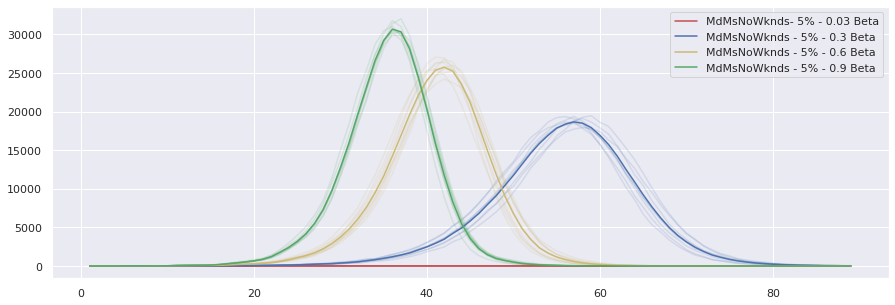

In [30]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/multidistmultistatus_no_wknds_5p/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/single_district/"

files = os.listdir(path)

prefix = "sweep_multiStatusMultiDist_noWkends_5p_betaComparison__agg"

line1 = plotMetric(files, prefix, "0.03.txt", ["metric_new_cases_sympt"],'r-', 0.15) #, weighting=4 
# weighting is for the purpose of comparing between diff census sizes i.e. it scales by x4 the results being plotted
line2 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15)
line3 = plotMetric(files, prefix, "0.6.txt", ["metric_new_cases_sympt"], 'y-', 0.15)
line4 = plotMetric(files, prefix, "0.9.txt", ["metric_new_cases_sympt"], 'g-', 0.15)
#line5 = plotMetric(files, prefix2, "0.1.txt", "metric_new_cases_sympt", 'g', 0.15)
#line6 = plotMetric(files, prefix2, "0.05.txt", "metric_new_cases_sympt", 'y', 0.15)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="MdMsNoWknds- 5% - 0.03 Beta")
plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="MdMsNoWknds - 5% - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="MdMsNoWknds - 5% - 0.6 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="MdMsNoWknds - 5% - 0.9 Beta")
#plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'g', label="Perfect Mixing - .10 Beta")
plt.legend()

plt.rcParams["figure.figsize"] = (15,5)
plt.savefig(path + "MDMSNoWknds_beta_comps_90days_5p.png", dpi=300)

### C1.2 Plot B4.2 results - 20% sample

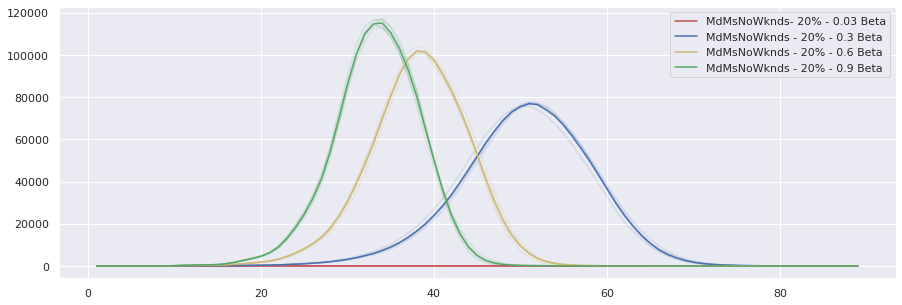

In [27]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/multidistmultistatus_no_wknds_20p/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/single_district/"

files = os.listdir(path)

prefix = "sweep_multiStatusMultiDist_noWkends_20p_betaComparison__agg_"  


line1 = plotMetric(files, prefix, "0.03.txt", ["metric_new_cases_sympt"],'r-', 0.15)
line2 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15)
line3 = plotMetric(files, prefix, "0.6.txt", ["metric_new_cases_sympt"], 'y-', 0.15)
line4 = plotMetric(files, prefix, "0.9.txt", ["metric_new_cases_sympt"], 'g-', 0.15)
#line5 = plotMetric(files, prefix2, "0.1.txt", "metric_new_cases_sympt", 'g', 0.15)
#line6 = plotMetric(files, prefix2, "0.05.txt", "metric_new_cases_sympt", 'y', 0.15)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="MdMsNoWknds- 20% - 0.03 Beta")
plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="MdMsNoWknds - 20% - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="MdMsNoWknds - 20% - 0.6 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="MdMsNoWknds - 20% - 0.9 Beta")
#plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'g', label="Perfect Mixing - .10 Beta")
plt.legend()
plt.rcParams["figure.figsize"] = (15,5)
plt.savefig(path + "MDMS_noWkends_beta_comps_90days_20p.png", dpi=300)

### C1.3 Plot B4.3 results - 50% sample

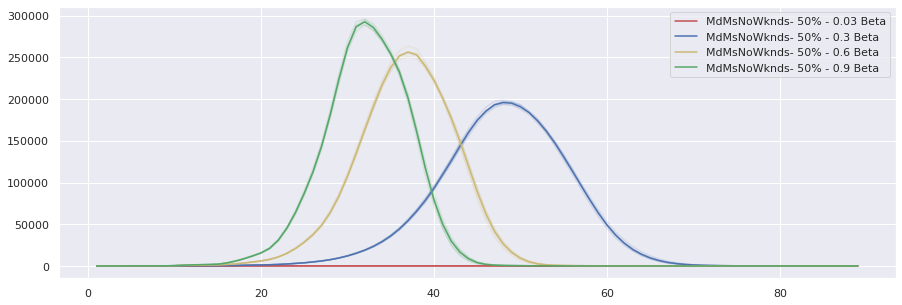

In [28]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/multidistmultistatus_no_wknds_50p/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/single_district/"

files = os.listdir(path)

prefix = "sweep_multiStatusMultiDist_noWkends_50p_betaComparison__agg_"  


line1 = plotMetric(files, prefix, "0.03.txt", ["metric_new_cases_sympt"],'r-', 0.15)
line2 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15)
line3 = plotMetric(files, prefix, "0.6.txt", ["metric_new_cases_sympt"], 'y-', 0.15)
line4 = plotMetric(files, prefix, "0.9.txt", ["metric_new_cases_sympt"], 'g-', 0.15)
#line5 = plotMetric(files, prefix2, "0.1.txt", "metric_new_cases_sympt", 'g', 0.15)
#line6 = plotMetric(files, prefix2, "0.05.txt", "metric_new_cases_sympt", 'y', 0.15)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="MdMsNoWknds- 50% - 0.03 Beta")
plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="MdMsNoWknds- 50% - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="MdMsNoWknds- 50% - 0.6 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="MdMsNoWknds- 50% - 0.9 Beta")
#plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'g', label="Perfect Mixing - .10 Beta")
plt.legend()
plt.rcParams["figure.figsize"] = (15,5)

plt.savefig(path + "MDMS_noWkends_beta_comps_90days_50p.png", dpi=300)

### C1.4 Plot B4.4 results - 75% sample

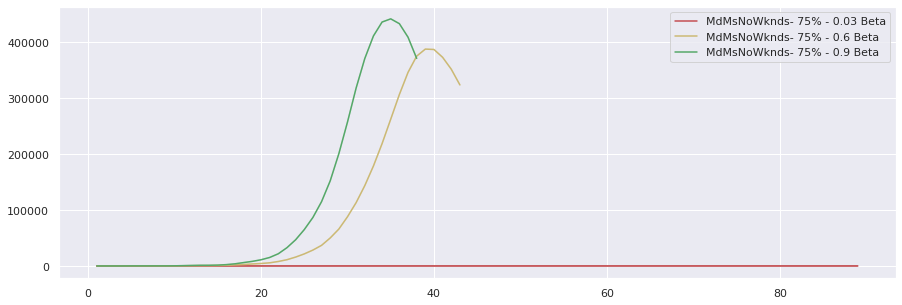

In [39]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/multidistmultistatus_no_wknds_75p/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/single_district/"

files = os.listdir(path)

prefix = "sweep_multiStatusMultiDist_noWkends_75p_betaComparison__agg_"  


line1 = plotMetric(files, prefix, "0.03.txt", ["metric_new_cases_sympt"],'r-', 0.15)
#line2 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15)
line3 = plotMetric(files, prefix, "0.6.txt", ["metric_new_cases_sympt"], 'y-', 0.15)
line4 = plotMetric(files, prefix, "0.9.txt", ["metric_new_cases_sympt"], 'g-', 0.15)
#line5 = plotMetric(files, prefix2, "0.1.txt", "metric_new_cases_sympt", 'g', 0.15)
#line6 = plotMetric(files, prefix2, "0.05.txt", "metric_new_cases_sympt", 'y', 0.15)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="MdMsNoWknds- 75% - 0.03 Beta")
#plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="MdMsNoWknds- 75% - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="MdMsNoWknds- 75% - 0.6 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="MdMsNoWknds- 75% - 0.9 Beta")
#plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'g', label="Perfect Mixing - .10 Beta")
plt.legend()
plt.rcParams["figure.figsize"] = (15,5)

plt.savefig(path + "MDMS_noWkends_beta_comps_90days_75p.png", dpi=300)

### C1.5 Plot B4.5 results - 100% sample

In [ ]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/multidistmultistatus_no_wknds_100p/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/multidist_multistatus/"


files = os.listdir(path)

prefix = "sweep_multiStatusMultiDist_noWkends_100p_betaComparison__agg_"

line1 = plotMetric(files, prefix, "0.03.txt", ["metric_new_cases_sympt"], 'r-', 0.15)
line2 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15)
line3 = plotMetric(files, prefix, "0.6.txt", ["metric_new_cases_sympt"], 'y-', 0.15)
line4 = plotMetric(files, prefix, "0.9.txt", ["metric_new_cases_sympt"], 'g-', 0.15)
#line5 = plotMetric(files, prefix2, "0.1.txt", "metric_new_cases_sympt", 'g', 0.15)
#line6 = plotMetric(files, prefix2, "0.05.txt", "metric_new_cases_sympt", 'y', 0.15)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="MDistMStat- 5% - 0.03 Beta")
plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="MDistMStat - 5% - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="MDistMStat - 5% - 0.6 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="MDistMStat - 5% - 0.9 Beta")
#plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'g', label="Perfect Mixing - .10 Beta")
plt.legend()

plt.savefig(path + "MDMS_nowknds_beta_comps_90days_100p.png", dpi=300)

### C4. Now choose one beta and compare across sample sizes

### 4.1 without scaling

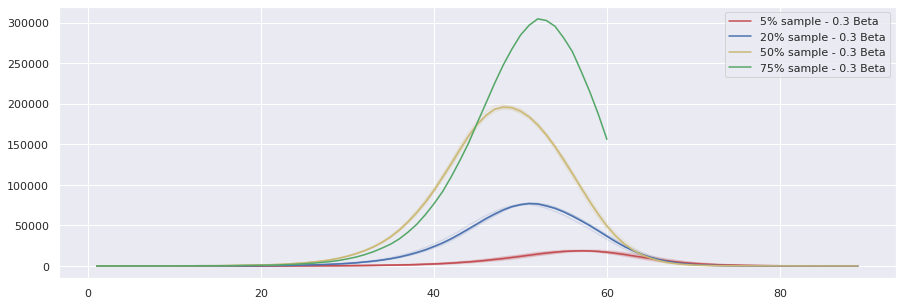

In [42]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/compare_scale/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/compare/"

files = os.listdir(path)

prefix  = "sweep_multiStatusMultiDist_noWkends_5p_betaComparison__agg_"
prefix2 = "sweep_multiStatusMultiDist_noWkends_20p_betaComparison__agg_"
prefix3 = "sweep_multiStatusMultiDist_noWkends_50p_betaComparison__agg_"
prefix4 = "sweep_multiStatusMultiDist_noWkends_75p_betaComparison__agg_"

line1 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'r-', 0.15)
line2 = plotMetric(files, prefix2, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15)
line3 = plotMetric(files, prefix3, "0.3.txt", ["metric_new_cases_sympt"], 'y-', 0.15)
line4 = plotMetric(files, prefix4, "0.3.txt", ["metric_new_cases_sympt"], 'g-', 0.15)
#line5 = plotMetric(files, prefix2, "0.1.txt", "metric_new_cases_sympt", 'g', 0.15)
#line6 = plotMetric(files, prefix2, "0.05.txt", "metric_new_cases_sympt", 'y', 0.15)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="5% sample - 0.3 Beta")
plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="20% sample - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="50% sample - 0.3 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="75% sample - 0.3 Beta")
#plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'g', label="Perfect Mixing - .10 Beta")
plt.legend()

plt.savefig(path + "comp_MSMDS_scales_p3beta_noWknds.png", dpi=300)



### 4.2 with scaling

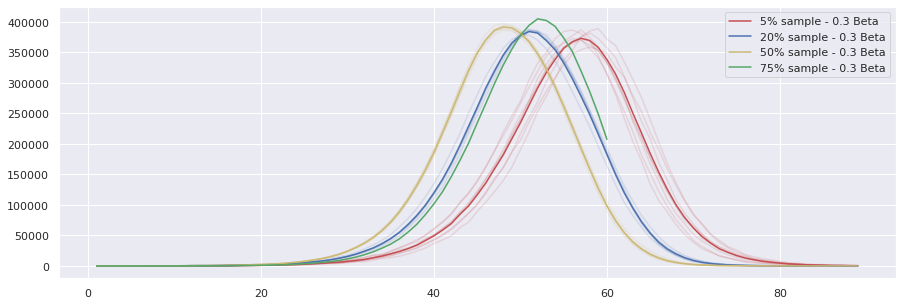

In [43]:
path = "/home/wb488473/Disease-Modelling-SSA/data/verification/output/sweep/compare_scale/"
#path = "/Users/swise/workspace/worldbank/Disease-Modelling-SSA/data/verification/compare/"

files = os.listdir(path)

prefix  = "sweep_multiStatusMultiDist_noWkends_5p_betaComparison__agg_"
prefix2 = "sweep_multiStatusMultiDist_noWkends_20p_betaComparison__agg_"
prefix3 = "sweep_multiStatusMultiDist_noWkends_50p_betaComparison__agg_"
prefix4 = "sweep_multiStatusMultiDist_noWkends_75p_betaComparison__agg_"

line1 = plotMetric(files, prefix, "0.3.txt", ["metric_new_cases_sympt"], 'r-', 0.15, weighting=20)
line2 = plotMetric(files, prefix2, "0.3.txt", ["metric_new_cases_sympt"], 'b-', 0.15, weighting=5)
line3 = plotMetric(files, prefix3, "0.3.txt", ["metric_new_cases_sympt"], 'y-', 0.15, weighting=2)
line4 = plotMetric(files, prefix4, "0.3.txt", ["metric_new_cases_sympt"], 'g-', 0.15, weighting=1.33)
#line4 = plotMetric(files, prefix5, "0.3.txt", ["metric_new_cases_sympt"], 'g-', 0.15, weighting=1.33)

plt.plot(line1["myTime"][1:], line1['myLine'][1:], 'r', label="5% sample - 0.3 Beta")
plt.plot(line2["myTime"][1:], line2['myLine'][1:], 'b', label="20% sample - 0.3 Beta")
plt.plot(line3["myTime"][1:], line3['myLine'][1:], 'y', label="50% sample - 0.3 Beta")
plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'g', label="75% sample - 0.3 Beta")
#plt.plot(line4["myTime"][1:], line4['myLine'][1:], 'y', label="100% sample - 0.3 Beta")


plt.legend()

plt.savefig(path + "comp_MSMDS_scales_p3beta_noWknds_weighted.png", dpi=300)
